<big><h2 align="center" style="color:Black">PREDICTING CAR PRICES IN TURKEY</h2></big>

<big><font color="grey"><b>Aksana Lefter</b></font></big>

A car resale company in Turkey requires a model that can predict the price of a car based on its parameters. To make this forecast, data is collected from a car buying/selling website in Turkey that has announcements from 2020. The data includes car parameters such as model, model year, mileage, body type, color, and more.

Our goal is to examine the data, identify the parameters that impact the car’s price, and develop a model that can more accurately predict the price based on these parameters.

## Data analysis

Loading data and libraries.

In [1]:
# Library installation
!pip install pandas -q
!pip install numpy -q
!pip install matplotlib -q
!pip install seaborn -q
!pip install scikit-learn -q
!pip install gdown -q
!pip install scipy -q
!pip install phik -q
!pip install catboost -q
!pip install xgboost -q

In [115]:
# Library import
import gdown
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import math
import statsmodels.api as sm  
from statsmodels.formula.api import ols  
import scipy.stats as stats 
import phik
from phik.report import plot_correlation_matrix
from phik import report
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn import tree
from sklearn import metrics
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from catboost import CatBoostRegressor
from sklearn.model_selection import GridSearchCV
from sklearn.dummy import DummyRegressor
from sklearn.model_selection import cross_val_score
from xgboost import XGBRegressor

import warnings
warnings.filterwarnings('ignore')

In [116]:
# Create a list with possible missing data
missing_values = ['-','- -','n/a','na']

# Load data first 7 lines
try:
    data = pd.read_csv("turkey_car_market.csv", na_values=missing_values)
    print("uploaded locally")
except:
    file_id = '1dBICaFGyw85Ah8oHwLLrrbXNBo6kFPwo'
    url = f'https://drive.google.com/uc?id={file_id}'
    output = 'turkeycar_name.csv'
    gdown.download(url, output, quiet=False)
    data = pd.read_csv(output, na_values=missing_values)
    print("data download")
    
data.head(7)

uploaded locally


,İlan Tarihi,Marka,Arac Tip Grubu,Arac Tip,Model Yıl,Yakıt Turu,Vites,CCM,Beygir Gucu,Renk,Kasa Tipi,Kimden,Durum,Km,Fiyat
0,27/05/2020,Jaguar,XF,2.0 D Prestige Plus,2017.0,Dizel,Otomatik Vites,1801-2000 cc,176-200 BG,Lacivert,Hatchback 5 Kapı,Galeriden,2. El,26100,634500
1,16/06/2020,Acura,CL,NaN,2015.0,Dizel,Yarı Otomatik Vites,1301-1600 cc,101-125 BG,Mavi,Sedan,Sahibinden,2. El,127000,151500
2,14/06/2020,Acura,CL,2.2,1994.0,Benzin/LPG,Düz Vites,1301-1600 cc,101-125 BG,Turkuaz,Sedan,Sahibinden,2. El,175000,19750
3,11/06/2020,Acura,CL,NaN,2013.0,Dizel,Düz Vites,1301-1600 cc,76-100 BG,Kahverengi,Sedan,Sahibinden,2. El,325,52000
4,11/06/2020,Acura,CL,2.2,2010.0,Dizel,Otomatik Vites,1801-2000 cc,151-175 BG,Beyaz,Sedan,Sahibinden,2. El,207000,148750
5,04/06/2020,Acura,CL,2.2,1999.0,Dizel,Düz Vites,1801-2000 cc,101-125 BG,Lacivert,Roadster,Galeriden,2. El,320000,42500
6,03/06/2020,Acura,CL,2.2,2014.0,Dizel,Otomatik Vites,1301-1600 cc,101-125 BG,Kırmızı,Sedan,Galeriden,2. El,183,170000


<strong>The variables in the data set are as follows:</strong>

İlan Tarihi: Date

Marka: Brand

Arac Tip Grubu: Vehicle Type Group

Arac Tip: Vehicle Type

Model Yıl: Model Year

Yakıt Turu: Fuel Type (Benzin: Petrol, Dizel: Diesel, Benzin / LPG: Gasoline, Hibrit: Hybrid, Elektrik: Electricity)

Vites: Transmission (Otomatik: Automatic, Yarı Otomatik: Semi Automatic, Düz: Manual)

CCM: CCM

Beygir Gucu: Horse Power

Renk: Color

Kasa Tipi: Body Type

Kimden: Seller

Durum: Condition on the car

KM: Kilometers

Fiyat: Price

Let's see how much data there is and of what type.

In [117]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9044 entries, 0 to 9043
Data columns (total 15 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   İlan Tarihi     9044 non-null   object 
 1   Marka           9044 non-null   object 
 2   Arac Tip Grubu  9044 non-null   object 
 3   Arac Tip        8989 non-null   object 
 4   Model Yıl       9044 non-null   float64
 5   Yakıt Turu      9044 non-null   object 
 6   Vites           9044 non-null   object 
 7   CCM             9043 non-null   object 
 8   Beygir Gucu     9043 non-null   object 
 9   Renk            9044 non-null   object 
 10  Kasa Tipi       9044 non-null   object 
 11  Kimden          9044 non-null   object 
 12  Durum           9044 non-null   object 
 13  Km              9044 non-null   int64  
 14  Fiyat           9044 non-null   int64  
dtypes: float64(1), int64(2), object(12)
memory usage: 1.0+ MB


There are only 9044 rows in the dataset, and the columns Arac Tip, CCM and Beygir Gucu have missing data. Let’s begin by checking the dataset for any duplicates.

In [118]:
print(f'There are {data.duplicated().sum()} duplicates in our dataframe.')

There are 1594 duplicates in our dataframe.


Let's remove the duplicates and see if there is any missing data.

In [119]:
data = data.drop_duplicates() 

In [120]:
data.isnull().sum()

İlan Tarihi        0
Marka              0
Arac Tip Grubu     0
Arac Tip          54
Model Yıl          0
Yakıt Turu         0
Vites              0
CCM                1
Beygir Gucu        1
Renk               0
Kasa Tipi          0
Kimden             0
Durum              0
Km                 0
Fiyat              0
dtype: int64

Duplicates have been removed and we can see that there is missing data in the following columns: Arac Tip: Vehicle Type - 54, CCM - 1, Beygir Gucu: Horse Power - 1. Let’s examine these 3 columns to determine the data they contain and, based on that, decide on a preferable course of action, which is either to replace the missing data or to remove it.

In [121]:
data['Arac Tip'].value_counts()

Diğer               938
1.5 dCi Touch       147
1.5 dCi Joy         145
1.6 TDCi Trend X     98
1.5 dCi Icon         95
                   ... 
1.3 M.jet             1
190 E 1.8             1
300 E                 1
320                   1
1.4 Mode              1
Name: Arac Tip, Length: 1758, dtype: int64

In [122]:
data['CCM'].value_counts()

1301-1600 cc        4641
1300 cc ve altı     1026
1801-2000 cc         742
1601-1800 cc         364
2501-3000 cc         287
2001-2500 cc         173
Bilmiyorum           108
3501-4000 cc          36
3001-3500 cc          35
4001-4500 cc          16
5001-5500 cc           9
4501-5000 cc           8
6001 cc ve üzeri       2
5501-6000 cc           2
Name: CCM, dtype: int64

In [123]:
data['Beygir Gucu'].value_counts()

Bilmiyorum         4480
101-125 BG          888
76-100 BG           824
51-75 BG            340
126-150 BG          334
100 BG ve altı      284
151-175 BG          102
176-200 BG          100
226-250 BG           29
201-225 BG           21
251-275 BG           16
50 BG ve altı        11
276-300 BG            7
301-325 BG            6
326-350 BG            4
376-400 BG            1
601 BG ve üzeri       1
451-475 BG            1
Name: Beygir Gucu, dtype: int64

Upon closer examination, we see that some columns contain unknown or missing information. This may be because the seller did not provide the necessary details for certain fields, or because the data was collected from a website where these parameters were unavailable. To determine how to handle this data, we will assess its correlation with the price. If there is a weak correlation, we will keep the option as unknown or different.
To measure this correlation, we will use the Phik matrix. 
The Phik (𝜙k) is a new and practical correlation coefficient that works consistently between categorical, ordinal and interval variables, captures non-linear dependency and reverts to the Pearson correlation coefficient in case of a bivariate normal input distribution.[1]

interval columns not set, guessing: ['Model Yıl', 'Km', 'Fiyat']


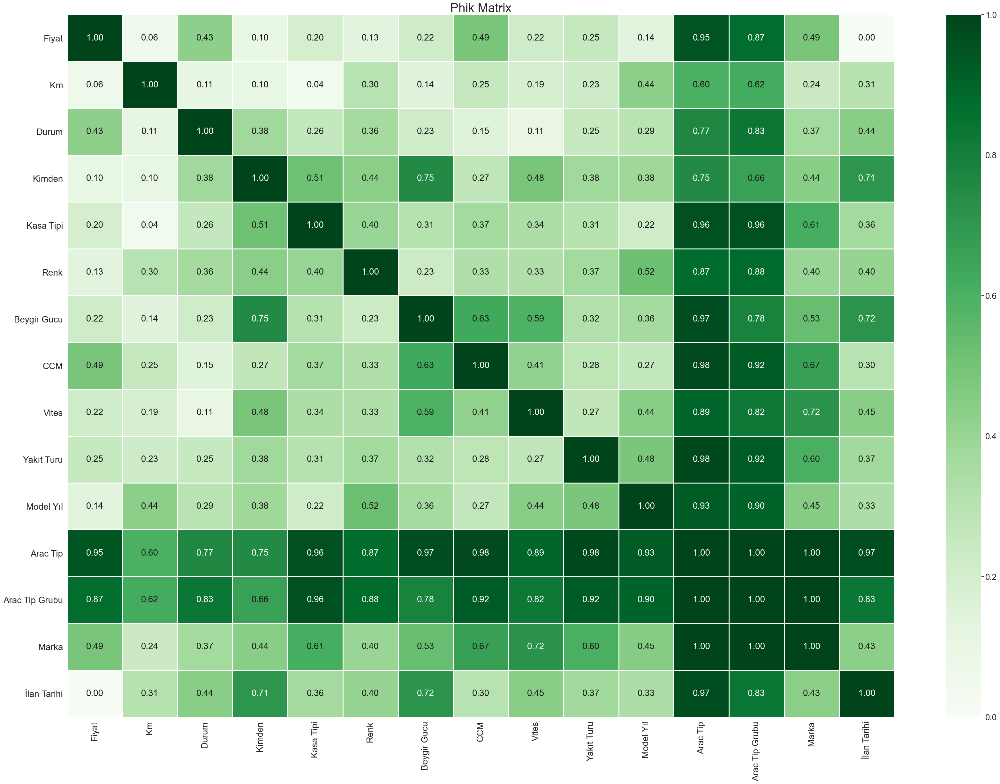

In [110]:
phik_overview = data.phik_matrix()
phik_overview.round(2)
plot_correlation_matrix(phik_overview.values, 
                        x_labels=phik_overview.columns, 
                        y_labels=phik_overview.index, 
                        vmin=0, vmax=1, color_map="Greens", 
                        title=r"Phik Matrix", 
                        fontsize_factor=2, 
                        figsize=(35, 25))
plt.tight_layout()

So, we can see that the correlation between the parameters CMM and Beygir Gücü and the cost of the car is not very strong. Therefore, we will replace the missing values with Bilmiyorum, which means unknown. On the other hand, the Arac Tip column does have a correlation with the price. However, since we have an additional column containing the car model data, we have decided to replace the missing data with Diğer, which means something else.

In [124]:
data[['CCM', 'Beygir Gucu']] = data[['CCM', 'Beygir Gucu']].fillna('Bilmiyorum')
data['Arac Tip'] = data['Arac Tip'].fillna('Diğer')

In [125]:
data.isnull().sum()

İlan Tarihi       0
Marka             0
Arac Tip Grubu    0
Arac Tip          0
Model Yıl         0
Yakıt Turu        0
Vites             0
CCM               0
Beygir Gucu       0
Renk              0
Kasa Tipi         0
Kimden            0
Durum             0
Km                0
Fiyat             0
dtype: int64

Now that there are no missing values, let’s change the format in the “İlan Tarihi: Date” column from object to datetime.

In [126]:
data['İlan Tarihi'] = pd.to_datetime(data['İlan Tarihi'])
data.tail(7)

,İlan Tarihi,Marka,Arac Tip Grubu,Arac Tip,Model Yıl,Yakıt Turu,Vites,CCM,Beygir Gucu,Renk,Kasa Tipi,Kimden,Durum,Km,Fiyat
9037,2020-07-06,Tofaş,Şahin,1.6 ie,2001.0,Benzin/LPG,Düz Vites,1601-1800 cc,76-100 BG,Gri,Sedan,Galeriden,2. El,176000,20900
9038,2020-06-06,Tofaş,Kartal,SLX ie,1999.0,Benzin/LPG,Düz Vites,1601-1800 cc,76-100 BG,Beyaz,Station Wagon,Galeriden,2. El,198,19950
9039,2020-06-06,Tofaş,Şahin,1.6,1994.0,Benzin/LPG,Düz Vites,1301-1600 cc,51-75 BG,Beyaz,Sedan,Galeriden,2. El,121212,12250
9040,2020-05-06,Tofaş,Şahin,Şahin 5 vites,1992.0,Benzin/LPG,Düz Vites,1301-1600 cc,76-100 BG,Bej,Sedan,Sahibinden,2. El,54000,16300
9041,2020-05-06,Tofaş,Doğan,SLX,1993.0,Benzin/LPG,Düz Vites,1301-1600 cc,76-100 BG,Yeşil,Sedan,Sahibinden,2. El,135000,19000
9042,2020-04-06,Tofaş,Kartal,Kartal 5 Vites,1991.0,Benzin/LPG,Düz Vites,1601-1800 cc,76-100 BG,Kırmızı,Hatchback 5 Kapı,Galeriden,2. El,250000,11000
9043,2020-04-06,Tofaş,Kartal,Kartal 5 Vites,1996.0,Benzin/LPG,Düz Vites,1301-1600 cc,51-75 BG,Beyaz,Sedan,Galeriden,2. El,11,15750


So, let’s proceed to the visualization.

## Hypotheses

### 1) The cost of the car is influenced by the brand.

First, let's take a look at the distribution of prices by car brand.

[Text(0.5, 1.0, 'Price distribution by car brand'),
 Text(0.5, 0, 'Price'),
 Text(0, 0.5, 'Car brand')]

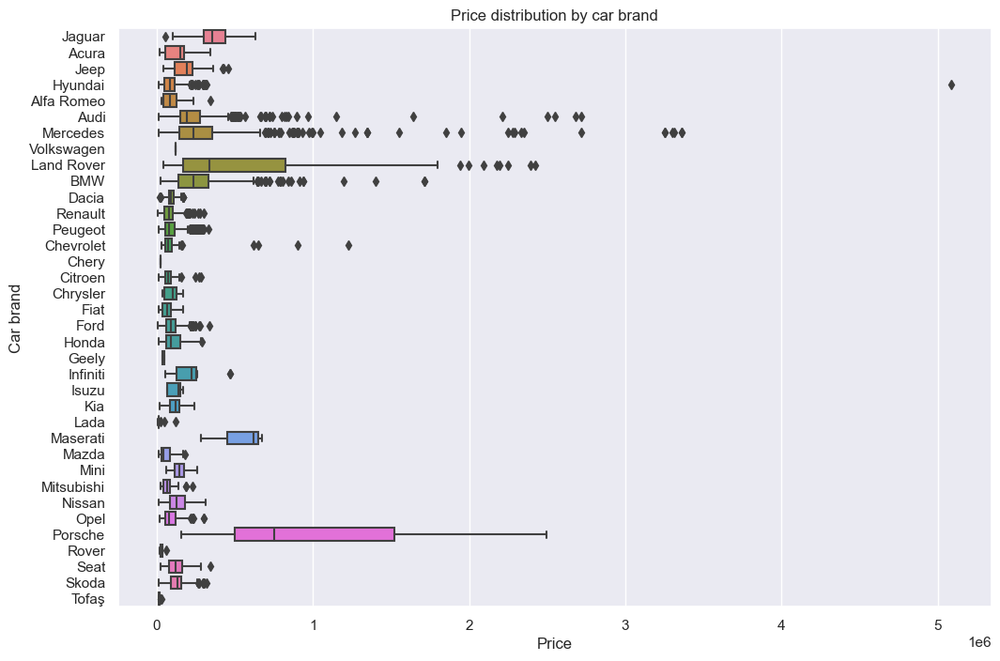

In [15]:
sns.set(rc={"figure.figsize":( 12,8)})
sns.boxplot(y='Marka', x='Fiyat', data=data,palette = "husl")\
.set(title='Price distribution by car brand',xlabel="Price",ylabel="Car brand")

Since there are outliers in our data (an outlier is a single data point that goes far outside the average value of a group of statistics[2]), which is clearly shown in the boxplot, it is best to focus on the median price value rather than the average. The arithmetic mean of a data set is calculated by summing all the numbers in the sample and dividing the resulting sum by the number of numbers.
On the other hand, the median is the number that falls exactly in the middle of a list of numbers in the data set, when they are arranged in ascending order. Therefore, we will focus on the median so that the outliers do not distort the understanding of price.

From the graph, it is evident that Porsche and Maserati are the most expensive car brands, while Lada, Rover, Tofas, Chery, Geely, and Mazda are the cheapest.

### 2) Influence of the year of the model on the price

Let's take a look at the median price by year of car model.

<Axes: title={'center': 'Median price value by model year'}, xlabel='Model Year', ylabel='Price'>

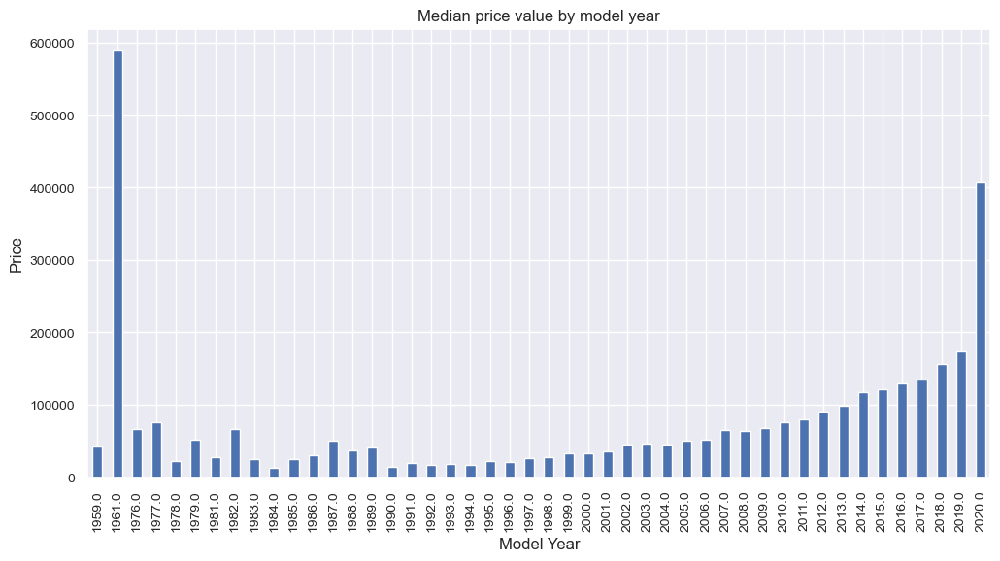

In [16]:
data[['Model Yıl', 'Fiyat']].pivot(columns = 'Model Yıl', values = 'Fiyat')\
.median().plot(kind="bar", rot=90,fontsize=10,title="Median price value by model year",\
               figsize = (12,6),xlabel='Model Year',ylabel='Price')

From the chart, we can see the distribution of car prices by model year. For instance, the price for a 1961 model is considerably higher than that of a 2020 model. This suggests that vintage cars can be valued significantly higher, sometimes even surpassing the cost of new cars.

To verify this hypothesis, we will employ the statistical test, Simple Regression, to determine the statistical significance between the variables.

In [17]:
x = data['Model Yıl']
y = data['Fiyat']
# with statsmodels
x = sm.add_constant(x) 
 
model = sm.OLS(y, x).fit()
predictions = model.predict(x) 
 
print_model = model.summary()
print(print_model)

                            OLS Regression Results                            
Dep. Variable:                  Fiyat   R-squared:                       0.094
Model:                            OLS   Adj. R-squared:                  0.094
Method:                 Least Squares   F-statistic:                     770.3
Date:                Sun, 02 Jul 2023   Prob (F-statistic):          2.01e-161
Time:                        19:35:32   Log-Likelihood:            -1.0225e+05
No. Observations:                7450   AIC:                         2.045e+05
Df Residuals:                    7448   BIC:                         2.045e+05
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const      -2.054e+07   7.46e+05    -27.552      0.0

The test results show that the Prob (F-statistic) is nearly zero, thus leading us to reject the null hypothesis and conclude that there is a statistically significant relationship between the variables. Consequently, we can conclude that the year of the model impacts the price of the car.

### 3) The cost of the car also depends on the fuel type

Let’s examine auto prices based on fuel type.

<Axes: title={'center': 'Median price by fuel type'}, xlabel='Fuel type', ylabel='Price'>

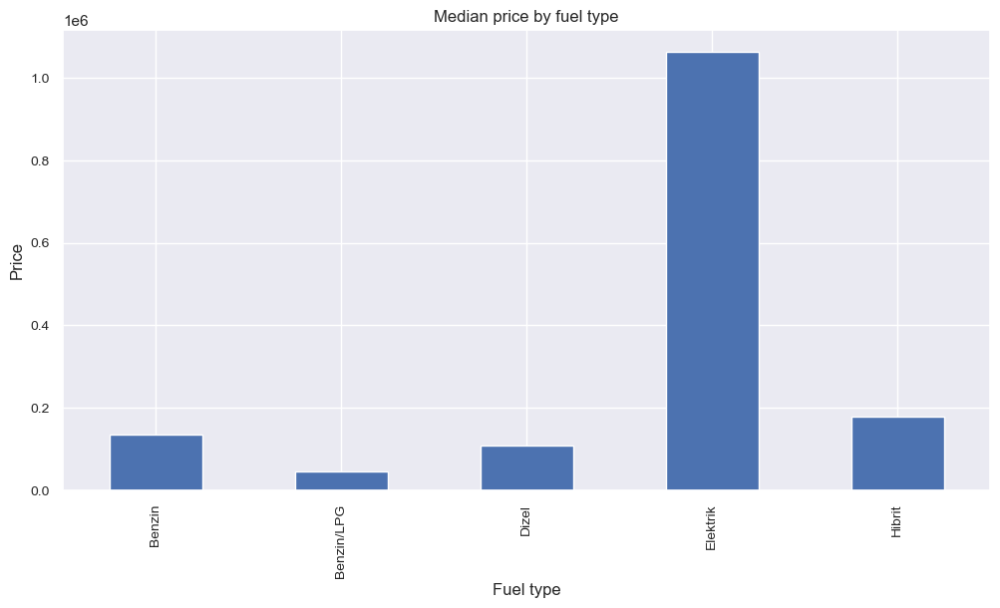

In [18]:
data[['Yakıt Turu', 'Fiyat']].pivot(columns = 'Yakıt Turu', values = 'Fiyat').median()\
.plot(kind="bar", rot=90,fontsize=10,title="Median price by fuel type",\
               figsize = (12,6),xlabel='Fuel type',ylabel='Price')

According to the graph, we can see that electric cars are the most expensive ones.

### 4) The price also depends on the type of car body

Let's look at the prices of cars according to their body types.

[Text(0, 0, 'Hatchback 5 Kapı'),
 Text(1, 0, 'Sedan'),
 Text(2, 0, 'Roadster'),
 Text(3, 0, 'Arazi Aracı'),
 Text(4, 0, 'Diğer'),
 Text(5, 0, 'Hatchback 3 Kapı'),
 Text(6, 0, 'Spor / Coupe'),
 Text(7, 0, 'Station Wagon'),
 Text(8, 0, 'Camlı Van'),
 Text(9, 0, 'Üstü Açık / Cabriolet'),
 Text(10, 0, 'MPV'),
 Text(11, 0, 'Crossover'),
 Text(12, 0, 'Minivan')]

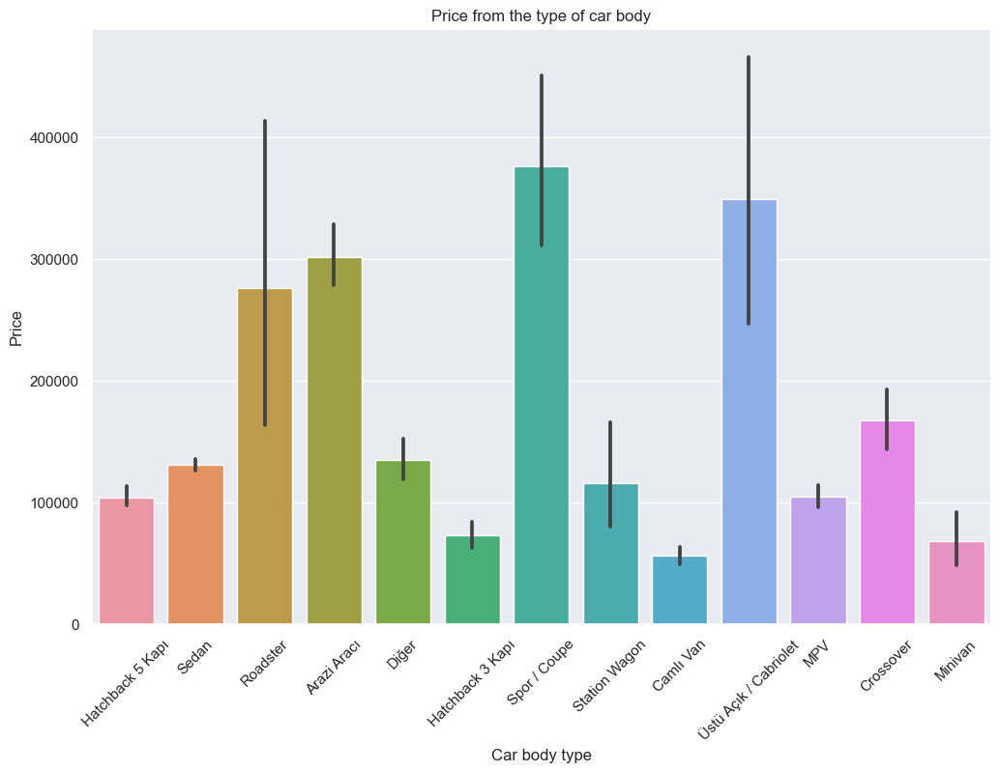

In [19]:
ax=sns.barplot(x='Kasa Tipi', y='Fiyat', data=data)
sns.set(rc={'figure.figsize':(12,6)})
ax.set(title='Price from the type of car body',xlabel="Car body type",ylabel="Price")
ax.set_xticklabels(ax.get_xticklabels(),rotation = 45)

Here we can see, that the most expensive body types are coupe, cabriolet, SUV, and roadster.

### 5) The car's transmission can influence the price

[Text(0.5, 1.0, 'Prices from the type of transmissions'),
 Text(0.5, 0, 'Transmission'),
 Text(0, 0.5, 'Price')]

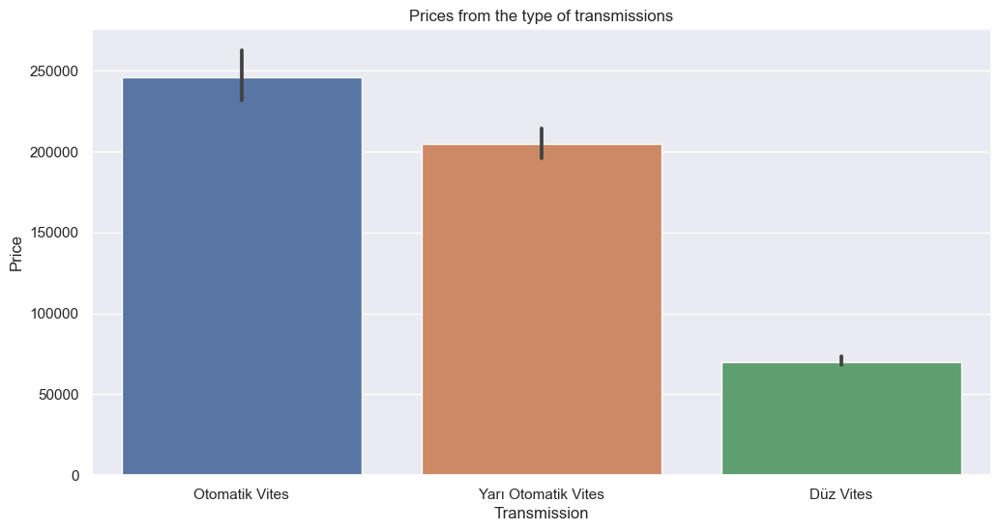

In [20]:
ax = sns.barplot(x = data["Vites"], y = data["Fiyat"], data = data)
sns.set(rc={'figure.figsize':(12,6)})
ax.set(title='Prices from the type of transmissions',xlabel="Transmission",ylabel="Price")

You can see from the graph that the automatic transmission is more expensive than the others.

### 6) The condition of the car affects the price

[Text(0.5, 1.0, 'Prices depending on the condition of the car'),
 Text(0.5, 0, 'Condition on the car'),
 Text(0, 0.5, 'Price')]

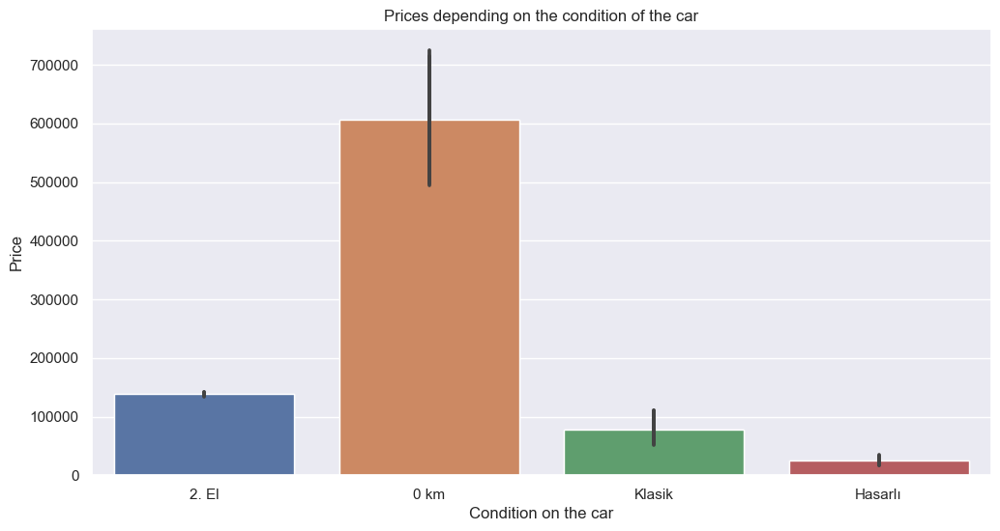

In [21]:
sns.barplot(x = data["Durum"], y = data["Fiyat"], data = data)
ax = sns.barplot(x = data["Durum"], y = data["Fiyat"], data = data)
sns.set(rc={'figure.figsize':(12,6)})
ax.set(title='Prices depending on the condition of the car',xlabel="Condition on the car",ylabel="Price")

Cars with 0 km mileage are priced higher than used cars. Moreover, if a car is damaged, its price is significantly lower than that of a car in normal condition.

### 7) The seller influences the value of the car

[Text(0.5, 1.0, 'Prices by seller'),
 Text(0.5, 0, 'Seller'),
 Text(0, 0.5, 'Price')]

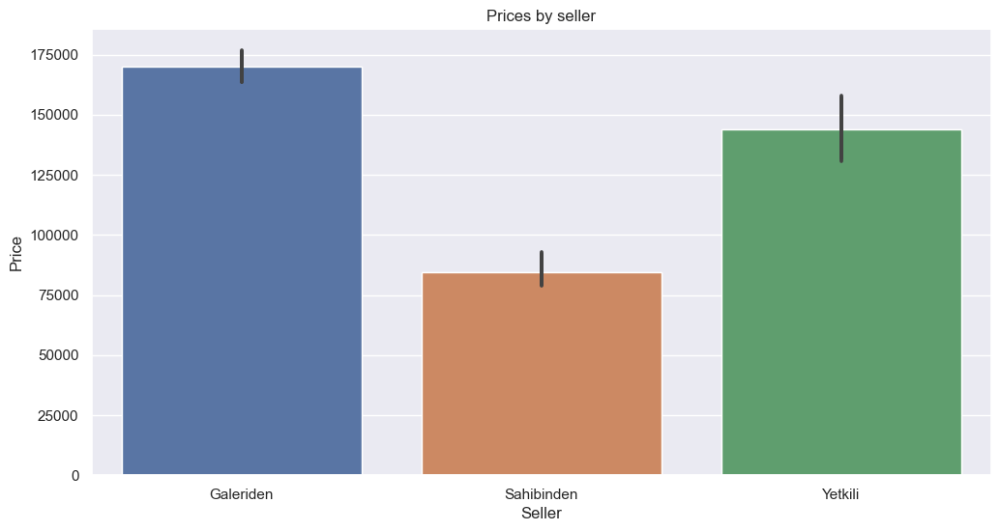

In [22]:
sns.barplot(x = data["Kimden"], y = data["Fiyat"], data = data)
ax = sns.barplot(x = data["Kimden"], y = data["Fiyat"], data = data)
sns.set(rc={'figure.figsize':(12,6)})
ax.set(title='Prices by seller',xlabel="Seller",ylabel="Price")

Owners sell their cars cheaper than the official dealer or a car from the gallery/car market. Let's perform a statistical test to see if these categories are not equal.

In [37]:
galeriden=data[data['Kimden']=="Galeriden"]["Fiyat"]

In [38]:
sahibinden=data[data['Kimden']=="Sahibinden"]["Fiyat"]

In [39]:
yetkili=data[data['Kimden']=="Yetkili"]["Fiyat"]

In [22]:
F, p = stats.f_oneway(galeriden,sahibinden,yetkili) 
print(f'F - statistic {F}.')
print(f'P - value {p}.')

F - statistic 87.14014455551107.
P - value 3.9044389011268834e-38.


Based on the obtained p-value of less than 0.05, we can reject the null hypothesis (which suggests there is no difference between the groups). This indicates that there are variations in average prices within the groups. Let’s specifically compare only the Galeriden group with the Yetkili group.

In [23]:
stats.ttest_ind(a=galeriden, b=yetkili)

Ttest_indResult(statistic=0.8486084371979425, pvalue=0.396133973997974)

Upon seeing a p-value greater than 0.05, we cannot reject the null hypothesis and must conclude that the two groups are equal.
Let’s proceed to compare the Galeriden group with the Sahibinden group.

In [40]:
stats.ttest_ind(a=galeriden, b=sahibinden)

Ttest_indResult(statistic=13.143770820449637, pvalue=5.057853751837618e-39)

Now we see that the p-value is close to zero, indicating that the two groups are not equal. This confirms our hypothesis that purchasing from a car owner is cheaper.

### 8) Influence of Color on Car Value

<Axes: title={'center': 'Median price according to the color of the car'}, xlabel='Color', ylabel='Price'>

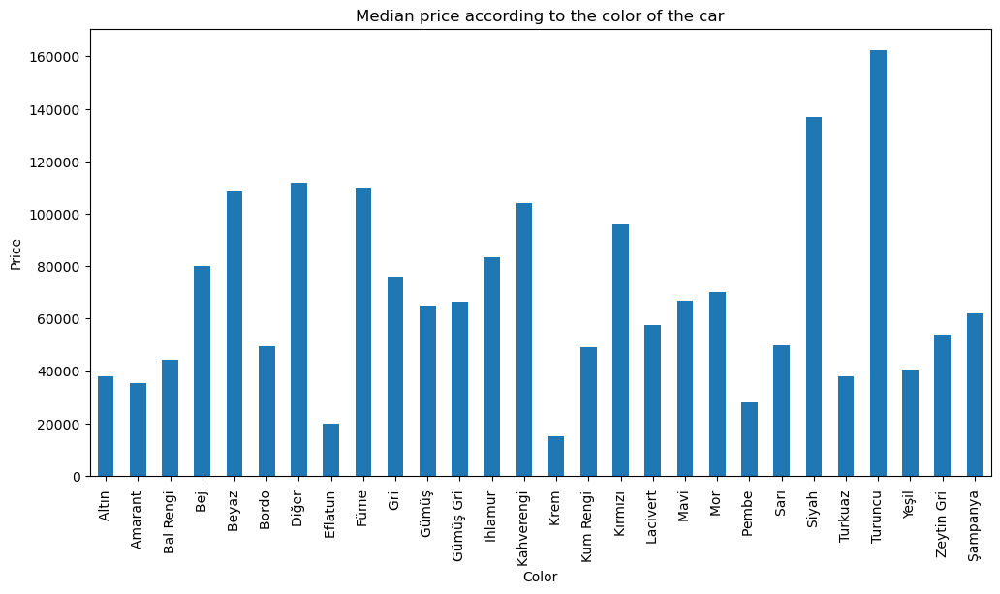

In [41]:
data[['Renk', 'Fiyat']].pivot(columns = 'Renk', values = 'Fiyat').median()\
.plot(kind="bar", rot=90,fontsize=10,title="Median price according to the color of the car",\
               figsize = (12,6),xlabel='Color',ylabel='Price')

We can see that black and orange cars have the highest median price. As mentioned earlier, the price of a car is also influenced by the type of body. Let’s examine the body types associated with these two colors. It’s possible that the color itself doesn’t significantly impact the price, and that other parameters are responsible for the pricing.

In [42]:
black = data[data["Renk"]=="Siyah "]
orange = data[data["Renk"]=="Turuncu "]

In [43]:
black["Kasa Tipi"].value_counts().to_frame()

,Kasa Tipi
Sedan,556
Arazi Aracı,261
Hatchback 5 Kapı,246
Spor / Coupe,31
MPV,14
Station Wagon,11
Diğer,10
Hatchback 3 Kapı,9
Üstü Açık / Cabriolet,5
Crossover,4


In [44]:
orange["Kasa Tipi"].value_counts().to_frame()

,Kasa Tipi
Arazi Aracı,18
Hatchback 5 Kapı,9
Crossover,2
Spor / Coupe,1
Diğer,1
MPV,1


The most expensive body types are coupes, cabriolets, SUVs, and roadsters. In the case of orange cars, the majority of them are SUVs. Therefore, the graph shows that this color is associated with higher prices, but it’s actually the body type that has a greater influence on the cost of the car. The same can be said about black cars, where we also see expensive body types such as coupes, SUVs, and cabriolets.

### Key points

1. The price of the car depends on the year of the car model.
2. Electric cars are more expensive than fuel-powered cars.
3. The most expensive body types are coupe, cabriolet, SUV and roadster.
4. Automatic transmission is more expensive than other types of transmission.
5. The price of the car depends on its condition.
6. Buying a car directly from the owner is cheaper than purchasing from a dealer or other car sales companies.


## Preparing data for modeling

Make a copy of the dataset in case we need to refer back to the original dataset.

In [127]:
df=data.copy()

Delete the column with the date since it is not relevant to our prediction.

In [128]:
df.drop(df.columns[[0]], axis=1, inplace=True)

There are outliers in our dataset. Let’s examine cars that are priced higher than 3,000,000.

In [129]:
df[df['Fiyat']>=3000000.0]

,Marka,Arac Tip Grubu,Arac Tip,Model Yıl,Yakıt Turu,Vites,CCM,Beygir Gucu,Renk,Kasa Tipi,Kimden,Durum,Km,Fiyat
3478,Hyundai,I20,1.4 CRDI Jump,2013.0,Dizel,Düz Vites,1300 cc ve altı,76-100 BG,Beyaz,Hatchback 5 Kapı,Sahibinden,2. El,140000,5086500
4410,Mercedes,Maybach S,S 560,2020.0,Benzin,Otomatik Vites,3501-4000 cc,Bilmiyorum,Siyah,Sedan,Galeriden,0 km,0,3360000
4588,Mercedes,G Serisi,63 AMG,2020.0,Benzin,Otomatik Vites,3501-4000 cc,Bilmiyorum,Siyah,Arazi Aracı,Galeriden,0 km,0,3310000
4589,Mercedes,G Serisi,63 AMG,2020.0,Benzin,Otomatik Vites,3501-4000 cc,Bilmiyorum,Beyaz,Arazi Aracı,Galeriden,0 km,0,3300000
4704,Mercedes,Maybach S,S 560,2020.0,Benzin,Otomatik Vites,3501-4000 cc,Bilmiyorum,Siyah,Sedan,Galeriden,0 km,0,3360000
4824,Mercedes,G Serisi,63 AMG,2020.0,Benzin,Otomatik Vites,3501-4000 cc,Bilmiyorum,Siyah,Arazi Aracı,Galeriden,2. El,900,3250000
4826,Mercedes,G Serisi,63 AMG,2020.0,Benzin,Otomatik Vites,3501-4000 cc,Bilmiyorum,Siyah,Arazi Aracı,Galeriden,0 km,0,3250000


We can see that most of these cars are premium models from Mercedes, except for one Hyundai model from 2013. It is evident that this car cannot cost that much, as it is a very ordinary car with manual transmission and was purchased directly from the owner. It is likely that there is an error in the price. Therefore, let’s eliminate this outlier from our dataset and retain only the premium cars from Mercedes, so that our model can accurately predict the prices of this car type.

In [130]:
df = df.drop (index= 3478 )

Also, let’s analyze the prices of cars under 10,000. This will allow us to identify any unrealistic prices that may further impact our model.

In [131]:
df[df['Fiyat']<=10000.0]

,Marka,Arac Tip Grubu,Arac Tip,Model Yıl,Yakıt Turu,Vites,CCM,Beygir Gucu,Renk,Kasa Tipi,Kimden,Durum,Km,Fiyat
2966,Ford,Scorpio,2.0,1990.0,Benzin/LPG,Düz Vites,1801-2000 cc,101-125 BG,Bordo,Sedan,Galeriden,Hasarlı,2222,6250
2975,Honda,Accord,1.6\n,1984.0,Benzin/LPG,Düz Vites,1301-1600 cc,100 BG ve altı,Gümüş Gri,Sedan,Galeriden,Hasarlı,100000,10000
2976,Honda,Accord,1.6\n,1986.0,Benzin,Düz Vites,1301-1600 cc,100 BG ve altı,Ihlamur,Sedan,Galeriden,Hasarlı,100000,10000
2977,Honda,Civic,1.4\n,1990.0,Benzin/LPG,Düz Vites,1301-1600 cc,100 BG ve altı,Kırmızı,Sedan,Galeriden,Hasarlı,100000,10000
2978,Honda,Accord,2.0 EX,1990.0,Benzin/LPG,Otomatik Vites,1801-2000 cc,100 BG ve altı,Füme,Sedan,Galeriden,Hasarlı,100000,10000
2979,Honda,Accord,2.0\n,1991.0,Benzin/LPG,Otomatik Vites,1801-2000 cc,101-125 BG,Gümüş Gri,Sedan,Galeriden,Hasarlı,100000,10000
2980,Honda,Accord,2.0\n,1991.0,Benzin,Düz Vites,1801-2000 cc,100 BG ve altı,Füme,Sedan,Galeriden,Hasarlı,100000,10000
2981,Honda,Integra,1.8,1991.0,Benzin/LPG,Düz Vites,1601-1800 cc,101-125 BG,Kırmızı,Sedan,Galeriden,Hasarlı,100000,10000
2982,Honda,CRX,1.6i 16V,1991.0,Benzin/LPG,Düz Vites,1301-1600 cc,126-150 BG,Kırmızı,Hatchback 3 Kapı,Galeriden,Hasarlı,100000,10000
2984,Honda,Accord,2.0\n,1994.0,Benzin/LPG,Düz Vites,1801-2000 cc,101-125 BG,Siyah,Sedan,Galeriden,Hasarlı,100000,10000


Here, the prices reflect reality: very low prices are mostly for damaged or very old cars. Therefore, we will leave the data as is and not delete anything.

Before dividing the data into samples, let’s examine the number of cars by brand. If a model appears only once in the dataset, it would make sense to remove it from the dataset.


In [132]:
df['Marka'].value_counts()

Renault       965
Fiat          649
Opel          645
Ford          600
Hyundai       577
BMW           567
Mercedes      565
Peugeot       396
Audi          388
Honda         261
Skoda         259
Nissan        227
Dacia         203
Citroen       199
Kia           166
Land Rover    152
Seat          151
Chevrolet     127
Porsche        56
Tofaş          44
Acura          41
Jeep           38
Mitsubishi     32
Mini           31
Mazda          24
Alfa Romeo     17
Lada           16
Chrysler       12
Jaguar         11
Infiniti       10
Isuzu           9
Rover           4
Maserati        3
Geely           2
Chery           1
Volkswagen      1
Name: Marka, dtype: int64

Chery and Volkswagen appear only once, so let’s remove these brands from our dataset.

In [133]:
df = df.loc[~(df['Marka'].str.contains('Chery') | df['Marka'].str.contains('Volkswagen'))]

In [134]:
df['Marka'].value_counts()

Renault       965
Fiat          649
Opel          645
Ford          600
Hyundai       577
BMW           567
Mercedes      565
Peugeot       396
Audi          388
Honda         261
Skoda         259
Nissan        227
Dacia         203
Citroen       199
Kia           166
Land Rover    152
Seat          151
Chevrolet     127
Porsche        56
Tofaş          44
Acura          41
Jeep           38
Mitsubishi     32
Mini           31
Mazda          24
Alfa Romeo     17
Lada           16
Chrysler       12
Jaguar         11
Infiniti       10
Isuzu           9
Rover           4
Maserati        3
Geely           2
Name: Marka, dtype: int64

Now, let’s divide them into the train and test samples.

In [135]:
features = df.drop(['Fiyat'], axis=1)

target = df['Fiyat']
marka = df['Marka']

RANDOM_STATE = 42

X_train, X_test, y_train, y_test = train_test_split(
    features, target, test_size=0.25, stratify = marka, random_state=RANDOM_STATE
)

In [136]:
X_train['Marka'].value_counts()

Renault       724
Fiat          487
Opel          484
Ford          450
Hyundai       433
BMW           425
Mercedes      424
Peugeot       297
Audi          291
Honda         196
Skoda         194
Nissan        170
Dacia         152
Citroen       149
Kia           124
Land Rover    114
Seat          113
Chevrolet      95
Porsche        42
Tofaş          33
Acura          31
Jeep           28
Mitsubishi     24
Mini           23
Mazda          18
Alfa Romeo     13
Lada           12
Chrysler        9
Infiniti        8
Jaguar          8
Isuzu           7
Rover           3
Geely           2
Maserati        2
Name: Marka, dtype: int64

In [137]:
X_test['Marka'].value_counts()

Renault       241
Fiat          162
Opel          161
Ford          150
Hyundai       144
BMW           142
Mercedes      141
Peugeot        99
Audi           97
Honda          65
Skoda          65
Nissan         57
Dacia          51
Citroen        50
Kia            42
Land Rover     38
Seat           38
Chevrolet      32
Porsche        14
Tofaş          11
Jeep           10
Acura          10
Mitsubishi      8
Mini            8
Mazda           6
Alfa Romeo      4
Lada            4
Chrysler        3
Jaguar          3
Infiniti        2
Isuzu           2
Rover           1
Maserati        1
Name: Marka, dtype: int64

Our dataset contains many categorical attributes. If we use OneHotEncoder, this encoding will create a large number of columns, thus increasing the dimensionality, which is very bad. Therefore, we will use LabelEncoder for encoding.

In [138]:
# encoding train sample 
cols = ['Marka', 'Arac Tip Grubu', 'Arac Tip','Yakıt Turu', 'Vites', 'CCM', 'Beygir Gucu', 'Renk', 'Kasa Tipi',
       'Kimden', 'Durum']
le = LabelEncoder()

# Combine training and test sets to perform coding on all data
combined_data = pd.concat([X_train, X_test])

# Going through the columns for coding
for i in cols:
    combined_data[i] = le.fit_transform(combined_data[i])

# Split back into training and test sets
X_train_encoded = combined_data.iloc[:len(X_train)]
X_test_encoded = combined_data.iloc[len(X_train):]
       

The data has been encoded.

Regression models are suitable for predicting the value of a car based on its criteria.

Regression is a statistical technique that helps us analyze and understand the relationship between two or more variables of interest. The process adapted to do regression analysis helps us understand which factors are important, which can be ignored, and how they affect each other.
In a regression, we usually have one dependent variable and one or more independent variables.[3]

The main estimation metrics for regression problems are: R2 Score (pronounced R-Squared Score), Mean Absolute Error (MAE), and RMSE.

R-Squared (R² or the coefficient of determination) is a statistical measure in a regression model that determines the proportion of variance in the dependent variable that can be explained by the independent variable. In other words, r-squared shows how well the data fit the regression model (the goodness of fit). R-squared can take any values between 0 to 1. [4]

Mean Absolute Error (MAE) is a measure of the average size of the mistakes in a collection of predictions, without taking their direction into account. It is measured as the average absolute difference between the predicted values and the actual values and is used to assess the effectiveness of a regression model.[5]

Root Mean Square Error (RMSE) is the standard deviation of the residuals (prediction errors). Residuals are a measure of how far from the regression line data points are; RMSE is a measure of how spread out these residuals are. In other words, it tells you how concentrated the data is around the line of best fit.[6]

Let’s utilize these three metrics for testing purposes and employ the R-Squared metric for cross-validation.
R-Squared will demonstrate how effectively our model makes predictions.
MAE will indicate the average closeness of predictions to the actual model.
RMSE will display both the average closeness of predictions to the actual value and the impact of large errors.
 

The first models we will use are Dummy Regressor and Random Forest Regression.

The Dummy Regressor is a kind of Regressor that gives prediction based on simple strategies without paying any attention to the input Data. [7]

Random Forest Regression is a supervised learning algorithm that uses ensemble learning method for regression. Ensemble learning method is a technique that combines predictions from multiple machine learning algorithms to make a more accurate prediction than a single model.[8]

In [140]:
dr = DummyRegressor()
scores_dr = cross_val_score(dr, X_train_encoded, y_train, cv=5,scoring='r2')
print('Cross-Validation R-squared Scores', scores_dr)
print('Mean R-squared Score', scores_dr.mean())

Cross-Validation R-squared Scores [-2.08396117e-03 -1.00367908e-03 -7.07766059e-08 -1.33187897e-03
 -7.35332795e-03]
Mean R-squared Score -0.002354583588889225


The Dummy Regressor did not produce satisfactory results, so let’s examine Random Forest. We will select the hyperparameters and evaluate the outcome simultaneously.

In [142]:
# hyperparameters using GridSearchCV
Rf = RandomForestRegressor()
param_grid = {
    'n_estimators': [100,  200, 300],  
    'max_depth': [None, 10, 20],  
    'min_samples_split': [2, 5, 10] , 
    'min_samples_leaf':[1,2,4]
}

grid_search = GridSearchCV(estimator=Rf, param_grid=param_grid, cv=5, scoring='r2')

grid_search.fit(X_train_encoded, y_train)

print("Best parameters: ", grid_search.best_params_)
print("R-Squared: ", grid_search.best_score_)

Best parameters:  {'max_depth': None, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 100}
R-Squared:  0.8991318895968996


In [144]:
Rf = RandomForestRegressor(**grid_search.best_params_,random_state=42)
scores_rf = cross_val_score(Rf, X_train_encoded, y_train, cv=5,scoring='r2')
print('Cross-Validation R-squared Scores', scores_rf)
print('Mean R-squared Score', scores_rf.mean())

Cross-Validation R-squared Scores [0.87556273 0.88659337 0.94652288 0.91542152 0.86587379]
Mean R-squared Score 0.8979948562311522


The Mean R-squared Score of Random Forest using hyperparameters was 0.8979. Now, let's take a look at CatBoost.

CatBoost is a relatively new open-source machine learning algorithm, developed in 2017 by a company named Yandex. One of CatBoost’s core edges is its ability to integrate a variety of different data types, such as images, audio, or text features into one framework.But CatBoost also offers an idiosyncratic way of handling categorical data, requiring a minimum of categorical feature transformation, opposed to the majority of other machine learning algorithms, that cannot handle non-numeric values.[9]


Now, let’s examine the results obtained when using hyperparameters with CatBoost.

In [146]:
# hyperparameters using GridSearchCV
cb = CatBoostRegressor()
param_grid_cb = {
    'iterations': [100, 200, 300, 400, 500],  
    'depth': [4, 6, 8, 10],  
    'learning_rate': [0.0001, 0.001, 0.01, 0.1, 0.2, 0.3]
   
}

grid_search_cb = GridSearchCV(estimator=cb, param_grid=param_grid_cb, cv=5, scoring = 'r2')
grid_search_cb.fit(X_train_encoded, y_train)
print("Best parameters: ", grid_search_cb.best_params_)
print("R-Squared: ", grid_search_cb.best_score_)


0:	learn: 219794.5751029	total: 599us	remaining: 59.4ms
1:	learn: 219780.6955013	total: 1.21ms	remaining: 59.1ms
2:	learn: 219767.9728892	total: 1.82ms	remaining: 58.7ms
3:	learn: 219754.2680811	total: 2.28ms	remaining: 54.7ms
4:	learn: 219740.3956196	total: 2.84ms	remaining: 54ms
5:	learn: 219726.5081478	total: 3.78ms	remaining: 59.2ms
6:	learn: 219713.9491033	total: 4.51ms	remaining: 59.9ms
7:	learn: 219700.4944287	total: 5.11ms	remaining: 58.7ms
8:	learn: 219687.0093250	total: 5.72ms	remaining: 57.8ms
9:	learn: 219673.9605422	total: 6.24ms	remaining: 56.1ms
10:	learn: 219660.4780349	total: 6.72ms	remaining: 54.4ms
11:	learn: 219647.3692154	total: 7.33ms	remaining: 53.8ms
12:	learn: 219633.8897008	total: 7.9ms	remaining: 52.9ms
13:	learn: 219621.5849146	total: 8.48ms	remaining: 52.1ms
14:	learn: 219608.4091178	total: 8.98ms	remaining: 50.9ms
15:	learn: 219594.2386485	total: 10.1ms	remaining: 53.3ms
16:	learn: 219580.4028719	total: 10.6ms	remaining: 51.7ms
17:	learn: 219568.9154986	to

0:	learn: 232107.1252097	total: 451us	remaining: 44.7ms
1:	learn: 232094.2249655	total: 1.3ms	remaining: 63.6ms
2:	learn: 232080.9351281	total: 1.76ms	remaining: 57ms
3:	learn: 232067.5309667	total: 2.21ms	remaining: 53.1ms
4:	learn: 232053.7544652	total: 2.86ms	remaining: 54.3ms
5:	learn: 232040.0639212	total: 3.47ms	remaining: 54.4ms
6:	learn: 232026.5820016	total: 4.13ms	remaining: 54.8ms
7:	learn: 232013.3506022	total: 5ms	remaining: 57.6ms
8:	learn: 232000.0829264	total: 5.67ms	remaining: 57.4ms
9:	learn: 231986.6093643	total: 6.21ms	remaining: 55.9ms
10:	learn: 231973.0501382	total: 7.01ms	remaining: 56.7ms
11:	learn: 231959.9649374	total: 8.23ms	remaining: 60.3ms
12:	learn: 231946.0076176	total: 8.72ms	remaining: 58.4ms
13:	learn: 231932.3707227	total: 9.72ms	remaining: 59.7ms
14:	learn: 231919.3782562	total: 10.2ms	remaining: 57.8ms
15:	learn: 231904.8969235	total: 10.7ms	remaining: 56ms
16:	learn: 231891.5937113	total: 11.2ms	remaining: 54.8ms
17:	learn: 231880.3187035	total: 

46:	learn: 231426.5225021	total: 35.9ms	remaining: 40.5ms
47:	learn: 231412.7755368	total: 37.4ms	remaining: 40.5ms
48:	learn: 231399.5414965	total: 38.3ms	remaining: 39.9ms
49:	learn: 231385.0671532	total: 39ms	remaining: 39ms
50:	learn: 231373.1054750	total: 39.7ms	remaining: 38.1ms
51:	learn: 231359.1479906	total: 40.3ms	remaining: 37.2ms
52:	learn: 231345.4078404	total: 41ms	remaining: 36.4ms
53:	learn: 231331.2440664	total: 41.7ms	remaining: 35.6ms
54:	learn: 231317.3858511	total: 42.6ms	remaining: 34.9ms
55:	learn: 231303.1696468	total: 43.4ms	remaining: 34.1ms
56:	learn: 231289.1527241	total: 44.2ms	remaining: 33.3ms
57:	learn: 231275.5406090	total: 45.2ms	remaining: 32.7ms
58:	learn: 231261.6071268	total: 46.1ms	remaining: 32.1ms
59:	learn: 231247.4882681	total: 47ms	remaining: 31.3ms
60:	learn: 231235.3654862	total: 47.9ms	remaining: 30.6ms
61:	learn: 231221.6376967	total: 48.7ms	remaining: 29.8ms
62:	learn: 231209.4240894	total: 49.5ms	remaining: 29.1ms
63:	learn: 231195.8087

95:	learn: 207710.4477369	total: 66.7ms	remaining: 2.78ms
96:	learn: 207590.5964123	total: 67.6ms	remaining: 2.09ms
97:	learn: 207468.6237441	total: 68.5ms	remaining: 1.4ms
98:	learn: 207342.3536762	total: 69.3ms	remaining: 700us
99:	learn: 207215.5884837	total: 70.4ms	remaining: 0us
0:	learn: 241281.6737453	total: 671us	remaining: 66.5ms
1:	learn: 241125.2949483	total: 1.7ms	remaining: 83.1ms
2:	learn: 240980.9662953	total: 2.85ms	remaining: 92.3ms
3:	learn: 240825.1679229	total: 3.52ms	remaining: 84.5ms
4:	learn: 240669.3593790	total: 4.16ms	remaining: 79.1ms
5:	learn: 240516.4434826	total: 4.81ms	remaining: 75.3ms
6:	learn: 240370.9978094	total: 5.79ms	remaining: 76.9ms
7:	learn: 240221.1477462	total: 6.43ms	remaining: 74ms
8:	learn: 240072.0976177	total: 7.03ms	remaining: 71.1ms
9:	learn: 239928.0926469	total: 7.49ms	remaining: 67.4ms
10:	learn: 239781.4980928	total: 8.01ms	remaining: 64.8ms
11:	learn: 239628.4741162	total: 8.57ms	remaining: 62.8ms
12:	learn: 239474.0334383	total: 

35:	learn: 227151.2845642	total: 22.4ms	remaining: 39.9ms
36:	learn: 227017.6595640	total: 23.2ms	remaining: 39.5ms
37:	learn: 226878.8515675	total: 23.8ms	remaining: 38.9ms
38:	learn: 226745.7891795	total: 24.6ms	remaining: 38.5ms
39:	learn: 226609.1423122	total: 25.4ms	remaining: 38ms
40:	learn: 226471.9279519	total: 26.5ms	remaining: 38.2ms
41:	learn: 226342.4422632	total: 27.6ms	remaining: 38.1ms
42:	learn: 226205.5108910	total: 28.4ms	remaining: 37.7ms
43:	learn: 226077.6677863	total: 29.3ms	remaining: 37.3ms
44:	learn: 225936.0088479	total: 29.9ms	remaining: 36.6ms
45:	learn: 225809.6794138	total: 30.7ms	remaining: 36ms
46:	learn: 225675.3522728	total: 31.5ms	remaining: 35.5ms
47:	learn: 225543.5014315	total: 32.4ms	remaining: 35ms
48:	learn: 225416.4541345	total: 33ms	remaining: 34.3ms
49:	learn: 225283.8991411	total: 33.7ms	remaining: 33.7ms
50:	learn: 225170.8958383	total: 34.4ms	remaining: 33.1ms
51:	learn: 225037.6407867	total: 35.6ms	remaining: 32.9ms
52:	learn: 224906.4456

84:	learn: 233696.2085264	total: 58.5ms	remaining: 10.3ms
85:	learn: 233547.1276712	total: 59.3ms	remaining: 9.66ms
86:	learn: 233398.8940943	total: 60.1ms	remaining: 8.99ms
87:	learn: 233250.1523308	total: 61.1ms	remaining: 8.32ms
88:	learn: 233107.6689028	total: 61.7ms	remaining: 7.63ms
89:	learn: 232955.9743312	total: 62.5ms	remaining: 6.94ms
90:	learn: 232813.9429523	total: 63.3ms	remaining: 6.26ms
91:	learn: 232678.6726012	total: 64.1ms	remaining: 5.58ms
92:	learn: 232538.6369302	total: 65ms	remaining: 4.89ms
93:	learn: 232396.9045067	total: 65.6ms	remaining: 4.19ms
94:	learn: 232261.3146488	total: 66.2ms	remaining: 3.48ms
95:	learn: 232120.9261137	total: 66.7ms	remaining: 2.78ms
96:	learn: 231978.8709037	total: 67.9ms	remaining: 2.1ms
97:	learn: 231831.6582845	total: 68.4ms	remaining: 1.4ms
98:	learn: 231691.2243495	total: 69ms	remaining: 696us
99:	learn: 231549.3912561	total: 69.6ms	remaining: 0us
0:	learn: 218463.5680969	total: 526us	remaining: 52.1ms
1:	learn: 217091.6366070	t

85:	learn: 155468.9602415	total: 62.4ms	remaining: 10.2ms
86:	learn: 154794.5184107	total: 63.2ms	remaining: 9.44ms
87:	learn: 154115.3803394	total: 63.7ms	remaining: 8.68ms
88:	learn: 153520.7433670	total: 64.2ms	remaining: 7.94ms
89:	learn: 152861.9686613	total: 64.8ms	remaining: 7.2ms
90:	learn: 152248.8812413	total: 65.4ms	remaining: 6.46ms
91:	learn: 151662.6257198	total: 69.4ms	remaining: 6.03ms
92:	learn: 151059.9487697	total: 69.9ms	remaining: 5.26ms
93:	learn: 150492.5631053	total: 71.4ms	remaining: 4.55ms
94:	learn: 149913.9946540	total: 71.9ms	remaining: 3.79ms
95:	learn: 149232.7232087	total: 72.8ms	remaining: 3.03ms
96:	learn: 148630.5230386	total: 74.4ms	remaining: 2.3ms
97:	learn: 148031.8940280	total: 75.5ms	remaining: 1.54ms
98:	learn: 147499.8266402	total: 76.2ms	remaining: 769us
99:	learn: 146927.8881577	total: 77.1ms	remaining: 0us
0:	learn: 230761.8278401	total: 599us	remaining: 59.3ms
1:	learn: 229487.3375881	total: 1.29ms	remaining: 63.4ms
2:	learn: 228188.921328

17:	learn: 220971.3965858	total: 14.2ms	remaining: 64.7ms
18:	learn: 219696.6283240	total: 15.1ms	remaining: 64.5ms
19:	learn: 218414.7826369	total: 15.9ms	remaining: 63.6ms
20:	learn: 217132.6656695	total: 16.9ms	remaining: 63.4ms
21:	learn: 215785.5397249	total: 17.6ms	remaining: 62.4ms
22:	learn: 214532.6122712	total: 18.2ms	remaining: 61.1ms
23:	learn: 213351.8087519	total: 19.3ms	remaining: 61ms
24:	learn: 212137.1964691	total: 20ms	remaining: 59.9ms
25:	learn: 210972.6990037	total: 20.8ms	remaining: 59.2ms
26:	learn: 209935.2082495	total: 21.7ms	remaining: 58.8ms
27:	learn: 208794.2960818	total: 22.4ms	remaining: 57.7ms
28:	learn: 207645.4459990	total: 23.3ms	remaining: 57ms
29:	learn: 206461.3666350	total: 23.9ms	remaining: 55.8ms
30:	learn: 205259.5173419	total: 25ms	remaining: 55.6ms
31:	learn: 204192.9230579	total: 25.6ms	remaining: 54.4ms
32:	learn: 203145.8996774	total: 26.4ms	remaining: 53.6ms
33:	learn: 202044.6320757	total: 27ms	remaining: 52.5ms
34:	learn: 201013.167269

63:	learn: 76036.1369809	total: 46.3ms	remaining: 26ms
64:	learn: 75806.3359972	total: 47.1ms	remaining: 25.4ms
65:	learn: 75366.2819017	total: 47.8ms	remaining: 24.6ms
66:	learn: 75315.9442347	total: 48.5ms	remaining: 23.9ms
67:	learn: 75162.6731330	total: 49.1ms	remaining: 23.1ms
68:	learn: 74876.3999744	total: 49.9ms	remaining: 22.4ms
69:	learn: 74536.0753995	total: 50.5ms	remaining: 21.6ms
70:	learn: 74435.6824071	total: 51.2ms	remaining: 20.9ms
71:	learn: 74016.2476358	total: 52ms	remaining: 20.2ms
72:	learn: 73357.4979809	total: 53.1ms	remaining: 19.6ms
73:	learn: 73322.5443805	total: 53.9ms	remaining: 18.9ms
74:	learn: 72870.9903098	total: 54.7ms	remaining: 18.2ms
75:	learn: 72242.2057835	total: 55.4ms	remaining: 17.5ms
76:	learn: 71798.3152884	total: 56.1ms	remaining: 16.7ms
77:	learn: 71625.6623856	total: 56.7ms	remaining: 16ms
78:	learn: 71189.6517124	total: 57.5ms	remaining: 15.3ms
79:	learn: 71125.9028061	total: 58.2ms	remaining: 14.6ms
80:	learn: 70455.5514832	total: 59.1m

98:	learn: 70702.2955409	total: 76.6ms	remaining: 773us
99:	learn: 70653.2751097	total: 77.6ms	remaining: 0us
0:	learn: 217748.7968923	total: 620us	remaining: 61.4ms
1:	learn: 205110.6112254	total: 1.22ms	remaining: 59.5ms
2:	learn: 194128.5690810	total: 1.81ms	remaining: 58.5ms
3:	learn: 185418.0581393	total: 2.82ms	remaining: 67.6ms
4:	learn: 176274.0200217	total: 3.32ms	remaining: 63ms
5:	learn: 167743.1121564	total: 3.78ms	remaining: 59.2ms
6:	learn: 160070.0351805	total: 4.27ms	remaining: 56.7ms
7:	learn: 152881.3993464	total: 4.87ms	remaining: 56ms
8:	learn: 146896.5853466	total: 5.34ms	remaining: 54ms
9:	learn: 141759.1831401	total: 5.91ms	remaining: 53.2ms
10:	learn: 136966.7895888	total: 6.43ms	remaining: 52ms
11:	learn: 132388.5891034	total: 6.96ms	remaining: 51ms
12:	learn: 128671.3223191	total: 7.52ms	remaining: 50.3ms
13:	learn: 125423.8523348	total: 8.05ms	remaining: 49.5ms
14:	learn: 122559.7905539	total: 8.58ms	remaining: 48.6ms
15:	learn: 118534.4391126	total: 9.16ms	r

51:	learn: 83302.6479289	total: 35.6ms	remaining: 32.9ms
52:	learn: 82707.2137391	total: 36.5ms	remaining: 32.4ms
53:	learn: 82346.1543719	total: 37.3ms	remaining: 31.8ms
54:	learn: 81903.2676459	total: 38.9ms	remaining: 31.8ms
55:	learn: 81529.3371288	total: 39.6ms	remaining: 31.1ms
56:	learn: 81287.3835962	total: 40.4ms	remaining: 30.5ms
57:	learn: 80714.7391672	total: 41.1ms	remaining: 29.7ms
58:	learn: 80533.6284221	total: 41.8ms	remaining: 29.1ms
59:	learn: 80256.8800687	total: 42.3ms	remaining: 28.2ms
60:	learn: 80038.6852458	total: 43.1ms	remaining: 27.5ms
61:	learn: 79507.1103238	total: 43.8ms	remaining: 26.8ms
62:	learn: 79179.2946894	total: 44.6ms	remaining: 26.2ms
63:	learn: 78838.1701147	total: 45.1ms	remaining: 25.4ms
64:	learn: 78608.0485023	total: 45.9ms	remaining: 24.7ms
65:	learn: 78121.2550716	total: 46.6ms	remaining: 24ms
66:	learn: 77658.9495390	total: 47.2ms	remaining: 23.3ms
67:	learn: 77267.8674629	total: 47.8ms	remaining: 22.5ms
68:	learn: 77195.7678982	total: 4

51:	learn: 64365.3482049	total: 38.5ms	remaining: 35.5ms
52:	learn: 63691.5215033	total: 39.1ms	remaining: 34.7ms
53:	learn: 63045.8298784	total: 39.7ms	remaining: 33.8ms
54:	learn: 62545.1129029	total: 40.3ms	remaining: 33ms
55:	learn: 62320.1594116	total: 41ms	remaining: 32.3ms
56:	learn: 61758.2009052	total: 42ms	remaining: 31.7ms
57:	learn: 61260.4298651	total: 42.6ms	remaining: 30.8ms
58:	learn: 61106.3372835	total: 43.3ms	remaining: 30.1ms
59:	learn: 60843.7218286	total: 44.1ms	remaining: 29.4ms
60:	learn: 60237.5893316	total: 44.8ms	remaining: 28.7ms
61:	learn: 59937.8075587	total: 45.6ms	remaining: 27.9ms
62:	learn: 59546.6400402	total: 46.5ms	remaining: 27.3ms
63:	learn: 59098.3636175	total: 47ms	remaining: 26.4ms
64:	learn: 58618.9627462	total: 47.8ms	remaining: 25.8ms
65:	learn: 58393.7621243	total: 48.4ms	remaining: 24.9ms
66:	learn: 58265.4409347	total: 49.4ms	remaining: 24.3ms
67:	learn: 57946.1281776	total: 50.3ms	remaining: 23.7ms
68:	learn: 57534.5559949	total: 51.1ms	

93:	learn: 52544.6044734	total: 71.8ms	remaining: 4.58ms
94:	learn: 52273.9607254	total: 72.7ms	remaining: 3.83ms
95:	learn: 52184.0887281	total: 73.5ms	remaining: 3.06ms
96:	learn: 52016.7332829	total: 74ms	remaining: 2.29ms
97:	learn: 51890.2418695	total: 74.8ms	remaining: 1.53ms
98:	learn: 51478.6007430	total: 75.7ms	remaining: 764us
99:	learn: 51213.4036953	total: 76.4ms	remaining: 0us
0:	learn: 214715.4064073	total: 601us	remaining: 59.6ms
1:	learn: 195576.4447509	total: 1.18ms	remaining: 57.8ms
2:	learn: 176999.8619097	total: 1.63ms	remaining: 52.7ms
3:	learn: 159826.1105764	total: 2.91ms	remaining: 69.8ms
4:	learn: 146328.6283686	total: 3.44ms	remaining: 65.4ms
5:	learn: 136312.1628438	total: 4.71ms	remaining: 73.8ms
6:	learn: 129014.6304641	total: 5.3ms	remaining: 70.4ms
7:	learn: 121863.9986296	total: 6.09ms	remaining: 70.1ms
8:	learn: 114458.7326392	total: 6.76ms	remaining: 68.3ms
9:	learn: 109774.4989960	total: 7.34ms	remaining: 66.1ms
10:	learn: 106537.9882288	total: 8.08ms

32:	learn: 65849.7271127	total: 20.4ms	remaining: 41.5ms
33:	learn: 65248.4088368	total: 21.4ms	remaining: 41.6ms
34:	learn: 64903.4833826	total: 22ms	remaining: 40.8ms
35:	learn: 64072.0240524	total: 22.8ms	remaining: 40.6ms
36:	learn: 62944.4899639	total: 23.7ms	remaining: 40.4ms
37:	learn: 62337.8132798	total: 24.5ms	remaining: 39.9ms
38:	learn: 61963.6063180	total: 25.3ms	remaining: 39.6ms
39:	learn: 61313.6696941	total: 26.6ms	remaining: 39.9ms
40:	learn: 60754.0233031	total: 27.3ms	remaining: 39.4ms
41:	learn: 60385.3782189	total: 28.1ms	remaining: 38.9ms
42:	learn: 59053.4866547	total: 28.7ms	remaining: 38.1ms
43:	learn: 58722.8242224	total: 29.5ms	remaining: 37.5ms
44:	learn: 58231.8905576	total: 30.6ms	remaining: 37.4ms
45:	learn: 57819.5782557	total: 31.2ms	remaining: 36.6ms
46:	learn: 57414.9577783	total: 31.9ms	remaining: 36ms
47:	learn: 57042.8215124	total: 32.7ms	remaining: 35.4ms
48:	learn: 56781.1373932	total: 33.3ms	remaining: 34.6ms
49:	learn: 56329.7091841	total: 34.

53:	learn: 56898.7461920	total: 43.7ms	remaining: 37.2ms
54:	learn: 56627.0983145	total: 44.7ms	remaining: 36.5ms
55:	learn: 56294.0509399	total: 45.4ms	remaining: 35.7ms
56:	learn: 55926.4250054	total: 46.3ms	remaining: 34.9ms
57:	learn: 55554.5828240	total: 46.9ms	remaining: 34ms
58:	learn: 55395.7935275	total: 47.9ms	remaining: 33.3ms
59:	learn: 55190.7214958	total: 48.6ms	remaining: 32.4ms
60:	learn: 54932.8302103	total: 49.5ms	remaining: 31.6ms
61:	learn: 54184.9788320	total: 50.5ms	remaining: 31ms
62:	learn: 53847.0492496	total: 51.4ms	remaining: 30.2ms
63:	learn: 53547.7731044	total: 52.2ms	remaining: 29.3ms
64:	learn: 53398.6690868	total: 52.9ms	remaining: 28.5ms
65:	learn: 52916.1991205	total: 53.7ms	remaining: 27.7ms
66:	learn: 52651.7109712	total: 54.5ms	remaining: 26.8ms
67:	learn: 52433.0444752	total: 55.2ms	remaining: 26ms
68:	learn: 51903.8922510	total: 56.1ms	remaining: 25.2ms
69:	learn: 51629.6890800	total: 57ms	remaining: 24.4ms
70:	learn: 51317.8242666	total: 58.2ms	

103:	learn: 218443.3339628	total: 73ms	remaining: 67.3ms
104:	learn: 218429.6563936	total: 73.7ms	remaining: 66.7ms
105:	learn: 218415.9302035	total: 74.3ms	remaining: 65.9ms
106:	learn: 218402.6084282	total: 75.2ms	remaining: 65.3ms
107:	learn: 218389.6245338	total: 75.9ms	remaining: 64.7ms
108:	learn: 218375.8033201	total: 76.5ms	remaining: 63.9ms
109:	learn: 218363.4978651	total: 77.2ms	remaining: 63.1ms
110:	learn: 218350.0234477	total: 77.8ms	remaining: 62.4ms
111:	learn: 218336.2747341	total: 78.6ms	remaining: 61.8ms
112:	learn: 218322.9285033	total: 81.2ms	remaining: 62.5ms
113:	learn: 218311.5098149	total: 82ms	remaining: 61.9ms
114:	learn: 218299.5515442	total: 82.8ms	remaining: 61.2ms
115:	learn: 218286.2671741	total: 83.5ms	remaining: 60.4ms
116:	learn: 218273.2596982	total: 84.1ms	remaining: 59.6ms
117:	learn: 218260.2101607	total: 84.6ms	remaining: 58.8ms
118:	learn: 218247.8041403	total: 85.2ms	remaining: 58ms
119:	learn: 218234.2212908	total: 86.6ms	remaining: 57.7ms
120

46:	learn: 240731.9886356	total: 31ms	remaining: 101ms
47:	learn: 240717.5879178	total: 31.9ms	remaining: 101ms
48:	learn: 240702.9528508	total: 32.7ms	remaining: 101ms
49:	learn: 240687.9954222	total: 33.2ms	remaining: 99.5ms
50:	learn: 240673.0423388	total: 33.7ms	remaining: 98.4ms
51:	learn: 240657.8114154	total: 34.5ms	remaining: 98.1ms
52:	learn: 240642.6662053	total: 35.3ms	remaining: 98ms
53:	learn: 240627.4159598	total: 36.1ms	remaining: 97.7ms
54:	learn: 240612.4663566	total: 37.2ms	remaining: 98.1ms
55:	learn: 240596.7614982	total: 38.1ms	remaining: 97.9ms
56:	learn: 240581.4791628	total: 39.2ms	remaining: 98.4ms
57:	learn: 240565.9082660	total: 40.9ms	remaining: 100ms
58:	learn: 240551.0198345	total: 42.3ms	remaining: 101ms
59:	learn: 240537.2814102	total: 43.1ms	remaining: 101ms
60:	learn: 240523.1525241	total: 43.7ms	remaining: 99.5ms
61:	learn: 240508.2995841	total: 44.3ms	remaining: 98.6ms
62:	learn: 240492.9758374	total: 44.9ms	remaining: 97.6ms
63:	learn: 240477.408396

198:	learn: 238483.3035015	total: 148ms	remaining: 742us
199:	learn: 238467.9966062	total: 149ms	remaining: 0us
0:	learn: 232107.1252097	total: 670us	remaining: 133ms
1:	learn: 232094.2249655	total: 1.15ms	remaining: 114ms
2:	learn: 232080.9351281	total: 1.76ms	remaining: 115ms
3:	learn: 232067.5309667	total: 2.53ms	remaining: 124ms
4:	learn: 232053.7544652	total: 3.47ms	remaining: 136ms
5:	learn: 232040.0639212	total: 4.22ms	remaining: 136ms
6:	learn: 232026.5820016	total: 4.78ms	remaining: 132ms
7:	learn: 232013.3506022	total: 5.36ms	remaining: 129ms
8:	learn: 232000.0829264	total: 5.92ms	remaining: 126ms
9:	learn: 231986.6093643	total: 6.64ms	remaining: 126ms
10:	learn: 231973.0501382	total: 7.1ms	remaining: 122ms
11:	learn: 231959.9649374	total: 7.55ms	remaining: 118ms
12:	learn: 231946.0076176	total: 8.01ms	remaining: 115ms
13:	learn: 231932.3707227	total: 8.63ms	remaining: 115ms
14:	learn: 231919.3782562	total: 9.11ms	remaining: 112ms
15:	learn: 231904.8969235	total: 9.69ms	remai

195:	learn: 229537.8653147	total: 150ms	remaining: 3.05ms
196:	learn: 229524.7957306	total: 150ms	remaining: 2.29ms
197:	learn: 229511.1499101	total: 152ms	remaining: 1.53ms
198:	learn: 229500.0550997	total: 152ms	remaining: 764us
199:	learn: 229486.6496410	total: 153ms	remaining: 0us
0:	learn: 232064.6067845	total: 547us	remaining: 109ms
1:	learn: 232050.4154358	total: 5.02ms	remaining: 497ms
2:	learn: 232036.6084077	total: 5.52ms	remaining: 363ms
3:	learn: 232022.4201682	total: 6.5ms	remaining: 319ms
4:	learn: 232007.5848820	total: 7.14ms	remaining: 278ms
5:	learn: 231993.4936629	total: 7.66ms	remaining: 248ms
6:	learn: 231979.7853897	total: 8.11ms	remaining: 224ms
7:	learn: 231965.9230064	total: 8.63ms	remaining: 207ms
8:	learn: 231952.5250144	total: 9.33ms	remaining: 198ms
9:	learn: 231938.4983698	total: 10.1ms	remaining: 191ms
10:	learn: 231923.9687901	total: 10.6ms	remaining: 182ms
11:	learn: 231910.6182714	total: 11.8ms	remaining: 184ms
12:	learn: 231896.0918777	total: 12.6ms	re

31:	learn: 245764.2403473	total: 22.1ms	remaining: 116ms
32:	learn: 245749.6077778	total: 23ms	remaining: 116ms
33:	learn: 245734.2470933	total: 23.7ms	remaining: 116ms
34:	learn: 245719.6731586	total: 24.6ms	remaining: 116ms
35:	learn: 245704.0547725	total: 25.3ms	remaining: 115ms
36:	learn: 245688.0974211	total: 26.5ms	remaining: 117ms
37:	learn: 245672.2100191	total: 27.1ms	remaining: 115ms
38:	learn: 245657.7953817	total: 28.5ms	remaining: 118ms
39:	learn: 245641.4903889	total: 29.1ms	remaining: 116ms
40:	learn: 245625.2967788	total: 29.7ms	remaining: 115ms
41:	learn: 245610.5858206	total: 30.2ms	remaining: 114ms
42:	learn: 245594.3980375	total: 30.7ms	remaining: 112ms
43:	learn: 245579.6748372	total: 31.6ms	remaining: 112ms
44:	learn: 245563.2798524	total: 32.1ms	remaining: 110ms
45:	learn: 245548.9708393	total: 32.7ms	remaining: 109ms
46:	learn: 245533.5535076	total: 33.3ms	remaining: 108ms
47:	learn: 245518.6560509	total: 34.3ms	remaining: 109ms
48:	learn: 245504.0402199	total: 

184:	learn: 243443.3443531	total: 134ms	remaining: 10.9ms
185:	learn: 243429.3344659	total: 134ms	remaining: 10.1ms
186:	learn: 243414.8400856	total: 135ms	remaining: 9.41ms
187:	learn: 243399.4384849	total: 136ms	remaining: 8.69ms
188:	learn: 243384.1172886	total: 137ms	remaining: 7.96ms
189:	learn: 243369.6831405	total: 138ms	remaining: 7.24ms
190:	learn: 243354.8609789	total: 138ms	remaining: 6.53ms
191:	learn: 243339.4857120	total: 139ms	remaining: 5.8ms
192:	learn: 243323.6529245	total: 140ms	remaining: 5.09ms
193:	learn: 243309.6062029	total: 141ms	remaining: 4.37ms
194:	learn: 243295.7232872	total: 142ms	remaining: 3.63ms
195:	learn: 243279.9129491	total: 143ms	remaining: 2.92ms
196:	learn: 243263.9746967	total: 144ms	remaining: 2.19ms
197:	learn: 243248.3004567	total: 145ms	remaining: 1.46ms
198:	learn: 243235.9333791	total: 146ms	remaining: 731us
199:	learn: 243219.6434558	total: 146ms	remaining: 0us
0:	learn: 219673.4128068	total: 496us	remaining: 98.9ms
1:	learn: 219534.7623

131:	learn: 203440.3983382	total: 97.7ms	remaining: 50.3ms
132:	learn: 203336.8412961	total: 98.4ms	remaining: 49.6ms
133:	learn: 203217.6789591	total: 98.9ms	remaining: 48.7ms
134:	learn: 203112.6714224	total: 99.6ms	remaining: 48ms
135:	learn: 202995.9718254	total: 100ms	remaining: 47.2ms
136:	learn: 202886.2332750	total: 101ms	remaining: 46.5ms
137:	learn: 202769.1176829	total: 102ms	remaining: 46ms
138:	learn: 202648.6121786	total: 103ms	remaining: 45.2ms
139:	learn: 202540.7517846	total: 104ms	remaining: 44.5ms
140:	learn: 202420.8420532	total: 105ms	remaining: 43.8ms
141:	learn: 202310.2079574	total: 105ms	remaining: 43ms
142:	learn: 202188.6759328	total: 106ms	remaining: 42.3ms
143:	learn: 202076.9085040	total: 107ms	remaining: 41.7ms
144:	learn: 201962.4220784	total: 108ms	remaining: 41ms
145:	learn: 201842.5013269	total: 109ms	remaining: 40.2ms
146:	learn: 201726.0311340	total: 110ms	remaining: 39.5ms
147:	learn: 201605.1382692	total: 110ms	remaining: 38.8ms
148:	learn: 201490

128:	learn: 223320.8428608	total: 98.7ms	remaining: 54.3ms
129:	learn: 223197.1627602	total: 99.6ms	remaining: 53.6ms
130:	learn: 223066.1837865	total: 100ms	remaining: 52.9ms
131:	learn: 222933.7332832	total: 101ms	remaining: 52ms
132:	learn: 222804.2797717	total: 102ms	remaining: 51.2ms
133:	learn: 222667.0544906	total: 103ms	remaining: 50.6ms
134:	learn: 222544.4275249	total: 104ms	remaining: 49.9ms
135:	learn: 222417.8612851	total: 104ms	remaining: 49ms
136:	learn: 222290.4900587	total: 105ms	remaining: 48.3ms
137:	learn: 222159.2186674	total: 106ms	remaining: 47.5ms
138:	learn: 222021.7396912	total: 106ms	remaining: 46.6ms
139:	learn: 221896.0974647	total: 107ms	remaining: 45.9ms
140:	learn: 221761.7352725	total: 108ms	remaining: 45.3ms
141:	learn: 221628.5852771	total: 109ms	remaining: 44.6ms
142:	learn: 221491.1771084	total: 110ms	remaining: 43.8ms
143:	learn: 221358.0793387	total: 111ms	remaining: 43ms
144:	learn: 221231.1814462	total: 111ms	remaining: 42.2ms
145:	learn: 221094

175:	learn: 210566.7815125	total: 132ms	remaining: 18ms
176:	learn: 210460.6880158	total: 133ms	remaining: 17.2ms
177:	learn: 210345.2067863	total: 133ms	remaining: 16.5ms
178:	learn: 210232.5365550	total: 134ms	remaining: 15.7ms
179:	learn: 210116.2325157	total: 135ms	remaining: 15ms
180:	learn: 209994.1686437	total: 136ms	remaining: 14.2ms
181:	learn: 209884.5125546	total: 136ms	remaining: 13.5ms
182:	learn: 209776.7358628	total: 137ms	remaining: 12.7ms
183:	learn: 209660.3494708	total: 138ms	remaining: 12ms
184:	learn: 209565.2087867	total: 138ms	remaining: 11.2ms
185:	learn: 209453.6629336	total: 139ms	remaining: 10.5ms
186:	learn: 209344.6313403	total: 140ms	remaining: 9.73ms
187:	learn: 209241.5405408	total: 141ms	remaining: 9.02ms
188:	learn: 209129.5383697	total: 143ms	remaining: 8.31ms
189:	learn: 209019.7352966	total: 143ms	remaining: 7.55ms
190:	learn: 208911.5408056	total: 144ms	remaining: 6.79ms
191:	learn: 208800.0071268	total: 145ms	remaining: 6.03ms
192:	learn: 208692.8

13:	learn: 244064.1547044	total: 8.59ms	remaining: 114ms
14:	learn: 243915.6568702	total: 9.34ms	remaining: 115ms
15:	learn: 243768.6419077	total: 9.83ms	remaining: 113ms
16:	learn: 243616.8282633	total: 10.3ms	remaining: 111ms
17:	learn: 243470.0043151	total: 10.9ms	remaining: 110ms
18:	learn: 243320.2704410	total: 11.7ms	remaining: 112ms
19:	learn: 243181.5346633	total: 12.1ms	remaining: 109ms
20:	learn: 243027.6560738	total: 12.7ms	remaining: 108ms
21:	learn: 242865.9065299	total: 13.5ms	remaining: 109ms
22:	learn: 242712.3662845	total: 14.3ms	remaining: 110ms
23:	learn: 242566.5172973	total: 15.1ms	remaining: 111ms
24:	learn: 242414.9582866	total: 15.9ms	remaining: 111ms
25:	learn: 242266.5808984	total: 16.7ms	remaining: 112ms
26:	learn: 242119.6430649	total: 17.6ms	remaining: 113ms
27:	learn: 241972.8869008	total: 20.5ms	remaining: 126ms
28:	learn: 241816.0772235	total: 21.2ms	remaining: 125ms
29:	learn: 241657.4396867	total: 22ms	remaining: 125ms
30:	learn: 241500.6365772	total: 

27:	learn: 187527.0397991	total: 24ms	remaining: 147ms
28:	learn: 186599.8215518	total: 24.9ms	remaining: 147ms
29:	learn: 185561.7349826	total: 25.6ms	remaining: 145ms
30:	learn: 184585.2614293	total: 27.3ms	remaining: 149ms
31:	learn: 183659.7563739	total: 28.3ms	remaining: 148ms
32:	learn: 182725.3279819	total: 29.1ms	remaining: 147ms
33:	learn: 181742.5132607	total: 29.8ms	remaining: 145ms
34:	learn: 180829.1275246	total: 30.4ms	remaining: 143ms
35:	learn: 179883.3342891	total: 31.2ms	remaining: 142ms
36:	learn: 178986.2062372	total: 32.1ms	remaining: 141ms
37:	learn: 178008.2357157	total: 33.2ms	remaining: 142ms
38:	learn: 177036.8131424	total: 34ms	remaining: 140ms
39:	learn: 176145.7635705	total: 34.8ms	remaining: 139ms
40:	learn: 175194.7362863	total: 36.1ms	remaining: 140ms
41:	learn: 174362.4624003	total: 36.9ms	remaining: 139ms
42:	learn: 173449.5889689	total: 37.5ms	remaining: 137ms
43:	learn: 172527.0731389	total: 38.3ms	remaining: 136ms
44:	learn: 171699.5457619	total: 39

70:	learn: 165315.1092316	total: 49.8ms	remaining: 90.6ms
71:	learn: 164664.8950904	total: 50.9ms	remaining: 90.4ms
72:	learn: 163915.8315167	total: 51.7ms	remaining: 90ms
73:	learn: 163157.5166673	total: 52.5ms	remaining: 89.3ms
74:	learn: 162497.5435360	total: 53.3ms	remaining: 88.9ms
75:	learn: 161802.6181821	total: 54ms	remaining: 88.1ms
76:	learn: 161088.3598415	total: 54.6ms	remaining: 87.2ms
77:	learn: 160449.0365780	total: 55.2ms	remaining: 86.3ms
78:	learn: 159773.8442932	total: 56ms	remaining: 85.8ms
79:	learn: 159159.8173601	total: 56.7ms	remaining: 85.1ms
80:	learn: 158484.1004262	total: 57.5ms	remaining: 84.5ms
81:	learn: 157848.2260312	total: 58.7ms	remaining: 84.5ms
82:	learn: 157218.1066930	total: 59.9ms	remaining: 84.4ms
83:	learn: 156727.2948368	total: 60.5ms	remaining: 83.6ms
84:	learn: 156144.8199551	total: 61.3ms	remaining: 83ms
85:	learn: 155468.9602415	total: 62ms	remaining: 82.2ms
86:	learn: 154794.5184107	total: 63.1ms	remaining: 81.9ms
87:	learn: 154115.380339

108:	learn: 142909.1137543	total: 81.5ms	remaining: 68ms
109:	learn: 142451.0088752	total: 82.3ms	remaining: 67.3ms
110:	learn: 141946.6476442	total: 83.2ms	remaining: 66.7ms
111:	learn: 141464.7081171	total: 84ms	remaining: 66ms
112:	learn: 141023.4976007	total: 84.6ms	remaining: 65.1ms
113:	learn: 140556.5685323	total: 85.4ms	remaining: 64.4ms
114:	learn: 140162.1732822	total: 86ms	remaining: 63.6ms
115:	learn: 139700.1472220	total: 87.1ms	remaining: 63.1ms
116:	learn: 139303.3647585	total: 87.6ms	remaining: 62.2ms
117:	learn: 138864.7997715	total: 88.3ms	remaining: 61.3ms
118:	learn: 138432.1341054	total: 88.9ms	remaining: 60.5ms
119:	learn: 138037.4174599	total: 89.4ms	remaining: 59.6ms
120:	learn: 137584.9918437	total: 90ms	remaining: 58.7ms
121:	learn: 137151.3675278	total: 90.5ms	remaining: 57.9ms
122:	learn: 136753.1055329	total: 91.1ms	remaining: 57ms
123:	learn: 136398.9465263	total: 91.7ms	remaining: 56.2ms
124:	learn: 135972.9801772	total: 92.5ms	remaining: 55.5ms
125:	lear

140:	learn: 126754.5262483	total: 109ms	remaining: 45.4ms
141:	learn: 126390.4209520	total: 109ms	remaining: 44.7ms
142:	learn: 126086.7619103	total: 110ms	remaining: 43.9ms
143:	learn: 125750.2704594	total: 111ms	remaining: 43.1ms
144:	learn: 125436.9822348	total: 112ms	remaining: 42.5ms
145:	learn: 125096.6194243	total: 113ms	remaining: 41.7ms
146:	learn: 124698.4171229	total: 114ms	remaining: 41.2ms
147:	learn: 124339.2695831	total: 115ms	remaining: 40.4ms
148:	learn: 123943.4574434	total: 116ms	remaining: 39.6ms
149:	learn: 123607.3706632	total: 116ms	remaining: 38.8ms
150:	learn: 123258.9304803	total: 117ms	remaining: 38.1ms
151:	learn: 122870.7869048	total: 118ms	remaining: 37.3ms
152:	learn: 122497.2006360	total: 119ms	remaining: 36.5ms
153:	learn: 122172.8463670	total: 120ms	remaining: 35.7ms
154:	learn: 121850.8926552	total: 120ms	remaining: 35ms
155:	learn: 121471.3351900	total: 121ms	remaining: 34.2ms
156:	learn: 121210.2429389	total: 122ms	remaining: 33.4ms
157:	learn: 1208

184:	learn: 118096.1798187	total: 140ms	remaining: 11.4ms
185:	learn: 117872.8160084	total: 141ms	remaining: 10.6ms
186:	learn: 117536.5076385	total: 142ms	remaining: 9.84ms
187:	learn: 117315.7441677	total: 142ms	remaining: 9.08ms
188:	learn: 117116.1556503	total: 143ms	remaining: 8.32ms
189:	learn: 116850.7802180	total: 144ms	remaining: 7.57ms
190:	learn: 116536.3066556	total: 145ms	remaining: 6.81ms
191:	learn: 116285.9773800	total: 145ms	remaining: 6.06ms
192:	learn: 115997.3211591	total: 146ms	remaining: 5.31ms
193:	learn: 115679.4346023	total: 148ms	remaining: 4.57ms
194:	learn: 115396.0864344	total: 148ms	remaining: 3.8ms
195:	learn: 115206.7597582	total: 149ms	remaining: 3.04ms
196:	learn: 114912.0812125	total: 150ms	remaining: 2.28ms
197:	learn: 114605.8720495	total: 150ms	remaining: 1.52ms
198:	learn: 114419.8258745	total: 151ms	remaining: 757us
199:	learn: 114260.9745237	total: 151ms	remaining: 0us
0:	learn: 206554.4197208	total: 556us	remaining: 111ms
1:	learn: 194302.74532

32:	learn: 91230.7764358	total: 20.1ms	remaining: 102ms
33:	learn: 90623.5002032	total: 20.8ms	remaining: 101ms
34:	learn: 89534.8228087	total: 21.7ms	remaining: 102ms
35:	learn: 88760.5565661	total: 22.4ms	remaining: 102ms
36:	learn: 87848.3057170	total: 23.1ms	remaining: 102ms
37:	learn: 87043.2061871	total: 23.9ms	remaining: 102ms
38:	learn: 86302.9559861	total: 24.7ms	remaining: 102ms
39:	learn: 85450.8877171	total: 25.6ms	remaining: 102ms
40:	learn: 84655.8748061	total: 26.7ms	remaining: 104ms
41:	learn: 84036.5634380	total: 27.6ms	remaining: 104ms
42:	learn: 83423.5405279	total: 28.5ms	remaining: 104ms
43:	learn: 82907.4424822	total: 29.3ms	remaining: 104ms
44:	learn: 82345.3550943	total: 30.2ms	remaining: 104ms
45:	learn: 81843.7464842	total: 30.8ms	remaining: 103ms
46:	learn: 81398.7608764	total: 31.5ms	remaining: 102ms
47:	learn: 81024.2409244	total: 32ms	remaining: 101ms
48:	learn: 80540.3880943	total: 32.9ms	remaining: 101ms
49:	learn: 79916.6936481	total: 33.6ms	remaining: 

181:	learn: 51681.4542409	total: 130ms	remaining: 12.9ms
182:	learn: 51608.6416889	total: 131ms	remaining: 12.2ms
183:	learn: 51538.0545053	total: 132ms	remaining: 11.5ms
184:	learn: 51279.4311203	total: 133ms	remaining: 10.8ms
185:	learn: 51227.6878331	total: 133ms	remaining: 10ms
186:	learn: 51196.3958121	total: 134ms	remaining: 9.32ms
187:	learn: 51054.4529555	total: 135ms	remaining: 8.6ms
188:	learn: 51030.3168188	total: 135ms	remaining: 7.88ms
189:	learn: 50944.1631765	total: 136ms	remaining: 7.16ms
190:	learn: 50861.2616214	total: 137ms	remaining: 6.45ms
191:	learn: 50771.4292709	total: 138ms	remaining: 5.74ms
192:	learn: 50681.0912351	total: 139ms	remaining: 5.04ms
193:	learn: 50556.8659663	total: 140ms	remaining: 4.32ms
194:	learn: 50445.1709200	total: 141ms	remaining: 3.61ms
195:	learn: 50382.9381645	total: 142ms	remaining: 2.89ms
196:	learn: 50366.6020641	total: 142ms	remaining: 2.17ms
197:	learn: 50180.1717661	total: 143ms	remaining: 1.44ms
198:	learn: 50002.3567625	total: 1

128:	learn: 64021.8628282	total: 96.3ms	remaining: 53ms
129:	learn: 63821.6230376	total: 97.1ms	remaining: 52.3ms
130:	learn: 63756.4498017	total: 98ms	remaining: 51.6ms
131:	learn: 63667.5103758	total: 98.9ms	remaining: 51ms
132:	learn: 63399.3861458	total: 99.7ms	remaining: 50.2ms
133:	learn: 63299.7744660	total: 100ms	remaining: 49.5ms
134:	learn: 63145.1440501	total: 101ms	remaining: 48.8ms
135:	learn: 62996.7352606	total: 102ms	remaining: 48ms
136:	learn: 62742.3888460	total: 103ms	remaining: 47.3ms
137:	learn: 62649.6840821	total: 103ms	remaining: 46.5ms
138:	learn: 62544.2152348	total: 104ms	remaining: 45.7ms
139:	learn: 62406.0710715	total: 105ms	remaining: 44.9ms
140:	learn: 62268.9394970	total: 106ms	remaining: 44.2ms
141:	learn: 61941.7958307	total: 106ms	remaining: 43.5ms
142:	learn: 61808.6709415	total: 107ms	remaining: 42.7ms
143:	learn: 61628.6638667	total: 108ms	remaining: 41.9ms
144:	learn: 61443.5020976	total: 109ms	remaining: 41.2ms
145:	learn: 61272.8114976	total: 1

131:	learn: 61910.1899200	total: 98.1ms	remaining: 50.5ms
132:	learn: 61843.2171285	total: 99ms	remaining: 49.9ms
133:	learn: 61608.5475717	total: 100ms	remaining: 49.3ms
134:	learn: 61329.7245254	total: 101ms	remaining: 48.6ms
135:	learn: 61158.5222074	total: 102ms	remaining: 47.8ms
136:	learn: 61057.8262574	total: 102ms	remaining: 47.1ms
137:	learn: 60845.2057156	total: 103ms	remaining: 46.4ms
138:	learn: 60611.0938282	total: 104ms	remaining: 45.6ms
139:	learn: 60446.8614560	total: 105ms	remaining: 44.9ms
140:	learn: 60288.6486747	total: 105ms	remaining: 44.1ms
141:	learn: 60173.0858377	total: 106ms	remaining: 43.3ms
142:	learn: 59972.4906528	total: 107ms	remaining: 42.6ms
143:	learn: 59652.7156741	total: 107ms	remaining: 41.7ms
144:	learn: 59500.8986625	total: 108ms	remaining: 41ms
145:	learn: 59402.9276658	total: 109ms	remaining: 40.3ms
146:	learn: 59264.9875172	total: 109ms	remaining: 39.4ms
147:	learn: 59066.3643624	total: 110ms	remaining: 38.7ms
148:	learn: 58668.9004603	total: 

79:	learn: 73729.2813795	total: 54.6ms	remaining: 81.9ms
80:	learn: 73706.8959072	total: 55.4ms	remaining: 81.3ms
81:	learn: 73533.9528086	total: 56.1ms	remaining: 80.7ms
82:	learn: 73306.3869461	total: 56.6ms	remaining: 79.8ms
83:	learn: 72915.9684036	total: 57.2ms	remaining: 79ms
84:	learn: 72477.2253321	total: 57.8ms	remaining: 78.2ms
85:	learn: 72095.2836947	total: 58.3ms	remaining: 77.3ms
86:	learn: 71713.6377622	total: 58.9ms	remaining: 76.5ms
87:	learn: 71544.7720623	total: 59.6ms	remaining: 75.9ms
88:	learn: 70964.8059504	total: 60.6ms	remaining: 75.6ms
89:	learn: 70664.4485004	total: 61.3ms	remaining: 74.9ms
90:	learn: 70401.5673423	total: 62.1ms	remaining: 74.4ms
91:	learn: 70131.9603821	total: 63ms	remaining: 73.9ms
92:	learn: 69940.5934683	total: 63.8ms	remaining: 73.4ms
93:	learn: 69470.9822453	total: 65.4ms	remaining: 73.8ms
94:	learn: 69181.5296896	total: 66.2ms	remaining: 73.1ms
95:	learn: 69005.6517908	total: 66.7ms	remaining: 72.2ms
96:	learn: 68932.6131548	total: 67.

25:	learn: 80006.3022461	total: 17.3ms	remaining: 116ms
26:	learn: 79050.2281447	total: 18.1ms	remaining: 116ms
27:	learn: 78759.5475728	total: 18.6ms	remaining: 114ms
28:	learn: 77927.8438336	total: 19.2ms	remaining: 113ms
29:	learn: 77080.0249870	total: 19.7ms	remaining: 112ms
30:	learn: 76329.9908312	total: 20.3ms	remaining: 111ms
31:	learn: 75073.1273764	total: 21.1ms	remaining: 111ms
32:	learn: 74366.0744740	total: 21.6ms	remaining: 110ms
33:	learn: 73830.6821737	total: 22.4ms	remaining: 109ms
34:	learn: 73236.9505788	total: 23.3ms	remaining: 110ms
35:	learn: 72519.2434910	total: 23.8ms	remaining: 109ms
36:	learn: 72072.0045159	total: 24.6ms	remaining: 108ms
37:	learn: 71707.6223782	total: 25.2ms	remaining: 107ms
38:	learn: 71649.1745985	total: 25.8ms	remaining: 107ms
39:	learn: 70848.6844194	total: 26.7ms	remaining: 107ms
40:	learn: 70389.7951995	total: 27.2ms	remaining: 106ms
41:	learn: 69962.5784766	total: 27.7ms	remaining: 104ms
42:	learn: 69631.7954279	total: 28.4ms	remaining

39:	learn: 71142.9346423	total: 25.2ms	remaining: 101ms
40:	learn: 70131.3916368	total: 26.3ms	remaining: 102ms
41:	learn: 69559.5196051	total: 27.1ms	remaining: 102ms
42:	learn: 69004.6872271	total: 28ms	remaining: 102ms
43:	learn: 68391.5773172	total: 28.6ms	remaining: 101ms
44:	learn: 67488.5091389	total: 29.3ms	remaining: 101ms
45:	learn: 66900.9812093	total: 29.9ms	remaining: 100ms
46:	learn: 66389.4536319	total: 30.7ms	remaining: 100ms
47:	learn: 66119.6591928	total: 31.3ms	remaining: 99ms
48:	learn: 65721.0114231	total: 32.1ms	remaining: 99ms
49:	learn: 65501.5450352	total: 32.7ms	remaining: 98.2ms
50:	learn: 64930.7185073	total: 33.4ms	remaining: 97.7ms
51:	learn: 64365.3482049	total: 34.2ms	remaining: 97.2ms
52:	learn: 63691.5215033	total: 35ms	remaining: 97.1ms
53:	learn: 63045.8298784	total: 35.7ms	remaining: 96.5ms
54:	learn: 62545.1129029	total: 36.4ms	remaining: 95.8ms
55:	learn: 62320.1594116	total: 37.3ms	remaining: 95.8ms
56:	learn: 61758.2009052	total: 38ms	remaining:

190:	learn: 38968.8946975	total: 137ms	remaining: 6.45ms
191:	learn: 38912.7385279	total: 138ms	remaining: 5.74ms
192:	learn: 38884.2608017	total: 138ms	remaining: 5.02ms
193:	learn: 38849.3028590	total: 139ms	remaining: 4.3ms
194:	learn: 38815.7239180	total: 140ms	remaining: 3.59ms
195:	learn: 38763.8249775	total: 140ms	remaining: 2.87ms
196:	learn: 38642.6608867	total: 141ms	remaining: 2.15ms
197:	learn: 38566.0264101	total: 141ms	remaining: 1.43ms
198:	learn: 38500.5257122	total: 142ms	remaining: 714us
199:	learn: 38474.2516882	total: 143ms	remaining: 0us
0:	learn: 205884.6866993	total: 662us	remaining: 132ms
1:	learn: 184939.6524299	total: 2.16ms	remaining: 214ms
2:	learn: 168998.9461291	total: 2.71ms	remaining: 178ms
3:	learn: 154328.4527203	total: 3.44ms	remaining: 169ms
4:	learn: 143532.4660962	total: 4.14ms	remaining: 161ms
5:	learn: 133600.4494083	total: 4.75ms	remaining: 153ms
6:	learn: 126072.5315408	total: 5.42ms	remaining: 149ms
7:	learn: 118708.8945669	total: 6.03ms	remai

36:	learn: 72718.4475418	total: 23.9ms	remaining: 105ms
37:	learn: 72241.8508039	total: 24.6ms	remaining: 105ms
38:	learn: 71691.9979883	total: 25.1ms	remaining: 104ms
39:	learn: 71094.7271051	total: 25.9ms	remaining: 103ms
40:	learn: 70578.3080188	total: 26.4ms	remaining: 102ms
41:	learn: 70288.2118256	total: 27.1ms	remaining: 102ms
42:	learn: 69756.3939130	total: 27.8ms	remaining: 102ms
43:	learn: 69158.0053136	total: 28.4ms	remaining: 101ms
44:	learn: 68344.4493304	total: 28.9ms	remaining: 99.7ms
45:	learn: 68105.3843768	total: 29.5ms	remaining: 98.8ms
46:	learn: 67723.2206248	total: 30.4ms	remaining: 99ms
47:	learn: 67369.8215247	total: 31.2ms	remaining: 98.8ms
48:	learn: 67105.0451596	total: 32.1ms	remaining: 99ms
49:	learn: 66676.0763051	total: 32.8ms	remaining: 98.5ms
50:	learn: 66049.9642117	total: 33.8ms	remaining: 98.8ms
51:	learn: 65901.2892389	total: 34.7ms	remaining: 98.6ms
52:	learn: 65806.9861675	total: 35.4ms	remaining: 98.3ms
53:	learn: 65221.7566523	total: 36.5ms	rema

190:	learn: 40184.2515057	total: 140ms	remaining: 6.59ms
191:	learn: 39993.5686240	total: 141ms	remaining: 5.86ms
192:	learn: 39875.4895844	total: 141ms	remaining: 5.13ms
193:	learn: 39790.5391960	total: 142ms	remaining: 4.39ms
194:	learn: 39677.0889185	total: 143ms	remaining: 3.66ms
195:	learn: 39577.6747834	total: 144ms	remaining: 2.94ms
196:	learn: 39489.6763297	total: 145ms	remaining: 2.2ms
197:	learn: 39110.3585032	total: 146ms	remaining: 1.47ms
198:	learn: 39015.3967226	total: 146ms	remaining: 735us
199:	learn: 38926.8361276	total: 147ms	remaining: 0us
0:	learn: 214715.4064073	total: 636us	remaining: 127ms
1:	learn: 195576.4447509	total: 1.18ms	remaining: 116ms
2:	learn: 176999.8619097	total: 1.73ms	remaining: 114ms
3:	learn: 159826.1105764	total: 2.18ms	remaining: 107ms
4:	learn: 146328.6283686	total: 2.71ms	remaining: 106ms
5:	learn: 136312.1628438	total: 3.16ms	remaining: 102ms
6:	learn: 129014.6304641	total: 3.67ms	remaining: 101ms
7:	learn: 121863.9986296	total: 4.13ms	remai

196:	learn: 40334.3133305	total: 144ms	remaining: 2.19ms
197:	learn: 40281.2140584	total: 145ms	remaining: 1.46ms
198:	learn: 40243.1251729	total: 145ms	remaining: 729us
199:	learn: 40165.7768507	total: 147ms	remaining: 0us
0:	learn: 181586.4603699	total: 646us	remaining: 129ms
1:	learn: 155337.5427135	total: 1.24ms	remaining: 123ms
2:	learn: 136021.1093772	total: 1.85ms	remaining: 121ms
3:	learn: 124404.2783589	total: 2.44ms	remaining: 120ms
4:	learn: 113894.6538685	total: 3ms	remaining: 117ms
5:	learn: 106167.1850169	total: 3.56ms	remaining: 115ms
6:	learn: 101321.6235693	total: 4.23ms	remaining: 117ms
7:	learn: 97972.4938633	total: 4.81ms	remaining: 115ms
8:	learn: 93741.8546379	total: 5.25ms	remaining: 111ms
9:	learn: 91171.6507906	total: 5.68ms	remaining: 108ms
10:	learn: 89084.0788895	total: 6.28ms	remaining: 108ms
11:	learn: 85251.9488771	total: 6.92ms	remaining: 108ms
12:	learn: 83981.3354236	total: 7.47ms	remaining: 108ms
13:	learn: 83814.7353471	total: 8.08ms	remaining: 107ms

142:	learn: 36171.8562437	total: 105ms	remaining: 41.7ms
143:	learn: 36031.4385423	total: 106ms	remaining: 41.1ms
144:	learn: 35899.5648450	total: 106ms	remaining: 40.3ms
145:	learn: 35887.6215538	total: 107ms	remaining: 39.6ms
146:	learn: 35766.7450078	total: 108ms	remaining: 38.9ms
147:	learn: 35654.3149992	total: 108ms	remaining: 38.1ms
148:	learn: 35449.9585775	total: 109ms	remaining: 37.4ms
149:	learn: 35334.9686080	total: 110ms	remaining: 36.7ms
150:	learn: 35308.0313536	total: 111ms	remaining: 35.9ms
151:	learn: 35195.5646676	total: 111ms	remaining: 35.1ms
152:	learn: 35015.5200646	total: 112ms	remaining: 34.4ms
153:	learn: 34950.7006674	total: 113ms	remaining: 33.7ms
154:	learn: 34917.3778954	total: 114ms	remaining: 33ms
155:	learn: 34861.6551548	total: 115ms	remaining: 32.3ms
156:	learn: 34836.0912056	total: 115ms	remaining: 31.6ms
157:	learn: 34736.2078090	total: 116ms	remaining: 30.8ms
158:	learn: 34691.6521074	total: 116ms	remaining: 30ms
159:	learn: 34634.5804000	total: 11

96:	learn: 43636.4566902	total: 68.5ms	remaining: 72.7ms
97:	learn: 43553.5071013	total: 69.1ms	remaining: 71.9ms
98:	learn: 43491.1239664	total: 70ms	remaining: 71.4ms
99:	learn: 43349.1272474	total: 70.7ms	remaining: 70.7ms
100:	learn: 42903.5413755	total: 71.4ms	remaining: 70ms
101:	learn: 42828.6057628	total: 72ms	remaining: 69.2ms
102:	learn: 42690.9798266	total: 72.9ms	remaining: 68.6ms
103:	learn: 42626.0636583	total: 74.3ms	remaining: 68.6ms
104:	learn: 42487.2181077	total: 75.1ms	remaining: 68ms
105:	learn: 42322.4993361	total: 76.6ms	remaining: 68ms
106:	learn: 42207.0618793	total: 77.3ms	remaining: 67.2ms
107:	learn: 42078.7795555	total: 77.9ms	remaining: 66.4ms
108:	learn: 41849.6872583	total: 78.6ms	remaining: 65.6ms
109:	learn: 41678.7833597	total: 79.4ms	remaining: 65ms
110:	learn: 41581.2273424	total: 80.1ms	remaining: 64.3ms
111:	learn: 41537.8311805	total: 80.9ms	remaining: 63.5ms
112:	learn: 41429.1563913	total: 81.6ms	remaining: 62.8ms
113:	learn: 41253.1967816	tota

103:	learn: 45302.6316966	total: 73.9ms	remaining: 68.2ms
104:	learn: 45013.6872112	total: 74.9ms	remaining: 67.8ms
105:	learn: 44643.0237169	total: 75.7ms	remaining: 67.1ms
106:	learn: 44487.1334665	total: 76.3ms	remaining: 66.3ms
107:	learn: 44334.1014872	total: 77.1ms	remaining: 65.7ms
108:	learn: 44171.4832646	total: 77.8ms	remaining: 65ms
109:	learn: 44062.9537402	total: 78.6ms	remaining: 64.3ms
110:	learn: 43908.6914246	total: 79.7ms	remaining: 63.9ms
111:	learn: 43789.2760749	total: 80.4ms	remaining: 63.2ms
112:	learn: 43709.9025860	total: 81ms	remaining: 62.4ms
113:	learn: 43450.9634648	total: 81.9ms	remaining: 61.8ms
114:	learn: 43021.8762507	total: 82.8ms	remaining: 61.2ms
115:	learn: 42832.1671711	total: 83.7ms	remaining: 60.6ms
116:	learn: 42783.6350439	total: 84.6ms	remaining: 60ms
117:	learn: 42670.4702531	total: 85.5ms	remaining: 59.4ms
118:	learn: 42587.0108936	total: 86.3ms	remaining: 58.7ms
119:	learn: 42411.0251924	total: 86.8ms	remaining: 57.9ms
120:	learn: 42036.19

149:	learn: 36801.2537303	total: 114ms	remaining: 38.1ms
150:	learn: 36674.1240582	total: 116ms	remaining: 37.5ms
151:	learn: 36530.5318807	total: 116ms	remaining: 36.8ms
152:	learn: 36436.1391296	total: 117ms	remaining: 36ms
153:	learn: 36331.0700122	total: 118ms	remaining: 35.3ms
154:	learn: 36240.5466203	total: 119ms	remaining: 34.5ms
155:	learn: 36128.8538744	total: 120ms	remaining: 33.9ms
156:	learn: 36099.6477818	total: 121ms	remaining: 33.1ms
157:	learn: 36033.5120536	total: 122ms	remaining: 32.4ms
158:	learn: 36030.7051903	total: 123ms	remaining: 31.6ms
159:	learn: 35916.7373989	total: 124ms	remaining: 30.9ms
160:	learn: 35869.4282133	total: 124ms	remaining: 30.1ms
161:	learn: 35736.6577168	total: 125ms	remaining: 29.4ms
162:	learn: 35605.9914625	total: 126ms	remaining: 28.7ms
163:	learn: 35487.5722632	total: 127ms	remaining: 27.9ms
164:	learn: 35341.7848854	total: 127ms	remaining: 27ms
165:	learn: 35319.2072492	total: 128ms	remaining: 26.3ms
166:	learn: 35194.4423872	total: 12

94:	learn: 47478.9366030	total: 67.1ms	remaining: 74.2ms
95:	learn: 47273.1648494	total: 68.1ms	remaining: 73.7ms
96:	learn: 47129.2128609	total: 68.8ms	remaining: 73.1ms
97:	learn: 46557.1728349	total: 69.8ms	remaining: 72.7ms
98:	learn: 46313.7082350	total: 70.5ms	remaining: 72ms
99:	learn: 46171.5816708	total: 71.1ms	remaining: 71.1ms
100:	learn: 45990.9499863	total: 71.8ms	remaining: 70.4ms
101:	learn: 45947.7896243	total: 72.7ms	remaining: 69.8ms
102:	learn: 45592.3591180	total: 74.9ms	remaining: 70.6ms
103:	learn: 45399.5159892	total: 75.8ms	remaining: 70ms
104:	learn: 45287.5650660	total: 76.5ms	remaining: 69.2ms
105:	learn: 45113.1229066	total: 77.2ms	remaining: 68.4ms
106:	learn: 44881.2963824	total: 77.8ms	remaining: 67.6ms
107:	learn: 44720.4306207	total: 78.5ms	remaining: 66.9ms
108:	learn: 44603.6870518	total: 79.1ms	remaining: 66.1ms
109:	learn: 44372.2601018	total: 79.8ms	remaining: 65.3ms
110:	learn: 44205.6082474	total: 80.6ms	remaining: 64.6ms
111:	learn: 44055.858835

40:	learn: 219266.5316107	total: 26.7ms	remaining: 169ms
41:	learn: 219253.9877472	total: 27.5ms	remaining: 169ms
42:	learn: 219241.2632982	total: 28ms	remaining: 167ms
43:	learn: 219228.7050857	total: 28.8ms	remaining: 168ms
44:	learn: 219214.8401856	total: 29.6ms	remaining: 168ms
45:	learn: 219202.8652356	total: 30.4ms	remaining: 168ms
46:	learn: 219190.4428675	total: 31.1ms	remaining: 167ms
47:	learn: 219177.6865061	total: 31.7ms	remaining: 167ms
48:	learn: 219164.9615596	total: 32.4ms	remaining: 166ms
49:	learn: 219151.5309093	total: 33.4ms	remaining: 167ms
50:	learn: 219137.8233064	total: 34.2ms	remaining: 167ms
51:	learn: 219124.7665531	total: 34.9ms	remaining: 167ms
52:	learn: 219111.6981512	total: 35.5ms	remaining: 166ms
53:	learn: 219098.0289010	total: 36.2ms	remaining: 165ms
54:	learn: 219084.3597049	total: 36.9ms	remaining: 164ms
55:	learn: 219070.5067070	total: 37.7ms	remaining: 164ms
56:	learn: 219057.2564213	total: 38.4ms	remaining: 164ms
57:	learn: 219044.2849667	total: 

261:	learn: 216394.6450817	total: 194ms	remaining: 28.1ms
262:	learn: 216381.5301436	total: 195ms	remaining: 27.4ms
263:	learn: 216369.0788348	total: 195ms	remaining: 26.6ms
264:	learn: 216357.4874429	total: 199ms	remaining: 26.2ms
265:	learn: 216345.0460347	total: 199ms	remaining: 25.4ms
266:	learn: 216331.7709523	total: 200ms	remaining: 24.7ms
267:	learn: 216318.2183507	total: 200ms	remaining: 23.9ms
268:	learn: 216305.2520346	total: 201ms	remaining: 23.2ms
269:	learn: 216294.7091406	total: 202ms	remaining: 22.4ms
270:	learn: 216282.3882559	total: 203ms	remaining: 21.7ms
271:	learn: 216270.8886448	total: 204ms	remaining: 21ms
272:	learn: 216258.2406040	total: 204ms	remaining: 20.2ms
273:	learn: 216244.9485410	total: 205ms	remaining: 19.5ms
274:	learn: 216231.4986992	total: 206ms	remaining: 18.7ms
275:	learn: 216219.1523082	total: 206ms	remaining: 17.9ms
276:	learn: 216206.5217266	total: 207ms	remaining: 17.2ms
277:	learn: 216193.4749303	total: 208ms	remaining: 16.4ms
278:	learn: 2161

213:	learn: 238269.5905349	total: 154ms	remaining: 61.9ms
214:	learn: 238254.3404320	total: 155ms	remaining: 61.3ms
215:	learn: 238240.1809687	total: 156ms	remaining: 60.6ms
216:	learn: 238225.9825698	total: 156ms	remaining: 59.9ms
217:	learn: 238210.9769200	total: 157ms	remaining: 59.2ms
218:	learn: 238195.5825683	total: 158ms	remaining: 58.5ms
219:	learn: 238180.7491708	total: 159ms	remaining: 57.7ms
220:	learn: 238165.9847983	total: 159ms	remaining: 56.9ms
221:	learn: 238151.1721333	total: 160ms	remaining: 56.1ms
222:	learn: 238136.4747099	total: 160ms	remaining: 55.4ms
223:	learn: 238121.3627774	total: 161ms	remaining: 54.7ms
224:	learn: 238105.9333968	total: 162ms	remaining: 54ms
225:	learn: 238091.1828261	total: 163ms	remaining: 53.2ms
226:	learn: 238076.4915658	total: 163ms	remaining: 52.5ms
227:	learn: 238061.0815662	total: 164ms	remaining: 51.8ms
228:	learn: 238046.7792929	total: 165ms	remaining: 51ms
229:	learn: 238031.4923594	total: 165ms	remaining: 50.4ms
230:	learn: 238016

166:	learn: 229913.0040711	total: 116ms	remaining: 92.3ms
167:	learn: 229899.0597478	total: 117ms	remaining: 91.9ms
168:	learn: 229888.3850096	total: 122ms	remaining: 94.9ms
169:	learn: 229874.7252823	total: 123ms	remaining: 94.1ms
170:	learn: 229861.1955391	total: 124ms	remaining: 93.5ms
171:	learn: 229848.1418002	total: 125ms	remaining: 92.8ms
172:	learn: 229835.7251702	total: 125ms	remaining: 92ms
173:	learn: 229822.6167703	total: 126ms	remaining: 91.2ms
174:	learn: 229809.4636720	total: 127ms	remaining: 90.6ms
175:	learn: 229795.9364084	total: 128ms	remaining: 90ms
176:	learn: 229783.5396929	total: 129ms	remaining: 89.3ms
177:	learn: 229769.8666724	total: 130ms	remaining: 88.8ms
178:	learn: 229756.7156559	total: 130ms	remaining: 87.9ms
179:	learn: 229743.0815342	total: 131ms	remaining: 87.1ms
180:	learn: 229728.8365261	total: 131ms	remaining: 86.4ms
181:	learn: 229715.9213839	total: 133ms	remaining: 86.1ms
182:	learn: 229703.2131014	total: 134ms	remaining: 85.4ms
183:	learn: 229689

98:	learn: 230717.2725440	total: 76.6ms	remaining: 155ms
99:	learn: 230703.4765551	total: 79.1ms	remaining: 158ms
100:	learn: 230690.4283025	total: 80ms	remaining: 158ms
101:	learn: 230676.8867289	total: 81.1ms	remaining: 157ms
102:	learn: 230663.3608694	total: 82ms	remaining: 157ms
103:	learn: 230648.9641818	total: 82.7ms	remaining: 156ms
104:	learn: 230635.0433643	total: 83.4ms	remaining: 155ms
105:	learn: 230622.2703980	total: 84ms	remaining: 154ms
106:	learn: 230608.6024370	total: 84.8ms	remaining: 153ms
107:	learn: 230594.7235327	total: 85.8ms	remaining: 153ms
108:	learn: 230580.4042470	total: 87.6ms	remaining: 154ms
109:	learn: 230566.9241329	total: 88.5ms	remaining: 153ms
110:	learn: 230553.2619769	total: 89.2ms	remaining: 152ms
111:	learn: 230539.3063090	total: 89.9ms	remaining: 151ms
112:	learn: 230525.9039856	total: 90.3ms	remaining: 150ms
113:	learn: 230513.5732802	total: 91.1ms	remaining: 149ms
114:	learn: 230500.9645702	total: 91.9ms	remaining: 148ms
115:	learn: 230486.878

4:	learn: 246177.7481991	total: 47.6ms	remaining: 2.81s
5:	learn: 246162.2883383	total: 48.3ms	remaining: 2.37s
6:	learn: 246146.8573065	total: 48.8ms	remaining: 2.04s
7:	learn: 246130.6093587	total: 49.4ms	remaining: 1.8s
8:	learn: 246114.9103174	total: 55ms	remaining: 1.78s
9:	learn: 246099.2485847	total: 55.9ms	remaining: 1.62s
10:	learn: 246083.0061137	total: 56.8ms	remaining: 1.49s
11:	learn: 246067.3721190	total: 61.2ms	remaining: 1.47s
12:	learn: 246053.4070272	total: 62.3ms	remaining: 1.38s
13:	learn: 246038.5718707	total: 64.4ms	remaining: 1.31s
14:	learn: 246023.5222922	total: 65.8ms	remaining: 1.25s
15:	learn: 246008.6146906	total: 66.9ms	remaining: 1.19s
16:	learn: 245994.1775044	total: 67.7ms	remaining: 1.13s
17:	learn: 245979.2568127	total: 80.2ms	remaining: 1.26s
18:	learn: 245964.4200675	total: 80.8ms	remaining: 1.19s
19:	learn: 245950.5431833	total: 81.4ms	remaining: 1.14s
20:	learn: 245934.8634250	total: 82ms	remaining: 1.09s
21:	learn: 245918.3854701	total: 82.6ms	re

185:	learn: 243429.3344659	total: 243ms	remaining: 149ms
186:	learn: 243414.8400856	total: 244ms	remaining: 148ms
187:	learn: 243399.4384849	total: 245ms	remaining: 146ms
188:	learn: 243384.1172886	total: 246ms	remaining: 144ms
189:	learn: 243369.6831405	total: 246ms	remaining: 142ms
190:	learn: 243354.8609789	total: 247ms	remaining: 141ms
191:	learn: 243339.4857120	total: 248ms	remaining: 139ms
192:	learn: 243323.6529245	total: 248ms	remaining: 138ms
193:	learn: 243309.6062029	total: 249ms	remaining: 136ms
194:	learn: 243295.7232872	total: 250ms	remaining: 135ms
195:	learn: 243279.9129491	total: 251ms	remaining: 133ms
196:	learn: 243263.9746967	total: 252ms	remaining: 132ms
197:	learn: 243248.3004567	total: 253ms	remaining: 130ms
198:	learn: 243235.9333791	total: 254ms	remaining: 129ms
199:	learn: 243219.6434558	total: 254ms	remaining: 127ms
200:	learn: 243204.3075009	total: 255ms	remaining: 126ms
201:	learn: 243190.4096383	total: 256ms	remaining: 124ms
202:	learn: 243176.0748751	tota

131:	learn: 203440.3983382	total: 97ms	remaining: 123ms
132:	learn: 203336.8412961	total: 101ms	remaining: 127ms
133:	learn: 203217.6789591	total: 102ms	remaining: 127ms
134:	learn: 203112.6714224	total: 103ms	remaining: 126ms
135:	learn: 202995.9718254	total: 104ms	remaining: 125ms
136:	learn: 202886.2332750	total: 105ms	remaining: 124ms
137:	learn: 202769.1176829	total: 105ms	remaining: 124ms
138:	learn: 202648.6121786	total: 106ms	remaining: 123ms
139:	learn: 202540.7517846	total: 107ms	remaining: 122ms
140:	learn: 202420.8420532	total: 108ms	remaining: 121ms
141:	learn: 202310.2079574	total: 108ms	remaining: 121ms
142:	learn: 202188.6759328	total: 109ms	remaining: 120ms
143:	learn: 202076.9085040	total: 110ms	remaining: 119ms
144:	learn: 201962.4220784	total: 110ms	remaining: 118ms
145:	learn: 201842.5013269	total: 111ms	remaining: 117ms
146:	learn: 201726.0311340	total: 112ms	remaining: 116ms
147:	learn: 201605.1382692	total: 112ms	remaining: 115ms
148:	learn: 201490.6992862	total

88:	learn: 228714.4876831	total: 62ms	remaining: 147ms
89:	learn: 228570.2838648	total: 63ms	remaining: 147ms
90:	learn: 228430.8414641	total: 63.6ms	remaining: 146ms
91:	learn: 228286.4063404	total: 64.2ms	remaining: 145ms
92:	learn: 228143.8391570	total: 64.7ms	remaining: 144ms
93:	learn: 228016.3756452	total: 65.5ms	remaining: 143ms
94:	learn: 227885.5715866	total: 66.2ms	remaining: 143ms
95:	learn: 227749.3474956	total: 67ms	remaining: 142ms
96:	learn: 227634.3137082	total: 67.9ms	remaining: 142ms
97:	learn: 227502.8211561	total: 68.7ms	remaining: 142ms
98:	learn: 227359.8172662	total: 70.3ms	remaining: 143ms
99:	learn: 227230.7870533	total: 71.1ms	remaining: 142ms
100:	learn: 227099.9792341	total: 71.9ms	remaining: 142ms
101:	learn: 226961.9201662	total: 73.1ms	remaining: 142ms
102:	learn: 226830.0349646	total: 73.8ms	remaining: 141ms
103:	learn: 226694.7857401	total: 75.1ms	remaining: 142ms
104:	learn: 226559.3753222	total: 75.7ms	remaining: 141ms
105:	learn: 226414.1232010	total

44:	learn: 226255.7169202	total: 32.3ms	remaining: 183ms
45:	learn: 226132.5164643	total: 32.8ms	remaining: 181ms
46:	learn: 226016.3659832	total: 36.6ms	remaining: 197ms
47:	learn: 225893.1594556	total: 37.3ms	remaining: 196ms
48:	learn: 225777.0670476	total: 38.2ms	remaining: 195ms
49:	learn: 225650.6823847	total: 39ms	remaining: 195ms
50:	learn: 225518.1429185	total: 40.1ms	remaining: 196ms
51:	learn: 225389.8127296	total: 41ms	remaining: 195ms
52:	learn: 225260.5590207	total: 41.8ms	remaining: 195ms
53:	learn: 225128.5701221	total: 42.5ms	remaining: 194ms
54:	learn: 225006.2690560	total: 43.4ms	remaining: 193ms
55:	learn: 224879.2447058	total: 44.2ms	remaining: 193ms
56:	learn: 224749.1623418	total: 45.6ms	remaining: 195ms
57:	learn: 224621.0840998	total: 46.5ms	remaining: 194ms
58:	learn: 224491.6459402	total: 47.4ms	remaining: 194ms
59:	learn: 224366.0763831	total: 48.3ms	remaining: 193ms
60:	learn: 224247.8887442	total: 49.4ms	remaining: 193ms
61:	learn: 224122.8767847	total: 50

283:	learn: 199147.2142909	total: 226ms	remaining: 12.7ms
284:	learn: 199048.4662853	total: 227ms	remaining: 11.9ms
285:	learn: 198959.1230308	total: 227ms	remaining: 11.1ms
286:	learn: 198857.8527105	total: 228ms	remaining: 10.3ms
287:	learn: 198758.3846413	total: 229ms	remaining: 9.52ms
288:	learn: 198657.7432264	total: 229ms	remaining: 8.72ms
289:	learn: 198570.8155972	total: 230ms	remaining: 7.93ms
290:	learn: 198462.8946214	total: 231ms	remaining: 7.14ms
291:	learn: 198362.9223425	total: 233ms	remaining: 6.37ms
292:	learn: 198258.7962084	total: 234ms	remaining: 5.58ms
293:	learn: 198164.0238014	total: 234ms	remaining: 4.78ms
294:	learn: 198063.2301106	total: 235ms	remaining: 3.98ms
295:	learn: 197967.4859157	total: 236ms	remaining: 3.19ms
296:	learn: 197875.9040411	total: 237ms	remaining: 2.39ms
297:	learn: 197776.9516305	total: 237ms	remaining: 1.59ms
298:	learn: 197673.6663569	total: 238ms	remaining: 796us
299:	learn: 197578.3607438	total: 239ms	remaining: 0us
0:	learn: 231933.6

242:	learn: 202070.8307110	total: 174ms	remaining: 40.9ms
243:	learn: 201959.8995050	total: 175ms	remaining: 40.2ms
244:	learn: 201864.8145334	total: 176ms	remaining: 39.5ms
245:	learn: 201758.3142748	total: 177ms	remaining: 38.9ms
246:	learn: 201646.9935607	total: 178ms	remaining: 38.2ms
247:	learn: 201531.3133789	total: 178ms	remaining: 37.4ms
248:	learn: 201423.0605059	total: 179ms	remaining: 36.7ms
249:	learn: 201311.1763924	total: 180ms	remaining: 36ms
250:	learn: 201203.3652372	total: 181ms	remaining: 35.2ms
251:	learn: 201092.5882068	total: 181ms	remaining: 34.5ms
252:	learn: 200981.9480943	total: 182ms	remaining: 33.9ms
253:	learn: 200872.8466338	total: 183ms	remaining: 33.1ms
254:	learn: 200761.6701910	total: 184ms	remaining: 32.4ms
255:	learn: 200648.9858831	total: 185ms	remaining: 31.7ms
256:	learn: 200538.9617763	total: 186ms	remaining: 31ms
257:	learn: 200426.8803803	total: 186ms	remaining: 30.3ms
258:	learn: 200313.4555939	total: 187ms	remaining: 29.6ms
259:	learn: 200203

197:	learn: 218715.3360733	total: 145ms	remaining: 74.9ms
198:	learn: 218612.2863699	total: 146ms	remaining: 74.1ms
199:	learn: 218475.6042319	total: 147ms	remaining: 73.3ms
200:	learn: 218342.9584788	total: 148ms	remaining: 72.9ms
201:	learn: 218223.8830491	total: 149ms	remaining: 72.3ms
202:	learn: 218104.7233115	total: 150ms	remaining: 71.5ms
203:	learn: 217974.0799064	total: 150ms	remaining: 70.8ms
204:	learn: 217852.3887661	total: 151ms	remaining: 70.1ms
205:	learn: 217729.1269033	total: 152ms	remaining: 69.4ms
206:	learn: 217618.9837669	total: 153ms	remaining: 68.7ms
207:	learn: 217491.8435831	total: 154ms	remaining: 68ms
208:	learn: 217377.0991462	total: 155ms	remaining: 67.3ms
209:	learn: 217254.6476230	total: 155ms	remaining: 66.6ms
210:	learn: 217123.2612059	total: 156ms	remaining: 65.9ms
211:	learn: 217002.5154530	total: 157ms	remaining: 65.2ms
212:	learn: 216872.9140598	total: 158ms	remaining: 64.5ms
213:	learn: 216746.4803831	total: 158ms	remaining: 63.7ms
214:	learn: 2166

148:	learn: 117267.6813978	total: 110ms	remaining: 111ms
149:	learn: 117006.8416184	total: 110ms	remaining: 110ms
150:	learn: 116736.6352768	total: 112ms	remaining: 110ms
151:	learn: 116438.0604986	total: 113ms	remaining: 110ms
152:	learn: 116166.7359979	total: 114ms	remaining: 109ms
153:	learn: 115922.6784535	total: 114ms	remaining: 108ms
154:	learn: 115696.3691799	total: 115ms	remaining: 108ms
155:	learn: 115385.5393916	total: 116ms	remaining: 107ms
156:	learn: 115088.6272402	total: 116ms	remaining: 106ms
157:	learn: 114787.6296888	total: 117ms	remaining: 105ms
158:	learn: 114474.7097836	total: 118ms	remaining: 105ms
159:	learn: 114270.3797730	total: 119ms	remaining: 104ms
160:	learn: 114017.0917691	total: 120ms	remaining: 103ms
161:	learn: 113808.3594402	total: 121ms	remaining: 103ms
162:	learn: 113541.3669288	total: 121ms	remaining: 102ms
163:	learn: 113349.5317110	total: 123ms	remaining: 102ms
164:	learn: 113062.1339400	total: 123ms	remaining: 101ms
165:	learn: 112785.9754744	tota

105:	learn: 143732.4421365	total: 73.3ms	remaining: 134ms
106:	learn: 143202.0651045	total: 74.2ms	remaining: 134ms
107:	learn: 142804.4367470	total: 74.7ms	remaining: 133ms
108:	learn: 142287.4580246	total: 75.4ms	remaining: 132ms
109:	learn: 141790.3602002	total: 75.9ms	remaining: 131ms
110:	learn: 141278.4948604	total: 76.4ms	remaining: 130ms
111:	learn: 140786.5738474	total: 77.3ms	remaining: 130ms
112:	learn: 140291.1415348	total: 77.8ms	remaining: 129ms
113:	learn: 139812.2780993	total: 78.5ms	remaining: 128ms
114:	learn: 139388.2105352	total: 79.2ms	remaining: 127ms
115:	learn: 138918.9843975	total: 80ms	remaining: 127ms
116:	learn: 138483.4137839	total: 80.8ms	remaining: 126ms
117:	learn: 138070.6632640	total: 81.5ms	remaining: 126ms
118:	learn: 137586.3615691	total: 82.2ms	remaining: 125ms
119:	learn: 137155.9426365	total: 83ms	remaining: 124ms
120:	learn: 136659.0493000	total: 83.7ms	remaining: 124ms
121:	learn: 136178.6609564	total: 84.5ms	remaining: 123ms
122:	learn: 135760

33:	learn: 193565.4211157	total: 22.2ms	remaining: 174ms
34:	learn: 192618.9063862	total: 22.9ms	remaining: 173ms
35:	learn: 191658.3613984	total: 23.8ms	remaining: 175ms
36:	learn: 190666.5426163	total: 24.4ms	remaining: 174ms
37:	learn: 189901.5790785	total: 25ms	remaining: 172ms
38:	learn: 189089.0972549	total: 25.8ms	remaining: 173ms
39:	learn: 188147.7142405	total: 26.5ms	remaining: 172ms
40:	learn: 187218.8706699	total: 27.1ms	remaining: 171ms
41:	learn: 186335.1858075	total: 27.9ms	remaining: 172ms
42:	learn: 185467.8220106	total: 28.7ms	remaining: 171ms
43:	learn: 184632.9660963	total: 29.3ms	remaining: 171ms
44:	learn: 183776.6925391	total: 30.2ms	remaining: 171ms
45:	learn: 182913.4243188	total: 31.2ms	remaining: 173ms
46:	learn: 182072.2624031	total: 31.9ms	remaining: 172ms
47:	learn: 181281.4942648	total: 32.6ms	remaining: 171ms
48:	learn: 180482.2060285	total: 33.3ms	remaining: 170ms
49:	learn: 179697.7700702	total: 34ms	remaining: 170ms
50:	learn: 178895.1178666	total: 35

291:	learn: 98148.3905977	total: 216ms	remaining: 5.9ms
292:	learn: 98056.8056798	total: 216ms	remaining: 5.17ms
293:	learn: 97952.5673899	total: 217ms	remaining: 4.43ms
294:	learn: 97834.6036051	total: 218ms	remaining: 3.69ms
295:	learn: 97682.1117401	total: 219ms	remaining: 2.96ms
296:	learn: 97591.3080326	total: 220ms	remaining: 2.22ms
297:	learn: 97482.0375571	total: 220ms	remaining: 1.48ms
298:	learn: 97377.1300311	total: 221ms	remaining: 739us
299:	learn: 97262.3470731	total: 222ms	remaining: 0us
0:	learn: 230626.4023403	total: 527us	remaining: 158ms
1:	learn: 229212.5967880	total: 1.61ms	remaining: 240ms
2:	learn: 227860.5949964	total: 2.31ms	remaining: 229ms
3:	learn: 226487.4610912	total: 3.04ms	remaining: 225ms
4:	learn: 225063.9495641	total: 3.59ms	remaining: 212ms
5:	learn: 223719.9521147	total: 4.32ms	remaining: 212ms
6:	learn: 222424.6229636	total: 4.87ms	remaining: 204ms
7:	learn: 221136.4416477	total: 5.4ms	remaining: 197ms
8:	learn: 219863.3742400	total: 5.89ms	remaini

229:	learn: 103313.4703400	total: 181ms	remaining: 55.1ms
230:	learn: 103110.4082113	total: 182ms	remaining: 54.3ms
231:	learn: 102892.9277677	total: 183ms	remaining: 53.5ms
232:	learn: 102772.2870809	total: 183ms	remaining: 52.7ms
233:	learn: 102567.3566464	total: 184ms	remaining: 51.9ms
234:	learn: 102349.1926475	total: 185ms	remaining: 51.1ms
235:	learn: 102191.3345209	total: 186ms	remaining: 50.4ms
236:	learn: 101989.3042942	total: 186ms	remaining: 49.6ms
237:	learn: 101842.5666734	total: 187ms	remaining: 48.8ms
238:	learn: 101679.5389488	total: 188ms	remaining: 48ms
239:	learn: 101482.4395381	total: 189ms	remaining: 47.2ms
240:	learn: 101309.6063458	total: 190ms	remaining: 46.4ms
241:	learn: 101104.5152165	total: 191ms	remaining: 45.7ms
242:	learn: 100931.8889967	total: 192ms	remaining: 44.9ms
243:	learn: 100779.1482253	total: 193ms	remaining: 44.2ms
244:	learn: 100596.8667633	total: 193ms	remaining: 43.4ms
245:	learn: 100391.0782308	total: 194ms	remaining: 42.6ms
246:	learn: 1002

167:	learn: 123067.9515412	total: 128ms	remaining: 100ms
168:	learn: 122721.1766197	total: 129ms	remaining: 99.8ms
169:	learn: 122478.7190827	total: 137ms	remaining: 105ms
170:	learn: 122095.9870193	total: 139ms	remaining: 105ms
171:	learn: 121877.9691962	total: 139ms	remaining: 104ms
172:	learn: 121549.4186805	total: 140ms	remaining: 103ms
173:	learn: 121187.0203103	total: 141ms	remaining: 102ms
174:	learn: 120891.2162636	total: 141ms	remaining: 101ms
175:	learn: 120526.0498091	total: 142ms	remaining: 100ms
176:	learn: 120213.4720956	total: 143ms	remaining: 99.2ms
177:	learn: 120015.6310856	total: 143ms	remaining: 98.3ms
178:	learn: 119747.7242094	total: 144ms	remaining: 97.6ms
179:	learn: 119504.3232308	total: 145ms	remaining: 96.7ms
180:	learn: 119258.5340057	total: 146ms	remaining: 96ms
181:	learn: 118929.4245866	total: 147ms	remaining: 95.3ms
182:	learn: 118621.5169905	total: 148ms	remaining: 94.5ms
183:	learn: 118411.8886891	total: 148ms	remaining: 93.6ms
184:	learn: 118096.17981

92:	learn: 67695.0402826	total: 70.4ms	remaining: 157ms
93:	learn: 67632.8470521	total: 71.4ms	remaining: 157ms
94:	learn: 67612.5513467	total: 72ms	remaining: 155ms
95:	learn: 67418.5066500	total: 72.7ms	remaining: 155ms
96:	learn: 67273.1828115	total: 73.2ms	remaining: 153ms
97:	learn: 67133.5269076	total: 73.7ms	remaining: 152ms
98:	learn: 66664.3712859	total: 74.2ms	remaining: 151ms
99:	learn: 66311.2426843	total: 74.9ms	remaining: 150ms
100:	learn: 66118.4703325	total: 75.7ms	remaining: 149ms
101:	learn: 65916.5356929	total: 76.4ms	remaining: 148ms
102:	learn: 65766.1292448	total: 77.1ms	remaining: 147ms
103:	learn: 65749.4215925	total: 77.7ms	remaining: 146ms
104:	learn: 65553.0804444	total: 78.3ms	remaining: 145ms
105:	learn: 65242.4200972	total: 79ms	remaining: 145ms
106:	learn: 65017.3807864	total: 79.5ms	remaining: 143ms
107:	learn: 64935.5128223	total: 80ms	remaining: 142ms
108:	learn: 64382.3025916	total: 80.5ms	remaining: 141ms
109:	learn: 64365.2653477	total: 81ms	remaini

35:	learn: 88760.5565661	total: 27ms	remaining: 198ms
36:	learn: 87848.3057170	total: 27.6ms	remaining: 197ms
37:	learn: 87043.2061871	total: 28.2ms	remaining: 194ms
38:	learn: 86302.9559861	total: 29ms	remaining: 194ms
39:	learn: 85450.8877171	total: 29.9ms	remaining: 195ms
40:	learn: 84655.8748061	total: 30.7ms	remaining: 194ms
41:	learn: 84036.5634380	total: 31.1ms	remaining: 191ms
42:	learn: 83423.5405279	total: 31.6ms	remaining: 189ms
43:	learn: 82907.4424822	total: 32ms	remaining: 186ms
44:	learn: 82345.3550943	total: 32.5ms	remaining: 184ms
45:	learn: 81843.7464842	total: 33ms	remaining: 182ms
46:	learn: 81398.7608764	total: 33.5ms	remaining: 180ms
47:	learn: 81024.2409244	total: 33.9ms	remaining: 178ms
48:	learn: 80540.3880943	total: 34.4ms	remaining: 176ms
49:	learn: 79916.6936481	total: 34.9ms	remaining: 174ms
50:	learn: 79514.4739009	total: 35.3ms	remaining: 173ms
51:	learn: 79164.7002568	total: 36.7ms	remaining: 175ms
52:	learn: 78945.1166260	total: 37.2ms	remaining: 174ms


296:	learn: 43244.8646733	total: 219ms	remaining: 2.21ms
297:	learn: 43202.3827774	total: 220ms	remaining: 1.47ms
298:	learn: 43182.1336947	total: 220ms	remaining: 737us
299:	learn: 43040.0462659	total: 221ms	remaining: 0us
0:	learn: 218741.2915547	total: 630us	remaining: 188ms
1:	learn: 206893.2286849	total: 1.24ms	remaining: 185ms
2:	learn: 196378.2909101	total: 1.78ms	remaining: 176ms
3:	learn: 186544.0899113	total: 2.55ms	remaining: 189ms
4:	learn: 177397.4936331	total: 3.22ms	remaining: 190ms
5:	learn: 169066.6634422	total: 3.96ms	remaining: 194ms
6:	learn: 161537.9464339	total: 4.5ms	remaining: 189ms
7:	learn: 155614.2796583	total: 5.14ms	remaining: 188ms
8:	learn: 150698.6191163	total: 5.68ms	remaining: 184ms
9:	learn: 145054.8328838	total: 6.31ms	remaining: 183ms
10:	learn: 140780.6821020	total: 6.9ms	remaining: 181ms
11:	learn: 136915.3583502	total: 7.49ms	remaining: 180ms
12:	learn: 133276.5779468	total: 8.67ms	remaining: 191ms
13:	learn: 130248.4933262	total: 9.29ms	remainin

253:	learn: 48460.2625709	total: 185ms	remaining: 33.5ms
254:	learn: 48388.5011875	total: 189ms	remaining: 33.4ms
255:	learn: 48279.4785866	total: 190ms	remaining: 32.7ms
256:	learn: 48209.0421647	total: 191ms	remaining: 32ms
257:	learn: 48156.3314750	total: 192ms	remaining: 31.2ms
258:	learn: 48065.0356827	total: 193ms	remaining: 30.5ms
259:	learn: 48001.1219804	total: 193ms	remaining: 29.7ms
260:	learn: 47906.1261707	total: 194ms	remaining: 29ms
261:	learn: 47786.4991243	total: 195ms	remaining: 28.3ms
262:	learn: 47692.2560323	total: 196ms	remaining: 27.6ms
263:	learn: 47607.1017093	total: 197ms	remaining: 26.8ms
264:	learn: 47556.6308436	total: 198ms	remaining: 26.1ms
265:	learn: 47491.8721953	total: 198ms	remaining: 25.3ms
266:	learn: 47468.0317032	total: 199ms	remaining: 24.6ms
267:	learn: 47385.4441777	total: 200ms	remaining: 23.9ms
268:	learn: 47318.6990890	total: 201ms	remaining: 23.1ms
269:	learn: 47306.2449927	total: 201ms	remaining: 22.4ms
270:	learn: 47272.4609043	total: 20

209:	learn: 51714.5216443	total: 149ms	remaining: 64ms
210:	learn: 51668.4880319	total: 150ms	remaining: 63.3ms
211:	learn: 51636.7952492	total: 151ms	remaining: 62.6ms
212:	learn: 51413.5211060	total: 152ms	remaining: 61.9ms
213:	learn: 51323.5992921	total: 152ms	remaining: 61.2ms
214:	learn: 51241.1998527	total: 153ms	remaining: 60.5ms
215:	learn: 51194.6120234	total: 154ms	remaining: 59.7ms
216:	learn: 51073.6095217	total: 154ms	remaining: 59ms
217:	learn: 51021.8109500	total: 155ms	remaining: 58.3ms
218:	learn: 50837.1767118	total: 155ms	remaining: 57.5ms
219:	learn: 50755.3189449	total: 156ms	remaining: 56.8ms
220:	learn: 50591.2326737	total: 158ms	remaining: 56.3ms
221:	learn: 50483.7016543	total: 158ms	remaining: 55.5ms
222:	learn: 50442.2114820	total: 159ms	remaining: 54.8ms
223:	learn: 50396.4659987	total: 160ms	remaining: 54.1ms
224:	learn: 50267.2497563	total: 160ms	remaining: 53.4ms
225:	learn: 50211.0830725	total: 161ms	remaining: 52.7ms
226:	learn: 50135.1445491	total: 16

161:	learn: 58464.1743279	total: 118ms	remaining: 101ms
162:	learn: 58222.6158657	total: 119ms	remaining: 100ms
163:	learn: 58116.0073161	total: 120ms	remaining: 99.5ms
164:	learn: 58085.8592379	total: 121ms	remaining: 98.9ms
165:	learn: 57931.9562682	total: 122ms	remaining: 98.1ms
166:	learn: 57841.5236111	total: 122ms	remaining: 97.5ms
167:	learn: 57740.5112212	total: 123ms	remaining: 96.7ms
168:	learn: 57641.5280587	total: 124ms	remaining: 95.9ms
169:	learn: 57379.8316340	total: 125ms	remaining: 95.3ms
170:	learn: 57353.8497396	total: 125ms	remaining: 94.5ms
171:	learn: 57329.2912591	total: 126ms	remaining: 93.8ms
172:	learn: 57106.2022285	total: 127ms	remaining: 93.1ms
173:	learn: 57003.2393946	total: 127ms	remaining: 92.3ms
174:	learn: 56878.1118232	total: 128ms	remaining: 91.6ms
175:	learn: 56816.9304126	total: 129ms	remaining: 90.9ms
176:	learn: 56711.3976817	total: 130ms	remaining: 90.3ms
177:	learn: 56609.9428934	total: 131ms	remaining: 89.6ms
178:	learn: 56449.4188370	total: 

79:	learn: 55618.5154685	total: 81.3ms	remaining: 224ms
80:	learn: 55447.5210626	total: 82ms	remaining: 222ms
81:	learn: 55364.4052220	total: 82.8ms	remaining: 220ms
82:	learn: 54745.0852723	total: 83.6ms	remaining: 219ms
83:	learn: 54427.6529131	total: 84.5ms	remaining: 217ms
84:	learn: 54294.8495518	total: 85.3ms	remaining: 216ms
85:	learn: 54101.6755962	total: 86ms	remaining: 214ms
86:	learn: 53660.1552534	total: 86.7ms	remaining: 212ms
87:	learn: 53563.5178124	total: 87.4ms	remaining: 210ms
88:	learn: 53446.9218116	total: 88.3ms	remaining: 209ms
89:	learn: 52913.7104596	total: 89.2ms	remaining: 208ms
90:	learn: 52625.3165455	total: 90.3ms	remaining: 207ms
91:	learn: 52470.8697798	total: 90.8ms	remaining: 205ms
92:	learn: 52139.9715799	total: 92.2ms	remaining: 205ms
93:	learn: 52038.6655387	total: 92.8ms	remaining: 203ms
94:	learn: 51966.5258194	total: 93.3ms	remaining: 201ms
95:	learn: 51804.0641177	total: 94ms	remaining: 200ms
96:	learn: 51629.2307402	total: 94.8ms	remaining: 198m

13:	learn: 96149.3555941	total: 8.54ms	remaining: 175ms
14:	learn: 93666.1201800	total: 9.39ms	remaining: 178ms
15:	learn: 91914.3779591	total: 9.92ms	remaining: 176ms
16:	learn: 90407.9022363	total: 10.6ms	remaining: 176ms
17:	learn: 88914.0313977	total: 11.1ms	remaining: 174ms
18:	learn: 87778.2929738	total: 11.6ms	remaining: 172ms
19:	learn: 85917.0453306	total: 12.2ms	remaining: 170ms
20:	learn: 84924.9010594	total: 12.7ms	remaining: 169ms
21:	learn: 83677.6381891	total: 13.7ms	remaining: 173ms
22:	learn: 82927.9712652	total: 14.3ms	remaining: 172ms
23:	learn: 82207.2356434	total: 15.5ms	remaining: 178ms
24:	learn: 81468.4130880	total: 16.4ms	remaining: 180ms
25:	learn: 80394.5882150	total: 17.3ms	remaining: 182ms
26:	learn: 79913.8784222	total: 18.5ms	remaining: 187ms
27:	learn: 79491.8386315	total: 19.3ms	remaining: 187ms
28:	learn: 78931.0071681	total: 20.5ms	remaining: 192ms
29:	learn: 78346.7572383	total: 21.6ms	remaining: 194ms
30:	learn: 77968.9526181	total: 23.1ms	remaining

241:	learn: 35405.4455361	total: 201ms	remaining: 48.1ms
242:	learn: 35263.3854384	total: 202ms	remaining: 47.3ms
243:	learn: 35228.1258413	total: 202ms	remaining: 46.5ms
244:	learn: 35188.8812917	total: 203ms	remaining: 45.6ms
245:	learn: 35089.7122062	total: 204ms	remaining: 44.7ms
246:	learn: 35044.7707822	total: 205ms	remaining: 43.9ms
247:	learn: 34935.9587497	total: 205ms	remaining: 43ms
248:	learn: 34863.3025290	total: 206ms	remaining: 42.2ms
249:	learn: 34810.2507988	total: 206ms	remaining: 41.3ms
250:	learn: 34758.6665894	total: 207ms	remaining: 40.4ms
251:	learn: 34684.0914041	total: 207ms	remaining: 39.5ms
252:	learn: 34587.7278312	total: 208ms	remaining: 38.6ms
253:	learn: 34559.0960120	total: 209ms	remaining: 37.8ms
254:	learn: 34534.4622914	total: 210ms	remaining: 37ms
255:	learn: 34478.2893690	total: 211ms	remaining: 36.2ms
256:	learn: 34411.8938937	total: 211ms	remaining: 35.4ms
257:	learn: 34377.2498741	total: 212ms	remaining: 34.5ms
258:	learn: 34348.4596207	total: 21

188:	learn: 40980.5559305	total: 140ms	remaining: 82.3ms
189:	learn: 40902.3275084	total: 141ms	remaining: 81.6ms
190:	learn: 40832.0174202	total: 142ms	remaining: 80.9ms
191:	learn: 40829.9238079	total: 143ms	remaining: 80.2ms
192:	learn: 40659.4257445	total: 143ms	remaining: 79.5ms
193:	learn: 40593.0551341	total: 144ms	remaining: 78.8ms
194:	learn: 40554.2620445	total: 145ms	remaining: 78.1ms
195:	learn: 40436.1067919	total: 146ms	remaining: 77.5ms
196:	learn: 40392.0387046	total: 147ms	remaining: 76.7ms
197:	learn: 40244.6746780	total: 147ms	remaining: 76ms
198:	learn: 40095.4114033	total: 148ms	remaining: 75.2ms
199:	learn: 40044.4476607	total: 149ms	remaining: 74.5ms
200:	learn: 39976.7800152	total: 150ms	remaining: 73.8ms
201:	learn: 39931.4401421	total: 151ms	remaining: 73.2ms
202:	learn: 39892.3932999	total: 151ms	remaining: 72.4ms
203:	learn: 39793.9948269	total: 152ms	remaining: 71.6ms
204:	learn: 39723.7749504	total: 153ms	remaining: 70.7ms
205:	learn: 39630.7472620	total: 

130:	learn: 46135.9878045	total: 105ms	remaining: 136ms
131:	learn: 46034.1399573	total: 106ms	remaining: 135ms
132:	learn: 45948.8236818	total: 107ms	remaining: 135ms
133:	learn: 45809.6370716	total: 108ms	remaining: 133ms
134:	learn: 45698.0966669	total: 109ms	remaining: 133ms
135:	learn: 45586.2878350	total: 110ms	remaining: 133ms
136:	learn: 45504.2143160	total: 110ms	remaining: 131ms
137:	learn: 45363.6553633	total: 111ms	remaining: 131ms
138:	learn: 45286.3156756	total: 113ms	remaining: 131ms
139:	learn: 45222.1112569	total: 114ms	remaining: 130ms
140:	learn: 45129.6208135	total: 114ms	remaining: 129ms
141:	learn: 44830.5008831	total: 115ms	remaining: 128ms
142:	learn: 44712.8583806	total: 116ms	remaining: 128ms
143:	learn: 44665.2575889	total: 117ms	remaining: 127ms
144:	learn: 44514.3639622	total: 117ms	remaining: 125ms
145:	learn: 44475.0004580	total: 118ms	remaining: 124ms
146:	learn: 44299.0268100	total: 119ms	remaining: 124ms
147:	learn: 44117.2102032	total: 120ms	remaining

40:	learn: 72686.9414408	total: 45.2ms	remaining: 286ms
41:	learn: 72320.6653604	total: 46.4ms	remaining: 285ms
42:	learn: 71901.0724757	total: 47.1ms	remaining: 282ms
43:	learn: 71591.7420628	total: 47.9ms	remaining: 279ms
44:	learn: 71482.1675737	total: 48.8ms	remaining: 277ms
45:	learn: 71121.3178049	total: 49.4ms	remaining: 273ms
46:	learn: 70915.4054760	total: 50.1ms	remaining: 269ms
47:	learn: 70724.8207897	total: 50.9ms	remaining: 267ms
48:	learn: 70275.2752855	total: 51.7ms	remaining: 265ms
49:	learn: 69661.5406091	total: 52.5ms	remaining: 262ms
50:	learn: 69048.2519178	total: 53.1ms	remaining: 259ms
51:	learn: 68802.1866929	total: 54ms	remaining: 257ms
52:	learn: 68368.3851460	total: 54.9ms	remaining: 256ms
53:	learn: 67354.0511396	total: 60.9ms	remaining: 278ms
54:	learn: 67206.9953859	total: 62.7ms	remaining: 279ms
55:	learn: 67079.2556595	total: 63.8ms	remaining: 278ms
56:	learn: 66651.6327370	total: 64.5ms	remaining: 275ms
57:	learn: 66188.6565958	total: 65.3ms	remaining: 

215:	learn: 38681.3274205	total: 241ms	remaining: 93.7ms
216:	learn: 38645.0346550	total: 242ms	remaining: 92.5ms
217:	learn: 38522.7241127	total: 243ms	remaining: 91.6ms
218:	learn: 38498.4157185	total: 244ms	remaining: 90.2ms
219:	learn: 38408.2008144	total: 245ms	remaining: 89ms
220:	learn: 38276.6358507	total: 245ms	remaining: 87.7ms
221:	learn: 38177.9646390	total: 246ms	remaining: 86.5ms
222:	learn: 38114.0394032	total: 247ms	remaining: 85.2ms
223:	learn: 38081.2615935	total: 247ms	remaining: 84ms
224:	learn: 37966.2585992	total: 248ms	remaining: 82.7ms
225:	learn: 37857.3384497	total: 249ms	remaining: 81.5ms
226:	learn: 37799.8613453	total: 250ms	remaining: 80.4ms
227:	learn: 37694.4741180	total: 250ms	remaining: 79.1ms
228:	learn: 37596.2683802	total: 251ms	remaining: 77.8ms
229:	learn: 37522.1898492	total: 252ms	remaining: 76.7ms
230:	learn: 37442.9640001	total: 253ms	remaining: 75.5ms
231:	learn: 37352.8587335	total: 254ms	remaining: 74.4ms
232:	learn: 37281.5698224	total: 25

168:	learn: 33444.4373938	total: 122ms	remaining: 94.3ms
169:	learn: 33299.6788470	total: 123ms	remaining: 94.2ms
170:	learn: 33206.8350957	total: 124ms	remaining: 93.5ms
171:	learn: 33139.1801270	total: 125ms	remaining: 92.9ms
172:	learn: 33095.9535496	total: 126ms	remaining: 92.2ms
173:	learn: 33011.2750232	total: 126ms	remaining: 91.5ms
174:	learn: 32975.0048387	total: 127ms	remaining: 90.7ms
175:	learn: 32904.1784385	total: 128ms	remaining: 90ms
176:	learn: 32851.4193353	total: 129ms	remaining: 89.3ms
177:	learn: 32776.1130260	total: 129ms	remaining: 88.7ms
178:	learn: 32765.0714597	total: 130ms	remaining: 87.8ms
179:	learn: 32718.2393869	total: 131ms	remaining: 87ms
180:	learn: 32595.1451703	total: 131ms	remaining: 86.4ms
181:	learn: 32497.2069038	total: 132ms	remaining: 85.7ms
182:	learn: 32398.2981882	total: 133ms	remaining: 85.1ms
183:	learn: 32322.6595989	total: 134ms	remaining: 84.3ms
184:	learn: 32294.8385379	total: 134ms	remaining: 83.5ms
185:	learn: 32240.5475852	total: 13

121:	learn: 40009.9461432	total: 85.9ms	remaining: 125ms
122:	learn: 39849.1794708	total: 87ms	remaining: 125ms
123:	learn: 39738.9083541	total: 87.5ms	remaining: 124ms
124:	learn: 39599.3828790	total: 88.1ms	remaining: 123ms
125:	learn: 39346.6328833	total: 88.7ms	remaining: 122ms
126:	learn: 39256.9408916	total: 89.2ms	remaining: 121ms
127:	learn: 39163.6160820	total: 89.9ms	remaining: 121ms
128:	learn: 39024.1655364	total: 90.7ms	remaining: 120ms
129:	learn: 38926.5806873	total: 92.4ms	remaining: 121ms
130:	learn: 38735.0547483	total: 93.5ms	remaining: 121ms
131:	learn: 38637.9285679	total: 94.2ms	remaining: 120ms
132:	learn: 38586.5370897	total: 95ms	remaining: 119ms
133:	learn: 38529.8108946	total: 95.7ms	remaining: 119ms
134:	learn: 38466.3023650	total: 96.6ms	remaining: 118ms
135:	learn: 38432.3863826	total: 97.3ms	remaining: 117ms
136:	learn: 38405.5872753	total: 98.7ms	remaining: 117ms
137:	learn: 38338.5041605	total: 101ms	remaining: 118ms
138:	learn: 38216.2679861	total: 102

61:	learn: 56766.3751138	total: 45.4ms	remaining: 174ms
62:	learn: 56323.9911139	total: 46.2ms	remaining: 174ms
63:	learn: 55932.7941903	total: 47.1ms	remaining: 174ms
64:	learn: 55759.8549344	total: 48ms	remaining: 173ms
65:	learn: 55358.0246413	total: 48.7ms	remaining: 173ms
66:	learn: 55247.1865707	total: 49.4ms	remaining: 172ms
67:	learn: 54866.3584235	total: 49.9ms	remaining: 170ms
68:	learn: 54517.4095752	total: 50.7ms	remaining: 170ms
69:	learn: 54202.5450525	total: 51.2ms	remaining: 168ms
70:	learn: 52822.4931815	total: 52.1ms	remaining: 168ms
71:	learn: 52678.8788720	total: 52.9ms	remaining: 168ms
72:	learn: 52386.3550518	total: 53.6ms	remaining: 167ms
73:	learn: 52270.2798394	total: 54.2ms	remaining: 165ms
74:	learn: 52106.4169241	total: 55ms	remaining: 165ms
75:	learn: 51953.9322916	total: 55.7ms	remaining: 164ms
76:	learn: 51694.7567029	total: 56.4ms	remaining: 163ms
77:	learn: 51251.0054250	total: 57.1ms	remaining: 162ms
78:	learn: 50822.8453975	total: 58ms	remaining: 162m

5:	learn: 112086.7577740	total: 3.33ms	remaining: 163ms
6:	learn: 106221.7980902	total: 18.1ms	remaining: 757ms
7:	learn: 100214.2540968	total: 19.2ms	remaining: 699ms
8:	learn: 96599.9746285	total: 19.8ms	remaining: 639ms
9:	learn: 94074.6606666	total: 20.3ms	remaining: 590ms
10:	learn: 92522.0093263	total: 21ms	remaining: 552ms
11:	learn: 88726.7660228	total: 22.4ms	remaining: 537ms
12:	learn: 86757.6528064	total: 23ms	remaining: 509ms
13:	learn: 85413.1612850	total: 23.9ms	remaining: 488ms
14:	learn: 84318.1559075	total: 24.7ms	remaining: 470ms
15:	learn: 81907.8971145	total: 25.4ms	remaining: 451ms
16:	learn: 80381.9215568	total: 26.3ms	remaining: 438ms
17:	learn: 79868.9795286	total: 27.6ms	remaining: 433ms
18:	learn: 78969.6260578	total: 28.8ms	remaining: 426ms
19:	learn: 77133.7052898	total: 29.6ms	remaining: 415ms
20:	learn: 76486.3610118	total: 30.5ms	remaining: 406ms
21:	learn: 75746.4358618	total: 31.1ms	remaining: 393ms
22:	learn: 75048.3092898	total: 31.7ms	remaining: 382m

237:	learn: 30747.7425605	total: 198ms	remaining: 51.5ms
238:	learn: 30667.7979755	total: 199ms	remaining: 50.7ms
239:	learn: 30543.1780524	total: 199ms	remaining: 49.8ms
240:	learn: 30516.7506524	total: 200ms	remaining: 49ms
241:	learn: 30443.2979104	total: 201ms	remaining: 48.1ms
242:	learn: 30346.4302708	total: 201ms	remaining: 47.2ms
243:	learn: 30278.1240079	total: 202ms	remaining: 46.4ms
244:	learn: 30219.5422109	total: 203ms	remaining: 45.6ms
245:	learn: 30090.1696873	total: 204ms	remaining: 44.8ms
246:	learn: 30012.3134035	total: 205ms	remaining: 43.9ms
247:	learn: 29873.6797239	total: 205ms	remaining: 43.1ms
248:	learn: 29819.7174489	total: 206ms	remaining: 42.2ms
249:	learn: 29797.2856780	total: 207ms	remaining: 41.4ms
250:	learn: 29733.3095999	total: 208ms	remaining: 40.6ms
251:	learn: 29700.7178179	total: 209ms	remaining: 39.8ms
252:	learn: 29689.3104492	total: 209ms	remaining: 38.9ms
253:	learn: 29628.5520803	total: 210ms	remaining: 38ms
254:	learn: 29606.9406361	total: 21

183:	learn: 35448.4263684	total: 137ms	remaining: 86.2ms
184:	learn: 35306.4066459	total: 138ms	remaining: 85.6ms
185:	learn: 35261.5615521	total: 138ms	remaining: 84.8ms
186:	learn: 35228.5236269	total: 139ms	remaining: 84.2ms
187:	learn: 35202.3907904	total: 140ms	remaining: 83.3ms
188:	learn: 35139.8268034	total: 141ms	remaining: 82.5ms
189:	learn: 35030.9553866	total: 141ms	remaining: 81.8ms
190:	learn: 34961.4349781	total: 142ms	remaining: 81ms
191:	learn: 34879.7937975	total: 143ms	remaining: 80.2ms
192:	learn: 34862.4376248	total: 144ms	remaining: 79.6ms
193:	learn: 34845.4124326	total: 144ms	remaining: 78.9ms
194:	learn: 34736.7955831	total: 145ms	remaining: 78.2ms
195:	learn: 34702.1521029	total: 146ms	remaining: 77.6ms
196:	learn: 34644.8084725	total: 147ms	remaining: 76.7ms
197:	learn: 34539.1699179	total: 147ms	remaining: 75.9ms
198:	learn: 34477.3386792	total: 148ms	remaining: 75.1ms
199:	learn: 34333.2608975	total: 148ms	remaining: 74.2ms
200:	learn: 34216.6591181	total: 

133:	learn: 218052.6213744	total: 117ms	remaining: 232ms
134:	learn: 218040.1017756	total: 119ms	remaining: 234ms
135:	learn: 218027.3465977	total: 120ms	remaining: 233ms
136:	learn: 218014.8158185	total: 121ms	remaining: 232ms
137:	learn: 218001.5344188	total: 122ms	remaining: 231ms
138:	learn: 217987.9699729	total: 122ms	remaining: 230ms
139:	learn: 217975.8879103	total: 124ms	remaining: 231ms
140:	learn: 217962.5777538	total: 125ms	remaining: 229ms
141:	learn: 217949.6737374	total: 126ms	remaining: 228ms
142:	learn: 217935.9170011	total: 127ms	remaining: 227ms
143:	learn: 217923.2194896	total: 127ms	remaining: 226ms
144:	learn: 217910.2468758	total: 128ms	remaining: 225ms
145:	learn: 217896.6235305	total: 129ms	remaining: 224ms
146:	learn: 217884.0275814	total: 130ms	remaining: 223ms
147:	learn: 217871.0120025	total: 130ms	remaining: 222ms
148:	learn: 217857.9062173	total: 131ms	remaining: 221ms
149:	learn: 217844.7683785	total: 132ms	remaining: 220ms
150:	learn: 217831.4472703	tota

385:	learn: 214820.8676069	total: 310ms	remaining: 11.2ms
386:	learn: 214807.9238353	total: 311ms	remaining: 10.4ms
387:	learn: 214795.5928032	total: 311ms	remaining: 9.63ms
388:	learn: 214782.3676530	total: 312ms	remaining: 8.82ms
389:	learn: 214768.9328144	total: 313ms	remaining: 8.03ms
390:	learn: 214756.7525880	total: 314ms	remaining: 7.22ms
391:	learn: 214744.1707878	total: 314ms	remaining: 6.41ms
392:	learn: 214731.8707749	total: 315ms	remaining: 5.62ms
393:	learn: 214719.2429952	total: 316ms	remaining: 4.81ms
394:	learn: 214707.0364718	total: 317ms	remaining: 4.01ms
395:	learn: 214694.7569846	total: 318ms	remaining: 3.21ms
396:	learn: 214682.2118472	total: 318ms	remaining: 2.4ms
397:	learn: 214670.2840033	total: 319ms	remaining: 1.6ms
398:	learn: 214657.5720084	total: 320ms	remaining: 801us
399:	learn: 214644.6017323	total: 320ms	remaining: 0us
0:	learn: 241417.5373464	total: 630us	remaining: 252ms
1:	learn: 241401.8828518	total: 1.2ms	remaining: 238ms
2:	learn: 241387.4198990	t

237:	learn: 237913.8878249	total: 175ms	remaining: 119ms
238:	learn: 237898.6385979	total: 176ms	remaining: 119ms
239:	learn: 237884.3383221	total: 177ms	remaining: 118ms
240:	learn: 237870.1026428	total: 177ms	remaining: 117ms
241:	learn: 237854.8443746	total: 178ms	remaining: 116ms
242:	learn: 237840.0575413	total: 179ms	remaining: 116ms
243:	learn: 237825.3446994	total: 180ms	remaining: 115ms
244:	learn: 237811.7744744	total: 181ms	remaining: 114ms
245:	learn: 237797.4832851	total: 181ms	remaining: 113ms
246:	learn: 237783.6834850	total: 182ms	remaining: 113ms
247:	learn: 237768.4388877	total: 183ms	remaining: 112ms
248:	learn: 237753.7817446	total: 184ms	remaining: 112ms
249:	learn: 237738.7939679	total: 185ms	remaining: 111ms
250:	learn: 237724.6623112	total: 187ms	remaining: 111ms
251:	learn: 237710.0092922	total: 187ms	remaining: 110ms
252:	learn: 237695.3580558	total: 188ms	remaining: 109ms
253:	learn: 237680.7665523	total: 188ms	remaining: 108ms
254:	learn: 237666.0552950	tota

85:	learn: 230981.9357912	total: 61.4ms	remaining: 224ms
86:	learn: 230967.5991035	total: 62.2ms	remaining: 224ms
87:	learn: 230953.7886954	total: 62.9ms	remaining: 223ms
88:	learn: 230940.2034329	total: 64ms	remaining: 224ms
89:	learn: 230926.4021021	total: 64.9ms	remaining: 224ms
90:	learn: 230912.9372140	total: 65.9ms	remaining: 224ms
91:	learn: 230900.5058555	total: 66.6ms	remaining: 223ms
92:	learn: 230886.8812129	total: 67.6ms	remaining: 223ms
93:	learn: 230873.3209862	total: 68.5ms	remaining: 223ms
94:	learn: 230860.8674166	total: 69.3ms	remaining: 223ms
95:	learn: 230848.0840575	total: 70.3ms	remaining: 223ms
96:	learn: 230834.9193652	total: 71.3ms	remaining: 223ms
97:	learn: 230821.9423964	total: 72.3ms	remaining: 223ms
98:	learn: 230809.8652425	total: 73.2ms	remaining: 223ms
99:	learn: 230796.7189974	total: 74ms	remaining: 222ms
100:	learn: 230782.3638153	total: 74.8ms	remaining: 221ms
101:	learn: 230770.3585455	total: 76ms	remaining: 222ms
102:	learn: 230757.5842008	total: 7

341:	learn: 227659.5053236	total: 255ms	remaining: 43.3ms
342:	learn: 227646.2355799	total: 256ms	remaining: 42.5ms
343:	learn: 227635.1230156	total: 257ms	remaining: 41.8ms
344:	learn: 227621.7045434	total: 258ms	remaining: 41.1ms
345:	learn: 227608.3145410	total: 258ms	remaining: 40.3ms
346:	learn: 227595.3587766	total: 259ms	remaining: 39.6ms
347:	learn: 227582.2843339	total: 259ms	remaining: 38.8ms
348:	learn: 227569.5321753	total: 260ms	remaining: 38.1ms
349:	learn: 227556.1034186	total: 261ms	remaining: 37.3ms
350:	learn: 227543.6369545	total: 262ms	remaining: 36.5ms
351:	learn: 227531.2651561	total: 263ms	remaining: 35.8ms
352:	learn: 227518.3758561	total: 264ms	remaining: 35.1ms
353:	learn: 227505.1981651	total: 265ms	remaining: 34.4ms
354:	learn: 227492.8694412	total: 265ms	remaining: 33.6ms
355:	learn: 227479.1425302	total: 266ms	remaining: 32.9ms
356:	learn: 227466.3323651	total: 267ms	remaining: 32.1ms
357:	learn: 227453.3962286	total: 268ms	remaining: 31.4ms
358:	learn: 22

157:	learn: 229918.1683830	total: 137ms	remaining: 210ms
158:	learn: 229904.5321426	total: 138ms	remaining: 209ms
159:	learn: 229890.5297019	total: 138ms	remaining: 207ms
160:	learn: 229876.5289327	total: 139ms	remaining: 206ms
161:	learn: 229861.8250399	total: 139ms	remaining: 205ms
162:	learn: 229847.9801925	total: 140ms	remaining: 203ms
163:	learn: 229834.7262016	total: 140ms	remaining: 202ms
164:	learn: 229821.1382837	total: 141ms	remaining: 200ms
165:	learn: 229807.1085010	total: 141ms	remaining: 199ms
166:	learn: 229792.9051793	total: 142ms	remaining: 198ms
167:	learn: 229779.6033884	total: 143ms	remaining: 197ms
168:	learn: 229768.5575961	total: 144ms	remaining: 196ms
169:	learn: 229755.1210342	total: 145ms	remaining: 196ms
170:	learn: 229741.1046528	total: 145ms	remaining: 195ms
171:	learn: 229727.4014647	total: 146ms	remaining: 194ms
172:	learn: 229713.5298073	total: 153ms	remaining: 201ms
173:	learn: 229700.5695195	total: 155ms	remaining: 201ms
174:	learn: 229685.9102436	tota

1:	learn: 246223.6976541	total: 1.36ms	remaining: 271ms
2:	learn: 246209.2605775	total: 2.08ms	remaining: 275ms
3:	learn: 246193.6132166	total: 3.46ms	remaining: 343ms
4:	learn: 246177.7481991	total: 3.9ms	remaining: 308ms
5:	learn: 246162.2883383	total: 5.35ms	remaining: 351ms
6:	learn: 246146.8573065	total: 6.08ms	remaining: 342ms
7:	learn: 246130.6093587	total: 6.57ms	remaining: 322ms
8:	learn: 246114.9103174	total: 7.05ms	remaining: 306ms
9:	learn: 246099.2485847	total: 7.53ms	remaining: 294ms
10:	learn: 246083.0061137	total: 8.16ms	remaining: 289ms
11:	learn: 246067.3721190	total: 8.88ms	remaining: 287ms
12:	learn: 246053.4070272	total: 9.36ms	remaining: 279ms
13:	learn: 246038.5718707	total: 9.92ms	remaining: 274ms
14:	learn: 246023.5222922	total: 10.6ms	remaining: 273ms
15:	learn: 246008.6146906	total: 11.3ms	remaining: 272ms
16:	learn: 245994.1775044	total: 12.1ms	remaining: 273ms
17:	learn: 245979.2568127	total: 12.9ms	remaining: 273ms
18:	learn: 245964.4200675	total: 13.5ms	r

269:	learn: 242174.4402178	total: 195ms	remaining: 93.7ms
270:	learn: 242158.6528385	total: 196ms	remaining: 93.1ms
271:	learn: 242143.3939349	total: 196ms	remaining: 92.3ms
272:	learn: 242128.7377718	total: 197ms	remaining: 91.6ms
273:	learn: 242113.8760527	total: 198ms	remaining: 91ms
274:	learn: 242098.8024420	total: 199ms	remaining: 90.3ms
275:	learn: 242083.3127446	total: 200ms	remaining: 89.7ms
276:	learn: 242067.5044955	total: 200ms	remaining: 89ms
277:	learn: 242052.9141659	total: 201ms	remaining: 88.4ms
278:	learn: 242037.8001900	total: 202ms	remaining: 87.7ms
279:	learn: 242022.0647296	total: 204ms	remaining: 87.3ms
280:	learn: 242006.8102088	total: 205ms	remaining: 86.6ms
281:	learn: 241991.5423462	total: 205ms	remaining: 85.9ms
282:	learn: 241976.4814954	total: 206ms	remaining: 85.2ms
283:	learn: 241961.4064767	total: 207ms	remaining: 84.5ms
284:	learn: 241945.6076250	total: 208ms	remaining: 83.8ms
285:	learn: 241931.7103076	total: 209ms	remaining: 83.1ms
286:	learn: 241918

125:	learn: 204129.1062923	total: 85.5ms	remaining: 186ms
126:	learn: 204011.1894963	total: 86.5ms	remaining: 186ms
127:	learn: 203904.8265360	total: 87.3ms	remaining: 186ms
128:	learn: 203784.6149128	total: 88.2ms	remaining: 185ms
129:	learn: 203673.2117423	total: 88.7ms	remaining: 184ms
130:	learn: 203556.6102462	total: 89.5ms	remaining: 184ms
131:	learn: 203440.3983382	total: 90.1ms	remaining: 183ms
132:	learn: 203336.8412961	total: 90.9ms	remaining: 182ms
133:	learn: 203217.6789591	total: 91.6ms	remaining: 182ms
134:	learn: 203112.6714224	total: 92.6ms	remaining: 182ms
135:	learn: 202995.9718254	total: 93.3ms	remaining: 181ms
136:	learn: 202886.2332750	total: 94ms	remaining: 181ms
137:	learn: 202769.1176829	total: 94.9ms	remaining: 180ms
138:	learn: 202648.6121786	total: 95.8ms	remaining: 180ms
139:	learn: 202540.7517846	total: 96.6ms	remaining: 179ms
140:	learn: 202420.8420532	total: 97.5ms	remaining: 179ms
141:	learn: 202310.2079574	total: 98.1ms	remaining: 178ms
142:	learn: 2021

370:	learn: 178767.5520800	total: 279ms	remaining: 21.8ms
371:	learn: 178673.9099956	total: 280ms	remaining: 21.1ms
372:	learn: 178583.4868648	total: 280ms	remaining: 20.3ms
373:	learn: 178492.8569819	total: 281ms	remaining: 19.6ms
374:	learn: 178401.6522040	total: 282ms	remaining: 18.8ms
375:	learn: 178306.0754841	total: 283ms	remaining: 18.1ms
376:	learn: 178216.1700752	total: 284ms	remaining: 17.3ms
377:	learn: 178129.5520540	total: 284ms	remaining: 16.6ms
378:	learn: 178035.7836682	total: 285ms	remaining: 15.8ms
379:	learn: 177951.9582610	total: 286ms	remaining: 15ms
380:	learn: 177864.8291697	total: 287ms	remaining: 14.3ms
381:	learn: 177774.0309639	total: 288ms	remaining: 13.6ms
382:	learn: 177692.6534926	total: 289ms	remaining: 12.8ms
383:	learn: 177603.3858792	total: 290ms	remaining: 12.1ms
384:	learn: 177511.2239223	total: 291ms	remaining: 11.3ms
385:	learn: 177424.7947940	total: 292ms	remaining: 10.6ms
386:	learn: 177332.0773587	total: 293ms	remaining: 9.83ms
387:	learn: 1772

225:	learn: 211165.1418967	total: 165ms	remaining: 127ms
226:	learn: 211041.2775187	total: 165ms	remaining: 126ms
227:	learn: 210911.3554806	total: 166ms	remaining: 125ms
228:	learn: 210788.4029181	total: 166ms	remaining: 124ms
229:	learn: 210663.1598877	total: 166ms	remaining: 123ms
230:	learn: 210543.8099088	total: 167ms	remaining: 122ms
231:	learn: 210425.1372375	total: 167ms	remaining: 121ms
232:	learn: 210300.5880276	total: 168ms	remaining: 120ms
233:	learn: 210182.1403610	total: 168ms	remaining: 119ms
234:	learn: 210060.1768884	total: 169ms	remaining: 119ms
235:	learn: 209941.4686591	total: 169ms	remaining: 118ms
236:	learn: 209820.1379939	total: 170ms	remaining: 117ms
237:	learn: 209705.6228905	total: 170ms	remaining: 116ms
238:	learn: 209587.4737061	total: 171ms	remaining: 115ms
239:	learn: 209468.7859847	total: 172ms	remaining: 115ms
240:	learn: 209353.9459288	total: 173ms	remaining: 114ms
241:	learn: 209230.7623474	total: 174ms	remaining: 113ms
242:	learn: 209116.6806378	tota

84:	learn: 221278.3760546	total: 57ms	remaining: 211ms
85:	learn: 221159.6705889	total: 58ms	remaining: 212ms
86:	learn: 221026.3686014	total: 58.7ms	remaining: 211ms
87:	learn: 220898.1768364	total: 59.4ms	remaining: 211ms
88:	learn: 220778.2211478	total: 60.1ms	remaining: 210ms
89:	learn: 220645.0874902	total: 60.7ms	remaining: 209ms
90:	learn: 220522.7488398	total: 61.5ms	remaining: 209ms
91:	learn: 220407.6378724	total: 62.1ms	remaining: 208ms
92:	learn: 220281.8686071	total: 62.7ms	remaining: 207ms
93:	learn: 220156.9412048	total: 63.3ms	remaining: 206ms
94:	learn: 220039.5861603	total: 64ms	remaining: 205ms
95:	learn: 219922.0119469	total: 65.3ms	remaining: 207ms
96:	learn: 219801.3468661	total: 66ms	remaining: 206ms
97:	learn: 219682.3289974	total: 66.8ms	remaining: 206ms
98:	learn: 219553.9513693	total: 67.7ms	remaining: 206ms
99:	learn: 219428.0310909	total: 68.8ms	remaining: 206ms
100:	learn: 219296.2288475	total: 69.5ms	remaining: 206ms
101:	learn: 219178.8506475	total: 70ms

344:	learn: 193253.3896679	total: 251ms	remaining: 39.9ms
345:	learn: 193154.5067995	total: 259ms	remaining: 40.4ms
346:	learn: 193059.6345127	total: 260ms	remaining: 39.7ms
347:	learn: 192963.6781717	total: 261ms	remaining: 38.9ms
348:	learn: 192874.7876603	total: 261ms	remaining: 38.2ms
349:	learn: 192772.1809621	total: 262ms	remaining: 37.5ms
350:	learn: 192680.6285287	total: 263ms	remaining: 36.7ms
351:	learn: 192592.9773252	total: 264ms	remaining: 36ms
352:	learn: 192510.8068871	total: 265ms	remaining: 35.3ms
353:	learn: 192423.8134444	total: 266ms	remaining: 34.5ms
354:	learn: 192333.1539216	total: 266ms	remaining: 33.8ms
355:	learn: 192237.9659602	total: 267ms	remaining: 33ms
356:	learn: 192145.1740130	total: 268ms	remaining: 32.3ms
357:	learn: 192051.6525799	total: 269ms	remaining: 31.5ms
358:	learn: 191955.3642010	total: 269ms	remaining: 30.8ms
359:	learn: 191856.0034984	total: 270ms	remaining: 30ms
360:	learn: 191757.8331257	total: 271ms	remaining: 29.2ms
361:	learn: 191667.2

175:	learn: 209618.6025848	total: 139ms	remaining: 176ms
176:	learn: 209507.7386142	total: 140ms	remaining: 176ms
177:	learn: 209385.7968331	total: 141ms	remaining: 176ms
178:	learn: 209265.7651750	total: 142ms	remaining: 175ms
179:	learn: 209150.4446509	total: 143ms	remaining: 175ms
180:	learn: 209025.0248897	total: 144ms	remaining: 174ms
181:	learn: 208928.0049492	total: 145ms	remaining: 173ms
182:	learn: 208816.3080032	total: 146ms	remaining: 173ms
183:	learn: 208696.2974053	total: 146ms	remaining: 172ms
184:	learn: 208596.0221993	total: 147ms	remaining: 171ms
185:	learn: 208478.1994454	total: 148ms	remaining: 170ms
186:	learn: 208367.5394478	total: 148ms	remaining: 169ms
187:	learn: 208249.9741318	total: 149ms	remaining: 168ms
188:	learn: 208132.3093064	total: 150ms	remaining: 167ms
189:	learn: 208017.1910546	total: 151ms	remaining: 167ms
190:	learn: 207901.7690733	total: 152ms	remaining: 166ms
191:	learn: 207784.2735888	total: 152ms	remaining: 165ms
192:	learn: 207674.4690909	tota

32:	learn: 241224.7482968	total: 19.8ms	remaining: 220ms
33:	learn: 241075.3814811	total: 20.6ms	remaining: 221ms
34:	learn: 240945.1888248	total: 21.2ms	remaining: 221ms
35:	learn: 240793.8242753	total: 21.9ms	remaining: 221ms
36:	learn: 240639.2512669	total: 22.6ms	remaining: 222ms
37:	learn: 240480.0531269	total: 23.5ms	remaining: 224ms
38:	learn: 240340.9185522	total: 24.4ms	remaining: 226ms
39:	learn: 240183.4887678	total: 25ms	remaining: 225ms
40:	learn: 240024.1796429	total: 25.8ms	remaining: 226ms
41:	learn: 239882.3692566	total: 26.6ms	remaining: 227ms
42:	learn: 239726.6646997	total: 27.1ms	remaining: 225ms
43:	learn: 239584.9841328	total: 27.8ms	remaining: 225ms
44:	learn: 239427.3483377	total: 28.5ms	remaining: 225ms
45:	learn: 239287.7990820	total: 29.4ms	remaining: 226ms
46:	learn: 239136.7268213	total: 30.2ms	remaining: 227ms
47:	learn: 238993.9692460	total: 30.7ms	remaining: 225ms
48:	learn: 238856.1151872	total: 31.3ms	remaining: 224ms
49:	learn: 238710.7545570	total: 

290:	learn: 207519.5772650	total: 213ms	remaining: 79.7ms
291:	learn: 207402.6610868	total: 214ms	remaining: 79.1ms
292:	learn: 207289.1373207	total: 214ms	remaining: 78.3ms
293:	learn: 207174.0873200	total: 215ms	remaining: 77.5ms
294:	learn: 207057.1868642	total: 215ms	remaining: 76.7ms
295:	learn: 206946.5203309	total: 216ms	remaining: 75.9ms
296:	learn: 206839.7664554	total: 217ms	remaining: 75.2ms
297:	learn: 206719.7035501	total: 217ms	remaining: 74.4ms
298:	learn: 206600.0197743	total: 218ms	remaining: 73.7ms
299:	learn: 206480.2500325	total: 219ms	remaining: 73ms
300:	learn: 206360.6313390	total: 220ms	remaining: 72.2ms
301:	learn: 206249.8633767	total: 220ms	remaining: 71.5ms
302:	learn: 206130.7093649	total: 221ms	remaining: 70.9ms
303:	learn: 206007.8892252	total: 222ms	remaining: 70.1ms
304:	learn: 205912.0142028	total: 223ms	remaining: 69.5ms
305:	learn: 205803.2735519	total: 224ms	remaining: 68.8ms
306:	learn: 205689.8617254	total: 225ms	remaining: 68.1ms
307:	learn: 2055

116:	learn: 128325.7817161	total: 97ms	remaining: 235ms
117:	learn: 127948.3273527	total: 97.8ms	remaining: 234ms
118:	learn: 127531.6999142	total: 98.5ms	remaining: 232ms
119:	learn: 127152.6166483	total: 99ms	remaining: 231ms
120:	learn: 126716.1715268	total: 99.6ms	remaining: 230ms
121:	learn: 126302.1294734	total: 101ms	remaining: 229ms
122:	learn: 125927.5066684	total: 101ms	remaining: 228ms
123:	learn: 125552.7887323	total: 102ms	remaining: 228ms
124:	learn: 125174.8058154	total: 103ms	remaining: 226ms
125:	learn: 124770.5156424	total: 104ms	remaining: 225ms
126:	learn: 124441.8557780	total: 104ms	remaining: 224ms
127:	learn: 124100.0053997	total: 105ms	remaining: 224ms
128:	learn: 123734.4622369	total: 106ms	remaining: 223ms
129:	learn: 123386.4778920	total: 107ms	remaining: 222ms
130:	learn: 123029.6213082	total: 108ms	remaining: 222ms
131:	learn: 122675.9466592	total: 110ms	remaining: 222ms
132:	learn: 122346.0173251	total: 110ms	remaining: 221ms
133:	learn: 121945.4082486	tot

319:	learn: 89868.3384692	total: 290ms	remaining: 72.5ms
320:	learn: 89786.0252400	total: 292ms	remaining: 71.7ms
321:	learn: 89682.2502107	total: 293ms	remaining: 70.9ms
322:	learn: 89541.6894924	total: 294ms	remaining: 70ms
323:	learn: 89429.6756551	total: 296ms	remaining: 69.5ms
324:	learn: 89362.6805602	total: 297ms	remaining: 68.5ms
325:	learn: 89274.8150060	total: 298ms	remaining: 67.5ms
326:	learn: 89183.6882139	total: 298ms	remaining: 66.6ms
327:	learn: 89088.8360096	total: 299ms	remaining: 65.6ms
328:	learn: 88962.0539554	total: 299ms	remaining: 64.6ms
329:	learn: 88882.5541746	total: 300ms	remaining: 63.6ms
330:	learn: 88797.8941898	total: 301ms	remaining: 62.8ms
331:	learn: 88669.7101130	total: 303ms	remaining: 62ms
332:	learn: 88576.5328423	total: 303ms	remaining: 61ms
333:	learn: 88517.2972557	total: 304ms	remaining: 60.1ms
334:	learn: 88440.6952269	total: 305ms	remaining: 59.1ms
335:	learn: 88365.5843314	total: 306ms	remaining: 58.3ms
336:	learn: 88268.8537726	total: 308m

162:	learn: 121803.8132926	total: 120ms	remaining: 175ms
163:	learn: 121565.0191532	total: 121ms	remaining: 174ms
164:	learn: 121306.5889758	total: 122ms	remaining: 173ms
165:	learn: 120932.2892450	total: 122ms	remaining: 172ms
166:	learn: 120734.0845016	total: 123ms	remaining: 172ms
167:	learn: 120371.4684163	total: 124ms	remaining: 171ms
168:	learn: 120048.2251811	total: 124ms	remaining: 170ms
169:	learn: 119808.1409169	total: 125ms	remaining: 169ms
170:	learn: 119537.2825456	total: 126ms	remaining: 169ms
171:	learn: 119331.1634366	total: 127ms	remaining: 168ms
172:	learn: 119007.9768315	total: 127ms	remaining: 167ms
173:	learn: 118665.3518922	total: 128ms	remaining: 167ms
174:	learn: 118360.9477978	total: 129ms	remaining: 166ms
175:	learn: 118121.5937503	total: 130ms	remaining: 165ms
176:	learn: 117881.2810130	total: 131ms	remaining: 165ms
177:	learn: 117548.5272900	total: 132ms	remaining: 165ms
178:	learn: 117323.6426819	total: 133ms	remaining: 164ms
179:	learn: 117113.3702601	tota

11:	learn: 216998.2046070	total: 6.92ms	remaining: 224ms
12:	learn: 215750.0108901	total: 7.61ms	remaining: 227ms
13:	learn: 214555.5244832	total: 8.29ms	remaining: 228ms
14:	learn: 213428.7782621	total: 8.74ms	remaining: 224ms
15:	learn: 212169.1150664	total: 9.32ms	remaining: 224ms
16:	learn: 211048.8095061	total: 9.8ms	remaining: 221ms
17:	learn: 210106.1137380	total: 10.3ms	remaining: 218ms
18:	learn: 208972.0503284	total: 11.1ms	remaining: 222ms
19:	learn: 207953.5496040	total: 11.7ms	remaining: 223ms
20:	learn: 206890.4786532	total: 12.6ms	remaining: 227ms
21:	learn: 205748.4448827	total: 13.4ms	remaining: 229ms
22:	learn: 204750.5190021	total: 14.2ms	remaining: 233ms
23:	learn: 203732.1570611	total: 15ms	remaining: 235ms
24:	learn: 202680.4006465	total: 15.8ms	remaining: 237ms
25:	learn: 201610.9651609	total: 16.7ms	remaining: 240ms
26:	learn: 200529.6910688	total: 17.4ms	remaining: 240ms
27:	learn: 199520.1946371	total: 18.4ms	remaining: 244ms
28:	learn: 198500.6170839	total: 1

266:	learn: 101250.6335315	total: 200ms	remaining: 99.4ms
267:	learn: 101084.2758508	total: 200ms	remaining: 98.7ms
268:	learn: 100944.4773673	total: 202ms	remaining: 98.2ms
269:	learn: 100807.2563208	total: 202ms	remaining: 97.4ms
270:	learn: 100679.4368834	total: 203ms	remaining: 96.7ms
271:	learn: 100515.7228190	total: 204ms	remaining: 95.9ms
272:	learn: 100377.0634891	total: 204ms	remaining: 95ms
273:	learn: 100243.8863045	total: 205ms	remaining: 94.4ms
274:	learn: 100153.9175088	total: 206ms	remaining: 93.6ms
275:	learn: 100039.3601164	total: 207ms	remaining: 92.9ms
276:	learn: 99950.1850652	total: 208ms	remaining: 92.3ms
277:	learn: 99828.5117389	total: 209ms	remaining: 91.9ms
278:	learn: 99739.0639412	total: 210ms	remaining: 91.1ms
279:	learn: 99636.1936574	total: 211ms	remaining: 90.4ms
280:	learn: 99520.1903240	total: 212ms	remaining: 89.7ms
281:	learn: 99352.6507684	total: 213ms	remaining: 89ms
282:	learn: 99222.3936449	total: 213ms	remaining: 88.2ms
283:	learn: 99094.2972522

113:	learn: 137308.1453505	total: 84.9ms	remaining: 213ms
114:	learn: 136898.9375565	total: 85.6ms	remaining: 212ms
115:	learn: 136443.3430765	total: 86.4ms	remaining: 211ms
116:	learn: 136005.3811498	total: 86.9ms	remaining: 210ms
117:	learn: 135588.3682852	total: 87.4ms	remaining: 209ms
118:	learn: 135116.6760556	total: 88ms	remaining: 208ms
119:	learn: 134698.6031552	total: 88.7ms	remaining: 207ms
120:	learn: 134220.7076546	total: 89.2ms	remaining: 206ms
121:	learn: 133769.9013334	total: 89.9ms	remaining: 205ms
122:	learn: 133356.2994082	total: 90.8ms	remaining: 205ms
123:	learn: 132943.6396894	total: 91.5ms	remaining: 204ms
124:	learn: 132555.6632724	total: 92.9ms	remaining: 204ms
125:	learn: 132123.2033895	total: 93.6ms	remaining: 204ms
126:	learn: 131812.3007424	total: 94.4ms	remaining: 203ms
127:	learn: 131438.6240772	total: 95.2ms	remaining: 202ms
128:	learn: 131049.6767346	total: 95.8ms	remaining: 201ms
129:	learn: 130665.5361651	total: 96.5ms	remaining: 200ms
130:	learn: 1302

372:	learn: 86811.0891045	total: 279ms	remaining: 20.2ms
373:	learn: 86740.7461850	total: 279ms	remaining: 19.4ms
374:	learn: 86689.1116059	total: 280ms	remaining: 18.7ms
375:	learn: 86622.3586814	total: 280ms	remaining: 17.9ms
376:	learn: 86559.6084795	total: 281ms	remaining: 17.1ms
377:	learn: 86506.8519871	total: 281ms	remaining: 16.4ms
378:	learn: 86468.7769791	total: 282ms	remaining: 15.6ms
379:	learn: 86382.9291973	total: 283ms	remaining: 14.9ms
380:	learn: 86300.0715161	total: 284ms	remaining: 14.2ms
381:	learn: 86244.8784263	total: 285ms	remaining: 13.4ms
382:	learn: 86176.8796974	total: 286ms	remaining: 12.7ms
383:	learn: 86120.5402917	total: 286ms	remaining: 11.9ms
384:	learn: 86067.9290987	total: 287ms	remaining: 11.2ms
385:	learn: 86028.1708218	total: 288ms	remaining: 10.4ms
386:	learn: 86000.8802816	total: 289ms	remaining: 9.71ms
387:	learn: 85965.7706631	total: 290ms	remaining: 8.96ms
388:	learn: 85912.6974758	total: 290ms	remaining: 8.21ms
389:	learn: 85879.3094492	total

216:	learn: 110519.1252938	total: 167ms	remaining: 141ms
217:	learn: 110275.8969657	total: 168ms	remaining: 140ms
218:	learn: 110052.7774638	total: 169ms	remaining: 140ms
219:	learn: 109794.8342517	total: 169ms	remaining: 139ms
220:	learn: 109548.4865776	total: 170ms	remaining: 138ms
221:	learn: 109344.6845088	total: 171ms	remaining: 137ms
222:	learn: 109116.5005121	total: 172ms	remaining: 136ms
223:	learn: 108943.4406169	total: 173ms	remaining: 136ms
224:	learn: 108710.2623619	total: 174ms	remaining: 135ms
225:	learn: 108573.2880758	total: 175ms	remaining: 135ms
226:	learn: 108398.2755792	total: 176ms	remaining: 134ms
227:	learn: 108143.4780573	total: 177ms	remaining: 133ms
228:	learn: 107969.5294188	total: 178ms	remaining: 133ms
229:	learn: 107753.6541336	total: 179ms	remaining: 132ms
230:	learn: 107507.3998696	total: 180ms	remaining: 132ms
231:	learn: 107316.3133224	total: 181ms	remaining: 131ms
232:	learn: 107152.9831201	total: 182ms	remaining: 130ms
233:	learn: 106930.9052424	tota

67:	learn: 75162.6731330	total: 43.8ms	remaining: 214ms
68:	learn: 74876.3999744	total: 44.7ms	remaining: 214ms
69:	learn: 74536.0753995	total: 45.3ms	remaining: 214ms
70:	learn: 74435.6824071	total: 46ms	remaining: 213ms
71:	learn: 74016.2476358	total: 46.7ms	remaining: 213ms
72:	learn: 73357.4979809	total: 47.5ms	remaining: 213ms
73:	learn: 73322.5443805	total: 48.1ms	remaining: 212ms
74:	learn: 72870.9903098	total: 48.9ms	remaining: 212ms
75:	learn: 72242.2057835	total: 49.5ms	remaining: 211ms
76:	learn: 71798.3152884	total: 50.4ms	remaining: 211ms
77:	learn: 71625.6623856	total: 51.2ms	remaining: 211ms
78:	learn: 71189.6517124	total: 52ms	remaining: 211ms
79:	learn: 71125.9028061	total: 53ms	remaining: 212ms
80:	learn: 70455.5514832	total: 54ms	remaining: 213ms
81:	learn: 70229.8141045	total: 55.7ms	remaining: 216ms
82:	learn: 70204.0703839	total: 56.8ms	remaining: 217ms
83:	learn: 70040.3050156	total: 57.3ms	remaining: 215ms
84:	learn: 69783.9098395	total: 57.9ms	remaining: 214ms


324:	learn: 41991.6615034	total: 237ms	remaining: 54.7ms
325:	learn: 41945.7761442	total: 238ms	remaining: 54ms
326:	learn: 41884.2343425	total: 239ms	remaining: 53.3ms
327:	learn: 41864.0926700	total: 239ms	remaining: 52.5ms
328:	learn: 41795.6923359	total: 240ms	remaining: 51.7ms
329:	learn: 41788.3978343	total: 240ms	remaining: 51ms
330:	learn: 41700.0592365	total: 241ms	remaining: 50.2ms
331:	learn: 41623.3041866	total: 242ms	remaining: 49.5ms
332:	learn: 41556.7504361	total: 243ms	remaining: 48.8ms
333:	learn: 41487.3407021	total: 244ms	remaining: 48.1ms
334:	learn: 41473.6677991	total: 244ms	remaining: 47.4ms
335:	learn: 41373.6480147	total: 245ms	remaining: 46.7ms
336:	learn: 41345.1678793	total: 246ms	remaining: 46ms
337:	learn: 41305.7843504	total: 247ms	remaining: 45.3ms
338:	learn: 41274.9858182	total: 248ms	remaining: 44.6ms
339:	learn: 41232.1528794	total: 248ms	remaining: 43.8ms
340:	learn: 41141.6020696	total: 249ms	remaining: 43.1ms
341:	learn: 41116.3476857	total: 250m

179:	learn: 52014.0249321	total: 138ms	remaining: 168ms
180:	learn: 51832.0125928	total: 139ms	remaining: 168ms
181:	learn: 51681.4542409	total: 139ms	remaining: 167ms
182:	learn: 51608.6416889	total: 141ms	remaining: 167ms
183:	learn: 51538.0545053	total: 142ms	remaining: 166ms
184:	learn: 51279.4311203	total: 142ms	remaining: 165ms
185:	learn: 51227.6878331	total: 143ms	remaining: 165ms
186:	learn: 51196.3958121	total: 144ms	remaining: 164ms
187:	learn: 51054.4529555	total: 144ms	remaining: 163ms
188:	learn: 51030.3168188	total: 145ms	remaining: 162ms
189:	learn: 50944.1631765	total: 146ms	remaining: 162ms
190:	learn: 50861.2616214	total: 147ms	remaining: 161ms
191:	learn: 50771.4292709	total: 148ms	remaining: 160ms
192:	learn: 50681.0912351	total: 149ms	remaining: 159ms
193:	learn: 50556.8659663	total: 149ms	remaining: 159ms
194:	learn: 50445.1709200	total: 150ms	remaining: 158ms
195:	learn: 50382.9381645	total: 151ms	remaining: 157ms
196:	learn: 50366.6020641	total: 151ms	remaining

34:	learn: 92788.3461344	total: 24ms	remaining: 251ms
35:	learn: 92029.5480974	total: 24.7ms	remaining: 250ms
36:	learn: 91119.7454893	total: 25.2ms	remaining: 247ms
37:	learn: 90936.7304517	total: 25.8ms	remaining: 246ms
38:	learn: 90672.6521719	total: 26.4ms	remaining: 244ms
39:	learn: 90053.6408489	total: 27.1ms	remaining: 244ms
40:	learn: 89237.1609320	total: 27.9ms	remaining: 244ms
41:	learn: 88991.3275347	total: 28.6ms	remaining: 244ms
42:	learn: 88226.0242133	total: 29.2ms	remaining: 243ms
43:	learn: 87811.3472929	total: 30.1ms	remaining: 243ms
44:	learn: 87447.6946536	total: 30.9ms	remaining: 244ms
45:	learn: 86913.7526336	total: 31.8ms	remaining: 245ms
46:	learn: 86623.1387099	total: 32.6ms	remaining: 245ms
47:	learn: 86531.2121254	total: 33.5ms	remaining: 246ms
48:	learn: 85882.9511758	total: 34.3ms	remaining: 246ms
49:	learn: 85583.5445993	total: 34.9ms	remaining: 245ms
50:	learn: 85255.8150126	total: 35.8ms	remaining: 245ms
51:	learn: 85026.2284349	total: 36.7ms	remaining: 

277:	learn: 46748.2136249	total: 217ms	remaining: 95.3ms
278:	learn: 46592.0802189	total: 218ms	remaining: 94.5ms
279:	learn: 46562.8573711	total: 218ms	remaining: 93.6ms
280:	learn: 46514.7682017	total: 219ms	remaining: 92.8ms
281:	learn: 46476.9608680	total: 220ms	remaining: 91.9ms
282:	learn: 46454.6542777	total: 220ms	remaining: 91ms
283:	learn: 46402.7266332	total: 221ms	remaining: 90.2ms
284:	learn: 46292.9368480	total: 222ms	remaining: 89.4ms
285:	learn: 46269.4733796	total: 222ms	remaining: 88.5ms
286:	learn: 46267.6148578	total: 223ms	remaining: 87.7ms
287:	learn: 46204.3268074	total: 223ms	remaining: 86.8ms
288:	learn: 46181.0746868	total: 224ms	remaining: 86ms
289:	learn: 46161.2547827	total: 225ms	remaining: 85.2ms
290:	learn: 46077.8513291	total: 226ms	remaining: 84.5ms
291:	learn: 46024.8815343	total: 226ms	remaining: 83.8ms
292:	learn: 46023.0899548	total: 227ms	remaining: 82.9ms
293:	learn: 45970.9650540	total: 228ms	remaining: 82.1ms
294:	learn: 45911.6742087	total: 22

135:	learn: 61158.5222074	total: 96.7ms	remaining: 188ms
136:	learn: 61057.8262574	total: 97.6ms	remaining: 187ms
137:	learn: 60845.2057156	total: 98.3ms	remaining: 187ms
138:	learn: 60611.0938282	total: 99.2ms	remaining: 186ms
139:	learn: 60446.8614560	total: 99.8ms	remaining: 185ms
140:	learn: 60288.6486747	total: 101ms	remaining: 185ms
141:	learn: 60173.0858377	total: 101ms	remaining: 184ms
142:	learn: 59972.4906528	total: 102ms	remaining: 183ms
143:	learn: 59652.7156741	total: 103ms	remaining: 183ms
144:	learn: 59500.8986625	total: 104ms	remaining: 182ms
145:	learn: 59402.9276658	total: 104ms	remaining: 181ms
146:	learn: 59264.9875172	total: 105ms	remaining: 181ms
147:	learn: 59066.3643624	total: 106ms	remaining: 180ms
148:	learn: 58668.9004603	total: 107ms	remaining: 180ms
149:	learn: 58610.0603814	total: 108ms	remaining: 179ms
150:	learn: 58486.3893445	total: 108ms	remaining: 179ms
151:	learn: 58350.8697738	total: 109ms	remaining: 178ms
152:	learn: 58313.0144878	total: 110ms	rema

382:	learn: 40029.9609554	total: 290ms	remaining: 12.9ms
383:	learn: 40014.6327082	total: 291ms	remaining: 12.1ms
384:	learn: 39961.7216660	total: 292ms	remaining: 11.4ms
385:	learn: 39943.2004924	total: 293ms	remaining: 10.6ms
386:	learn: 39843.3250947	total: 294ms	remaining: 9.87ms
387:	learn: 39821.3875464	total: 294ms	remaining: 9.1ms
388:	learn: 39792.5869092	total: 295ms	remaining: 8.34ms
389:	learn: 39726.4390276	total: 296ms	remaining: 7.58ms
390:	learn: 39703.7831434	total: 296ms	remaining: 6.82ms
391:	learn: 39695.8400218	total: 297ms	remaining: 6.06ms
392:	learn: 39654.9274341	total: 298ms	remaining: 5.31ms
393:	learn: 39606.8286803	total: 299ms	remaining: 4.56ms
394:	learn: 39541.3662266	total: 300ms	remaining: 3.79ms
395:	learn: 39492.6548543	total: 301ms	remaining: 3.04ms
396:	learn: 39438.4355713	total: 302ms	remaining: 2.28ms
397:	learn: 39424.9023688	total: 303ms	remaining: 1.52ms
398:	learn: 39384.6332336	total: 304ms	remaining: 761us
399:	learn: 39355.0660615	total: 

233:	learn: 51145.8766292	total: 174ms	remaining: 123ms
234:	learn: 51106.4898156	total: 174ms	remaining: 122ms
235:	learn: 50947.3019173	total: 175ms	remaining: 122ms
236:	learn: 50824.9159461	total: 176ms	remaining: 121ms
237:	learn: 50721.9902960	total: 177ms	remaining: 120ms
238:	learn: 50641.2343764	total: 177ms	remaining: 119ms
239:	learn: 50428.2213494	total: 178ms	remaining: 119ms
240:	learn: 50368.4784135	total: 179ms	remaining: 118ms
241:	learn: 50278.0590022	total: 180ms	remaining: 117ms
242:	learn: 50207.5611502	total: 180ms	remaining: 117ms
243:	learn: 50152.7595176	total: 181ms	remaining: 116ms
244:	learn: 50109.5171808	total: 182ms	remaining: 115ms
245:	learn: 49930.3523697	total: 183ms	remaining: 115ms
246:	learn: 49894.0198051	total: 184ms	remaining: 114ms
247:	learn: 49819.0944195	total: 185ms	remaining: 113ms
248:	learn: 49740.6844494	total: 185ms	remaining: 112ms
249:	learn: 49692.3254803	total: 186ms	remaining: 112ms
250:	learn: 49637.4952317	total: 187ms	remaining

101:	learn: 50750.4718555	total: 67.5ms	remaining: 197ms
102:	learn: 50536.9208707	total: 68.2ms	remaining: 197ms
103:	learn: 50288.5984929	total: 68.8ms	remaining: 196ms
104:	learn: 50164.5459314	total: 69.8ms	remaining: 196ms
105:	learn: 49812.2174160	total: 70.5ms	remaining: 196ms
106:	learn: 49766.0014602	total: 71.1ms	remaining: 195ms
107:	learn: 49659.5146689	total: 72.1ms	remaining: 195ms
108:	learn: 49596.5219568	total: 73.2ms	remaining: 195ms
109:	learn: 49416.1527031	total: 74ms	remaining: 195ms
110:	learn: 49263.9702744	total: 74.8ms	remaining: 195ms
111:	learn: 49006.8082816	total: 75.8ms	remaining: 195ms
112:	learn: 48793.1223676	total: 76.6ms	remaining: 195ms
113:	learn: 48539.9549137	total: 77.4ms	remaining: 194ms
114:	learn: 48288.8405000	total: 78.2ms	remaining: 194ms
115:	learn: 48032.9094275	total: 79.1ms	remaining: 194ms
116:	learn: 47655.0238140	total: 79.7ms	remaining: 193ms
117:	learn: 47580.9405943	total: 80.3ms	remaining: 192ms
118:	learn: 47470.0034069	total: 

356:	learn: 29761.8666498	total: 261ms	remaining: 31.5ms
357:	learn: 29704.1920739	total: 262ms	remaining: 30.8ms
358:	learn: 29660.4538610	total: 263ms	remaining: 30.1ms
359:	learn: 29643.5400864	total: 264ms	remaining: 29.3ms
360:	learn: 29596.0093873	total: 264ms	remaining: 28.6ms
361:	learn: 29510.5255087	total: 266ms	remaining: 27.9ms
362:	learn: 29466.1525021	total: 266ms	remaining: 27.2ms
363:	learn: 29446.4882730	total: 267ms	remaining: 26.4ms
364:	learn: 29431.6855271	total: 268ms	remaining: 25.7ms
365:	learn: 29403.1222446	total: 269ms	remaining: 25ms
366:	learn: 29355.5485000	total: 270ms	remaining: 24.2ms
367:	learn: 29311.3291841	total: 270ms	remaining: 23.5ms
368:	learn: 29302.4722777	total: 271ms	remaining: 22.8ms
369:	learn: 29266.5899062	total: 272ms	remaining: 22.1ms
370:	learn: 29232.3362379	total: 273ms	remaining: 21.3ms
371:	learn: 29143.3254716	total: 274ms	remaining: 20.6ms
372:	learn: 29124.5908273	total: 274ms	remaining: 19.9ms
373:	learn: 29100.1822008	total: 

199:	learn: 38474.2516882	total: 151ms	remaining: 151ms
200:	learn: 38362.4524299	total: 152ms	remaining: 150ms
201:	learn: 38281.0698314	total: 153ms	remaining: 150ms
202:	learn: 38262.2989781	total: 153ms	remaining: 149ms
203:	learn: 38208.1752369	total: 154ms	remaining: 148ms
204:	learn: 38101.2616447	total: 155ms	remaining: 147ms
205:	learn: 38050.0077555	total: 156ms	remaining: 147ms
206:	learn: 37984.9050974	total: 157ms	remaining: 146ms
207:	learn: 37852.1869387	total: 157ms	remaining: 145ms
208:	learn: 37768.5496496	total: 158ms	remaining: 145ms
209:	learn: 37613.6462733	total: 159ms	remaining: 144ms
210:	learn: 37550.0322759	total: 160ms	remaining: 144ms
211:	learn: 37458.2908534	total: 161ms	remaining: 143ms
212:	learn: 37436.7737387	total: 162ms	remaining: 142ms
213:	learn: 37382.3084763	total: 163ms	remaining: 142ms
214:	learn: 37340.2549652	total: 164ms	remaining: 141ms
215:	learn: 37216.3059815	total: 165ms	remaining: 140ms
216:	learn: 37142.1523833	total: 165ms	remaining

39:	learn: 76668.6196583	total: 26.1ms	remaining: 235ms
40:	learn: 76148.6960184	total: 27.3ms	remaining: 239ms
41:	learn: 75648.4184186	total: 27.9ms	remaining: 238ms
42:	learn: 75070.3234482	total: 28.8ms	remaining: 239ms
43:	learn: 74865.9500127	total: 29.4ms	remaining: 238ms
44:	learn: 74613.4858976	total: 30.2ms	remaining: 238ms
45:	learn: 73580.5325831	total: 31ms	remaining: 238ms
46:	learn: 73049.0463064	total: 31.8ms	remaining: 239ms
47:	learn: 72640.9429807	total: 32.5ms	remaining: 239ms
48:	learn: 72093.9860613	total: 33.5ms	remaining: 240ms
49:	learn: 71383.6208056	total: 34.2ms	remaining: 240ms
50:	learn: 71177.4005833	total: 35.1ms	remaining: 240ms
51:	learn: 70535.8982902	total: 36ms	remaining: 241ms
52:	learn: 70044.7047068	total: 37ms	remaining: 243ms
53:	learn: 69763.7437579	total: 38ms	remaining: 244ms
54:	learn: 69331.5916359	total: 39.6ms	remaining: 248ms
55:	learn: 68690.1745471	total: 40.2ms	remaining: 247ms
56:	learn: 67568.0604195	total: 40.8ms	remaining: 246ms


288:	learn: 33720.2216410	total: 219ms	remaining: 84.1ms
289:	learn: 33662.8886431	total: 220ms	remaining: 83.3ms
290:	learn: 33643.3899837	total: 220ms	remaining: 82.5ms
291:	learn: 33567.6028937	total: 221ms	remaining: 81.8ms
292:	learn: 33484.4122395	total: 222ms	remaining: 81ms
293:	learn: 33461.3602841	total: 223ms	remaining: 80.3ms
294:	learn: 33398.9604272	total: 224ms	remaining: 79.6ms
295:	learn: 33372.5739162	total: 225ms	remaining: 78.9ms
296:	learn: 33328.4288660	total: 226ms	remaining: 78.2ms
297:	learn: 33305.2861563	total: 226ms	remaining: 77.5ms
298:	learn: 33279.2831504	total: 227ms	remaining: 76.8ms
299:	learn: 33253.4876195	total: 228ms	remaining: 76ms
300:	learn: 33197.2210193	total: 229ms	remaining: 75.3ms
301:	learn: 33176.8205308	total: 233ms	remaining: 75.6ms
302:	learn: 33130.1449607	total: 234ms	remaining: 74.9ms
303:	learn: 33099.6369594	total: 235ms	remaining: 74.2ms
304:	learn: 33066.3065072	total: 236ms	remaining: 73.4ms
305:	learn: 32978.4477928	total: 23

123:	learn: 47173.4553165	total: 91.6ms	remaining: 204ms
124:	learn: 47095.8692660	total: 92.3ms	remaining: 203ms
125:	learn: 46933.0810196	total: 93.2ms	remaining: 203ms
126:	learn: 46819.4022108	total: 94ms	remaining: 202ms
127:	learn: 46590.8923321	total: 94.8ms	remaining: 201ms
128:	learn: 46543.7997154	total: 95.5ms	remaining: 201ms
129:	learn: 46223.1459878	total: 96.4ms	remaining: 200ms
130:	learn: 46135.9878045	total: 97ms	remaining: 199ms
131:	learn: 46034.1399573	total: 97.6ms	remaining: 198ms
132:	learn: 45948.8236818	total: 98.2ms	remaining: 197ms
133:	learn: 45809.6370716	total: 99ms	remaining: 197ms
134:	learn: 45698.0966669	total: 99.6ms	remaining: 196ms
135:	learn: 45586.2878350	total: 100ms	remaining: 195ms
136:	learn: 45504.2143160	total: 103ms	remaining: 198ms
137:	learn: 45363.6553633	total: 104ms	remaining: 198ms
138:	learn: 45286.3156756	total: 105ms	remaining: 197ms
139:	learn: 45222.1112569	total: 106ms	remaining: 196ms
140:	learn: 45129.6208135	total: 106ms	rem

378:	learn: 29102.3823140	total: 284ms	remaining: 15.7ms
379:	learn: 29082.8044117	total: 285ms	remaining: 15ms
380:	learn: 29046.2321114	total: 286ms	remaining: 14.3ms
381:	learn: 29021.0318280	total: 287ms	remaining: 13.5ms
382:	learn: 28967.5170195	total: 288ms	remaining: 12.8ms
383:	learn: 28915.7437704	total: 288ms	remaining: 12ms
384:	learn: 28871.5886962	total: 289ms	remaining: 11.3ms
385:	learn: 28861.7893703	total: 290ms	remaining: 10.5ms
386:	learn: 28814.8388589	total: 291ms	remaining: 9.76ms
387:	learn: 28781.2879640	total: 291ms	remaining: 9.01ms
388:	learn: 28728.4669935	total: 292ms	remaining: 8.27ms
389:	learn: 28675.6806335	total: 293ms	remaining: 7.52ms
390:	learn: 28647.4353638	total: 294ms	remaining: 6.76ms
391:	learn: 28637.3896004	total: 295ms	remaining: 6.01ms
392:	learn: 28600.2063700	total: 295ms	remaining: 5.26ms
393:	learn: 28563.7599966	total: 296ms	remaining: 4.51ms
394:	learn: 28526.7551424	total: 297ms	remaining: 3.75ms
395:	learn: 28502.8525364	total: 29

226:	learn: 37799.8613453	total: 172ms	remaining: 131ms
227:	learn: 37694.4741180	total: 173ms	remaining: 131ms
228:	learn: 37596.2683802	total: 174ms	remaining: 130ms
229:	learn: 37522.1898492	total: 175ms	remaining: 129ms
230:	learn: 37442.9640001	total: 176ms	remaining: 129ms
231:	learn: 37352.8587335	total: 177ms	remaining: 128ms
232:	learn: 37281.5698224	total: 178ms	remaining: 127ms
233:	learn: 37218.7970086	total: 178ms	remaining: 127ms
234:	learn: 37141.8244468	total: 179ms	remaining: 126ms
235:	learn: 37108.5874279	total: 180ms	remaining: 125ms
236:	learn: 36985.3692316	total: 180ms	remaining: 124ms
237:	learn: 36896.4745486	total: 181ms	remaining: 123ms
238:	learn: 36818.6155677	total: 182ms	remaining: 123ms
239:	learn: 36717.4153546	total: 183ms	remaining: 122ms
240:	learn: 36636.5234393	total: 184ms	remaining: 121ms
241:	learn: 36611.6740121	total: 185ms	remaining: 121ms
242:	learn: 36559.9943305	total: 186ms	remaining: 120ms
243:	learn: 36529.1184651	total: 187ms	remaining

83:	learn: 45754.8334833	total: 55.9ms	remaining: 210ms
84:	learn: 45680.4490623	total: 56.8ms	remaining: 210ms
85:	learn: 45229.6074423	total: 58ms	remaining: 212ms
86:	learn: 45194.1557815	total: 58.6ms	remaining: 211ms
87:	learn: 45032.6163481	total: 59.3ms	remaining: 210ms
88:	learn: 44806.4937046	total: 60.1ms	remaining: 210ms
89:	learn: 44553.9186786	total: 60.7ms	remaining: 209ms
90:	learn: 44338.3122967	total: 61.5ms	remaining: 209ms
91:	learn: 44222.1351236	total: 63ms	remaining: 211ms
92:	learn: 43705.8331582	total: 63.6ms	remaining: 210ms
93:	learn: 43413.2892705	total: 64.5ms	remaining: 210ms
94:	learn: 43254.8967817	total: 65.2ms	remaining: 209ms
95:	learn: 43056.1684269	total: 66.1ms	remaining: 209ms
96:	learn: 42918.3380274	total: 67.1ms	remaining: 209ms
97:	learn: 42691.9553487	total: 68ms	remaining: 210ms
98:	learn: 42569.2307495	total: 68.7ms	remaining: 209ms
99:	learn: 41932.9775766	total: 69.7ms	remaining: 209ms
100:	learn: 41771.8055739	total: 70.3ms	remaining: 208

342:	learn: 24768.4502935	total: 249ms	remaining: 41.3ms
343:	learn: 24758.7423913	total: 250ms	remaining: 40.7ms
344:	learn: 24718.1340750	total: 250ms	remaining: 39.9ms
345:	learn: 24691.2155785	total: 251ms	remaining: 39.2ms
346:	learn: 24625.9599972	total: 252ms	remaining: 38.4ms
347:	learn: 24606.1316117	total: 252ms	remaining: 37.7ms
348:	learn: 24588.6197824	total: 253ms	remaining: 36.9ms
349:	learn: 24577.2999208	total: 253ms	remaining: 36.2ms
350:	learn: 24526.3664980	total: 254ms	remaining: 35.5ms
351:	learn: 24494.2059798	total: 255ms	remaining: 34.8ms
352:	learn: 24483.0756807	total: 256ms	remaining: 34ms
353:	learn: 24467.6386418	total: 256ms	remaining: 33.3ms
354:	learn: 24454.1181744	total: 257ms	remaining: 32.6ms
355:	learn: 24388.9752464	total: 258ms	remaining: 31.9ms
356:	learn: 24368.5303141	total: 259ms	remaining: 31.2ms
357:	learn: 24360.0747242	total: 260ms	remaining: 30.5ms
358:	learn: 24341.5078791	total: 261ms	remaining: 29.8ms
359:	learn: 24303.0694037	total: 

183:	learn: 33873.5027114	total: 144ms	remaining: 169ms
184:	learn: 33810.7630038	total: 151ms	remaining: 175ms
185:	learn: 33649.9751541	total: 152ms	remaining: 174ms
186:	learn: 33588.8205156	total: 152ms	remaining: 173ms
187:	learn: 33547.3222391	total: 154ms	remaining: 173ms
188:	learn: 33472.0451294	total: 154ms	remaining: 172ms
189:	learn: 33407.6855582	total: 155ms	remaining: 171ms
190:	learn: 33330.8266676	total: 156ms	remaining: 171ms
191:	learn: 33289.0432014	total: 157ms	remaining: 170ms
192:	learn: 33197.3489921	total: 158ms	remaining: 169ms
193:	learn: 33156.9194354	total: 159ms	remaining: 169ms
194:	learn: 33074.9899453	total: 159ms	remaining: 168ms
195:	learn: 33003.7170042	total: 160ms	remaining: 167ms
196:	learn: 32983.0959054	total: 178ms	remaining: 183ms
197:	learn: 32877.4593310	total: 179ms	remaining: 182ms
198:	learn: 32816.7385903	total: 179ms	remaining: 181ms
199:	learn: 32776.8590473	total: 181ms	remaining: 181ms
200:	learn: 32734.9527958	total: 181ms	remaining

0:	learn: 193655.0812742	total: 458us	remaining: 183ms
1:	learn: 167816.1063715	total: 957us	remaining: 191ms
2:	learn: 145564.4094509	total: 1.44ms	remaining: 191ms
3:	learn: 133737.0157026	total: 1.91ms	remaining: 189ms
4:	learn: 124300.0089954	total: 2.35ms	remaining: 185ms
5:	learn: 114058.6179276	total: 2.84ms	remaining: 187ms
6:	learn: 107505.7733968	total: 3.46ms	remaining: 194ms
7:	learn: 102702.3811023	total: 3.95ms	remaining: 194ms
8:	learn: 98895.0966842	total: 4.45ms	remaining: 193ms
9:	learn: 96770.7396177	total: 4.98ms	remaining: 194ms
10:	learn: 95300.2490224	total: 5.68ms	remaining: 201ms
11:	learn: 92381.5331470	total: 6.36ms	remaining: 206ms
12:	learn: 90192.2177430	total: 7.07ms	remaining: 210ms
13:	learn: 89340.3640870	total: 7.62ms	remaining: 210ms
14:	learn: 88644.5149856	total: 8.14ms	remaining: 209ms
15:	learn: 87278.3741839	total: 9.01ms	remaining: 216ms
16:	learn: 86995.9450671	total: 9.76ms	remaining: 220ms
17:	learn: 86437.9964224	total: 10.3ms	remaining: 21

247:	learn: 30009.5267638	total: 194ms	remaining: 119ms
248:	learn: 29882.6710731	total: 195ms	remaining: 118ms
249:	learn: 29840.8703915	total: 196ms	remaining: 118ms
250:	learn: 29817.8067676	total: 197ms	remaining: 117ms
251:	learn: 29770.1399194	total: 197ms	remaining: 116ms
252:	learn: 29688.9544982	total: 198ms	remaining: 115ms
253:	learn: 29608.8691465	total: 198ms	remaining: 114ms
254:	learn: 29512.1879574	total: 199ms	remaining: 113ms
255:	learn: 29436.0391007	total: 200ms	remaining: 112ms
256:	learn: 29382.8119364	total: 201ms	remaining: 112ms
257:	learn: 29314.5937974	total: 201ms	remaining: 111ms
258:	learn: 29236.1609952	total: 202ms	remaining: 110ms
259:	learn: 29198.7275489	total: 203ms	remaining: 109ms
260:	learn: 29162.2495676	total: 203ms	remaining: 108ms
261:	learn: 29110.1645929	total: 204ms	remaining: 108ms
262:	learn: 29018.8633203	total: 205ms	remaining: 107ms
263:	learn: 28991.1922481	total: 206ms	remaining: 106ms
264:	learn: 28926.8041628	total: 208ms	remaining

100:	learn: 43524.1868593	total: 70.3ms	remaining: 208ms
101:	learn: 43300.4263721	total: 71.4ms	remaining: 209ms
102:	learn: 43124.3453201	total: 72.4ms	remaining: 209ms
103:	learn: 43035.8105416	total: 72.9ms	remaining: 207ms
104:	learn: 42949.5976139	total: 73.5ms	remaining: 207ms
105:	learn: 42744.3787506	total: 74.3ms	remaining: 206ms
106:	learn: 42573.6077286	total: 75ms	remaining: 205ms
107:	learn: 42371.2738395	total: 75.9ms	remaining: 205ms
108:	learn: 42220.0678801	total: 76.7ms	remaining: 205ms
109:	learn: 42051.8241819	total: 77.3ms	remaining: 204ms
110:	learn: 41819.0015733	total: 78.3ms	remaining: 204ms
111:	learn: 41666.2229178	total: 79.3ms	remaining: 204ms
112:	learn: 41404.8000723	total: 80.8ms	remaining: 205ms
113:	learn: 41247.2318969	total: 81.6ms	remaining: 205ms
114:	learn: 41172.3658120	total: 82.4ms	remaining: 204ms
115:	learn: 41064.5023556	total: 83.2ms	remaining: 204ms
116:	learn: 40809.0092712	total: 83.9ms	remaining: 203ms
117:	learn: 40751.7575905	total: 

340:	learn: 25666.5327105	total: 264ms	remaining: 45.7ms
341:	learn: 25631.6879295	total: 265ms	remaining: 44.9ms
342:	learn: 25629.2850752	total: 266ms	remaining: 44.1ms
343:	learn: 25605.7467941	total: 266ms	remaining: 43.4ms
344:	learn: 25560.8003123	total: 267ms	remaining: 42.6ms
345:	learn: 25525.8406172	total: 268ms	remaining: 41.8ms
346:	learn: 25481.5344566	total: 268ms	remaining: 41ms
347:	learn: 25439.1451056	total: 269ms	remaining: 40.2ms
348:	learn: 25425.5562342	total: 270ms	remaining: 39.4ms
349:	learn: 25398.8785425	total: 270ms	remaining: 38.6ms
350:	learn: 25363.9662835	total: 271ms	remaining: 37.9ms
351:	learn: 25323.3204484	total: 272ms	remaining: 37.1ms
352:	learn: 25297.4675456	total: 273ms	remaining: 36.3ms
353:	learn: 25248.0800185	total: 273ms	remaining: 35.5ms
354:	learn: 25233.8022997	total: 274ms	remaining: 34.7ms
355:	learn: 25205.5408678	total: 275ms	remaining: 34ms
356:	learn: 25186.2793549	total: 275ms	remaining: 33.2ms
357:	learn: 25153.6214894	total: 27

181:	learn: 35735.0870066	total: 139ms	remaining: 167ms
182:	learn: 35675.6106831	total: 140ms	remaining: 166ms
183:	learn: 35448.4263684	total: 141ms	remaining: 165ms
184:	learn: 35306.4066459	total: 141ms	remaining: 164ms
185:	learn: 35261.5615521	total: 142ms	remaining: 163ms
186:	learn: 35228.5236269	total: 143ms	remaining: 162ms
187:	learn: 35202.3907904	total: 143ms	remaining: 162ms
188:	learn: 35139.8268034	total: 144ms	remaining: 161ms
189:	learn: 35030.9553866	total: 145ms	remaining: 160ms
190:	learn: 34961.4349781	total: 146ms	remaining: 159ms
191:	learn: 34879.7937975	total: 146ms	remaining: 158ms
192:	learn: 34862.4376248	total: 147ms	remaining: 158ms
193:	learn: 34845.4124326	total: 148ms	remaining: 157ms
194:	learn: 34736.7955831	total: 149ms	remaining: 156ms
195:	learn: 34702.1521029	total: 149ms	remaining: 156ms
196:	learn: 34644.8084725	total: 151ms	remaining: 155ms
197:	learn: 34539.1699179	total: 151ms	remaining: 154ms
198:	learn: 34477.3386792	total: 152ms	remaining

42:	learn: 219241.2632982	total: 27ms	remaining: 287ms
43:	learn: 219228.7050857	total: 27.7ms	remaining: 287ms
44:	learn: 219214.8401856	total: 28.9ms	remaining: 292ms
45:	learn: 219202.8652356	total: 29.6ms	remaining: 292ms
46:	learn: 219190.4428675	total: 30.2ms	remaining: 291ms
47:	learn: 219177.6865061	total: 30.9ms	remaining: 291ms
48:	learn: 219164.9615596	total: 31.6ms	remaining: 291ms
49:	learn: 219151.5309093	total: 32.6ms	remaining: 294ms
50:	learn: 219137.8233064	total: 33.5ms	remaining: 295ms
51:	learn: 219124.7665531	total: 34.1ms	remaining: 293ms
52:	learn: 219111.6981512	total: 34.8ms	remaining: 293ms
53:	learn: 219098.0289010	total: 35.6ms	remaining: 294ms
54:	learn: 219084.3597049	total: 36.4ms	remaining: 295ms
55:	learn: 219070.5067070	total: 37.2ms	remaining: 295ms
56:	learn: 219057.2564213	total: 37.9ms	remaining: 295ms
57:	learn: 219044.2849667	total: 38.7ms	remaining: 295ms
58:	learn: 219030.9684855	total: 39.7ms	remaining: 297ms
59:	learn: 219019.0602101	total: 

290:	learn: 216028.5956457	total: 221ms	remaining: 158ms
291:	learn: 216015.8603425	total: 222ms	remaining: 158ms
292:	learn: 216002.7100040	total: 223ms	remaining: 157ms
293:	learn: 215990.8199321	total: 224ms	remaining: 157ms
294:	learn: 215978.0192898	total: 225ms	remaining: 156ms
295:	learn: 215964.6712159	total: 226ms	remaining: 156ms
296:	learn: 215951.5223097	total: 227ms	remaining: 155ms
297:	learn: 215938.1206800	total: 227ms	remaining: 154ms
298:	learn: 215925.4510580	total: 228ms	remaining: 154ms
299:	learn: 215912.9923551	total: 230ms	remaining: 153ms
300:	learn: 215900.6409299	total: 230ms	remaining: 152ms
301:	learn: 215887.5428991	total: 231ms	remaining: 151ms
302:	learn: 215873.8120914	total: 232ms	remaining: 151ms
303:	learn: 215860.4308108	total: 235ms	remaining: 151ms
304:	learn: 215846.9276715	total: 235ms	remaining: 151ms
305:	learn: 215833.4537276	total: 236ms	remaining: 150ms
306:	learn: 215821.0549390	total: 237ms	remaining: 149ms
307:	learn: 215808.8773027	tota

28:	learn: 241003.1299913	total: 17.3ms	remaining: 282ms
29:	learn: 240987.5132782	total: 18.3ms	remaining: 287ms
30:	learn: 240972.5032771	total: 19.1ms	remaining: 289ms
31:	learn: 240958.0194373	total: 19.7ms	remaining: 288ms
32:	learn: 240942.7760049	total: 20.4ms	remaining: 289ms
33:	learn: 240927.4951640	total: 21.1ms	remaining: 289ms
34:	learn: 240913.0639320	total: 22ms	remaining: 292ms
35:	learn: 240897.9345477	total: 22.6ms	remaining: 291ms
36:	learn: 240883.4697100	total: 23.2ms	remaining: 291ms
37:	learn: 240868.1422668	total: 23.8ms	remaining: 290ms
38:	learn: 240852.4632446	total: 24.5ms	remaining: 290ms
39:	learn: 240836.5654223	total: 25.3ms	remaining: 291ms
40:	learn: 240820.9397596	total: 26.2ms	remaining: 293ms
41:	learn: 240806.7100434	total: 27.2ms	remaining: 297ms
42:	learn: 240792.2668290	total: 27.7ms	remaining: 295ms
43:	learn: 240777.7967751	total: 28.6ms	remaining: 296ms
44:	learn: 240762.2653279	total: 29.5ms	remaining: 299ms
45:	learn: 240747.2371614	total: 

289:	learn: 237161.2440449	total: 210ms	remaining: 152ms
290:	learn: 237146.7911837	total: 211ms	remaining: 152ms
291:	learn: 237132.4067487	total: 212ms	remaining: 151ms
292:	learn: 237117.4619074	total: 212ms	remaining: 150ms
293:	learn: 237103.5936796	total: 213ms	remaining: 149ms
294:	learn: 237089.0082555	total: 214ms	remaining: 148ms
295:	learn: 237074.3586924	total: 214ms	remaining: 148ms
296:	learn: 237060.9900966	total: 215ms	remaining: 147ms
297:	learn: 237046.2038297	total: 215ms	remaining: 146ms
298:	learn: 237032.6876859	total: 216ms	remaining: 145ms
299:	learn: 237019.9760800	total: 217ms	remaining: 145ms
300:	learn: 237005.9443857	total: 218ms	remaining: 144ms
301:	learn: 236991.3671266	total: 219ms	remaining: 143ms
302:	learn: 236976.2170425	total: 220ms	remaining: 143ms
303:	learn: 236960.7486492	total: 220ms	remaining: 142ms
304:	learn: 236946.2186620	total: 221ms	remaining: 141ms
305:	learn: 236931.5631054	total: 222ms	remaining: 141ms
306:	learn: 236917.4989825	tota

53:	learn: 231404.0976837	total: 34.8ms	remaining: 287ms
54:	learn: 231390.2575508	total: 35.8ms	remaining: 290ms
55:	learn: 231376.9587474	total: 36.8ms	remaining: 292ms
56:	learn: 231363.3323279	total: 37.5ms	remaining: 291ms
57:	learn: 231350.5869198	total: 38.3ms	remaining: 292ms
58:	learn: 231337.0854055	total: 38.9ms	remaining: 291ms
59:	learn: 231323.8768697	total: 39.6ms	remaining: 290ms
60:	learn: 231311.3942351	total: 40.4ms	remaining: 290ms
61:	learn: 231298.9310661	total: 41.1ms	remaining: 290ms
62:	learn: 231286.9650660	total: 41.8ms	remaining: 290ms
63:	learn: 231273.1063305	total: 42.4ms	remaining: 289ms
64:	learn: 231260.1847097	total: 43.2ms	remaining: 289ms
65:	learn: 231246.4274439	total: 43.8ms	remaining: 288ms
66:	learn: 231233.0033153	total: 44.5ms	remaining: 288ms
67:	learn: 231219.3677545	total: 45.3ms	remaining: 288ms
68:	learn: 231205.6280220	total: 46ms	remaining: 287ms
69:	learn: 231193.3393268	total: 47ms	remaining: 289ms
70:	learn: 231180.1545806	total: 53

316:	learn: 227979.5181817	total: 228ms	remaining: 131ms
317:	learn: 227968.2913382	total: 229ms	remaining: 131ms
318:	learn: 227955.3145318	total: 230ms	remaining: 130ms
319:	learn: 227942.5933284	total: 230ms	remaining: 130ms
320:	learn: 227929.1149530	total: 231ms	remaining: 129ms
321:	learn: 227917.2587380	total: 232ms	remaining: 128ms
322:	learn: 227903.8078039	total: 232ms	remaining: 127ms
323:	learn: 227891.5302371	total: 233ms	remaining: 126ms
324:	learn: 227879.2649378	total: 233ms	remaining: 126ms
325:	learn: 227866.3115119	total: 234ms	remaining: 125ms
326:	learn: 227852.8340850	total: 235ms	remaining: 124ms
327:	learn: 227839.8022031	total: 236ms	remaining: 124ms
328:	learn: 227826.5121234	total: 237ms	remaining: 123ms
329:	learn: 227813.5920246	total: 238ms	remaining: 122ms
330:	learn: 227800.6582602	total: 238ms	remaining: 122ms
331:	learn: 227787.3985591	total: 239ms	remaining: 121ms
332:	learn: 227774.3803232	total: 240ms	remaining: 120ms
333:	learn: 227761.8188577	tota

79:	learn: 230979.5672232	total: 54.2ms	remaining: 285ms
80:	learn: 230965.6668833	total: 55ms	remaining: 285ms
81:	learn: 230952.1785931	total: 56.3ms	remaining: 287ms
82:	learn: 230938.0687827	total: 57ms	remaining: 287ms
83:	learn: 230924.6078746	total: 58.9ms	remaining: 292ms
84:	learn: 230910.4876618	total: 59.8ms	remaining: 292ms
85:	learn: 230896.0650215	total: 60.4ms	remaining: 291ms
86:	learn: 230882.4001240	total: 61.1ms	remaining: 290ms
87:	learn: 230868.2042108	total: 61.9ms	remaining: 290ms
88:	learn: 230854.8522189	total: 62.9ms	remaining: 290ms
89:	learn: 230840.4069560	total: 63.5ms	remaining: 289ms
90:	learn: 230826.1346375	total: 64.5ms	remaining: 290ms
91:	learn: 230812.9706149	total: 65.5ms	remaining: 290ms
92:	learn: 230799.1643210	total: 66.3ms	remaining: 290ms
93:	learn: 230785.4821112	total: 67.8ms	remaining: 293ms
94:	learn: 230773.4327534	total: 68.7ms	remaining: 293ms
95:	learn: 230759.3278657	total: 69.3ms	remaining: 292ms
96:	learn: 230745.5273530	total: 69

341:	learn: 227434.8864036	total: 247ms	remaining: 114ms
342:	learn: 227421.5288870	total: 248ms	remaining: 114ms
343:	learn: 227408.5653522	total: 249ms	remaining: 113ms
344:	learn: 227394.6428573	total: 249ms	remaining: 112ms
345:	learn: 227381.4900044	total: 250ms	remaining: 111ms
346:	learn: 227367.7807050	total: 251ms	remaining: 111ms
347:	learn: 227354.4491209	total: 252ms	remaining: 110ms
348:	learn: 227341.1061806	total: 253ms	remaining: 109ms
349:	learn: 227327.3211510	total: 253ms	remaining: 109ms
350:	learn: 227313.6177758	total: 254ms	remaining: 108ms
351:	learn: 227300.6651374	total: 255ms	remaining: 107ms
352:	learn: 227288.5283112	total: 256ms	remaining: 107ms
353:	learn: 227275.3183818	total: 257ms	remaining: 106ms
354:	learn: 227262.4854192	total: 257ms	remaining: 105ms
355:	learn: 227249.0505014	total: 258ms	remaining: 104ms
356:	learn: 227235.7136554	total: 259ms	remaining: 104ms
357:	learn: 227222.6223617	total: 260ms	remaining: 103ms
358:	learn: 227208.9160274	tota

72:	learn: 245140.7752319	total: 50.6ms	remaining: 296ms
73:	learn: 245124.5434681	total: 52ms	remaining: 300ms
74:	learn: 245110.2980284	total: 52.6ms	remaining: 298ms
75:	learn: 245094.5311867	total: 53.3ms	remaining: 297ms
76:	learn: 245078.7416639	total: 54.1ms	remaining: 297ms
77:	learn: 245062.6082078	total: 55.2ms	remaining: 298ms
78:	learn: 245047.4972048	total: 55.9ms	remaining: 298ms
79:	learn: 245031.9243876	total: 56.8ms	remaining: 298ms
80:	learn: 245016.4705610	total: 57.5ms	remaining: 297ms
81:	learn: 245003.0521774	total: 58.1ms	remaining: 296ms
82:	learn: 244987.5308181	total: 59.1ms	remaining: 297ms
83:	learn: 244972.5855786	total: 60ms	remaining: 297ms
84:	learn: 244956.4636473	total: 60.7ms	remaining: 296ms
85:	learn: 244940.3436190	total: 61.4ms	remaining: 295ms
86:	learn: 244924.2254933	total: 62.3ms	remaining: 296ms
87:	learn: 244908.6527250	total: 63ms	remaining: 295ms
88:	learn: 244893.1795649	total: 65ms	remaining: 300ms
89:	learn: 244877.8764295	total: 65.9ms

318:	learn: 241439.4093554	total: 243ms	remaining: 138ms
319:	learn: 241423.6704794	total: 244ms	remaining: 137ms
320:	learn: 241408.9186253	total: 245ms	remaining: 137ms
321:	learn: 241394.4097211	total: 246ms	remaining: 136ms
322:	learn: 241379.4099159	total: 246ms	remaining: 135ms
323:	learn: 241364.8872810	total: 247ms	remaining: 134ms
324:	learn: 241350.3517823	total: 248ms	remaining: 134ms
325:	learn: 241334.2468902	total: 249ms	remaining: 133ms
326:	learn: 241318.7494423	total: 249ms	remaining: 132ms
327:	learn: 241304.0415753	total: 251ms	remaining: 131ms
328:	learn: 241289.3748549	total: 251ms	remaining: 131ms
329:	learn: 241274.5980380	total: 252ms	remaining: 130ms
330:	learn: 241259.7166099	total: 253ms	remaining: 129ms
331:	learn: 241244.1074299	total: 254ms	remaining: 128ms
332:	learn: 241228.9191250	total: 255ms	remaining: 128ms
333:	learn: 241214.8889411	total: 255ms	remaining: 127ms
334:	learn: 241198.8430846	total: 257ms	remaining: 126ms
335:	learn: 241184.2518654	tota

57:	learn: 212346.2453155	total: 39.8ms	remaining: 303ms
58:	learn: 212226.4541405	total: 40.6ms	remaining: 303ms
59:	learn: 212103.0634154	total: 41.3ms	remaining: 303ms
60:	learn: 211984.6941119	total: 42ms	remaining: 302ms
61:	learn: 211855.6127033	total: 42.8ms	remaining: 302ms
62:	learn: 211748.5798798	total: 43.5ms	remaining: 302ms
63:	learn: 211619.5623174	total: 44ms	remaining: 300ms
64:	learn: 211500.6819231	total: 44.5ms	remaining: 298ms
65:	learn: 211378.3487990	total: 45.4ms	remaining: 298ms
66:	learn: 211259.0677174	total: 46.2ms	remaining: 299ms
67:	learn: 211132.4298060	total: 46.9ms	remaining: 298ms
68:	learn: 211001.4508569	total: 47.5ms	remaining: 296ms
69:	learn: 210883.5082152	total: 48.2ms	remaining: 296ms
70:	learn: 210757.6910534	total: 49.1ms	remaining: 296ms
71:	learn: 210634.3684779	total: 50ms	remaining: 297ms
72:	learn: 210515.5340481	total: 50.7ms	remaining: 297ms
73:	learn: 210389.3791538	total: 51.4ms	remaining: 296ms
74:	learn: 210259.5893071	total: 52.6

309:	learn: 184502.9576754	total: 234ms	remaining: 143ms
310:	learn: 184400.5586601	total: 234ms	remaining: 142ms
311:	learn: 184307.3041392	total: 236ms	remaining: 142ms
312:	learn: 184213.3731969	total: 237ms	remaining: 141ms
313:	learn: 184113.1821728	total: 238ms	remaining: 141ms
314:	learn: 184020.2431089	total: 239ms	remaining: 140ms
315:	learn: 183916.8127432	total: 239ms	remaining: 139ms
316:	learn: 183818.8454506	total: 240ms	remaining: 139ms
317:	learn: 183739.7526390	total: 241ms	remaining: 138ms
318:	learn: 183641.7485879	total: 241ms	remaining: 137ms
319:	learn: 183545.6372916	total: 242ms	remaining: 136ms
320:	learn: 183450.7712611	total: 243ms	remaining: 135ms
321:	learn: 183361.9131923	total: 244ms	remaining: 135ms
322:	learn: 183268.9965952	total: 244ms	remaining: 134ms
323:	learn: 183170.1874171	total: 245ms	remaining: 133ms
324:	learn: 183074.7733151	total: 245ms	remaining: 132ms
325:	learn: 182973.2005742	total: 246ms	remaining: 131ms
326:	learn: 182880.0175071	tota

20:	learn: 238343.8709382	total: 12.4ms	remaining: 284ms
21:	learn: 238189.8149238	total: 13.3ms	remaining: 288ms
22:	learn: 238051.8045680	total: 14ms	remaining: 291ms
23:	learn: 237920.8047279	total: 15.4ms	remaining: 306ms
24:	learn: 237779.6500865	total: 16.3ms	remaining: 310ms
25:	learn: 237629.6241795	total: 17.1ms	remaining: 312ms
26:	learn: 237482.1140296	total: 17.8ms	remaining: 312ms
27:	learn: 237338.0006977	total: 18.9ms	remaining: 318ms
28:	learn: 237200.0556238	total: 19.7ms	remaining: 319ms
29:	learn: 237047.6908570	total: 20.5ms	remaining: 321ms
30:	learn: 236901.5602568	total: 21.2ms	remaining: 320ms
31:	learn: 236761.0800666	total: 22.1ms	remaining: 323ms
32:	learn: 236612.7335161	total: 22.9ms	remaining: 324ms
33:	learn: 236464.4321720	total: 23.8ms	remaining: 326ms
34:	learn: 236324.5812270	total: 24.5ms	remaining: 325ms
35:	learn: 236176.4909471	total: 25.3ms	remaining: 327ms
36:	learn: 236036.5545348	total: 26.5ms	remaining: 331ms
37:	learn: 235888.1826703	total: 

272:	learn: 205662.9857449	total: 206ms	remaining: 171ms
273:	learn: 205541.5333301	total: 207ms	remaining: 171ms
274:	learn: 205423.4324843	total: 208ms	remaining: 170ms
275:	learn: 205311.0600572	total: 208ms	remaining: 169ms
276:	learn: 205194.3805078	total: 209ms	remaining: 168ms
277:	learn: 205072.7096419	total: 210ms	remaining: 168ms
278:	learn: 204965.0236562	total: 211ms	remaining: 167ms
279:	learn: 204847.5297456	total: 212ms	remaining: 166ms
280:	learn: 204737.1528483	total: 213ms	remaining: 166ms
281:	learn: 204615.5014969	total: 213ms	remaining: 165ms
282:	learn: 204514.0298303	total: 214ms	remaining: 164ms
283:	learn: 204398.1558466	total: 215ms	remaining: 163ms
284:	learn: 204286.7540003	total: 215ms	remaining: 163ms
285:	learn: 204178.4508968	total: 216ms	remaining: 162ms
286:	learn: 204082.1371441	total: 217ms	remaining: 161ms
287:	learn: 203969.7235252	total: 218ms	remaining: 161ms
288:	learn: 203859.6263989	total: 219ms	remaining: 160ms
289:	learn: 203761.6538722	tota

22:	learn: 229090.5921203	total: 15.6ms	remaining: 323ms
23:	learn: 228967.4431369	total: 16.5ms	remaining: 327ms
24:	learn: 228844.3826769	total: 17.4ms	remaining: 330ms
25:	learn: 228710.2112257	total: 18.2ms	remaining: 332ms
26:	learn: 228581.1911728	total: 19.1ms	remaining: 334ms
27:	learn: 228452.3323804	total: 19.8ms	remaining: 334ms
28:	learn: 228329.8361479	total: 20.5ms	remaining: 333ms
29:	learn: 228189.9798245	total: 21.3ms	remaining: 333ms
30:	learn: 228062.6476058	total: 21.9ms	remaining: 332ms
31:	learn: 227936.1804897	total: 22.7ms	remaining: 333ms
32:	learn: 227800.4633597	total: 23.4ms	remaining: 331ms
33:	learn: 227670.0555440	total: 23.9ms	remaining: 328ms
34:	learn: 227546.9239914	total: 24.5ms	remaining: 326ms
35:	learn: 227418.4934758	total: 25.5ms	remaining: 329ms
36:	learn: 227294.1212599	total: 26.3ms	remaining: 329ms
37:	learn: 227160.9703868	total: 27.3ms	remaining: 332ms
38:	learn: 227044.7419197	total: 28.2ms	remaining: 333ms
39:	learn: 226909.9147696	total

281:	learn: 199347.1600951	total: 208ms	remaining: 161ms
282:	learn: 199246.6922944	total: 209ms	remaining: 160ms
283:	learn: 199147.2142909	total: 210ms	remaining: 160ms
284:	learn: 199048.4662853	total: 213ms	remaining: 161ms
285:	learn: 198959.1230308	total: 214ms	remaining: 160ms
286:	learn: 198857.8527105	total: 214ms	remaining: 159ms
287:	learn: 198758.3846413	total: 216ms	remaining: 159ms
288:	learn: 198657.7432264	total: 217ms	remaining: 158ms
289:	learn: 198570.8155972	total: 218ms	remaining: 158ms
290:	learn: 198462.8946214	total: 218ms	remaining: 157ms
291:	learn: 198362.9223425	total: 219ms	remaining: 156ms
292:	learn: 198258.7962084	total: 220ms	remaining: 156ms
293:	learn: 198164.0238014	total: 221ms	remaining: 155ms
294:	learn: 198063.2301106	total: 222ms	remaining: 154ms
295:	learn: 197967.4859157	total: 222ms	remaining: 153ms
296:	learn: 197875.9040411	total: 223ms	remaining: 152ms
297:	learn: 197776.9516305	total: 223ms	remaining: 151ms
298:	learn: 197673.6663569	tota

26:	learn: 228363.6252425	total: 19ms	remaining: 334ms
27:	learn: 228227.1711341	total: 20ms	remaining: 337ms
28:	learn: 228089.7983617	total: 20.7ms	remaining: 337ms
29:	learn: 227953.2969392	total: 21.4ms	remaining: 335ms
30:	learn: 227811.5591690	total: 22.1ms	remaining: 335ms
31:	learn: 227682.0790425	total: 22.7ms	remaining: 331ms
32:	learn: 227554.0079188	total: 23.5ms	remaining: 333ms
33:	learn: 227416.2798447	total: 24.3ms	remaining: 333ms
34:	learn: 227286.9703383	total: 25.1ms	remaining: 334ms
35:	learn: 227151.2845642	total: 25.9ms	remaining: 334ms
36:	learn: 227017.6595640	total: 26.9ms	remaining: 337ms
37:	learn: 226878.8515675	total: 27.8ms	remaining: 338ms
38:	learn: 226745.7891795	total: 28.7ms	remaining: 339ms
39:	learn: 226609.1423122	total: 29.5ms	remaining: 339ms
40:	learn: 226471.9279519	total: 30.3ms	remaining: 339ms
41:	learn: 226342.4422632	total: 30.9ms	remaining: 336ms
42:	learn: 226205.5108910	total: 31.9ms	remaining: 339ms
43:	learn: 226077.6677863	total: 32

278:	learn: 198229.8320580	total: 212ms	remaining: 168ms
279:	learn: 198116.0096121	total: 213ms	remaining: 167ms
280:	learn: 198013.1914087	total: 214ms	remaining: 167ms
281:	learn: 197925.9131907	total: 214ms	remaining: 166ms
282:	learn: 197830.7444204	total: 215ms	remaining: 165ms
283:	learn: 197730.6378675	total: 216ms	remaining: 164ms
284:	learn: 197626.6835169	total: 217ms	remaining: 164ms
285:	learn: 197526.8835481	total: 218ms	remaining: 163ms
286:	learn: 197420.9560009	total: 218ms	remaining: 162ms
287:	learn: 197318.3724228	total: 219ms	remaining: 161ms
288:	learn: 197212.1989162	total: 220ms	remaining: 161ms
289:	learn: 197107.0045950	total: 221ms	remaining: 160ms
290:	learn: 196999.6565401	total: 222ms	remaining: 159ms
291:	learn: 196895.6949987	total: 223ms	remaining: 159ms
292:	learn: 196788.4811391	total: 224ms	remaining: 158ms
293:	learn: 196689.8173174	total: 224ms	remaining: 157ms
294:	learn: 196587.1149927	total: 225ms	remaining: 156ms
295:	learn: 196488.3238604	tota

15:	learn: 243768.6419077	total: 11.6ms	remaining: 352ms
16:	learn: 243616.8282633	total: 12.6ms	remaining: 357ms
17:	learn: 243470.0043151	total: 13.4ms	remaining: 360ms
18:	learn: 243320.2704410	total: 14.2ms	remaining: 360ms
19:	learn: 243181.5346633	total: 14.8ms	remaining: 355ms
20:	learn: 243027.6560738	total: 15.6ms	remaining: 355ms
21:	learn: 242865.9065299	total: 16.4ms	remaining: 357ms
22:	learn: 242712.3662845	total: 17.5ms	remaining: 363ms
23:	learn: 242566.5172973	total: 18.4ms	remaining: 364ms
24:	learn: 242414.9582866	total: 19.3ms	remaining: 366ms
25:	learn: 242266.5808984	total: 19.9ms	remaining: 363ms
26:	learn: 242119.6430649	total: 20.4ms	remaining: 358ms
27:	learn: 241972.8869008	total: 21.2ms	remaining: 358ms
28:	learn: 241816.0772235	total: 22.1ms	remaining: 359ms
29:	learn: 241657.4396867	total: 22.8ms	remaining: 356ms
30:	learn: 241500.6365772	total: 23.6ms	remaining: 358ms
31:	learn: 241363.9259102	total: 24.5ms	remaining: 358ms
32:	learn: 241224.7482968	total

246:	learn: 212717.8524214	total: 205ms	remaining: 210ms
247:	learn: 212589.6612377	total: 205ms	remaining: 209ms
248:	learn: 212468.4814238	total: 206ms	remaining: 208ms
249:	learn: 212346.4815520	total: 207ms	remaining: 207ms
250:	learn: 212224.9453336	total: 208ms	remaining: 206ms
251:	learn: 212096.3574051	total: 209ms	remaining: 205ms
252:	learn: 211976.9214208	total: 209ms	remaining: 204ms
253:	learn: 211851.2130260	total: 210ms	remaining: 203ms
254:	learn: 211734.6366123	total: 211ms	remaining: 202ms
255:	learn: 211612.4871254	total: 211ms	remaining: 202ms
256:	learn: 211487.0392363	total: 212ms	remaining: 201ms
257:	learn: 211363.2409605	total: 213ms	remaining: 200ms
258:	learn: 211248.9500670	total: 214ms	remaining: 199ms
259:	learn: 211124.2804371	total: 215ms	remaining: 198ms
260:	learn: 211007.7482893	total: 216ms	remaining: 198ms
261:	learn: 210883.3112269	total: 217ms	remaining: 197ms
262:	learn: 210755.3417210	total: 218ms	remaining: 196ms
263:	learn: 210639.2277455	tota

497:	learn: 186258.8190948	total: 399ms	remaining: 1.6ms
498:	learn: 186164.8789228	total: 399ms	remaining: 800us
499:	learn: 186066.8259509	total: 400ms	remaining: 0us
0:	learn: 218463.5680969	total: 500us	remaining: 250ms
1:	learn: 217091.6366070	total: 1.08ms	remaining: 269ms
2:	learn: 215847.7943681	total: 1.85ms	remaining: 307ms
3:	learn: 214521.3139039	total: 2.52ms	remaining: 313ms
4:	learn: 213193.6232770	total: 3.26ms	remaining: 323ms
5:	learn: 211875.2548002	total: 3.82ms	remaining: 314ms
6:	learn: 210686.3952511	total: 4.37ms	remaining: 308ms
7:	learn: 209437.4597335	total: 4.86ms	remaining: 299ms
8:	learn: 208246.1357218	total: 5.4ms	remaining: 295ms
9:	learn: 207072.5274408	total: 6.04ms	remaining: 296ms
10:	learn: 205858.9353563	total: 6.54ms	remaining: 291ms
11:	learn: 204687.0688934	total: 7.02ms	remaining: 285ms
12:	learn: 203500.9829510	total: 7.55ms	remaining: 283ms
13:	learn: 202463.0100999	total: 8.02ms	remaining: 279ms
14:	learn: 201320.8475705	total: 8.55ms	remai

253:	learn: 97083.6563770	total: 186ms	remaining: 180ms
254:	learn: 96964.2957865	total: 187ms	remaining: 179ms
255:	learn: 96811.5100004	total: 187ms	remaining: 179ms
256:	learn: 96666.9348503	total: 188ms	remaining: 178ms
257:	learn: 96528.0426826	total: 189ms	remaining: 177ms
258:	learn: 96384.6065553	total: 189ms	remaining: 176ms
259:	learn: 96265.2565675	total: 190ms	remaining: 175ms
260:	learn: 96164.5697312	total: 191ms	remaining: 175ms
261:	learn: 96026.9229958	total: 191ms	remaining: 174ms
262:	learn: 95884.9929194	total: 192ms	remaining: 173ms
263:	learn: 95767.0196769	total: 193ms	remaining: 172ms
264:	learn: 95674.2349370	total: 194ms	remaining: 172ms
265:	learn: 95531.2944790	total: 195ms	remaining: 171ms
266:	learn: 95387.1405954	total: 195ms	remaining: 171ms
267:	learn: 95255.9366111	total: 196ms	remaining: 170ms
268:	learn: 95131.0939798	total: 197ms	remaining: 169ms
269:	learn: 95047.9899466	total: 198ms	remaining: 168ms
270:	learn: 94907.9405469	total: 198ms	remaining

497:	learn: 79253.8222089	total: 379ms	remaining: 1.52ms
498:	learn: 79246.6855483	total: 380ms	remaining: 760us
499:	learn: 79215.8584666	total: 380ms	remaining: 0us
0:	learn: 239925.0209075	total: 594us	remaining: 297ms
1:	learn: 238377.8623583	total: 1.1ms	remaining: 274ms
2:	learn: 236906.7262891	total: 1.64ms	remaining: 271ms
3:	learn: 235397.3323754	total: 2.33ms	remaining: 289ms
4:	learn: 233900.4115284	total: 2.85ms	remaining: 283ms
5:	learn: 232436.2032363	total: 3.64ms	remaining: 300ms
6:	learn: 231056.7379159	total: 4.45ms	remaining: 313ms
7:	learn: 229656.8553431	total: 4.93ms	remaining: 303ms
8:	learn: 228321.3602351	total: 5.47ms	remaining: 298ms
9:	learn: 226993.7451909	total: 6.13ms	remaining: 300ms
10:	learn: 225688.2002413	total: 6.57ms	remaining: 292ms
11:	learn: 224296.7509331	total: 7.13ms	remaining: 290ms
12:	learn: 222906.6312821	total: 7.54ms	remaining: 283ms
13:	learn: 221643.2441819	total: 8.17ms	remaining: 283ms
14:	learn: 220462.1680070	total: 8.67ms	remaini

241:	learn: 103834.5024631	total: 185ms	remaining: 197ms
242:	learn: 103624.4787296	total: 186ms	remaining: 196ms
243:	learn: 103429.0379514	total: 186ms	remaining: 195ms
244:	learn: 103242.1515682	total: 187ms	remaining: 194ms
245:	learn: 103030.1505464	total: 187ms	remaining: 193ms
246:	learn: 102846.1800198	total: 188ms	remaining: 193ms
247:	learn: 102665.7598432	total: 189ms	remaining: 192ms
248:	learn: 102529.7537367	total: 190ms	remaining: 191ms
249:	learn: 102353.6888314	total: 190ms	remaining: 190ms
250:	learn: 102248.3175860	total: 191ms	remaining: 190ms
251:	learn: 102045.3335910	total: 192ms	remaining: 189ms
252:	learn: 101846.3283142	total: 193ms	remaining: 188ms
253:	learn: 101719.6637629	total: 194ms	remaining: 188ms
254:	learn: 101584.1199875	total: 195ms	remaining: 187ms
255:	learn: 101468.2359345	total: 196ms	remaining: 187ms
256:	learn: 101306.1022927	total: 197ms	remaining: 186ms
257:	learn: 101165.8275539	total: 197ms	remaining: 185ms
258:	learn: 100976.0120100	tota

484:	learn: 82426.2358846	total: 377ms	remaining: 11.7ms
485:	learn: 82381.1616909	total: 378ms	remaining: 10.9ms
486:	learn: 82347.7088458	total: 379ms	remaining: 10.1ms
487:	learn: 82272.7684782	total: 379ms	remaining: 9.33ms
488:	learn: 82206.5302700	total: 380ms	remaining: 8.55ms
489:	learn: 82155.9169372	total: 381ms	remaining: 7.77ms
490:	learn: 82102.5881164	total: 381ms	remaining: 6.99ms
491:	learn: 82044.1461451	total: 382ms	remaining: 6.22ms
492:	learn: 81965.0624891	total: 384ms	remaining: 5.45ms
493:	learn: 81939.2860479	total: 384ms	remaining: 4.67ms
494:	learn: 81877.5779073	total: 385ms	remaining: 3.89ms
495:	learn: 81843.3151354	total: 386ms	remaining: 3.11ms
496:	learn: 81814.3349175	total: 387ms	remaining: 2.33ms
497:	learn: 81767.3740274	total: 388ms	remaining: 1.56ms
498:	learn: 81729.9331084	total: 388ms	remaining: 778us
499:	learn: 81697.0321971	total: 389ms	remaining: 0us
0:	learn: 230761.8278401	total: 543us	remaining: 271ms
1:	learn: 229487.3375881	total: 1.21m

225:	learn: 107911.5505657	total: 174ms	remaining: 211ms
226:	learn: 107742.6679733	total: 175ms	remaining: 210ms
227:	learn: 107602.3505339	total: 175ms	remaining: 209ms
228:	learn: 107424.2959727	total: 176ms	remaining: 209ms
229:	learn: 107252.6721336	total: 177ms	remaining: 208ms
230:	learn: 107017.7024469	total: 178ms	remaining: 207ms
231:	learn: 106849.1612030	total: 179ms	remaining: 207ms
232:	learn: 106691.6100984	total: 180ms	remaining: 206ms
233:	learn: 106492.3209410	total: 181ms	remaining: 206ms
234:	learn: 106299.8180680	total: 182ms	remaining: 205ms
235:	learn: 106152.8696307	total: 183ms	remaining: 205ms
236:	learn: 105973.7657339	total: 184ms	remaining: 204ms
237:	learn: 105780.2165907	total: 184ms	remaining: 203ms
238:	learn: 105610.5437773	total: 185ms	remaining: 202ms
239:	learn: 105415.2907240	total: 186ms	remaining: 201ms
240:	learn: 105251.5736629	total: 187ms	remaining: 201ms
241:	learn: 105061.4891942	total: 187ms	remaining: 200ms
242:	learn: 104894.2017824	tota

468:	learn: 86421.5936718	total: 368ms	remaining: 24.3ms
469:	learn: 86357.6229388	total: 369ms	remaining: 23.5ms
470:	learn: 86290.8787089	total: 369ms	remaining: 22.7ms
471:	learn: 86237.2359094	total: 370ms	remaining: 22ms
472:	learn: 86168.5867121	total: 371ms	remaining: 21.2ms
473:	learn: 86124.6250831	total: 372ms	remaining: 20.4ms
474:	learn: 86060.1151952	total: 372ms	remaining: 19.6ms
475:	learn: 86044.4388015	total: 373ms	remaining: 18.8ms
476:	learn: 85967.0005124	total: 374ms	remaining: 18ms
477:	learn: 85926.7905928	total: 375ms	remaining: 17.3ms
478:	learn: 85873.9184377	total: 376ms	remaining: 16.5ms
479:	learn: 85847.1122486	total: 377ms	remaining: 15.7ms
480:	learn: 85825.7661203	total: 378ms	remaining: 14.9ms
481:	learn: 85779.5169324	total: 379ms	remaining: 14.1ms
482:	learn: 85735.2739557	total: 379ms	remaining: 13.3ms
483:	learn: 85704.5556148	total: 380ms	remaining: 12.6ms
484:	learn: 85671.3877377	total: 381ms	remaining: 11.8ms
485:	learn: 85627.1429644	total: 38

217:	learn: 105596.9505291	total: 159ms	remaining: 206ms
218:	learn: 105440.2675669	total: 160ms	remaining: 205ms
219:	learn: 105212.1422081	total: 161ms	remaining: 204ms
220:	learn: 104972.0558083	total: 161ms	remaining: 203ms
221:	learn: 104850.6444173	total: 162ms	remaining: 203ms
222:	learn: 104602.7143589	total: 163ms	remaining: 202ms
223:	learn: 104476.1695000	total: 164ms	remaining: 202ms
224:	learn: 104266.6848920	total: 165ms	remaining: 201ms
225:	learn: 104109.5016634	total: 165ms	remaining: 200ms
226:	learn: 103933.0848961	total: 166ms	remaining: 199ms
227:	learn: 103703.7432928	total: 167ms	remaining: 199ms
228:	learn: 103506.9551775	total: 168ms	remaining: 198ms
229:	learn: 103313.4703400	total: 168ms	remaining: 197ms
230:	learn: 103110.4082113	total: 169ms	remaining: 197ms
231:	learn: 102892.9277677	total: 170ms	remaining: 196ms
232:	learn: 102772.2870809	total: 170ms	remaining: 195ms
233:	learn: 102567.3566464	total: 171ms	remaining: 195ms
234:	learn: 102349.1926475	tota

477:	learn: 81780.1247503	total: 352ms	remaining: 16.2ms
478:	learn: 81726.6332328	total: 353ms	remaining: 15.5ms
479:	learn: 81695.4592560	total: 354ms	remaining: 14.7ms
480:	learn: 81659.9185880	total: 355ms	remaining: 14ms
481:	learn: 81583.0295422	total: 355ms	remaining: 13.3ms
482:	learn: 81564.9930672	total: 356ms	remaining: 12.5ms
483:	learn: 81533.9502403	total: 357ms	remaining: 11.8ms
484:	learn: 81514.0203406	total: 358ms	remaining: 11.1ms
485:	learn: 81463.9689765	total: 359ms	remaining: 10.3ms
486:	learn: 81445.7301002	total: 359ms	remaining: 9.59ms
487:	learn: 81417.6857738	total: 360ms	remaining: 8.85ms
488:	learn: 81358.3029540	total: 361ms	remaining: 8.11ms
489:	learn: 81307.6203442	total: 361ms	remaining: 7.38ms
490:	learn: 81289.0636406	total: 362ms	remaining: 6.64ms
491:	learn: 81235.4731821	total: 363ms	remaining: 5.9ms
492:	learn: 81186.4023005	total: 364ms	remaining: 5.16ms
493:	learn: 81140.7171410	total: 364ms	remaining: 4.42ms
494:	learn: 81111.7105069	total: 3

206:	learn: 112520.5667786	total: 170ms	remaining: 241ms
207:	learn: 112350.7066912	total: 171ms	remaining: 240ms
208:	learn: 112174.2470130	total: 172ms	remaining: 239ms
209:	learn: 111973.7892120	total: 173ms	remaining: 239ms
210:	learn: 111804.8727573	total: 174ms	remaining: 238ms
211:	learn: 111619.5652375	total: 174ms	remaining: 237ms
212:	learn: 111448.2160827	total: 175ms	remaining: 236ms
213:	learn: 111199.4094151	total: 176ms	remaining: 235ms
214:	learn: 110982.0302412	total: 176ms	remaining: 234ms
215:	learn: 110759.5357386	total: 177ms	remaining: 233ms
216:	learn: 110519.1252938	total: 178ms	remaining: 232ms
217:	learn: 110275.8969657	total: 178ms	remaining: 231ms
218:	learn: 110052.7774638	total: 179ms	remaining: 230ms
219:	learn: 109794.8342517	total: 180ms	remaining: 229ms
220:	learn: 109548.4865776	total: 181ms	remaining: 228ms
221:	learn: 109344.6845088	total: 182ms	remaining: 227ms
222:	learn: 109116.5005121	total: 182ms	remaining: 226ms
223:	learn: 108943.4406169	tota

467:	learn: 84282.1858233	total: 363ms	remaining: 24.8ms
468:	learn: 84229.5964442	total: 364ms	remaining: 24ms
469:	learn: 84177.8209973	total: 365ms	remaining: 23.3ms
470:	learn: 84115.7423423	total: 365ms	remaining: 22.5ms
471:	learn: 84094.2284140	total: 366ms	remaining: 21.7ms
472:	learn: 84024.1942536	total: 366ms	remaining: 20.9ms
473:	learn: 83972.7867753	total: 367ms	remaining: 20.1ms
474:	learn: 83911.3949981	total: 368ms	remaining: 19.4ms
475:	learn: 83860.6477363	total: 369ms	remaining: 18.6ms
476:	learn: 83821.1547302	total: 369ms	remaining: 17.8ms
477:	learn: 83763.4329840	total: 370ms	remaining: 17ms
478:	learn: 83721.1445997	total: 371ms	remaining: 16.3ms
479:	learn: 83675.4781848	total: 372ms	remaining: 15.5ms
480:	learn: 83649.3031545	total: 372ms	remaining: 14.7ms
481:	learn: 83586.2068541	total: 373ms	remaining: 13.9ms
482:	learn: 83567.8099809	total: 374ms	remaining: 13.2ms
483:	learn: 83538.1300190	total: 375ms	remaining: 12.4ms
484:	learn: 83521.1799342	total: 37

221:	learn: 49757.4884237	total: 162ms	remaining: 203ms
222:	learn: 49411.0258920	total: 163ms	remaining: 203ms
223:	learn: 49346.6726863	total: 164ms	remaining: 202ms
224:	learn: 49308.4210334	total: 165ms	remaining: 201ms
225:	learn: 49192.3764994	total: 165ms	remaining: 200ms
226:	learn: 49093.8742072	total: 166ms	remaining: 200ms
227:	learn: 48949.4517761	total: 167ms	remaining: 199ms
228:	learn: 48914.0776395	total: 168ms	remaining: 198ms
229:	learn: 48854.6927881	total: 169ms	remaining: 198ms
230:	learn: 48752.3391161	total: 169ms	remaining: 197ms
231:	learn: 48636.6262022	total: 170ms	remaining: 197ms
232:	learn: 48462.8628191	total: 171ms	remaining: 196ms
233:	learn: 48408.7457299	total: 172ms	remaining: 195ms
234:	learn: 48364.0572401	total: 173ms	remaining: 195ms
235:	learn: 48355.1583888	total: 174ms	remaining: 194ms
236:	learn: 48231.2615832	total: 174ms	remaining: 194ms
237:	learn: 48157.3571028	total: 175ms	remaining: 193ms
238:	learn: 48030.7214239	total: 176ms	remaining

476:	learn: 35536.0294357	total: 355ms	remaining: 17.1ms
477:	learn: 35478.6182500	total: 356ms	remaining: 16.4ms
478:	learn: 35445.5242718	total: 357ms	remaining: 15.7ms
479:	learn: 35373.0417912	total: 358ms	remaining: 14.9ms
480:	learn: 35360.5580925	total: 359ms	remaining: 14.2ms
481:	learn: 35308.0584967	total: 359ms	remaining: 13.4ms
482:	learn: 35268.3800712	total: 360ms	remaining: 12.7ms
483:	learn: 35232.6792422	total: 361ms	remaining: 11.9ms
484:	learn: 35174.7676302	total: 362ms	remaining: 11.2ms
485:	learn: 35144.6793080	total: 363ms	remaining: 10.4ms
486:	learn: 35135.1512370	total: 364ms	remaining: 9.72ms
487:	learn: 35119.9162017	total: 365ms	remaining: 8.98ms
488:	learn: 35110.9238840	total: 366ms	remaining: 8.23ms
489:	learn: 35069.5964709	total: 367ms	remaining: 7.48ms
490:	learn: 35045.7859540	total: 367ms	remaining: 6.74ms
491:	learn: 35037.6560712	total: 368ms	remaining: 5.99ms
492:	learn: 35008.1446006	total: 369ms	remaining: 5.24ms
493:	learn: 34976.9619252	total

230:	learn: 47597.3853276	total: 168ms	remaining: 195ms
231:	learn: 47530.3702003	total: 170ms	remaining: 196ms
232:	learn: 47370.8758288	total: 171ms	remaining: 196ms
233:	learn: 47334.5846545	total: 171ms	remaining: 195ms
234:	learn: 47293.6922097	total: 172ms	remaining: 194ms
235:	learn: 47194.9238185	total: 174ms	remaining: 194ms
236:	learn: 47034.8385830	total: 175ms	remaining: 194ms
237:	learn: 46992.4851312	total: 175ms	remaining: 193ms
238:	learn: 46900.7098759	total: 176ms	remaining: 192ms
239:	learn: 46834.7854827	total: 177ms	remaining: 192ms
240:	learn: 46774.9583433	total: 178ms	remaining: 191ms
241:	learn: 46686.6146757	total: 179ms	remaining: 190ms
242:	learn: 46656.4323132	total: 180ms	remaining: 190ms
243:	learn: 46569.7272064	total: 180ms	remaining: 189ms
244:	learn: 46550.1666975	total: 181ms	remaining: 188ms
245:	learn: 46512.7667247	total: 182ms	remaining: 188ms
246:	learn: 46458.6038347	total: 183ms	remaining: 188ms
247:	learn: 46375.4464788	total: 184ms	remaining

465:	learn: 35527.7662912	total: 360ms	remaining: 26.3ms
466:	learn: 35488.4818303	total: 361ms	remaining: 25.5ms
467:	learn: 35477.2217123	total: 362ms	remaining: 24.7ms
468:	learn: 35418.4869275	total: 363ms	remaining: 24ms
469:	learn: 35407.3254764	total: 363ms	remaining: 23.2ms
470:	learn: 35344.6210107	total: 364ms	remaining: 22.4ms
471:	learn: 35300.6513768	total: 365ms	remaining: 21.7ms
472:	learn: 35271.0302914	total: 366ms	remaining: 20.9ms
473:	learn: 35257.1592872	total: 367ms	remaining: 20.1ms
474:	learn: 35230.1744590	total: 368ms	remaining: 19.3ms
475:	learn: 35175.9371762	total: 368ms	remaining: 18.6ms
476:	learn: 35148.6035657	total: 369ms	remaining: 17.8ms
477:	learn: 35098.6531791	total: 370ms	remaining: 17ms
478:	learn: 35068.5156111	total: 370ms	remaining: 16.2ms
479:	learn: 35057.2183151	total: 371ms	remaining: 15.4ms
480:	learn: 35039.0196787	total: 372ms	remaining: 14.7ms
481:	learn: 35010.1470358	total: 372ms	remaining: 13.9ms
482:	learn: 34959.2264838	total: 37

197:	learn: 54354.9091829	total: 159ms	remaining: 243ms
198:	learn: 54220.3359655	total: 160ms	remaining: 243ms
199:	learn: 53903.5581732	total: 161ms	remaining: 242ms
200:	learn: 53744.5702309	total: 162ms	remaining: 241ms
201:	learn: 53608.7316370	total: 163ms	remaining: 240ms
202:	learn: 53582.4999832	total: 163ms	remaining: 239ms
203:	learn: 53396.8784350	total: 164ms	remaining: 238ms
204:	learn: 53339.4652453	total: 165ms	remaining: 237ms
205:	learn: 53323.0684573	total: 165ms	remaining: 236ms
206:	learn: 53241.5582213	total: 166ms	remaining: 235ms
207:	learn: 53160.6371380	total: 167ms	remaining: 235ms
208:	learn: 53094.8599439	total: 168ms	remaining: 234ms
209:	learn: 52897.9128599	total: 169ms	remaining: 233ms
210:	learn: 52781.6423255	total: 170ms	remaining: 232ms
211:	learn: 52655.9571597	total: 170ms	remaining: 231ms
212:	learn: 52581.2385190	total: 171ms	remaining: 230ms
213:	learn: 52541.4642606	total: 172ms	remaining: 229ms
214:	learn: 52458.9062241	total: 172ms	remaining

440:	learn: 38638.5073665	total: 353ms	remaining: 47.2ms
441:	learn: 38607.3263455	total: 354ms	remaining: 46.4ms
442:	learn: 38571.6093609	total: 354ms	remaining: 45.6ms
443:	learn: 38516.8738370	total: 355ms	remaining: 44.8ms
444:	learn: 38493.3860305	total: 356ms	remaining: 44ms
445:	learn: 38483.4320502	total: 357ms	remaining: 43.2ms
446:	learn: 38425.1236692	total: 357ms	remaining: 42.4ms
447:	learn: 38404.3180918	total: 358ms	remaining: 41.5ms
448:	learn: 38351.1473062	total: 359ms	remaining: 40.8ms
449:	learn: 38302.9051665	total: 360ms	remaining: 40ms
450:	learn: 38286.6780145	total: 361ms	remaining: 39.2ms
451:	learn: 38217.4058288	total: 361ms	remaining: 38.4ms
452:	learn: 38126.8980851	total: 362ms	remaining: 37.6ms
453:	learn: 38072.7134902	total: 363ms	remaining: 36.8ms
454:	learn: 38053.1236852	total: 364ms	remaining: 36ms
455:	learn: 37963.3079756	total: 365ms	remaining: 35.2ms
456:	learn: 37953.3192351	total: 366ms	remaining: 34.4ms
457:	learn: 37939.8676713	total: 367m

193:	learn: 53426.9047930	total: 140ms	remaining: 220ms
194:	learn: 53150.7250153	total: 141ms	remaining: 220ms
195:	learn: 53029.0566151	total: 141ms	remaining: 219ms
196:	learn: 52940.7479160	total: 142ms	remaining: 219ms
197:	learn: 52876.3375200	total: 143ms	remaining: 218ms
198:	learn: 52790.8880306	total: 143ms	remaining: 217ms
199:	learn: 52701.7044682	total: 144ms	remaining: 216ms
200:	learn: 52625.3460696	total: 145ms	remaining: 216ms
201:	learn: 52420.7362169	total: 146ms	remaining: 215ms
202:	learn: 52403.1043689	total: 147ms	remaining: 214ms
203:	learn: 52356.2446357	total: 147ms	remaining: 214ms
204:	learn: 52078.0221644	total: 148ms	remaining: 213ms
205:	learn: 51976.8987202	total: 149ms	remaining: 213ms
206:	learn: 51882.9884398	total: 150ms	remaining: 212ms
207:	learn: 51868.1393054	total: 150ms	remaining: 211ms
208:	learn: 51806.7927355	total: 151ms	remaining: 211ms
209:	learn: 51714.5216443	total: 152ms	remaining: 210ms
210:	learn: 51668.4880319	total: 153ms	remaining

445:	learn: 37482.4158347	total: 334ms	remaining: 40.4ms
446:	learn: 37426.2844125	total: 334ms	remaining: 39.7ms
447:	learn: 37396.1161331	total: 335ms	remaining: 38.9ms
448:	learn: 37353.5332060	total: 335ms	remaining: 38.1ms
449:	learn: 37289.5686047	total: 336ms	remaining: 37.3ms
450:	learn: 37246.3692246	total: 336ms	remaining: 36.5ms
451:	learn: 37189.4296544	total: 337ms	remaining: 35.8ms
452:	learn: 37136.7103962	total: 338ms	remaining: 35ms
453:	learn: 37103.1844659	total: 338ms	remaining: 34.3ms
454:	learn: 37060.2268474	total: 339ms	remaining: 33.5ms
455:	learn: 36961.8446628	total: 339ms	remaining: 32.7ms
456:	learn: 36945.5976390	total: 340ms	remaining: 32ms
457:	learn: 36928.0419907	total: 341ms	remaining: 31.3ms
458:	learn: 36907.9170933	total: 342ms	remaining: 30.5ms
459:	learn: 36735.0198519	total: 342ms	remaining: 29.8ms
460:	learn: 36654.1302682	total: 343ms	remaining: 29ms
461:	learn: 36615.7413024	total: 344ms	remaining: 28.3ms
462:	learn: 36566.6978034	total: 345m

181:	learn: 56209.3758717	total: 147ms	remaining: 256ms
182:	learn: 56060.4020264	total: 147ms	remaining: 255ms
183:	learn: 55944.4088043	total: 148ms	remaining: 254ms
184:	learn: 55884.2246575	total: 149ms	remaining: 253ms
185:	learn: 55793.8926223	total: 150ms	remaining: 252ms
186:	learn: 55610.0945782	total: 150ms	remaining: 252ms
187:	learn: 55388.8313542	total: 151ms	remaining: 251ms
188:	learn: 55314.5932665	total: 152ms	remaining: 250ms
189:	learn: 55265.8715180	total: 153ms	remaining: 250ms
190:	learn: 55200.9769314	total: 154ms	remaining: 249ms
191:	learn: 55104.3376458	total: 155ms	remaining: 248ms
192:	learn: 55050.3459453	total: 155ms	remaining: 247ms
193:	learn: 54958.2056502	total: 156ms	remaining: 246ms
194:	learn: 54923.4219754	total: 156ms	remaining: 245ms
195:	learn: 54885.4504407	total: 157ms	remaining: 244ms
196:	learn: 54795.3152375	total: 158ms	remaining: 243ms
197:	learn: 54628.2901763	total: 159ms	remaining: 242ms
198:	learn: 54579.3778968	total: 160ms	remaining

427:	learn: 38973.5109010	total: 338ms	remaining: 56.9ms
428:	learn: 38946.1239264	total: 339ms	remaining: 56.1ms
429:	learn: 38892.2428467	total: 340ms	remaining: 55.3ms
430:	learn: 38863.4478394	total: 340ms	remaining: 54.5ms
431:	learn: 38844.4500502	total: 341ms	remaining: 53.7ms
432:	learn: 38794.5302872	total: 342ms	remaining: 52.9ms
433:	learn: 38744.5623048	total: 343ms	remaining: 52.2ms
434:	learn: 38727.7982467	total: 344ms	remaining: 51.4ms
435:	learn: 38675.0698598	total: 345ms	remaining: 50.6ms
436:	learn: 38656.5220723	total: 345ms	remaining: 49.8ms
437:	learn: 38611.2829920	total: 346ms	remaining: 49ms
438:	learn: 38560.7716582	total: 347ms	remaining: 48.2ms
439:	learn: 38545.1247255	total: 348ms	remaining: 47.4ms
440:	learn: 38512.1487557	total: 348ms	remaining: 46.6ms
441:	learn: 38492.6236299	total: 349ms	remaining: 45.8ms
442:	learn: 38485.1067936	total: 350ms	remaining: 45.1ms
443:	learn: 38431.4973614	total: 351ms	remaining: 44.3ms
444:	learn: 38398.6467140	total: 

175:	learn: 40331.7527367	total: 133ms	remaining: 245ms
176:	learn: 40233.4115913	total: 134ms	remaining: 245ms
177:	learn: 40112.3214882	total: 135ms	remaining: 244ms
178:	learn: 40037.5784576	total: 136ms	remaining: 243ms
179:	learn: 39919.0430689	total: 136ms	remaining: 242ms
180:	learn: 39842.3672043	total: 137ms	remaining: 241ms
181:	learn: 39674.9879648	total: 138ms	remaining: 240ms
182:	learn: 39575.8867906	total: 138ms	remaining: 240ms
183:	learn: 39550.4956493	total: 139ms	remaining: 239ms
184:	learn: 39436.9997881	total: 140ms	remaining: 238ms
185:	learn: 39341.3982100	total: 141ms	remaining: 238ms
186:	learn: 39288.4590869	total: 142ms	remaining: 237ms
187:	learn: 39183.2068771	total: 142ms	remaining: 236ms
188:	learn: 39125.3801630	total: 143ms	remaining: 236ms
189:	learn: 39071.2467323	total: 144ms	remaining: 235ms
190:	learn: 38997.7167328	total: 145ms	remaining: 234ms
191:	learn: 38927.1138391	total: 146ms	remaining: 235ms
192:	learn: 38893.9587789	total: 147ms	remaining

433:	learn: 27129.9963163	total: 327ms	remaining: 49.8ms
434:	learn: 27117.4341670	total: 328ms	remaining: 49.1ms
435:	learn: 27076.0233590	total: 329ms	remaining: 48.3ms
436:	learn: 27039.8631759	total: 329ms	remaining: 47.5ms
437:	learn: 26994.3004247	total: 330ms	remaining: 46.7ms
438:	learn: 26942.9934509	total: 331ms	remaining: 46ms
439:	learn: 26927.7170055	total: 332ms	remaining: 45.2ms
440:	learn: 26915.9469251	total: 332ms	remaining: 44.5ms
441:	learn: 26862.8812893	total: 333ms	remaining: 43.7ms
442:	learn: 26838.7552205	total: 334ms	remaining: 43ms
443:	learn: 26812.3490767	total: 335ms	remaining: 42.2ms
444:	learn: 26782.3295084	total: 335ms	remaining: 41.4ms
445:	learn: 26749.8560687	total: 336ms	remaining: 40.7ms
446:	learn: 26717.2034939	total: 337ms	remaining: 40ms
447:	learn: 26686.2597043	total: 338ms	remaining: 39.2ms
448:	learn: 26635.6274134	total: 339ms	remaining: 38.5ms
449:	learn: 26605.0484639	total: 340ms	remaining: 37.7ms
450:	learn: 26583.2863552	total: 340m

182:	learn: 39880.6758534	total: 131ms	remaining: 226ms
183:	learn: 39775.7482666	total: 131ms	remaining: 226ms
184:	learn: 39635.0789788	total: 133ms	remaining: 226ms
185:	learn: 39437.8479995	total: 133ms	remaining: 225ms
186:	learn: 39347.7258417	total: 134ms	remaining: 224ms
187:	learn: 39243.9675456	total: 135ms	remaining: 224ms
188:	learn: 39167.0661199	total: 136ms	remaining: 223ms
189:	learn: 39072.5921030	total: 136ms	remaining: 222ms
190:	learn: 38968.8946975	total: 137ms	remaining: 222ms
191:	learn: 38912.7385279	total: 138ms	remaining: 222ms
192:	learn: 38884.2608017	total: 139ms	remaining: 221ms
193:	learn: 38849.3028590	total: 140ms	remaining: 221ms
194:	learn: 38815.7239180	total: 141ms	remaining: 220ms
195:	learn: 38763.8249775	total: 141ms	remaining: 219ms
196:	learn: 38642.6608867	total: 142ms	remaining: 219ms
197:	learn: 38566.0264101	total: 143ms	remaining: 218ms
198:	learn: 38500.5257122	total: 144ms	remaining: 218ms
199:	learn: 38474.2516882	total: 144ms	remaining

430:	learn: 27705.5411813	total: 324ms	remaining: 51.9ms
431:	learn: 27674.8133907	total: 326ms	remaining: 51.3ms
432:	learn: 27624.6403330	total: 326ms	remaining: 50.5ms
433:	learn: 27549.4704841	total: 328ms	remaining: 49.8ms
434:	learn: 27511.2339368	total: 328ms	remaining: 49.1ms
435:	learn: 27468.3401428	total: 329ms	remaining: 48.3ms
436:	learn: 27401.6754683	total: 330ms	remaining: 47.6ms
437:	learn: 27358.8424714	total: 331ms	remaining: 46.8ms
438:	learn: 27336.2296085	total: 332ms	remaining: 46.1ms
439:	learn: 27279.3779914	total: 332ms	remaining: 45.3ms
440:	learn: 27259.4595463	total: 333ms	remaining: 44.6ms
441:	learn: 27224.5104721	total: 334ms	remaining: 43.8ms
442:	learn: 27146.9890590	total: 335ms	remaining: 43.1ms
443:	learn: 27130.2143317	total: 336ms	remaining: 42.3ms
444:	learn: 27123.9928434	total: 337ms	remaining: 41.6ms
445:	learn: 27056.8209092	total: 337ms	remaining: 40.8ms
446:	learn: 27009.7954343	total: 338ms	remaining: 40.1ms
447:	learn: 26969.2721346	total

171:	learn: 43154.2535152	total: 130ms	remaining: 247ms
172:	learn: 42783.6549054	total: 130ms	remaining: 247ms
173:	learn: 42666.3518345	total: 131ms	remaining: 246ms
174:	learn: 42426.1623137	total: 132ms	remaining: 245ms
175:	learn: 42338.9043456	total: 133ms	remaining: 244ms
176:	learn: 42257.3653280	total: 133ms	remaining: 244ms
177:	learn: 42210.0813219	total: 135ms	remaining: 243ms
178:	learn: 42108.9197087	total: 135ms	remaining: 243ms
179:	learn: 42031.7812815	total: 136ms	remaining: 242ms
180:	learn: 41838.5144451	total: 137ms	remaining: 241ms
181:	learn: 41730.5932206	total: 137ms	remaining: 240ms
182:	learn: 41619.6426445	total: 139ms	remaining: 240ms
183:	learn: 41578.6985211	total: 139ms	remaining: 239ms
184:	learn: 41400.4766076	total: 140ms	remaining: 239ms
185:	learn: 41294.8926832	total: 141ms	remaining: 238ms
186:	learn: 41150.4341108	total: 142ms	remaining: 237ms
187:	learn: 41068.3954212	total: 143ms	remaining: 237ms
188:	learn: 40980.5559305	total: 144ms	remaining

428:	learn: 28075.7312587	total: 322ms	remaining: 53.3ms
429:	learn: 28057.1374537	total: 323ms	remaining: 52.5ms
430:	learn: 28028.6739775	total: 324ms	remaining: 51.8ms
431:	learn: 27961.8298057	total: 325ms	remaining: 51.1ms
432:	learn: 27930.8813173	total: 326ms	remaining: 50.4ms
433:	learn: 27864.2591763	total: 326ms	remaining: 49.7ms
434:	learn: 27846.2878014	total: 327ms	remaining: 48.9ms
435:	learn: 27811.9397415	total: 328ms	remaining: 48.2ms
436:	learn: 27800.8767184	total: 329ms	remaining: 47.5ms
437:	learn: 27789.5636205	total: 330ms	remaining: 46.8ms
438:	learn: 27769.8953824	total: 332ms	remaining: 46.1ms
439:	learn: 27755.5862420	total: 332ms	remaining: 45.3ms
440:	learn: 27731.8168785	total: 333ms	remaining: 44.6ms
441:	learn: 27714.3674803	total: 334ms	remaining: 43.8ms
442:	learn: 27697.8819727	total: 335ms	remaining: 43.1ms
443:	learn: 27630.6959742	total: 336ms	remaining: 42.3ms
444:	learn: 27616.6328177	total: 337ms	remaining: 41.7ms
445:	learn: 27569.9462149	total

179:	learn: 41169.6177950	total: 131ms	remaining: 233ms
180:	learn: 41064.9176220	total: 132ms	remaining: 233ms
181:	learn: 41016.0213579	total: 133ms	remaining: 232ms
182:	learn: 40935.0619467	total: 134ms	remaining: 231ms
183:	learn: 40894.9566499	total: 134ms	remaining: 231ms
184:	learn: 40835.0751633	total: 135ms	remaining: 230ms
185:	learn: 40696.9168012	total: 136ms	remaining: 229ms
186:	learn: 40631.1170761	total: 136ms	remaining: 228ms
187:	learn: 40577.6314574	total: 137ms	remaining: 228ms
188:	learn: 40484.4238364	total: 138ms	remaining: 227ms
189:	learn: 40259.5424907	total: 139ms	remaining: 226ms
190:	learn: 40184.2515057	total: 140ms	remaining: 226ms
191:	learn: 39993.5686240	total: 140ms	remaining: 225ms
192:	learn: 39875.4895844	total: 141ms	remaining: 224ms
193:	learn: 39790.5391960	total: 142ms	remaining: 224ms
194:	learn: 39677.0889185	total: 143ms	remaining: 223ms
195:	learn: 39577.6747834	total: 143ms	remaining: 222ms
196:	learn: 39489.6763297	total: 146ms	remaining

433:	learn: 27328.8882854	total: 324ms	remaining: 49.3ms
434:	learn: 27312.4052110	total: 325ms	remaining: 48.6ms
435:	learn: 27298.8902238	total: 326ms	remaining: 47.9ms
436:	learn: 27263.2362107	total: 327ms	remaining: 47.1ms
437:	learn: 27234.8582454	total: 327ms	remaining: 46.4ms
438:	learn: 27204.8150044	total: 328ms	remaining: 45.6ms
439:	learn: 27195.6871561	total: 329ms	remaining: 44.9ms
440:	learn: 27144.0121337	total: 330ms	remaining: 44.1ms
441:	learn: 27126.2450768	total: 331ms	remaining: 43.4ms
442:	learn: 27109.9370427	total: 331ms	remaining: 42.6ms
443:	learn: 27091.1876681	total: 332ms	remaining: 41.9ms
444:	learn: 27081.1535190	total: 333ms	remaining: 41.2ms
445:	learn: 27050.4068556	total: 334ms	remaining: 40.4ms
446:	learn: 27035.8650601	total: 335ms	remaining: 39.7ms
447:	learn: 26980.3720366	total: 335ms	remaining: 38.9ms
448:	learn: 26944.2768518	total: 336ms	remaining: 38.2ms
449:	learn: 26937.5072610	total: 337ms	remaining: 37.4ms
450:	learn: 26893.4813126	total

195:	learn: 40451.2860565	total: 138ms	remaining: 214ms
196:	learn: 40334.3133305	total: 139ms	remaining: 213ms
197:	learn: 40281.2140584	total: 140ms	remaining: 213ms
198:	learn: 40243.1251729	total: 140ms	remaining: 212ms
199:	learn: 40165.7768507	total: 141ms	remaining: 212ms
200:	learn: 40105.5151168	total: 143ms	remaining: 212ms
201:	learn: 40076.4230155	total: 143ms	remaining: 212ms
202:	learn: 39939.5382433	total: 144ms	remaining: 211ms
203:	learn: 39768.6294861	total: 145ms	remaining: 211ms
204:	learn: 39575.4259156	total: 146ms	remaining: 210ms
205:	learn: 39505.4268722	total: 147ms	remaining: 209ms
206:	learn: 39412.6889688	total: 148ms	remaining: 209ms
207:	learn: 39371.8090613	total: 149ms	remaining: 209ms
208:	learn: 39316.2898606	total: 150ms	remaining: 209ms
209:	learn: 39287.0686544	total: 151ms	remaining: 208ms
210:	learn: 39201.2876585	total: 152ms	remaining: 208ms
211:	learn: 39135.6865987	total: 152ms	remaining: 207ms
212:	learn: 39044.3440605	total: 153ms	remaining

444:	learn: 27444.1828787	total: 331ms	remaining: 40.9ms
445:	learn: 27410.5927436	total: 332ms	remaining: 40.2ms
446:	learn: 27394.6649572	total: 333ms	remaining: 39.4ms
447:	learn: 27376.0953768	total: 333ms	remaining: 38.7ms
448:	learn: 27329.2081478	total: 334ms	remaining: 37.9ms
449:	learn: 27307.6872662	total: 335ms	remaining: 37.2ms
450:	learn: 27287.8589861	total: 336ms	remaining: 36.5ms
451:	learn: 27230.4135485	total: 336ms	remaining: 35.7ms
452:	learn: 27217.5277968	total: 337ms	remaining: 35ms
453:	learn: 27184.1398049	total: 338ms	remaining: 34.2ms
454:	learn: 27092.4668547	total: 339ms	remaining: 33.5ms
455:	learn: 27067.5503108	total: 340ms	remaining: 32.8ms
456:	learn: 27037.5382038	total: 340ms	remaining: 32ms
457:	learn: 27016.8632304	total: 341ms	remaining: 31.3ms
458:	learn: 26971.0141429	total: 342ms	remaining: 30.5ms
459:	learn: 26937.3808251	total: 343ms	remaining: 29.8ms
460:	learn: 26925.1680145	total: 343ms	remaining: 29.1ms
461:	learn: 26905.9776350	total: 34

200:	learn: 31350.9398200	total: 145ms	remaining: 215ms
201:	learn: 31201.8344400	total: 146ms	remaining: 215ms
202:	learn: 30984.8755969	total: 146ms	remaining: 214ms
203:	learn: 30973.6538835	total: 147ms	remaining: 213ms
204:	learn: 30938.2926164	total: 148ms	remaining: 213ms
205:	learn: 30827.2955984	total: 149ms	remaining: 212ms
206:	learn: 30766.6825782	total: 149ms	remaining: 212ms
207:	learn: 30706.3762044	total: 150ms	remaining: 211ms
208:	learn: 30668.9387591	total: 151ms	remaining: 211ms
209:	learn: 30585.9837231	total: 152ms	remaining: 210ms
210:	learn: 30438.2698820	total: 153ms	remaining: 209ms
211:	learn: 30362.3978942	total: 154ms	remaining: 209ms
212:	learn: 30289.3276572	total: 155ms	remaining: 208ms
213:	learn: 30251.1784278	total: 155ms	remaining: 208ms
214:	learn: 30186.8375040	total: 156ms	remaining: 207ms
215:	learn: 30154.0649934	total: 157ms	remaining: 207ms
216:	learn: 30121.1946386	total: 158ms	remaining: 206ms
217:	learn: 30080.7721104	total: 159ms	remaining

461:	learn: 21459.4247068	total: 337ms	remaining: 27.7ms
462:	learn: 21441.4028187	total: 338ms	remaining: 27ms
463:	learn: 21423.2498039	total: 339ms	remaining: 26.3ms
464:	learn: 21402.6309235	total: 340ms	remaining: 25.6ms
465:	learn: 21364.4230190	total: 340ms	remaining: 24.8ms
466:	learn: 21326.2479590	total: 341ms	remaining: 24.1ms
467:	learn: 21297.3872859	total: 342ms	remaining: 23.4ms
468:	learn: 21271.1487329	total: 343ms	remaining: 22.6ms
469:	learn: 21238.4035693	total: 343ms	remaining: 21.9ms
470:	learn: 21224.9025542	total: 344ms	remaining: 21.2ms
471:	learn: 21177.7485709	total: 345ms	remaining: 20.4ms
472:	learn: 21166.2168493	total: 345ms	remaining: 19.7ms
473:	learn: 21139.2570750	total: 346ms	remaining: 19ms
474:	learn: 21115.6631704	total: 347ms	remaining: 18.2ms
475:	learn: 21094.9102679	total: 348ms	remaining: 17.5ms
476:	learn: 21080.1329341	total: 348ms	remaining: 16.8ms
477:	learn: 21029.2622741	total: 349ms	remaining: 16.1ms
478:	learn: 21026.4834761	total: 35

215:	learn: 31676.1116236	total: 157ms	remaining: 206ms
216:	learn: 31593.2729350	total: 158ms	remaining: 206ms
217:	learn: 31553.4741116	total: 159ms	remaining: 205ms
218:	learn: 31519.2152249	total: 159ms	remaining: 204ms
219:	learn: 31426.4636084	total: 160ms	remaining: 204ms
220:	learn: 31333.4564331	total: 161ms	remaining: 203ms
221:	learn: 31268.6668074	total: 161ms	remaining: 202ms
222:	learn: 31239.5995471	total: 162ms	remaining: 202ms
223:	learn: 31119.2611418	total: 163ms	remaining: 201ms
224:	learn: 30921.0959501	total: 164ms	remaining: 200ms
225:	learn: 30822.7476263	total: 165ms	remaining: 200ms
226:	learn: 30791.6365992	total: 165ms	remaining: 199ms
227:	learn: 30753.8733787	total: 166ms	remaining: 198ms
228:	learn: 30683.6087436	total: 167ms	remaining: 197ms
229:	learn: 30658.4221615	total: 168ms	remaining: 197ms
230:	learn: 30526.4642742	total: 169ms	remaining: 196ms
231:	learn: 30481.7503424	total: 169ms	remaining: 195ms
232:	learn: 30450.8366551	total: 170ms	remaining

476:	learn: 21766.2451876	total: 351ms	remaining: 16.9ms
477:	learn: 21750.0139604	total: 352ms	remaining: 16.2ms
478:	learn: 21730.3408381	total: 352ms	remaining: 15.4ms
479:	learn: 21692.5425832	total: 353ms	remaining: 14.7ms
480:	learn: 21665.6012194	total: 353ms	remaining: 14ms
481:	learn: 21644.3165863	total: 354ms	remaining: 13.2ms
482:	learn: 21593.1156659	total: 355ms	remaining: 12.5ms
483:	learn: 21557.6784413	total: 356ms	remaining: 11.8ms
484:	learn: 21527.1074385	total: 356ms	remaining: 11ms
485:	learn: 21493.2631173	total: 357ms	remaining: 10.3ms
486:	learn: 21486.9776122	total: 358ms	remaining: 9.56ms
487:	learn: 21481.1073507	total: 359ms	remaining: 8.83ms
488:	learn: 21469.1390739	total: 360ms	remaining: 8.1ms
489:	learn: 21461.2159128	total: 361ms	remaining: 7.38ms
490:	learn: 21416.4577726	total: 362ms	remaining: 6.64ms
491:	learn: 21404.0573676	total: 363ms	remaining: 5.9ms
492:	learn: 21358.5500836	total: 364ms	remaining: 5.17ms
493:	learn: 21343.8426428	total: 365m

231:	learn: 31049.2796645	total: 166ms	remaining: 192ms
232:	learn: 30985.7357606	total: 167ms	remaining: 192ms
233:	learn: 30913.5443844	total: 168ms	remaining: 191ms
234:	learn: 30842.0143921	total: 169ms	remaining: 191ms
235:	learn: 30760.5665503	total: 170ms	remaining: 190ms
236:	learn: 30741.2688434	total: 171ms	remaining: 190ms
237:	learn: 30673.1316759	total: 171ms	remaining: 189ms
238:	learn: 30622.0654623	total: 172ms	remaining: 188ms
239:	learn: 30564.7458533	total: 173ms	remaining: 187ms
240:	learn: 30533.8005175	total: 174ms	remaining: 187ms
241:	learn: 30411.7572865	total: 175ms	remaining: 187ms
242:	learn: 30327.5149392	total: 176ms	remaining: 186ms
243:	learn: 30218.9921623	total: 177ms	remaining: 185ms
244:	learn: 30162.8804538	total: 177ms	remaining: 185ms
245:	learn: 30069.1649440	total: 178ms	remaining: 184ms
246:	learn: 30057.1265380	total: 179ms	remaining: 183ms
247:	learn: 30009.5267638	total: 180ms	remaining: 183ms
248:	learn: 29882.6710731	total: 181ms	remaining

489:	learn: 21403.7720421	total: 359ms	remaining: 7.33ms
490:	learn: 21366.8787724	total: 360ms	remaining: 6.6ms
491:	learn: 21333.3694658	total: 361ms	remaining: 5.87ms
492:	learn: 21312.6998409	total: 362ms	remaining: 5.14ms
493:	learn: 21274.7867555	total: 363ms	remaining: 4.4ms
494:	learn: 21268.1751930	total: 363ms	remaining: 3.67ms
495:	learn: 21248.7162164	total: 364ms	remaining: 2.94ms
496:	learn: 21235.8961006	total: 364ms	remaining: 2.2ms
497:	learn: 21205.7259244	total: 365ms	remaining: 1.47ms
498:	learn: 21162.8860043	total: 366ms	remaining: 733us
499:	learn: 21149.3509337	total: 367ms	remaining: 0us
0:	learn: 190684.6003166	total: 545us	remaining: 272ms
1:	learn: 164599.9828927	total: 1.18ms	remaining: 294ms
2:	learn: 144151.6633811	total: 1.77ms	remaining: 294ms
3:	learn: 129667.4619741	total: 2.27ms	remaining: 281ms
4:	learn: 118315.2335793	total: 2.76ms	remaining: 273ms
5:	learn: 112086.7577740	total: 3.3ms	remaining: 271ms
6:	learn: 106221.7980902	total: 3.74ms	remaini

248:	learn: 29819.7174489	total: 179ms	remaining: 180ms
249:	learn: 29797.2856780	total: 180ms	remaining: 180ms
250:	learn: 29733.3095999	total: 180ms	remaining: 179ms
251:	learn: 29700.7178179	total: 181ms	remaining: 178ms
252:	learn: 29689.3104492	total: 182ms	remaining: 177ms
253:	learn: 29628.5520803	total: 183ms	remaining: 177ms
254:	learn: 29606.9406361	total: 184ms	remaining: 176ms
255:	learn: 29499.4051332	total: 184ms	remaining: 176ms
256:	learn: 29418.8278370	total: 185ms	remaining: 175ms
257:	learn: 29324.4425211	total: 186ms	remaining: 174ms
258:	learn: 29244.0344497	total: 187ms	remaining: 174ms
259:	learn: 29187.3776654	total: 187ms	remaining: 173ms
260:	learn: 29158.2084450	total: 188ms	remaining: 172ms
261:	learn: 29114.8430640	total: 189ms	remaining: 171ms
262:	learn: 29089.4140745	total: 189ms	remaining: 171ms
263:	learn: 29011.7553216	total: 190ms	remaining: 170ms
264:	learn: 28974.7099709	total: 191ms	remaining: 169ms
265:	learn: 28895.9606881	total: 192ms	remaining

0:	learn: 199848.9920011	total: 3.12ms	remaining: 1.55s
1:	learn: 169599.8194019	total: 3.82ms	remaining: 951ms
2:	learn: 146671.1255807	total: 4.87ms	remaining: 808ms
3:	learn: 132908.8801749	total: 5.47ms	remaining: 679ms
4:	learn: 123408.0801658	total: 6.11ms	remaining: 605ms
5:	learn: 113550.8700135	total: 6.57ms	remaining: 541ms
6:	learn: 107030.8549697	total: 7.13ms	remaining: 502ms
7:	learn: 101619.2230662	total: 7.66ms	remaining: 471ms
8:	learn: 98034.7704419	total: 8.17ms	remaining: 446ms
9:	learn: 95154.3393246	total: 8.66ms	remaining: 424ms
10:	learn: 92572.3239848	total: 9.29ms	remaining: 413ms
11:	learn: 90565.2673188	total: 9.97ms	remaining: 405ms
12:	learn: 88728.1097578	total: 10.6ms	remaining: 399ms
13:	learn: 86273.2722852	total: 11.4ms	remaining: 396ms
14:	learn: 85229.2266002	total: 12.1ms	remaining: 393ms
15:	learn: 82624.2206955	total: 12.8ms	remaining: 388ms
16:	learn: 81224.7787136	total: 14.4ms	remaining: 408ms
17:	learn: 79710.4776674	total: 15.2ms	remaining: 

259:	learn: 30181.5180268	total: 197ms	remaining: 182ms
260:	learn: 30077.7729821	total: 198ms	remaining: 181ms
261:	learn: 30047.2890683	total: 198ms	remaining: 180ms
262:	learn: 30021.0998901	total: 199ms	remaining: 180ms
263:	learn: 29990.1767381	total: 200ms	remaining: 179ms
264:	learn: 29935.3294427	total: 201ms	remaining: 178ms
265:	learn: 29903.1818874	total: 202ms	remaining: 177ms
266:	learn: 29888.0754688	total: 202ms	remaining: 176ms
267:	learn: 29832.6849664	total: 203ms	remaining: 176ms
268:	learn: 29817.0936941	total: 204ms	remaining: 175ms
269:	learn: 29759.0246096	total: 205ms	remaining: 174ms
270:	learn: 29725.8092076	total: 205ms	remaining: 174ms
271:	learn: 29653.1403546	total: 206ms	remaining: 173ms
272:	learn: 29598.1718653	total: 207ms	remaining: 172ms
273:	learn: 29536.7191625	total: 208ms	remaining: 171ms
274:	learn: 29464.1773248	total: 209ms	remaining: 171ms
275:	learn: 29412.2398884	total: 210ms	remaining: 170ms
276:	learn: 29372.8556765	total: 211ms	remaining

6:	learn: 219705.8326425	total: 6.18ms	remaining: 82.1ms
7:	learn: 219690.8053728	total: 7.36ms	remaining: 84.6ms
8:	learn: 219676.5928025	total: 8.34ms	remaining: 84.3ms
9:	learn: 219662.2079266	total: 9.24ms	remaining: 83.2ms
10:	learn: 219649.8251217	total: 9.93ms	remaining: 80.3ms
11:	learn: 219636.5622464	total: 10.7ms	remaining: 78.5ms
12:	learn: 219623.6505609	total: 12.1ms	remaining: 80.9ms
13:	learn: 219608.9998835	total: 12.9ms	remaining: 78.9ms
14:	learn: 219595.3230067	total: 13.6ms	remaining: 77ms
15:	learn: 219580.6375394	total: 14.4ms	remaining: 75.8ms
16:	learn: 219566.4852951	total: 16.4ms	remaining: 80.2ms
17:	learn: 219551.3246536	total: 17.7ms	remaining: 80.8ms
18:	learn: 219536.4200415	total: 18.8ms	remaining: 80ms
19:	learn: 219522.6084920	total: 20.1ms	remaining: 80.2ms
20:	learn: 219508.1238581	total: 21.7ms	remaining: 81.6ms
21:	learn: 219493.2028555	total: 22.6ms	remaining: 80ms
22:	learn: 219478.7616455	total: 23.6ms	remaining: 78.9ms
23:	learn: 219463.229513

80:	learn: 240145.0478264	total: 87.3ms	remaining: 20.5ms
81:	learn: 240128.5856148	total: 88.7ms	remaining: 19.5ms
82:	learn: 240113.3104451	total: 90ms	remaining: 18.4ms
83:	learn: 240096.8766272	total: 91.2ms	remaining: 17.4ms
84:	learn: 240081.0266977	total: 92.3ms	remaining: 16.3ms
85:	learn: 240064.1914600	total: 93.5ms	remaining: 15.2ms
86:	learn: 240048.7832980	total: 94.7ms	remaining: 14.1ms
87:	learn: 240033.2558386	total: 95.9ms	remaining: 13.1ms
88:	learn: 240016.7770084	total: 96.9ms	remaining: 12ms
89:	learn: 240001.3956923	total: 98.1ms	remaining: 10.9ms
90:	learn: 239986.2807132	total: 99.4ms	remaining: 9.83ms
91:	learn: 239970.1639452	total: 101ms	remaining: 8.76ms
92:	learn: 239955.2625510	total: 102ms	remaining: 7.68ms
93:	learn: 239939.3567711	total: 103ms	remaining: 6.58ms
94:	learn: 239924.3763484	total: 104ms	remaining: 5.48ms
95:	learn: 239908.2291281	total: 105ms	remaining: 4.37ms
96:	learn: 239892.5700142	total: 106ms	remaining: 3.28ms
97:	learn: 239875.428260

52:	learn: 231297.8670456	total: 60.9ms	remaining: 54ms
53:	learn: 231283.6085195	total: 62.1ms	remaining: 52.9ms
54:	learn: 231267.8474028	total: 63.1ms	remaining: 51.6ms
55:	learn: 231253.3955665	total: 64.1ms	remaining: 50.4ms
56:	learn: 231237.3864588	total: 65ms	remaining: 49ms
57:	learn: 231221.6909929	total: 65.7ms	remaining: 47.6ms
58:	learn: 231207.8538675	total: 66.5ms	remaining: 46.2ms
59:	learn: 231192.9557120	total: 67.6ms	remaining: 45ms
60:	learn: 231178.6832023	total: 68.6ms	remaining: 43.9ms
61:	learn: 231165.9046959	total: 69.7ms	remaining: 42.7ms
62:	learn: 231152.5477065	total: 71.5ms	remaining: 42ms
63:	learn: 231138.2547020	total: 72.4ms	remaining: 40.7ms
64:	learn: 231123.3002913	total: 73.4ms	remaining: 39.5ms
65:	learn: 231107.3616186	total: 74.3ms	remaining: 38.3ms
66:	learn: 231092.9239514	total: 75.4ms	remaining: 37.1ms
67:	learn: 231078.3585472	total: 77.5ms	remaining: 36.5ms
68:	learn: 231063.3457938	total: 78.5ms	remaining: 35.2ms
69:	learn: 231047.844722

28:	learn: 215713.1584209	total: 27.2ms	remaining: 66.5ms
29:	learn: 215570.4926509	total: 28.6ms	remaining: 66.7ms
30:	learn: 215441.7994928	total: 29.4ms	remaining: 65.5ms
31:	learn: 215308.3390269	total: 30.4ms	remaining: 64.6ms
32:	learn: 215164.4671124	total: 31.5ms	remaining: 64ms
33:	learn: 215024.1175990	total: 32.5ms	remaining: 63.1ms
34:	learn: 214878.3120118	total: 34ms	remaining: 63.1ms
35:	learn: 214748.7768152	total: 34.9ms	remaining: 62.1ms
36:	learn: 214602.5722863	total: 36.6ms	remaining: 62.3ms
37:	learn: 214464.6977752	total: 37.9ms	remaining: 61.8ms
38:	learn: 214323.8182101	total: 39.1ms	remaining: 61.1ms
39:	learn: 214180.9997234	total: 40ms	remaining: 59.9ms
40:	learn: 214051.0894186	total: 41.9ms	remaining: 60.3ms
41:	learn: 213918.6640491	total: 43.1ms	remaining: 59.5ms
42:	learn: 213790.3213540	total: 44.2ms	remaining: 58.6ms
43:	learn: 213648.8181506	total: 45.5ms	remaining: 57.9ms
44:	learn: 213502.8427435	total: 46.6ms	remaining: 56.9ms
45:	learn: 213359.31

0:	learn: 231964.4707732	total: 805us	remaining: 79.7ms
1:	learn: 231837.8904587	total: 1.91ms	remaining: 93.4ms
2:	learn: 231710.3851455	total: 2.69ms	remaining: 87ms
3:	learn: 231560.9255085	total: 3.46ms	remaining: 83.1ms
4:	learn: 231410.9518604	total: 4.27ms	remaining: 81.2ms
5:	learn: 231261.4628884	total: 5.04ms	remaining: 79.1ms
6:	learn: 231123.3411731	total: 6.09ms	remaining: 80.9ms
7:	learn: 230971.8247845	total: 6.77ms	remaining: 77.9ms
8:	learn: 230823.4312071	total: 7.75ms	remaining: 78.4ms
9:	learn: 230673.7492164	total: 8.79ms	remaining: 79.1ms
10:	learn: 230515.9547408	total: 9.65ms	remaining: 78.1ms
11:	learn: 230391.3585311	total: 10.6ms	remaining: 77.6ms
12:	learn: 230264.8324184	total: 11.2ms	remaining: 75.3ms
13:	learn: 230113.1471457	total: 12.2ms	remaining: 74.7ms
14:	learn: 229974.6982918	total: 12.9ms	remaining: 73ms
15:	learn: 229838.3896262	total: 13.6ms	remaining: 71.5ms
16:	learn: 229709.9892857	total: 14.4ms	remaining: 70.2ms
17:	learn: 229558.2089907	tot

82:	learn: 220354.7651667	total: 84.4ms	remaining: 17.3ms
83:	learn: 220209.4454278	total: 85.5ms	remaining: 16.3ms
84:	learn: 220064.6978351	total: 86.6ms	remaining: 15.3ms
85:	learn: 219938.0354958	total: 87.6ms	remaining: 14.3ms
86:	learn: 219797.5447812	total: 88.5ms	remaining: 13.2ms
87:	learn: 219662.2483683	total: 90.2ms	remaining: 12.3ms
88:	learn: 219537.5431185	total: 91.1ms	remaining: 11.3ms
89:	learn: 219406.3477803	total: 92.5ms	remaining: 10.3ms
90:	learn: 219260.8033338	total: 93.6ms	remaining: 9.26ms
91:	learn: 219134.3947069	total: 94.7ms	remaining: 8.23ms
92:	learn: 219010.1532894	total: 95.8ms	remaining: 7.21ms
93:	learn: 218880.5536590	total: 97ms	remaining: 6.19ms
94:	learn: 218745.4444075	total: 98.2ms	remaining: 5.17ms
95:	learn: 218604.3403159	total: 99.9ms	remaining: 4.16ms
96:	learn: 218489.2086159	total: 101ms	remaining: 3.13ms
97:	learn: 218361.9241136	total: 102ms	remaining: 2.09ms
98:	learn: 218219.4118050	total: 103ms	remaining: 1.04ms
99:	learn: 218078.8

55:	learn: 158557.8136901	total: 61.4ms	remaining: 48.2ms
56:	learn: 157695.2653137	total: 62.9ms	remaining: 47.5ms
57:	learn: 156938.6019909	total: 64ms	remaining: 46.3ms
58:	learn: 156176.2567254	total: 65.6ms	remaining: 45.6ms
59:	learn: 155329.8108690	total: 66.9ms	remaining: 44.6ms
60:	learn: 154514.7592888	total: 68ms	remaining: 43.5ms
61:	learn: 153746.9555578	total: 69.2ms	remaining: 42.4ms
62:	learn: 153029.8104226	total: 70.5ms	remaining: 41.4ms
63:	learn: 152246.0850108	total: 71.4ms	remaining: 40.2ms
64:	learn: 151474.3549871	total: 72.5ms	remaining: 39ms
65:	learn: 150692.0061159	total: 73.4ms	remaining: 37.8ms
66:	learn: 149906.2903585	total: 76.3ms	remaining: 37.6ms
67:	learn: 149189.4154435	total: 77.4ms	remaining: 36.4ms
68:	learn: 148490.9107732	total: 78.4ms	remaining: 35.2ms
69:	learn: 147826.6322173	total: 79.4ms	remaining: 34ms
70:	learn: 147100.0145949	total: 80.5ms	remaining: 32.9ms
71:	learn: 146363.5786024	total: 82.1ms	remaining: 31.9ms
72:	learn: 145735.2401

30:	learn: 193417.3654457	total: 29.1ms	remaining: 64.7ms
31:	learn: 192384.5837390	total: 30.4ms	remaining: 64.6ms
32:	learn: 191426.7491068	total: 31.3ms	remaining: 63.5ms
33:	learn: 190294.7604310	total: 32.5ms	remaining: 63.1ms
34:	learn: 189298.7368195	total: 33.5ms	remaining: 62.3ms
35:	learn: 188276.3327392	total: 34.7ms	remaining: 61.7ms
36:	learn: 187316.0285101	total: 35.7ms	remaining: 60.8ms
37:	learn: 186277.7050162	total: 37.1ms	remaining: 60.5ms
38:	learn: 185199.1896726	total: 38.5ms	remaining: 60.2ms
39:	learn: 184226.9440190	total: 39.7ms	remaining: 59.5ms
40:	learn: 183272.6357166	total: 40.8ms	remaining: 58.7ms
41:	learn: 182307.0705626	total: 42ms	remaining: 58ms
42:	learn: 181232.2908405	total: 43.1ms	remaining: 57.1ms
43:	learn: 180265.1810467	total: 44.2ms	remaining: 56.2ms
44:	learn: 179447.9874118	total: 45.4ms	remaining: 55.5ms
45:	learn: 178654.4379754	total: 46.4ms	remaining: 54.5ms
46:	learn: 177764.7055113	total: 47.5ms	remaining: 53.5ms
47:	learn: 176945.

0:	learn: 244480.4416913	total: 734us	remaining: 72.7ms
1:	learn: 243079.4313900	total: 1.69ms	remaining: 83ms
2:	learn: 241454.8180911	total: 3.17ms	remaining: 102ms
3:	learn: 239866.9787622	total: 4.07ms	remaining: 97.7ms
4:	learn: 238337.5441752	total: 5.05ms	remaining: 95.9ms
5:	learn: 236801.4950887	total: 6.35ms	remaining: 99.4ms
6:	learn: 235168.1848650	total: 7.14ms	remaining: 94.9ms
7:	learn: 233634.9642554	total: 8.04ms	remaining: 92.4ms
8:	learn: 232093.3086345	total: 8.98ms	remaining: 90.8ms
9:	learn: 230606.3603307	total: 9.95ms	remaining: 89.6ms
10:	learn: 229128.3999591	total: 10.9ms	remaining: 87.8ms
11:	learn: 227807.6472791	total: 12ms	remaining: 88.1ms
12:	learn: 226250.2389390	total: 13.1ms	remaining: 87.8ms
13:	learn: 224682.2203279	total: 14.4ms	remaining: 88.7ms
14:	learn: 223314.8818852	total: 15.8ms	remaining: 89.3ms
15:	learn: 221825.9412400	total: 16.9ms	remaining: 88.7ms
16:	learn: 220421.5918400	total: 18.3ms	remaining: 89.2ms
17:	learn: 219013.2868597	tota

63:	learn: 60822.0166481	total: 72.7ms	remaining: 40.9ms
64:	learn: 60436.4663796	total: 73.8ms	remaining: 39.7ms
65:	learn: 59915.0379560	total: 75ms	remaining: 38.6ms
66:	learn: 59712.4341744	total: 75.9ms	remaining: 37.4ms
67:	learn: 59215.7174644	total: 76.8ms	remaining: 36.1ms
68:	learn: 58905.4561648	total: 78.2ms	remaining: 35.1ms
69:	learn: 58812.2408410	total: 79.3ms	remaining: 34ms
70:	learn: 58600.8622688	total: 80.3ms	remaining: 32.8ms
71:	learn: 58502.2457516	total: 81.4ms	remaining: 31.6ms
72:	learn: 58475.8872164	total: 81.9ms	remaining: 30.3ms
73:	learn: 58451.4907184	total: 82.7ms	remaining: 29.1ms
74:	learn: 58154.3472934	total: 84.9ms	remaining: 28.3ms
75:	learn: 57899.9137796	total: 86.1ms	remaining: 27.2ms
76:	learn: 57704.9128777	total: 88.5ms	remaining: 26.4ms
77:	learn: 57421.3602544	total: 89.2ms	remaining: 25.1ms
78:	learn: 56964.6183836	total: 90.3ms	remaining: 24ms
79:	learn: 56601.7568846	total: 91.5ms	remaining: 22.9ms
80:	learn: 56322.4793060	total: 92.9m

35:	learn: 77497.3411497	total: 33.7ms	remaining: 60ms
36:	learn: 76607.8826808	total: 34.6ms	remaining: 59ms
37:	learn: 75895.3198932	total: 35.7ms	remaining: 58.3ms
38:	learn: 75413.7068842	total: 36.5ms	remaining: 57.1ms
39:	learn: 74847.5960675	total: 37.8ms	remaining: 56.7ms
40:	learn: 74471.4296619	total: 38.9ms	remaining: 56ms
41:	learn: 73859.9814680	total: 40.7ms	remaining: 56.2ms
42:	learn: 73218.1620645	total: 42ms	remaining: 55.7ms
43:	learn: 72512.1137556	total: 43.1ms	remaining: 54.8ms
44:	learn: 71897.0203780	total: 44.3ms	remaining: 54.1ms
45:	learn: 71785.8247596	total: 45ms	remaining: 52.9ms
46:	learn: 71581.2197500	total: 46.2ms	remaining: 52.1ms
47:	learn: 71199.7064732	total: 47.2ms	remaining: 51.2ms
48:	learn: 70753.5074390	total: 48.5ms	remaining: 50.5ms
49:	learn: 70113.3431799	total: 49.4ms	remaining: 49.4ms
50:	learn: 69632.3880040	total: 51.1ms	remaining: 49.1ms
51:	learn: 69262.0912127	total: 52.3ms	remaining: 48.3ms
52:	learn: 68679.3079100	total: 53.4ms	re

11:	learn: 127796.6204799	total: 9.38ms	remaining: 68.8ms
12:	learn: 122720.3268061	total: 10.2ms	remaining: 68.2ms
13:	learn: 118661.2970263	total: 11.1ms	remaining: 68.4ms
14:	learn: 115428.8900835	total: 11.9ms	remaining: 67.6ms
15:	learn: 111662.3505788	total: 12.6ms	remaining: 65.9ms
16:	learn: 108375.2793679	total: 13.7ms	remaining: 66.8ms
17:	learn: 105237.2527575	total: 14.8ms	remaining: 67.2ms
18:	learn: 102570.2165740	total: 16ms	remaining: 68.4ms
19:	learn: 100215.0441561	total: 17.2ms	remaining: 68.7ms
20:	learn: 98020.5860448	total: 18.3ms	remaining: 69ms
21:	learn: 96229.8947000	total: 19.4ms	remaining: 68.6ms
22:	learn: 94704.7065298	total: 20.5ms	remaining: 68.7ms
23:	learn: 92862.5111160	total: 21.5ms	remaining: 68ms
24:	learn: 91530.4820092	total: 22.6ms	remaining: 67.8ms
25:	learn: 90044.7726637	total: 23.8ms	remaining: 67.8ms
26:	learn: 88118.5658999	total: 25.2ms	remaining: 68ms
27:	learn: 86237.7899036	total: 26.2ms	remaining: 67.3ms
28:	learn: 85137.9778228	total

87:	learn: 38279.8544763	total: 91.9ms	remaining: 12.5ms
88:	learn: 37946.3620562	total: 93.3ms	remaining: 11.5ms
89:	learn: 37838.9162596	total: 94.6ms	remaining: 10.5ms
90:	learn: 37773.4740389	total: 95.5ms	remaining: 9.45ms
91:	learn: 37615.0461387	total: 96.4ms	remaining: 8.39ms
92:	learn: 37529.2969519	total: 97.6ms	remaining: 7.35ms
93:	learn: 37475.0906330	total: 98.8ms	remaining: 6.31ms
94:	learn: 37375.4927310	total: 99.7ms	remaining: 5.25ms
95:	learn: 37169.4206513	total: 101ms	remaining: 4.21ms
96:	learn: 37108.2682763	total: 102ms	remaining: 3.16ms
97:	learn: 36938.3480295	total: 104ms	remaining: 2.12ms
98:	learn: 36598.6712498	total: 105ms	remaining: 1.06ms
99:	learn: 36422.6394519	total: 106ms	remaining: 0us
0:	learn: 208030.6521498	total: 817us	remaining: 80.9ms
1:	learn: 187243.0520441	total: 1.6ms	remaining: 78.6ms
2:	learn: 165467.7086221	total: 2.37ms	remaining: 76.6ms
3:	learn: 147045.2747013	total: 3.44ms	remaining: 82.7ms
4:	learn: 134598.1589768	total: 4.2ms	rem

65:	learn: 45721.5576611	total: 67.1ms	remaining: 34.5ms
66:	learn: 45514.9513285	total: 67.9ms	remaining: 33.5ms
67:	learn: 44937.8445637	total: 69.2ms	remaining: 32.6ms
68:	learn: 44607.4533559	total: 70.1ms	remaining: 31.5ms
69:	learn: 44211.6721116	total: 71.3ms	remaining: 30.6ms
70:	learn: 43903.5969985	total: 72.1ms	remaining: 29.5ms
71:	learn: 43690.7119861	total: 73.2ms	remaining: 28.5ms
72:	learn: 43606.7638049	total: 74.7ms	remaining: 27.6ms
73:	learn: 43138.0576698	total: 75.6ms	remaining: 26.6ms
74:	learn: 42928.0800476	total: 76.7ms	remaining: 25.6ms
75:	learn: 42413.1680941	total: 77.9ms	remaining: 24.6ms
76:	learn: 42156.9080922	total: 79.2ms	remaining: 23.6ms
77:	learn: 41907.0000517	total: 80.2ms	remaining: 22.6ms
78:	learn: 41669.0668652	total: 81.2ms	remaining: 21.6ms
79:	learn: 41326.6142832	total: 82.2ms	remaining: 20.6ms
80:	learn: 40879.8725965	total: 83ms	remaining: 19.5ms
81:	learn: 40536.4670640	total: 83.7ms	remaining: 18.4ms
82:	learn: 40266.0601242	total: 8

28:	learn: 64220.3974562	total: 31.5ms	remaining: 77.2ms
29:	learn: 64072.9425619	total: 36.8ms	remaining: 85.9ms
30:	learn: 63950.4338031	total: 37.5ms	remaining: 83.5ms
31:	learn: 63192.5389635	total: 38.6ms	remaining: 82ms
32:	learn: 62072.1178774	total: 40ms	remaining: 81.1ms
33:	learn: 61416.5638010	total: 41.1ms	remaining: 79.7ms
34:	learn: 60777.5219200	total: 42.1ms	remaining: 78.2ms
35:	learn: 60477.8834669	total: 43.1ms	remaining: 76.7ms
36:	learn: 59801.5294843	total: 50.2ms	remaining: 85.5ms
37:	learn: 59580.4717083	total: 51.4ms	remaining: 83.8ms
38:	learn: 59058.6532770	total: 53.1ms	remaining: 83ms
39:	learn: 58140.9875357	total: 54.2ms	remaining: 81.3ms
40:	learn: 57451.9095377	total: 55.5ms	remaining: 79.8ms
41:	learn: 56984.6055442	total: 56.7ms	remaining: 78.3ms
42:	learn: 56541.4922798	total: 57.7ms	remaining: 76.4ms
43:	learn: 55904.6001355	total: 58.8ms	remaining: 74.8ms
44:	learn: 55385.5952681	total: 59.9ms	remaining: 73.3ms
45:	learn: 55162.6120120	total: 61.7m

92:	learn: 31899.5663571	total: 99.5ms	remaining: 7.49ms
93:	learn: 31807.2968369	total: 100ms	remaining: 6.4ms
94:	learn: 31584.2130914	total: 101ms	remaining: 5.34ms
95:	learn: 31312.1376173	total: 103ms	remaining: 4.27ms
96:	learn: 31124.1029207	total: 104ms	remaining: 3.21ms
97:	learn: 31022.4640834	total: 105ms	remaining: 2.14ms
98:	learn: 30892.8842843	total: 106ms	remaining: 1.07ms
99:	learn: 30798.0322136	total: 107ms	remaining: 0us
0:	learn: 192034.3903550	total: 1.03ms	remaining: 102ms
1:	learn: 161179.4590741	total: 1.75ms	remaining: 85.8ms
2:	learn: 137046.7474137	total: 2.64ms	remaining: 85.4ms
3:	learn: 121467.6116361	total: 3.48ms	remaining: 83.6ms
4:	learn: 110257.8242314	total: 4.15ms	remaining: 78.8ms
5:	learn: 102179.6191286	total: 4.86ms	remaining: 76.2ms
6:	learn: 94979.4941675	total: 5.49ms	remaining: 72.9ms
7:	learn: 88932.9235725	total: 6.5ms	remaining: 74.8ms
8:	learn: 83501.2959418	total: 7.26ms	remaining: 73.4ms
9:	learn: 79076.4797720	total: 8.01ms	remaining

67:	learn: 36458.9874229	total: 69.1ms	remaining: 32.5ms
68:	learn: 36285.9459831	total: 70ms	remaining: 31.5ms
69:	learn: 35916.2027905	total: 71.1ms	remaining: 30.5ms
70:	learn: 35457.2345820	total: 72.3ms	remaining: 29.6ms
71:	learn: 35117.0667314	total: 73.3ms	remaining: 28.5ms
72:	learn: 34968.6734707	total: 74.5ms	remaining: 27.6ms
73:	learn: 34709.8164638	total: 75.8ms	remaining: 26.6ms
74:	learn: 34398.7259615	total: 76.8ms	remaining: 25.6ms
75:	learn: 34188.1700909	total: 78.1ms	remaining: 24.6ms
76:	learn: 33926.2088006	total: 79.3ms	remaining: 23.7ms
77:	learn: 33757.1930334	total: 81ms	remaining: 22.9ms
78:	learn: 33514.5019322	total: 82.2ms	remaining: 21.8ms
79:	learn: 33418.1853471	total: 83.4ms	remaining: 20.8ms
80:	learn: 33068.2113467	total: 84.4ms	remaining: 19.8ms
81:	learn: 32875.6355883	total: 85.4ms	remaining: 18.7ms
82:	learn: 32776.3678595	total: 86.6ms	remaining: 17.7ms
83:	learn: 32649.7010531	total: 87.5ms	remaining: 16.7ms
84:	learn: 32329.1689864	total: 88.

43:	learn: 49174.1631393	total: 42.1ms	remaining: 53.5ms
44:	learn: 49059.3270924	total: 43ms	remaining: 52.6ms
45:	learn: 48597.7457507	total: 43.8ms	remaining: 51.4ms
46:	learn: 48143.9214676	total: 44.9ms	remaining: 50.6ms
47:	learn: 47649.9941175	total: 45.8ms	remaining: 49.6ms
48:	learn: 46937.1818552	total: 47.6ms	remaining: 49.5ms
49:	learn: 46097.5866295	total: 48.9ms	remaining: 48.9ms
50:	learn: 45371.6941404	total: 50.2ms	remaining: 48.3ms
51:	learn: 45002.3507471	total: 51.3ms	remaining: 47.4ms
52:	learn: 44392.5274391	total: 52.4ms	remaining: 46.5ms
53:	learn: 44036.9043263	total: 53.3ms	remaining: 45.4ms
54:	learn: 43910.0075041	total: 54.4ms	remaining: 44.5ms
55:	learn: 43629.8938220	total: 55.5ms	remaining: 43.6ms
56:	learn: 43235.4555527	total: 56.6ms	remaining: 42.7ms
57:	learn: 42843.3634030	total: 57.8ms	remaining: 41.9ms
58:	learn: 42482.6831186	total: 59ms	remaining: 41ms
59:	learn: 42222.1012305	total: 60.1ms	remaining: 40.1ms
60:	learn: 42072.6318143	total: 61.1m

119:	learn: 218106.8073584	total: 124ms	remaining: 82.9ms
120:	learn: 218092.4160672	total: 126ms	remaining: 82ms
121:	learn: 218077.7832720	total: 127ms	remaining: 81ms
122:	learn: 218063.2459102	total: 128ms	remaining: 80ms
123:	learn: 218049.2709924	total: 129ms	remaining: 79.3ms
124:	learn: 218035.2708953	total: 130ms	remaining: 78.3ms
125:	learn: 218021.7615433	total: 132ms	remaining: 77.5ms
126:	learn: 218006.7185956	total: 133ms	remaining: 76.5ms
127:	learn: 217993.8176739	total: 134ms	remaining: 75.4ms
128:	learn: 217980.0969546	total: 135ms	remaining: 74.4ms
129:	learn: 217965.9062436	total: 136ms	remaining: 73.4ms
130:	learn: 217951.8790625	total: 138ms	remaining: 72.5ms
131:	learn: 217936.8566883	total: 139ms	remaining: 71.5ms
132:	learn: 217922.3397517	total: 140ms	remaining: 70.3ms
133:	learn: 217908.4750455	total: 141ms	remaining: 69.5ms
134:	learn: 217895.1723951	total: 142ms	remaining: 68.4ms
135:	learn: 217881.9790410	total: 143ms	remaining: 67.4ms
136:	learn: 217866.8

87:	learn: 240033.2558386	total: 91.6ms	remaining: 117ms
88:	learn: 240016.7770084	total: 93.3ms	remaining: 116ms
89:	learn: 240001.3956923	total: 94.5ms	remaining: 116ms
90:	learn: 239986.2807132	total: 95.7ms	remaining: 115ms
91:	learn: 239970.1639452	total: 97ms	remaining: 114ms
92:	learn: 239955.2625510	total: 98.2ms	remaining: 113ms
93:	learn: 239939.3567711	total: 99.4ms	remaining: 112ms
94:	learn: 239924.3763484	total: 101ms	remaining: 111ms
95:	learn: 239908.2291281	total: 102ms	remaining: 111ms
96:	learn: 239892.5700142	total: 104ms	remaining: 110ms
97:	learn: 239875.4282605	total: 105ms	remaining: 109ms
98:	learn: 239859.6162302	total: 106ms	remaining: 108ms
99:	learn: 239845.1528452	total: 107ms	remaining: 107ms
100:	learn: 239829.4676138	total: 108ms	remaining: 106ms
101:	learn: 239813.2116706	total: 109ms	remaining: 105ms
102:	learn: 239798.0334553	total: 111ms	remaining: 104ms
103:	learn: 239781.9586988	total: 112ms	remaining: 103ms
104:	learn: 239765.5737694	total: 113ms

61:	learn: 231230.1645021	total: 63.6ms	remaining: 142ms
62:	learn: 231217.2550374	total: 64.7ms	remaining: 141ms
63:	learn: 231202.4647594	total: 65.6ms	remaining: 139ms
64:	learn: 231187.9598330	total: 66.6ms	remaining: 138ms
65:	learn: 231173.0980471	total: 67.7ms	remaining: 137ms
66:	learn: 231158.8892920	total: 68.7ms	remaining: 136ms
67:	learn: 231144.5779837	total: 69.7ms	remaining: 135ms
68:	learn: 231129.4475422	total: 71ms	remaining: 135ms
69:	learn: 231116.0053934	total: 72.2ms	remaining: 134ms
70:	learn: 231100.8117173	total: 73.5ms	remaining: 133ms
71:	learn: 231086.1214480	total: 74.7ms	remaining: 133ms
72:	learn: 231072.3032236	total: 76ms	remaining: 132ms
73:	learn: 231057.4343784	total: 77.2ms	remaining: 131ms
74:	learn: 231043.8990100	total: 78.4ms	remaining: 131ms
75:	learn: 231029.0247024	total: 79.7ms	remaining: 130ms
76:	learn: 231013.8644765	total: 80.9ms	remaining: 129ms
77:	learn: 231000.2222986	total: 81.8ms	remaining: 128ms
78:	learn: 230986.0458514	total: 82

38:	learn: 231501.1087676	total: 37.1ms	remaining: 153ms
39:	learn: 231487.4227213	total: 38ms	remaining: 152ms
40:	learn: 231474.6045799	total: 38.9ms	remaining: 151ms
41:	learn: 231459.8446090	total: 39.8ms	remaining: 150ms
42:	learn: 231445.9090493	total: 40.8ms	remaining: 149ms
43:	learn: 231429.6329436	total: 42ms	remaining: 149ms
44:	learn: 231415.1284734	total: 43.1ms	remaining: 148ms
45:	learn: 231400.7419334	total: 44.2ms	remaining: 148ms
46:	learn: 231387.2618801	total: 45.5ms	remaining: 148ms
47:	learn: 231372.9249589	total: 46.6ms	remaining: 147ms
48:	learn: 231358.7463117	total: 47.7ms	remaining: 147ms
49:	learn: 231344.2206720	total: 48.7ms	remaining: 146ms
50:	learn: 231328.7091893	total: 50.2ms	remaining: 147ms
51:	learn: 231313.9504478	total: 51.4ms	remaining: 146ms
52:	learn: 231297.8670456	total: 52.5ms	remaining: 146ms
53:	learn: 231283.6085195	total: 53.3ms	remaining: 144ms
54:	learn: 231267.8474028	total: 54.9ms	remaining: 145ms
55:	learn: 231253.3955665	total: 56

7:	learn: 246122.1031701	total: 7.4ms	remaining: 178ms
8:	learn: 246106.0186951	total: 8.25ms	remaining: 175ms
9:	learn: 246090.0014715	total: 8.93ms	remaining: 170ms
10:	learn: 246074.1051571	total: 9.62ms	remaining: 165ms
11:	learn: 246059.3987077	total: 10.7ms	remaining: 168ms
12:	learn: 246044.3770233	total: 11.6ms	remaining: 166ms
13:	learn: 246027.8798582	total: 12.7ms	remaining: 169ms
14:	learn: 246011.4723654	total: 14ms	remaining: 172ms
15:	learn: 245994.1989427	total: 15ms	remaining: 173ms
16:	learn: 245978.5705122	total: 16.2ms	remaining: 174ms
17:	learn: 245961.0627777	total: 17.6ms	remaining: 178ms
18:	learn: 245946.1627901	total: 18.8ms	remaining: 179ms
19:	learn: 245931.0391038	total: 19.9ms	remaining: 179ms
20:	learn: 245915.2268149	total: 21.3ms	remaining: 182ms
21:	learn: 245898.6759554	total: 22.3ms	remaining: 180ms
22:	learn: 245880.9705208	total: 23.5ms	remaining: 181ms
23:	learn: 245865.2582837	total: 24.5ms	remaining: 180ms
24:	learn: 245847.7409975	total: 25.5ms

180:	learn: 243370.0341094	total: 204ms	remaining: 21.4ms
181:	learn: 243352.7199474	total: 206ms	remaining: 20.3ms
182:	learn: 243338.8202009	total: 206ms	remaining: 19.2ms
183:	learn: 243323.7280989	total: 208ms	remaining: 18.1ms
184:	learn: 243307.0255071	total: 209ms	remaining: 16.9ms
185:	learn: 243291.0939017	total: 210ms	remaining: 15.8ms
186:	learn: 243274.0210674	total: 211ms	remaining: 14.7ms
187:	learn: 243258.0179451	total: 212ms	remaining: 13.6ms
188:	learn: 243241.7364190	total: 213ms	remaining: 12.4ms
189:	learn: 243227.2112967	total: 214ms	remaining: 11.3ms
190:	learn: 243211.3156327	total: 215ms	remaining: 10.2ms
191:	learn: 243196.5437293	total: 217ms	remaining: 9.03ms
192:	learn: 243180.4950900	total: 218ms	remaining: 7.9ms
193:	learn: 243165.4177216	total: 220ms	remaining: 6.79ms
194:	learn: 243149.8722947	total: 221ms	remaining: 5.66ms
195:	learn: 243132.2449677	total: 222ms	remaining: 4.52ms
196:	learn: 243116.2381412	total: 223ms	remaining: 3.39ms
197:	learn: 243

139:	learn: 201077.2252421	total: 166ms	remaining: 71ms
140:	learn: 200952.0586430	total: 167ms	remaining: 69.9ms
141:	learn: 200825.2335245	total: 168ms	remaining: 68.6ms
142:	learn: 200689.3126748	total: 170ms	remaining: 67.7ms
143:	learn: 200557.6409769	total: 171ms	remaining: 66.5ms
144:	learn: 200429.9216055	total: 173ms	remaining: 65.4ms
145:	learn: 200305.8454895	total: 174ms	remaining: 64.3ms
146:	learn: 200177.2524896	total: 175ms	remaining: 63.1ms
147:	learn: 200063.7338343	total: 176ms	remaining: 62ms
148:	learn: 199953.1489215	total: 178ms	remaining: 60.8ms
149:	learn: 199829.9807089	total: 179ms	remaining: 59.5ms
150:	learn: 199702.6345042	total: 180ms	remaining: 58.3ms
151:	learn: 199578.3470442	total: 181ms	remaining: 57ms
152:	learn: 199464.4516350	total: 182ms	remaining: 55.8ms
153:	learn: 199335.4028788	total: 183ms	remaining: 54.5ms
154:	learn: 199230.4047498	total: 184ms	remaining: 53.3ms
155:	learn: 199115.5246665	total: 185ms	remaining: 52.1ms
156:	learn: 198981.5

109:	learn: 224839.5422376	total: 120ms	remaining: 97.9ms
110:	learn: 224696.5898140	total: 121ms	remaining: 96.9ms
111:	learn: 224544.3547235	total: 122ms	remaining: 95.7ms
112:	learn: 224394.8516297	total: 123ms	remaining: 94.7ms
113:	learn: 224251.0024872	total: 124ms	remaining: 93.6ms
114:	learn: 224101.9391249	total: 125ms	remaining: 92.4ms
115:	learn: 223956.3757757	total: 126ms	remaining: 91.5ms
116:	learn: 223818.9756625	total: 127ms	remaining: 90.4ms
117:	learn: 223676.5643837	total: 129ms	remaining: 89.4ms
118:	learn: 223523.4610369	total: 130ms	remaining: 88.3ms
119:	learn: 223387.1685536	total: 131ms	remaining: 87.3ms
120:	learn: 223254.6843113	total: 132ms	remaining: 86.3ms
121:	learn: 223122.5227924	total: 133ms	remaining: 85.3ms
122:	learn: 222981.4404133	total: 134ms	remaining: 84.1ms
123:	learn: 222844.6030750	total: 135ms	remaining: 83ms
124:	learn: 222703.1862338	total: 137ms	remaining: 82.1ms
125:	learn: 222563.0627574	total: 138ms	remaining: 81.1ms
126:	learn: 2224

68:	learn: 222457.9741442	total: 79.7ms	remaining: 151ms
69:	learn: 222327.2199550	total: 81ms	remaining: 150ms
70:	learn: 222183.9318355	total: 82.5ms	remaining: 150ms
71:	learn: 222052.7315137	total: 83.7ms	remaining: 149ms
72:	learn: 221912.6987383	total: 84.8ms	remaining: 148ms
73:	learn: 221772.0668782	total: 85.8ms	remaining: 146ms
74:	learn: 221651.2886425	total: 87.1ms	remaining: 145ms
75:	learn: 221511.4686787	total: 88.2ms	remaining: 144ms
76:	learn: 221369.0490288	total: 90.3ms	remaining: 144ms
77:	learn: 221240.8789117	total: 91.8ms	remaining: 144ms
78:	learn: 221098.1428381	total: 93.1ms	remaining: 143ms
79:	learn: 220956.8719667	total: 94.4ms	remaining: 142ms
80:	learn: 220827.7907028	total: 95.9ms	remaining: 141ms
81:	learn: 220698.9659518	total: 96.9ms	remaining: 139ms
82:	learn: 220563.2640518	total: 98.1ms	remaining: 138ms
83:	learn: 220419.5477112	total: 99.3ms	remaining: 137ms
84:	learn: 220278.0306293	total: 100ms	remaining: 136ms
85:	learn: 220149.7766751	total: 1

18:	learn: 229300.9438972	total: 29.5ms	remaining: 281ms
19:	learn: 229180.2491603	total: 31ms	remaining: 279ms
20:	learn: 229028.7561643	total: 32ms	remaining: 273ms
21:	learn: 228887.9686784	total: 32.9ms	remaining: 266ms
22:	learn: 228735.3452963	total: 33.9ms	remaining: 261ms
23:	learn: 228581.6124051	total: 35ms	remaining: 256ms
24:	learn: 228430.3846559	total: 36.2ms	remaining: 253ms
25:	learn: 228299.0904738	total: 37ms	remaining: 248ms
26:	learn: 228150.9149034	total: 37.9ms	remaining: 243ms
27:	learn: 227995.4804532	total: 39.8ms	remaining: 245ms
28:	learn: 227846.8123308	total: 40.8ms	remaining: 241ms
29:	learn: 227702.3739836	total: 41.6ms	remaining: 236ms
30:	learn: 227562.2220170	total: 42.4ms	remaining: 231ms
31:	learn: 227425.7555079	total: 43.4ms	remaining: 228ms
32:	learn: 227297.1523219	total: 44.4ms	remaining: 224ms
33:	learn: 227148.4833824	total: 45.3ms	remaining: 221ms
34:	learn: 227002.4139880	total: 46.8ms	remaining: 220ms
35:	learn: 226882.1898615	total: 47.9ms

173:	learn: 208513.6226517	total: 226ms	remaining: 33.7ms
174:	learn: 208394.4905272	total: 227ms	remaining: 32.4ms
175:	learn: 208292.7139987	total: 228ms	remaining: 31.1ms
176:	learn: 208161.2243228	total: 229ms	remaining: 29.8ms
177:	learn: 208035.7065151	total: 230ms	remaining: 28.5ms
178:	learn: 207917.7027287	total: 231ms	remaining: 27.1ms
179:	learn: 207792.2377939	total: 232ms	remaining: 25.8ms
180:	learn: 207658.4100685	total: 234ms	remaining: 24.5ms
181:	learn: 207526.2448560	total: 235ms	remaining: 23.2ms
182:	learn: 207392.0528331	total: 236ms	remaining: 21.9ms
183:	learn: 207269.0039601	total: 238ms	remaining: 20.7ms
184:	learn: 207142.1623487	total: 239ms	remaining: 19.4ms
185:	learn: 207017.3193110	total: 240ms	remaining: 18.1ms
186:	learn: 206882.4355370	total: 241ms	remaining: 16.8ms
187:	learn: 206752.4637704	total: 242ms	remaining: 15.5ms
188:	learn: 206636.8204859	total: 243ms	remaining: 14.2ms
189:	learn: 206519.3397455	total: 244ms	remaining: 12.9ms
190:	learn: 20

142:	learn: 224718.7349934	total: 158ms	remaining: 63.1ms
143:	learn: 224568.5986245	total: 159ms	remaining: 62ms
144:	learn: 224449.7703303	total: 161ms	remaining: 60.9ms
145:	learn: 224311.1265039	total: 161ms	remaining: 59.7ms
146:	learn: 224157.0293818	total: 162ms	remaining: 58.5ms
147:	learn: 224023.3384954	total: 163ms	remaining: 57.3ms
148:	learn: 223903.5213489	total: 164ms	remaining: 56.1ms
149:	learn: 223755.5370140	total: 165ms	remaining: 55.1ms
150:	learn: 223614.0752800	total: 166ms	remaining: 54ms
151:	learn: 223466.0555525	total: 168ms	remaining: 53.1ms
152:	learn: 223329.8921785	total: 169ms	remaining: 52ms
153:	learn: 223174.5044495	total: 171ms	remaining: 51ms
154:	learn: 223044.6535056	total: 172ms	remaining: 49.9ms
155:	learn: 222909.1445868	total: 175ms	remaining: 49.3ms
156:	learn: 222763.4532052	total: 176ms	remaining: 48.2ms
157:	learn: 222618.3930359	total: 177ms	remaining: 47.1ms
158:	learn: 222490.3768314	total: 178ms	remaining: 45.9ms
159:	learn: 222352.704

107:	learn: 125311.0222204	total: 123ms	remaining: 105ms
108:	learn: 124844.5875568	total: 124ms	remaining: 104ms
109:	learn: 124350.3969867	total: 125ms	remaining: 103ms
110:	learn: 123861.8625935	total: 127ms	remaining: 102ms
111:	learn: 123390.6538105	total: 128ms	remaining: 100ms
112:	learn: 122937.4610647	total: 129ms	remaining: 99.2ms
113:	learn: 122437.5339875	total: 130ms	remaining: 98.1ms
114:	learn: 122028.6222392	total: 131ms	remaining: 96.9ms
115:	learn: 121553.8304823	total: 132ms	remaining: 95.8ms
116:	learn: 121085.9426239	total: 134ms	remaining: 94.8ms
117:	learn: 120630.9103788	total: 135ms	remaining: 93.7ms
118:	learn: 120156.7003401	total: 137ms	remaining: 93.1ms
119:	learn: 119767.3380853	total: 138ms	remaining: 92ms
120:	learn: 119340.0748387	total: 140ms	remaining: 91.1ms
121:	learn: 118935.6796251	total: 141ms	remaining: 89.9ms
122:	learn: 118529.2114495	total: 142ms	remaining: 88.8ms
123:	learn: 118117.6943109	total: 143ms	remaining: 87.9ms
124:	learn: 117700.98

77:	learn: 154192.8546093	total: 82.1ms	remaining: 128ms
78:	learn: 153462.9114052	total: 84.6ms	remaining: 130ms
79:	learn: 152705.5681919	total: 85.7ms	remaining: 129ms
80:	learn: 151973.0785528	total: 87ms	remaining: 128ms
81:	learn: 151269.5231804	total: 88.2ms	remaining: 127ms
82:	learn: 150628.4439967	total: 89.3ms	remaining: 126ms
83:	learn: 149873.8867230	total: 90.3ms	remaining: 125ms
84:	learn: 149179.2255994	total: 91.4ms	remaining: 124ms
85:	learn: 148406.8270393	total: 92.5ms	remaining: 123ms
86:	learn: 147675.4844593	total: 93.7ms	remaining: 122ms
87:	learn: 147049.7095469	total: 95.3ms	remaining: 121ms
88:	learn: 146372.0569869	total: 96.2ms	remaining: 120ms
89:	learn: 145700.2369764	total: 97.2ms	remaining: 119ms
90:	learn: 145037.8685500	total: 98.2ms	remaining: 118ms
91:	learn: 144349.9078140	total: 99.2ms	remaining: 116ms
92:	learn: 143765.0070316	total: 100ms	remaining: 115ms
93:	learn: 143171.5699900	total: 101ms	remaining: 114ms
94:	learn: 142535.2365856	total: 10

40:	learn: 183272.6357166	total: 41.4ms	remaining: 161ms
41:	learn: 182307.0705626	total: 42.7ms	remaining: 161ms
42:	learn: 181232.2908405	total: 43.9ms	remaining: 160ms
43:	learn: 180265.1810467	total: 45.1ms	remaining: 160ms
44:	learn: 179447.9874118	total: 46.2ms	remaining: 159ms
45:	learn: 178654.4379754	total: 47.1ms	remaining: 158ms
46:	learn: 177764.7055113	total: 48ms	remaining: 156ms
47:	learn: 176945.8431160	total: 49.2ms	remaining: 156ms
48:	learn: 176095.0724347	total: 50.2ms	remaining: 155ms
49:	learn: 175242.9481866	total: 51.3ms	remaining: 154ms
50:	learn: 174280.7789854	total: 53ms	remaining: 155ms
51:	learn: 173319.4850200	total: 54.1ms	remaining: 154ms
52:	learn: 172390.7037953	total: 55.4ms	remaining: 154ms
53:	learn: 171515.7343452	total: 56.7ms	remaining: 153ms
54:	learn: 170576.3828987	total: 58ms	remaining: 153ms
55:	learn: 169786.8176810	total: 59.3ms	remaining: 152ms
56:	learn: 168900.3876821	total: 60.4ms	remaining: 152ms
57:	learn: 168066.8740654	total: 62.4

15:	learn: 210205.7831218	total: 14.2ms	remaining: 163ms
16:	learn: 208889.7938048	total: 15.5ms	remaining: 167ms
17:	learn: 207512.1980554	total: 17.1ms	remaining: 173ms
18:	learn: 206243.3420789	total: 18.2ms	remaining: 174ms
19:	learn: 205124.9397175	total: 19.7ms	remaining: 177ms
20:	learn: 203845.4001835	total: 21ms	remaining: 179ms
21:	learn: 202621.2299096	total: 22.3ms	remaining: 180ms
22:	learn: 201352.4912784	total: 23.6ms	remaining: 181ms
23:	learn: 200081.7291882	total: 24.6ms	remaining: 180ms
24:	learn: 198929.8913317	total: 25.8ms	remaining: 181ms
25:	learn: 197831.4549400	total: 27.1ms	remaining: 182ms
26:	learn: 196679.5171409	total: 28.7ms	remaining: 184ms
27:	learn: 195509.9405586	total: 30.4ms	remaining: 187ms
28:	learn: 194325.3645509	total: 31.3ms	remaining: 184ms
29:	learn: 193260.6448108	total: 32.4ms	remaining: 184ms
30:	learn: 192157.7529506	total: 33.4ms	remaining: 182ms
31:	learn: 191039.2745235	total: 34.3ms	remaining: 180ms
32:	learn: 190007.1565209	total: 

186:	learn: 102496.7370830	total: 209ms	remaining: 14.6ms
187:	learn: 102223.5209292	total: 211ms	remaining: 13.4ms
188:	learn: 101944.5890574	total: 211ms	remaining: 12.3ms
189:	learn: 101691.5272677	total: 212ms	remaining: 11.2ms
190:	learn: 101435.7782214	total: 213ms	remaining: 10ms
191:	learn: 101189.1154006	total: 214ms	remaining: 8.91ms
192:	learn: 100960.3733788	total: 215ms	remaining: 7.78ms
193:	learn: 100741.1492968	total: 216ms	remaining: 6.67ms
194:	learn: 100475.7100572	total: 217ms	remaining: 5.57ms
195:	learn: 100208.3586398	total: 219ms	remaining: 4.46ms
196:	learn: 99993.3218824	total: 220ms	remaining: 3.35ms
197:	learn: 99708.9777006	total: 221ms	remaining: 2.24ms
198:	learn: 99506.0615649	total: 223ms	remaining: 1.12ms
199:	learn: 99291.4918145	total: 224ms	remaining: 0us
0:	learn: 244480.4416913	total: 908us	remaining: 181ms
1:	learn: 243079.4313900	total: 1.66ms	remaining: 164ms
2:	learn: 241454.8180911	total: 2.42ms	remaining: 159ms
3:	learn: 239866.9787622	total

158:	learn: 114398.4261960	total: 176ms	remaining: 45.5ms
159:	learn: 113994.7527676	total: 178ms	remaining: 44.5ms
160:	learn: 113636.4701249	total: 179ms	remaining: 43.4ms
161:	learn: 113324.8549360	total: 180ms	remaining: 42.3ms
162:	learn: 113026.4331784	total: 182ms	remaining: 41.2ms
163:	learn: 112691.3158619	total: 183ms	remaining: 40.1ms
164:	learn: 112336.5884708	total: 184ms	remaining: 39ms
165:	learn: 111961.7722178	total: 185ms	remaining: 37.9ms
166:	learn: 111595.5714429	total: 187ms	remaining: 36.9ms
167:	learn: 111259.1989276	total: 188ms	remaining: 35.7ms
168:	learn: 110900.0869360	total: 190ms	remaining: 34.8ms
169:	learn: 110553.3619303	total: 191ms	remaining: 33.7ms
170:	learn: 110236.6740164	total: 192ms	remaining: 32.5ms
171:	learn: 109891.4383771	total: 193ms	remaining: 31.4ms
172:	learn: 109549.1177497	total: 195ms	remaining: 30.4ms
173:	learn: 109194.2143548	total: 196ms	remaining: 29.3ms
174:	learn: 108909.6383651	total: 197ms	remaining: 28.2ms
175:	learn: 1086

130:	learn: 45997.3960602	total: 140ms	remaining: 73.9ms
131:	learn: 45764.0967312	total: 142ms	remaining: 73ms
132:	learn: 45565.7676686	total: 143ms	remaining: 72ms
133:	learn: 45476.3815682	total: 144ms	remaining: 70.9ms
134:	learn: 45359.5367064	total: 145ms	remaining: 69.8ms
135:	learn: 45275.9980806	total: 146ms	remaining: 68.7ms
136:	learn: 45216.1614738	total: 147ms	remaining: 67.8ms
137:	learn: 45055.4816448	total: 149ms	remaining: 66.8ms
138:	learn: 44922.5921818	total: 150ms	remaining: 65.8ms
139:	learn: 44788.7067678	total: 151ms	remaining: 64.7ms
140:	learn: 44677.9974368	total: 152ms	remaining: 63.6ms
141:	learn: 44585.9015938	total: 153ms	remaining: 62.6ms
142:	learn: 44463.3945567	total: 154ms	remaining: 61.4ms
143:	learn: 44370.4717080	total: 155ms	remaining: 60.4ms
144:	learn: 44045.8836289	total: 157ms	remaining: 59.5ms
145:	learn: 43939.1845542	total: 159ms	remaining: 58.7ms
146:	learn: 43888.2932804	total: 160ms	remaining: 57.6ms
147:	learn: 43683.2471455	total: 16

106:	learn: 47335.3974126	total: 112ms	remaining: 96.9ms
107:	learn: 47032.0167509	total: 113ms	remaining: 95.8ms
108:	learn: 46885.2561826	total: 114ms	remaining: 94.9ms
109:	learn: 46770.1828348	total: 115ms	remaining: 93.9ms
110:	learn: 46614.0894701	total: 116ms	remaining: 92.9ms
111:	learn: 46452.1089153	total: 117ms	remaining: 92ms
112:	learn: 46230.2204004	total: 118ms	remaining: 91ms
113:	learn: 46059.9104934	total: 119ms	remaining: 90.1ms
114:	learn: 45883.5966641	total: 121ms	remaining: 89.2ms
115:	learn: 45621.6982987	total: 122ms	remaining: 88.1ms
116:	learn: 45351.5300031	total: 123ms	remaining: 87.2ms
117:	learn: 45161.0050433	total: 124ms	remaining: 86.4ms
118:	learn: 44934.2358117	total: 126ms	remaining: 85.5ms
119:	learn: 44858.3397658	total: 126ms	remaining: 84.3ms
120:	learn: 44758.6595169	total: 128ms	remaining: 83.5ms
121:	learn: 44667.0738817	total: 129ms	remaining: 82.3ms
122:	learn: 44467.7284833	total: 130ms	remaining: 81.4ms
123:	learn: 44379.2743630	total: 13

75:	learn: 60292.2537915	total: 80.2ms	remaining: 131ms
76:	learn: 59881.4963100	total: 81.3ms	remaining: 130ms
77:	learn: 59425.6786027	total: 82.7ms	remaining: 129ms
78:	learn: 59128.7972574	total: 83.7ms	remaining: 128ms
79:	learn: 59082.3156472	total: 84.5ms	remaining: 127ms
80:	learn: 58605.1507910	total: 85.4ms	remaining: 125ms
81:	learn: 58554.3693686	total: 86.6ms	remaining: 125ms
82:	learn: 58209.3739835	total: 87.7ms	remaining: 124ms
83:	learn: 57977.6079690	total: 89.6ms	remaining: 124ms
84:	learn: 57565.3809111	total: 91ms	remaining: 123ms
85:	learn: 57041.0687421	total: 92.1ms	remaining: 122ms
86:	learn: 56725.2547703	total: 93.1ms	remaining: 121ms
87:	learn: 56584.3891927	total: 94.5ms	remaining: 120ms
88:	learn: 56076.6378703	total: 95.6ms	remaining: 119ms
89:	learn: 55736.6095057	total: 96.5ms	remaining: 118ms
90:	learn: 55477.5126766	total: 97.4ms	remaining: 117ms
91:	learn: 55364.5775700	total: 98.4ms	remaining: 115ms
92:	learn: 55045.3227593	total: 99.4ms	remaining: 

45:	learn: 70106.4486102	total: 52ms	remaining: 174ms
46:	learn: 69644.2091839	total: 53ms	remaining: 173ms
47:	learn: 69375.3054290	total: 54ms	remaining: 171ms
48:	learn: 69012.9675464	total: 55ms	remaining: 170ms
49:	learn: 68970.7621799	total: 56ms	remaining: 168ms
50:	learn: 68585.4885517	total: 56.9ms	remaining: 166ms
51:	learn: 68117.7971114	total: 58ms	remaining: 165ms
52:	learn: 67608.4008172	total: 59ms	remaining: 164ms
53:	learn: 67212.7501999	total: 61ms	remaining: 165ms
54:	learn: 66569.5138814	total: 62.4ms	remaining: 165ms
55:	learn: 65697.1217031	total: 64.3ms	remaining: 165ms
56:	learn: 65361.5944861	total: 65.5ms	remaining: 164ms
57:	learn: 64891.8264480	total: 66.9ms	remaining: 164ms
58:	learn: 64468.5491718	total: 68.1ms	remaining: 163ms
59:	learn: 64142.0727357	total: 69ms	remaining: 161ms
60:	learn: 64050.0439331	total: 70.2ms	remaining: 160ms
61:	learn: 63409.5083269	total: 71.8ms	remaining: 160ms
62:	learn: 63234.5905442	total: 73ms	remaining: 159ms
63:	learn: 6

25:	learn: 90044.7726637	total: 22.4ms	remaining: 150ms
26:	learn: 88118.5658999	total: 23.9ms	remaining: 153ms
27:	learn: 86237.7899036	total: 25ms	remaining: 153ms
28:	learn: 85137.9778228	total: 25.8ms	remaining: 152ms
29:	learn: 84041.9097349	total: 26.7ms	remaining: 151ms
30:	learn: 82433.7095365	total: 27.7ms	remaining: 151ms
31:	learn: 81157.8545509	total: 29ms	remaining: 152ms
32:	learn: 79845.0034910	total: 30.1ms	remaining: 152ms
33:	learn: 79071.9477253	total: 31.4ms	remaining: 153ms
34:	learn: 77744.6872054	total: 32.7ms	remaining: 154ms
35:	learn: 76715.0523615	total: 33.8ms	remaining: 154ms
36:	learn: 75541.2720551	total: 34.9ms	remaining: 154ms
37:	learn: 75023.7065160	total: 36.2ms	remaining: 154ms
38:	learn: 74040.6638249	total: 37.6ms	remaining: 155ms
39:	learn: 73499.1379862	total: 39.4ms	remaining: 157ms
40:	learn: 72922.8415579	total: 40.3ms	remaining: 156ms
41:	learn: 72311.2970392	total: 41.5ms	remaining: 156ms
42:	learn: 71729.5200294	total: 42.8ms	remaining: 15

198:	learn: 37788.9870379	total: 217ms	remaining: 1.09ms
199:	learn: 37704.7517016	total: 219ms	remaining: 0us
0:	learn: 190267.5614238	total: 1.15ms	remaining: 228ms
1:	learn: 168902.9884163	total: 2.18ms	remaining: 216ms
2:	learn: 149977.1755019	total: 3.07ms	remaining: 201ms
3:	learn: 135627.9168547	total: 3.96ms	remaining: 194ms
4:	learn: 124563.5347576	total: 4.83ms	remaining: 188ms
5:	learn: 115204.2513518	total: 5.57ms	remaining: 180ms
6:	learn: 108045.7897776	total: 6.54ms	remaining: 180ms
7:	learn: 102574.4778182	total: 7.34ms	remaining: 176ms
8:	learn: 97155.9612687	total: 8.26ms	remaining: 175ms
9:	learn: 93364.5225343	total: 9.19ms	remaining: 175ms
10:	learn: 89647.0850076	total: 10.3ms	remaining: 177ms
11:	learn: 86055.0753608	total: 11.5ms	remaining: 180ms
12:	learn: 83286.5261258	total: 12.8ms	remaining: 185ms
13:	learn: 81188.4471089	total: 13.8ms	remaining: 184ms
14:	learn: 79378.1582246	total: 14.7ms	remaining: 182ms
15:	learn: 77681.4685614	total: 15.8ms	remaining: 1

171:	learn: 27603.4428083	total: 188ms	remaining: 30.7ms
172:	learn: 27445.5889146	total: 190ms	remaining: 29.6ms
173:	learn: 27403.2219098	total: 191ms	remaining: 28.5ms
174:	learn: 27368.3842244	total: 192ms	remaining: 27.4ms
175:	learn: 27316.3897685	total: 193ms	remaining: 26.3ms
176:	learn: 27155.0327106	total: 194ms	remaining: 25.2ms
177:	learn: 27096.8795184	total: 196ms	remaining: 24.3ms
178:	learn: 27028.5938755	total: 198ms	remaining: 23.2ms
179:	learn: 26965.7728167	total: 199ms	remaining: 22.1ms
180:	learn: 26836.6401501	total: 200ms	remaining: 21ms
181:	learn: 26764.8145837	total: 201ms	remaining: 19.9ms
182:	learn: 26670.6961939	total: 202ms	remaining: 18.8ms
183:	learn: 26553.8574733	total: 205ms	remaining: 17.8ms
184:	learn: 26491.0731378	total: 206ms	remaining: 16.7ms
185:	learn: 26463.7362968	total: 207ms	remaining: 15.6ms
186:	learn: 26373.5193813	total: 208ms	remaining: 14.4ms
187:	learn: 26297.9602374	total: 209ms	remaining: 13.3ms
188:	learn: 26193.0616760	total: 

143:	learn: 29236.0955595	total: 157ms	remaining: 61.1ms
144:	learn: 29204.4433739	total: 158ms	remaining: 60.1ms
145:	learn: 29033.6349960	total: 159ms	remaining: 58.9ms
146:	learn: 28930.2634037	total: 160ms	remaining: 57.7ms
147:	learn: 28818.9600044	total: 161ms	remaining: 56.5ms
148:	learn: 28785.9021389	total: 161ms	remaining: 55.3ms
149:	learn: 28644.9633442	total: 162ms	remaining: 54.1ms
150:	learn: 28522.2042949	total: 163ms	remaining: 53ms
151:	learn: 28462.7228404	total: 164ms	remaining: 51.9ms
152:	learn: 28344.7667090	total: 165ms	remaining: 50.8ms
153:	learn: 28255.4834084	total: 167ms	remaining: 49.8ms
154:	learn: 28188.6500816	total: 168ms	remaining: 48.8ms
155:	learn: 28120.2227114	total: 169ms	remaining: 47.7ms
156:	learn: 28029.9539972	total: 170ms	remaining: 46.6ms
157:	learn: 27948.3687431	total: 171ms	remaining: 45.5ms
158:	learn: 27863.5809799	total: 172ms	remaining: 44.4ms
159:	learn: 27797.3108955	total: 173ms	remaining: 43.3ms
160:	learn: 27679.0078093	total: 

120:	learn: 33642.2542172	total: 127ms	remaining: 82.7ms
121:	learn: 33479.4152349	total: 128ms	remaining: 81.7ms
122:	learn: 33363.0889784	total: 129ms	remaining: 80.8ms
123:	learn: 33258.1037876	total: 130ms	remaining: 79.7ms
124:	learn: 33044.1952515	total: 133ms	remaining: 80ms
125:	learn: 32964.3028133	total: 135ms	remaining: 79ms
126:	learn: 32856.0579374	total: 135ms	remaining: 77.8ms
127:	learn: 32716.8653344	total: 137ms	remaining: 77ms
128:	learn: 32621.2826125	total: 139ms	remaining: 76.4ms
129:	learn: 32514.7366586	total: 141ms	remaining: 75.9ms
130:	learn: 32287.9850924	total: 142ms	remaining: 74.9ms
131:	learn: 32052.6980323	total: 147ms	remaining: 75.6ms
132:	learn: 32013.2092177	total: 148ms	remaining: 74.5ms
133:	learn: 31854.9516188	total: 149ms	remaining: 73.4ms
134:	learn: 31753.4757146	total: 150ms	remaining: 72.4ms
135:	learn: 31622.9853299	total: 151ms	remaining: 71.1ms
136:	learn: 31515.3729649	total: 152ms	remaining: 70ms
137:	learn: 31427.8600051	total: 153ms	

68:	learn: 45227.4225254	total: 84.3ms	remaining: 160ms
69:	learn: 44878.9495713	total: 85.7ms	remaining: 159ms
70:	learn: 44653.2488647	total: 86.7ms	remaining: 157ms
71:	learn: 44523.9525218	total: 88.2ms	remaining: 157ms
72:	learn: 43846.5992460	total: 89.2ms	remaining: 155ms
73:	learn: 43348.2808270	total: 90.4ms	remaining: 154ms
74:	learn: 43057.2441980	total: 91.5ms	remaining: 153ms
75:	learn: 42841.6330160	total: 92.6ms	remaining: 151ms
76:	learn: 42831.5905698	total: 93.7ms	remaining: 150ms
77:	learn: 42350.2840207	total: 94.8ms	remaining: 148ms
78:	learn: 41974.3033003	total: 95.6ms	remaining: 146ms
79:	learn: 41711.9238317	total: 96.5ms	remaining: 145ms
80:	learn: 41523.6419644	total: 99.4ms	remaining: 146ms
81:	learn: 41338.1292549	total: 100ms	remaining: 144ms
82:	learn: 41143.8225513	total: 101ms	remaining: 143ms
83:	learn: 40936.8577866	total: 102ms	remaining: 141ms
84:	learn: 40434.4024261	total: 104ms	remaining: 141ms
85:	learn: 40074.9449577	total: 105ms	remaining: 140

21:	learn: 69892.7918782	total: 20.5ms	remaining: 166ms
22:	learn: 68883.9694721	total: 21.6ms	remaining: 166ms
23:	learn: 67942.2012197	total: 22.6ms	remaining: 166ms
24:	learn: 67693.6977662	total: 23.7ms	remaining: 166ms
25:	learn: 67218.2418773	total: 24.7ms	remaining: 165ms
26:	learn: 66087.2948564	total: 25.8ms	remaining: 165ms
27:	learn: 64486.0063673	total: 26.8ms	remaining: 164ms
28:	learn: 64220.3974562	total: 27.8ms	remaining: 164ms
29:	learn: 64072.9425619	total: 28.8ms	remaining: 163ms
30:	learn: 63950.4338031	total: 29.8ms	remaining: 163ms
31:	learn: 63192.5389635	total: 31.3ms	remaining: 164ms
32:	learn: 62072.1178774	total: 32ms	remaining: 162ms
33:	learn: 61416.5638010	total: 33.4ms	remaining: 163ms
34:	learn: 60777.5219200	total: 34.3ms	remaining: 162ms
35:	learn: 60477.8834669	total: 35.4ms	remaining: 161ms
36:	learn: 59801.5294843	total: 36.3ms	remaining: 160ms
37:	learn: 59580.4717083	total: 37.3ms	remaining: 159ms
38:	learn: 59058.6532770	total: 38.2ms	remaining: 

195:	learn: 26876.5451130	total: 216ms	remaining: 4.41ms
196:	learn: 26768.9533220	total: 217ms	remaining: 3.31ms
197:	learn: 26673.1953882	total: 218ms	remaining: 2.2ms
198:	learn: 26594.0277126	total: 219ms	remaining: 1.1ms
199:	learn: 26565.8852601	total: 221ms	remaining: 0us
0:	learn: 176141.9705269	total: 1.3ms	remaining: 259ms
1:	learn: 148322.8208054	total: 2.38ms	remaining: 235ms
2:	learn: 126920.1858153	total: 3.19ms	remaining: 209ms
3:	learn: 112291.7440725	total: 4.66ms	remaining: 229ms
4:	learn: 102605.9401372	total: 5.34ms	remaining: 208ms
5:	learn: 95675.7692534	total: 6.02ms	remaining: 195ms
6:	learn: 90191.6921619	total: 6.8ms	remaining: 188ms
7:	learn: 85475.8228976	total: 7.54ms	remaining: 181ms
8:	learn: 81915.7122790	total: 8.44ms	remaining: 179ms
9:	learn: 77869.1778073	total: 9.19ms	remaining: 175ms
10:	learn: 75168.8081240	total: 9.95ms	remaining: 171ms
11:	learn: 71991.9706778	total: 11.3ms	remaining: 176ms
12:	learn: 70931.3709033	total: 12.3ms	remaining: 177ms

166:	learn: 23185.8067931	total: 185ms	remaining: 36.5ms
167:	learn: 23101.1527856	total: 186ms	remaining: 35.4ms
168:	learn: 23029.5847660	total: 187ms	remaining: 34.3ms
169:	learn: 22965.9246163	total: 188ms	remaining: 33.2ms
170:	learn: 22917.8580006	total: 189ms	remaining: 32.1ms
171:	learn: 22866.9931556	total: 191ms	remaining: 31ms
172:	learn: 22805.5944493	total: 192ms	remaining: 29.9ms
173:	learn: 22794.5720457	total: 193ms	remaining: 28.8ms
174:	learn: 22692.7448591	total: 194ms	remaining: 27.7ms
175:	learn: 22574.4063422	total: 196ms	remaining: 26.7ms
176:	learn: 22540.9740508	total: 197ms	remaining: 25.6ms
177:	learn: 22419.2302797	total: 198ms	remaining: 24.5ms
178:	learn: 22297.4076493	total: 199ms	remaining: 23.4ms
179:	learn: 22220.2172758	total: 201ms	remaining: 22.3ms
180:	learn: 22184.3479803	total: 202ms	remaining: 21.2ms
181:	learn: 22112.0548832	total: 203ms	remaining: 20.1ms
182:	learn: 22029.7746513	total: 204ms	remaining: 19ms
183:	learn: 21972.5215600	total: 20

128:	learn: 25122.8270733	total: 150ms	remaining: 82.8ms
129:	learn: 25099.8068586	total: 154ms	remaining: 83.1ms
130:	learn: 25051.4199559	total: 155ms	remaining: 81.8ms
131:	learn: 24982.3441618	total: 156ms	remaining: 80.4ms
132:	learn: 24875.1357916	total: 157ms	remaining: 79.2ms
133:	learn: 24774.0129177	total: 159ms	remaining: 78.1ms
134:	learn: 24574.5870610	total: 160ms	remaining: 77.1ms
135:	learn: 24540.6981850	total: 161ms	remaining: 76ms
136:	learn: 24400.3653029	total: 163ms	remaining: 74.8ms
137:	learn: 24321.3384890	total: 164ms	remaining: 73.6ms
138:	learn: 24237.5611591	total: 165ms	remaining: 72.5ms
139:	learn: 24102.7649339	total: 167ms	remaining: 71.7ms
140:	learn: 24033.2104368	total: 169ms	remaining: 70.6ms
141:	learn: 23901.7999836	total: 170ms	remaining: 69.3ms
142:	learn: 23836.6131322	total: 171ms	remaining: 68ms
143:	learn: 23808.8464661	total: 172ms	remaining: 66.8ms
144:	learn: 23669.7800684	total: 173ms	remaining: 65.5ms
145:	learn: 23600.9780250	total: 17

81:	learn: 32875.6355883	total: 96ms	remaining: 138ms
82:	learn: 32776.3678595	total: 97.1ms	remaining: 137ms
83:	learn: 32649.7010531	total: 98.4ms	remaining: 136ms
84:	learn: 32329.1689864	total: 99.5ms	remaining: 135ms
85:	learn: 31927.5939717	total: 100ms	remaining: 133ms
86:	learn: 31667.9672057	total: 102ms	remaining: 132ms
87:	learn: 31444.7571845	total: 103ms	remaining: 131ms
88:	learn: 31293.0192048	total: 104ms	remaining: 130ms
89:	learn: 31128.3746098	total: 105ms	remaining: 129ms
90:	learn: 30968.2694428	total: 106ms	remaining: 127ms
91:	learn: 30942.1746956	total: 108ms	remaining: 126ms
92:	learn: 30798.6803591	total: 109ms	remaining: 125ms
93:	learn: 30673.6786753	total: 110ms	remaining: 124ms
94:	learn: 30477.1280480	total: 112ms	remaining: 123ms
95:	learn: 30342.2272356	total: 113ms	remaining: 122ms
96:	learn: 30259.9007947	total: 113ms	remaining: 121ms
97:	learn: 30082.3060298	total: 115ms	remaining: 119ms
98:	learn: 29961.0674395	total: 116ms	remaining: 118ms
99:	lear

53:	learn: 42000.3346916	total: 63.7ms	remaining: 172ms
54:	learn: 41771.8209423	total: 64.8ms	remaining: 171ms
55:	learn: 41677.1305145	total: 65.9ms	remaining: 169ms
56:	learn: 41413.2481926	total: 67ms	remaining: 168ms
57:	learn: 40941.9112719	total: 68.2ms	remaining: 167ms
58:	learn: 40533.8668025	total: 69.6ms	remaining: 166ms
59:	learn: 40222.2918497	total: 70.8ms	remaining: 165ms
60:	learn: 39995.3791971	total: 72.1ms	remaining: 164ms
61:	learn: 39859.5891941	total: 73.1ms	remaining: 163ms
62:	learn: 39329.5600003	total: 74.4ms	remaining: 162ms
63:	learn: 39065.9910404	total: 75.6ms	remaining: 161ms
64:	learn: 38745.8609182	total: 76.7ms	remaining: 159ms
65:	learn: 38391.6429390	total: 77.9ms	remaining: 158ms
66:	learn: 38328.5463389	total: 78.9ms	remaining: 157ms
67:	learn: 37930.3517464	total: 80ms	remaining: 155ms
68:	learn: 37714.1946107	total: 81.1ms	remaining: 154ms
69:	learn: 37455.9139133	total: 82.4ms	remaining: 153ms
70:	learn: 37108.6086921	total: 83.6ms	remaining: 15

20:	learn: 64482.3311464	total: 19.1ms	remaining: 163ms
21:	learn: 63189.0244937	total: 20.3ms	remaining: 164ms
22:	learn: 62364.8415548	total: 21.4ms	remaining: 165ms
23:	learn: 61334.9041286	total: 22.4ms	remaining: 164ms
24:	learn: 61229.0501070	total: 23.1ms	remaining: 162ms
25:	learn: 60123.2965091	total: 24.4ms	remaining: 163ms
26:	learn: 59448.7617231	total: 25.5ms	remaining: 163ms
27:	learn: 58840.6294547	total: 26.4ms	remaining: 162ms
28:	learn: 57992.0445074	total: 27.4ms	remaining: 162ms
29:	learn: 57052.0475012	total: 28.4ms	remaining: 161ms
30:	learn: 56046.1471826	total: 29.7ms	remaining: 162ms
31:	learn: 55758.1835991	total: 30.8ms	remaining: 162ms
32:	learn: 55234.8058554	total: 32.4ms	remaining: 164ms
33:	learn: 54513.8642285	total: 33.8ms	remaining: 165ms
34:	learn: 53737.2842400	total: 35ms	remaining: 165ms
35:	learn: 53434.5560981	total: 36.2ms	remaining: 165ms
36:	learn: 52566.0341774	total: 37.6ms	remaining: 166ms
37:	learn: 52061.6922963	total: 38.7ms	remaining: 

187:	learn: 22898.3305827	total: 215ms	remaining: 13.7ms
188:	learn: 22782.9419996	total: 216ms	remaining: 12.6ms
189:	learn: 22680.4365784	total: 217ms	remaining: 11.4ms
190:	learn: 22577.9377525	total: 218ms	remaining: 10.3ms
191:	learn: 22429.6723010	total: 220ms	remaining: 9.16ms
192:	learn: 22366.8437067	total: 221ms	remaining: 8.01ms
193:	learn: 22294.6998261	total: 222ms	remaining: 6.86ms
194:	learn: 22161.1635320	total: 223ms	remaining: 5.71ms
195:	learn: 22071.6682633	total: 224ms	remaining: 4.58ms
196:	learn: 21957.0272576	total: 225ms	remaining: 3.43ms
197:	learn: 21943.3603975	total: 226ms	remaining: 2.29ms
198:	learn: 21866.0497085	total: 228ms	remaining: 1.14ms
199:	learn: 21813.0357894	total: 229ms	remaining: 0us
0:	learn: 219792.9257121	total: 821us	remaining: 246ms
1:	learn: 219778.7977897	total: 1.83ms	remaining: 273ms
2:	learn: 219764.0698141	total: 2.6ms	remaining: 258ms
3:	learn: 219749.0565523	total: 3.33ms	remaining: 246ms
4:	learn: 219735.2701723	total: 4.15ms	r

160:	learn: 217526.2120897	total: 175ms	remaining: 151ms
161:	learn: 217512.3007571	total: 176ms	remaining: 150ms
162:	learn: 217499.2939735	total: 177ms	remaining: 149ms
163:	learn: 217486.2513280	total: 178ms	remaining: 148ms
164:	learn: 217471.8627183	total: 180ms	remaining: 147ms
165:	learn: 217458.0329619	total: 181ms	remaining: 146ms
166:	learn: 217444.9279302	total: 183ms	remaining: 145ms
167:	learn: 217430.2674469	total: 184ms	remaining: 144ms
168:	learn: 217416.0252691	total: 185ms	remaining: 144ms
169:	learn: 217401.7016285	total: 187ms	remaining: 143ms
170:	learn: 217387.8814833	total: 188ms	remaining: 141ms
171:	learn: 217374.6325724	total: 189ms	remaining: 141ms
172:	learn: 217360.1065808	total: 190ms	remaining: 139ms
173:	learn: 217345.6815803	total: 191ms	remaining: 138ms
174:	learn: 217332.4597062	total: 192ms	remaining: 137ms
175:	learn: 217318.0950121	total: 193ms	remaining: 136ms
176:	learn: 217303.7537822	total: 194ms	remaining: 135ms
177:	learn: 217289.8087814	tota

31:	learn: 240927.1718126	total: 32.4ms	remaining: 272ms
32:	learn: 240910.2791433	total: 33.8ms	remaining: 274ms
33:	learn: 240894.6543945	total: 34.8ms	remaining: 273ms
34:	learn: 240878.3047107	total: 36ms	remaining: 272ms
35:	learn: 240862.8606001	total: 36.9ms	remaining: 270ms
36:	learn: 240847.8320945	total: 38.1ms	remaining: 271ms
37:	learn: 240831.2951557	total: 39ms	remaining: 269ms
38:	learn: 240815.6297564	total: 40ms	remaining: 268ms
39:	learn: 240800.1939263	total: 41ms	remaining: 267ms
40:	learn: 240783.3922065	total: 42.2ms	remaining: 267ms
41:	learn: 240767.6098232	total: 43.4ms	remaining: 266ms
42:	learn: 240750.7284268	total: 44.7ms	remaining: 267ms
43:	learn: 240736.4913580	total: 45.7ms	remaining: 266ms
44:	learn: 240722.9619211	total: 46.9ms	remaining: 266ms
45:	learn: 240706.0805455	total: 47.8ms	remaining: 264ms
46:	learn: 240689.5267369	total: 48.7ms	remaining: 262ms
47:	learn: 240673.5769104	total: 49.6ms	remaining: 260ms
48:	learn: 240659.1567409	total: 50.5ms

206:	learn: 238169.4333716	total: 228ms	remaining: 102ms
207:	learn: 238153.6442061	total: 229ms	remaining: 101ms
208:	learn: 238137.1888302	total: 230ms	remaining: 100ms
209:	learn: 238122.0728945	total: 232ms	remaining: 99.2ms
210:	learn: 238106.6794083	total: 233ms	remaining: 98.1ms
211:	learn: 238089.8426157	total: 234ms	remaining: 97.1ms
212:	learn: 238074.4092898	total: 235ms	remaining: 96ms
213:	learn: 238059.3386026	total: 236ms	remaining: 95ms
214:	learn: 238043.0801247	total: 238ms	remaining: 93.9ms
215:	learn: 238027.2687176	total: 239ms	remaining: 92.8ms
216:	learn: 238011.7752195	total: 240ms	remaining: 91.8ms
217:	learn: 237996.1207365	total: 241ms	remaining: 90.6ms
218:	learn: 237980.9351638	total: 242ms	remaining: 89.6ms
219:	learn: 237964.7188034	total: 243ms	remaining: 88.4ms
220:	learn: 237949.9712451	total: 244ms	remaining: 87.3ms
221:	learn: 237934.8639827	total: 245ms	remaining: 86.1ms
222:	learn: 237919.9767749	total: 247ms	remaining: 85.3ms
223:	learn: 237903.27

77:	learn: 231000.2222986	total: 84.7ms	remaining: 241ms
78:	learn: 230986.0458514	total: 85.9ms	remaining: 240ms
79:	learn: 230970.9817700	total: 86.8ms	remaining: 239ms
80:	learn: 230957.2057469	total: 88.7ms	remaining: 240ms
81:	learn: 230943.2608846	total: 90.4ms	remaining: 240ms
82:	learn: 230929.2879060	total: 91.7ms	remaining: 240ms
83:	learn: 230914.0731823	total: 92.9ms	remaining: 239ms
84:	learn: 230898.9004798	total: 94ms	remaining: 238ms
85:	learn: 230885.1793398	total: 95.1ms	remaining: 237ms
86:	learn: 230870.7411124	total: 96ms	remaining: 235ms
87:	learn: 230855.8797297	total: 97.4ms	remaining: 235ms
88:	learn: 230843.0628357	total: 98.7ms	remaining: 234ms
89:	learn: 230828.7782756	total: 99.9ms	remaining: 233ms
90:	learn: 230814.0609658	total: 101ms	remaining: 233ms
91:	learn: 230800.3497523	total: 102ms	remaining: 232ms
92:	learn: 230786.5752326	total: 103ms	remaining: 230ms
93:	learn: 230771.9810115	total: 105ms	remaining: 229ms
94:	learn: 230759.6876449	total: 106ms	

250:	learn: 228551.5398215	total: 280ms	remaining: 54.7ms
251:	learn: 228536.5446326	total: 281ms	remaining: 53.6ms
252:	learn: 228523.0697143	total: 282ms	remaining: 52.5ms
253:	learn: 228509.4019008	total: 283ms	remaining: 51.3ms
254:	learn: 228495.1579070	total: 284ms	remaining: 50.1ms
255:	learn: 228480.8383164	total: 285ms	remaining: 49ms
256:	learn: 228468.1238204	total: 286ms	remaining: 47.8ms
257:	learn: 228453.2412947	total: 287ms	remaining: 46.7ms
258:	learn: 228438.5268591	total: 288ms	remaining: 45.5ms
259:	learn: 228424.9532817	total: 289ms	remaining: 44.5ms
260:	learn: 228409.2277149	total: 291ms	remaining: 43.4ms
261:	learn: 228394.6563969	total: 292ms	remaining: 42.3ms
262:	learn: 228380.4445657	total: 293ms	remaining: 41.2ms
263:	learn: 228366.9420152	total: 294ms	remaining: 40.1ms
264:	learn: 228353.9766167	total: 295ms	remaining: 39ms
265:	learn: 228342.1076859	total: 297ms	remaining: 37.9ms
266:	learn: 228327.7995798	total: 298ms	remaining: 36.8ms
267:	learn: 228313

123:	learn: 230269.7606458	total: 130ms	remaining: 185ms
124:	learn: 230254.9543562	total: 132ms	remaining: 184ms
125:	learn: 230240.4869905	total: 133ms	remaining: 183ms
126:	learn: 230226.4254047	total: 134ms	remaining: 182ms
127:	learn: 230212.0011008	total: 135ms	remaining: 181ms
128:	learn: 230199.2460762	total: 136ms	remaining: 180ms
129:	learn: 230184.0687737	total: 137ms	remaining: 179ms
130:	learn: 230169.6624743	total: 138ms	remaining: 178ms
131:	learn: 230155.5305374	total: 139ms	remaining: 177ms
132:	learn: 230139.7417858	total: 140ms	remaining: 176ms
133:	learn: 230124.8574216	total: 141ms	remaining: 175ms
134:	learn: 230109.3363993	total: 143ms	remaining: 174ms
135:	learn: 230095.5662307	total: 144ms	remaining: 173ms
136:	learn: 230079.6178513	total: 145ms	remaining: 172ms
137:	learn: 230064.2844558	total: 146ms	remaining: 171ms
138:	learn: 230048.3912188	total: 147ms	remaining: 170ms
139:	learn: 230033.8930403	total: 148ms	remaining: 169ms
140:	learn: 230020.2405977	tota

296:	learn: 227771.0276979	total: 325ms	remaining: 3.29ms
297:	learn: 227757.6557391	total: 327ms	remaining: 2.19ms
298:	learn: 227742.8902349	total: 328ms	remaining: 1.1ms
299:	learn: 227727.8781028	total: 329ms	remaining: 0us
0:	learn: 246237.4348510	total: 1ms	remaining: 300ms
1:	learn: 246223.2718181	total: 2.16ms	remaining: 322ms
2:	learn: 246205.8407681	total: 3.4ms	remaining: 337ms
3:	learn: 246189.4647620	total: 4.28ms	remaining: 316ms
4:	learn: 246172.1927368	total: 5.83ms	remaining: 344ms
5:	learn: 246156.2334560	total: 6.55ms	remaining: 321ms
6:	learn: 246138.9854255	total: 7.39ms	remaining: 309ms
7:	learn: 246122.1031701	total: 8.19ms	remaining: 299ms
8:	learn: 246106.0186951	total: 9.12ms	remaining: 295ms
9:	learn: 246090.0014715	total: 9.83ms	remaining: 285ms
10:	learn: 246074.1051571	total: 10.6ms	remaining: 278ms
11:	learn: 246059.3987077	total: 11.4ms	remaining: 273ms
12:	learn: 246044.3770233	total: 12ms	remaining: 266ms
13:	learn: 246027.8798582	total: 12.9ms	remaini

170:	learn: 243529.3014291	total: 185ms	remaining: 140ms
171:	learn: 243515.0605166	total: 186ms	remaining: 139ms
172:	learn: 243498.5690460	total: 187ms	remaining: 138ms
173:	learn: 243481.7328234	total: 188ms	remaining: 136ms
174:	learn: 243466.6377947	total: 189ms	remaining: 135ms
175:	learn: 243450.8559835	total: 191ms	remaining: 134ms
176:	learn: 243434.2782220	total: 192ms	remaining: 134ms
177:	learn: 243417.2417909	total: 193ms	remaining: 132ms
178:	learn: 243402.4400202	total: 194ms	remaining: 131ms
179:	learn: 243387.1164291	total: 195ms	remaining: 130ms
180:	learn: 243370.0341094	total: 196ms	remaining: 129ms
181:	learn: 243352.7199474	total: 198ms	remaining: 128ms
182:	learn: 243338.8202009	total: 199ms	remaining: 127ms
183:	learn: 243323.7280989	total: 201ms	remaining: 126ms
184:	learn: 243307.0255071	total: 202ms	remaining: 125ms
185:	learn: 243291.0939017	total: 203ms	remaining: 124ms
186:	learn: 243274.0210674	total: 204ms	remaining: 123ms
187:	learn: 243258.0179451	tota

47:	learn: 213109.8216104	total: 49.2ms	remaining: 258ms
48:	learn: 212981.3955426	total: 51ms	remaining: 261ms
49:	learn: 212849.1131555	total: 52.3ms	remaining: 262ms
50:	learn: 212705.7739941	total: 53.5ms	remaining: 261ms
51:	learn: 212568.0490293	total: 54.6ms	remaining: 260ms
52:	learn: 212426.2088021	total: 55.7ms	remaining: 260ms
53:	learn: 212297.0466278	total: 56.9ms	remaining: 259ms
54:	learn: 212154.4778023	total: 57.6ms	remaining: 257ms
55:	learn: 212016.2367446	total: 59.4ms	remaining: 259ms
56:	learn: 211872.4644303	total: 60.6ms	remaining: 258ms
57:	learn: 211747.7722810	total: 61.7ms	remaining: 257ms
58:	learn: 211611.1965239	total: 63ms	remaining: 257ms
59:	learn: 211474.0292185	total: 64.1ms	remaining: 256ms
60:	learn: 211351.5888334	total: 65.3ms	remaining: 256ms
61:	learn: 211222.2063896	total: 66.6ms	remaining: 255ms
62:	learn: 211096.6212294	total: 67.5ms	remaining: 254ms
63:	learn: 210964.7183793	total: 68.5ms	remaining: 252ms
64:	learn: 210830.5007808	total: 69

219:	learn: 191413.6812803	total: 246ms	remaining: 89.5ms
220:	learn: 191300.7709947	total: 247ms	remaining: 88.3ms
221:	learn: 191198.8111884	total: 248ms	remaining: 87.1ms
222:	learn: 191080.8330281	total: 249ms	remaining: 85.9ms
223:	learn: 190958.7286055	total: 250ms	remaining: 84.7ms
224:	learn: 190844.9803448	total: 251ms	remaining: 83.6ms
225:	learn: 190739.1746296	total: 252ms	remaining: 82.6ms
226:	learn: 190626.8548772	total: 253ms	remaining: 81.5ms
227:	learn: 190506.0185132	total: 255ms	remaining: 80.4ms
228:	learn: 190387.7531297	total: 256ms	remaining: 79.3ms
229:	learn: 190268.0637845	total: 257ms	remaining: 78.3ms
230:	learn: 190153.4690528	total: 258ms	remaining: 77.2ms
231:	learn: 190039.1462057	total: 260ms	remaining: 76.1ms
232:	learn: 189937.4549675	total: 261ms	remaining: 75ms
233:	learn: 189817.3055071	total: 262ms	remaining: 73.8ms
234:	learn: 189698.0891685	total: 263ms	remaining: 72.7ms
235:	learn: 189581.7143042	total: 264ms	remaining: 71.6ms
236:	learn: 1894

92:	learn: 227257.0006236	total: 100ms	remaining: 223ms
93:	learn: 227109.4093656	total: 101ms	remaining: 222ms
94:	learn: 226970.7882353	total: 103ms	remaining: 222ms
95:	learn: 226822.0452135	total: 104ms	remaining: 221ms
96:	learn: 226677.3123954	total: 105ms	remaining: 220ms
97:	learn: 226519.1855864	total: 107ms	remaining: 220ms
98:	learn: 226373.5945151	total: 108ms	remaining: 219ms
99:	learn: 226241.4358805	total: 109ms	remaining: 218ms
100:	learn: 226097.1926484	total: 110ms	remaining: 217ms
101:	learn: 225948.1865765	total: 111ms	remaining: 216ms
102:	learn: 225822.9949251	total: 113ms	remaining: 216ms
103:	learn: 225695.4565498	total: 114ms	remaining: 215ms
104:	learn: 225537.3473941	total: 115ms	remaining: 214ms
105:	learn: 225395.6914762	total: 116ms	remaining: 213ms
106:	learn: 225261.7028897	total: 117ms	remaining: 212ms
107:	learn: 225113.4844231	total: 118ms	remaining: 211ms
108:	learn: 224978.3748203	total: 120ms	remaining: 210ms
109:	learn: 224839.5422376	total: 121ms

264:	learn: 204095.5540121	total: 295ms	remaining: 38.9ms
265:	learn: 203992.9260287	total: 296ms	remaining: 37.9ms
266:	learn: 203873.3324132	total: 298ms	remaining: 36.8ms
267:	learn: 203749.4239660	total: 298ms	remaining: 35.6ms
268:	learn: 203622.5532371	total: 300ms	remaining: 34.6ms
269:	learn: 203505.6098683	total: 302ms	remaining: 33.5ms
270:	learn: 203385.4994090	total: 303ms	remaining: 32.4ms
271:	learn: 203255.5612485	total: 304ms	remaining: 31.3ms
272:	learn: 203135.7782331	total: 306ms	remaining: 30.2ms
273:	learn: 203015.1909423	total: 307ms	remaining: 29.1ms
274:	learn: 202903.6948228	total: 308ms	remaining: 28ms
275:	learn: 202779.9686133	total: 309ms	remaining: 26.9ms
276:	learn: 202654.8719856	total: 310ms	remaining: 25.8ms
277:	learn: 202535.5756869	total: 312ms	remaining: 24.7ms
278:	learn: 202409.4034965	total: 313ms	remaining: 23.5ms
279:	learn: 202287.5924595	total: 314ms	remaining: 22.4ms
280:	learn: 202164.2205296	total: 315ms	remaining: 21.3ms
281:	learn: 2020

136:	learn: 213562.7056272	total: 147ms	remaining: 175ms
137:	learn: 213440.1012870	total: 148ms	remaining: 174ms
138:	learn: 213300.4176493	total: 149ms	remaining: 173ms
139:	learn: 213182.6359709	total: 150ms	remaining: 172ms
140:	learn: 213062.1063649	total: 151ms	remaining: 171ms
141:	learn: 212932.2310699	total: 152ms	remaining: 169ms
142:	learn: 212798.8141518	total: 153ms	remaining: 168ms
143:	learn: 212658.3704390	total: 154ms	remaining: 167ms
144:	learn: 212541.9885481	total: 156ms	remaining: 166ms
145:	learn: 212415.6598449	total: 157ms	remaining: 165ms
146:	learn: 212280.4650847	total: 158ms	remaining: 164ms
147:	learn: 212163.8281082	total: 159ms	remaining: 163ms
148:	learn: 212063.2659483	total: 160ms	remaining: 162ms
149:	learn: 211938.6905719	total: 162ms	remaining: 162ms
150:	learn: 211805.3935192	total: 164ms	remaining: 162ms
151:	learn: 211686.2593984	total: 165ms	remaining: 161ms
152:	learn: 211565.2697251	total: 166ms	remaining: 160ms
153:	learn: 211427.4522341	tota

2:	learn: 231641.0811084	total: 3.09ms	remaining: 306ms
3:	learn: 231482.3776688	total: 4.29ms	remaining: 318ms
4:	learn: 231337.9250298	total: 5.17ms	remaining: 305ms
5:	learn: 231189.0649970	total: 5.87ms	remaining: 288ms
6:	learn: 231053.5317436	total: 6.64ms	remaining: 278ms
7:	learn: 230907.6810594	total: 7.28ms	remaining: 266ms
8:	learn: 230758.6008064	total: 8.04ms	remaining: 260ms
9:	learn: 230603.7733551	total: 8.87ms	remaining: 257ms
10:	learn: 230457.5195976	total: 9.85ms	remaining: 259ms
11:	learn: 230321.8012866	total: 10.7ms	remaining: 257ms
12:	learn: 230182.8225076	total: 11.3ms	remaining: 251ms
13:	learn: 230026.6189936	total: 12.7ms	remaining: 259ms
14:	learn: 229891.2174891	total: 14ms	remaining: 265ms
15:	learn: 229735.6180705	total: 14.9ms	remaining: 264ms
16:	learn: 229585.5877530	total: 16.2ms	remaining: 270ms
17:	learn: 229427.3753997	total: 17.4ms	remaining: 273ms
18:	learn: 229300.9438972	total: 18.4ms	remaining: 272ms
19:	learn: 229180.2491603	total: 19.3ms	r

183:	learn: 207269.0039601	total: 199ms	remaining: 125ms
184:	learn: 207142.1623487	total: 200ms	remaining: 124ms
185:	learn: 207017.3193110	total: 200ms	remaining: 123ms
186:	learn: 206882.4355370	total: 201ms	remaining: 122ms
187:	learn: 206752.4637704	total: 202ms	remaining: 120ms
188:	learn: 206636.8204859	total: 203ms	remaining: 119ms
189:	learn: 206519.3397455	total: 205ms	remaining: 118ms
190:	learn: 206391.0075445	total: 206ms	remaining: 118ms
191:	learn: 206274.8919678	total: 207ms	remaining: 117ms
192:	learn: 206145.4291638	total: 208ms	remaining: 116ms
193:	learn: 206033.3656601	total: 210ms	remaining: 114ms
194:	learn: 205903.0450035	total: 211ms	remaining: 114ms
195:	learn: 205774.0203731	total: 212ms	remaining: 112ms
196:	learn: 205643.7065585	total: 213ms	remaining: 111ms
197:	learn: 205524.5772510	total: 214ms	remaining: 110ms
198:	learn: 205394.3997174	total: 215ms	remaining: 109ms
199:	learn: 205276.8866494	total: 216ms	remaining: 108ms
200:	learn: 205146.6564949	tota

45:	learn: 239027.6611809	total: 61.9ms	remaining: 342ms
46:	learn: 238880.8558018	total: 63.3ms	remaining: 341ms
47:	learn: 238746.2627119	total: 64.5ms	remaining: 339ms
48:	learn: 238593.8092746	total: 65.5ms	remaining: 335ms
49:	learn: 238444.1663041	total: 66.5ms	remaining: 333ms
50:	learn: 238277.9087375	total: 67.6ms	remaining: 330ms
51:	learn: 238122.9423930	total: 68.6ms	remaining: 327ms
52:	learn: 237985.3333573	total: 69.7ms	remaining: 325ms
53:	learn: 237832.2560101	total: 70.8ms	remaining: 322ms
54:	learn: 237671.8815277	total: 71.7ms	remaining: 320ms
55:	learn: 237524.3836748	total: 73.2ms	remaining: 319ms
56:	learn: 237355.5908638	total: 74.1ms	remaining: 316ms
57:	learn: 237191.3029402	total: 75.3ms	remaining: 314ms
58:	learn: 237030.3752840	total: 76.2ms	remaining: 311ms
59:	learn: 236881.9486946	total: 77.2ms	remaining: 309ms
60:	learn: 236729.7968148	total: 78.5ms	remaining: 308ms
61:	learn: 236567.8654598	total: 79.6ms	remaining: 305ms
62:	learn: 236420.2717318	total

219:	learn: 214252.3062447	total: 257ms	remaining: 93.6ms
220:	learn: 214113.9114037	total: 259ms	remaining: 92.6ms
221:	learn: 213983.2680867	total: 260ms	remaining: 91.4ms
222:	learn: 213861.9202117	total: 261ms	remaining: 90.2ms
223:	learn: 213718.9325439	total: 262ms	remaining: 88.9ms
224:	learn: 213579.2334576	total: 264ms	remaining: 88ms
225:	learn: 213437.2009222	total: 265ms	remaining: 86.9ms
226:	learn: 213306.6407978	total: 266ms	remaining: 85.7ms
227:	learn: 213166.2435980	total: 268ms	remaining: 84.6ms
228:	learn: 213027.8620214	total: 269ms	remaining: 83.4ms
229:	learn: 212897.4243746	total: 270ms	remaining: 82.3ms
230:	learn: 212756.2360479	total: 271ms	remaining: 81.1ms
231:	learn: 212633.9526041	total: 273ms	remaining: 79.9ms
232:	learn: 212517.7669546	total: 274ms	remaining: 78.7ms
233:	learn: 212389.3842237	total: 275ms	remaining: 77.6ms
234:	learn: 212261.2119386	total: 276ms	remaining: 76.3ms
235:	learn: 212140.2661010	total: 277ms	remaining: 75.1ms
236:	learn: 2119

79:	learn: 141072.1075245	total: 101ms	remaining: 278ms
80:	learn: 140398.5504207	total: 102ms	remaining: 276ms
81:	learn: 139783.8071740	total: 103ms	remaining: 274ms
82:	learn: 139171.6299056	total: 104ms	remaining: 273ms
83:	learn: 138495.5649544	total: 106ms	remaining: 272ms
84:	learn: 137899.3579287	total: 107ms	remaining: 271ms
85:	learn: 137278.2637812	total: 108ms	remaining: 270ms
86:	learn: 136649.1611999	total: 110ms	remaining: 268ms
87:	learn: 136040.3978237	total: 111ms	remaining: 267ms
88:	learn: 135486.1227191	total: 112ms	remaining: 265ms
89:	learn: 134876.7731279	total: 113ms	remaining: 264ms
90:	learn: 134358.3191392	total: 114ms	remaining: 263ms
91:	learn: 133827.8253641	total: 116ms	remaining: 262ms
92:	learn: 133268.3386976	total: 117ms	remaining: 261ms
93:	learn: 132778.3779329	total: 118ms	remaining: 259ms
94:	learn: 132206.9770722	total: 120ms	remaining: 258ms
95:	learn: 131608.9745098	total: 121ms	remaining: 258ms
96:	learn: 131094.4153550	total: 122ms	remaining

248:	learn: 87258.1060727	total: 296ms	remaining: 60.6ms
249:	learn: 87096.0861524	total: 296ms	remaining: 59.3ms
250:	learn: 86962.1082021	total: 298ms	remaining: 58.1ms
251:	learn: 86848.8415976	total: 299ms	remaining: 56.9ms
252:	learn: 86732.7544133	total: 300ms	remaining: 55.7ms
253:	learn: 86595.1425552	total: 301ms	remaining: 54.5ms
254:	learn: 86405.0909456	total: 302ms	remaining: 53.3ms
255:	learn: 86250.1563931	total: 303ms	remaining: 52.1ms
256:	learn: 86060.4529033	total: 305ms	remaining: 51ms
257:	learn: 85916.5687156	total: 306ms	remaining: 49.8ms
258:	learn: 85778.6310596	total: 307ms	remaining: 48.6ms
259:	learn: 85564.7985284	total: 308ms	remaining: 47.4ms
260:	learn: 85449.3000968	total: 310ms	remaining: 46.2ms
261:	learn: 85307.0961989	total: 311ms	remaining: 45.1ms
262:	learn: 85175.9072281	total: 312ms	remaining: 43.9ms
263:	learn: 85061.4434007	total: 313ms	remaining: 42.7ms
264:	learn: 84890.2910608	total: 314ms	remaining: 41.5ms
265:	learn: 84717.3651894	total: 

122:	learn: 127068.6668207	total: 132ms	remaining: 189ms
123:	learn: 126589.5969843	total: 133ms	remaining: 189ms
124:	learn: 126130.4432765	total: 134ms	remaining: 187ms
125:	learn: 125637.3345989	total: 135ms	remaining: 186ms
126:	learn: 125115.0351283	total: 136ms	remaining: 185ms
127:	learn: 124650.5681417	total: 137ms	remaining: 184ms
128:	learn: 124128.6783843	total: 139ms	remaining: 184ms
129:	learn: 123652.0689353	total: 140ms	remaining: 183ms
130:	learn: 123186.3325212	total: 142ms	remaining: 183ms
131:	learn: 122819.9740841	total: 143ms	remaining: 182ms
132:	learn: 122401.8035915	total: 144ms	remaining: 181ms
133:	learn: 121957.1365339	total: 145ms	remaining: 180ms
134:	learn: 121430.1511334	total: 147ms	remaining: 179ms
135:	learn: 120976.9223753	total: 148ms	remaining: 178ms
136:	learn: 120532.5743025	total: 149ms	remaining: 177ms
137:	learn: 120086.8178291	total: 150ms	remaining: 176ms
138:	learn: 119623.8840262	total: 151ms	remaining: 174ms
139:	learn: 119230.5835006	tota

0:	learn: 230559.6078195	total: 873us	remaining: 261ms
1:	learn: 229304.6941759	total: 1.9ms	remaining: 284ms
2:	learn: 227801.9160206	total: 2.75ms	remaining: 272ms
3:	learn: 226344.8228256	total: 3.69ms	remaining: 273ms
4:	learn: 224912.8260170	total: 4.53ms	remaining: 267ms
5:	learn: 223520.9107807	total: 5.5ms	remaining: 269ms
6:	learn: 222204.0902373	total: 6.3ms	remaining: 264ms
7:	learn: 220848.1039012	total: 7.25ms	remaining: 265ms
8:	learn: 219475.0191639	total: 8.18ms	remaining: 265ms
9:	learn: 218193.6172637	total: 9.04ms	remaining: 262ms
10:	learn: 216845.6963126	total: 9.68ms	remaining: 254ms
11:	learn: 215754.5791955	total: 10.6ms	remaining: 254ms
12:	learn: 214415.3430068	total: 11.7ms	remaining: 257ms
13:	learn: 213157.2428543	total: 12.7ms	remaining: 260ms
14:	learn: 212008.4025013	total: 13.6ms	remaining: 259ms
15:	learn: 210668.6647999	total: 14.6ms	remaining: 259ms
16:	learn: 209533.1816028	total: 15.7ms	remaining: 261ms
17:	learn: 208260.9439876	total: 16.8ms	remai

177:	learn: 108113.5710506	total: 196ms	remaining: 134ms
178:	learn: 107803.6174129	total: 198ms	remaining: 134ms
179:	learn: 107575.1968351	total: 199ms	remaining: 133ms
180:	learn: 107251.5879547	total: 200ms	remaining: 131ms
181:	learn: 106985.0849297	total: 201ms	remaining: 130ms
182:	learn: 106780.9866707	total: 202ms	remaining: 129ms
183:	learn: 106483.6776145	total: 203ms	remaining: 128ms
184:	learn: 106211.2791651	total: 204ms	remaining: 127ms
185:	learn: 106025.4984911	total: 206ms	remaining: 126ms
186:	learn: 105705.6529582	total: 207ms	remaining: 125ms
187:	learn: 105403.6829511	total: 208ms	remaining: 124ms
188:	learn: 105066.6452961	total: 209ms	remaining: 123ms
189:	learn: 104803.8125901	total: 210ms	remaining: 122ms
190:	learn: 104577.3592260	total: 212ms	remaining: 121ms
191:	learn: 104360.4037712	total: 213ms	remaining: 120ms
192:	learn: 104131.3096236	total: 214ms	remaining: 119ms
193:	learn: 103904.5569920	total: 215ms	remaining: 118ms
194:	learn: 103649.3745323	tota

48:	learn: 174186.4454012	total: 52ms	remaining: 266ms
49:	learn: 173316.6350309	total: 52.9ms	remaining: 264ms
50:	learn: 172298.7436232	total: 53.9ms	remaining: 263ms
51:	learn: 171334.1303648	total: 54.9ms	remaining: 262ms
52:	learn: 170443.1845822	total: 56ms	remaining: 261ms
53:	learn: 169562.2082083	total: 56.8ms	remaining: 259ms
54:	learn: 168591.5845044	total: 58ms	remaining: 258ms
55:	learn: 167613.8032676	total: 59.2ms	remaining: 258ms
56:	learn: 166650.7691945	total: 60.3ms	remaining: 257ms
57:	learn: 165701.9853194	total: 61.6ms	remaining: 257ms
58:	learn: 164992.8184446	total: 63ms	remaining: 257ms
59:	learn: 164184.6958644	total: 64ms	remaining: 256ms
60:	learn: 163430.4969093	total: 65.1ms	remaining: 255ms
61:	learn: 162547.3758883	total: 66.5ms	remaining: 255ms
62:	learn: 161806.3160012	total: 67.6ms	remaining: 254ms
63:	learn: 160942.0357807	total: 68.7ms	remaining: 253ms
64:	learn: 160115.7102690	total: 69.8ms	remaining: 252ms
65:	learn: 159320.4507352	total: 70.7ms	r

219:	learn: 94915.2985280	total: 247ms	remaining: 89.7ms
220:	learn: 94723.2360115	total: 248ms	remaining: 88.5ms
221:	learn: 94537.0641428	total: 249ms	remaining: 87.4ms
222:	learn: 94338.6399947	total: 250ms	remaining: 86.3ms
223:	learn: 94099.2439483	total: 251ms	remaining: 85.2ms
224:	learn: 93887.3804692	total: 252ms	remaining: 84ms
225:	learn: 93709.0033431	total: 253ms	remaining: 82.8ms
226:	learn: 93517.7735996	total: 254ms	remaining: 81.7ms
227:	learn: 93327.4678196	total: 255ms	remaining: 80.5ms
228:	learn: 93165.4969624	total: 256ms	remaining: 79.4ms
229:	learn: 93007.7822924	total: 257ms	remaining: 78.2ms
230:	learn: 92797.7964356	total: 258ms	remaining: 77.1ms
231:	learn: 92636.9957968	total: 259ms	remaining: 75.9ms
232:	learn: 92484.4679404	total: 260ms	remaining: 74.8ms
233:	learn: 92327.0214816	total: 261ms	remaining: 73.7ms
234:	learn: 92131.2340964	total: 262ms	remaining: 72.6ms
235:	learn: 91939.8248878	total: 263ms	remaining: 71.4ms
236:	learn: 91759.4855852	total: 

94:	learn: 145405.8840265	total: 103ms	remaining: 222ms
95:	learn: 144740.7051603	total: 104ms	remaining: 221ms
96:	learn: 144147.6024545	total: 105ms	remaining: 220ms
97:	learn: 143474.9008328	total: 106ms	remaining: 218ms
98:	learn: 142868.1172775	total: 107ms	remaining: 217ms
99:	learn: 142313.8819874	total: 108ms	remaining: 216ms
100:	learn: 141696.7039035	total: 109ms	remaining: 215ms
101:	learn: 141144.8650360	total: 110ms	remaining: 214ms
102:	learn: 140587.6186331	total: 111ms	remaining: 213ms
103:	learn: 140036.8355665	total: 112ms	remaining: 212ms
104:	learn: 139448.8572938	total: 113ms	remaining: 211ms
105:	learn: 138892.3986728	total: 115ms	remaining: 210ms
106:	learn: 138287.2132994	total: 116ms	remaining: 209ms
107:	learn: 137763.2972646	total: 118ms	remaining: 209ms
108:	learn: 137205.4736340	total: 119ms	remaining: 208ms
109:	learn: 136637.3433469	total: 120ms	remaining: 207ms
110:	learn: 136073.5382629	total: 121ms	remaining: 206ms
111:	learn: 135497.2385789	total: 122

271:	learn: 87831.4988651	total: 298ms	remaining: 30.7ms
272:	learn: 87675.1970944	total: 299ms	remaining: 29.6ms
273:	learn: 87532.0450556	total: 300ms	remaining: 28.5ms
274:	learn: 87395.7480848	total: 301ms	remaining: 27.4ms
275:	learn: 87236.9156185	total: 302ms	remaining: 26.3ms
276:	learn: 87078.6959749	total: 304ms	remaining: 25.2ms
277:	learn: 86897.7724996	total: 305ms	remaining: 24.1ms
278:	learn: 86786.2810852	total: 306ms	remaining: 23ms
279:	learn: 86621.4488733	total: 307ms	remaining: 21.9ms
280:	learn: 86407.5764766	total: 308ms	remaining: 20.9ms
281:	learn: 86256.8883713	total: 310ms	remaining: 19.8ms
282:	learn: 86126.3115984	total: 311ms	remaining: 18.7ms
283:	learn: 85954.4878179	total: 312ms	remaining: 17.6ms
284:	learn: 85804.0686137	total: 313ms	remaining: 16.5ms
285:	learn: 85630.8825804	total: 314ms	remaining: 15.4ms
286:	learn: 85482.6437942	total: 316ms	remaining: 14.3ms
287:	learn: 85337.3214066	total: 317ms	remaining: 13.2ms
288:	learn: 85187.5287806	total: 

145:	learn: 43939.1845542	total: 153ms	remaining: 161ms
146:	learn: 43888.2932804	total: 154ms	remaining: 160ms
147:	learn: 43683.2471455	total: 155ms	remaining: 159ms
148:	learn: 43618.4250117	total: 156ms	remaining: 158ms
149:	learn: 43550.8276391	total: 157ms	remaining: 157ms
150:	learn: 43436.2185918	total: 158ms	remaining: 156ms
151:	learn: 43075.5664820	total: 160ms	remaining: 155ms
152:	learn: 42965.1549890	total: 160ms	remaining: 154ms
153:	learn: 42903.5078431	total: 162ms	remaining: 153ms
154:	learn: 42811.1465820	total: 163ms	remaining: 152ms
155:	learn: 42626.3415354	total: 167ms	remaining: 154ms
156:	learn: 42459.6373442	total: 168ms	remaining: 153ms
157:	learn: 42331.3081012	total: 169ms	remaining: 152ms
158:	learn: 42254.6556546	total: 171ms	remaining: 151ms
159:	learn: 42206.2487486	total: 172ms	remaining: 150ms
160:	learn: 42040.3765433	total: 173ms	remaining: 149ms
161:	learn: 41936.1276789	total: 174ms	remaining: 148ms
162:	learn: 41780.8048997	total: 175ms	remaining

18:	learn: 101290.1195682	total: 15.8ms	remaining: 234ms
19:	learn: 99308.4286010	total: 17.2ms	remaining: 240ms
20:	learn: 96884.6620394	total: 18.3ms	remaining: 243ms
21:	learn: 94769.2303123	total: 19.3ms	remaining: 244ms
22:	learn: 92564.5803199	total: 20.7ms	remaining: 250ms
23:	learn: 90534.0612840	total: 21.7ms	remaining: 250ms
24:	learn: 88785.8592898	total: 22.8ms	remaining: 251ms
25:	learn: 87153.2849561	total: 23.8ms	remaining: 251ms
26:	learn: 85523.8718292	total: 25ms	remaining: 253ms
27:	learn: 83659.0790347	total: 26.5ms	remaining: 257ms
28:	learn: 82697.2093933	total: 27.3ms	remaining: 255ms
29:	learn: 81793.1762827	total: 28.4ms	remaining: 256ms
30:	learn: 80177.3810287	total: 29.7ms	remaining: 258ms
31:	learn: 79339.2820816	total: 31.4ms	remaining: 263ms
32:	learn: 77960.4962752	total: 32.4ms	remaining: 262ms
33:	learn: 76960.6385969	total: 33.4ms	remaining: 261ms
34:	learn: 76259.4720389	total: 34.6ms	remaining: 262ms
35:	learn: 75312.7537178	total: 35.5ms	remaining:

191:	learn: 35998.8338593	total: 211ms	remaining: 119ms
192:	learn: 35845.4895271	total: 212ms	remaining: 118ms
193:	learn: 35748.7693844	total: 214ms	remaining: 117ms
194:	learn: 35663.8601632	total: 215ms	remaining: 116ms
195:	learn: 35611.9252225	total: 216ms	remaining: 114ms
196:	learn: 35535.1320809	total: 217ms	remaining: 113ms
197:	learn: 35394.7227499	total: 218ms	remaining: 112ms
198:	learn: 35342.0550918	total: 219ms	remaining: 111ms
199:	learn: 35273.2994844	total: 220ms	remaining: 110ms
200:	learn: 35151.4693137	total: 221ms	remaining: 109ms
201:	learn: 35065.4834203	total: 222ms	remaining: 108ms
202:	learn: 34980.9572625	total: 223ms	remaining: 107ms
203:	learn: 34913.3859257	total: 224ms	remaining: 105ms
204:	learn: 34889.8117274	total: 225ms	remaining: 104ms
205:	learn: 34719.7096181	total: 226ms	remaining: 103ms
206:	learn: 34627.8454076	total: 228ms	remaining: 102ms
207:	learn: 34559.4217973	total: 228ms	remaining: 101ms
208:	learn: 34480.5574911	total: 229ms	remaining

61:	learn: 64967.4942023	total: 66.8ms	remaining: 256ms
62:	learn: 64528.8495873	total: 68.3ms	remaining: 257ms
63:	learn: 64079.3687983	total: 69.4ms	remaining: 256ms
64:	learn: 63831.0421578	total: 70.6ms	remaining: 255ms
65:	learn: 63583.6000737	total: 71.8ms	remaining: 254ms
66:	learn: 63149.0343108	total: 73.3ms	remaining: 255ms
67:	learn: 62702.5878442	total: 74.5ms	remaining: 254ms
68:	learn: 62377.8520663	total: 75.7ms	remaining: 253ms
69:	learn: 62182.7318585	total: 76.9ms	remaining: 253ms
70:	learn: 61716.7520000	total: 78.1ms	remaining: 252ms
71:	learn: 61291.3708444	total: 79.8ms	remaining: 253ms
72:	learn: 61070.6428991	total: 80.9ms	remaining: 252ms
73:	learn: 60858.6888574	total: 82.4ms	remaining: 252ms
74:	learn: 60695.9406348	total: 83.3ms	remaining: 250ms
75:	learn: 60292.2537915	total: 84.4ms	remaining: 249ms
76:	learn: 59881.4963100	total: 86.1ms	remaining: 249ms
77:	learn: 59425.6786027	total: 87.1ms	remaining: 248ms
78:	learn: 59128.7972574	total: 88.8ms	remaining

232:	learn: 34755.9427001	total: 262ms	remaining: 75.2ms
233:	learn: 34656.3678388	total: 263ms	remaining: 74.1ms
234:	learn: 34553.8551956	total: 264ms	remaining: 72.9ms
235:	learn: 34506.7031394	total: 265ms	remaining: 71.8ms
236:	learn: 34446.1632447	total: 266ms	remaining: 70.6ms
237:	learn: 34392.4201555	total: 267ms	remaining: 69.5ms
238:	learn: 34299.0037871	total: 268ms	remaining: 68.4ms
239:	learn: 34264.2050592	total: 269ms	remaining: 67.2ms
240:	learn: 34179.2111435	total: 270ms	remaining: 66.1ms
241:	learn: 34041.7158154	total: 271ms	remaining: 65.1ms
242:	learn: 33989.5211274	total: 273ms	remaining: 63.9ms
243:	learn: 33926.2097083	total: 274ms	remaining: 62.8ms
244:	learn: 33853.4273820	total: 275ms	remaining: 61.8ms
245:	learn: 33731.8494757	total: 276ms	remaining: 60.6ms
246:	learn: 33635.9804153	total: 277ms	remaining: 59.5ms
247:	learn: 33584.2359459	total: 279ms	remaining: 58.4ms
248:	learn: 33546.7962426	total: 280ms	remaining: 57.3ms
249:	learn: 33478.9857221	total

108:	learn: 49499.0817106	total: 116ms	remaining: 203ms
109:	learn: 49223.7210543	total: 119ms	remaining: 205ms
110:	learn: 49098.4353151	total: 121ms	remaining: 207ms
111:	learn: 48833.0037208	total: 123ms	remaining: 206ms
112:	learn: 48553.5613131	total: 124ms	remaining: 205ms
113:	learn: 48320.4385961	total: 125ms	remaining: 204ms
114:	learn: 48208.7447122	total: 126ms	remaining: 203ms
115:	learn: 47822.6443872	total: 127ms	remaining: 202ms
116:	learn: 47604.3283831	total: 128ms	remaining: 201ms
117:	learn: 47304.0535912	total: 130ms	remaining: 200ms
118:	learn: 47156.7042984	total: 131ms	remaining: 199ms
119:	learn: 47025.5728793	total: 132ms	remaining: 198ms
120:	learn: 46723.6181561	total: 134ms	remaining: 199ms
121:	learn: 46548.6131764	total: 135ms	remaining: 197ms
122:	learn: 46429.7361813	total: 137ms	remaining: 196ms
123:	learn: 46144.9343595	total: 138ms	remaining: 195ms
124:	learn: 46038.6746595	total: 139ms	remaining: 194ms
125:	learn: 45829.8748420	total: 140ms	remaining

279:	learn: 30293.5707893	total: 312ms	remaining: 22.3ms
280:	learn: 30243.9940420	total: 313ms	remaining: 21.2ms
281:	learn: 30204.1930404	total: 314ms	remaining: 20.1ms
282:	learn: 30173.2181457	total: 315ms	remaining: 18.9ms
283:	learn: 30137.7069344	total: 316ms	remaining: 17.8ms
284:	learn: 30062.7298819	total: 318ms	remaining: 16.7ms
285:	learn: 29981.0877412	total: 319ms	remaining: 15.6ms
286:	learn: 29929.7927096	total: 320ms	remaining: 14.5ms
287:	learn: 29915.6281958	total: 321ms	remaining: 13.4ms
288:	learn: 29839.6260509	total: 322ms	remaining: 12.3ms
289:	learn: 29798.0133228	total: 323ms	remaining: 11.1ms
290:	learn: 29699.2589845	total: 324ms	remaining: 10ms
291:	learn: 29649.9751776	total: 326ms	remaining: 8.92ms
292:	learn: 29568.3479374	total: 327ms	remaining: 7.81ms
293:	learn: 29490.6070061	total: 328ms	remaining: 6.7ms
294:	learn: 29440.4127817	total: 329ms	remaining: 5.58ms
295:	learn: 29369.7723152	total: 330ms	remaining: 4.46ms
296:	learn: 29316.9121691	total: 3

156:	learn: 42980.6526289	total: 166ms	remaining: 151ms
157:	learn: 42784.7335902	total: 167ms	remaining: 150ms
158:	learn: 42672.7836720	total: 168ms	remaining: 149ms
159:	learn: 42566.7238847	total: 169ms	remaining: 148ms
160:	learn: 42479.0654408	total: 171ms	remaining: 147ms
161:	learn: 42321.5458048	total: 172ms	remaining: 146ms
162:	learn: 42181.2254925	total: 173ms	remaining: 145ms
163:	learn: 42002.4809129	total: 174ms	remaining: 144ms
164:	learn: 41929.9149516	total: 175ms	remaining: 144ms
165:	learn: 41804.5364126	total: 177ms	remaining: 143ms
166:	learn: 41714.8272947	total: 178ms	remaining: 142ms
167:	learn: 41481.9521716	total: 179ms	remaining: 140ms
168:	learn: 41401.9207187	total: 181ms	remaining: 140ms
169:	learn: 41280.9171340	total: 182ms	remaining: 139ms
170:	learn: 41119.0489179	total: 184ms	remaining: 138ms
171:	learn: 40872.8335939	total: 185ms	remaining: 138ms
172:	learn: 40705.5987348	total: 186ms	remaining: 136ms
173:	learn: 40598.5088837	total: 187ms	remaining

28:	learn: 61942.7880870	total: 26.4ms	remaining: 246ms
29:	learn: 61797.2925871	total: 27.5ms	remaining: 248ms
30:	learn: 61674.9278040	total: 28.4ms	remaining: 246ms
31:	learn: 60610.4796780	total: 29.6ms	remaining: 248ms
32:	learn: 59940.5262216	total: 30.7ms	remaining: 248ms
33:	learn: 59347.5016333	total: 31.7ms	remaining: 248ms
34:	learn: 58537.9293939	total: 33.2ms	remaining: 251ms
35:	learn: 57783.5223664	total: 34.3ms	remaining: 252ms
36:	learn: 56348.6713702	total: 35.5ms	remaining: 252ms
37:	learn: 56034.3818366	total: 36.7ms	remaining: 253ms
38:	learn: 55253.1046029	total: 37.9ms	remaining: 254ms
39:	learn: 54135.3608141	total: 39.2ms	remaining: 255ms
40:	learn: 53653.2008929	total: 40.4ms	remaining: 255ms
41:	learn: 53606.2956255	total: 41.4ms	remaining: 254ms
42:	learn: 52842.7430559	total: 42.3ms	remaining: 253ms
43:	learn: 52565.7458176	total: 43.2ms	remaining: 251ms
44:	learn: 51982.6598498	total: 44.3ms	remaining: 251ms
45:	learn: 51928.2442288	total: 45.1ms	remaining

201:	learn: 25227.1482263	total: 221ms	remaining: 107ms
202:	learn: 25150.6385045	total: 223ms	remaining: 106ms
203:	learn: 25093.4439406	total: 224ms	remaining: 106ms
204:	learn: 25044.4621697	total: 225ms	remaining: 104ms
205:	learn: 24974.5072686	total: 228ms	remaining: 104ms
206:	learn: 24924.0134233	total: 229ms	remaining: 103ms
207:	learn: 24877.3263341	total: 230ms	remaining: 102ms
208:	learn: 24824.7570739	total: 232ms	remaining: 101ms
209:	learn: 24807.9734038	total: 233ms	remaining: 100ms
210:	learn: 24734.1491128	total: 235ms	remaining: 99.1ms
211:	learn: 24672.7602154	total: 236ms	remaining: 98ms
212:	learn: 24564.1820482	total: 237ms	remaining: 96.9ms
213:	learn: 24486.2705838	total: 238ms	remaining: 95.8ms
214:	learn: 24446.8848560	total: 239ms	remaining: 94.6ms
215:	learn: 24392.0191939	total: 240ms	remaining: 93.4ms
216:	learn: 24381.5600855	total: 242ms	remaining: 92.4ms
217:	learn: 24318.8336191	total: 243ms	remaining: 91.3ms
218:	learn: 24252.5608968	total: 244ms	rem

48:	learn: 48125.6935190	total: 61.7ms	remaining: 316ms
49:	learn: 47605.9442610	total: 63.9ms	remaining: 319ms
50:	learn: 47376.0037331	total: 65.2ms	remaining: 318ms
51:	learn: 46957.8305140	total: 66.5ms	remaining: 317ms
52:	learn: 46746.0804492	total: 67.8ms	remaining: 316ms
53:	learn: 46507.3853326	total: 68.9ms	remaining: 314ms
54:	learn: 46129.2033199	total: 70.1ms	remaining: 312ms
55:	learn: 45450.7194444	total: 71.6ms	remaining: 312ms
56:	learn: 45108.8565018	total: 72.6ms	remaining: 309ms
57:	learn: 44759.4543926	total: 73.7ms	remaining: 307ms
58:	learn: 44400.5949860	total: 75.2ms	remaining: 307ms
59:	learn: 44107.3783332	total: 76.4ms	remaining: 306ms
60:	learn: 43737.4009229	total: 77.6ms	remaining: 304ms
61:	learn: 43473.1260469	total: 78.6ms	remaining: 302ms
62:	learn: 43179.2802664	total: 79.8ms	remaining: 300ms
63:	learn: 42883.0135110	total: 80.8ms	remaining: 298ms
64:	learn: 42676.3288140	total: 82ms	remaining: 296ms
65:	learn: 42440.3420097	total: 83.2ms	remaining: 

217:	learn: 23777.7016452	total: 257ms	remaining: 96.7ms
218:	learn: 23726.0288933	total: 258ms	remaining: 95.6ms
219:	learn: 23662.2790878	total: 259ms	remaining: 94.3ms
220:	learn: 23631.6677575	total: 261ms	remaining: 93.3ms
221:	learn: 23584.2574951	total: 262ms	remaining: 92.1ms
222:	learn: 23556.9287536	total: 263ms	remaining: 90.8ms
223:	learn: 23514.7868572	total: 264ms	remaining: 89.6ms
224:	learn: 23482.5924893	total: 265ms	remaining: 88.4ms
225:	learn: 23424.2097831	total: 267ms	remaining: 87.3ms
226:	learn: 23381.5795259	total: 268ms	remaining: 86.1ms
227:	learn: 23322.0564374	total: 269ms	remaining: 84.8ms
228:	learn: 23199.9594764	total: 270ms	remaining: 83.7ms
229:	learn: 23143.6598515	total: 271ms	remaining: 82.5ms
230:	learn: 23058.8143447	total: 272ms	remaining: 81.3ms
231:	learn: 23022.8417531	total: 273ms	remaining: 80.1ms
232:	learn: 22998.3694294	total: 274ms	remaining: 78.9ms
233:	learn: 22959.4366377	total: 275ms	remaining: 77.6ms
234:	learn: 22890.3528521	total

80:	learn: 40879.8725965	total: 89.1ms	remaining: 241ms
81:	learn: 40536.4670640	total: 90.1ms	remaining: 239ms
82:	learn: 40266.0601242	total: 91.7ms	remaining: 240ms
83:	learn: 40099.7209592	total: 92.9ms	remaining: 239ms
84:	learn: 39871.7444105	total: 94.3ms	remaining: 238ms
85:	learn: 39620.6335001	total: 95.4ms	remaining: 237ms
86:	learn: 39475.8031408	total: 96.3ms	remaining: 236ms
87:	learn: 39198.5630804	total: 97.5ms	remaining: 235ms
88:	learn: 38872.1941804	total: 98.8ms	remaining: 234ms
89:	learn: 38620.9263692	total: 99.9ms	remaining: 233ms
90:	learn: 38345.6348812	total: 101ms	remaining: 232ms
91:	learn: 38223.8836999	total: 102ms	remaining: 231ms
92:	learn: 37986.0848213	total: 103ms	remaining: 230ms
93:	learn: 37873.0790866	total: 105ms	remaining: 229ms
94:	learn: 37706.0393102	total: 105ms	remaining: 228ms
95:	learn: 37503.2726063	total: 107ms	remaining: 228ms
96:	learn: 37357.1857479	total: 109ms	remaining: 227ms
97:	learn: 37251.3574445	total: 110ms	remaining: 226ms


259:	learn: 22425.1567769	total: 285ms	remaining: 43.8ms
260:	learn: 22372.7966267	total: 286ms	remaining: 42.7ms
261:	learn: 22340.8301343	total: 287ms	remaining: 41.6ms
262:	learn: 22313.7675968	total: 288ms	remaining: 40.5ms
263:	learn: 22290.6486725	total: 289ms	remaining: 39.4ms
264:	learn: 22240.7880919	total: 290ms	remaining: 38.3ms
265:	learn: 22204.2091466	total: 291ms	remaining: 37.2ms
266:	learn: 22158.2069197	total: 292ms	remaining: 36.1ms
267:	learn: 22088.6097469	total: 294ms	remaining: 35ms
268:	learn: 22039.5007969	total: 295ms	remaining: 34ms
269:	learn: 22004.7870189	total: 296ms	remaining: 32.9ms
270:	learn: 21970.2742196	total: 297ms	remaining: 31.8ms
271:	learn: 21908.8481856	total: 298ms	remaining: 30.7ms
272:	learn: 21865.4754773	total: 300ms	remaining: 29.7ms
273:	learn: 21809.9951729	total: 301ms	remaining: 28.6ms
274:	learn: 21787.9284682	total: 302ms	remaining: 27.5ms
275:	learn: 21767.2535391	total: 303ms	remaining: 26.3ms
276:	learn: 21667.3854120	total: 30

130:	learn: 32797.0696934	total: 142ms	remaining: 184ms
131:	learn: 32675.0441313	total: 144ms	remaining: 183ms
132:	learn: 32486.7047283	total: 145ms	remaining: 182ms
133:	learn: 32361.7368271	total: 146ms	remaining: 181ms
134:	learn: 32295.0826044	total: 147ms	remaining: 180ms
135:	learn: 32292.7572982	total: 148ms	remaining: 179ms
136:	learn: 32142.4874170	total: 150ms	remaining: 178ms
137:	learn: 31928.7710721	total: 151ms	remaining: 177ms
138:	learn: 31678.3389669	total: 152ms	remaining: 176ms
139:	learn: 31661.8031967	total: 153ms	remaining: 175ms
140:	learn: 31595.8958239	total: 154ms	remaining: 173ms
141:	learn: 31450.3067044	total: 155ms	remaining: 173ms
142:	learn: 31317.8252065	total: 156ms	remaining: 172ms
143:	learn: 31230.2820347	total: 157ms	remaining: 171ms
144:	learn: 31179.6650984	total: 158ms	remaining: 169ms
145:	learn: 31064.0553447	total: 160ms	remaining: 169ms
146:	learn: 30999.9362557	total: 161ms	remaining: 168ms
147:	learn: 30875.3170345	total: 162ms	remaining

289:	learn: 20820.7294479	total: 337ms	remaining: 11.6ms
290:	learn: 20788.9935913	total: 338ms	remaining: 10.4ms
291:	learn: 20773.1590989	total: 339ms	remaining: 9.29ms
292:	learn: 20717.0521041	total: 340ms	remaining: 8.12ms
293:	learn: 20690.4713928	total: 341ms	remaining: 6.96ms
294:	learn: 20642.8184673	total: 342ms	remaining: 5.8ms
295:	learn: 20553.8398612	total: 343ms	remaining: 4.64ms
296:	learn: 20502.7847746	total: 345ms	remaining: 3.48ms
297:	learn: 20464.9703627	total: 346ms	remaining: 2.32ms
298:	learn: 20446.8375898	total: 347ms	remaining: 1.16ms
299:	learn: 20427.0779408	total: 348ms	remaining: 0us
0:	learn: 211483.9957865	total: 1.1ms	remaining: 329ms
1:	learn: 189000.1940988	total: 1.85ms	remaining: 276ms
2:	learn: 166828.8613319	total: 2.87ms	remaining: 285ms
3:	learn: 151301.9770864	total: 3.91ms	remaining: 290ms
4:	learn: 138684.2649914	total: 5.26ms	remaining: 311ms
5:	learn: 127709.7058489	total: 6.04ms	remaining: 296ms
6:	learn: 119217.0523480	total: 7.04ms	rem

261:	learn: 22485.4848797	total: 323ms	remaining: 46.8ms
262:	learn: 22429.0283985	total: 324ms	remaining: 45.6ms
263:	learn: 22382.2279960	total: 325ms	remaining: 44.3ms
264:	learn: 22323.3223652	total: 326ms	remaining: 43.1ms
265:	learn: 22288.0215446	total: 328ms	remaining: 41.9ms
266:	learn: 22222.8719661	total: 329ms	remaining: 40.6ms
267:	learn: 22136.8948536	total: 330ms	remaining: 39.3ms
268:	learn: 22066.9015710	total: 331ms	remaining: 38.1ms
269:	learn: 22045.2975820	total: 332ms	remaining: 36.9ms
270:	learn: 22015.5946333	total: 333ms	remaining: 35.6ms
271:	learn: 21992.3605691	total: 334ms	remaining: 34.4ms
272:	learn: 21947.7705358	total: 336ms	remaining: 33.2ms
273:	learn: 21907.7599104	total: 337ms	remaining: 32ms
274:	learn: 21850.9452424	total: 338ms	remaining: 30.7ms
275:	learn: 21764.3496973	total: 339ms	remaining: 29.5ms
276:	learn: 21736.4697484	total: 340ms	remaining: 28.3ms
277:	learn: 21696.5280542	total: 342ms	remaining: 27ms
278:	learn: 21651.2209712	total: 34

120:	learn: 27332.8128805	total: 144ms	remaining: 213ms
121:	learn: 27160.4058469	total: 145ms	remaining: 211ms
122:	learn: 27038.4892642	total: 146ms	remaining: 210ms
123:	learn: 26950.4116701	total: 147ms	remaining: 208ms
124:	learn: 26916.9725398	total: 148ms	remaining: 207ms
125:	learn: 26767.2826316	total: 149ms	remaining: 206ms
126:	learn: 26725.3747160	total: 150ms	remaining: 204ms
127:	learn: 26641.6959967	total: 151ms	remaining: 203ms
128:	learn: 26549.1048972	total: 152ms	remaining: 202ms
129:	learn: 26481.7740616	total: 153ms	remaining: 201ms
130:	learn: 26451.8057101	total: 155ms	remaining: 200ms
131:	learn: 26349.4292182	total: 156ms	remaining: 198ms
132:	learn: 26231.6410312	total: 158ms	remaining: 198ms
133:	learn: 26133.6073630	total: 159ms	remaining: 197ms
134:	learn: 26074.4266315	total: 160ms	remaining: 196ms
135:	learn: 25992.3177055	total: 161ms	remaining: 194ms
136:	learn: 25931.8561731	total: 162ms	remaining: 193ms
137:	learn: 25848.4547072	total: 164ms	remaining

290:	learn: 16836.4404394	total: 339ms	remaining: 10.5ms
291:	learn: 16812.5978541	total: 340ms	remaining: 9.33ms
292:	learn: 16788.4553345	total: 341ms	remaining: 8.15ms
293:	learn: 16752.8348012	total: 343ms	remaining: 7ms
294:	learn: 16721.3889130	total: 345ms	remaining: 5.84ms
295:	learn: 16683.3749332	total: 346ms	remaining: 4.67ms
296:	learn: 16667.9203892	total: 347ms	remaining: 3.5ms
297:	learn: 16638.4347794	total: 348ms	remaining: 2.33ms
298:	learn: 16610.7211098	total: 349ms	remaining: 1.17ms
299:	learn: 16589.3501309	total: 350ms	remaining: 0us
0:	learn: 192034.3903550	total: 711us	remaining: 213ms
1:	learn: 161179.4590741	total: 1.65ms	remaining: 245ms
2:	learn: 137046.7474137	total: 2.47ms	remaining: 244ms
3:	learn: 121467.6116361	total: 3.46ms	remaining: 256ms
4:	learn: 110257.8242314	total: 4.39ms	remaining: 259ms
5:	learn: 102179.6191286	total: 5.17ms	remaining: 253ms
6:	learn: 94979.4941675	total: 5.88ms	remaining: 246ms
7:	learn: 88932.9235725	total: 6.66ms	remaining

160:	learn: 22557.7412849	total: 177ms	remaining: 153ms
161:	learn: 22484.0186644	total: 178ms	remaining: 151ms
162:	learn: 22403.7066714	total: 179ms	remaining: 150ms
163:	learn: 22365.2767125	total: 179ms	remaining: 149ms
164:	learn: 22290.3501234	total: 180ms	remaining: 148ms
165:	learn: 22244.7848765	total: 181ms	remaining: 146ms
166:	learn: 22152.9209347	total: 182ms	remaining: 145ms
167:	learn: 22100.4837202	total: 184ms	remaining: 144ms
168:	learn: 22033.7597040	total: 185ms	remaining: 143ms
169:	learn: 21965.3533430	total: 186ms	remaining: 143ms
170:	learn: 21907.1435719	total: 188ms	remaining: 141ms
171:	learn: 21837.7589428	total: 189ms	remaining: 140ms
172:	learn: 21766.9254193	total: 190ms	remaining: 139ms
173:	learn: 21672.7066991	total: 191ms	remaining: 138ms
174:	learn: 21582.4033745	total: 192ms	remaining: 137ms
175:	learn: 21521.6419289	total: 193ms	remaining: 136ms
176:	learn: 21424.0578840	total: 194ms	remaining: 135ms
177:	learn: 21325.6530991	total: 196ms	remaining

20:	learn: 65755.4163059	total: 20.3ms	remaining: 270ms
21:	learn: 64075.3746781	total: 21.9ms	remaining: 277ms
22:	learn: 62030.4814719	total: 23ms	remaining: 276ms
23:	learn: 61035.6602208	total: 24.2ms	remaining: 279ms
24:	learn: 59621.9048677	total: 25.3ms	remaining: 278ms
25:	learn: 58146.5555698	total: 26.5ms	remaining: 279ms
26:	learn: 57500.9496294	total: 27.7ms	remaining: 280ms
27:	learn: 56412.3809176	total: 28.7ms	remaining: 279ms
28:	learn: 55637.8768448	total: 30.3ms	remaining: 283ms
29:	learn: 54599.1507315	total: 34.6ms	remaining: 312ms
30:	learn: 54034.2608943	total: 35.8ms	remaining: 311ms
31:	learn: 53536.1126715	total: 37.9ms	remaining: 317ms
32:	learn: 52124.3663866	total: 39.1ms	remaining: 316ms
33:	learn: 51146.6917559	total: 40.8ms	remaining: 319ms
34:	learn: 50884.8276495	total: 41.8ms	remaining: 317ms
35:	learn: 50508.8507008	total: 43ms	remaining: 316ms
36:	learn: 49784.0327940	total: 44.4ms	remaining: 315ms
37:	learn: 48571.1494823	total: 45.5ms	remaining: 31

186:	learn: 21603.7547713	total: 216ms	remaining: 130ms
187:	learn: 21544.1583746	total: 217ms	remaining: 129ms
188:	learn: 21421.9219169	total: 218ms	remaining: 128ms
189:	learn: 21377.4232213	total: 219ms	remaining: 127ms
190:	learn: 21294.2658475	total: 220ms	remaining: 125ms
191:	learn: 21233.1146113	total: 220ms	remaining: 124ms
192:	learn: 21190.7815104	total: 221ms	remaining: 123ms
193:	learn: 21141.6520117	total: 222ms	remaining: 122ms
194:	learn: 21080.1954610	total: 224ms	remaining: 121ms
195:	learn: 20970.6102982	total: 225ms	remaining: 119ms
196:	learn: 20935.4641076	total: 226ms	remaining: 118ms
197:	learn: 20894.5064524	total: 227ms	remaining: 117ms
198:	learn: 20815.8755589	total: 229ms	remaining: 116ms
199:	learn: 20744.2536413	total: 230ms	remaining: 115ms
200:	learn: 20731.4163187	total: 231ms	remaining: 114ms
201:	learn: 20696.4150664	total: 232ms	remaining: 112ms
202:	learn: 20661.9320867	total: 232ms	remaining: 111ms
203:	learn: 20624.3622881	total: 234ms	remaining

58:	learn: 40533.8668025	total: 64.5ms	remaining: 264ms
59:	learn: 40222.2918497	total: 67.4ms	remaining: 270ms
60:	learn: 39995.3791971	total: 68.6ms	remaining: 269ms
61:	learn: 39859.5891941	total: 69.8ms	remaining: 268ms
62:	learn: 39329.5600003	total: 70.9ms	remaining: 267ms
63:	learn: 39065.9910404	total: 72.2ms	remaining: 266ms
64:	learn: 38745.8609182	total: 73.4ms	remaining: 265ms
65:	learn: 38391.6429390	total: 74.8ms	remaining: 265ms
66:	learn: 38328.5463389	total: 75.9ms	remaining: 264ms
67:	learn: 37930.3517464	total: 77.8ms	remaining: 265ms
68:	learn: 37714.1946107	total: 78.8ms	remaining: 264ms
69:	learn: 37455.9139133	total: 79.9ms	remaining: 262ms
70:	learn: 37108.6086921	total: 81ms	remaining: 261ms
71:	learn: 36839.7907117	total: 82ms	remaining: 260ms
72:	learn: 36486.6512389	total: 83ms	remaining: 258ms
73:	learn: 36329.7706195	total: 84.2ms	remaining: 257ms
74:	learn: 35887.1235943	total: 85.5ms	remaining: 256ms
75:	learn: 35572.2532821	total: 86.7ms	remaining: 255m

225:	learn: 19000.8220899	total: 259ms	remaining: 84.9ms
226:	learn: 18943.8331370	total: 261ms	remaining: 83.8ms
227:	learn: 18889.3641614	total: 262ms	remaining: 82.6ms
228:	learn: 18836.4437837	total: 263ms	remaining: 81.5ms
229:	learn: 18788.0725522	total: 265ms	remaining: 80.6ms
230:	learn: 18742.8228418	total: 266ms	remaining: 79.5ms
231:	learn: 18729.6515412	total: 268ms	remaining: 78.5ms
232:	learn: 18660.3062348	total: 269ms	remaining: 77.2ms
233:	learn: 18621.1996593	total: 270ms	remaining: 76.1ms
234:	learn: 18590.2810924	total: 271ms	remaining: 74.9ms
235:	learn: 18550.5475309	total: 272ms	remaining: 73.9ms
236:	learn: 18500.4485881	total: 273ms	remaining: 72.7ms
237:	learn: 18434.3516054	total: 274ms	remaining: 71.5ms
238:	learn: 18410.9828145	total: 275ms	remaining: 70.3ms
239:	learn: 18329.3661045	total: 277ms	remaining: 69.2ms
240:	learn: 18291.8004716	total: 278ms	remaining: 68ms
241:	learn: 18247.1769005	total: 279ms	remaining: 66.8ms
242:	learn: 18223.0895038	total: 

102:	learn: 31839.7791544	total: 108ms	remaining: 206ms
103:	learn: 31665.7504452	total: 110ms	remaining: 207ms
104:	learn: 31486.8422073	total: 111ms	remaining: 206ms
105:	learn: 31264.6452640	total: 112ms	remaining: 205ms
106:	learn: 31168.4785930	total: 113ms	remaining: 203ms
107:	learn: 31147.5824091	total: 114ms	remaining: 202ms
108:	learn: 30959.1950824	total: 115ms	remaining: 201ms
109:	learn: 30872.0669829	total: 116ms	remaining: 200ms
110:	learn: 30767.4724672	total: 117ms	remaining: 199ms
111:	learn: 30749.5032054	total: 118ms	remaining: 198ms
112:	learn: 30619.7957160	total: 119ms	remaining: 196ms
113:	learn: 30442.8478686	total: 120ms	remaining: 195ms
114:	learn: 30294.8003631	total: 121ms	remaining: 195ms
115:	learn: 30202.7032225	total: 122ms	remaining: 193ms
116:	learn: 30114.7497211	total: 123ms	remaining: 193ms
117:	learn: 30043.9023136	total: 124ms	remaining: 192ms
118:	learn: 29952.8394930	total: 126ms	remaining: 191ms
119:	learn: 29817.0638834	total: 127ms	remaining

273:	learn: 17971.3731156	total: 303ms	remaining: 28.7ms
274:	learn: 17910.6720346	total: 305ms	remaining: 27.8ms
275:	learn: 17895.4622596	total: 307ms	remaining: 26.7ms
276:	learn: 17880.4675695	total: 308ms	remaining: 25.6ms
277:	learn: 17832.3306304	total: 309ms	remaining: 24.5ms
278:	learn: 17771.1577195	total: 310ms	remaining: 23.4ms
279:	learn: 17732.6739296	total: 311ms	remaining: 22.2ms
280:	learn: 17686.7089311	total: 313ms	remaining: 21.1ms
281:	learn: 17617.5795590	total: 314ms	remaining: 20ms
282:	learn: 17554.9805992	total: 315ms	remaining: 18.9ms
283:	learn: 17494.6155549	total: 316ms	remaining: 17.8ms
284:	learn: 17454.6776532	total: 317ms	remaining: 16.7ms
285:	learn: 17426.7621388	total: 319ms	remaining: 15.6ms
286:	learn: 17385.1893725	total: 320ms	remaining: 14.5ms
287:	learn: 17362.1985763	total: 321ms	remaining: 13.4ms
288:	learn: 17329.8645687	total: 322ms	remaining: 12.2ms
289:	learn: 17268.3149133	total: 323ms	remaining: 11.1ms
290:	learn: 17174.9213533	total: 

136:	learn: 217866.8340971	total: 158ms	remaining: 302ms
137:	learn: 217853.6785777	total: 159ms	remaining: 301ms
138:	learn: 217838.8051916	total: 160ms	remaining: 300ms
139:	learn: 217824.2416254	total: 161ms	remaining: 299ms
140:	learn: 217811.3886068	total: 162ms	remaining: 298ms
141:	learn: 217797.0849403	total: 163ms	remaining: 297ms
142:	learn: 217782.0568230	total: 165ms	remaining: 296ms
143:	learn: 217767.1488772	total: 166ms	remaining: 296ms
144:	learn: 217752.6894808	total: 168ms	remaining: 295ms
145:	learn: 217738.0665130	total: 168ms	remaining: 293ms
146:	learn: 217723.4980982	total: 170ms	remaining: 293ms
147:	learn: 217709.5524564	total: 171ms	remaining: 291ms
148:	learn: 217697.0123883	total: 173ms	remaining: 291ms
149:	learn: 217682.5273447	total: 173ms	remaining: 289ms
150:	learn: 217667.7551878	total: 174ms	remaining: 287ms
151:	learn: 217653.6149320	total: 175ms	remaining: 286ms
152:	learn: 217638.8265120	total: 176ms	remaining: 284ms
153:	learn: 217624.1348969	tota

303:	learn: 215531.7770963	total: 353ms	remaining: 111ms
304:	learn: 215517.1630435	total: 354ms	remaining: 110ms
305:	learn: 215502.6865484	total: 355ms	remaining: 109ms
306:	learn: 215487.5676913	total: 360ms	remaining: 109ms
307:	learn: 215473.7398309	total: 361ms	remaining: 108ms
308:	learn: 215459.9313377	total: 363ms	remaining: 107ms
309:	learn: 215445.1144405	total: 364ms	remaining: 106ms
310:	learn: 215430.0892461	total: 366ms	remaining: 105ms
311:	learn: 215416.3746641	total: 367ms	remaining: 104ms
312:	learn: 215402.9527539	total: 368ms	remaining: 102ms
313:	learn: 215388.7569503	total: 370ms	remaining: 101ms
314:	learn: 215374.8235792	total: 371ms	remaining: 100ms
315:	learn: 215361.0314350	total: 372ms	remaining: 99ms
316:	learn: 215347.0919857	total: 373ms	remaining: 97.7ms
317:	learn: 215333.0735206	total: 377ms	remaining: 97.2ms
318:	learn: 215320.3954266	total: 378ms	remaining: 96ms
319:	learn: 215305.6413857	total: 379ms	remaining: 94.8ms
320:	learn: 215293.2833984	tot

95:	learn: 239908.2291281	total: 110ms	remaining: 347ms
96:	learn: 239892.5700142	total: 111ms	remaining: 347ms
97:	learn: 239875.4282605	total: 112ms	remaining: 346ms
98:	learn: 239859.6162302	total: 113ms	remaining: 345ms
99:	learn: 239845.1528452	total: 115ms	remaining: 344ms
100:	learn: 239829.4676138	total: 116ms	remaining: 342ms
101:	learn: 239813.2116706	total: 117ms	remaining: 341ms
102:	learn: 239798.0334553	total: 118ms	remaining: 339ms
103:	learn: 239781.9586988	total: 119ms	remaining: 338ms
104:	learn: 239765.5737694	total: 120ms	remaining: 336ms
105:	learn: 239749.4391211	total: 121ms	remaining: 335ms
106:	learn: 239734.9787330	total: 122ms	remaining: 333ms
107:	learn: 239719.5042926	total: 123ms	remaining: 332ms
108:	learn: 239704.7523626	total: 124ms	remaining: 330ms
109:	learn: 239689.7007309	total: 125ms	remaining: 329ms
110:	learn: 239676.0374134	total: 126ms	remaining: 328ms
111:	learn: 239659.7010993	total: 128ms	remaining: 328ms
112:	learn: 239643.0118731	total: 12

264:	learn: 237262.9183450	total: 305ms	remaining: 155ms
265:	learn: 237249.3282133	total: 306ms	remaining: 154ms
266:	learn: 237234.3161095	total: 307ms	remaining: 153ms
267:	learn: 237217.8898659	total: 308ms	remaining: 152ms
268:	learn: 237202.0594307	total: 310ms	remaining: 151ms
269:	learn: 237186.6441267	total: 311ms	remaining: 150ms
270:	learn: 237171.1260998	total: 312ms	remaining: 148ms
271:	learn: 237154.8258626	total: 313ms	remaining: 147ms
272:	learn: 237139.6708307	total: 314ms	remaining: 146ms
273:	learn: 237123.9628312	total: 315ms	remaining: 145ms
274:	learn: 237109.9187381	total: 316ms	remaining: 144ms
275:	learn: 237094.9155820	total: 317ms	remaining: 142ms
276:	learn: 237081.4836624	total: 318ms	remaining: 141ms
277:	learn: 237065.5141537	total: 320ms	remaining: 140ms
278:	learn: 237050.6572918	total: 321ms	remaining: 139ms
279:	learn: 237034.9198638	total: 322ms	remaining: 138ms
280:	learn: 237019.6918778	total: 323ms	remaining: 137ms
281:	learn: 237004.0466244	tota

24:	learn: 231758.6242945	total: 25.8ms	remaining: 387ms
25:	learn: 231744.6812578	total: 28.2ms	remaining: 405ms
26:	learn: 231730.1867365	total: 29.4ms	remaining: 406ms
27:	learn: 231717.0844958	total: 30.7ms	remaining: 407ms
28:	learn: 231703.4404244	total: 31.8ms	remaining: 407ms
29:	learn: 231689.0055703	total: 32.8ms	remaining: 404ms
30:	learn: 231674.9366097	total: 33.8ms	remaining: 403ms
31:	learn: 231662.2102503	total: 34.7ms	remaining: 400ms
32:	learn: 231646.7209537	total: 35.6ms	remaining: 396ms
33:	learn: 231631.9827160	total: 36.8ms	remaining: 396ms
34:	learn: 231616.7639558	total: 38.4ms	remaining: 400ms
35:	learn: 231602.7365624	total: 39.2ms	remaining: 396ms
36:	learn: 231589.3287614	total: 40.3ms	remaining: 396ms
37:	learn: 231573.8358885	total: 41.2ms	remaining: 392ms
38:	learn: 231558.2835521	total: 42.5ms	remaining: 394ms
39:	learn: 231544.9392983	total: 43.6ms	remaining: 392ms
40:	learn: 231532.4427743	total: 44.7ms	remaining: 392ms
41:	learn: 231518.2608979	total

195:	learn: 229336.0241650	total: 221ms	remaining: 230ms
196:	learn: 229322.4319856	total: 223ms	remaining: 230ms
197:	learn: 229308.9256672	total: 224ms	remaining: 228ms
198:	learn: 229294.7285913	total: 225ms	remaining: 227ms
199:	learn: 229281.4090530	total: 226ms	remaining: 226ms
200:	learn: 229266.1878554	total: 227ms	remaining: 225ms
201:	learn: 229251.8292083	total: 228ms	remaining: 224ms
202:	learn: 229236.6629988	total: 229ms	remaining: 222ms
203:	learn: 229223.5352844	total: 230ms	remaining: 221ms
204:	learn: 229211.0357312	total: 231ms	remaining: 220ms
205:	learn: 229197.3004854	total: 232ms	remaining: 219ms
206:	learn: 229183.0253739	total: 233ms	remaining: 218ms
207:	learn: 229168.9080142	total: 234ms	remaining: 216ms
208:	learn: 229153.5285287	total: 235ms	remaining: 215ms
209:	learn: 229138.9862534	total: 237ms	remaining: 214ms
210:	learn: 229124.2695540	total: 238ms	remaining: 213ms
211:	learn: 229109.2620293	total: 239ms	remaining: 212ms
212:	learn: 229095.4529656	tota

365:	learn: 226948.1304147	total: 415ms	remaining: 38.6ms
366:	learn: 226934.8448641	total: 417ms	remaining: 37.5ms
367:	learn: 226920.1939197	total: 417ms	remaining: 36.3ms
368:	learn: 226906.1510855	total: 419ms	remaining: 35.2ms
369:	learn: 226893.8803407	total: 420ms	remaining: 34.1ms
370:	learn: 226879.7520304	total: 422ms	remaining: 33ms
371:	learn: 226866.0056219	total: 423ms	remaining: 31.8ms
372:	learn: 226853.0261003	total: 424ms	remaining: 30.7ms
373:	learn: 226839.3768117	total: 425ms	remaining: 29.5ms
374:	learn: 226827.0670835	total: 425ms	remaining: 28.4ms
375:	learn: 226813.8331852	total: 427ms	remaining: 27.2ms
376:	learn: 226798.5083787	total: 428ms	remaining: 26.1ms
377:	learn: 226784.5461123	total: 429ms	remaining: 25ms
378:	learn: 226772.7988427	total: 430ms	remaining: 23.8ms
379:	learn: 226759.8450904	total: 432ms	remaining: 22.7ms
380:	learn: 226745.3564403	total: 433ms	remaining: 21.6ms
381:	learn: 226730.5023575	total: 434ms	remaining: 20.4ms
382:	learn: 226716

113:	learn: 230415.3634548	total: 147ms	remaining: 370ms
114:	learn: 230400.3297504	total: 149ms	remaining: 368ms
115:	learn: 230384.6861576	total: 150ms	remaining: 367ms
116:	learn: 230369.9649461	total: 151ms	remaining: 365ms
117:	learn: 230354.9044921	total: 152ms	remaining: 363ms
118:	learn: 230340.6545203	total: 153ms	remaining: 361ms
119:	learn: 230329.0132118	total: 154ms	remaining: 359ms
120:	learn: 230314.3159598	total: 155ms	remaining: 359ms
121:	learn: 230298.9406204	total: 156ms	remaining: 356ms
122:	learn: 230284.0310712	total: 158ms	remaining: 355ms
123:	learn: 230269.7606458	total: 159ms	remaining: 355ms
124:	learn: 230254.9543562	total: 161ms	remaining: 354ms
125:	learn: 230240.4869905	total: 162ms	remaining: 353ms
126:	learn: 230226.4254047	total: 163ms	remaining: 351ms
127:	learn: 230212.0011008	total: 165ms	remaining: 350ms
128:	learn: 230199.2460762	total: 166ms	remaining: 349ms
129:	learn: 230184.0687737	total: 167ms	remaining: 348ms
130:	learn: 230169.6624743	tota

285:	learn: 227927.1505000	total: 342ms	remaining: 137ms
286:	learn: 227913.2451645	total: 344ms	remaining: 135ms
287:	learn: 227898.3999414	total: 345ms	remaining: 134ms
288:	learn: 227886.3244605	total: 346ms	remaining: 133ms
289:	learn: 227870.9274156	total: 347ms	remaining: 132ms
290:	learn: 227856.6177923	total: 348ms	remaining: 130ms
291:	learn: 227841.7658096	total: 350ms	remaining: 129ms
292:	learn: 227827.1428529	total: 351ms	remaining: 128ms
293:	learn: 227814.0135273	total: 352ms	remaining: 127ms
294:	learn: 227799.9025506	total: 354ms	remaining: 126ms
295:	learn: 227786.0786280	total: 355ms	remaining: 125ms
296:	learn: 227771.0276979	total: 356ms	remaining: 123ms
297:	learn: 227757.6557391	total: 358ms	remaining: 122ms
298:	learn: 227742.8902349	total: 359ms	remaining: 121ms
299:	learn: 227727.8781028	total: 361ms	remaining: 120ms
300:	learn: 227713.8866930	total: 361ms	remaining: 119ms
301:	learn: 227700.3596767	total: 363ms	remaining: 118ms
302:	learn: 227684.8445635	tota

49:	learn: 245446.5816086	total: 54.3ms	remaining: 380ms
50:	learn: 245429.2544866	total: 55.4ms	remaining: 379ms
51:	learn: 245413.0745841	total: 56.5ms	remaining: 378ms
52:	learn: 245397.2411877	total: 57.4ms	remaining: 376ms
53:	learn: 245381.2233705	total: 58.6ms	remaining: 375ms
54:	learn: 245364.5132011	total: 59.5ms	remaining: 373ms
55:	learn: 245349.0900963	total: 60.7ms	remaining: 373ms
56:	learn: 245332.8667368	total: 61.8ms	remaining: 372ms
57:	learn: 245315.6486247	total: 62.8ms	remaining: 370ms
58:	learn: 245300.4490688	total: 63.9ms	remaining: 369ms
59:	learn: 245284.5494941	total: 65.3ms	remaining: 370ms
60:	learn: 245268.5631985	total: 66.4ms	remaining: 369ms
61:	learn: 245251.5463360	total: 67.5ms	remaining: 368ms
62:	learn: 245235.9848750	total: 68.7ms	remaining: 367ms
63:	learn: 245220.0515986	total: 69.7ms	remaining: 366ms
64:	learn: 245204.1357118	total: 71ms	remaining: 366ms
65:	learn: 245187.1632171	total: 72.3ms	remaining: 366ms
66:	learn: 245170.5711963	total: 

216:	learn: 242805.1783454	total: 249ms	remaining: 210ms
217:	learn: 242789.8828399	total: 250ms	remaining: 208ms
218:	learn: 242775.4917562	total: 251ms	remaining: 207ms
219:	learn: 242759.9577217	total: 252ms	remaining: 206ms
220:	learn: 242743.7968547	total: 253ms	remaining: 205ms
221:	learn: 242728.2309800	total: 254ms	remaining: 204ms
222:	learn: 242712.2163666	total: 255ms	remaining: 202ms
223:	learn: 242696.0271281	total: 256ms	remaining: 201ms
224:	learn: 242679.2069730	total: 257ms	remaining: 200ms
225:	learn: 242664.0131235	total: 258ms	remaining: 199ms
226:	learn: 242648.8231547	total: 260ms	remaining: 198ms
227:	learn: 242631.4579447	total: 261ms	remaining: 197ms
228:	learn: 242614.7681721	total: 263ms	remaining: 196ms
229:	learn: 242598.6432717	total: 264ms	remaining: 195ms
230:	learn: 242582.7862857	total: 265ms	remaining: 194ms
231:	learn: 242569.9604519	total: 266ms	remaining: 193ms
232:	learn: 242555.8070382	total: 267ms	remaining: 192ms
233:	learn: 242540.2316010	tota

386:	learn: 240155.2228799	total: 444ms	remaining: 14.9ms
387:	learn: 240138.4074119	total: 445ms	remaining: 13.8ms
388:	learn: 240122.3585502	total: 446ms	remaining: 12.6ms
389:	learn: 240107.1415954	total: 447ms	remaining: 11.4ms
390:	learn: 240090.7521376	total: 448ms	remaining: 10.3ms
391:	learn: 240075.3644907	total: 449ms	remaining: 9.16ms
392:	learn: 240059.6458016	total: 450ms	remaining: 8.01ms
393:	learn: 240043.4313506	total: 451ms	remaining: 6.86ms
394:	learn: 240027.8299754	total: 452ms	remaining: 5.72ms
395:	learn: 240011.1954263	total: 453ms	remaining: 4.57ms
396:	learn: 239996.7601932	total: 454ms	remaining: 3.43ms
397:	learn: 239982.2029408	total: 455ms	remaining: 2.29ms
398:	learn: 239966.5276907	total: 457ms	remaining: 1.15ms
399:	learn: 239951.6350281	total: 458ms	remaining: 0us
0:	learn: 219656.9144230	total: 993us	remaining: 397ms
1:	learn: 219515.7714365	total: 2.21ms	remaining: 440ms
2:	learn: 219368.7504180	total: 3.04ms	remaining: 403ms
3:	learn: 219219.0167954

160:	learn: 198464.6144651	total: 174ms	remaining: 259ms
161:	learn: 198346.5606050	total: 175ms	remaining: 258ms
162:	learn: 198233.0192181	total: 177ms	remaining: 257ms
163:	learn: 198119.5242001	total: 178ms	remaining: 256ms
164:	learn: 197994.9746137	total: 179ms	remaining: 255ms
165:	learn: 197866.5815354	total: 181ms	remaining: 255ms
166:	learn: 197752.6572816	total: 182ms	remaining: 254ms
167:	learn: 197625.5799974	total: 183ms	remaining: 253ms
168:	learn: 197502.3592112	total: 184ms	remaining: 252ms
169:	learn: 197373.5683761	total: 185ms	remaining: 251ms
170:	learn: 197251.4432579	total: 187ms	remaining: 250ms
171:	learn: 197127.9305963	total: 188ms	remaining: 249ms
172:	learn: 197002.6526326	total: 190ms	remaining: 249ms
173:	learn: 196875.2329328	total: 191ms	remaining: 248ms
174:	learn: 196768.7786598	total: 192ms	remaining: 246ms
175:	learn: 196658.5850676	total: 195ms	remaining: 248ms
176:	learn: 196543.8196567	total: 195ms	remaining: 246ms
177:	learn: 196424.1512732	tota

327:	learn: 179532.1128807	total: 371ms	remaining: 81.4ms
328:	learn: 179427.8585082	total: 372ms	remaining: 80.3ms
329:	learn: 179316.2264641	total: 373ms	remaining: 79.2ms
330:	learn: 179204.6509706	total: 374ms	remaining: 78ms
331:	learn: 179113.4546300	total: 375ms	remaining: 76.8ms
332:	learn: 179007.0560354	total: 376ms	remaining: 75.7ms
333:	learn: 178911.8582875	total: 377ms	remaining: 74.5ms
334:	learn: 178812.4496914	total: 378ms	remaining: 73.4ms
335:	learn: 178704.8948297	total: 379ms	remaining: 72.3ms
336:	learn: 178596.9794567	total: 381ms	remaining: 71.1ms
337:	learn: 178500.1922720	total: 382ms	remaining: 70.1ms
338:	learn: 178399.6913396	total: 383ms	remaining: 69ms
339:	learn: 178299.6184271	total: 384ms	remaining: 67.8ms
340:	learn: 178199.9322942	total: 385ms	remaining: 66.6ms
341:	learn: 178100.2287847	total: 386ms	remaining: 65.5ms
342:	learn: 178010.7338197	total: 387ms	remaining: 64.3ms
343:	learn: 177907.5512705	total: 389ms	remaining: 63.3ms
344:	learn: 177817

86:	learn: 228107.3143511	total: 101ms	remaining: 362ms
87:	learn: 227968.7493390	total: 102ms	remaining: 362ms
88:	learn: 227815.7137264	total: 104ms	remaining: 362ms
89:	learn: 227673.1251510	total: 105ms	remaining: 360ms
90:	learn: 227547.6509894	total: 106ms	remaining: 359ms
91:	learn: 227397.8426809	total: 107ms	remaining: 358ms
92:	learn: 227257.0006236	total: 108ms	remaining: 358ms
93:	learn: 227109.4093656	total: 110ms	remaining: 357ms
94:	learn: 226970.7882353	total: 111ms	remaining: 357ms
95:	learn: 226822.0452135	total: 112ms	remaining: 355ms
96:	learn: 226677.3123954	total: 114ms	remaining: 356ms
97:	learn: 226519.1855864	total: 115ms	remaining: 355ms
98:	learn: 226373.5945151	total: 116ms	remaining: 353ms
99:	learn: 226241.4358805	total: 118ms	remaining: 353ms
100:	learn: 226097.1926484	total: 119ms	remaining: 351ms
101:	learn: 225948.1865765	total: 120ms	remaining: 350ms
102:	learn: 225822.9949251	total: 121ms	remaining: 348ms
103:	learn: 225695.4565498	total: 122ms	remai

258:	learn: 204844.9103844	total: 295ms	remaining: 161ms
259:	learn: 204719.1377020	total: 296ms	remaining: 160ms
260:	learn: 204594.0410388	total: 298ms	remaining: 159ms
261:	learn: 204471.5527880	total: 299ms	remaining: 157ms
262:	learn: 204346.9320847	total: 300ms	remaining: 156ms
263:	learn: 204226.3497317	total: 301ms	remaining: 155ms
264:	learn: 204095.5540121	total: 302ms	remaining: 154ms
265:	learn: 203992.9260287	total: 303ms	remaining: 153ms
266:	learn: 203873.3324132	total: 304ms	remaining: 152ms
267:	learn: 203749.4239660	total: 305ms	remaining: 150ms
268:	learn: 203622.5532371	total: 307ms	remaining: 149ms
269:	learn: 203505.6098683	total: 308ms	remaining: 148ms
270:	learn: 203385.4994090	total: 309ms	remaining: 147ms
271:	learn: 203255.5612485	total: 310ms	remaining: 146ms
272:	learn: 203135.7782331	total: 311ms	remaining: 145ms
273:	learn: 203015.1909423	total: 312ms	remaining: 143ms
274:	learn: 202903.6948228	total: 313ms	remaining: 142ms
275:	learn: 202779.9686133	tota

30:	learn: 227729.1457964	total: 35.1ms	remaining: 418ms
31:	learn: 227605.0200056	total: 36.4ms	remaining: 419ms
32:	learn: 227454.1227114	total: 37.6ms	remaining: 418ms
33:	learn: 227310.7063187	total: 38.6ms	remaining: 416ms
34:	learn: 227169.0801574	total: 40ms	remaining: 417ms
35:	learn: 227032.7226765	total: 41.2ms	remaining: 417ms
36:	learn: 226882.4400594	total: 42.9ms	remaining: 421ms
37:	learn: 226729.4254962	total: 44.7ms	remaining: 426ms
38:	learn: 226584.5959423	total: 46.6ms	remaining: 432ms
39:	learn: 226455.3299968	total: 48.2ms	remaining: 434ms
40:	learn: 226334.1112588	total: 49.3ms	remaining: 432ms
41:	learn: 226196.9222257	total: 51ms	remaining: 435ms
42:	learn: 226069.5027561	total: 51.8ms	remaining: 430ms
43:	learn: 225929.8951183	total: 53.1ms	remaining: 430ms
44:	learn: 225776.1752683	total: 54.2ms	remaining: 428ms
45:	learn: 225627.7335650	total: 56ms	remaining: 431ms
46:	learn: 225499.1499383	total: 57.2ms	remaining: 429ms
47:	learn: 225351.8755268	total: 58.3

194:	learn: 206434.3256872	total: 230ms	remaining: 241ms
195:	learn: 206302.3275517	total: 231ms	remaining: 240ms
196:	learn: 206173.2637693	total: 232ms	remaining: 239ms
197:	learn: 206059.2747561	total: 233ms	remaining: 237ms
198:	learn: 205938.3442875	total: 234ms	remaining: 237ms
199:	learn: 205824.7088352	total: 236ms	remaining: 236ms
200:	learn: 205700.7782135	total: 237ms	remaining: 235ms
201:	learn: 205580.3793495	total: 239ms	remaining: 234ms
202:	learn: 205480.9142698	total: 240ms	remaining: 233ms
203:	learn: 205355.4258421	total: 241ms	remaining: 231ms
204:	learn: 205251.4850541	total: 242ms	remaining: 230ms
205:	learn: 205142.1731267	total: 243ms	remaining: 229ms
206:	learn: 205020.1611490	total: 244ms	remaining: 228ms
207:	learn: 204905.1763025	total: 245ms	remaining: 226ms
208:	learn: 204780.2576339	total: 246ms	remaining: 225ms
209:	learn: 204657.7366485	total: 248ms	remaining: 224ms
210:	learn: 204556.1715406	total: 249ms	remaining: 223ms
211:	learn: 204430.2497434	tota

360:	learn: 187968.1490469	total: 424ms	remaining: 45.8ms
361:	learn: 187866.7081234	total: 426ms	remaining: 44.7ms
362:	learn: 187767.2778184	total: 427ms	remaining: 43.5ms
363:	learn: 187666.1262365	total: 430ms	remaining: 42.5ms
364:	learn: 187562.6799193	total: 431ms	remaining: 41.3ms
365:	learn: 187451.8892828	total: 432ms	remaining: 40.1ms
366:	learn: 187351.0738727	total: 434ms	remaining: 39ms
367:	learn: 187251.9949555	total: 435ms	remaining: 37.8ms
368:	learn: 187149.9216501	total: 436ms	remaining: 36.6ms
369:	learn: 187063.4424840	total: 437ms	remaining: 35.4ms
370:	learn: 186958.9606935	total: 438ms	remaining: 34.2ms
371:	learn: 186858.0255073	total: 439ms	remaining: 33ms
372:	learn: 186760.7380769	total: 440ms	remaining: 31.8ms
373:	learn: 186649.7155083	total: 442ms	remaining: 30.7ms
374:	learn: 186555.6116625	total: 444ms	remaining: 29.6ms
375:	learn: 186451.8831452	total: 445ms	remaining: 28.4ms
376:	learn: 186339.2268411	total: 446ms	remaining: 27.2ms
377:	learn: 186233

121:	learn: 215185.3342783	total: 141ms	remaining: 320ms
122:	learn: 215059.3782446	total: 142ms	remaining: 319ms
123:	learn: 214916.2456503	total: 143ms	remaining: 318ms
124:	learn: 214779.2357931	total: 144ms	remaining: 317ms
125:	learn: 214658.4163129	total: 145ms	remaining: 315ms
126:	learn: 214517.0042962	total: 146ms	remaining: 314ms
127:	learn: 214396.2367822	total: 147ms	remaining: 312ms
128:	learn: 214281.7283341	total: 148ms	remaining: 311ms
129:	learn: 214145.6101769	total: 149ms	remaining: 310ms
130:	learn: 214019.3081658	total: 151ms	remaining: 309ms
131:	learn: 213882.1787270	total: 152ms	remaining: 308ms
132:	learn: 213747.0763023	total: 153ms	remaining: 307ms
133:	learn: 213614.0798398	total: 154ms	remaining: 305ms
134:	learn: 213474.5732998	total: 155ms	remaining: 304ms
135:	learn: 213351.2289227	total: 156ms	remaining: 304ms
136:	learn: 213207.4509065	total: 158ms	remaining: 303ms
137:	learn: 213070.1301765	total: 159ms	remaining: 302ms
138:	learn: 212927.9131863	tota

297:	learn: 193830.8624814	total: 336ms	remaining: 115ms
298:	learn: 193714.0166772	total: 337ms	remaining: 114ms
299:	learn: 193592.8138947	total: 338ms	remaining: 113ms
300:	learn: 193486.0528440	total: 339ms	remaining: 112ms
301:	learn: 193381.9676690	total: 340ms	remaining: 110ms
302:	learn: 193270.3023653	total: 342ms	remaining: 109ms
303:	learn: 193166.5979600	total: 343ms	remaining: 108ms
304:	learn: 193070.3027203	total: 344ms	remaining: 107ms
305:	learn: 192949.3746885	total: 345ms	remaining: 106ms
306:	learn: 192833.2183851	total: 346ms	remaining: 105ms
307:	learn: 192719.5358749	total: 347ms	remaining: 104ms
308:	learn: 192607.8587283	total: 349ms	remaining: 103ms
309:	learn: 192492.6770816	total: 350ms	remaining: 102ms
310:	learn: 192379.3270365	total: 351ms	remaining: 100ms
311:	learn: 192273.0711419	total: 352ms	remaining: 99.4ms
312:	learn: 192162.8369309	total: 353ms	remaining: 98.2ms
313:	learn: 192051.9798578	total: 354ms	remaining: 97ms
314:	learn: 191942.9676095	tot

47:	learn: 238746.2627119	total: 57.7ms	remaining: 423ms
48:	learn: 238593.8092746	total: 59.1ms	remaining: 424ms
49:	learn: 238444.1663041	total: 61ms	remaining: 427ms
50:	learn: 238277.9087375	total: 62.5ms	remaining: 427ms
51:	learn: 238122.9423930	total: 63.6ms	remaining: 425ms
52:	learn: 237985.3333573	total: 64.8ms	remaining: 424ms
53:	learn: 237832.2560101	total: 66ms	remaining: 423ms
54:	learn: 237671.8815277	total: 67.1ms	remaining: 421ms
55:	learn: 237524.3836748	total: 68.4ms	remaining: 420ms
56:	learn: 237355.5908638	total: 69.4ms	remaining: 418ms
57:	learn: 237191.3029402	total: 70.8ms	remaining: 417ms
58:	learn: 237030.3752840	total: 72ms	remaining: 416ms
59:	learn: 236881.9486946	total: 73ms	remaining: 413ms
60:	learn: 236729.7968148	total: 74ms	remaining: 411ms
61:	learn: 236567.8654598	total: 75.1ms	remaining: 410ms
62:	learn: 236420.2717318	total: 76.6ms	remaining: 410ms
63:	learn: 236259.8135434	total: 78.4ms	remaining: 412ms
64:	learn: 236109.3216418	total: 79.4ms	r

218:	learn: 214395.3449773	total: 252ms	remaining: 209ms
219:	learn: 214252.3062447	total: 254ms	remaining: 208ms
220:	learn: 214113.9114037	total: 255ms	remaining: 207ms
221:	learn: 213983.2680867	total: 256ms	remaining: 205ms
222:	learn: 213861.9202117	total: 257ms	remaining: 204ms
223:	learn: 213718.9325439	total: 258ms	remaining: 203ms
224:	learn: 213579.2334576	total: 259ms	remaining: 202ms
225:	learn: 213437.2009222	total: 261ms	remaining: 201ms
226:	learn: 213306.6407978	total: 262ms	remaining: 199ms
227:	learn: 213166.2435980	total: 263ms	remaining: 198ms
228:	learn: 213027.8620214	total: 264ms	remaining: 197ms
229:	learn: 212897.4243746	total: 266ms	remaining: 197ms
230:	learn: 212756.2360479	total: 267ms	remaining: 196ms
231:	learn: 212633.9526041	total: 270ms	remaining: 195ms
232:	learn: 212517.7669546	total: 271ms	remaining: 194ms
233:	learn: 212389.3842237	total: 272ms	remaining: 193ms
234:	learn: 212261.2119386	total: 273ms	remaining: 192ms
235:	learn: 212140.2661010	tota

387:	learn: 193798.5450488	total: 447ms	remaining: 13.8ms
388:	learn: 193685.1923674	total: 449ms	remaining: 12.7ms
389:	learn: 193575.7546677	total: 450ms	remaining: 11.5ms
390:	learn: 193457.7644130	total: 451ms	remaining: 10.4ms
391:	learn: 193350.7606200	total: 452ms	remaining: 9.22ms
392:	learn: 193243.8250238	total: 453ms	remaining: 8.07ms
393:	learn: 193121.7364642	total: 454ms	remaining: 6.91ms
394:	learn: 193011.1759463	total: 455ms	remaining: 5.76ms
395:	learn: 192894.4484833	total: 456ms	remaining: 4.61ms
396:	learn: 192791.3124232	total: 458ms	remaining: 3.46ms
397:	learn: 192680.6058036	total: 460ms	remaining: 2.31ms
398:	learn: 192569.8001902	total: 461ms	remaining: 1.15ms
399:	learn: 192462.2043011	total: 462ms	remaining: 0us
0:	learn: 218298.1350561	total: 743us	remaining: 297ms
1:	learn: 216900.3397453	total: 1.46ms	remaining: 291ms
2:	learn: 215462.6760837	total: 2.18ms	remaining: 288ms
3:	learn: 214001.3076420	total: 2.97ms	remaining: 294ms
4:	learn: 212677.2353262	t

155:	learn: 106767.5935952	total: 169ms	remaining: 264ms
156:	learn: 106453.0632111	total: 172ms	remaining: 266ms
157:	learn: 106150.2468143	total: 173ms	remaining: 265ms
158:	learn: 105887.8562700	total: 175ms	remaining: 265ms
159:	learn: 105607.8133261	total: 176ms	remaining: 264ms
160:	learn: 105309.6235651	total: 177ms	remaining: 263ms
161:	learn: 105013.9950977	total: 178ms	remaining: 262ms
162:	learn: 104744.6807041	total: 179ms	remaining: 261ms
163:	learn: 104500.0308904	total: 181ms	remaining: 260ms
164:	learn: 104204.5550156	total: 182ms	remaining: 260ms
165:	learn: 103920.7739809	total: 183ms	remaining: 258ms
166:	learn: 103639.6884534	total: 185ms	remaining: 258ms
167:	learn: 103363.4079470	total: 186ms	remaining: 257ms
168:	learn: 103105.4475855	total: 187ms	remaining: 256ms
169:	learn: 102826.9409905	total: 188ms	remaining: 255ms
170:	learn: 102546.2749310	total: 189ms	remaining: 254ms
171:	learn: 102285.6362094	total: 191ms	remaining: 253ms
172:	learn: 102003.1152133	tota

302:	learn: 79765.5960504	total: 363ms	remaining: 116ms
303:	learn: 79620.1138014	total: 364ms	remaining: 115ms
304:	learn: 79510.8693157	total: 372ms	remaining: 116ms
305:	learn: 79390.5551202	total: 373ms	remaining: 114ms
306:	learn: 79251.7858350	total: 374ms	remaining: 113ms
307:	learn: 79148.8075736	total: 375ms	remaining: 112ms
308:	learn: 79032.4862152	total: 377ms	remaining: 111ms
309:	learn: 78932.6695954	total: 378ms	remaining: 110ms
310:	learn: 78760.9550167	total: 379ms	remaining: 108ms
311:	learn: 78633.5522394	total: 381ms	remaining: 107ms
312:	learn: 78522.9128461	total: 382ms	remaining: 106ms
313:	learn: 78400.6138607	total: 383ms	remaining: 105ms
314:	learn: 78273.3857712	total: 385ms	remaining: 104ms
315:	learn: 78166.2985056	total: 386ms	remaining: 103ms
316:	learn: 78028.3564248	total: 387ms	remaining: 101ms
317:	learn: 77939.1070808	total: 389ms	remaining: 100ms
318:	learn: 77780.9387375	total: 390ms	remaining: 99ms
319:	learn: 77642.3280302	total: 391ms	remaining:

55:	learn: 172737.2972923	total: 67.4ms	remaining: 414ms
56:	learn: 171774.5598642	total: 68.7ms	remaining: 414ms
57:	learn: 170858.7245865	total: 70ms	remaining: 413ms
58:	learn: 169945.5587863	total: 71.2ms	remaining: 412ms
59:	learn: 169037.4128379	total: 72.3ms	remaining: 410ms
60:	learn: 168142.1419278	total: 73.8ms	remaining: 410ms
61:	learn: 167216.8251122	total: 74.8ms	remaining: 408ms
62:	learn: 166324.9845821	total: 75.8ms	remaining: 405ms
63:	learn: 165516.4454961	total: 76.7ms	remaining: 402ms
64:	learn: 164571.6770967	total: 77.9ms	remaining: 402ms
65:	learn: 163799.4745648	total: 79ms	remaining: 400ms
66:	learn: 162949.2863936	total: 80.4ms	remaining: 400ms
67:	learn: 162106.7166201	total: 81.5ms	remaining: 398ms
68:	learn: 161301.1621126	total: 82.8ms	remaining: 397ms
69:	learn: 160518.2908802	total: 83.8ms	remaining: 395ms
70:	learn: 159681.0557394	total: 84.9ms	remaining: 394ms
71:	learn: 158877.7181608	total: 85.8ms	remaining: 391ms
72:	learn: 158107.9067054	total: 87

287:	learn: 83492.6443693	total: 402ms	remaining: 156ms
288:	learn: 83336.4530262	total: 403ms	remaining: 155ms
289:	learn: 83202.6013500	total: 404ms	remaining: 153ms
290:	learn: 83073.5598615	total: 405ms	remaining: 152ms
291:	learn: 82904.4159520	total: 406ms	remaining: 150ms
292:	learn: 82764.6784869	total: 408ms	remaining: 149ms
293:	learn: 82649.4072345	total: 409ms	remaining: 147ms
294:	learn: 82464.0520812	total: 410ms	remaining: 146ms
295:	learn: 82350.3271224	total: 411ms	remaining: 145ms
296:	learn: 82197.1892918	total: 413ms	remaining: 143ms
297:	learn: 82086.7129164	total: 414ms	remaining: 142ms
298:	learn: 81929.3183327	total: 415ms	remaining: 140ms
299:	learn: 81792.7972368	total: 417ms	remaining: 139ms
300:	learn: 81673.8517896	total: 418ms	remaining: 137ms
301:	learn: 81577.1830599	total: 419ms	remaining: 136ms
302:	learn: 81451.7471706	total: 420ms	remaining: 135ms
303:	learn: 81304.1284858	total: 421ms	remaining: 133ms
304:	learn: 81163.8356210	total: 422ms	remaining

54:	learn: 170576.3828987	total: 55.5ms	remaining: 348ms
55:	learn: 169786.8176810	total: 56.7ms	remaining: 348ms
56:	learn: 168900.3876821	total: 58ms	remaining: 349ms
57:	learn: 168066.8740654	total: 59.1ms	remaining: 348ms
58:	learn: 167327.8611334	total: 60.2ms	remaining: 348ms
59:	learn: 166605.1283513	total: 61.3ms	remaining: 347ms
60:	learn: 165824.7588546	total: 62.6ms	remaining: 348ms
61:	learn: 164975.6499042	total: 63.5ms	remaining: 346ms
62:	learn: 164180.5387284	total: 64.7ms	remaining: 346ms
63:	learn: 163448.1335014	total: 65.7ms	remaining: 345ms
64:	learn: 162690.8445414	total: 66.8ms	remaining: 344ms
65:	learn: 161879.0620376	total: 67.9ms	remaining: 344ms
66:	learn: 161038.1205275	total: 69.3ms	remaining: 344ms
67:	learn: 160193.0834894	total: 70.4ms	remaining: 344ms
68:	learn: 159400.1725219	total: 71.7ms	remaining: 344ms
69:	learn: 158709.9533266	total: 72.9ms	remaining: 344ms
70:	learn: 157936.5874568	total: 74.1ms	remaining: 343ms
71:	learn: 157217.6369042	total: 

229:	learn: 96032.8198558	total: 250ms	remaining: 185ms
230:	learn: 95807.4793848	total: 252ms	remaining: 184ms
231:	learn: 95616.3424883	total: 253ms	remaining: 183ms
232:	learn: 95427.4656762	total: 254ms	remaining: 182ms
233:	learn: 95244.4435212	total: 255ms	remaining: 181ms
234:	learn: 95098.6551137	total: 256ms	remaining: 180ms
235:	learn: 94888.4225301	total: 257ms	remaining: 179ms
236:	learn: 94679.7533061	total: 259ms	remaining: 178ms
237:	learn: 94457.8333861	total: 260ms	remaining: 177ms
238:	learn: 94246.2334699	total: 261ms	remaining: 176ms
239:	learn: 94069.2421487	total: 262ms	remaining: 174ms
240:	learn: 93858.5928856	total: 263ms	remaining: 173ms
241:	learn: 93681.4020484	total: 264ms	remaining: 172ms
242:	learn: 93490.2226810	total: 266ms	remaining: 172ms
243:	learn: 93318.3593183	total: 267ms	remaining: 171ms
244:	learn: 93143.4980640	total: 269ms	remaining: 170ms
245:	learn: 92962.4940892	total: 270ms	remaining: 169ms
246:	learn: 92773.6444043	total: 271ms	remaining

392:	learn: 75394.1894380	total: 446ms	remaining: 7.94ms
393:	learn: 75329.0221461	total: 447ms	remaining: 6.81ms
394:	learn: 75263.2158651	total: 448ms	remaining: 5.67ms
395:	learn: 75188.2792785	total: 449ms	remaining: 4.54ms
396:	learn: 75093.9619092	total: 450ms	remaining: 3.4ms
397:	learn: 75023.5328549	total: 451ms	remaining: 2.27ms
398:	learn: 74977.7710716	total: 452ms	remaining: 1.13ms
399:	learn: 74912.8738136	total: 453ms	remaining: 0us
0:	learn: 230452.3076921	total: 1.17ms	remaining: 468ms
1:	learn: 229209.4303727	total: 1.99ms	remaining: 397ms
2:	learn: 227863.3483946	total: 2.75ms	remaining: 364ms
3:	learn: 226355.5345639	total: 3.46ms	remaining: 343ms
4:	learn: 224896.2655894	total: 4.25ms	remaining: 335ms
5:	learn: 223483.4496806	total: 4.98ms	remaining: 327ms
6:	learn: 222110.1088063	total: 5.8ms	remaining: 326ms
7:	learn: 220732.7881483	total: 6.77ms	remaining: 332ms
8:	learn: 219360.4564656	total: 7.51ms	remaining: 326ms
9:	learn: 217923.3852190	total: 8.41ms	remain

162:	learn: 109393.8571522	total: 182ms	remaining: 264ms
163:	learn: 109114.2544894	total: 183ms	remaining: 264ms
164:	learn: 108818.9448378	total: 184ms	remaining: 263ms
165:	learn: 108506.5304018	total: 186ms	remaining: 262ms
166:	learn: 108170.3551448	total: 187ms	remaining: 261ms
167:	learn: 107891.4627382	total: 188ms	remaining: 260ms
168:	learn: 107565.8070772	total: 189ms	remaining: 259ms
169:	learn: 107259.2014903	total: 191ms	remaining: 258ms
170:	learn: 106981.9740202	total: 192ms	remaining: 257ms
171:	learn: 106670.9556394	total: 194ms	remaining: 257ms
172:	learn: 106347.6867615	total: 195ms	remaining: 256ms
173:	learn: 106050.9851848	total: 196ms	remaining: 255ms
174:	learn: 105765.6862295	total: 197ms	remaining: 254ms
175:	learn: 105452.4928759	total: 199ms	remaining: 253ms
176:	learn: 105170.9017390	total: 200ms	remaining: 252ms
177:	learn: 104848.9342509	total: 201ms	remaining: 250ms
178:	learn: 104598.7196661	total: 202ms	remaining: 249ms
179:	learn: 104380.0242467	tota

338:	learn: 77479.1913366	total: 377ms	remaining: 67.8ms
339:	learn: 77352.7400424	total: 378ms	remaining: 66.8ms
340:	learn: 77262.1441516	total: 379ms	remaining: 65.6ms
341:	learn: 77133.6379837	total: 380ms	remaining: 64.5ms
342:	learn: 77027.2067426	total: 381ms	remaining: 63.4ms
343:	learn: 76949.7101456	total: 382ms	remaining: 62.3ms
344:	learn: 76835.1568615	total: 383ms	remaining: 61.1ms
345:	learn: 76752.0183030	total: 385ms	remaining: 60ms
346:	learn: 76671.3629960	total: 386ms	remaining: 58.9ms
347:	learn: 76540.3384024	total: 387ms	remaining: 57.8ms
348:	learn: 76409.5895693	total: 388ms	remaining: 56.7ms
349:	learn: 76302.8180579	total: 390ms	remaining: 55.7ms
350:	learn: 76209.1268161	total: 391ms	remaining: 54.6ms
351:	learn: 76137.0477633	total: 392ms	remaining: 53.5ms
352:	learn: 76046.1105166	total: 394ms	remaining: 52.4ms
353:	learn: 75964.2511289	total: 395ms	remaining: 51.3ms
354:	learn: 75878.5298410	total: 396ms	remaining: 50.2ms
355:	learn: 75786.1611591	total: 

102:	learn: 140587.6186331	total: 120ms	remaining: 345ms
103:	learn: 140036.8355665	total: 121ms	remaining: 345ms
104:	learn: 139448.8572938	total: 123ms	remaining: 345ms
105:	learn: 138892.3986728	total: 124ms	remaining: 343ms
106:	learn: 138287.2132994	total: 125ms	remaining: 342ms
107:	learn: 137763.2972646	total: 127ms	remaining: 342ms
108:	learn: 137205.4736340	total: 128ms	remaining: 341ms
109:	learn: 136637.3433469	total: 129ms	remaining: 340ms
110:	learn: 136073.5382629	total: 131ms	remaining: 340ms
111:	learn: 135497.2385789	total: 132ms	remaining: 340ms
112:	learn: 134990.5762057	total: 134ms	remaining: 339ms
113:	learn: 134475.8968117	total: 135ms	remaining: 338ms
114:	learn: 133914.4186012	total: 136ms	remaining: 337ms
115:	learn: 133375.7643573	total: 137ms	remaining: 336ms
116:	learn: 132861.3406241	total: 138ms	remaining: 335ms
117:	learn: 132339.4187887	total: 140ms	remaining: 334ms
118:	learn: 131840.2229753	total: 141ms	remaining: 332ms
119:	learn: 131352.4599594	tota

264:	learn: 88895.8915430	total: 314ms	remaining: 160ms
265:	learn: 88708.4590543	total: 315ms	remaining: 159ms
266:	learn: 88569.7329057	total: 316ms	remaining: 157ms
267:	learn: 88357.9557404	total: 318ms	remaining: 157ms
268:	learn: 88234.5539536	total: 320ms	remaining: 156ms
269:	learn: 88101.1174445	total: 321ms	remaining: 155ms
270:	learn: 87972.5094851	total: 322ms	remaining: 153ms
271:	learn: 87831.4988651	total: 323ms	remaining: 152ms
272:	learn: 87675.1970944	total: 324ms	remaining: 151ms
273:	learn: 87532.0450556	total: 326ms	remaining: 150ms
274:	learn: 87395.7480848	total: 327ms	remaining: 149ms
275:	learn: 87236.9156185	total: 328ms	remaining: 147ms
276:	learn: 87078.6959749	total: 329ms	remaining: 146ms
277:	learn: 86897.7724996	total: 331ms	remaining: 145ms
278:	learn: 86786.2810852	total: 332ms	remaining: 144ms
279:	learn: 86621.4488733	total: 333ms	remaining: 143ms
280:	learn: 86407.5764766	total: 334ms	remaining: 142ms
281:	learn: 86256.8883713	total: 336ms	remaining

25:	learn: 85109.5096464	total: 25.7ms	remaining: 370ms
26:	learn: 84059.9588538	total: 27ms	remaining: 374ms
27:	learn: 82858.7484030	total: 28.3ms	remaining: 376ms
28:	learn: 81372.2227445	total: 29.5ms	remaining: 377ms
29:	learn: 80249.4596162	total: 30.6ms	remaining: 378ms
30:	learn: 79109.7664491	total: 31.8ms	remaining: 379ms
31:	learn: 77940.3864087	total: 32.9ms	remaining: 379ms
32:	learn: 76709.2320146	total: 34.3ms	remaining: 382ms
33:	learn: 75654.1339928	total: 35.6ms	remaining: 383ms
34:	learn: 74748.5874678	total: 36.7ms	remaining: 383ms
35:	learn: 73373.6430072	total: 38.1ms	remaining: 385ms
36:	learn: 72874.2627288	total: 39.5ms	remaining: 387ms
37:	learn: 71593.7658649	total: 40.6ms	remaining: 387ms
38:	learn: 71113.7752389	total: 42.1ms	remaining: 390ms
39:	learn: 70736.2611732	total: 43.2ms	remaining: 389ms
40:	learn: 70324.5583894	total: 44.1ms	remaining: 386ms
41:	learn: 70140.9876300	total: 45.3ms	remaining: 386ms
42:	learn: 69696.9489615	total: 46.3ms	remaining: 

192:	learn: 38570.5907010	total: 220ms	remaining: 236ms
193:	learn: 38477.1788223	total: 221ms	remaining: 235ms
194:	learn: 38391.3651349	total: 222ms	remaining: 234ms
195:	learn: 38342.0578603	total: 223ms	remaining: 233ms
196:	learn: 38184.0519455	total: 225ms	remaining: 231ms
197:	learn: 37972.4679605	total: 226ms	remaining: 230ms
198:	learn: 37923.1370296	total: 227ms	remaining: 229ms
199:	learn: 37755.0676483	total: 228ms	remaining: 228ms
200:	learn: 37671.7389169	total: 229ms	remaining: 227ms
201:	learn: 37590.9977184	total: 230ms	remaining: 226ms
202:	learn: 37484.9105558	total: 232ms	remaining: 225ms
203:	learn: 37277.8704265	total: 233ms	remaining: 224ms
204:	learn: 37168.0465869	total: 234ms	remaining: 223ms
205:	learn: 37040.6132197	total: 236ms	remaining: 222ms
206:	learn: 36871.0470069	total: 237ms	remaining: 221ms
207:	learn: 36842.5295054	total: 238ms	remaining: 220ms
208:	learn: 36763.5217168	total: 241ms	remaining: 220ms
209:	learn: 36735.5160158	total: 242ms	remaining

364:	learn: 27017.3757439	total: 415ms	remaining: 39.8ms
365:	learn: 26991.9348486	total: 417ms	remaining: 38.7ms
366:	learn: 26943.9207816	total: 419ms	remaining: 37.7ms
367:	learn: 26910.5572804	total: 420ms	remaining: 36.5ms
368:	learn: 26900.6309504	total: 421ms	remaining: 35.3ms
369:	learn: 26878.1602505	total: 422ms	remaining: 34.2ms
370:	learn: 26857.4951044	total: 423ms	remaining: 33.1ms
371:	learn: 26823.4975125	total: 424ms	remaining: 31.9ms
372:	learn: 26787.8478244	total: 425ms	remaining: 30.8ms
373:	learn: 26761.7117938	total: 427ms	remaining: 29.7ms
374:	learn: 26680.0782966	total: 428ms	remaining: 28.5ms
375:	learn: 26635.5180950	total: 429ms	remaining: 27.4ms
376:	learn: 26597.6712506	total: 430ms	remaining: 26.3ms
377:	learn: 26550.9489063	total: 432ms	remaining: 25.2ms
378:	learn: 26496.3327790	total: 433ms	remaining: 24ms
379:	learn: 26447.7067731	total: 434ms	remaining: 22.8ms
380:	learn: 26434.3752036	total: 435ms	remaining: 21.7ms
381:	learn: 26423.0648605	total: 

127:	learn: 43830.5853613	total: 144ms	remaining: 306ms
128:	learn: 43634.8385194	total: 145ms	remaining: 304ms
129:	learn: 43532.2807930	total: 146ms	remaining: 303ms
130:	learn: 43318.4836024	total: 147ms	remaining: 302ms
131:	learn: 43190.6392487	total: 148ms	remaining: 301ms
132:	learn: 42961.7627130	total: 150ms	remaining: 301ms
133:	learn: 42876.6381382	total: 152ms	remaining: 301ms
134:	learn: 42700.9993242	total: 153ms	remaining: 300ms
135:	learn: 42601.1929710	total: 154ms	remaining: 299ms
136:	learn: 42445.7234958	total: 155ms	remaining: 298ms
137:	learn: 42371.9255362	total: 157ms	remaining: 299ms
138:	learn: 42235.8880104	total: 159ms	remaining: 299ms
139:	learn: 42040.3765937	total: 160ms	remaining: 297ms
140:	learn: 41817.2852021	total: 161ms	remaining: 296ms
141:	learn: 41694.3968281	total: 162ms	remaining: 295ms
142:	learn: 41590.2323911	total: 163ms	remaining: 293ms
143:	learn: 41443.5070852	total: 164ms	remaining: 292ms
144:	learn: 41330.6831223	total: 165ms	remaining

278:	learn: 29849.8388919	total: 340ms	remaining: 148ms
279:	learn: 29794.0138193	total: 341ms	remaining: 146ms
280:	learn: 29729.2120187	total: 343ms	remaining: 145ms
281:	learn: 29693.8643852	total: 344ms	remaining: 144ms
282:	learn: 29614.5002563	total: 345ms	remaining: 143ms
283:	learn: 29560.9264821	total: 346ms	remaining: 141ms
284:	learn: 29488.5971021	total: 348ms	remaining: 140ms
285:	learn: 29473.4829703	total: 349ms	remaining: 139ms
286:	learn: 29406.9788939	total: 350ms	remaining: 138ms
287:	learn: 29358.1360387	total: 351ms	remaining: 137ms
288:	learn: 29329.6736831	total: 353ms	remaining: 135ms
289:	learn: 29283.5732998	total: 354ms	remaining: 134ms
290:	learn: 29220.4254612	total: 355ms	remaining: 133ms
291:	learn: 29201.6437600	total: 356ms	remaining: 132ms
292:	learn: 29151.9147014	total: 358ms	remaining: 131ms
293:	learn: 29103.2304574	total: 360ms	remaining: 130ms
294:	learn: 29074.3032802	total: 361ms	remaining: 129ms
295:	learn: 29004.2845746	total: 362ms	remaining

42:	learn: 73218.1620645	total: 46.3ms	remaining: 385ms
43:	learn: 72512.1137556	total: 47.7ms	remaining: 386ms
44:	learn: 71897.0203780	total: 48.9ms	remaining: 386ms
45:	learn: 71785.8247596	total: 49.5ms	remaining: 381ms
46:	learn: 71581.2197500	total: 50.6ms	remaining: 380ms
47:	learn: 71199.7064732	total: 51.9ms	remaining: 380ms
48:	learn: 70753.5074390	total: 53.1ms	remaining: 381ms
49:	learn: 70113.3431799	total: 54.4ms	remaining: 380ms
50:	learn: 69632.3880040	total: 55.6ms	remaining: 380ms
51:	learn: 69262.0912127	total: 56.7ms	remaining: 379ms
52:	learn: 68679.3079100	total: 57.8ms	remaining: 379ms
53:	learn: 68341.0092848	total: 58.8ms	remaining: 377ms
54:	learn: 68071.6379672	total: 60ms	remaining: 376ms
55:	learn: 67485.4790482	total: 61.8ms	remaining: 380ms
56:	learn: 66922.8486990	total: 63.4ms	remaining: 381ms
57:	learn: 66717.2884994	total: 64.4ms	remaining: 380ms
58:	learn: 66400.3419167	total: 65.7ms	remaining: 380ms
59:	learn: 65891.4031190	total: 66.6ms	remaining: 

210:	learn: 36791.2190737	total: 241ms	remaining: 216ms
211:	learn: 36640.0818347	total: 242ms	remaining: 215ms
212:	learn: 36544.8557784	total: 244ms	remaining: 215ms
213:	learn: 36466.1141792	total: 246ms	remaining: 214ms
214:	learn: 36392.1388437	total: 247ms	remaining: 213ms
215:	learn: 36319.5814672	total: 248ms	remaining: 212ms
216:	learn: 36278.7773021	total: 250ms	remaining: 211ms
217:	learn: 36202.2544223	total: 251ms	remaining: 210ms
218:	learn: 36099.0479277	total: 252ms	remaining: 208ms
219:	learn: 35962.5540085	total: 255ms	remaining: 208ms
220:	learn: 35804.4925281	total: 256ms	remaining: 207ms
221:	learn: 35689.7866341	total: 257ms	remaining: 206ms
222:	learn: 35578.0073626	total: 258ms	remaining: 205ms
223:	learn: 35539.1587031	total: 260ms	remaining: 204ms
224:	learn: 35378.6397343	total: 261ms	remaining: 203ms
225:	learn: 35270.2502903	total: 262ms	remaining: 202ms
226:	learn: 35071.6877384	total: 263ms	remaining: 200ms
227:	learn: 35021.6449532	total: 264ms	remaining

390:	learn: 26265.4506471	total: 492ms	remaining: 11.3ms
391:	learn: 26218.3977333	total: 493ms	remaining: 10.1ms
392:	learn: 26168.8382043	total: 495ms	remaining: 8.82ms
393:	learn: 26121.3039799	total: 496ms	remaining: 7.55ms
394:	learn: 26091.7678516	total: 497ms	remaining: 6.29ms
395:	learn: 26061.5581389	total: 498ms	remaining: 5.03ms
396:	learn: 26023.4570360	total: 499ms	remaining: 3.77ms
397:	learn: 25994.1039053	total: 500ms	remaining: 2.51ms
398:	learn: 25949.3503697	total: 502ms	remaining: 1.26ms
399:	learn: 25922.3511340	total: 503ms	remaining: 0us
0:	learn: 215956.3722160	total: 1.37ms	remaining: 547ms
1:	learn: 204685.6886227	total: 2.41ms	remaining: 480ms
2:	learn: 192356.2324192	total: 3.44ms	remaining: 455ms
3:	learn: 181353.3772130	total: 4.58ms	remaining: 454ms
4:	learn: 171360.0113147	total: 5.38ms	remaining: 425ms
5:	learn: 162204.7673103	total: 6.26ms	remaining: 411ms
6:	learn: 153909.5434780	total: 7.67ms	remaining: 430ms
7:	learn: 146044.6647043	total: 8.83ms	re

147:	learn: 41764.8014402	total: 176ms	remaining: 300ms
148:	learn: 41672.7538264	total: 177ms	remaining: 299ms
149:	learn: 41591.2097051	total: 178ms	remaining: 297ms
150:	learn: 41438.4318362	total: 179ms	remaining: 296ms
151:	learn: 41276.7400579	total: 180ms	remaining: 294ms
152:	learn: 41164.2549582	total: 182ms	remaining: 294ms
153:	learn: 41098.9031074	total: 183ms	remaining: 292ms
154:	learn: 41032.9592880	total: 184ms	remaining: 291ms
155:	learn: 40954.5871905	total: 185ms	remaining: 289ms
156:	learn: 40902.0344739	total: 186ms	remaining: 288ms
157:	learn: 40812.1883153	total: 187ms	remaining: 287ms
158:	learn: 40759.0334026	total: 188ms	remaining: 286ms
159:	learn: 40575.7192640	total: 190ms	remaining: 284ms
160:	learn: 40406.4817039	total: 190ms	remaining: 283ms
161:	learn: 40207.0291631	total: 192ms	remaining: 282ms
162:	learn: 40051.6476917	total: 193ms	remaining: 281ms
163:	learn: 39822.9062282	total: 194ms	remaining: 280ms
164:	learn: 39716.5599120	total: 196ms	remaining

321:	learn: 28047.2840577	total: 371ms	remaining: 89.9ms
322:	learn: 27987.9588601	total: 372ms	remaining: 88.7ms
323:	learn: 27930.3398347	total: 373ms	remaining: 87.5ms
324:	learn: 27908.6905520	total: 375ms	remaining: 86.5ms
325:	learn: 27840.3321968	total: 376ms	remaining: 85.4ms
326:	learn: 27779.9379646	total: 377ms	remaining: 84.2ms
327:	learn: 27755.1004967	total: 379ms	remaining: 83.1ms
328:	learn: 27733.6496100	total: 379ms	remaining: 81.9ms
329:	learn: 27698.5997673	total: 381ms	remaining: 80.8ms
330:	learn: 27672.5306064	total: 382ms	remaining: 79.6ms
331:	learn: 27614.5365036	total: 383ms	remaining: 78.5ms
332:	learn: 27561.1728988	total: 385ms	remaining: 77.4ms
333:	learn: 27505.1906958	total: 386ms	remaining: 76.2ms
334:	learn: 27454.5537682	total: 387ms	remaining: 75.1ms
335:	learn: 27372.1699476	total: 388ms	remaining: 73.9ms
336:	learn: 27355.7207919	total: 390ms	remaining: 72.9ms
337:	learn: 27327.4964188	total: 391ms	remaining: 71.7ms
338:	learn: 27260.2366100	total

85:	learn: 56591.8828936	total: 99.6ms	remaining: 364ms
86:	learn: 56575.4713395	total: 102ms	remaining: 366ms
87:	learn: 56281.9037397	total: 103ms	remaining: 365ms
88:	learn: 56165.3576641	total: 104ms	remaining: 363ms
89:	learn: 55952.7610792	total: 105ms	remaining: 362ms
90:	learn: 55676.1297369	total: 106ms	remaining: 361ms
91:	learn: 55180.6416283	total: 107ms	remaining: 359ms
92:	learn: 55106.6557097	total: 108ms	remaining: 358ms
93:	learn: 54904.2799991	total: 109ms	remaining: 356ms
94:	learn: 54359.1517505	total: 110ms	remaining: 354ms
95:	learn: 54162.5935070	total: 111ms	remaining: 353ms
96:	learn: 53896.1059999	total: 112ms	remaining: 351ms
97:	learn: 53691.3792207	total: 114ms	remaining: 352ms
98:	learn: 53497.0853150	total: 115ms	remaining: 350ms
99:	learn: 53288.5614451	total: 116ms	remaining: 349ms
100:	learn: 53124.1064930	total: 118ms	remaining: 348ms
101:	learn: 52804.4838281	total: 119ms	remaining: 347ms
102:	learn: 52508.4366210	total: 120ms	remaining: 346ms
103:	l

254:	learn: 33781.9079533	total: 295ms	remaining: 168ms
255:	learn: 33720.6944498	total: 296ms	remaining: 167ms
256:	learn: 33651.0390185	total: 297ms	remaining: 165ms
257:	learn: 33596.5966823	total: 298ms	remaining: 164ms
258:	learn: 33589.8770363	total: 299ms	remaining: 163ms
259:	learn: 33538.3077514	total: 301ms	remaining: 162ms
260:	learn: 33421.9454276	total: 302ms	remaining: 161ms
261:	learn: 33289.6520663	total: 303ms	remaining: 160ms
262:	learn: 33205.7395274	total: 304ms	remaining: 158ms
263:	learn: 33058.2945415	total: 305ms	remaining: 157ms
264:	learn: 32930.6500979	total: 306ms	remaining: 156ms
265:	learn: 32846.6665143	total: 308ms	remaining: 155ms
266:	learn: 32741.0170104	total: 309ms	remaining: 154ms
267:	learn: 32665.4430703	total: 310ms	remaining: 153ms
268:	learn: 32579.1247568	total: 311ms	remaining: 151ms
269:	learn: 32495.2915300	total: 312ms	remaining: 150ms
270:	learn: 32404.1283389	total: 313ms	remaining: 149ms
271:	learn: 32372.8365402	total: 315ms	remaining

20:	learn: 69048.7989853	total: 24.1ms	remaining: 434ms
21:	learn: 67422.0552812	total: 25.2ms	remaining: 434ms
22:	learn: 66788.0059160	total: 26.4ms	remaining: 432ms
23:	learn: 65546.5475740	total: 27.5ms	remaining: 430ms
24:	learn: 65412.5508494	total: 28.3ms	remaining: 424ms
25:	learn: 63722.3908377	total: 29.3ms	remaining: 422ms
26:	learn: 62887.7990038	total: 30.4ms	remaining: 420ms
27:	learn: 62208.0034676	total: 31.3ms	remaining: 416ms
28:	learn: 61942.7880870	total: 32.4ms	remaining: 414ms
29:	learn: 61797.2925871	total: 33.9ms	remaining: 418ms
30:	learn: 61674.9278040	total: 35ms	remaining: 417ms
31:	learn: 60610.4796780	total: 36.2ms	remaining: 416ms
32:	learn: 59940.5262216	total: 37.4ms	remaining: 416ms
33:	learn: 59347.5016333	total: 38.7ms	remaining: 417ms
34:	learn: 58537.9293939	total: 40ms	remaining: 417ms
35:	learn: 57783.5223664	total: 41.3ms	remaining: 417ms
36:	learn: 56348.6713702	total: 42.3ms	remaining: 415ms
37:	learn: 56034.3818366	total: 43.7ms	remaining: 41

193:	learn: 25874.3355402	total: 219ms	remaining: 233ms
194:	learn: 25789.9761275	total: 220ms	remaining: 232ms
195:	learn: 25737.3729400	total: 221ms	remaining: 230ms
196:	learn: 25616.0309757	total: 222ms	remaining: 229ms
197:	learn: 25520.1128779	total: 224ms	remaining: 228ms
198:	learn: 25419.2616017	total: 224ms	remaining: 227ms
199:	learn: 25374.0109423	total: 226ms	remaining: 226ms
200:	learn: 25321.1199783	total: 227ms	remaining: 224ms
201:	learn: 25227.1482263	total: 228ms	remaining: 223ms
202:	learn: 25150.6385045	total: 229ms	remaining: 222ms
203:	learn: 25093.4439406	total: 230ms	remaining: 221ms
204:	learn: 25044.4621697	total: 232ms	remaining: 220ms
205:	learn: 24974.5072686	total: 233ms	remaining: 219ms
206:	learn: 24924.0134233	total: 235ms	remaining: 219ms
207:	learn: 24877.3263341	total: 236ms	remaining: 218ms
208:	learn: 24824.7570739	total: 237ms	remaining: 217ms
209:	learn: 24807.9734038	total: 238ms	remaining: 215ms
210:	learn: 24734.1491128	total: 239ms	remaining

359:	learn: 18367.7686967	total: 412ms	remaining: 45.8ms
360:	learn: 18347.4155488	total: 414ms	remaining: 44.7ms
361:	learn: 18325.5352293	total: 415ms	remaining: 43.6ms
362:	learn: 18283.0300177	total: 417ms	remaining: 42.5ms
363:	learn: 18267.3498193	total: 418ms	remaining: 41.3ms
364:	learn: 18218.5842757	total: 419ms	remaining: 40.2ms
365:	learn: 18200.6194924	total: 420ms	remaining: 39ms
366:	learn: 18152.1522871	total: 421ms	remaining: 37.9ms
367:	learn: 18126.1928743	total: 423ms	remaining: 36.7ms
368:	learn: 18093.5526000	total: 424ms	remaining: 35.6ms
369:	learn: 18050.0087940	total: 426ms	remaining: 34.5ms
370:	learn: 17988.4835211	total: 427ms	remaining: 33.3ms
371:	learn: 17983.9730045	total: 428ms	remaining: 32.2ms
372:	learn: 17974.0850801	total: 429ms	remaining: 31ms
373:	learn: 17959.6451773	total: 430ms	remaining: 29.9ms
374:	learn: 17931.9674341	total: 431ms	remaining: 28.8ms
375:	learn: 17903.4094032	total: 432ms	remaining: 27.6ms
376:	learn: 17870.9588389	total: 43

212:	learn: 24089.0830914	total: 280ms	remaining: 246ms
213:	learn: 24060.7737777	total: 281ms	remaining: 244ms
214:	learn: 23988.3095897	total: 282ms	remaining: 243ms
215:	learn: 23912.0503631	total: 284ms	remaining: 242ms
216:	learn: 23851.5465313	total: 285ms	remaining: 240ms
217:	learn: 23777.7016452	total: 287ms	remaining: 240ms
218:	learn: 23726.0288933	total: 288ms	remaining: 238ms
219:	learn: 23662.2790878	total: 289ms	remaining: 237ms
220:	learn: 23631.6677575	total: 291ms	remaining: 236ms
221:	learn: 23584.2574951	total: 292ms	remaining: 234ms
222:	learn: 23556.9287536	total: 293ms	remaining: 233ms
223:	learn: 23514.7868572	total: 295ms	remaining: 231ms
224:	learn: 23482.5924893	total: 296ms	remaining: 230ms
225:	learn: 23424.2097831	total: 297ms	remaining: 229ms
226:	learn: 23381.5795259	total: 298ms	remaining: 227ms
227:	learn: 23322.0564374	total: 299ms	remaining: 226ms
228:	learn: 23199.9594764	total: 300ms	remaining: 224ms
229:	learn: 23143.6598515	total: 301ms	remaining

383:	learn: 17315.0254683	total: 475ms	remaining: 19.8ms
384:	learn: 17302.8589421	total: 476ms	remaining: 18.6ms
385:	learn: 17289.4988724	total: 477ms	remaining: 17.3ms
386:	learn: 17255.4710336	total: 478ms	remaining: 16.1ms
387:	learn: 17229.6114457	total: 480ms	remaining: 14.8ms
388:	learn: 17201.4781538	total: 481ms	remaining: 13.6ms
389:	learn: 17164.1418625	total: 482ms	remaining: 12.4ms
390:	learn: 17150.9439854	total: 483ms	remaining: 11.1ms
391:	learn: 17117.2561491	total: 485ms	remaining: 9.89ms
392:	learn: 17089.7192761	total: 486ms	remaining: 8.66ms
393:	learn: 17045.8398542	total: 488ms	remaining: 7.43ms
394:	learn: 17023.0758246	total: 489ms	remaining: 6.19ms
395:	learn: 16990.0475795	total: 490ms	remaining: 4.95ms
396:	learn: 16976.9055367	total: 491ms	remaining: 3.71ms
397:	learn: 16971.5905214	total: 492ms	remaining: 2.47ms
398:	learn: 16945.9896142	total: 493ms	remaining: 1.24ms
399:	learn: 16920.4414942	total: 494ms	remaining: 0us
0:	learn: 201639.8202536	total: 2.

154:	learn: 29414.1848041	total: 169ms	remaining: 268ms
155:	learn: 29282.5977368	total: 171ms	remaining: 267ms
156:	learn: 29201.5889142	total: 172ms	remaining: 266ms
157:	learn: 29143.5292420	total: 174ms	remaining: 266ms
158:	learn: 29049.9855140	total: 175ms	remaining: 265ms
159:	learn: 29015.3062611	total: 176ms	remaining: 264ms
160:	learn: 28898.7211830	total: 178ms	remaining: 264ms
161:	learn: 28802.2777872	total: 179ms	remaining: 263ms
162:	learn: 28725.3741684	total: 180ms	remaining: 262ms
163:	learn: 28609.9808301	total: 181ms	remaining: 260ms
164:	learn: 28457.1388266	total: 182ms	remaining: 260ms
165:	learn: 28417.5608030	total: 183ms	remaining: 258ms
166:	learn: 28306.4244340	total: 185ms	remaining: 258ms
167:	learn: 28234.4119128	total: 185ms	remaining: 256ms
168:	learn: 28097.7912537	total: 187ms	remaining: 255ms
169:	learn: 28048.8554541	total: 188ms	remaining: 254ms
170:	learn: 27988.7889057	total: 189ms	remaining: 253ms
171:	learn: 27872.3418949	total: 190ms	remaining

329:	learn: 19523.0400623	total: 365ms	remaining: 77.5ms
330:	learn: 19497.2647206	total: 366ms	remaining: 76.3ms
331:	learn: 19475.2164930	total: 367ms	remaining: 75.2ms
332:	learn: 19435.4840309	total: 368ms	remaining: 74ms
333:	learn: 19387.3192608	total: 369ms	remaining: 72.9ms
334:	learn: 19356.8958882	total: 370ms	remaining: 71.8ms
335:	learn: 19333.4177297	total: 371ms	remaining: 70.7ms
336:	learn: 19315.8342340	total: 372ms	remaining: 69.6ms
337:	learn: 19290.0964422	total: 374ms	remaining: 68.6ms
338:	learn: 19260.4508160	total: 375ms	remaining: 67.4ms
339:	learn: 19243.3372585	total: 376ms	remaining: 66.3ms
340:	learn: 19205.0179694	total: 377ms	remaining: 65.3ms
341:	learn: 19156.6696167	total: 378ms	remaining: 64.2ms
342:	learn: 19133.1676888	total: 380ms	remaining: 63.1ms
343:	learn: 19048.3226908	total: 381ms	remaining: 62ms
344:	learn: 19004.1698986	total: 383ms	remaining: 61.1ms
345:	learn: 18972.9652072	total: 384ms	remaining: 59.9ms
346:	learn: 18955.1585178	total: 38

98:	learn: 37978.5358082	total: 105ms	remaining: 320ms
99:	learn: 37491.2130045	total: 106ms	remaining: 318ms
100:	learn: 37341.6686766	total: 107ms	remaining: 316ms
101:	learn: 37245.6673019	total: 108ms	remaining: 314ms
102:	learn: 37083.5631457	total: 109ms	remaining: 315ms
103:	learn: 36969.4128643	total: 110ms	remaining: 314ms
104:	learn: 36785.2136644	total: 111ms	remaining: 313ms
105:	learn: 36545.2570066	total: 112ms	remaining: 312ms
106:	learn: 36383.2550192	total: 114ms	remaining: 311ms
107:	learn: 36119.6220539	total: 115ms	remaining: 310ms
108:	learn: 36007.4066350	total: 116ms	remaining: 309ms
109:	learn: 35813.1050667	total: 117ms	remaining: 308ms
110:	learn: 35549.1410487	total: 118ms	remaining: 307ms
111:	learn: 35471.1295466	total: 119ms	remaining: 306ms
112:	learn: 35442.1147533	total: 120ms	remaining: 305ms
113:	learn: 35229.6193528	total: 121ms	remaining: 303ms
114:	learn: 35026.2130308	total: 124ms	remaining: 308ms
115:	learn: 34862.6209003	total: 125ms	remaining: 

271:	learn: 21488.1227993	total: 298ms	remaining: 140ms
272:	learn: 21441.7448436	total: 300ms	remaining: 139ms
273:	learn: 21419.7037836	total: 301ms	remaining: 138ms
274:	learn: 21364.3992280	total: 302ms	remaining: 137ms
275:	learn: 21338.9403765	total: 303ms	remaining: 136ms
276:	learn: 21303.3103413	total: 304ms	remaining: 135ms
277:	learn: 21277.4322717	total: 305ms	remaining: 134ms
278:	learn: 21266.5568075	total: 306ms	remaining: 133ms
279:	learn: 21243.2575765	total: 307ms	remaining: 131ms
280:	learn: 21183.5196534	total: 308ms	remaining: 130ms
281:	learn: 21151.4179229	total: 309ms	remaining: 129ms
282:	learn: 21075.8492684	total: 310ms	remaining: 128ms
283:	learn: 21068.9027520	total: 311ms	remaining: 127ms
284:	learn: 21033.1441686	total: 312ms	remaining: 126ms
285:	learn: 21013.5475708	total: 314ms	remaining: 125ms
286:	learn: 20958.0267783	total: 315ms	remaining: 124ms
287:	learn: 20917.8918912	total: 316ms	remaining: 123ms
288:	learn: 20883.0791725	total: 317ms	remaining

35:	learn: 60477.8834669	total: 37.8ms	remaining: 382ms
36:	learn: 59801.5294843	total: 38.9ms	remaining: 382ms
37:	learn: 59580.4717083	total: 40ms	remaining: 381ms
38:	learn: 59058.6532770	total: 41ms	remaining: 380ms
39:	learn: 58140.9875357	total: 42.2ms	remaining: 380ms
40:	learn: 57451.9095377	total: 43.4ms	remaining: 380ms
41:	learn: 56984.6055442	total: 44.6ms	remaining: 380ms
42:	learn: 56541.4922798	total: 45.6ms	remaining: 378ms
43:	learn: 55904.6001355	total: 46.7ms	remaining: 378ms
44:	learn: 55385.5952681	total: 47.9ms	remaining: 378ms
45:	learn: 55162.6120120	total: 49.1ms	remaining: 378ms
46:	learn: 54612.4570657	total: 50.3ms	remaining: 377ms
47:	learn: 54116.9311052	total: 52.5ms	remaining: 385ms
48:	learn: 53506.4126363	total: 53.7ms	remaining: 384ms
49:	learn: 53113.7834541	total: 54.8ms	remaining: 384ms
50:	learn: 52542.9864266	total: 55.9ms	remaining: 382ms
51:	learn: 51935.5685710	total: 56.9ms	remaining: 381ms
52:	learn: 51248.6986795	total: 58.1ms	remaining: 38

206:	learn: 26071.4505390	total: 234ms	remaining: 218ms
207:	learn: 25988.7745732	total: 235ms	remaining: 217ms
208:	learn: 25931.3503876	total: 236ms	remaining: 216ms
209:	learn: 25849.8276032	total: 237ms	remaining: 215ms
210:	learn: 25789.2074753	total: 239ms	remaining: 214ms
211:	learn: 25743.0130106	total: 240ms	remaining: 213ms
212:	learn: 25660.2820289	total: 241ms	remaining: 211ms
213:	learn: 25593.4400632	total: 242ms	remaining: 210ms
214:	learn: 25555.2166748	total: 243ms	remaining: 209ms
215:	learn: 25438.4617278	total: 244ms	remaining: 208ms
216:	learn: 25395.4925095	total: 245ms	remaining: 207ms
217:	learn: 25237.3512347	total: 246ms	remaining: 206ms
218:	learn: 25161.2706344	total: 247ms	remaining: 205ms
219:	learn: 25091.1508059	total: 249ms	remaining: 203ms
220:	learn: 25057.3590683	total: 250ms	remaining: 202ms
221:	learn: 25013.1780596	total: 252ms	remaining: 202ms
222:	learn: 24889.7456010	total: 253ms	remaining: 201ms
223:	learn: 24775.8309922	total: 254ms	remaining

381:	learn: 17989.8241691	total: 429ms	remaining: 20.2ms
382:	learn: 17972.3885733	total: 430ms	remaining: 19.1ms
383:	learn: 17938.3986449	total: 431ms	remaining: 18ms
384:	learn: 17917.6107608	total: 432ms	remaining: 16.8ms
385:	learn: 17861.8147246	total: 434ms	remaining: 15.7ms
386:	learn: 17830.1369378	total: 435ms	remaining: 14.6ms
387:	learn: 17804.6393969	total: 436ms	remaining: 13.5ms
388:	learn: 17790.3566749	total: 437ms	remaining: 12.4ms
389:	learn: 17749.6276282	total: 438ms	remaining: 11.2ms
390:	learn: 17726.3297937	total: 439ms	remaining: 10.1ms
391:	learn: 17702.7886446	total: 440ms	remaining: 8.99ms
392:	learn: 17657.1999037	total: 442ms	remaining: 7.86ms
393:	learn: 17626.1465802	total: 443ms	remaining: 6.75ms
394:	learn: 17592.8100168	total: 444ms	remaining: 5.62ms
395:	learn: 17586.6089167	total: 445ms	remaining: 4.5ms
396:	learn: 17553.9667868	total: 446ms	remaining: 3.37ms
397:	learn: 17513.6901880	total: 447ms	remaining: 2.25ms
398:	learn: 17498.2677748	total: 4

152:	learn: 24378.1468064	total: 167ms	remaining: 270ms
153:	learn: 24226.0985764	total: 169ms	remaining: 270ms
154:	learn: 24172.9930655	total: 170ms	remaining: 268ms
155:	learn: 24049.4853897	total: 172ms	remaining: 268ms
156:	learn: 23911.3101181	total: 173ms	remaining: 268ms
157:	learn: 23851.7548827	total: 174ms	remaining: 267ms
158:	learn: 23746.0789861	total: 175ms	remaining: 266ms
159:	learn: 23661.7022177	total: 177ms	remaining: 265ms
160:	learn: 23589.5898282	total: 178ms	remaining: 264ms
161:	learn: 23513.4532542	total: 179ms	remaining: 263ms
162:	learn: 23478.4101665	total: 180ms	remaining: 262ms
163:	learn: 23443.0543164	total: 181ms	remaining: 260ms
164:	learn: 23282.8313455	total: 182ms	remaining: 259ms
165:	learn: 23203.7297864	total: 183ms	remaining: 258ms
166:	learn: 23185.8067931	total: 185ms	remaining: 257ms
167:	learn: 23101.1527856	total: 186ms	remaining: 257ms
168:	learn: 23029.5847660	total: 187ms	remaining: 255ms
169:	learn: 22965.9246163	total: 188ms	remaining

309:	learn: 16218.0233731	total: 365ms	remaining: 106ms
310:	learn: 16167.7049002	total: 366ms	remaining: 105ms
311:	learn: 16156.1655800	total: 367ms	remaining: 103ms
312:	learn: 16149.3244170	total: 368ms	remaining: 102ms
313:	learn: 16108.0426658	total: 369ms	remaining: 101ms
314:	learn: 16090.2796418	total: 370ms	remaining: 99.8ms
315:	learn: 16044.8114999	total: 371ms	remaining: 98.6ms
316:	learn: 16014.0105408	total: 372ms	remaining: 97.4ms
317:	learn: 15978.9924707	total: 373ms	remaining: 96.2ms
318:	learn: 15965.7135231	total: 374ms	remaining: 94.9ms
319:	learn: 15921.0466628	total: 375ms	remaining: 93.8ms
320:	learn: 15906.9312055	total: 376ms	remaining: 92.6ms
321:	learn: 15861.0025476	total: 378ms	remaining: 91.5ms
322:	learn: 15833.2075120	total: 379ms	remaining: 90.3ms
323:	learn: 15801.8431082	total: 380ms	remaining: 89.2ms
324:	learn: 15745.2685677	total: 381ms	remaining: 88ms
325:	learn: 15722.6081054	total: 383ms	remaining: 86.8ms
326:	learn: 15718.0243696	total: 384ms

75:	learn: 32484.8408309	total: 82.7ms	remaining: 353ms
76:	learn: 32362.6480925	total: 83.9ms	remaining: 352ms
77:	learn: 32160.3266165	total: 84.7ms	remaining: 350ms
78:	learn: 31966.2408751	total: 85.7ms	remaining: 348ms
79:	learn: 31767.0362624	total: 86.8ms	remaining: 347ms
80:	learn: 31570.0481839	total: 88ms	remaining: 347ms
81:	learn: 31460.9799647	total: 89.2ms	remaining: 346ms
82:	learn: 31178.4298814	total: 90.3ms	remaining: 345ms
83:	learn: 31049.2873259	total: 91.3ms	remaining: 344ms
84:	learn: 30927.9685116	total: 92.4ms	remaining: 342ms
85:	learn: 30791.3515519	total: 93.3ms	remaining: 341ms
86:	learn: 30643.6223519	total: 94.3ms	remaining: 339ms
87:	learn: 30528.6385779	total: 95.4ms	remaining: 338ms
88:	learn: 30339.1866262	total: 96.6ms	remaining: 337ms
89:	learn: 30222.0217521	total: 97.9ms	remaining: 337ms
90:	learn: 30071.6669112	total: 98.7ms	remaining: 335ms
91:	learn: 29943.5667133	total: 99.9ms	remaining: 334ms
92:	learn: 29813.6055130	total: 101ms	remaining: 3

244:	learn: 18103.4824246	total: 278ms	remaining: 176ms
245:	learn: 18062.3473298	total: 279ms	remaining: 174ms
246:	learn: 18050.1680929	total: 280ms	remaining: 173ms
247:	learn: 17985.7027431	total: 281ms	remaining: 172ms
248:	learn: 17963.3336113	total: 282ms	remaining: 171ms
249:	learn: 17906.6505651	total: 283ms	remaining: 170ms
250:	learn: 17880.1744047	total: 284ms	remaining: 169ms
251:	learn: 17851.7503260	total: 285ms	remaining: 168ms
252:	learn: 17793.9364042	total: 286ms	remaining: 166ms
253:	learn: 17758.5150005	total: 287ms	remaining: 165ms
254:	learn: 17715.4982960	total: 288ms	remaining: 164ms
255:	learn: 17658.6669587	total: 290ms	remaining: 163ms
256:	learn: 17639.8528340	total: 291ms	remaining: 162ms
257:	learn: 17608.8471329	total: 292ms	remaining: 161ms
258:	learn: 17559.5961861	total: 293ms	remaining: 160ms
259:	learn: 17526.1239417	total: 295ms	remaining: 159ms
260:	learn: 17473.7291630	total: 296ms	remaining: 158ms
261:	learn: 17418.0601275	total: 297ms	remaining

4:	learn: 111487.0943145	total: 4.67ms	remaining: 369ms
5:	learn: 102461.4948248	total: 6.66ms	remaining: 437ms
6:	learn: 97252.6189477	total: 7.42ms	remaining: 417ms
7:	learn: 91371.3032304	total: 8.14ms	remaining: 399ms
8:	learn: 88326.9672102	total: 8.81ms	remaining: 383ms
9:	learn: 83438.5532070	total: 9.48ms	remaining: 370ms
10:	learn: 79663.5682350	total: 10.4ms	remaining: 369ms
11:	learn: 76932.4754008	total: 11.5ms	remaining: 371ms
12:	learn: 75337.0462561	total: 12.7ms	remaining: 379ms
13:	learn: 73713.0219590	total: 13.8ms	remaining: 380ms
14:	learn: 73085.2189828	total: 15.1ms	remaining: 388ms
15:	learn: 70928.6490571	total: 16.2ms	remaining: 388ms
16:	learn: 69872.1663118	total: 17.3ms	remaining: 389ms
17:	learn: 68217.2591565	total: 18.5ms	remaining: 392ms
18:	learn: 67117.0055059	total: 19.8ms	remaining: 397ms
19:	learn: 66865.9618852	total: 21ms	remaining: 399ms
20:	learn: 65755.4163059	total: 22.6ms	remaining: 408ms
21:	learn: 64075.3746781	total: 24.1ms	remaining: 413m

175:	learn: 22179.7072528	total: 200ms	remaining: 255ms
176:	learn: 22103.9662853	total: 201ms	remaining: 254ms
177:	learn: 22035.2627461	total: 202ms	remaining: 252ms
178:	learn: 21986.7887985	total: 203ms	remaining: 251ms
179:	learn: 21943.5713820	total: 204ms	remaining: 250ms
180:	learn: 21910.3825659	total: 206ms	remaining: 249ms
181:	learn: 21881.1510449	total: 206ms	remaining: 247ms
182:	learn: 21826.2949107	total: 207ms	remaining: 246ms
183:	learn: 21795.3584729	total: 209ms	remaining: 245ms
184:	learn: 21717.7572386	total: 210ms	remaining: 244ms
185:	learn: 21708.8760997	total: 211ms	remaining: 243ms
186:	learn: 21603.7547713	total: 212ms	remaining: 241ms
187:	learn: 21544.1583746	total: 213ms	remaining: 240ms
188:	learn: 21421.9219169	total: 214ms	remaining: 239ms
189:	learn: 21377.4232213	total: 216ms	remaining: 239ms
190:	learn: 21294.2658475	total: 218ms	remaining: 238ms
191:	learn: 21233.1146113	total: 219ms	remaining: 237ms
192:	learn: 21190.7815104	total: 220ms	remaining

333:	learn: 15340.6275255	total: 394ms	remaining: 77.9ms
334:	learn: 15301.6375152	total: 395ms	remaining: 76.7ms
335:	learn: 15283.4009149	total: 396ms	remaining: 75.5ms
336:	learn: 15274.4743730	total: 398ms	remaining: 74.3ms
337:	learn: 15248.5875027	total: 399ms	remaining: 73.2ms
338:	learn: 15223.3647234	total: 400ms	remaining: 71.9ms
339:	learn: 15205.6678699	total: 401ms	remaining: 70.7ms
340:	learn: 15138.5673006	total: 402ms	remaining: 69.5ms
341:	learn: 15106.4596932	total: 403ms	remaining: 68.4ms
342:	learn: 15076.0105199	total: 404ms	remaining: 67.2ms
343:	learn: 15059.9017004	total: 406ms	remaining: 66.1ms
344:	learn: 15031.8088641	total: 407ms	remaining: 65ms
345:	learn: 15011.0515225	total: 408ms	remaining: 63.8ms
346:	learn: 14998.3361506	total: 410ms	remaining: 62.6ms
347:	learn: 14969.3261281	total: 411ms	remaining: 61.4ms
348:	learn: 14953.3043010	total: 413ms	remaining: 60.3ms
349:	learn: 14923.1853987	total: 414ms	remaining: 59.1ms
350:	learn: 14901.1969413	total: 

102:	learn: 30905.2068846	total: 109ms	remaining: 315ms
103:	learn: 30784.2612910	total: 111ms	remaining: 317ms
104:	learn: 30622.4262035	total: 113ms	remaining: 317ms
105:	learn: 30547.3823760	total: 114ms	remaining: 315ms
106:	learn: 30338.5559871	total: 115ms	remaining: 315ms
107:	learn: 30294.6168223	total: 116ms	remaining: 314ms
108:	learn: 30112.5521036	total: 117ms	remaining: 312ms
109:	learn: 29873.5486649	total: 118ms	remaining: 312ms
110:	learn: 29657.6770547	total: 119ms	remaining: 310ms
111:	learn: 29566.4679973	total: 120ms	remaining: 309ms
112:	learn: 29439.8941537	total: 121ms	remaining: 308ms
113:	learn: 29291.2179414	total: 123ms	remaining: 307ms
114:	learn: 29025.9015359	total: 124ms	remaining: 307ms
115:	learn: 28891.3742268	total: 125ms	remaining: 306ms
116:	learn: 28810.8288267	total: 126ms	remaining: 304ms
117:	learn: 28565.0812294	total: 127ms	remaining: 303ms
118:	learn: 28338.4409566	total: 128ms	remaining: 302ms
119:	learn: 28213.5347819	total: 130ms	remaining

265:	learn: 17186.4055928	total: 304ms	remaining: 153ms
266:	learn: 17143.6862775	total: 305ms	remaining: 152ms
267:	learn: 17116.1370548	total: 306ms	remaining: 151ms
268:	learn: 17085.0558946	total: 307ms	remaining: 150ms
269:	learn: 17040.1564087	total: 309ms	remaining: 149ms
270:	learn: 17029.4579609	total: 310ms	remaining: 147ms
271:	learn: 16990.7994134	total: 311ms	remaining: 146ms
272:	learn: 16937.0089341	total: 312ms	remaining: 145ms
273:	learn: 16904.7528408	total: 313ms	remaining: 144ms
274:	learn: 16870.9084587	total: 314ms	remaining: 143ms
275:	learn: 16862.6796757	total: 315ms	remaining: 142ms
276:	learn: 16832.3384964	total: 316ms	remaining: 140ms
277:	learn: 16793.1344678	total: 317ms	remaining: 139ms
278:	learn: 16768.4027803	total: 318ms	remaining: 138ms
279:	learn: 16726.2378641	total: 319ms	remaining: 137ms
280:	learn: 16711.0864962	total: 320ms	remaining: 136ms
281:	learn: 16699.9446494	total: 322ms	remaining: 135ms
282:	learn: 16671.5390555	total: 323ms	remaining

30:	learn: 56046.1471826	total: 30ms	remaining: 357ms
31:	learn: 55758.1835991	total: 31.7ms	remaining: 365ms
32:	learn: 55234.8058554	total: 32.7ms	remaining: 364ms
33:	learn: 54513.8642285	total: 33.8ms	remaining: 364ms
34:	learn: 53737.2842400	total: 34.8ms	remaining: 363ms
35:	learn: 53434.5560981	total: 35.9ms	remaining: 363ms
36:	learn: 52566.0341774	total: 37ms	remaining: 363ms
37:	learn: 52061.6922963	total: 37.9ms	remaining: 361ms
38:	learn: 51244.6966079	total: 38.8ms	remaining: 360ms
39:	learn: 51075.7070978	total: 40ms	remaining: 360ms
40:	learn: 50935.8656016	total: 41.2ms	remaining: 361ms
41:	learn: 50187.8829649	total: 42.5ms	remaining: 363ms
42:	learn: 49521.8741653	total: 43.6ms	remaining: 362ms
43:	learn: 49174.1631393	total: 45.1ms	remaining: 365ms
44:	learn: 49059.3270924	total: 45.9ms	remaining: 362ms
45:	learn: 48597.7457507	total: 47.2ms	remaining: 363ms
46:	learn: 48143.9214676	total: 48.5ms	remaining: 364ms
47:	learn: 47649.9941175	total: 49.8ms	remaining: 366m

201:	learn: 21701.7180232	total: 225ms	remaining: 220ms
202:	learn: 21645.5397707	total: 226ms	remaining: 220ms
203:	learn: 21567.2278174	total: 227ms	remaining: 218ms
204:	learn: 21521.4174275	total: 228ms	remaining: 217ms
205:	learn: 21428.9360557	total: 229ms	remaining: 216ms
206:	learn: 21339.1443628	total: 231ms	remaining: 215ms
207:	learn: 21276.2070882	total: 232ms	remaining: 214ms
208:	learn: 21193.8329110	total: 234ms	remaining: 213ms
209:	learn: 21141.2260731	total: 235ms	remaining: 212ms
210:	learn: 21062.7010838	total: 236ms	remaining: 211ms
211:	learn: 21007.4320804	total: 237ms	remaining: 210ms
212:	learn: 20951.4175310	total: 238ms	remaining: 209ms
213:	learn: 20917.8346956	total: 239ms	remaining: 208ms
214:	learn: 20871.7290241	total: 241ms	remaining: 208ms
215:	learn: 20847.8541621	total: 243ms	remaining: 207ms
216:	learn: 20785.4503727	total: 244ms	remaining: 206ms
217:	learn: 20760.5121838	total: 245ms	remaining: 205ms
218:	learn: 20697.2162940	total: 246ms	remaining

370:	learn: 14719.9659641	total: 420ms	remaining: 32.8ms
371:	learn: 14699.2220877	total: 421ms	remaining: 31.7ms
372:	learn: 14676.8168567	total: 422ms	remaining: 30.5ms
373:	learn: 14662.4623014	total: 423ms	remaining: 29.4ms
374:	learn: 14633.5068857	total: 424ms	remaining: 28.3ms
375:	learn: 14613.1014433	total: 425ms	remaining: 27.2ms
376:	learn: 14601.3441648	total: 427ms	remaining: 26ms
377:	learn: 14567.9198452	total: 428ms	remaining: 24.9ms
378:	learn: 14541.8697353	total: 429ms	remaining: 23.8ms
379:	learn: 14519.2539008	total: 430ms	remaining: 22.6ms
380:	learn: 14490.9539972	total: 431ms	remaining: 21.5ms
381:	learn: 14471.2103014	total: 433ms	remaining: 20.4ms
382:	learn: 14449.1817499	total: 434ms	remaining: 19.3ms
383:	learn: 14436.6913514	total: 435ms	remaining: 18.1ms
384:	learn: 14414.4368428	total: 436ms	remaining: 17ms
385:	learn: 14387.4930924	total: 437ms	remaining: 15.9ms
386:	learn: 14368.1350231	total: 438ms	remaining: 14.7ms
387:	learn: 14332.5824102	total: 43

125:	learn: 218021.7615433	total: 150ms	remaining: 445ms
126:	learn: 218006.7185956	total: 153ms	remaining: 449ms
127:	learn: 217993.8176739	total: 154ms	remaining: 448ms
128:	learn: 217980.0969546	total: 155ms	remaining: 446ms
129:	learn: 217965.9062436	total: 157ms	remaining: 446ms
130:	learn: 217951.8790625	total: 157ms	remaining: 443ms
131:	learn: 217936.8566883	total: 158ms	remaining: 441ms
132:	learn: 217922.3397517	total: 159ms	remaining: 440ms
133:	learn: 217908.4750455	total: 161ms	remaining: 439ms
134:	learn: 217895.1723951	total: 162ms	remaining: 437ms
135:	learn: 217881.9790410	total: 163ms	remaining: 436ms
136:	learn: 217866.8340971	total: 177ms	remaining: 470ms
137:	learn: 217853.6785777	total: 178ms	remaining: 468ms
138:	learn: 217838.8051916	total: 179ms	remaining: 465ms
139:	learn: 217824.2416254	total: 182ms	remaining: 469ms
140:	learn: 217811.3886068	total: 183ms	remaining: 467ms
141:	learn: 217797.0849403	total: 185ms	remaining: 466ms
142:	learn: 217782.0568230	tota

279:	learn: 215863.9967447	total: 347ms	remaining: 273ms
280:	learn: 215849.4879501	total: 349ms	remaining: 272ms
281:	learn: 215835.6021158	total: 350ms	remaining: 270ms
282:	learn: 215822.8621877	total: 351ms	remaining: 269ms
283:	learn: 215808.2721131	total: 352ms	remaining: 267ms
284:	learn: 215794.2252098	total: 353ms	remaining: 266ms
285:	learn: 215779.9204957	total: 354ms	remaining: 265ms
286:	learn: 215766.4429613	total: 355ms	remaining: 263ms
287:	learn: 215754.0690290	total: 356ms	remaining: 262ms
288:	learn: 215741.3271366	total: 357ms	remaining: 261ms
289:	learn: 215726.8681633	total: 358ms	remaining: 259ms
290:	learn: 215713.7781105	total: 359ms	remaining: 258ms
291:	learn: 215698.8909182	total: 360ms	remaining: 256ms
292:	learn: 215684.6660776	total: 361ms	remaining: 255ms
293:	learn: 215670.8793632	total: 363ms	remaining: 254ms
294:	learn: 215656.4777516	total: 364ms	remaining: 253ms
295:	learn: 215643.3350550	total: 365ms	remaining: 251ms
296:	learn: 215628.9080528	tota

453:	learn: 213471.7449159	total: 544ms	remaining: 55.1ms
454:	learn: 213459.7190406	total: 545ms	remaining: 53.9ms
455:	learn: 213445.4624813	total: 546ms	remaining: 52.7ms
456:	learn: 213430.4946853	total: 547ms	remaining: 51.4ms
457:	learn: 213416.5880109	total: 548ms	remaining: 50.3ms
458:	learn: 213402.4416556	total: 549ms	remaining: 49.1ms
459:	learn: 213388.1442608	total: 550ms	remaining: 47.9ms
460:	learn: 213374.0744808	total: 552ms	remaining: 46.7ms
461:	learn: 213360.0715721	total: 554ms	remaining: 45.5ms
462:	learn: 213347.6421454	total: 555ms	remaining: 44.3ms
463:	learn: 213333.5878772	total: 556ms	remaining: 43.1ms
464:	learn: 213319.1851007	total: 557ms	remaining: 41.9ms
465:	learn: 213305.1346532	total: 558ms	remaining: 40.7ms
466:	learn: 213291.0659746	total: 559ms	remaining: 39.5ms
467:	learn: 213276.8942436	total: 561ms	remaining: 38.3ms
468:	learn: 213263.4753964	total: 562ms	remaining: 37.1ms
469:	learn: 213250.0888075	total: 563ms	remaining: 35.9ms
470:	learn: 21

127:	learn: 239402.9888770	total: 132ms	remaining: 383ms
128:	learn: 239387.5981493	total: 133ms	remaining: 382ms
129:	learn: 239371.4854607	total: 134ms	remaining: 383ms
130:	learn: 239356.4696301	total: 135ms	remaining: 381ms
131:	learn: 239340.8798311	total: 136ms	remaining: 381ms
132:	learn: 239324.7986631	total: 138ms	remaining: 380ms
133:	learn: 239309.1197190	total: 139ms	remaining: 380ms
134:	learn: 239292.4750935	total: 140ms	remaining: 379ms
135:	learn: 239276.6378805	total: 141ms	remaining: 378ms
136:	learn: 239261.7482734	total: 142ms	remaining: 377ms
137:	learn: 239246.1930504	total: 144ms	remaining: 377ms
138:	learn: 239230.1741899	total: 145ms	remaining: 376ms
139:	learn: 239214.5070881	total: 146ms	remaining: 376ms
140:	learn: 239199.1694005	total: 147ms	remaining: 375ms
141:	learn: 239182.7167895	total: 149ms	remaining: 376ms
142:	learn: 239166.3388153	total: 150ms	remaining: 374ms
143:	learn: 239150.7964757	total: 151ms	remaining: 374ms
144:	learn: 239135.8440452	tota

292:	learn: 236833.2572771	total: 327ms	remaining: 231ms
293:	learn: 236817.2312680	total: 328ms	remaining: 230ms
294:	learn: 236802.8808868	total: 329ms	remaining: 228ms
295:	learn: 236788.5516194	total: 330ms	remaining: 227ms
296:	learn: 236772.1481431	total: 331ms	remaining: 226ms
297:	learn: 236757.8273273	total: 332ms	remaining: 225ms
298:	learn: 236741.8901580	total: 333ms	remaining: 224ms
299:	learn: 236725.5417026	total: 334ms	remaining: 223ms
300:	learn: 236710.1692529	total: 335ms	remaining: 222ms
301:	learn: 236695.8444177	total: 337ms	remaining: 221ms
302:	learn: 236680.5731687	total: 338ms	remaining: 220ms
303:	learn: 236665.5920109	total: 339ms	remaining: 219ms
304:	learn: 236649.1296137	total: 340ms	remaining: 218ms
305:	learn: 236632.7367919	total: 341ms	remaining: 216ms
306:	learn: 236616.9799387	total: 343ms	remaining: 215ms
307:	learn: 236601.3287494	total: 344ms	remaining: 214ms
308:	learn: 236585.8369350	total: 345ms	remaining: 213ms
309:	learn: 236569.1206848	tota

469:	learn: 234137.2315247	total: 522ms	remaining: 33.3ms
470:	learn: 234121.6054155	total: 523ms	remaining: 32.2ms
471:	learn: 234107.9648033	total: 524ms	remaining: 31.1ms
472:	learn: 234094.2425527	total: 525ms	remaining: 30ms
473:	learn: 234078.1459164	total: 526ms	remaining: 28.9ms
474:	learn: 234062.1112494	total: 528ms	remaining: 27.8ms
475:	learn: 234047.0123852	total: 529ms	remaining: 26.7ms
476:	learn: 234032.1375604	total: 530ms	remaining: 25.6ms
477:	learn: 234018.5469135	total: 532ms	remaining: 24.5ms
478:	learn: 234004.6238648	total: 533ms	remaining: 23.4ms
479:	learn: 233989.9874370	total: 534ms	remaining: 22.3ms
480:	learn: 233975.5101774	total: 535ms	remaining: 21.1ms
481:	learn: 233960.6146714	total: 536ms	remaining: 20ms
482:	learn: 233944.9661412	total: 537ms	remaining: 18.9ms
483:	learn: 233929.6371783	total: 539ms	remaining: 17.8ms
484:	learn: 233915.2143345	total: 540ms	remaining: 16.7ms
485:	learn: 233902.3018415	total: 541ms	remaining: 15.6ms
486:	learn: 233887

146:	learn: 230025.9448059	total: 154ms	remaining: 370ms
147:	learn: 230012.5349191	total: 155ms	remaining: 369ms
148:	learn: 229999.1579232	total: 156ms	remaining: 367ms
149:	learn: 229985.0705020	total: 157ms	remaining: 366ms
150:	learn: 229969.9772851	total: 158ms	remaining: 364ms
151:	learn: 229956.5320604	total: 159ms	remaining: 365ms
152:	learn: 229942.7010860	total: 160ms	remaining: 364ms
153:	learn: 229927.4524323	total: 162ms	remaining: 363ms
154:	learn: 229914.7887498	total: 163ms	remaining: 363ms
155:	learn: 229901.1162937	total: 164ms	remaining: 362ms
156:	learn: 229885.6614763	total: 165ms	remaining: 361ms
157:	learn: 229870.3363700	total: 166ms	remaining: 360ms
158:	learn: 229856.2228972	total: 168ms	remaining: 359ms
159:	learn: 229840.9164738	total: 169ms	remaining: 358ms
160:	learn: 229826.8424195	total: 170ms	remaining: 358ms
161:	learn: 229813.4043209	total: 171ms	remaining: 357ms
162:	learn: 229800.1625426	total: 172ms	remaining: 356ms
163:	learn: 229786.5089395	tota

323:	learn: 227530.9030799	total: 350ms	remaining: 190ms
324:	learn: 227517.7605940	total: 351ms	remaining: 189ms
325:	learn: 227504.3268115	total: 352ms	remaining: 188ms
326:	learn: 227490.2558978	total: 353ms	remaining: 187ms
327:	learn: 227476.4346142	total: 354ms	remaining: 186ms
328:	learn: 227462.4309160	total: 356ms	remaining: 185ms
329:	learn: 227448.0378226	total: 357ms	remaining: 184ms
330:	learn: 227433.3350185	total: 358ms	remaining: 183ms
331:	learn: 227419.9795175	total: 359ms	remaining: 182ms
332:	learn: 227406.4685414	total: 360ms	remaining: 181ms
333:	learn: 227393.3676727	total: 362ms	remaining: 180ms
334:	learn: 227379.5482288	total: 363ms	remaining: 179ms
335:	learn: 227364.5068841	total: 364ms	remaining: 178ms
336:	learn: 227349.9634006	total: 366ms	remaining: 177ms
337:	learn: 227336.1103729	total: 368ms	remaining: 176ms
338:	learn: 227321.4571712	total: 368ms	remaining: 175ms
339:	learn: 227308.7535602	total: 369ms	remaining: 174ms
340:	learn: 227295.0943923	tota

497:	learn: 225127.8256659	total: 546ms	remaining: 2.19ms
498:	learn: 225113.2736149	total: 547ms	remaining: 1.09ms
499:	learn: 225098.5578933	total: 548ms	remaining: 0us
0:	learn: 232062.8712708	total: 1.24ms	remaining: 617ms
1:	learn: 232050.3063893	total: 3.22ms	remaining: 802ms
2:	learn: 232034.4289724	total: 3.98ms	remaining: 660ms
3:	learn: 232018.5178437	total: 4.8ms	remaining: 595ms
4:	learn: 232004.0230021	total: 5.63ms	remaining: 557ms
5:	learn: 231989.1879454	total: 6.54ms	remaining: 538ms
6:	learn: 231975.5708164	total: 7.47ms	remaining: 527ms
7:	learn: 231960.8982765	total: 8.25ms	remaining: 507ms
8:	learn: 231945.8872504	total: 9.16ms	remaining: 500ms
9:	learn: 231930.2949993	total: 10.5ms	remaining: 513ms
10:	learn: 231915.5492049	total: 11.6ms	remaining: 514ms
11:	learn: 231901.8499184	total: 12.6ms	remaining: 514ms
12:	learn: 231887.8012257	total: 13.5ms	remaining: 505ms
13:	learn: 231872.0163652	total: 14.8ms	remaining: 513ms
14:	learn: 231857.5977902	total: 15.9ms	re

168:	learn: 229616.9685595	total: 186ms	remaining: 365ms
169:	learn: 229601.8316471	total: 187ms	remaining: 363ms
170:	learn: 229586.9886860	total: 188ms	remaining: 361ms
171:	learn: 229573.5916278	total: 188ms	remaining: 359ms
172:	learn: 229558.7788783	total: 189ms	remaining: 358ms
173:	learn: 229542.8662092	total: 190ms	remaining: 356ms
174:	learn: 229530.4571407	total: 191ms	remaining: 354ms
175:	learn: 229516.6349445	total: 192ms	remaining: 353ms
176:	learn: 229501.8007213	total: 193ms	remaining: 352ms
177:	learn: 229487.3581312	total: 194ms	remaining: 351ms
178:	learn: 229473.4342256	total: 196ms	remaining: 351ms
179:	learn: 229458.9154278	total: 197ms	remaining: 350ms
180:	learn: 229443.4600790	total: 198ms	remaining: 349ms
181:	learn: 229428.2357192	total: 199ms	remaining: 348ms
182:	learn: 229416.1245230	total: 200ms	remaining: 347ms
183:	learn: 229401.7261570	total: 201ms	remaining: 346ms
184:	learn: 229386.4604073	total: 203ms	remaining: 346ms
185:	learn: 229372.7770125	tota

340:	learn: 227146.5245734	total: 382ms	remaining: 178ms
341:	learn: 227132.7730125	total: 383ms	remaining: 177ms
342:	learn: 227121.1166913	total: 384ms	remaining: 176ms
343:	learn: 227107.4217951	total: 385ms	remaining: 175ms
344:	learn: 227093.8627236	total: 387ms	remaining: 174ms
345:	learn: 227081.1236912	total: 388ms	remaining: 173ms
346:	learn: 227065.7186955	total: 389ms	remaining: 172ms
347:	learn: 227053.5867633	total: 390ms	remaining: 170ms
348:	learn: 227039.4956666	total: 391ms	remaining: 169ms
349:	learn: 227024.9001457	total: 393ms	remaining: 168ms
350:	learn: 227012.9600945	total: 394ms	remaining: 167ms
351:	learn: 226998.4373229	total: 395ms	remaining: 166ms
352:	learn: 226982.8716425	total: 396ms	remaining: 165ms
353:	learn: 226971.4711354	total: 397ms	remaining: 164ms
354:	learn: 226957.6190327	total: 398ms	remaining: 163ms
355:	learn: 226944.8902337	total: 399ms	remaining: 162ms
356:	learn: 226929.5811646	total: 401ms	remaining: 161ms
357:	learn: 226916.9076341	tota

12:	learn: 246044.3770233	total: 10.6ms	remaining: 399ms
13:	learn: 246027.8798582	total: 11.8ms	remaining: 408ms
14:	learn: 246011.4723654	total: 12.8ms	remaining: 413ms
15:	learn: 245994.1989427	total: 13.9ms	remaining: 421ms
16:	learn: 245978.5705122	total: 14.9ms	remaining: 422ms
17:	learn: 245961.0627777	total: 15.6ms	remaining: 419ms
18:	learn: 245946.1627901	total: 16.6ms	remaining: 420ms
19:	learn: 245931.0391038	total: 17.6ms	remaining: 423ms
20:	learn: 245915.2268149	total: 18.7ms	remaining: 426ms
21:	learn: 245898.6759554	total: 20.1ms	remaining: 436ms
22:	learn: 245880.9705208	total: 21.3ms	remaining: 442ms
23:	learn: 245865.2582837	total: 22.5ms	remaining: 445ms
24:	learn: 245847.7409975	total: 23.6ms	remaining: 449ms
25:	learn: 245830.9398535	total: 24.8ms	remaining: 452ms
26:	learn: 245814.3904837	total: 26ms	remaining: 456ms
27:	learn: 245797.1042020	total: 27.1ms	remaining: 457ms
28:	learn: 245779.4949681	total: 28.1ms	remaining: 457ms
29:	learn: 245763.8391123	total: 

190:	learn: 243211.3156327	total: 206ms	remaining: 333ms
191:	learn: 243196.5437293	total: 207ms	remaining: 333ms
192:	learn: 243180.4950900	total: 208ms	remaining: 331ms
193:	learn: 243165.4177216	total: 209ms	remaining: 330ms
194:	learn: 243149.8722947	total: 210ms	remaining: 329ms
195:	learn: 243132.2449677	total: 211ms	remaining: 328ms
196:	learn: 243116.2381412	total: 212ms	remaining: 326ms
197:	learn: 243100.5290193	total: 214ms	remaining: 326ms
198:	learn: 243085.7663308	total: 215ms	remaining: 325ms
199:	learn: 243069.8124501	total: 216ms	remaining: 324ms
200:	learn: 243055.2094974	total: 217ms	remaining: 324ms
201:	learn: 243039.2210366	total: 219ms	remaining: 323ms
202:	learn: 243023.5413896	total: 220ms	remaining: 322ms
203:	learn: 243007.1149037	total: 221ms	remaining: 321ms
204:	learn: 242993.6036839	total: 223ms	remaining: 321ms
205:	learn: 242978.7070119	total: 224ms	remaining: 320ms
206:	learn: 242964.4113104	total: 226ms	remaining: 319ms
207:	learn: 242948.3909331	tota

367:	learn: 240449.1184856	total: 402ms	remaining: 144ms
368:	learn: 240432.6637665	total: 403ms	remaining: 143ms
369:	learn: 240417.3107230	total: 404ms	remaining: 142ms
370:	learn: 240401.4378851	total: 405ms	remaining: 141ms
371:	learn: 240387.4658094	total: 406ms	remaining: 140ms
372:	learn: 240372.5240898	total: 407ms	remaining: 139ms
373:	learn: 240355.9774210	total: 408ms	remaining: 138ms
374:	learn: 240340.8024555	total: 409ms	remaining: 136ms
375:	learn: 240325.0201317	total: 411ms	remaining: 135ms
376:	learn: 240307.5729059	total: 412ms	remaining: 134ms
377:	learn: 240292.1528027	total: 413ms	remaining: 133ms
378:	learn: 240278.1629066	total: 414ms	remaining: 132ms
379:	learn: 240263.1823443	total: 415ms	remaining: 131ms
380:	learn: 240248.2837884	total: 416ms	remaining: 130ms
381:	learn: 240232.0121825	total: 418ms	remaining: 129ms
382:	learn: 240217.0542033	total: 419ms	remaining: 128ms
383:	learn: 240200.4667969	total: 420ms	remaining: 127ms
384:	learn: 240183.9364866	tota

23:	learn: 216405.2932141	total: 21.5ms	remaining: 426ms
24:	learn: 216259.1264768	total: 23ms	remaining: 437ms
25:	learn: 216132.8757676	total: 24.9ms	remaining: 454ms
26:	learn: 215996.9905280	total: 26.2ms	remaining: 459ms
27:	learn: 215851.4026175	total: 27.3ms	remaining: 459ms
28:	learn: 215713.1584209	total: 28.5ms	remaining: 462ms
29:	learn: 215570.4926509	total: 29.6ms	remaining: 464ms
30:	learn: 215441.7994928	total: 30.6ms	remaining: 463ms
31:	learn: 215308.3390269	total: 31.7ms	remaining: 463ms
32:	learn: 215164.4671124	total: 37.7ms	remaining: 534ms
33:	learn: 215024.1175990	total: 38.5ms	remaining: 527ms
34:	learn: 214878.3120118	total: 39.4ms	remaining: 524ms
35:	learn: 214748.7768152	total: 40.4ms	remaining: 520ms
36:	learn: 214602.5722863	total: 41.5ms	remaining: 519ms
37:	learn: 214464.6977752	total: 42.3ms	remaining: 514ms
38:	learn: 214323.8182101	total: 43.4ms	remaining: 513ms
39:	learn: 214180.9997234	total: 44.3ms	remaining: 510ms
40:	learn: 214051.0894186	total: 

183:	learn: 195675.7583387	total: 213ms	remaining: 366ms
184:	learn: 195550.4376840	total: 214ms	remaining: 365ms
185:	learn: 195430.7766879	total: 215ms	remaining: 363ms
186:	learn: 195304.5146832	total: 216ms	remaining: 361ms
187:	learn: 195182.8960768	total: 217ms	remaining: 359ms
188:	learn: 195059.7593359	total: 218ms	remaining: 358ms
189:	learn: 194950.6182605	total: 219ms	remaining: 357ms
190:	learn: 194829.0627142	total: 220ms	remaining: 356ms
191:	learn: 194712.5922558	total: 221ms	remaining: 355ms
192:	learn: 194592.5336352	total: 223ms	remaining: 354ms
193:	learn: 194486.0282217	total: 224ms	remaining: 353ms
194:	learn: 194361.9901363	total: 225ms	remaining: 352ms
195:	learn: 194242.8226273	total: 226ms	remaining: 351ms
196:	learn: 194119.4607561	total: 228ms	remaining: 350ms
197:	learn: 194004.4300393	total: 229ms	remaining: 349ms
198:	learn: 193881.5252808	total: 230ms	remaining: 347ms
199:	learn: 193772.3539437	total: 231ms	remaining: 347ms
200:	learn: 193652.1279639	tota

362:	learn: 176054.0220060	total: 409ms	remaining: 154ms
363:	learn: 175950.7819881	total: 410ms	remaining: 153ms
364:	learn: 175851.6870644	total: 411ms	remaining: 152ms
365:	learn: 175749.7345992	total: 412ms	remaining: 151ms
366:	learn: 175651.7122206	total: 414ms	remaining: 150ms
367:	learn: 175546.5333879	total: 415ms	remaining: 149ms
368:	learn: 175440.6917039	total: 417ms	remaining: 148ms
369:	learn: 175343.9174513	total: 418ms	remaining: 147ms
370:	learn: 175243.6984693	total: 419ms	remaining: 146ms
371:	learn: 175138.7662874	total: 420ms	remaining: 145ms
372:	learn: 175039.9333652	total: 421ms	remaining: 143ms
373:	learn: 174934.4404859	total: 422ms	remaining: 142ms
374:	learn: 174847.4506149	total: 423ms	remaining: 141ms
375:	learn: 174756.2655061	total: 425ms	remaining: 140ms
376:	learn: 174652.4653929	total: 426ms	remaining: 139ms
377:	learn: 174555.6599734	total: 428ms	remaining: 138ms
378:	learn: 174454.5671048	total: 429ms	remaining: 137ms
379:	learn: 174369.3920712	tota

29:	learn: 236716.9974196	total: 30.6ms	remaining: 480ms
30:	learn: 236578.4012563	total: 31.8ms	remaining: 480ms
31:	learn: 236434.7069713	total: 32.7ms	remaining: 479ms
32:	learn: 236270.1923910	total: 33.9ms	remaining: 480ms
33:	learn: 236116.3750122	total: 35ms	remaining: 480ms
34:	learn: 235957.5541736	total: 36.2ms	remaining: 481ms
35:	learn: 235807.4417619	total: 37.4ms	remaining: 483ms
36:	learn: 235654.7535035	total: 39.3ms	remaining: 492ms
37:	learn: 235494.5351271	total: 40.8ms	remaining: 496ms
38:	learn: 235342.7104036	total: 42ms	remaining: 497ms
39:	learn: 235180.4877303	total: 43.2ms	remaining: 496ms
40:	learn: 235018.1504917	total: 44.4ms	remaining: 497ms
41:	learn: 234877.8970788	total: 45.5ms	remaining: 496ms
42:	learn: 234729.6596204	total: 46.6ms	remaining: 495ms
43:	learn: 234582.6925854	total: 47.5ms	remaining: 493ms
44:	learn: 234460.5470951	total: 48.6ms	remaining: 491ms
45:	learn: 234309.9610692	total: 49.6ms	remaining: 489ms
46:	learn: 234150.3945871	total: 50

204:	learn: 211770.2978413	total: 226ms	remaining: 326ms
205:	learn: 211634.5831116	total: 227ms	remaining: 325ms
206:	learn: 211500.6999911	total: 229ms	remaining: 324ms
207:	learn: 211367.5039882	total: 230ms	remaining: 323ms
208:	learn: 211232.8129411	total: 231ms	remaining: 321ms
209:	learn: 211107.3062467	total: 232ms	remaining: 320ms
210:	learn: 210967.1724364	total: 233ms	remaining: 319ms
211:	learn: 210824.1890807	total: 234ms	remaining: 318ms
212:	learn: 210694.3474507	total: 235ms	remaining: 317ms
213:	learn: 210563.7386272	total: 236ms	remaining: 316ms
214:	learn: 210427.7401427	total: 238ms	remaining: 315ms
215:	learn: 210290.7327515	total: 239ms	remaining: 314ms
216:	learn: 210174.7240099	total: 240ms	remaining: 313ms
217:	learn: 210044.7124018	total: 241ms	remaining: 312ms
218:	learn: 209924.0985502	total: 243ms	remaining: 311ms
219:	learn: 209800.2711970	total: 244ms	remaining: 310ms
220:	learn: 209669.0438257	total: 245ms	remaining: 309ms
221:	learn: 209542.0463032	tota

383:	learn: 190256.1358481	total: 421ms	remaining: 127ms
384:	learn: 190147.0501184	total: 423ms	remaining: 126ms
385:	learn: 190043.3382912	total: 424ms	remaining: 125ms
386:	learn: 189937.6803599	total: 425ms	remaining: 124ms
387:	learn: 189818.0000076	total: 426ms	remaining: 123ms
388:	learn: 189708.1917130	total: 427ms	remaining: 122ms
389:	learn: 189603.8969478	total: 428ms	remaining: 121ms
390:	learn: 189486.8644683	total: 430ms	remaining: 120ms
391:	learn: 189374.1812407	total: 431ms	remaining: 119ms
392:	learn: 189275.6041611	total: 432ms	remaining: 118ms
393:	learn: 189157.6852950	total: 433ms	remaining: 117ms
394:	learn: 189048.3740947	total: 434ms	remaining: 115ms
395:	learn: 188939.5100060	total: 435ms	remaining: 114ms
396:	learn: 188827.8576164	total: 437ms	remaining: 113ms
397:	learn: 188720.6900472	total: 438ms	remaining: 112ms
398:	learn: 188618.5895494	total: 439ms	remaining: 111ms
399:	learn: 188510.5687222	total: 440ms	remaining: 110ms
400:	learn: 188396.0505757	tota

58:	learn: 223809.3978362	total: 57.9ms	remaining: 433ms
59:	learn: 223686.5512797	total: 58.6ms	remaining: 430ms
60:	learn: 223555.0068810	total: 59.3ms	remaining: 427ms
61:	learn: 223423.7259857	total: 60ms	remaining: 424ms
62:	learn: 223293.9917474	total: 60.7ms	remaining: 421ms
63:	learn: 223157.4525394	total: 61.5ms	remaining: 419ms
64:	learn: 223019.7466469	total: 62.3ms	remaining: 417ms
65:	learn: 222873.9683877	total: 63ms	remaining: 414ms
66:	learn: 222736.6617084	total: 64.1ms	remaining: 414ms
67:	learn: 222601.0708985	total: 64.9ms	remaining: 412ms
68:	learn: 222457.9741442	total: 66.6ms	remaining: 416ms
69:	learn: 222327.2199550	total: 67.5ms	remaining: 415ms
70:	learn: 222183.9318355	total: 68.7ms	remaining: 415ms
71:	learn: 222052.7315137	total: 69.7ms	remaining: 414ms
72:	learn: 221912.6987383	total: 71.4ms	remaining: 417ms
73:	learn: 221772.0668782	total: 72.7ms	remaining: 418ms
74:	learn: 221651.2886425	total: 73.8ms	remaining: 418ms
75:	learn: 221511.4686787	total: 74

235:	learn: 201611.6073502	total: 254ms	remaining: 284ms
236:	learn: 201484.8799318	total: 255ms	remaining: 283ms
237:	learn: 201388.2799028	total: 257ms	remaining: 283ms
238:	learn: 201262.5932369	total: 258ms	remaining: 281ms
239:	learn: 201139.0452513	total: 259ms	remaining: 280ms
240:	learn: 201025.5000809	total: 260ms	remaining: 280ms
241:	learn: 200919.1995312	total: 261ms	remaining: 279ms
242:	learn: 200802.6998903	total: 263ms	remaining: 278ms
243:	learn: 200680.7595705	total: 264ms	remaining: 277ms
244:	learn: 200561.3385355	total: 265ms	remaining: 276ms
245:	learn: 200445.2706327	total: 266ms	remaining: 275ms
246:	learn: 200334.9344270	total: 269ms	remaining: 275ms
247:	learn: 200213.0094800	total: 270ms	remaining: 274ms
248:	learn: 200087.3137415	total: 271ms	remaining: 273ms
249:	learn: 199973.8583901	total: 273ms	remaining: 273ms
250:	learn: 199857.5081065	total: 274ms	remaining: 272ms
251:	learn: 199734.4362900	total: 276ms	remaining: 271ms
252:	learn: 199614.5225101	tota

408:	learn: 183160.6889285	total: 450ms	remaining: 100ms
409:	learn: 183069.0011909	total: 451ms	remaining: 99ms
410:	learn: 182984.7937203	total: 452ms	remaining: 97.8ms
411:	learn: 182890.0997908	total: 453ms	remaining: 96.8ms
412:	learn: 182792.0568770	total: 454ms	remaining: 95.7ms
413:	learn: 182700.5019286	total: 455ms	remaining: 94.6ms
414:	learn: 182598.8263772	total: 456ms	remaining: 93.5ms
415:	learn: 182504.9256129	total: 458ms	remaining: 92.4ms
416:	learn: 182413.3585426	total: 459ms	remaining: 91.4ms
417:	learn: 182319.8379945	total: 461ms	remaining: 90.4ms
418:	learn: 182221.9225366	total: 462ms	remaining: 89.2ms
419:	learn: 182129.4692506	total: 463ms	remaining: 88.1ms
420:	learn: 182037.1984596	total: 464ms	remaining: 87ms
421:	learn: 181938.9539712	total: 465ms	remaining: 85.9ms
422:	learn: 181839.6499960	total: 466ms	remaining: 84.8ms
423:	learn: 181746.9235591	total: 467ms	remaining: 83.8ms
424:	learn: 181649.3418438	total: 469ms	remaining: 82.7ms
425:	learn: 181546.

70:	learn: 221976.2100179	total: 85.7ms	remaining: 518ms
71:	learn: 221840.8844014	total: 87.9ms	remaining: 522ms
72:	learn: 221717.3600497	total: 88.9ms	remaining: 520ms
73:	learn: 221575.5220283	total: 89.8ms	remaining: 517ms
74:	learn: 221441.0292954	total: 91ms	remaining: 516ms
75:	learn: 221305.3532342	total: 92.2ms	remaining: 514ms
76:	learn: 221159.5268186	total: 93.5ms	remaining: 513ms
77:	learn: 221024.7780128	total: 94.9ms	remaining: 513ms
78:	learn: 220889.4798498	total: 95.8ms	remaining: 511ms
79:	learn: 220753.3030210	total: 97ms	remaining: 509ms
80:	learn: 220615.9669008	total: 98.2ms	remaining: 508ms
81:	learn: 220483.5882891	total: 99.1ms	remaining: 505ms
82:	learn: 220354.7651667	total: 100ms	remaining: 503ms
83:	learn: 220209.4454278	total: 101ms	remaining: 501ms
84:	learn: 220064.6978351	total: 102ms	remaining: 500ms
85:	learn: 219938.0354958	total: 104ms	remaining: 502ms
86:	learn: 219797.5447812	total: 106ms	remaining: 501ms
87:	learn: 219662.2483683	total: 107ms	r

253:	learn: 198775.9350872	total: 334ms	remaining: 323ms
254:	learn: 198660.2911827	total: 335ms	remaining: 322ms
255:	learn: 198548.8793439	total: 337ms	remaining: 321ms
256:	learn: 198442.5284545	total: 338ms	remaining: 319ms
257:	learn: 198327.8667934	total: 339ms	remaining: 318ms
258:	learn: 198206.1512526	total: 340ms	remaining: 317ms
259:	learn: 198089.5894802	total: 341ms	remaining: 315ms
260:	learn: 197966.6017285	total: 343ms	remaining: 314ms
261:	learn: 197851.1659943	total: 344ms	remaining: 312ms
262:	learn: 197743.9961360	total: 345ms	remaining: 311ms
263:	learn: 197631.9291350	total: 346ms	remaining: 309ms
264:	learn: 197524.4470990	total: 347ms	remaining: 308ms
265:	learn: 197421.0270209	total: 349ms	remaining: 307ms
266:	learn: 197302.1851795	total: 350ms	remaining: 305ms
267:	learn: 197186.2353077	total: 351ms	remaining: 304ms
268:	learn: 197079.0512569	total: 352ms	remaining: 303ms
269:	learn: 196961.9313403	total: 354ms	remaining: 301ms
270:	learn: 196850.0366827	tota

409:	learn: 181996.7758460	total: 531ms	remaining: 117ms
410:	learn: 181907.9863689	total: 532ms	remaining: 115ms
411:	learn: 181809.5974803	total: 533ms	remaining: 114ms
412:	learn: 181718.3901443	total: 535ms	remaining: 113ms
413:	learn: 181614.8741881	total: 536ms	remaining: 111ms
414:	learn: 181513.7051540	total: 537ms	remaining: 110ms
415:	learn: 181417.0849142	total: 539ms	remaining: 109ms
416:	learn: 181311.5400232	total: 540ms	remaining: 107ms
417:	learn: 181216.6614756	total: 541ms	remaining: 106ms
418:	learn: 181112.6332506	total: 543ms	remaining: 105ms
419:	learn: 181018.5335740	total: 544ms	remaining: 104ms
420:	learn: 180932.3865238	total: 545ms	remaining: 102ms
421:	learn: 180824.7496448	total: 546ms	remaining: 101ms
422:	learn: 180719.5691890	total: 547ms	remaining: 99.6ms
423:	learn: 180626.8967757	total: 548ms	remaining: 98.2ms
424:	learn: 180528.5196948	total: 549ms	remaining: 96.9ms
425:	learn: 180419.9562568	total: 550ms	remaining: 95.6ms
426:	learn: 180320.0689601	

74:	learn: 234607.6867093	total: 85.8ms	remaining: 486ms
75:	learn: 234460.0641584	total: 87ms	remaining: 486ms
76:	learn: 234301.1445655	total: 88.1ms	remaining: 484ms
77:	learn: 234148.7599673	total: 89.1ms	remaining: 482ms
78:	learn: 233990.9782929	total: 90.1ms	remaining: 480ms
79:	learn: 233835.5840367	total: 91.5ms	remaining: 480ms
80:	learn: 233686.0375412	total: 92.9ms	remaining: 480ms
81:	learn: 233535.0115190	total: 94.4ms	remaining: 481ms
82:	learn: 233395.6976220	total: 95.6ms	remaining: 480ms
83:	learn: 233238.5241446	total: 96.8ms	remaining: 480ms
84:	learn: 233091.9631542	total: 98.2ms	remaining: 480ms
85:	learn: 232934.9288906	total: 99.7ms	remaining: 480ms
86:	learn: 232784.5766633	total: 101ms	remaining: 481ms
87:	learn: 232632.8539489	total: 103ms	remaining: 481ms
88:	learn: 232496.9951445	total: 104ms	remaining: 480ms
89:	learn: 232357.9857593	total: 107ms	remaining: 485ms
90:	learn: 232196.6782226	total: 108ms	remaining: 484ms
91:	learn: 232058.2353034	total: 109ms

237:	learn: 211866.9642434	total: 276ms	remaining: 303ms
238:	learn: 211731.1398059	total: 277ms	remaining: 302ms
239:	learn: 211591.4232368	total: 278ms	remaining: 301ms
240:	learn: 211482.3922075	total: 279ms	remaining: 300ms
241:	learn: 211364.2373774	total: 280ms	remaining: 298ms
242:	learn: 211237.6485736	total: 281ms	remaining: 297ms
243:	learn: 211110.1916605	total: 282ms	remaining: 296ms
244:	learn: 210997.4533360	total: 284ms	remaining: 295ms
245:	learn: 210862.3972943	total: 285ms	remaining: 294ms
246:	learn: 210731.6898024	total: 286ms	remaining: 293ms
247:	learn: 210613.5327403	total: 287ms	remaining: 292ms
248:	learn: 210476.8524898	total: 288ms	remaining: 290ms
249:	learn: 210345.9274126	total: 289ms	remaining: 289ms
250:	learn: 210211.0301021	total: 290ms	remaining: 288ms
251:	learn: 210078.4259132	total: 292ms	remaining: 287ms
252:	learn: 209957.2720695	total: 293ms	remaining: 286ms
253:	learn: 209836.0095334	total: 294ms	remaining: 285ms
254:	learn: 209703.8592095	tota

388:	learn: 193685.1923674	total: 471ms	remaining: 134ms
389:	learn: 193575.7546677	total: 472ms	remaining: 133ms
390:	learn: 193457.7644130	total: 473ms	remaining: 132ms
391:	learn: 193350.7606200	total: 474ms	remaining: 131ms
392:	learn: 193243.8250238	total: 475ms	remaining: 129ms
393:	learn: 193121.7364642	total: 477ms	remaining: 128ms
394:	learn: 193011.1759463	total: 478ms	remaining: 127ms
395:	learn: 192894.4484833	total: 479ms	remaining: 126ms
396:	learn: 192791.3124232	total: 480ms	remaining: 125ms
397:	learn: 192680.6058036	total: 481ms	remaining: 123ms
398:	learn: 192569.8001902	total: 482ms	remaining: 122ms
399:	learn: 192462.2043011	total: 483ms	remaining: 121ms
400:	learn: 192344.0476070	total: 485ms	remaining: 120ms
401:	learn: 192231.8866449	total: 486ms	remaining: 118ms
402:	learn: 192137.5335810	total: 486ms	remaining: 117ms
403:	learn: 192025.7789630	total: 487ms	remaining: 116ms
404:	learn: 191929.6242106	total: 488ms	remaining: 115ms
405:	learn: 191818.6678814	tota

51:	learn: 161933.1200129	total: 58.9ms	remaining: 508ms
52:	learn: 161147.2191883	total: 60.2ms	remaining: 508ms
53:	learn: 160371.0442734	total: 61.3ms	remaining: 506ms
54:	learn: 159463.6740807	total: 62.4ms	remaining: 505ms
55:	learn: 158557.8136901	total: 63.7ms	remaining: 505ms
56:	learn: 157695.2653137	total: 64.9ms	remaining: 504ms
57:	learn: 156938.6019909	total: 66.1ms	remaining: 504ms
58:	learn: 156176.2567254	total: 67.4ms	remaining: 504ms
59:	learn: 155329.8108690	total: 69.7ms	remaining: 511ms
60:	learn: 154514.7592888	total: 70.8ms	remaining: 510ms
61:	learn: 153746.9555578	total: 72ms	remaining: 509ms
62:	learn: 153029.8104226	total: 73.2ms	remaining: 508ms
63:	learn: 152246.0850108	total: 74.3ms	remaining: 506ms
64:	learn: 151474.3549871	total: 75.6ms	remaining: 506ms
65:	learn: 150692.0061159	total: 76.7ms	remaining: 505ms
66:	learn: 149906.2903585	total: 78ms	remaining: 504ms
67:	learn: 149189.4154435	total: 79.4ms	remaining: 505ms
68:	learn: 148490.9107732	total: 80

214:	learn: 92858.8228725	total: 253ms	remaining: 335ms
215:	learn: 92673.6975717	total: 254ms	remaining: 334ms
216:	learn: 92457.3008456	total: 256ms	remaining: 333ms
217:	learn: 92298.7999482	total: 256ms	remaining: 332ms
218:	learn: 92103.3955846	total: 258ms	remaining: 330ms
219:	learn: 91953.0326257	total: 259ms	remaining: 329ms
220:	learn: 91799.6686771	total: 260ms	remaining: 328ms
221:	learn: 91604.0795781	total: 261ms	remaining: 327ms
222:	learn: 91440.1036151	total: 262ms	remaining: 325ms
223:	learn: 91318.7499032	total: 263ms	remaining: 324ms
224:	learn: 91165.6196647	total: 264ms	remaining: 322ms
225:	learn: 90985.3323016	total: 265ms	remaining: 321ms
226:	learn: 90773.5067899	total: 266ms	remaining: 320ms
227:	learn: 90589.2572250	total: 267ms	remaining: 319ms
228:	learn: 90451.3118097	total: 268ms	remaining: 317ms
229:	learn: 90304.1992327	total: 270ms	remaining: 317ms
230:	learn: 90150.5412602	total: 271ms	remaining: 316ms
231:	learn: 89973.6989450	total: 272ms	remaining

371:	learn: 72673.2124613	total: 449ms	remaining: 154ms
372:	learn: 72553.0540133	total: 451ms	remaining: 153ms
373:	learn: 72499.2233310	total: 452ms	remaining: 152ms
374:	learn: 72428.1075752	total: 453ms	remaining: 151ms
375:	learn: 72356.9339797	total: 454ms	remaining: 150ms
376:	learn: 72288.7405534	total: 455ms	remaining: 148ms
377:	learn: 72218.8521434	total: 456ms	remaining: 147ms
378:	learn: 72146.6676937	total: 457ms	remaining: 146ms
379:	learn: 72083.7186274	total: 458ms	remaining: 145ms
380:	learn: 71993.4011297	total: 460ms	remaining: 144ms
381:	learn: 71911.3637794	total: 461ms	remaining: 142ms
382:	learn: 71838.1425983	total: 462ms	remaining: 141ms
383:	learn: 71794.9037082	total: 463ms	remaining: 140ms
384:	learn: 71694.3520625	total: 468ms	remaining: 140ms
385:	learn: 71638.2554571	total: 469ms	remaining: 139ms
386:	learn: 71548.4793149	total: 471ms	remaining: 137ms
387:	learn: 71480.1143652	total: 472ms	remaining: 136ms
388:	learn: 71413.4182958	total: 473ms	remaining

35:	learn: 193108.6125722	total: 37.9ms	remaining: 488ms
36:	learn: 191980.7034691	total: 39.2ms	remaining: 491ms
37:	learn: 190869.9668734	total: 40.3ms	remaining: 490ms
38:	learn: 189763.6197492	total: 41.5ms	remaining: 491ms
39:	learn: 188718.4868648	total: 42.7ms	remaining: 492ms
40:	learn: 187709.2622721	total: 43.8ms	remaining: 491ms
41:	learn: 186718.2718809	total: 45ms	remaining: 491ms
42:	learn: 185600.3734392	total: 46.2ms	remaining: 491ms
43:	learn: 184546.0229216	total: 47.4ms	remaining: 491ms
44:	learn: 183477.5304550	total: 48.5ms	remaining: 490ms
45:	learn: 182450.3785185	total: 49.7ms	remaining: 490ms
46:	learn: 181473.1398808	total: 50.7ms	remaining: 489ms
47:	learn: 180485.5803952	total: 51.7ms	remaining: 487ms
48:	learn: 179585.2049177	total: 53ms	remaining: 488ms
49:	learn: 178569.9652906	total: 53.9ms	remaining: 485ms
50:	learn: 177615.4191099	total: 55.1ms	remaining: 485ms
51:	learn: 176589.8989813	total: 56.2ms	remaining: 484ms
52:	learn: 175538.9985507	total: 57

204:	learn: 98737.7377257	total: 234ms	remaining: 337ms
205:	learn: 98475.8711132	total: 236ms	remaining: 336ms
206:	learn: 98198.2887111	total: 237ms	remaining: 335ms
207:	learn: 97989.5335370	total: 238ms	remaining: 334ms
208:	learn: 97809.9570158	total: 239ms	remaining: 333ms
209:	learn: 97563.0769377	total: 240ms	remaining: 332ms
210:	learn: 97339.0373081	total: 241ms	remaining: 330ms
211:	learn: 97116.4574871	total: 242ms	remaining: 329ms
212:	learn: 96890.4652925	total: 243ms	remaining: 328ms
213:	learn: 96681.8424451	total: 245ms	remaining: 327ms
214:	learn: 96521.1571159	total: 246ms	remaining: 327ms
215:	learn: 96262.0849546	total: 248ms	remaining: 326ms
216:	learn: 95968.2111673	total: 249ms	remaining: 325ms
217:	learn: 95730.4715479	total: 250ms	remaining: 323ms
218:	learn: 95490.1235576	total: 251ms	remaining: 322ms
219:	learn: 95275.8383894	total: 252ms	remaining: 321ms
220:	learn: 95038.4094389	total: 253ms	remaining: 320ms
221:	learn: 94770.3215697	total: 254ms	remaining

375:	learn: 73317.1736589	total: 429ms	remaining: 141ms
376:	learn: 73242.6852736	total: 430ms	remaining: 140ms
377:	learn: 73157.2452039	total: 431ms	remaining: 139ms
378:	learn: 73081.4689479	total: 433ms	remaining: 138ms
379:	learn: 72978.6917039	total: 434ms	remaining: 137ms
380:	learn: 72846.0692595	total: 435ms	remaining: 136ms
381:	learn: 72770.7093906	total: 436ms	remaining: 135ms
382:	learn: 72679.9333230	total: 437ms	remaining: 134ms
383:	learn: 72571.6227271	total: 439ms	remaining: 132ms
384:	learn: 72489.2660596	total: 440ms	remaining: 131ms
385:	learn: 72401.5893745	total: 441ms	remaining: 130ms
386:	learn: 72304.9673133	total: 442ms	remaining: 129ms
387:	learn: 72246.9195826	total: 443ms	remaining: 128ms
388:	learn: 72167.8860020	total: 444ms	remaining: 127ms
389:	learn: 72092.3522139	total: 445ms	remaining: 126ms
390:	learn: 72017.6361066	total: 446ms	remaining: 124ms
391:	learn: 71926.6057212	total: 448ms	remaining: 123ms
392:	learn: 71842.4010044	total: 449ms	remaining

43:	learn: 180265.1810467	total: 48.6ms	remaining: 504ms
44:	learn: 179447.9874118	total: 49.8ms	remaining: 504ms
45:	learn: 178654.4379754	total: 51.1ms	remaining: 504ms
46:	learn: 177764.7055113	total: 52.7ms	remaining: 508ms
47:	learn: 176945.8431160	total: 53.8ms	remaining: 507ms
48:	learn: 176095.0724347	total: 54.9ms	remaining: 506ms
49:	learn: 175242.9481866	total: 56.1ms	remaining: 505ms
50:	learn: 174280.7789854	total: 57.8ms	remaining: 508ms
51:	learn: 173319.4850200	total: 59.1ms	remaining: 509ms
52:	learn: 172390.7037953	total: 60.2ms	remaining: 508ms
53:	learn: 171515.7343452	total: 61.4ms	remaining: 507ms
54:	learn: 170576.3828987	total: 62.5ms	remaining: 506ms
55:	learn: 169786.8176810	total: 63.8ms	remaining: 506ms
56:	learn: 168900.3876821	total: 66.1ms	remaining: 513ms
57:	learn: 168066.8740654	total: 67.1ms	remaining: 511ms
58:	learn: 167327.8611334	total: 68.2ms	remaining: 510ms
59:	learn: 166605.1283513	total: 69.4ms	remaining: 509ms
60:	learn: 165824.7588546	total

216:	learn: 98715.2133716	total: 245ms	remaining: 320ms
217:	learn: 98523.3910144	total: 246ms	remaining: 319ms
218:	learn: 98315.4000506	total: 247ms	remaining: 317ms
219:	learn: 98102.8898382	total: 248ms	remaining: 316ms
220:	learn: 97874.3366050	total: 249ms	remaining: 315ms
221:	learn: 97684.8091512	total: 251ms	remaining: 314ms
222:	learn: 97483.5252795	total: 252ms	remaining: 313ms
223:	learn: 97254.2483062	total: 253ms	remaining: 312ms
224:	learn: 97020.2976853	total: 254ms	remaining: 311ms
225:	learn: 96840.0482132	total: 255ms	remaining: 309ms
226:	learn: 96628.8866645	total: 256ms	remaining: 308ms
227:	learn: 96431.2999892	total: 257ms	remaining: 307ms
228:	learn: 96189.5210851	total: 259ms	remaining: 307ms
229:	learn: 96032.8198558	total: 261ms	remaining: 306ms
230:	learn: 95807.4793848	total: 262ms	remaining: 305ms
231:	learn: 95616.3424883	total: 263ms	remaining: 303ms
232:	learn: 95427.4656762	total: 264ms	remaining: 302ms
233:	learn: 95244.4435212	total: 265ms	remaining

377:	learn: 76521.9683412	total: 441ms	remaining: 142ms
378:	learn: 76448.5581262	total: 442ms	remaining: 141ms
379:	learn: 76383.7372669	total: 443ms	remaining: 140ms
380:	learn: 76301.9923355	total: 444ms	remaining: 139ms
381:	learn: 76245.6494370	total: 445ms	remaining: 137ms
382:	learn: 76199.5269821	total: 446ms	remaining: 136ms
383:	learn: 76079.4275388	total: 447ms	remaining: 135ms
384:	learn: 75984.3828752	total: 448ms	remaining: 134ms
385:	learn: 75904.4189061	total: 450ms	remaining: 133ms
386:	learn: 75851.3095474	total: 451ms	remaining: 132ms
387:	learn: 75794.4170088	total: 452ms	remaining: 130ms
388:	learn: 75724.1685980	total: 453ms	remaining: 129ms
389:	learn: 75681.6135983	total: 454ms	remaining: 128ms
390:	learn: 75620.8826525	total: 455ms	remaining: 127ms
391:	learn: 75483.5369985	total: 456ms	remaining: 126ms
392:	learn: 75394.1894380	total: 458ms	remaining: 125ms
393:	learn: 75329.0221461	total: 459ms	remaining: 123ms
394:	learn: 75263.2158651	total: 460ms	remaining

48:	learn: 174186.4454012	total: 54.6ms	remaining: 503ms
49:	learn: 173316.6350309	total: 57ms	remaining: 513ms
50:	learn: 172298.7436232	total: 58.3ms	remaining: 513ms
51:	learn: 171334.1303648	total: 59.3ms	remaining: 511ms
52:	learn: 170443.1845822	total: 60.4ms	remaining: 509ms
53:	learn: 169562.2082083	total: 61.6ms	remaining: 509ms
54:	learn: 168591.5845044	total: 62.8ms	remaining: 508ms
55:	learn: 167613.8032676	total: 63.9ms	remaining: 507ms
56:	learn: 166650.7691945	total: 65ms	remaining: 505ms
57:	learn: 165701.9853194	total: 66.3ms	remaining: 505ms
58:	learn: 164992.8184446	total: 67.4ms	remaining: 503ms
59:	learn: 164184.6958644	total: 68.6ms	remaining: 503ms
60:	learn: 163430.4969093	total: 69.8ms	remaining: 502ms
61:	learn: 162547.3758883	total: 70.6ms	remaining: 499ms
62:	learn: 161806.3160012	total: 71.4ms	remaining: 495ms
63:	learn: 160942.0357807	total: 72.4ms	remaining: 493ms
64:	learn: 160115.7102690	total: 73.5ms	remaining: 492ms
65:	learn: 159320.4507352	total: 74

210:	learn: 96897.7327211	total: 249ms	remaining: 341ms
211:	learn: 96688.1239127	total: 251ms	remaining: 341ms
212:	learn: 96456.2911015	total: 253ms	remaining: 340ms
213:	learn: 96239.1373634	total: 254ms	remaining: 339ms
214:	learn: 96024.4596048	total: 255ms	remaining: 338ms
215:	learn: 95794.3536816	total: 256ms	remaining: 337ms
216:	learn: 95524.5340987	total: 257ms	remaining: 335ms
217:	learn: 95333.0132280	total: 258ms	remaining: 334ms
218:	learn: 95132.0601985	total: 259ms	remaining: 333ms
219:	learn: 94915.2985280	total: 261ms	remaining: 332ms
220:	learn: 94723.2360115	total: 262ms	remaining: 330ms
221:	learn: 94537.0641428	total: 264ms	remaining: 330ms
222:	learn: 94338.6399947	total: 264ms	remaining: 329ms
223:	learn: 94099.2439483	total: 265ms	remaining: 327ms
224:	learn: 93887.3804692	total: 267ms	remaining: 326ms
225:	learn: 93709.0033431	total: 268ms	remaining: 324ms
226:	learn: 93517.7735996	total: 269ms	remaining: 323ms
227:	learn: 93327.4678196	total: 270ms	remaining

379:	learn: 73873.6185118	total: 444ms	remaining: 140ms
380:	learn: 73807.1623244	total: 446ms	remaining: 139ms
381:	learn: 73750.9091196	total: 447ms	remaining: 138ms
382:	learn: 73683.0547003	total: 448ms	remaining: 137ms
383:	learn: 73575.7647978	total: 449ms	remaining: 136ms
384:	learn: 73470.7739527	total: 450ms	remaining: 134ms
385:	learn: 73398.1325951	total: 451ms	remaining: 133ms
386:	learn: 73322.4143972	total: 453ms	remaining: 132ms
387:	learn: 73276.2870945	total: 454ms	remaining: 131ms
388:	learn: 73204.5093593	total: 455ms	remaining: 130ms
389:	learn: 73164.4626026	total: 456ms	remaining: 129ms
390:	learn: 73126.1608868	total: 458ms	remaining: 128ms
391:	learn: 73042.3244707	total: 459ms	remaining: 126ms
392:	learn: 73005.1493270	total: 460ms	remaining: 125ms
393:	learn: 72949.0636356	total: 461ms	remaining: 124ms
394:	learn: 72882.4031761	total: 462ms	remaining: 123ms
395:	learn: 72829.6098408	total: 463ms	remaining: 122ms
396:	learn: 72763.9413364	total: 464ms	remaining

40:	learn: 190892.0727046	total: 47.7ms	remaining: 534ms
41:	learn: 189803.5445893	total: 49.4ms	remaining: 539ms
42:	learn: 188702.8328574	total: 50.7ms	remaining: 539ms
43:	learn: 187644.8471103	total: 51.9ms	remaining: 538ms
44:	learn: 186554.5994972	total: 52.7ms	remaining: 533ms
45:	learn: 185532.3345281	total: 53.9ms	remaining: 532ms
46:	learn: 184543.5845515	total: 55ms	remaining: 530ms
47:	learn: 183417.1169544	total: 56.2ms	remaining: 529ms
48:	learn: 182501.4747378	total: 57.3ms	remaining: 528ms
49:	learn: 181570.2753309	total: 58.5ms	remaining: 526ms
50:	learn: 180520.9859788	total: 59.6ms	remaining: 524ms
51:	learn: 179480.0628394	total: 60.7ms	remaining: 523ms
52:	learn: 178406.1037052	total: 61.8ms	remaining: 521ms
53:	learn: 177502.7127667	total: 63.1ms	remaining: 522ms
54:	learn: 176487.2467303	total: 64.6ms	remaining: 523ms
55:	learn: 175486.2570451	total: 65.8ms	remaining: 522ms
56:	learn: 174570.9744937	total: 67.2ms	remaining: 522ms
57:	learn: 173767.2385496	total: 

215:	learn: 98355.6392665	total: 243ms	remaining: 320ms
216:	learn: 98086.2063613	total: 244ms	remaining: 319ms
217:	learn: 97887.9594882	total: 246ms	remaining: 318ms
218:	learn: 97640.8181361	total: 247ms	remaining: 317ms
219:	learn: 97437.0768904	total: 249ms	remaining: 316ms
220:	learn: 97194.6965279	total: 250ms	remaining: 315ms
221:	learn: 96955.8883724	total: 251ms	remaining: 314ms
222:	learn: 96758.4894704	total: 252ms	remaining: 313ms
223:	learn: 96485.4988474	total: 253ms	remaining: 312ms
224:	learn: 96282.9775699	total: 254ms	remaining: 310ms
225:	learn: 96080.1394390	total: 255ms	remaining: 309ms
226:	learn: 95874.6734900	total: 256ms	remaining: 308ms
227:	learn: 95656.1675618	total: 257ms	remaining: 307ms
228:	learn: 95400.0739602	total: 259ms	remaining: 306ms
229:	learn: 95229.5189643	total: 260ms	remaining: 305ms
230:	learn: 94987.3980342	total: 262ms	remaining: 305ms
231:	learn: 94794.8263047	total: 263ms	remaining: 304ms
232:	learn: 94636.4375476	total: 265ms	remaining

379:	learn: 74770.7836054	total: 438ms	remaining: 138ms
380:	learn: 74706.4616574	total: 439ms	remaining: 137ms
381:	learn: 74656.0008995	total: 440ms	remaining: 136ms
382:	learn: 74548.8684983	total: 441ms	remaining: 135ms
383:	learn: 74445.7960099	total: 443ms	remaining: 134ms
384:	learn: 74369.6518413	total: 444ms	remaining: 132ms
385:	learn: 74295.7744164	total: 445ms	remaining: 131ms
386:	learn: 74227.0428989	total: 446ms	remaining: 130ms
387:	learn: 74172.0281974	total: 447ms	remaining: 129ms
388:	learn: 74105.9306852	total: 449ms	remaining: 128ms
389:	learn: 74038.2987897	total: 450ms	remaining: 127ms
390:	learn: 73999.7837398	total: 451ms	remaining: 126ms
391:	learn: 73926.9875222	total: 452ms	remaining: 125ms
392:	learn: 73861.6161343	total: 453ms	remaining: 123ms
393:	learn: 73799.9955235	total: 454ms	remaining: 122ms
394:	learn: 73731.6776626	total: 456ms	remaining: 121ms
395:	learn: 73660.1518341	total: 457ms	remaining: 120ms
396:	learn: 73604.0665582	total: 459ms	remaining

49:	learn: 66122.0166410	total: 55.8ms	remaining: 502ms
50:	learn: 65808.0513258	total: 57.2ms	remaining: 504ms
51:	learn: 65331.2028984	total: 58.2ms	remaining: 502ms
52:	learn: 64624.0984736	total: 59.3ms	remaining: 500ms
53:	learn: 64044.7205756	total: 60.4ms	remaining: 499ms
54:	learn: 63498.4724541	total: 61.5ms	remaining: 498ms
55:	learn: 63120.2351055	total: 62.7ms	remaining: 497ms
56:	learn: 62884.0659502	total: 64ms	remaining: 498ms
57:	learn: 62618.1823705	total: 65ms	remaining: 496ms
58:	learn: 62098.6679818	total: 66.2ms	remaining: 495ms
59:	learn: 62020.0522519	total: 67.3ms	remaining: 493ms
60:	learn: 61942.7657093	total: 68.1ms	remaining: 490ms
61:	learn: 61713.6887497	total: 69.5ms	remaining: 491ms
62:	learn: 61461.0920700	total: 70.4ms	remaining: 488ms
63:	learn: 60822.0166481	total: 71.7ms	remaining: 488ms
64:	learn: 60436.4663796	total: 72.9ms	remaining: 488ms
65:	learn: 59915.0379560	total: 74.1ms	remaining: 487ms
66:	learn: 59712.4341744	total: 75.3ms	remaining: 48

217:	learn: 35997.8999863	total: 250ms	remaining: 323ms
218:	learn: 35970.5909282	total: 251ms	remaining: 322ms
219:	learn: 35916.5834773	total: 252ms	remaining: 321ms
220:	learn: 35831.1691075	total: 253ms	remaining: 320ms
221:	learn: 35797.8028574	total: 255ms	remaining: 319ms
222:	learn: 35717.3024515	total: 256ms	remaining: 318ms
223:	learn: 35651.4021371	total: 258ms	remaining: 318ms
224:	learn: 35596.3088669	total: 259ms	remaining: 317ms
225:	learn: 35447.6216519	total: 261ms	remaining: 316ms
226:	learn: 35371.0859964	total: 262ms	remaining: 315ms
227:	learn: 35345.8478123	total: 263ms	remaining: 314ms
228:	learn: 35279.9383072	total: 264ms	remaining: 313ms
229:	learn: 35203.8178860	total: 266ms	remaining: 312ms
230:	learn: 35169.1704763	total: 268ms	remaining: 312ms
231:	learn: 35110.4231694	total: 269ms	remaining: 310ms
232:	learn: 34951.7909799	total: 270ms	remaining: 309ms
233:	learn: 34856.1018176	total: 271ms	remaining: 308ms
234:	learn: 34704.3777735	total: 272ms	remaining

379:	learn: 26447.7067731	total: 444ms	remaining: 140ms
380:	learn: 26434.3752036	total: 445ms	remaining: 139ms
381:	learn: 26423.0648605	total: 446ms	remaining: 138ms
382:	learn: 26348.6430635	total: 447ms	remaining: 137ms
383:	learn: 26301.0246283	total: 449ms	remaining: 136ms
384:	learn: 26253.1918722	total: 450ms	remaining: 135ms
385:	learn: 26214.9172889	total: 452ms	remaining: 133ms
386:	learn: 26186.6495404	total: 453ms	remaining: 132ms
387:	learn: 26159.1092378	total: 454ms	remaining: 131ms
388:	learn: 26127.8223132	total: 455ms	remaining: 130ms
389:	learn: 26067.7058117	total: 456ms	remaining: 129ms
390:	learn: 26010.9850816	total: 458ms	remaining: 128ms
391:	learn: 25986.2106349	total: 459ms	remaining: 126ms
392:	learn: 25950.1875524	total: 460ms	remaining: 125ms
393:	learn: 25923.1221270	total: 461ms	remaining: 124ms
394:	learn: 25881.3878787	total: 462ms	remaining: 123ms
395:	learn: 25863.0677671	total: 463ms	remaining: 122ms
396:	learn: 25813.7672319	total: 464ms	remaining

37:	learn: 73858.0820545	total: 46.1ms	remaining: 561ms
38:	learn: 73202.7124443	total: 47.4ms	remaining: 561ms
39:	learn: 72167.4353717	total: 48.6ms	remaining: 559ms
40:	learn: 71474.3630348	total: 49.6ms	remaining: 555ms
41:	learn: 70957.2355275	total: 50.7ms	remaining: 553ms
42:	learn: 70336.0577094	total: 51.7ms	remaining: 550ms
43:	learn: 69412.6007370	total: 52.9ms	remaining: 548ms
44:	learn: 68932.0864047	total: 53.9ms	remaining: 545ms
45:	learn: 68196.0962596	total: 55.4ms	remaining: 546ms
46:	learn: 67467.1567551	total: 56.6ms	remaining: 545ms
47:	learn: 66855.5022606	total: 57.7ms	remaining: 543ms
48:	learn: 66459.8983910	total: 58.8ms	remaining: 541ms
49:	learn: 65646.1371707	total: 59.8ms	remaining: 538ms
50:	learn: 65213.0478985	total: 60.8ms	remaining: 535ms
51:	learn: 64516.5902929	total: 61.8ms	remaining: 532ms
52:	learn: 64153.1567087	total: 63.3ms	remaining: 534ms
53:	learn: 63870.2144230	total: 64.6ms	remaining: 533ms
54:	learn: 63232.3324845	total: 65.6ms	remaining

210:	learn: 34398.2800297	total: 242ms	remaining: 331ms
211:	learn: 34269.2171572	total: 243ms	remaining: 330ms
212:	learn: 34209.7210671	total: 244ms	remaining: 328ms
213:	learn: 34136.3795406	total: 245ms	remaining: 327ms
214:	learn: 34042.5040883	total: 246ms	remaining: 326ms
215:	learn: 34004.4296496	total: 247ms	remaining: 325ms
216:	learn: 33983.6972241	total: 248ms	remaining: 324ms
217:	learn: 33854.4118822	total: 249ms	remaining: 323ms
218:	learn: 33725.6913432	total: 250ms	remaining: 321ms
219:	learn: 33680.0091823	total: 252ms	remaining: 321ms
220:	learn: 33584.7715223	total: 253ms	remaining: 320ms
221:	learn: 33477.0768632	total: 255ms	remaining: 319ms
222:	learn: 33334.4078907	total: 256ms	remaining: 317ms
223:	learn: 33227.9530463	total: 257ms	remaining: 317ms
224:	learn: 33211.3595805	total: 258ms	remaining: 315ms
225:	learn: 33128.9727747	total: 259ms	remaining: 314ms
226:	learn: 33105.2141672	total: 260ms	remaining: 313ms
227:	learn: 33042.2976779	total: 261ms	remaining

386:	learn: 25444.7891190	total: 436ms	remaining: 127ms
387:	learn: 25413.9738119	total: 437ms	remaining: 126ms
388:	learn: 25367.9714456	total: 438ms	remaining: 125ms
389:	learn: 25351.1351316	total: 439ms	remaining: 124ms
390:	learn: 25310.4369306	total: 441ms	remaining: 123ms
391:	learn: 25278.8014450	total: 442ms	remaining: 122ms
392:	learn: 25269.5311054	total: 443ms	remaining: 121ms
393:	learn: 25260.1283360	total: 444ms	remaining: 119ms
394:	learn: 25228.2500783	total: 445ms	remaining: 118ms
395:	learn: 25186.4625830	total: 447ms	remaining: 117ms
396:	learn: 25158.7696341	total: 448ms	remaining: 116ms
397:	learn: 25121.8151415	total: 449ms	remaining: 115ms
398:	learn: 25103.1245060	total: 450ms	remaining: 114ms
399:	learn: 25088.1351194	total: 451ms	remaining: 113ms
400:	learn: 25020.9369095	total: 453ms	remaining: 112ms
401:	learn: 24993.8564236	total: 454ms	remaining: 111ms
402:	learn: 24980.6925165	total: 455ms	remaining: 110ms
403:	learn: 24955.2782887	total: 457ms	remaining

49:	learn: 70113.3431799	total: 52.6ms	remaining: 473ms
50:	learn: 69632.3880040	total: 53.7ms	remaining: 472ms
51:	learn: 69262.0912127	total: 54.5ms	remaining: 470ms
52:	learn: 68679.3079100	total: 55.7ms	remaining: 469ms
53:	learn: 68341.0092848	total: 56.7ms	remaining: 468ms
54:	learn: 68071.6379672	total: 58.3ms	remaining: 472ms
55:	learn: 67485.4790482	total: 59.5ms	remaining: 471ms
56:	learn: 66922.8486990	total: 60.8ms	remaining: 472ms
57:	learn: 66717.2884994	total: 61.8ms	remaining: 471ms
58:	learn: 66400.3419167	total: 63.4ms	remaining: 474ms
59:	learn: 65891.4031190	total: 64.7ms	remaining: 474ms
60:	learn: 65366.1008731	total: 66.7ms	remaining: 480ms
61:	learn: 64967.4942023	total: 67.4ms	remaining: 476ms
62:	learn: 64528.8495873	total: 68.1ms	remaining: 473ms
63:	learn: 64079.3687983	total: 69ms	remaining: 470ms
64:	learn: 63831.0421578	total: 69.9ms	remaining: 467ms
65:	learn: 63583.6000737	total: 70.9ms	remaining: 466ms
66:	learn: 63149.0343108	total: 71.9ms	remaining: 

216:	learn: 36278.7773021	total: 248ms	remaining: 324ms
217:	learn: 36202.2544223	total: 249ms	remaining: 323ms
218:	learn: 36099.0479277	total: 251ms	remaining: 322ms
219:	learn: 35962.5540085	total: 252ms	remaining: 321ms
220:	learn: 35804.4925281	total: 253ms	remaining: 320ms
221:	learn: 35689.7866341	total: 255ms	remaining: 319ms
222:	learn: 35578.0073626	total: 256ms	remaining: 318ms
223:	learn: 35539.1587031	total: 258ms	remaining: 318ms
224:	learn: 35378.6397343	total: 259ms	remaining: 317ms
225:	learn: 35270.2502903	total: 260ms	remaining: 315ms
226:	learn: 35071.6877384	total: 261ms	remaining: 314ms
227:	learn: 35021.6449532	total: 263ms	remaining: 314ms
228:	learn: 34961.3184408	total: 265ms	remaining: 313ms
229:	learn: 34893.7894009	total: 266ms	remaining: 312ms
230:	learn: 34851.4116605	total: 268ms	remaining: 312ms
231:	learn: 34798.9259714	total: 269ms	remaining: 310ms
232:	learn: 34755.9427001	total: 270ms	remaining: 309ms
233:	learn: 34656.3678388	total: 271ms	remaining

376:	learn: 26985.0923364	total: 443ms	remaining: 145ms
377:	learn: 26955.4425800	total: 444ms	remaining: 143ms
378:	learn: 26880.0134807	total: 445ms	remaining: 142ms
379:	learn: 26771.5685839	total: 446ms	remaining: 141ms
380:	learn: 26728.2097529	total: 447ms	remaining: 140ms
381:	learn: 26684.2113170	total: 448ms	remaining: 139ms
382:	learn: 26668.9490361	total: 450ms	remaining: 137ms
383:	learn: 26619.7469752	total: 451ms	remaining: 136ms
384:	learn: 26516.0722841	total: 451ms	remaining: 135ms
385:	learn: 26475.8416945	total: 452ms	remaining: 134ms
386:	learn: 26404.8700786	total: 453ms	remaining: 132ms
387:	learn: 26362.7829070	total: 454ms	remaining: 131ms
388:	learn: 26327.3629590	total: 456ms	remaining: 130ms
389:	learn: 26305.9568984	total: 457ms	remaining: 129ms
390:	learn: 26265.4506471	total: 458ms	remaining: 128ms
391:	learn: 26218.3977333	total: 459ms	remaining: 126ms
392:	learn: 26168.8382043	total: 460ms	remaining: 125ms
393:	learn: 26121.3039799	total: 461ms	remaining

35:	learn: 75435.6900067	total: 44.3ms	remaining: 570ms
36:	learn: 74452.1922702	total: 45.5ms	remaining: 570ms
37:	learn: 73993.8426339	total: 46.6ms	remaining: 566ms
38:	learn: 73425.3345965	total: 47.7ms	remaining: 563ms
39:	learn: 72768.7938637	total: 48.8ms	remaining: 561ms
40:	learn: 72415.6346437	total: 49.9ms	remaining: 559ms
41:	learn: 71809.8566289	total: 50.8ms	remaining: 554ms
42:	learn: 71186.5143839	total: 52.8ms	remaining: 561ms
43:	learn: 70702.0506987	total: 53.8ms	remaining: 558ms
44:	learn: 70231.4523266	total: 55.1ms	remaining: 557ms
45:	learn: 70106.4486102	total: 56.3ms	remaining: 556ms
46:	learn: 69644.2091839	total: 57.6ms	remaining: 556ms
47:	learn: 69375.3054290	total: 59ms	remaining: 556ms
48:	learn: 69012.9675464	total: 60.3ms	remaining: 555ms
49:	learn: 68970.7621799	total: 61.6ms	remaining: 555ms
50:	learn: 68585.4885517	total: 62.6ms	remaining: 551ms
51:	learn: 68117.7971114	total: 63.7ms	remaining: 549ms
52:	learn: 67608.4008172	total: 65.5ms	remaining: 

204:	learn: 35689.0622546	total: 240ms	remaining: 345ms
205:	learn: 35537.5735958	total: 241ms	remaining: 345ms
206:	learn: 35500.1026757	total: 242ms	remaining: 343ms
207:	learn: 35411.1650830	total: 243ms	remaining: 342ms
208:	learn: 35360.5042779	total: 245ms	remaining: 341ms
209:	learn: 35213.2351988	total: 246ms	remaining: 339ms
210:	learn: 35135.4138978	total: 247ms	remaining: 338ms
211:	learn: 35090.2051963	total: 248ms	remaining: 336ms
212:	learn: 35021.4061782	total: 249ms	remaining: 335ms
213:	learn: 34902.0740862	total: 250ms	remaining: 334ms
214:	learn: 34864.5111763	total: 251ms	remaining: 332ms
215:	learn: 34761.1388854	total: 252ms	remaining: 331ms
216:	learn: 34659.6803817	total: 253ms	remaining: 330ms
217:	learn: 34587.1856635	total: 254ms	remaining: 329ms
218:	learn: 34534.2775127	total: 256ms	remaining: 328ms
219:	learn: 34456.0275619	total: 257ms	remaining: 327ms
220:	learn: 34412.1505799	total: 258ms	remaining: 325ms
221:	learn: 34372.9942809	total: 259ms	remaining

373:	learn: 25761.5823943	total: 435ms	remaining: 146ms
374:	learn: 25745.7320950	total: 436ms	remaining: 145ms
375:	learn: 25715.6109528	total: 437ms	remaining: 144ms
376:	learn: 25696.0310262	total: 438ms	remaining: 143ms
377:	learn: 25654.0957806	total: 439ms	remaining: 142ms
378:	learn: 25625.4865552	total: 440ms	remaining: 141ms
379:	learn: 25593.2069041	total: 441ms	remaining: 139ms
380:	learn: 25575.4114346	total: 442ms	remaining: 138ms
381:	learn: 25546.4359635	total: 443ms	remaining: 137ms
382:	learn: 25474.7943752	total: 444ms	remaining: 136ms
383:	learn: 25393.0471132	total: 445ms	remaining: 135ms
384:	learn: 25363.3526917	total: 447ms	remaining: 133ms
385:	learn: 25307.1774761	total: 448ms	remaining: 132ms
386:	learn: 25253.9730962	total: 450ms	remaining: 131ms
387:	learn: 25239.8854774	total: 451ms	remaining: 130ms
388:	learn: 25168.3182477	total: 452ms	remaining: 129ms
389:	learn: 25111.9651081	total: 453ms	remaining: 128ms
390:	learn: 25071.3503399	total: 454ms	remaining

29:	learn: 84041.9097349	total: 37.3ms	remaining: 585ms
30:	learn: 82433.7095365	total: 38.8ms	remaining: 587ms
31:	learn: 81157.8545509	total: 40.1ms	remaining: 586ms
32:	learn: 79845.0034910	total: 41.9ms	remaining: 593ms
33:	learn: 79071.9477253	total: 42.9ms	remaining: 588ms
34:	learn: 77744.6872054	total: 44ms	remaining: 584ms
35:	learn: 76715.0523615	total: 45.9ms	remaining: 592ms
36:	learn: 75541.2720551	total: 47.1ms	remaining: 590ms
37:	learn: 75023.7065160	total: 48.6ms	remaining: 591ms
38:	learn: 74040.6638249	total: 49.7ms	remaining: 587ms
39:	learn: 73499.1379862	total: 50.6ms	remaining: 582ms
40:	learn: 72922.8415579	total: 52.4ms	remaining: 587ms
41:	learn: 72311.2970392	total: 53.4ms	remaining: 582ms
42:	learn: 71729.5200294	total: 54.2ms	remaining: 576ms
43:	learn: 71179.9672327	total: 55.7ms	remaining: 577ms
44:	learn: 70282.8636701	total: 56.7ms	remaining: 573ms
45:	learn: 69539.9216982	total: 57.7ms	remaining: 569ms
46:	learn: 69105.0188736	total: 58.8ms	remaining: 

202:	learn: 37456.7026347	total: 232ms	remaining: 340ms
203:	learn: 37373.6905614	total: 234ms	remaining: 339ms
204:	learn: 37333.9603594	total: 235ms	remaining: 338ms
205:	learn: 37258.3078225	total: 236ms	remaining: 337ms
206:	learn: 37173.2620004	total: 237ms	remaining: 336ms
207:	learn: 37006.5280476	total: 238ms	remaining: 335ms
208:	learn: 36950.1850562	total: 239ms	remaining: 333ms
209:	learn: 36870.2791514	total: 240ms	remaining: 332ms
210:	learn: 36735.9784615	total: 241ms	remaining: 331ms
211:	learn: 36619.8565207	total: 243ms	remaining: 330ms
212:	learn: 36535.3195247	total: 244ms	remaining: 329ms
213:	learn: 36493.0537982	total: 246ms	remaining: 328ms
214:	learn: 36383.3581921	total: 247ms	remaining: 327ms
215:	learn: 36261.0742760	total: 248ms	remaining: 326ms
216:	learn: 36176.6766858	total: 249ms	remaining: 325ms
217:	learn: 36115.7180504	total: 251ms	remaining: 324ms
218:	learn: 36055.3705160	total: 252ms	remaining: 323ms
219:	learn: 35963.0935893	total: 253ms	remaining

373:	learn: 27454.8034496	total: 429ms	remaining: 144ms
374:	learn: 27409.0286375	total: 430ms	remaining: 143ms
375:	learn: 27307.7150576	total: 431ms	remaining: 142ms
376:	learn: 27253.4139861	total: 432ms	remaining: 141ms
377:	learn: 27213.4291757	total: 433ms	remaining: 140ms
378:	learn: 27162.0564996	total: 435ms	remaining: 139ms
379:	learn: 27123.6631994	total: 436ms	remaining: 138ms
380:	learn: 27107.0802030	total: 437ms	remaining: 136ms
381:	learn: 27088.0078014	total: 439ms	remaining: 135ms
382:	learn: 27046.4142328	total: 440ms	remaining: 134ms
383:	learn: 27027.1786286	total: 441ms	remaining: 133ms
384:	learn: 26962.4526835	total: 442ms	remaining: 132ms
385:	learn: 26914.6269808	total: 443ms	remaining: 131ms
386:	learn: 26885.8860533	total: 444ms	remaining: 130ms
387:	learn: 26832.7670866	total: 445ms	remaining: 128ms
388:	learn: 26813.8702457	total: 447ms	remaining: 127ms
389:	learn: 26787.2187266	total: 448ms	remaining: 126ms
390:	learn: 26727.6391215	total: 449ms	remaining

44:	learn: 51982.6598498	total: 48.8ms	remaining: 494ms
45:	learn: 51928.2442288	total: 49.9ms	remaining: 492ms
46:	learn: 51255.9243692	total: 51.1ms	remaining: 492ms
47:	learn: 50910.9046076	total: 52.1ms	remaining: 491ms
48:	learn: 50579.7539190	total: 53.4ms	remaining: 491ms
49:	learn: 50136.6595334	total: 54.6ms	remaining: 492ms
50:	learn: 49975.0866242	total: 55.7ms	remaining: 491ms
51:	learn: 49628.9214241	total: 56.7ms	remaining: 488ms
52:	learn: 49354.3737056	total: 57.8ms	remaining: 487ms
53:	learn: 48633.3210668	total: 58.9ms	remaining: 486ms
54:	learn: 48443.1395508	total: 60ms	remaining: 486ms
55:	learn: 48007.0550284	total: 61ms	remaining: 484ms
56:	learn: 47768.9999824	total: 62.3ms	remaining: 484ms
57:	learn: 47528.7455319	total: 63.4ms	remaining: 483ms
58:	learn: 46685.9044848	total: 65ms	remaining: 486ms
59:	learn: 46321.3700504	total: 66ms	remaining: 484ms
60:	learn: 46041.5766919	total: 67.2ms	remaining: 483ms
61:	learn: 45511.4523920	total: 68.1ms	remaining: 481ms


211:	learn: 24672.7602154	total: 245ms	remaining: 332ms
212:	learn: 24564.1820482	total: 246ms	remaining: 331ms
213:	learn: 24486.2705838	total: 248ms	remaining: 331ms
214:	learn: 24446.8848560	total: 249ms	remaining: 330ms
215:	learn: 24392.0191939	total: 250ms	remaining: 329ms
216:	learn: 24381.5600855	total: 252ms	remaining: 328ms
217:	learn: 24318.8336191	total: 253ms	remaining: 327ms
218:	learn: 24252.5608968	total: 254ms	remaining: 326ms
219:	learn: 24224.6536303	total: 255ms	remaining: 324ms
220:	learn: 24149.0603142	total: 256ms	remaining: 323ms
221:	learn: 24090.6376381	total: 257ms	remaining: 322ms
222:	learn: 24064.9208015	total: 259ms	remaining: 321ms
223:	learn: 23999.7921147	total: 260ms	remaining: 320ms
224:	learn: 23967.5555502	total: 261ms	remaining: 319ms
225:	learn: 23946.9423390	total: 262ms	remaining: 318ms
226:	learn: 23888.2332860	total: 264ms	remaining: 317ms
227:	learn: 23833.6695492	total: 265ms	remaining: 316ms
228:	learn: 23782.1016597	total: 268ms	remaining

364:	learn: 18218.5842757	total: 438ms	remaining: 162ms
365:	learn: 18200.6194924	total: 440ms	remaining: 161ms
366:	learn: 18152.1522871	total: 441ms	remaining: 160ms
367:	learn: 18126.1928743	total: 442ms	remaining: 158ms
368:	learn: 18093.5526000	total: 443ms	remaining: 157ms
369:	learn: 18050.0087940	total: 444ms	remaining: 156ms
370:	learn: 17988.4835211	total: 445ms	remaining: 155ms
371:	learn: 17983.9730045	total: 446ms	remaining: 154ms
372:	learn: 17974.0850801	total: 447ms	remaining: 152ms
373:	learn: 17959.6451773	total: 448ms	remaining: 151ms
374:	learn: 17931.9674341	total: 453ms	remaining: 151ms
375:	learn: 17903.4094032	total: 454ms	remaining: 150ms
376:	learn: 17870.9588389	total: 455ms	remaining: 148ms
377:	learn: 17851.2370595	total: 456ms	remaining: 147ms
378:	learn: 17823.4909512	total: 457ms	remaining: 146ms
379:	learn: 17806.6676587	total: 459ms	remaining: 145ms
380:	learn: 17790.8965805	total: 460ms	remaining: 144ms
381:	learn: 17763.9996235	total: 461ms	remaining

21:	learn: 67672.8380314	total: 25.4ms	remaining: 552ms
22:	learn: 66455.0197452	total: 27.9ms	remaining: 578ms
23:	learn: 65474.5611315	total: 28.9ms	remaining: 573ms
24:	learn: 64471.6730107	total: 30.2ms	remaining: 575ms
25:	learn: 63360.5930438	total: 31.3ms	remaining: 570ms
26:	learn: 62366.7234694	total: 32.3ms	remaining: 565ms
27:	learn: 61611.5593349	total: 33.3ms	remaining: 561ms
28:	learn: 60706.8132765	total: 35.1ms	remaining: 570ms
29:	learn: 60131.8329103	total: 36.2ms	remaining: 567ms
30:	learn: 59181.8441099	total: 37.5ms	remaining: 568ms
31:	learn: 58664.2242129	total: 38.7ms	remaining: 566ms
32:	learn: 57515.9475262	total: 40ms	remaining: 566ms
33:	learn: 56543.5185761	total: 41ms	remaining: 562ms
34:	learn: 56138.6385993	total: 42.1ms	remaining: 560ms
35:	learn: 55760.6998242	total: 43.4ms	remaining: 559ms
36:	learn: 54851.3361167	total: 44.4ms	remaining: 555ms
37:	learn: 53965.3381586	total: 45.3ms	remaining: 551ms
38:	learn: 53295.9372104	total: 47.3ms	remaining: 55

190:	learn: 25439.4027259	total: 221ms	remaining: 357ms
191:	learn: 25333.4015483	total: 222ms	remaining: 357ms
192:	learn: 25271.2678548	total: 223ms	remaining: 355ms
193:	learn: 25218.0689756	total: 224ms	remaining: 354ms
194:	learn: 25116.5396657	total: 226ms	remaining: 353ms
195:	learn: 25059.4023346	total: 226ms	remaining: 351ms
196:	learn: 25012.3901954	total: 228ms	remaining: 350ms
197:	learn: 24968.3552127	total: 229ms	remaining: 349ms
198:	learn: 24875.5878120	total: 230ms	remaining: 347ms
199:	learn: 24821.1492653	total: 231ms	remaining: 346ms
200:	learn: 24761.3995587	total: 232ms	remaining: 345ms
201:	learn: 24667.9638849	total: 233ms	remaining: 344ms
202:	learn: 24603.5840401	total: 234ms	remaining: 343ms
203:	learn: 24573.0897048	total: 236ms	remaining: 342ms
204:	learn: 24528.5108587	total: 237ms	remaining: 341ms
205:	learn: 24458.3800835	total: 238ms	remaining: 340ms
206:	learn: 24377.7312087	total: 239ms	remaining: 339ms
207:	learn: 24320.7795729	total: 241ms	remaining

361:	learn: 17929.2273431	total: 417ms	remaining: 159ms
362:	learn: 17910.2865428	total: 418ms	remaining: 158ms
363:	learn: 17887.4184742	total: 419ms	remaining: 157ms
364:	learn: 17861.9678006	total: 420ms	remaining: 155ms
365:	learn: 17836.6351911	total: 421ms	remaining: 154ms
366:	learn: 17816.3535801	total: 422ms	remaining: 153ms
367:	learn: 17776.0032857	total: 424ms	remaining: 152ms
368:	learn: 17759.6601167	total: 425ms	remaining: 151ms
369:	learn: 17737.0939878	total: 426ms	remaining: 150ms
370:	learn: 17723.4604259	total: 428ms	remaining: 149ms
371:	learn: 17681.1388306	total: 429ms	remaining: 148ms
372:	learn: 17646.5413284	total: 430ms	remaining: 146ms
373:	learn: 17624.5774706	total: 431ms	remaining: 145ms
374:	learn: 17589.3317920	total: 432ms	remaining: 144ms
375:	learn: 17523.5867955	total: 434ms	remaining: 143ms
376:	learn: 17483.2206567	total: 435ms	remaining: 142ms
377:	learn: 17439.2959209	total: 437ms	remaining: 141ms
378:	learn: 17416.1570725	total: 438ms	remaining

27:	learn: 66288.9385611	total: 30.7ms	remaining: 517ms
28:	learn: 65673.1241727	total: 32.2ms	remaining: 524ms
29:	learn: 65133.6885865	total: 33.3ms	remaining: 522ms
30:	learn: 65081.9220271	total: 34.2ms	remaining: 517ms
31:	learn: 63994.8899098	total: 35.5ms	remaining: 519ms
32:	learn: 63059.8157215	total: 36.9ms	remaining: 522ms
33:	learn: 62564.4260817	total: 38ms	remaining: 520ms
34:	learn: 62354.5701821	total: 39.1ms	remaining: 520ms
35:	learn: 61318.4925684	total: 40.2ms	remaining: 518ms
36:	learn: 60837.9371751	total: 41.4ms	remaining: 518ms
37:	learn: 59890.5275753	total: 42.4ms	remaining: 515ms
38:	learn: 59151.5029261	total: 43.7ms	remaining: 516ms
39:	learn: 58523.6143550	total: 45ms	remaining: 517ms
40:	learn: 57880.9342107	total: 46ms	remaining: 515ms
41:	learn: 57450.8771656	total: 47.2ms	remaining: 514ms
42:	learn: 56822.2322156	total: 48.8ms	remaining: 518ms
43:	learn: 55618.5809685	total: 49.7ms	remaining: 515ms
44:	learn: 55242.9540357	total: 50.6ms	remaining: 512m

195:	learn: 26092.9331647	total: 226ms	remaining: 350ms
196:	learn: 26008.3652927	total: 227ms	remaining: 349ms
197:	learn: 25894.7856639	total: 228ms	remaining: 348ms
198:	learn: 25792.0185716	total: 229ms	remaining: 347ms
199:	learn: 25681.8100678	total: 230ms	remaining: 345ms
200:	learn: 25643.4150446	total: 231ms	remaining: 344ms
201:	learn: 25566.9085849	total: 232ms	remaining: 343ms
202:	learn: 25499.7074486	total: 233ms	remaining: 341ms
203:	learn: 25454.8600049	total: 234ms	remaining: 340ms
204:	learn: 25404.2098445	total: 236ms	remaining: 339ms
205:	learn: 25311.4690576	total: 237ms	remaining: 338ms
206:	learn: 25237.9064222	total: 238ms	remaining: 337ms
207:	learn: 25222.5899208	total: 239ms	remaining: 336ms
208:	learn: 25162.0689354	total: 241ms	remaining: 336ms
209:	learn: 25063.9423045	total: 242ms	remaining: 334ms
210:	learn: 24975.9212489	total: 244ms	remaining: 334ms
211:	learn: 24907.1254702	total: 245ms	remaining: 333ms
212:	learn: 24823.6003396	total: 246ms	remaining

343:	learn: 19048.3226908	total: 392ms	remaining: 178ms
344:	learn: 19004.1698986	total: 393ms	remaining: 177ms
345:	learn: 18972.9652072	total: 394ms	remaining: 175ms
346:	learn: 18955.1585178	total: 395ms	remaining: 174ms
347:	learn: 18891.9862069	total: 396ms	remaining: 173ms
348:	learn: 18878.8188129	total: 397ms	remaining: 172ms
349:	learn: 18867.2436622	total: 398ms	remaining: 171ms
350:	learn: 18810.3702540	total: 399ms	remaining: 170ms
351:	learn: 18792.3099307	total: 401ms	remaining: 168ms
352:	learn: 18768.0703489	total: 402ms	remaining: 167ms
353:	learn: 18742.7672098	total: 403ms	remaining: 166ms
354:	learn: 18722.3630304	total: 405ms	remaining: 165ms
355:	learn: 18708.4879856	total: 406ms	remaining: 164ms
356:	learn: 18662.4434078	total: 407ms	remaining: 163ms
357:	learn: 18607.4845185	total: 409ms	remaining: 162ms
358:	learn: 18589.5779310	total: 410ms	remaining: 161ms
359:	learn: 18552.1366497	total: 411ms	remaining: 160ms
360:	learn: 18508.7297034	total: 413ms	remaining

5:	learn: 121729.4438947	total: 5.57ms	remaining: 459ms
6:	learn: 112994.1150364	total: 11.6ms	remaining: 815ms
7:	learn: 106527.4057620	total: 12.7ms	remaining: 783ms
8:	learn: 101779.3608870	total: 13.9ms	remaining: 758ms
9:	learn: 96132.6844990	total: 15.1ms	remaining: 742ms
10:	learn: 91522.1342619	total: 16.2ms	remaining: 721ms
11:	learn: 89503.8950054	total: 17.9ms	remaining: 730ms
12:	learn: 86062.6358714	total: 18.9ms	remaining: 708ms
13:	learn: 83818.8316666	total: 20.1ms	remaining: 699ms
14:	learn: 81388.0637800	total: 21ms	remaining: 681ms
15:	learn: 79007.0225616	total: 22.2ms	remaining: 671ms
16:	learn: 77440.7557056	total: 23.4ms	remaining: 665ms
17:	learn: 74460.1271873	total: 24.5ms	remaining: 655ms
18:	learn: 73147.5641991	total: 26.1ms	remaining: 660ms
19:	learn: 72730.8472215	total: 26.9ms	remaining: 646ms
20:	learn: 71793.7442264	total: 27.9ms	remaining: 636ms
21:	learn: 70838.6598767	total: 28.9ms	remaining: 628ms
22:	learn: 69406.0869791	total: 29.9ms	remaining: 6

175:	learn: 27884.1145970	total: 202ms	remaining: 371ms
176:	learn: 27850.6284069	total: 203ms	remaining: 370ms
177:	learn: 27757.9173133	total: 204ms	remaining: 369ms
178:	learn: 27636.5163093	total: 205ms	remaining: 367ms
179:	learn: 27521.0454146	total: 206ms	remaining: 366ms
180:	learn: 27436.6379555	total: 207ms	remaining: 365ms
181:	learn: 27331.3091571	total: 209ms	remaining: 364ms
182:	learn: 27246.3339631	total: 210ms	remaining: 364ms
183:	learn: 27123.9231488	total: 212ms	remaining: 364ms
184:	learn: 26990.7597799	total: 213ms	remaining: 363ms
185:	learn: 26933.0560883	total: 214ms	remaining: 362ms
186:	learn: 26839.8072840	total: 215ms	remaining: 360ms
187:	learn: 26796.5224836	total: 217ms	remaining: 360ms
188:	learn: 26707.2748405	total: 218ms	remaining: 359ms
189:	learn: 26637.5295606	total: 219ms	remaining: 358ms
190:	learn: 26568.4766896	total: 221ms	remaining: 357ms
191:	learn: 26478.9765622	total: 222ms	remaining: 356ms
192:	learn: 26397.5060850	total: 223ms	remaining

349:	learn: 18674.5295198	total: 397ms	remaining: 170ms
350:	learn: 18653.6683255	total: 399ms	remaining: 169ms
351:	learn: 18582.3277212	total: 400ms	remaining: 168ms
352:	learn: 18549.2228776	total: 401ms	remaining: 167ms
353:	learn: 18531.5227635	total: 402ms	remaining: 166ms
354:	learn: 18479.9491769	total: 403ms	remaining: 165ms
355:	learn: 18434.2048010	total: 404ms	remaining: 164ms
356:	learn: 18408.4551539	total: 406ms	remaining: 163ms
357:	learn: 18377.0134020	total: 408ms	remaining: 162ms
358:	learn: 18346.8295942	total: 409ms	remaining: 161ms
359:	learn: 18327.8556091	total: 410ms	remaining: 160ms
360:	learn: 18286.3177614	total: 412ms	remaining: 158ms
361:	learn: 18275.2021516	total: 413ms	remaining: 157ms
362:	learn: 18235.5734186	total: 414ms	remaining: 156ms
363:	learn: 18208.0829570	total: 416ms	remaining: 155ms
364:	learn: 18190.6710095	total: 417ms	remaining: 154ms
365:	learn: 18175.0566891	total: 418ms	remaining: 153ms
366:	learn: 18165.4961966	total: 419ms	remaining

14:	learn: 81674.8834531	total: 18.5ms	remaining: 598ms
15:	learn: 79801.0076901	total: 20.7ms	remaining: 625ms
16:	learn: 78235.0409460	total: 21.8ms	remaining: 619ms
17:	learn: 76258.7183961	total: 22.8ms	remaining: 610ms
18:	learn: 74121.7274731	total: 24.3ms	remaining: 615ms
19:	learn: 73055.5688431	total: 25.4ms	remaining: 609ms
20:	learn: 71482.4001501	total: 26.6ms	remaining: 607ms
21:	learn: 69892.7918782	total: 27.6ms	remaining: 600ms
22:	learn: 68883.9694721	total: 28.6ms	remaining: 593ms
23:	learn: 67942.2012197	total: 29.8ms	remaining: 590ms
24:	learn: 67693.6977662	total: 31.2ms	remaining: 593ms
25:	learn: 67218.2418773	total: 32.5ms	remaining: 593ms
26:	learn: 66087.2948564	total: 33.5ms	remaining: 587ms
27:	learn: 64486.0063673	total: 34.7ms	remaining: 586ms
28:	learn: 64220.3974562	total: 36ms	remaining: 585ms
29:	learn: 64072.9425619	total: 37.4ms	remaining: 586ms
30:	learn: 63950.4338031	total: 38.8ms	remaining: 587ms
31:	learn: 63192.5389635	total: 40ms	remaining: 58

187:	learn: 27537.3146923	total: 214ms	remaining: 356ms
188:	learn: 27428.9782021	total: 216ms	remaining: 355ms
189:	learn: 27355.7661101	total: 217ms	remaining: 354ms
190:	learn: 27305.6431428	total: 218ms	remaining: 353ms
191:	learn: 27272.2159554	total: 220ms	remaining: 352ms
192:	learn: 27201.2824289	total: 221ms	remaining: 351ms
193:	learn: 27090.9306359	total: 222ms	remaining: 350ms
194:	learn: 26929.5124057	total: 223ms	remaining: 349ms
195:	learn: 26876.5451130	total: 224ms	remaining: 348ms
196:	learn: 26768.9533220	total: 225ms	remaining: 346ms
197:	learn: 26673.1953882	total: 226ms	remaining: 345ms
198:	learn: 26594.0277126	total: 228ms	remaining: 345ms
199:	learn: 26565.8852601	total: 229ms	remaining: 344ms
200:	learn: 26482.8342455	total: 230ms	remaining: 342ms
201:	learn: 26404.1178505	total: 231ms	remaining: 341ms
202:	learn: 26355.8816756	total: 233ms	remaining: 340ms
203:	learn: 26242.7588408	total: 234ms	remaining: 339ms
204:	learn: 26190.3998756	total: 234ms	remaining

362:	learn: 18552.9899742	total: 410ms	remaining: 155ms
363:	learn: 18526.8856992	total: 416ms	remaining: 155ms
364:	learn: 18506.2053702	total: 417ms	remaining: 154ms
365:	learn: 18444.0253296	total: 419ms	remaining: 154ms
366:	learn: 18423.5151444	total: 420ms	remaining: 152ms
367:	learn: 18412.3293368	total: 421ms	remaining: 151ms
368:	learn: 18383.9813546	total: 423ms	remaining: 150ms
369:	learn: 18332.3686217	total: 424ms	remaining: 149ms
370:	learn: 18300.7159571	total: 425ms	remaining: 148ms
371:	learn: 18276.9048267	total: 426ms	remaining: 147ms
372:	learn: 18236.8060890	total: 427ms	remaining: 145ms
373:	learn: 18216.5821474	total: 428ms	remaining: 144ms
374:	learn: 18176.2115793	total: 430ms	remaining: 143ms
375:	learn: 18135.0632124	total: 431ms	remaining: 142ms
376:	learn: 18127.5019211	total: 432ms	remaining: 141ms
377:	learn: 18073.3693462	total: 433ms	remaining: 140ms
378:	learn: 18043.0722931	total: 434ms	remaining: 139ms
379:	learn: 18015.4198414	total: 435ms	remaining

23:	learn: 56941.5041282	total: 22ms	remaining: 437ms
24:	learn: 56462.9138594	total: 23ms	remaining: 438ms
25:	learn: 55976.1797480	total: 23.9ms	remaining: 436ms
26:	learn: 55389.1378735	total: 25ms	remaining: 438ms
27:	learn: 54260.1072360	total: 26.6ms	remaining: 449ms
28:	learn: 53925.6963309	total: 27.8ms	remaining: 452ms
29:	learn: 53241.1482147	total: 28.9ms	remaining: 452ms
30:	learn: 53122.4916513	total: 29.9ms	remaining: 452ms
31:	learn: 52679.7442377	total: 30.7ms	remaining: 450ms
32:	learn: 52070.5399070	total: 31.8ms	remaining: 450ms
33:	learn: 50708.9165027	total: 32.9ms	remaining: 451ms
34:	learn: 50227.3048156	total: 34.3ms	remaining: 455ms
35:	learn: 50012.2496578	total: 35.5ms	remaining: 458ms
36:	learn: 49799.3662002	total: 36.7ms	remaining: 459ms
37:	learn: 49415.8940641	total: 37.8ms	remaining: 459ms
38:	learn: 49053.0593133	total: 39ms	remaining: 461ms
39:	learn: 48426.6198238	total: 40.3ms	remaining: 463ms
40:	learn: 47719.3242489	total: 41.3ms	remaining: 462ms


190:	learn: 21561.6793896	total: 213ms	remaining: 345ms
191:	learn: 21510.8586611	total: 215ms	remaining: 345ms
192:	learn: 21432.4368875	total: 216ms	remaining: 343ms
193:	learn: 21371.9189744	total: 217ms	remaining: 342ms
194:	learn: 21307.2147872	total: 218ms	remaining: 341ms
195:	learn: 21268.3622781	total: 219ms	remaining: 340ms
196:	learn: 21213.0293911	total: 220ms	remaining: 339ms
197:	learn: 21158.0852918	total: 222ms	remaining: 338ms
198:	learn: 21095.5541659	total: 223ms	remaining: 337ms
199:	learn: 21014.1413476	total: 224ms	remaining: 336ms
200:	learn: 20912.5873215	total: 225ms	remaining: 335ms
201:	learn: 20901.2605859	total: 226ms	remaining: 333ms
202:	learn: 20865.7077855	total: 227ms	remaining: 332ms
203:	learn: 20840.7704360	total: 228ms	remaining: 331ms
204:	learn: 20786.4954698	total: 230ms	remaining: 330ms
205:	learn: 20677.2552682	total: 231ms	remaining: 329ms
206:	learn: 20625.1159588	total: 232ms	remaining: 329ms
207:	learn: 20532.3413488	total: 234ms	remaining

358:	learn: 14924.4702783	total: 408ms	remaining: 160ms
359:	learn: 14908.1438780	total: 410ms	remaining: 159ms
360:	learn: 14884.6487824	total: 411ms	remaining: 158ms
361:	learn: 14840.2824636	total: 413ms	remaining: 158ms
362:	learn: 14811.7552812	total: 415ms	remaining: 157ms
363:	learn: 14786.6955245	total: 416ms	remaining: 155ms
364:	learn: 14763.0030929	total: 418ms	remaining: 155ms
365:	learn: 14733.9373818	total: 419ms	remaining: 153ms
366:	learn: 14702.8052656	total: 420ms	remaining: 152ms
367:	learn: 14654.3192779	total: 421ms	remaining: 151ms
368:	learn: 14635.9455992	total: 422ms	remaining: 150ms
369:	learn: 14611.4583825	total: 423ms	remaining: 149ms
370:	learn: 14587.4669558	total: 425ms	remaining: 148ms
371:	learn: 14554.0486128	total: 431ms	remaining: 148ms
372:	learn: 14540.2854923	total: 432ms	remaining: 147ms
373:	learn: 14517.5891300	total: 432ms	remaining: 146ms
374:	learn: 14505.4106570	total: 433ms	remaining: 144ms
375:	learn: 14502.2886037	total: 434ms	remaining

11:	learn: 73864.4782250	total: 13.2ms	remaining: 536ms
12:	learn: 71406.1857255	total: 14.5ms	remaining: 544ms
13:	learn: 70027.6229493	total: 15.9ms	remaining: 552ms
14:	learn: 67848.0756725	total: 16.8ms	remaining: 544ms
15:	learn: 66313.7311901	total: 17.9ms	remaining: 541ms
16:	learn: 64849.8126517	total: 19ms	remaining: 540ms
17:	learn: 63587.2831857	total: 20.1ms	remaining: 537ms
18:	learn: 62214.9201821	total: 21.4ms	remaining: 541ms
19:	learn: 61120.9077238	total: 22.8ms	remaining: 547ms
20:	learn: 59608.8044563	total: 23.9ms	remaining: 545ms
21:	learn: 58273.3656665	total: 25.2ms	remaining: 548ms
22:	learn: 57498.4509280	total: 27.2ms	remaining: 565ms
23:	learn: 56975.3836372	total: 28.6ms	remaining: 567ms
24:	learn: 55925.5456854	total: 30ms	remaining: 571ms
25:	learn: 54910.1740652	total: 31.3ms	remaining: 570ms
26:	learn: 54405.8993353	total: 32.4ms	remaining: 568ms
27:	learn: 53370.7734643	total: 33.5ms	remaining: 566ms
28:	learn: 52297.7210482	total: 34.6ms	remaining: 56

170:	learn: 21907.1435719	total: 208ms	remaining: 401ms
171:	learn: 21837.7589428	total: 209ms	remaining: 399ms
172:	learn: 21766.9254193	total: 210ms	remaining: 397ms
173:	learn: 21672.7066991	total: 212ms	remaining: 396ms
174:	learn: 21582.4033745	total: 213ms	remaining: 395ms
175:	learn: 21521.6419289	total: 214ms	remaining: 394ms
176:	learn: 21424.0578840	total: 215ms	remaining: 392ms
177:	learn: 21325.6530991	total: 216ms	remaining: 391ms
178:	learn: 21265.7736124	total: 217ms	remaining: 390ms
179:	learn: 21182.7654497	total: 219ms	remaining: 389ms
180:	learn: 21150.1753576	total: 220ms	remaining: 387ms
181:	learn: 21096.5323994	total: 221ms	remaining: 386ms
182:	learn: 21008.8428165	total: 222ms	remaining: 385ms
183:	learn: 20988.7745504	total: 224ms	remaining: 384ms
184:	learn: 20947.6636886	total: 225ms	remaining: 382ms
185:	learn: 20883.6510021	total: 226ms	remaining: 381ms
186:	learn: 20794.9793105	total: 227ms	remaining: 379ms
187:	learn: 20736.4768469	total: 228ms	remaining

343:	learn: 14961.0154404	total: 403ms	remaining: 183ms
344:	learn: 14935.4552157	total: 404ms	remaining: 182ms
345:	learn: 14916.4760810	total: 405ms	remaining: 180ms
346:	learn: 14902.9135564	total: 406ms	remaining: 179ms
347:	learn: 14879.6084283	total: 407ms	remaining: 178ms
348:	learn: 14868.4269119	total: 409ms	remaining: 177ms
349:	learn: 14844.7966245	total: 410ms	remaining: 176ms
350:	learn: 14811.5025138	total: 411ms	remaining: 175ms
351:	learn: 14786.0862748	total: 413ms	remaining: 173ms
352:	learn: 14762.7944493	total: 414ms	remaining: 172ms
353:	learn: 14724.2891168	total: 418ms	remaining: 172ms
354:	learn: 14704.5644368	total: 419ms	remaining: 171ms
355:	learn: 14659.5102139	total: 420ms	remaining: 170ms
356:	learn: 14637.2720917	total: 421ms	remaining: 169ms
357:	learn: 14599.6423027	total: 423ms	remaining: 168ms
358:	learn: 14578.1742802	total: 424ms	remaining: 166ms
359:	learn: 14561.9078390	total: 424ms	remaining: 165ms
360:	learn: 14537.7320018	total: 426ms	remaining

5:	learn: 102461.4948248	total: 6.17ms	remaining: 508ms
6:	learn: 97252.6189477	total: 7.08ms	remaining: 498ms
7:	learn: 91371.3032304	total: 7.9ms	remaining: 486ms
8:	learn: 88326.9672102	total: 9.01ms	remaining: 491ms
9:	learn: 83438.5532070	total: 9.85ms	remaining: 483ms
10:	learn: 79663.5682350	total: 11ms	remaining: 489ms
11:	learn: 76932.4754008	total: 11.9ms	remaining: 485ms
12:	learn: 75337.0462561	total: 13.4ms	remaining: 503ms
13:	learn: 73713.0219590	total: 14.8ms	remaining: 513ms
14:	learn: 73085.2189828	total: 15.7ms	remaining: 508ms
15:	learn: 70928.6490571	total: 17.2ms	remaining: 521ms
16:	learn: 69872.1663118	total: 18.5ms	remaining: 526ms
17:	learn: 68217.2591565	total: 19.8ms	remaining: 530ms
18:	learn: 67117.0055059	total: 21.2ms	remaining: 536ms
19:	learn: 66865.9618852	total: 22.3ms	remaining: 536ms
20:	learn: 65755.4163059	total: 24ms	remaining: 548ms
21:	learn: 64075.3746781	total: 27.5ms	remaining: 597ms
22:	learn: 62030.4814719	total: 28.5ms	remaining: 591ms
2

177:	learn: 22035.2627461	total: 201ms	remaining: 364ms
178:	learn: 21986.7887985	total: 203ms	remaining: 363ms
179:	learn: 21943.5713820	total: 203ms	remaining: 362ms
180:	learn: 21910.3825659	total: 204ms	remaining: 360ms
181:	learn: 21881.1510449	total: 206ms	remaining: 359ms
182:	learn: 21826.2949107	total: 207ms	remaining: 358ms
183:	learn: 21795.3584729	total: 208ms	remaining: 357ms
184:	learn: 21717.7572386	total: 209ms	remaining: 355ms
185:	learn: 21708.8760997	total: 210ms	remaining: 354ms
186:	learn: 21603.7547713	total: 212ms	remaining: 354ms
187:	learn: 21544.1583746	total: 213ms	remaining: 353ms
188:	learn: 21421.9219169	total: 214ms	remaining: 352ms
189:	learn: 21377.4232213	total: 215ms	remaining: 351ms
190:	learn: 21294.2658475	total: 216ms	remaining: 350ms
191:	learn: 21233.1146113	total: 217ms	remaining: 348ms
192:	learn: 21190.7815104	total: 219ms	remaining: 349ms
193:	learn: 21141.6520117	total: 220ms	remaining: 347ms
194:	learn: 21080.1954610	total: 222ms	remaining

325:	learn: 15637.7992455	total: 365ms	remaining: 195ms
326:	learn: 15591.4502624	total: 366ms	remaining: 194ms
327:	learn: 15571.9050316	total: 368ms	remaining: 193ms
328:	learn: 15546.2975300	total: 369ms	remaining: 192ms
329:	learn: 15504.3322536	total: 371ms	remaining: 191ms
330:	learn: 15466.1460359	total: 372ms	remaining: 190ms
331:	learn: 15402.4302137	total: 373ms	remaining: 189ms
332:	learn: 15387.2444002	total: 374ms	remaining: 188ms
333:	learn: 15340.6275255	total: 375ms	remaining: 187ms
334:	learn: 15301.6375152	total: 377ms	remaining: 186ms
335:	learn: 15283.4009149	total: 378ms	remaining: 185ms
336:	learn: 15274.4743730	total: 379ms	remaining: 183ms
337:	learn: 15248.5875027	total: 380ms	remaining: 182ms
338:	learn: 15223.3647234	total: 382ms	remaining: 181ms
339:	learn: 15205.6678699	total: 383ms	remaining: 180ms
340:	learn: 15138.5673006	total: 384ms	remaining: 179ms
341:	learn: 15106.4596932	total: 385ms	remaining: 178ms
342:	learn: 15076.0105199	total: 386ms	remaining

487:	learn: 12064.4454306	total: 561ms	remaining: 13.8ms
488:	learn: 12044.5933066	total: 564ms	remaining: 12.7ms
489:	learn: 12036.3180655	total: 565ms	remaining: 11.5ms
490:	learn: 12011.4206697	total: 567ms	remaining: 10.4ms
491:	learn: 11977.1616376	total: 568ms	remaining: 9.23ms
492:	learn: 11965.5038600	total: 569ms	remaining: 8.07ms
493:	learn: 11963.5445841	total: 569ms	remaining: 6.92ms
494:	learn: 11952.7778700	total: 570ms	remaining: 5.76ms
495:	learn: 11940.9685202	total: 571ms	remaining: 4.61ms
496:	learn: 11932.2363302	total: 572ms	remaining: 3.45ms
497:	learn: 11925.4715335	total: 573ms	remaining: 2.3ms
498:	learn: 11911.6174136	total: 574ms	remaining: 1.15ms
499:	learn: 11891.9800867	total: 575ms	remaining: 0us
0:	learn: 184925.1978845	total: 860us	remaining: 429ms
1:	learn: 158950.7336594	total: 1.59ms	remaining: 396ms
2:	learn: 135108.2226238	total: 2.4ms	remaining: 397ms
3:	learn: 119810.0849248	total: 3.13ms	remaining: 388ms
4:	learn: 107299.6114308	total: 3.99ms	re

160:	learn: 23251.1389951	total: 175ms	remaining: 368ms
161:	learn: 23217.3475172	total: 176ms	remaining: 366ms
162:	learn: 23193.0769197	total: 177ms	remaining: 365ms
163:	learn: 23120.5947775	total: 178ms	remaining: 365ms
164:	learn: 22988.4244061	total: 179ms	remaining: 364ms
165:	learn: 22852.1632244	total: 181ms	remaining: 363ms
166:	learn: 22728.0086059	total: 182ms	remaining: 362ms
167:	learn: 22622.5847720	total: 183ms	remaining: 361ms
168:	learn: 22585.3990877	total: 184ms	remaining: 360ms
169:	learn: 22558.2605807	total: 187ms	remaining: 363ms
170:	learn: 22448.2315534	total: 188ms	remaining: 361ms
171:	learn: 22396.0977140	total: 189ms	remaining: 360ms
172:	learn: 22299.3091677	total: 190ms	remaining: 359ms
173:	learn: 22259.1029323	total: 191ms	remaining: 358ms
174:	learn: 22128.5429246	total: 193ms	remaining: 358ms
175:	learn: 22041.7093667	total: 194ms	remaining: 357ms
176:	learn: 21996.6642607	total: 195ms	remaining: 357ms
177:	learn: 21903.7033366	total: 198ms	remaining

330:	learn: 15163.0641778	total: 371ms	remaining: 189ms
331:	learn: 15131.8837084	total: 372ms	remaining: 188ms
332:	learn: 15106.5703383	total: 373ms	remaining: 187ms
333:	learn: 15072.4349487	total: 374ms	remaining: 186ms
334:	learn: 15038.7180734	total: 375ms	remaining: 185ms
335:	learn: 15014.6927473	total: 376ms	remaining: 183ms
336:	learn: 14971.1747286	total: 378ms	remaining: 183ms
337:	learn: 14933.7061770	total: 379ms	remaining: 182ms
338:	learn: 14900.9843026	total: 380ms	remaining: 181ms
339:	learn: 14847.3389307	total: 382ms	remaining: 180ms
340:	learn: 14821.3171292	total: 383ms	remaining: 179ms
341:	learn: 14803.8452332	total: 384ms	remaining: 177ms
342:	learn: 14780.4742808	total: 385ms	remaining: 176ms
343:	learn: 14756.5914631	total: 386ms	remaining: 175ms
344:	learn: 14723.6860211	total: 387ms	remaining: 174ms
345:	learn: 14711.8796684	total: 389ms	remaining: 173ms
346:	learn: 14696.4022169	total: 391ms	remaining: 172ms
347:	learn: 14677.7197152	total: 393ms	remaining

0:	learn: 194816.9965694	total: 884us	remaining: 441ms
1:	learn: 164485.8916597	total: 1.72ms	remaining: 428ms
2:	learn: 139375.8345697	total: 2.58ms	remaining: 427ms
3:	learn: 123070.7712552	total: 3.7ms	remaining: 459ms
4:	learn: 112324.6243764	total: 4.59ms	remaining: 454ms
5:	learn: 102168.2696366	total: 5.46ms	remaining: 450ms
6:	learn: 96169.1524727	total: 6.25ms	remaining: 440ms
7:	learn: 88856.0894840	total: 7.11ms	remaining: 437ms
8:	learn: 85546.9152127	total: 8.11ms	remaining: 442ms
9:	learn: 81089.6917694	total: 8.96ms	remaining: 439ms
10:	learn: 77494.1318792	total: 9.95ms	remaining: 442ms
11:	learn: 75130.2723558	total: 10.8ms	remaining: 438ms
12:	learn: 74163.0379288	total: 11.5ms	remaining: 429ms
13:	learn: 73993.5875124	total: 12ms	remaining: 417ms
14:	learn: 72437.6676396	total: 13.2ms	remaining: 426ms
15:	learn: 70769.6371350	total: 15.1ms	remaining: 458ms
16:	learn: 69150.7125451	total: 16.2ms	remaining: 461ms
17:	learn: 68320.4776808	total: 17.3ms	remaining: 462ms


179:	learn: 23576.5847348	total: 196ms	remaining: 348ms
180:	learn: 23525.9454171	total: 196ms	remaining: 346ms
181:	learn: 23405.6067999	total: 198ms	remaining: 346ms
182:	learn: 23286.1345997	total: 199ms	remaining: 345ms
183:	learn: 23194.4831760	total: 200ms	remaining: 344ms
184:	learn: 23116.8396459	total: 202ms	remaining: 343ms
185:	learn: 23029.3709691	total: 203ms	remaining: 343ms
186:	learn: 22956.6082318	total: 204ms	remaining: 342ms
187:	learn: 22898.3305827	total: 206ms	remaining: 341ms
188:	learn: 22782.9419996	total: 207ms	remaining: 340ms
189:	learn: 22680.4365784	total: 208ms	remaining: 339ms
190:	learn: 22577.9377525	total: 209ms	remaining: 338ms
191:	learn: 22429.6723010	total: 210ms	remaining: 337ms
192:	learn: 22366.8437067	total: 212ms	remaining: 336ms
193:	learn: 22294.6998261	total: 213ms	remaining: 336ms
194:	learn: 22161.1635320	total: 214ms	remaining: 335ms
195:	learn: 22071.6682633	total: 215ms	remaining: 334ms
196:	learn: 21957.0272576	total: 217ms	remaining

346:	learn: 15286.3101193	total: 391ms	remaining: 172ms
347:	learn: 15259.2506909	total: 392ms	remaining: 171ms
348:	learn: 15238.1066559	total: 393ms	remaining: 170ms
349:	learn: 15183.7719606	total: 394ms	remaining: 169ms
350:	learn: 15183.4129530	total: 395ms	remaining: 168ms
351:	learn: 15153.7944906	total: 396ms	remaining: 167ms
352:	learn: 15150.6368832	total: 397ms	remaining: 165ms
353:	learn: 15118.8192249	total: 399ms	remaining: 165ms
354:	learn: 15100.4339580	total: 400ms	remaining: 163ms
355:	learn: 15088.7973149	total: 401ms	remaining: 162ms
356:	learn: 15076.0394791	total: 402ms	remaining: 161ms
357:	learn: 15056.5106633	total: 403ms	remaining: 160ms
358:	learn: 15041.7469268	total: 404ms	remaining: 159ms
359:	learn: 15014.3605138	total: 406ms	remaining: 158ms
360:	learn: 14982.6206870	total: 407ms	remaining: 157ms
361:	learn: 14937.7294745	total: 408ms	remaining: 156ms
362:	learn: 14924.4618157	total: 409ms	remaining: 154ms
363:	learn: 14901.0398411	total: 411ms	remaining

8:	learn: 219677.4813566	total: 17.6ms	remaining: 178ms
9:	learn: 219662.1519522	total: 19.6ms	remaining: 176ms
10:	learn: 219646.8156054	total: 21.4ms	remaining: 173ms
11:	learn: 219631.7211863	total: 23.3ms	remaining: 171ms
12:	learn: 219618.6751924	total: 25.4ms	remaining: 170ms
13:	learn: 219603.3852872	total: 27.7ms	remaining: 170ms
14:	learn: 219587.9334396	total: 29.8ms	remaining: 169ms
15:	learn: 219573.5660600	total: 32.7ms	remaining: 172ms
16:	learn: 219558.3222702	total: 35ms	remaining: 171ms
17:	learn: 219544.5228427	total: 37ms	remaining: 169ms
18:	learn: 219529.4883131	total: 39.1ms	remaining: 167ms
19:	learn: 219514.8620598	total: 41.1ms	remaining: 165ms
20:	learn: 219500.7212355	total: 43.4ms	remaining: 163ms
21:	learn: 219487.5544452	total: 45.4ms	remaining: 161ms
22:	learn: 219472.8266527	total: 47.3ms	remaining: 158ms
23:	learn: 219459.8455699	total: 49.2ms	remaining: 156ms
24:	learn: 219445.1851313	total: 51.5ms	remaining: 155ms
25:	learn: 219431.1426449	total: 53.6

12:	learn: 231933.3179019	total: 22.4ms	remaining: 150ms
13:	learn: 231917.5559003	total: 24.1ms	remaining: 148ms
14:	learn: 231904.0947384	total: 26.1ms	remaining: 148ms
15:	learn: 231890.1588911	total: 28.3ms	remaining: 149ms
16:	learn: 231874.4242779	total: 30.3ms	remaining: 148ms
17:	learn: 231859.6333462	total: 32.3ms	remaining: 147ms
18:	learn: 231844.4612577	total: 34.4ms	remaining: 147ms
19:	learn: 231828.7097577	total: 36.9ms	remaining: 148ms
20:	learn: 231813.9646126	total: 38.8ms	remaining: 146ms
21:	learn: 231801.7310482	total: 41.1ms	remaining: 146ms
22:	learn: 231787.0634714	total: 43.5ms	remaining: 146ms
23:	learn: 231773.4630543	total: 45.1ms	remaining: 143ms
24:	learn: 231757.7440189	total: 47ms	remaining: 141ms
25:	learn: 231744.2840293	total: 48.8ms	remaining: 139ms
26:	learn: 231730.4318849	total: 50.8ms	remaining: 137ms
27:	learn: 231716.0038656	total: 52.7ms	remaining: 136ms
28:	learn: 231700.0465581	total: 54.3ms	remaining: 133ms
29:	learn: 231684.4678454	total: 

7:	learn: 246128.0554549	total: 12ms	remaining: 138ms
8:	learn: 246111.8150127	total: 13.5ms	remaining: 137ms
9:	learn: 246097.4939310	total: 15.1ms	remaining: 136ms
10:	learn: 246081.2439130	total: 17ms	remaining: 138ms
11:	learn: 246065.0901976	total: 18.7ms	remaining: 137ms
12:	learn: 246047.0807751	total: 21.4ms	remaining: 143ms
13:	learn: 246030.6266986	total: 23.3ms	remaining: 143ms
14:	learn: 246015.9799621	total: 25.1ms	remaining: 142ms
15:	learn: 245999.2724151	total: 27ms	remaining: 142ms
16:	learn: 245983.4826098	total: 28.8ms	remaining: 141ms
17:	learn: 245968.9952879	total: 30.6ms	remaining: 139ms
18:	learn: 245951.8465050	total: 33.4ms	remaining: 142ms
19:	learn: 245935.8688926	total: 34.9ms	remaining: 140ms
20:	learn: 245921.2094331	total: 36.6ms	remaining: 138ms
21:	learn: 245905.8246348	total: 38.7ms	remaining: 137ms
22:	learn: 245889.1358562	total: 41ms	remaining: 137ms
23:	learn: 245873.5863480	total: 43.5ms	remaining: 138ms
24:	learn: 245856.3696976	total: 45.3ms	re

17:	learn: 238557.9116307	total: 33.2ms	remaining: 151ms
18:	learn: 238391.1374625	total: 34.9ms	remaining: 149ms
19:	learn: 238242.8963194	total: 36.9ms	remaining: 147ms
20:	learn: 238079.9672587	total: 38.9ms	remaining: 146ms
21:	learn: 237942.3020981	total: 41.2ms	remaining: 146ms
22:	learn: 237771.5498956	total: 43.4ms	remaining: 145ms
23:	learn: 237650.0368419	total: 45ms	remaining: 142ms
24:	learn: 237487.8929966	total: 47.1ms	remaining: 141ms
25:	learn: 237345.3438012	total: 49ms	remaining: 139ms
26:	learn: 237191.8257568	total: 50.9ms	remaining: 138ms
27:	learn: 237034.1675693	total: 52.9ms	remaining: 136ms
28:	learn: 236859.6330417	total: 55.3ms	remaining: 136ms
29:	learn: 236689.3719222	total: 57.2ms	remaining: 134ms
30:	learn: 236527.1762416	total: 61.2ms	remaining: 136ms
31:	learn: 236374.1340281	total: 62.9ms	remaining: 134ms
32:	learn: 236222.0044972	total: 65.1ms	remaining: 132ms
33:	learn: 236066.4351828	total: 67.1ms	remaining: 130ms
34:	learn: 235901.1790413	total: 68

18:	learn: 229286.6523370	total: 40.2ms	remaining: 171ms
19:	learn: 229137.3969220	total: 41.8ms	remaining: 167ms
20:	learn: 228993.6108665	total: 43.3ms	remaining: 163ms
21:	learn: 228853.2139853	total: 45ms	remaining: 160ms
22:	learn: 228697.7489271	total: 46.9ms	remaining: 157ms
23:	learn: 228559.2022922	total: 49.1ms	remaining: 156ms
24:	learn: 228407.0579807	total: 51.2ms	remaining: 154ms
25:	learn: 228271.5714904	total: 53.7ms	remaining: 153ms
26:	learn: 228127.7170448	total: 55.9ms	remaining: 151ms
27:	learn: 227992.2946061	total: 58ms	remaining: 149ms
28:	learn: 227830.7885201	total: 60ms	remaining: 147ms
29:	learn: 227682.6302944	total: 62.3ms	remaining: 145ms
30:	learn: 227533.9627937	total: 65.4ms	remaining: 145ms
31:	learn: 227394.0740905	total: 67.3ms	remaining: 143ms
32:	learn: 227261.5182894	total: 69.7ms	remaining: 141ms
33:	learn: 227104.9245256	total: 71.9ms	remaining: 140ms
34:	learn: 226973.6798768	total: 73.9ms	remaining: 137ms
35:	learn: 226836.0841243	total: 75.9

26:	learn: 185551.3334095	total: 49.6ms	remaining: 134ms
27:	learn: 184434.7970079	total: 51.5ms	remaining: 132ms
28:	learn: 183232.5828561	total: 53.1ms	remaining: 130ms
29:	learn: 182136.2007929	total: 55.5ms	remaining: 130ms
30:	learn: 180939.1963721	total: 57.5ms	remaining: 128ms
31:	learn: 180010.2450793	total: 59.8ms	remaining: 127ms
32:	learn: 179088.0610624	total: 62.1ms	remaining: 126ms
33:	learn: 177976.6211230	total: 64.2ms	remaining: 125ms
34:	learn: 176967.5766593	total: 71.9ms	remaining: 134ms
35:	learn: 175898.8553538	total: 73.8ms	remaining: 131ms
36:	learn: 174923.8490947	total: 76.7ms	remaining: 131ms
37:	learn: 173916.3603947	total: 78.9ms	remaining: 129ms
38:	learn: 173041.5457126	total: 81.2ms	remaining: 127ms
39:	learn: 172076.0370217	total: 83.1ms	remaining: 125ms
40:	learn: 171076.1869494	total: 85.2ms	remaining: 123ms
41:	learn: 170152.7571403	total: 87ms	remaining: 120ms
42:	learn: 169169.2265224	total: 89.2ms	remaining: 118ms
43:	learn: 168319.8118232	total: 

23:	learn: 200822.6276874	total: 41.3ms	remaining: 131ms
24:	learn: 199675.5269508	total: 42.9ms	remaining: 129ms
25:	learn: 198561.0646543	total: 44.4ms	remaining: 126ms
26:	learn: 197450.3580029	total: 46.5ms	remaining: 126ms
27:	learn: 196308.0111723	total: 48.4ms	remaining: 124ms
28:	learn: 195039.8758534	total: 50.4ms	remaining: 123ms
29:	learn: 193815.3877525	total: 52.2ms	remaining: 122ms
30:	learn: 192747.8083849	total: 54.2ms	remaining: 121ms
31:	learn: 191690.2552443	total: 56.4ms	remaining: 120ms
32:	learn: 190612.3898224	total: 58ms	remaining: 118ms
33:	learn: 189465.3137420	total: 60.1ms	remaining: 117ms
34:	learn: 188379.9752339	total: 62ms	remaining: 115ms
35:	learn: 187281.1536378	total: 64ms	remaining: 114ms
36:	learn: 186168.2129002	total: 65.7ms	remaining: 112ms
37:	learn: 185165.6214328	total: 67.9ms	remaining: 111ms
38:	learn: 184270.2849254	total: 70.1ms	remaining: 110ms
39:	learn: 183266.5926289	total: 72.6ms	remaining: 109ms
40:	learn: 182299.1960672	total: 74.7

29:	learn: 203851.3235079	total: 54.6ms	remaining: 128ms
30:	learn: 202531.3105585	total: 56.6ms	remaining: 126ms
31:	learn: 201302.4651098	total: 58.8ms	remaining: 125ms
32:	learn: 200166.9640422	total: 60.9ms	remaining: 124ms
33:	learn: 198925.2048318	total: 63ms	remaining: 122ms
34:	learn: 197689.5495740	total: 65.4ms	remaining: 121ms
35:	learn: 196567.2914269	total: 68.1ms	remaining: 121ms
36:	learn: 195382.1512918	total: 70.2ms	remaining: 120ms
37:	learn: 194164.7659033	total: 72.4ms	remaining: 118ms
38:	learn: 193145.2301234	total: 74.6ms	remaining: 117ms
39:	learn: 191965.5361274	total: 76.6ms	remaining: 115ms
40:	learn: 191044.8127348	total: 78.5ms	remaining: 113ms
41:	learn: 189963.4448320	total: 80.9ms	remaining: 112ms
42:	learn: 188782.2301505	total: 83ms	remaining: 110ms
43:	learn: 187721.7295854	total: 84.8ms	remaining: 108ms
44:	learn: 186601.5033550	total: 87.2ms	remaining: 107ms
45:	learn: 185503.6854603	total: 89.3ms	remaining: 105ms
46:	learn: 184364.7800798	total: 91

24:	learn: 81631.3796123	total: 48.2ms	remaining: 145ms
25:	learn: 80124.4639446	total: 50.4ms	remaining: 144ms
26:	learn: 78377.3153522	total: 52.3ms	remaining: 141ms
27:	learn: 76765.2675837	total: 54.3ms	remaining: 140ms
28:	learn: 75207.6548203	total: 55.8ms	remaining: 137ms
29:	learn: 73417.4524355	total: 57.7ms	remaining: 135ms
30:	learn: 71829.9432764	total: 59.6ms	remaining: 133ms
31:	learn: 70988.9082009	total: 61.6ms	remaining: 131ms
32:	learn: 69106.7701926	total: 64.4ms	remaining: 131ms
33:	learn: 67882.4738078	total: 66.7ms	remaining: 129ms
34:	learn: 66594.1766092	total: 68.7ms	remaining: 128ms
35:	learn: 65424.7493572	total: 70.8ms	remaining: 126ms
36:	learn: 64179.9921314	total: 73ms	remaining: 124ms
37:	learn: 62884.9283582	total: 75.4ms	remaining: 123ms
38:	learn: 61844.4072871	total: 77.5ms	remaining: 121ms
39:	learn: 60991.0979711	total: 79.1ms	remaining: 119ms
40:	learn: 59811.0261076	total: 81.5ms	remaining: 117ms
41:	learn: 58878.0686884	total: 83.7ms	remaining: 

26:	learn: 78633.4977218	total: 48.3ms	remaining: 131ms
27:	learn: 76842.4540225	total: 50.8ms	remaining: 131ms
28:	learn: 75314.0442922	total: 52.3ms	remaining: 128ms
29:	learn: 73643.6708926	total: 54ms	remaining: 126ms
30:	learn: 71840.1427868	total: 55.9ms	remaining: 124ms
31:	learn: 71010.8239535	total: 57.9ms	remaining: 123ms
32:	learn: 69838.7049819	total: 59.8ms	remaining: 121ms
33:	learn: 68757.1198148	total: 61.8ms	remaining: 120ms
34:	learn: 67660.0695236	total: 63.5ms	remaining: 118ms
35:	learn: 66756.5708940	total: 65.6ms	remaining: 117ms
36:	learn: 65611.8814677	total: 70.4ms	remaining: 120ms
37:	learn: 64754.2924078	total: 73.2ms	remaining: 119ms
38:	learn: 63523.2378117	total: 75.1ms	remaining: 117ms
39:	learn: 62665.5524517	total: 77.4ms	remaining: 116ms
40:	learn: 61466.8108712	total: 79.5ms	remaining: 114ms
41:	learn: 60489.1263722	total: 81.5ms	remaining: 113ms
42:	learn: 59856.7386814	total: 83.9ms	remaining: 111ms
43:	learn: 59304.3223464	total: 86ms	remaining: 10

28:	learn: 51749.0107491	total: 53.5ms	remaining: 131ms
29:	learn: 51459.2087235	total: 55.9ms	remaining: 130ms
30:	learn: 50795.0762815	total: 57.4ms	remaining: 128ms
31:	learn: 49534.8000247	total: 59.4ms	remaining: 126ms
32:	learn: 48866.0520579	total: 61.6ms	remaining: 125ms
33:	learn: 47882.9530773	total: 63.5ms	remaining: 123ms
34:	learn: 47515.2158990	total: 65.6ms	remaining: 122ms
35:	learn: 46907.1441992	total: 67.8ms	remaining: 120ms
36:	learn: 46015.2276836	total: 70ms	remaining: 119ms
37:	learn: 45280.2531370	total: 72.1ms	remaining: 118ms
38:	learn: 45116.4776326	total: 74.5ms	remaining: 117ms
39:	learn: 44233.2936513	total: 77.1ms	remaining: 116ms
40:	learn: 43670.0178501	total: 79.1ms	remaining: 114ms
41:	learn: 43520.6974935	total: 81.2ms	remaining: 112ms
42:	learn: 43247.6833753	total: 83.2ms	remaining: 110ms
43:	learn: 43168.0896474	total: 84.9ms	remaining: 108ms
44:	learn: 42966.2858751	total: 87.1ms	remaining: 106ms
45:	learn: 42324.6942101	total: 89.2ms	remaining: 

18:	learn: 67499.2625796	total: 33.8ms	remaining: 144ms
19:	learn: 65916.9168308	total: 35.7ms	remaining: 143ms
20:	learn: 64748.4257058	total: 37.4ms	remaining: 141ms
21:	learn: 64649.1966679	total: 37.8ms	remaining: 134ms
22:	learn: 63746.1752442	total: 39.9ms	remaining: 133ms
23:	learn: 62610.8287621	total: 42.5ms	remaining: 134ms
24:	learn: 61048.3834576	total: 44.1ms	remaining: 132ms
25:	learn: 60240.4475983	total: 46.2ms	remaining: 132ms
26:	learn: 59603.5956363	total: 48.5ms	remaining: 131ms
27:	learn: 58619.2554744	total: 50.5ms	remaining: 130ms
28:	learn: 58389.5202473	total: 52.8ms	remaining: 129ms
29:	learn: 57279.4142941	total: 55ms	remaining: 128ms
30:	learn: 56409.9083647	total: 57.1ms	remaining: 127ms
31:	learn: 55579.0842014	total: 59.3ms	remaining: 126ms
32:	learn: 54301.7994856	total: 61.7ms	remaining: 125ms
33:	learn: 53390.6392320	total: 63.6ms	remaining: 124ms
34:	learn: 52298.6319162	total: 65.9ms	remaining: 122ms
35:	learn: 51905.3536110	total: 67.3ms	remaining: 

28:	learn: 53529.5231864	total: 49.6ms	remaining: 121ms
29:	learn: 53338.1561796	total: 51.6ms	remaining: 120ms
30:	learn: 52392.3994401	total: 53.9ms	remaining: 120ms
31:	learn: 51841.4128398	total: 55.9ms	remaining: 119ms
32:	learn: 51478.2351165	total: 58.1ms	remaining: 118ms
33:	learn: 50558.4935686	total: 60.5ms	remaining: 117ms
34:	learn: 50118.6289091	total: 62.4ms	remaining: 116ms
35:	learn: 49316.0387183	total: 64.6ms	remaining: 115ms
36:	learn: 48545.2014470	total: 66.7ms	remaining: 114ms
37:	learn: 48353.3976768	total: 68.6ms	remaining: 112ms
38:	learn: 47874.8567589	total: 70.3ms	remaining: 110ms
39:	learn: 47398.8705589	total: 72.1ms	remaining: 108ms
40:	learn: 47087.0891489	total: 73.7ms	remaining: 106ms
41:	learn: 46524.0611675	total: 75.7ms	remaining: 105ms
42:	learn: 45953.7905070	total: 77.6ms	remaining: 103ms
43:	learn: 45587.9419728	total: 79.8ms	remaining: 102ms
44:	learn: 44642.2731105	total: 81.6ms	remaining: 99.8ms
45:	learn: 44340.7602514	total: 83.6ms	remainin

40:	learn: 35170.4389156	total: 72.4ms	remaining: 104ms
41:	learn: 34779.6825204	total: 74.2ms	remaining: 102ms
42:	learn: 34376.3799866	total: 76.3ms	remaining: 101ms
43:	learn: 33780.9229150	total: 78.2ms	remaining: 99.5ms
44:	learn: 33545.2947535	total: 80.3ms	remaining: 98.1ms
45:	learn: 33131.8156636	total: 82.1ms	remaining: 96.4ms
46:	learn: 32754.1595835	total: 84.1ms	remaining: 94.8ms
47:	learn: 32420.7962089	total: 86.3ms	remaining: 93.5ms
48:	learn: 32115.5343050	total: 88.6ms	remaining: 92.2ms
49:	learn: 31482.2599840	total: 90.5ms	remaining: 90.5ms
50:	learn: 31124.3106514	total: 92.7ms	remaining: 89ms
51:	learn: 30705.3270075	total: 94.6ms	remaining: 87.4ms
52:	learn: 30206.7107016	total: 96.4ms	remaining: 85.5ms
53:	learn: 29793.1181419	total: 98.3ms	remaining: 83.8ms
54:	learn: 29545.3230498	total: 101ms	remaining: 82.2ms
55:	learn: 29289.1322888	total: 103ms	remaining: 80.7ms
56:	learn: 29018.5018923	total: 105ms	remaining: 79ms
57:	learn: 28742.4292606	total: 107ms	rem

46:	learn: 34319.1379843	total: 80.6ms	remaining: 90.9ms
47:	learn: 33952.7269720	total: 82.7ms	remaining: 89.6ms
48:	learn: 33665.1229552	total: 84.2ms	remaining: 87.6ms
49:	learn: 33198.6872085	total: 86.2ms	remaining: 86.2ms
50:	learn: 32933.5347922	total: 87.9ms	remaining: 84.4ms
51:	learn: 32443.2971332	total: 89.9ms	remaining: 83ms
52:	learn: 31798.4340200	total: 91.7ms	remaining: 81.3ms
53:	learn: 31615.5509537	total: 93.7ms	remaining: 79.8ms
54:	learn: 31344.0167641	total: 95.7ms	remaining: 78.3ms
55:	learn: 31028.8911543	total: 98.6ms	remaining: 77.5ms
56:	learn: 30614.8779920	total: 101ms	remaining: 76ms
57:	learn: 30413.2747337	total: 103ms	remaining: 74.3ms
58:	learn: 30189.9358799	total: 105ms	remaining: 72.7ms
59:	learn: 29784.3410089	total: 107ms	remaining: 71ms
60:	learn: 29612.5310709	total: 108ms	remaining: 69.3ms
61:	learn: 29405.7664581	total: 110ms	remaining: 67.5ms
62:	learn: 28861.7993780	total: 112ms	remaining: 65.9ms
63:	learn: 28542.8306406	total: 114ms	remain

56:	learn: 218984.6950255	total: 99.6ms	remaining: 250ms
57:	learn: 218969.6027418	total: 101ms	remaining: 248ms
58:	learn: 218954.5992059	total: 103ms	remaining: 247ms
59:	learn: 218940.0189427	total: 106ms	remaining: 247ms
60:	learn: 218925.4494298	total: 107ms	remaining: 245ms
61:	learn: 218911.4060250	total: 109ms	remaining: 243ms
62:	learn: 218896.0508566	total: 111ms	remaining: 242ms
63:	learn: 218881.2722725	total: 113ms	remaining: 240ms
64:	learn: 218867.6394309	total: 115ms	remaining: 238ms
65:	learn: 218853.1106373	total: 117ms	remaining: 238ms
66:	learn: 218839.4123362	total: 119ms	remaining: 236ms
67:	learn: 218824.1354009	total: 121ms	remaining: 235ms
68:	learn: 218810.9829567	total: 122ms	remaining: 232ms
69:	learn: 218796.9421687	total: 124ms	remaining: 231ms
70:	learn: 218782.5746488	total: 126ms	remaining: 229ms
71:	learn: 218767.1422936	total: 128ms	remaining: 228ms
72:	learn: 218752.0639449	total: 130ms	remaining: 226ms
73:	learn: 218737.7816078	total: 132ms	remainin

71:	learn: 240276.2467918	total: 126ms	remaining: 224ms
72:	learn: 240259.8584909	total: 128ms	remaining: 222ms
73:	learn: 240242.3065895	total: 130ms	remaining: 221ms
74:	learn: 240225.8557852	total: 132ms	remaining: 219ms
75:	learn: 240208.9599627	total: 134ms	remaining: 218ms
76:	learn: 240193.7770405	total: 136ms	remaining: 217ms
77:	learn: 240177.4865110	total: 138ms	remaining: 216ms
78:	learn: 240161.1881777	total: 140ms	remaining: 214ms
79:	learn: 240145.5988918	total: 142ms	remaining: 213ms
80:	learn: 240129.6763553	total: 144ms	remaining: 212ms
81:	learn: 240114.0567466	total: 146ms	remaining: 210ms
82:	learn: 240098.5835070	total: 148ms	remaining: 209ms
83:	learn: 240082.2971709	total: 150ms	remaining: 207ms
84:	learn: 240066.1067711	total: 152ms	remaining: 205ms
85:	learn: 240050.8817324	total: 154ms	remaining: 204ms
86:	learn: 240035.0549190	total: 156ms	remaining: 202ms
87:	learn: 240019.3262714	total: 158ms	remaining: 201ms
88:	learn: 240003.3122863	total: 160ms	remaining

69:	learn: 231107.3259113	total: 161ms	remaining: 300ms
70:	learn: 231092.1579053	total: 164ms	remaining: 297ms
71:	learn: 231078.2009138	total: 166ms	remaining: 295ms
72:	learn: 231063.9188254	total: 168ms	remaining: 292ms
73:	learn: 231048.5705921	total: 169ms	remaining: 288ms
74:	learn: 231033.8121643	total: 172ms	remaining: 286ms
75:	learn: 231019.5281848	total: 173ms	remaining: 282ms
76:	learn: 231005.8727873	total: 175ms	remaining: 279ms
77:	learn: 230991.0938680	total: 177ms	remaining: 276ms
78:	learn: 230975.5420434	total: 179ms	remaining: 274ms
79:	learn: 230960.9779877	total: 181ms	remaining: 271ms
80:	learn: 230946.7059715	total: 183ms	remaining: 269ms
81:	learn: 230931.5964237	total: 185ms	remaining: 267ms
82:	learn: 230917.3278847	total: 187ms	remaining: 264ms
83:	learn: 230902.1534053	total: 189ms	remaining: 261ms
84:	learn: 230887.4398742	total: 191ms	remaining: 259ms
85:	learn: 230873.0178397	total: 193ms	remaining: 256ms
86:	learn: 230858.8199985	total: 195ms	remaining

65:	learn: 231111.9345847	total: 126ms	remaining: 256ms
66:	learn: 231097.5795426	total: 129ms	remaining: 255ms
67:	learn: 231083.5247608	total: 130ms	remaining: 253ms
68:	learn: 231068.4457912	total: 132ms	remaining: 251ms
69:	learn: 231052.6075254	total: 135ms	remaining: 250ms
70:	learn: 231038.3873034	total: 137ms	remaining: 248ms
71:	learn: 231023.9821898	total: 138ms	remaining: 245ms
72:	learn: 231009.1324674	total: 140ms	remaining: 243ms
73:	learn: 230993.7682286	total: 142ms	remaining: 241ms
74:	learn: 230979.1497300	total: 144ms	remaining: 240ms
75:	learn: 230966.0300447	total: 146ms	remaining: 238ms
76:	learn: 230950.4448888	total: 148ms	remaining: 236ms
77:	learn: 230936.3567353	total: 149ms	remaining: 234ms
78:	learn: 230922.3440588	total: 152ms	remaining: 232ms
79:	learn: 230906.6326665	total: 154ms	remaining: 231ms
80:	learn: 230893.4262685	total: 156ms	remaining: 229ms
81:	learn: 230877.8945187	total: 159ms	remaining: 228ms
82:	learn: 230863.0551903	total: 161ms	remaining

73:	learn: 245056.2072339	total: 128ms	remaining: 219ms
74:	learn: 245039.4394829	total: 136ms	remaining: 227ms
75:	learn: 245023.7098906	total: 138ms	remaining: 225ms
76:	learn: 245010.0355441	total: 140ms	remaining: 223ms
77:	learn: 244994.9070343	total: 141ms	remaining: 221ms
78:	learn: 244979.2973510	total: 143ms	remaining: 219ms
79:	learn: 244962.2357343	total: 145ms	remaining: 217ms
80:	learn: 244946.5847884	total: 147ms	remaining: 216ms
81:	learn: 244929.8915685	total: 149ms	remaining: 214ms
82:	learn: 244913.9018049	total: 151ms	remaining: 212ms
83:	learn: 244896.1546641	total: 153ms	remaining: 211ms
84:	learn: 244880.8942770	total: 154ms	remaining: 209ms
85:	learn: 244865.3471304	total: 156ms	remaining: 207ms
86:	learn: 244849.0881773	total: 158ms	remaining: 205ms
87:	learn: 244832.3972161	total: 160ms	remaining: 203ms
88:	learn: 244816.9868249	total: 162ms	remaining: 202ms
89:	learn: 244800.8809064	total: 164ms	remaining: 200ms
90:	learn: 244784.6911410	total: 166ms	remaining

69:	learn: 210018.2869854	total: 137ms	remaining: 254ms
70:	learn: 209882.4775838	total: 140ms	remaining: 254ms
71:	learn: 209739.4705909	total: 142ms	remaining: 252ms
72:	learn: 209597.4180918	total: 143ms	remaining: 249ms
73:	learn: 209451.5169652	total: 145ms	remaining: 247ms
74:	learn: 209315.9156832	total: 147ms	remaining: 245ms
75:	learn: 209174.2034351	total: 149ms	remaining: 243ms
76:	learn: 209044.0159917	total: 151ms	remaining: 241ms
77:	learn: 208906.3497267	total: 153ms	remaining: 239ms
78:	learn: 208762.3623445	total: 155ms	remaining: 237ms
79:	learn: 208630.9136404	total: 157ms	remaining: 236ms
80:	learn: 208515.6534611	total: 159ms	remaining: 233ms
81:	learn: 208385.4263301	total: 160ms	remaining: 231ms
82:	learn: 208266.6580575	total: 162ms	remaining: 228ms
83:	learn: 208140.5040672	total: 165ms	remaining: 227ms
84:	learn: 208003.9768299	total: 166ms	remaining: 225ms
85:	learn: 207873.0278629	total: 168ms	remaining: 223ms
86:	learn: 207745.2471733	total: 170ms	remaining

80:	learn: 228995.7129929	total: 144ms	remaining: 211ms
81:	learn: 228853.1079261	total: 145ms	remaining: 209ms
82:	learn: 228706.3978346	total: 147ms	remaining: 207ms
83:	learn: 228557.7920684	total: 149ms	remaining: 205ms
84:	learn: 228404.6134778	total: 150ms	remaining: 203ms
85:	learn: 228265.2821464	total: 152ms	remaining: 202ms
86:	learn: 228114.5656699	total: 154ms	remaining: 200ms
87:	learn: 227963.6178945	total: 156ms	remaining: 199ms
88:	learn: 227816.4109905	total: 158ms	remaining: 197ms
89:	learn: 227686.3540078	total: 160ms	remaining: 196ms
90:	learn: 227538.9426593	total: 162ms	remaining: 194ms
91:	learn: 227396.3285573	total: 164ms	remaining: 193ms
92:	learn: 227263.9007165	total: 166ms	remaining: 191ms
93:	learn: 227117.7473707	total: 168ms	remaining: 190ms
94:	learn: 226974.9315221	total: 170ms	remaining: 188ms
95:	learn: 226833.4860558	total: 172ms	remaining: 186ms
96:	learn: 226698.3119142	total: 174ms	remaining: 185ms
97:	learn: 226552.3655215	total: 175ms	remaining

89:	learn: 219682.1373765	total: 170ms	remaining: 207ms
90:	learn: 219538.5591530	total: 171ms	remaining: 205ms
91:	learn: 219407.2702654	total: 173ms	remaining: 203ms
92:	learn: 219277.2064386	total: 175ms	remaining: 201ms
93:	learn: 219142.9899477	total: 178ms	remaining: 201ms
94:	learn: 219017.0090089	total: 180ms	remaining: 199ms
95:	learn: 218870.9382826	total: 182ms	remaining: 198ms
96:	learn: 218741.2581503	total: 184ms	remaining: 196ms
97:	learn: 218599.3183038	total: 186ms	remaining: 194ms
98:	learn: 218456.2859961	total: 188ms	remaining: 192ms
99:	learn: 218322.0379001	total: 190ms	remaining: 190ms
100:	learn: 218191.8980143	total: 193ms	remaining: 189ms
101:	learn: 218050.3269710	total: 195ms	remaining: 187ms
102:	learn: 217933.4471532	total: 197ms	remaining: 185ms
103:	learn: 217801.4902954	total: 199ms	remaining: 184ms
104:	learn: 217682.9122113	total: 201ms	remaining: 182ms
105:	learn: 217553.7982866	total: 203ms	remaining: 180ms
106:	learn: 217414.5867728	total: 204ms	re

95:	learn: 218474.4101362	total: 172ms	remaining: 186ms
96:	learn: 218340.0503476	total: 174ms	remaining: 185ms
97:	learn: 218194.6706860	total: 176ms	remaining: 183ms
98:	learn: 218047.0513025	total: 177ms	remaining: 181ms
99:	learn: 217910.3987231	total: 179ms	remaining: 179ms
100:	learn: 217766.8846111	total: 181ms	remaining: 178ms
101:	learn: 217619.4833980	total: 183ms	remaining: 176ms
102:	learn: 217495.6396154	total: 185ms	remaining: 174ms
103:	learn: 217358.0476114	total: 188ms	remaining: 173ms
104:	learn: 217235.8179665	total: 190ms	remaining: 172ms
105:	learn: 217100.9063223	total: 192ms	remaining: 170ms
106:	learn: 216960.7867774	total: 193ms	remaining: 168ms
107:	learn: 216853.3898958	total: 196ms	remaining: 167ms
108:	learn: 216714.3760643	total: 197ms	remaining: 165ms
109:	learn: 216580.4546023	total: 199ms	remaining: 163ms
110:	learn: 216448.6652568	total: 201ms	remaining: 162ms
111:	learn: 216311.9159989	total: 203ms	remaining: 160ms
112:	learn: 216176.9325606	total: 20

104:	learn: 230143.4427840	total: 199ms	remaining: 180ms
105:	learn: 230015.3303101	total: 201ms	remaining: 178ms
106:	learn: 229851.1810974	total: 203ms	remaining: 176ms
107:	learn: 229715.7521542	total: 204ms	remaining: 174ms
108:	learn: 229569.5987078	total: 206ms	remaining: 172ms
109:	learn: 229422.6293875	total: 208ms	remaining: 170ms
110:	learn: 229285.1951728	total: 220ms	remaining: 176ms
111:	learn: 229148.6902775	total: 223ms	remaining: 175ms
112:	learn: 229017.3571460	total: 225ms	remaining: 173ms
113:	learn: 228885.7219808	total: 227ms	remaining: 171ms
114:	learn: 228730.0423917	total: 229ms	remaining: 169ms
115:	learn: 228592.8326650	total: 231ms	remaining: 167ms
116:	learn: 228437.0845267	total: 233ms	remaining: 165ms
117:	learn: 228300.2054868	total: 235ms	remaining: 163ms
118:	learn: 228165.9730541	total: 237ms	remaining: 162ms
119:	learn: 228009.9660843	total: 240ms	remaining: 160ms
120:	learn: 227856.3671315	total: 241ms	remaining: 158ms
121:	learn: 227706.8777010	tota

105:	learn: 123802.1095724	total: 205ms	remaining: 182ms
106:	learn: 123293.0405355	total: 207ms	remaining: 180ms
107:	learn: 122759.1571529	total: 209ms	remaining: 178ms
108:	learn: 122254.5168576	total: 211ms	remaining: 176ms
109:	learn: 121800.2424951	total: 212ms	remaining: 174ms
110:	learn: 121265.4081127	total: 214ms	remaining: 172ms
111:	learn: 120750.5521247	total: 216ms	remaining: 170ms
112:	learn: 120315.5349367	total: 218ms	remaining: 168ms
113:	learn: 119822.9896160	total: 220ms	remaining: 166ms
114:	learn: 119371.8657722	total: 222ms	remaining: 164ms
115:	learn: 118937.8328178	total: 224ms	remaining: 162ms
116:	learn: 118419.3229581	total: 226ms	remaining: 160ms
117:	learn: 117927.2684785	total: 228ms	remaining: 158ms
118:	learn: 117476.6184937	total: 230ms	remaining: 156ms
119:	learn: 117014.2978548	total: 231ms	remaining: 154ms
120:	learn: 116537.9663666	total: 233ms	remaining: 152ms
121:	learn: 116073.5643549	total: 235ms	remaining: 150ms
122:	learn: 115663.0674732	tota

115:	learn: 127909.9700664	total: 211ms	remaining: 153ms
116:	learn: 127331.7248126	total: 213ms	remaining: 151ms
117:	learn: 126797.1182261	total: 215ms	remaining: 149ms
118:	learn: 126340.1437055	total: 217ms	remaining: 148ms
119:	learn: 125817.3270313	total: 218ms	remaining: 146ms
120:	learn: 125316.0997972	total: 220ms	remaining: 144ms
121:	learn: 124786.1460533	total: 222ms	remaining: 142ms
122:	learn: 124233.7192941	total: 224ms	remaining: 141ms
123:	learn: 123784.8634413	total: 226ms	remaining: 139ms
124:	learn: 123267.6196205	total: 228ms	remaining: 137ms
125:	learn: 122708.3936283	total: 230ms	remaining: 135ms
126:	learn: 122192.6279817	total: 233ms	remaining: 134ms
127:	learn: 121698.8121181	total: 235ms	remaining: 132ms
128:	learn: 121211.0758572	total: 237ms	remaining: 130ms
129:	learn: 120695.8665264	total: 239ms	remaining: 129ms
130:	learn: 120247.2343178	total: 241ms	remaining: 127ms
131:	learn: 119801.1003538	total: 243ms	remaining: 125ms
132:	learn: 119369.0242715	tota

123:	learn: 124179.0961571	total: 232ms	remaining: 142ms
124:	learn: 123669.8083739	total: 234ms	remaining: 141ms
125:	learn: 123190.2477932	total: 236ms	remaining: 139ms
126:	learn: 122710.3707210	total: 238ms	remaining: 137ms
127:	learn: 122301.8598087	total: 240ms	remaining: 135ms
128:	learn: 121846.5533345	total: 242ms	remaining: 133ms
129:	learn: 121363.0888919	total: 244ms	remaining: 131ms
130:	learn: 120889.7811852	total: 247ms	remaining: 130ms
131:	learn: 120417.2322335	total: 249ms	remaining: 128ms
132:	learn: 119983.1608496	total: 251ms	remaining: 126ms
133:	learn: 119507.4067855	total: 253ms	remaining: 125ms
134:	learn: 119079.0681886	total: 255ms	remaining: 123ms
135:	learn: 118657.0832956	total: 257ms	remaining: 121ms
136:	learn: 118213.7767798	total: 260ms	remaining: 120ms
137:	learn: 117756.8833298	total: 262ms	remaining: 118ms
138:	learn: 117380.3145626	total: 263ms	remaining: 116ms
139:	learn: 117008.4084961	total: 265ms	remaining: 114ms
140:	learn: 116569.6230380	tota

129:	learn: 119316.2627560	total: 242ms	remaining: 130ms
130:	learn: 118884.1899722	total: 244ms	remaining: 128ms
131:	learn: 118431.1435497	total: 245ms	remaining: 126ms
132:	learn: 117934.3967622	total: 248ms	remaining: 125ms
133:	learn: 117512.6478374	total: 250ms	remaining: 123ms
134:	learn: 117092.3694790	total: 251ms	remaining: 121ms
135:	learn: 116604.2151221	total: 254ms	remaining: 119ms
136:	learn: 116138.3268283	total: 256ms	remaining: 118ms
137:	learn: 115673.6235003	total: 258ms	remaining: 116ms
138:	learn: 115240.3893000	total: 260ms	remaining: 114ms
139:	learn: 114822.3340466	total: 262ms	remaining: 112ms
140:	learn: 114382.0107066	total: 263ms	remaining: 110ms
141:	learn: 113913.6187926	total: 265ms	remaining: 108ms
142:	learn: 113464.6826382	total: 267ms	remaining: 106ms
143:	learn: 113060.1390274	total: 269ms	remaining: 105ms
144:	learn: 112717.3018563	total: 271ms	remaining: 103ms
145:	learn: 112304.5896135	total: 273ms	remaining: 101ms
146:	learn: 111883.0384498	tota

141:	learn: 117346.6876758	total: 256ms	remaining: 105ms
142:	learn: 116942.6451944	total: 258ms	remaining: 103ms
143:	learn: 116479.5156218	total: 260ms	remaining: 101ms
144:	learn: 115988.3289200	total: 262ms	remaining: 99.3ms
145:	learn: 115544.3572156	total: 264ms	remaining: 97.5ms
146:	learn: 115171.2687021	total: 266ms	remaining: 95.8ms
147:	learn: 114750.6184426	total: 268ms	remaining: 94ms
148:	learn: 114370.1755381	total: 270ms	remaining: 92.3ms
149:	learn: 113976.8278950	total: 271ms	remaining: 90.4ms
150:	learn: 113564.9346683	total: 274ms	remaining: 88.8ms
151:	learn: 113090.6400321	total: 276ms	remaining: 87ms
152:	learn: 112724.7353769	total: 278ms	remaining: 85.3ms
153:	learn: 112291.4265247	total: 280ms	remaining: 83.6ms
154:	learn: 111855.7950049	total: 282ms	remaining: 81.8ms
155:	learn: 111467.4863734	total: 283ms	remaining: 79.9ms
156:	learn: 111064.5429493	total: 285ms	remaining: 78.1ms
157:	learn: 110633.0558166	total: 288ms	remaining: 76.4ms
158:	learn: 110247.05

157:	learn: 30979.1686529	total: 282ms	remaining: 75ms
158:	learn: 30854.8970746	total: 283ms	remaining: 73.1ms
159:	learn: 30788.7229076	total: 285ms	remaining: 71.3ms
160:	learn: 30588.1658983	total: 287ms	remaining: 69.5ms
161:	learn: 30434.7681385	total: 289ms	remaining: 67.7ms
162:	learn: 30341.0350007	total: 291ms	remaining: 66ms
163:	learn: 30179.7444454	total: 292ms	remaining: 64.2ms
164:	learn: 30043.1068157	total: 294ms	remaining: 62.4ms
165:	learn: 30004.8387149	total: 296ms	remaining: 60.6ms
166:	learn: 29808.1754440	total: 298ms	remaining: 58.8ms
167:	learn: 29789.2014380	total: 300ms	remaining: 57.1ms
168:	learn: 29679.3228038	total: 301ms	remaining: 55.3ms
169:	learn: 29644.3585261	total: 303ms	remaining: 53.5ms
170:	learn: 29629.2260594	total: 304ms	remaining: 51.6ms
171:	learn: 29489.2468446	total: 306ms	remaining: 49.9ms
172:	learn: 29390.8211726	total: 308ms	remaining: 48.1ms
173:	learn: 29305.4494481	total: 310ms	remaining: 46.3ms
174:	learn: 29234.2222383	total: 31

159:	learn: 29263.1642199	total: 315ms	remaining: 78.8ms
160:	learn: 29149.0965339	total: 318ms	remaining: 76.9ms
161:	learn: 29063.6374426	total: 319ms	remaining: 74.8ms
162:	learn: 28949.8483383	total: 321ms	remaining: 72.9ms
163:	learn: 28821.9046176	total: 323ms	remaining: 71ms
164:	learn: 28744.2340791	total: 325ms	remaining: 69ms
165:	learn: 28614.9470880	total: 328ms	remaining: 67.1ms
166:	learn: 28547.1306703	total: 330ms	remaining: 65.2ms
167:	learn: 28476.0379249	total: 332ms	remaining: 63.2ms
168:	learn: 28339.5455229	total: 333ms	remaining: 61.1ms
169:	learn: 28291.4205101	total: 335ms	remaining: 59.1ms
170:	learn: 28225.2019767	total: 337ms	remaining: 57.2ms
171:	learn: 28108.8725492	total: 339ms	remaining: 55.2ms
172:	learn: 28015.8835625	total: 341ms	remaining: 53.2ms
173:	learn: 27884.1743290	total: 343ms	remaining: 51.3ms
174:	learn: 27846.0794137	total: 345ms	remaining: 49.3ms
175:	learn: 27789.1406306	total: 347ms	remaining: 47.3ms
176:	learn: 27673.9004860	total: 34

171:	learn: 30905.2031210	total: 308ms	remaining: 50.1ms
172:	learn: 30881.2313617	total: 310ms	remaining: 48.4ms
173:	learn: 30829.7160283	total: 312ms	remaining: 46.6ms
174:	learn: 30620.2093524	total: 314ms	remaining: 44.9ms
175:	learn: 30495.4384372	total: 316ms	remaining: 43.1ms
176:	learn: 30373.0469689	total: 318ms	remaining: 41.3ms
177:	learn: 30290.4937125	total: 320ms	remaining: 39.5ms
178:	learn: 30209.8843038	total: 322ms	remaining: 37.8ms
179:	learn: 30206.3857767	total: 324ms	remaining: 36ms
180:	learn: 30159.0840162	total: 326ms	remaining: 34.2ms
181:	learn: 30057.0535821	total: 328ms	remaining: 32.4ms
182:	learn: 29942.9916103	total: 329ms	remaining: 30.6ms
183:	learn: 29856.8637089	total: 331ms	remaining: 28.8ms
184:	learn: 29779.7202217	total: 333ms	remaining: 27ms
185:	learn: 29717.4995606	total: 334ms	remaining: 25.2ms
186:	learn: 29671.6679519	total: 336ms	remaining: 23.4ms
187:	learn: 29579.2583109	total: 338ms	remaining: 21.6ms
188:	learn: 29528.0408063	total: 34

177:	learn: 29556.6690947	total: 335ms	remaining: 41.4ms
178:	learn: 29499.0124519	total: 337ms	remaining: 39.5ms
179:	learn: 29354.4941029	total: 339ms	remaining: 37.7ms
180:	learn: 29252.4065261	total: 341ms	remaining: 35.8ms
181:	learn: 29177.5422666	total: 343ms	remaining: 34ms
182:	learn: 29068.9685744	total: 346ms	remaining: 32.2ms
183:	learn: 28999.4590460	total: 348ms	remaining: 30.3ms
184:	learn: 28872.0575597	total: 350ms	remaining: 28.4ms
185:	learn: 28774.0594596	total: 352ms	remaining: 26.5ms
186:	learn: 28679.9246617	total: 354ms	remaining: 24.6ms
187:	learn: 28590.9289928	total: 356ms	remaining: 22.7ms
188:	learn: 28498.3366157	total: 358ms	remaining: 20.8ms
189:	learn: 28421.5523733	total: 360ms	remaining: 19ms
190:	learn: 28321.3637972	total: 362ms	remaining: 17.1ms
191:	learn: 28229.3355426	total: 364ms	remaining: 15.2ms
192:	learn: 28149.1261100	total: 366ms	remaining: 13.3ms
193:	learn: 28103.1420936	total: 369ms	remaining: 11.4ms
194:	learn: 28039.4154674	total: 37

187:	learn: 29418.4158703	total: 339ms	remaining: 21.6ms
188:	learn: 29295.2879680	total: 341ms	remaining: 19.8ms
189:	learn: 29168.0203734	total: 343ms	remaining: 18ms
190:	learn: 29058.6449405	total: 345ms	remaining: 16.2ms
191:	learn: 28953.0347315	total: 346ms	remaining: 14.4ms
192:	learn: 28870.7081931	total: 348ms	remaining: 12.6ms
193:	learn: 28770.5512204	total: 350ms	remaining: 10.8ms
194:	learn: 28700.2050050	total: 352ms	remaining: 9.03ms
195:	learn: 28552.6669274	total: 354ms	remaining: 7.23ms
196:	learn: 28434.8210491	total: 356ms	remaining: 5.42ms
197:	learn: 28351.5409105	total: 358ms	remaining: 3.62ms
198:	learn: 28331.7092044	total: 360ms	remaining: 1.81ms
199:	learn: 28216.9755859	total: 362ms	remaining: 0us
0:	learn: 189399.9516907	total: 2.07ms	remaining: 412ms
1:	learn: 166817.3080352	total: 3.65ms	remaining: 361ms
2:	learn: 149839.8444895	total: 4.9ms	remaining: 322ms
3:	learn: 135225.9011813	total: 6.23ms	remaining: 305ms
4:	learn: 123310.9777729	total: 7.61ms	re

170:	learn: 20071.2106795	total: 365ms	remaining: 61.9ms
171:	learn: 20026.9129365	total: 368ms	remaining: 59.9ms
172:	learn: 19950.2543061	total: 370ms	remaining: 57.7ms
173:	learn: 19902.5916703	total: 372ms	remaining: 55.6ms
174:	learn: 19796.8676453	total: 374ms	remaining: 53.4ms
175:	learn: 19720.8077315	total: 376ms	remaining: 51.2ms
176:	learn: 19687.5200771	total: 378ms	remaining: 49.1ms
177:	learn: 19611.0856987	total: 380ms	remaining: 46.9ms
178:	learn: 19521.5080734	total: 382ms	remaining: 44.8ms
179:	learn: 19467.8478280	total: 384ms	remaining: 42.6ms
180:	learn: 19392.8220843	total: 386ms	remaining: 40.5ms
181:	learn: 19307.0497098	total: 387ms	remaining: 38.3ms
182:	learn: 19240.0273766	total: 389ms	remaining: 36.1ms
183:	learn: 19145.7894266	total: 392ms	remaining: 34ms
184:	learn: 19030.2308975	total: 393ms	remaining: 31.9ms
185:	learn: 18973.3533705	total: 395ms	remaining: 29.7ms
186:	learn: 18860.3953638	total: 398ms	remaining: 27.6ms
187:	learn: 18734.0702463	total: 

175:	learn: 19021.7791225	total: 328ms	remaining: 44.7ms
176:	learn: 18939.3875259	total: 330ms	remaining: 42.8ms
177:	learn: 18892.3995515	total: 331ms	remaining: 40.9ms
178:	learn: 18789.5389580	total: 333ms	remaining: 39.1ms
179:	learn: 18663.0287279	total: 335ms	remaining: 37.2ms
180:	learn: 18638.9600397	total: 337ms	remaining: 35.4ms
181:	learn: 18592.3922865	total: 339ms	remaining: 33.5ms
182:	learn: 18515.5014689	total: 340ms	remaining: 31.6ms
183:	learn: 18486.8459403	total: 342ms	remaining: 29.8ms
184:	learn: 18450.8214746	total: 344ms	remaining: 27.9ms
185:	learn: 18360.2462360	total: 346ms	remaining: 26ms
186:	learn: 18290.8308276	total: 348ms	remaining: 24.2ms
187:	learn: 18210.4656764	total: 350ms	remaining: 22.3ms
188:	learn: 18149.6756677	total: 352ms	remaining: 20.5ms
189:	learn: 18089.2261391	total: 354ms	remaining: 18.6ms
190:	learn: 18033.0888577	total: 358ms	remaining: 16.9ms
191:	learn: 17988.1541108	total: 360ms	remaining: 15ms
192:	learn: 17924.6846986	total: 36

174:	learn: 20747.9769195	total: 343ms	remaining: 49ms
175:	learn: 20656.4335131	total: 345ms	remaining: 47ms
176:	learn: 20532.9369731	total: 346ms	remaining: 45ms
177:	learn: 20471.1159024	total: 349ms	remaining: 43.1ms
178:	learn: 20442.5944876	total: 351ms	remaining: 41.1ms
179:	learn: 20327.3903210	total: 352ms	remaining: 39.1ms
180:	learn: 20300.6686997	total: 354ms	remaining: 37.2ms
181:	learn: 20254.2286360	total: 356ms	remaining: 35.2ms
182:	learn: 20220.7989689	total: 358ms	remaining: 33.3ms
183:	learn: 20146.1881460	total: 360ms	remaining: 31.3ms
184:	learn: 20100.5334682	total: 362ms	remaining: 29.4ms
185:	learn: 19988.5413310	total: 364ms	remaining: 27.4ms
186:	learn: 19905.1779109	total: 366ms	remaining: 25.5ms
187:	learn: 19864.6375515	total: 368ms	remaining: 23.5ms
188:	learn: 19804.4597605	total: 370ms	remaining: 21.5ms
189:	learn: 19738.7075633	total: 371ms	remaining: 19.6ms
190:	learn: 19707.4376508	total: 373ms	remaining: 17.6ms
191:	learn: 19640.5680497	total: 375m

180:	learn: 19193.4070735	total: 341ms	remaining: 35.8ms
181:	learn: 19155.1721538	total: 343ms	remaining: 33.9ms
182:	learn: 19072.8876620	total: 344ms	remaining: 32ms
183:	learn: 19008.5447601	total: 347ms	remaining: 30.1ms
184:	learn: 18968.2570586	total: 348ms	remaining: 28.2ms
185:	learn: 18831.8801031	total: 350ms	remaining: 26.4ms
186:	learn: 18741.4535358	total: 352ms	remaining: 24.5ms
187:	learn: 18665.3736554	total: 355ms	remaining: 22.6ms
188:	learn: 18581.4020177	total: 357ms	remaining: 20.8ms
189:	learn: 18459.1018786	total: 359ms	remaining: 18.9ms
190:	learn: 18427.6241988	total: 361ms	remaining: 17ms
191:	learn: 18389.4591658	total: 362ms	remaining: 15.1ms
192:	learn: 18312.5686693	total: 364ms	remaining: 13.2ms
193:	learn: 18235.3867272	total: 367ms	remaining: 11.3ms
194:	learn: 18160.4095327	total: 369ms	remaining: 9.46ms
195:	learn: 18101.1189960	total: 371ms	remaining: 7.57ms
196:	learn: 18069.2732296	total: 373ms	remaining: 5.67ms
197:	learn: 18036.0366810	total: 37

0:	learn: 174783.8498402	total: 2.37ms	remaining: 471ms
1:	learn: 145618.0591219	total: 4.15ms	remaining: 411ms
2:	learn: 126637.5413354	total: 5.9ms	remaining: 387ms
3:	learn: 114292.5783193	total: 7.89ms	remaining: 387ms
4:	learn: 102886.4435909	total: 9.38ms	remaining: 366ms
5:	learn: 93386.4132648	total: 10.9ms	remaining: 352ms
6:	learn: 85619.8680425	total: 13ms	remaining: 359ms
7:	learn: 79779.8105637	total: 15.1ms	remaining: 362ms
8:	learn: 74704.2380315	total: 16.9ms	remaining: 359ms
9:	learn: 71273.7063914	total: 18.5ms	remaining: 352ms
10:	learn: 68424.1964037	total: 20.3ms	remaining: 349ms
11:	learn: 64964.0491697	total: 22.5ms	remaining: 352ms
12:	learn: 63739.7549061	total: 24.6ms	remaining: 355ms
13:	learn: 60585.2683447	total: 26.7ms	remaining: 354ms
14:	learn: 58621.2791211	total: 29.2ms	remaining: 360ms
15:	learn: 56912.3913785	total: 31.1ms	remaining: 358ms
16:	learn: 55067.7415393	total: 33.3ms	remaining: 358ms
17:	learn: 53723.1718161	total: 35.4ms	remaining: 358ms


184:	learn: 14510.0314908	total: 398ms	remaining: 32.3ms
185:	learn: 14413.8510748	total: 401ms	remaining: 30.1ms
186:	learn: 14400.8243025	total: 403ms	remaining: 28.1ms
187:	learn: 14330.8587849	total: 406ms	remaining: 25.9ms
188:	learn: 14299.6464268	total: 407ms	remaining: 23.7ms
189:	learn: 14235.5023332	total: 411ms	remaining: 21.6ms
190:	learn: 14170.3683249	total: 413ms	remaining: 19.4ms
191:	learn: 14114.6582003	total: 415ms	remaining: 17.3ms
192:	learn: 14063.2076937	total: 417ms	remaining: 15.1ms
193:	learn: 14010.3963203	total: 419ms	remaining: 13ms
194:	learn: 13948.6523986	total: 421ms	remaining: 10.8ms
195:	learn: 13910.9695102	total: 422ms	remaining: 8.62ms
196:	learn: 13861.8484761	total: 425ms	remaining: 6.47ms
197:	learn: 13835.6389239	total: 426ms	remaining: 4.3ms
198:	learn: 13785.3206291	total: 428ms	remaining: 2.15ms
199:	learn: 13765.1456149	total: 430ms	remaining: 0us
0:	learn: 190392.8748593	total: 1.9ms	remaining: 377ms
1:	learn: 159635.0154992	total: 3.84ms	

196:	learn: 14254.6696248	total: 355ms	remaining: 5.4ms
197:	learn: 14206.8391994	total: 357ms	remaining: 3.61ms
198:	learn: 14119.4953564	total: 359ms	remaining: 1.8ms
199:	learn: 14087.7102303	total: 361ms	remaining: 0us
0:	learn: 185364.0642479	total: 2.04ms	remaining: 406ms
1:	learn: 155359.0867687	total: 3.74ms	remaining: 370ms
2:	learn: 136961.6708000	total: 5.07ms	remaining: 333ms
3:	learn: 122235.6725466	total: 8.85ms	remaining: 434ms
4:	learn: 110099.5069180	total: 10.5ms	remaining: 409ms
5:	learn: 101154.8551707	total: 12.6ms	remaining: 408ms
6:	learn: 92655.1461388	total: 14.1ms	remaining: 389ms
7:	learn: 86435.1403429	total: 16ms	remaining: 383ms
8:	learn: 81076.6350187	total: 17.6ms	remaining: 374ms
9:	learn: 77633.2246817	total: 19.5ms	remaining: 370ms
10:	learn: 73147.9525309	total: 21.5ms	remaining: 370ms
11:	learn: 70088.1063688	total: 23.4ms	remaining: 367ms
12:	learn: 67189.2160803	total: 25.2ms	remaining: 363ms
13:	learn: 65215.2425031	total: 27.3ms	remaining: 363ms

1:	learn: 153177.2837561	total: 4.45ms	remaining: 441ms
2:	learn: 130938.8740910	total: 6.28ms	remaining: 412ms
3:	learn: 113620.9768879	total: 7.71ms	remaining: 378ms
4:	learn: 100455.3504670	total: 9.32ms	remaining: 364ms
5:	learn: 91497.8429858	total: 10.8ms	remaining: 349ms
6:	learn: 84205.7549241	total: 13ms	remaining: 358ms
7:	learn: 78866.4569272	total: 14.5ms	remaining: 348ms
8:	learn: 74423.5661967	total: 17.4ms	remaining: 368ms
9:	learn: 70258.2460211	total: 19.8ms	remaining: 375ms
10:	learn: 67232.2781231	total: 21.7ms	remaining: 372ms
11:	learn: 64481.7528184	total: 23.5ms	remaining: 368ms
12:	learn: 63132.0148611	total: 25.4ms	remaining: 365ms
13:	learn: 61369.9515563	total: 27.3ms	remaining: 363ms
14:	learn: 59948.4172957	total: 29.1ms	remaining: 359ms
15:	learn: 58368.0855457	total: 30.9ms	remaining: 355ms
16:	learn: 56286.7421243	total: 33.5ms	remaining: 360ms
17:	learn: 55077.2486342	total: 35.3ms	remaining: 357ms
18:	learn: 54540.9639458	total: 36.9ms	remaining: 352ms

14:	learn: 61574.3876011	total: 25.6ms	remaining: 316ms
15:	learn: 60048.4313203	total: 27.4ms	remaining: 315ms
16:	learn: 59376.2000545	total: 29ms	remaining: 312ms
17:	learn: 57540.3311384	total: 30.9ms	remaining: 312ms
18:	learn: 56329.4156486	total: 33ms	remaining: 314ms
19:	learn: 56043.4776933	total: 34.9ms	remaining: 314ms
20:	learn: 55378.2003275	total: 36.8ms	remaining: 314ms
21:	learn: 55306.5453058	total: 37.4ms	remaining: 303ms
22:	learn: 54581.3798204	total: 39.3ms	remaining: 303ms
23:	learn: 53878.5300527	total: 41ms	remaining: 300ms
24:	learn: 51432.1435039	total: 42.9ms	remaining: 300ms
25:	learn: 50752.4441118	total: 44.8ms	remaining: 300ms
26:	learn: 49562.8135065	total: 46.5ms	remaining: 298ms
27:	learn: 49181.8725232	total: 48.7ms	remaining: 299ms
28:	learn: 48285.7081394	total: 50.5ms	remaining: 298ms
29:	learn: 47001.5990576	total: 52.5ms	remaining: 297ms
30:	learn: 45815.8258635	total: 54.1ms	remaining: 295ms
31:	learn: 45573.4342743	total: 55.7ms	remaining: 292m

194:	learn: 14652.0274022	total: 423ms	remaining: 10.8ms
195:	learn: 14601.4418700	total: 424ms	remaining: 8.66ms
196:	learn: 14559.5800486	total: 426ms	remaining: 6.49ms
197:	learn: 14500.6510915	total: 429ms	remaining: 4.33ms
198:	learn: 14434.9351921	total: 431ms	remaining: 2.16ms
199:	learn: 14395.1000361	total: 433ms	remaining: 0us
0:	learn: 219792.5245025	total: 1.82ms	remaining: 543ms
1:	learn: 219778.6394247	total: 3.26ms	remaining: 486ms
2:	learn: 219764.1725780	total: 4.63ms	remaining: 459ms
3:	learn: 219749.1380697	total: 6.04ms	remaining: 447ms
4:	learn: 219734.4814149	total: 7.52ms	remaining: 444ms
5:	learn: 219720.3877166	total: 8.91ms	remaining: 437ms
6:	learn: 219707.7914948	total: 10.2ms	remaining: 427ms
7:	learn: 219692.5031976	total: 11.6ms	remaining: 424ms
8:	learn: 219677.4813566	total: 13.2ms	remaining: 427ms
9:	learn: 219662.1519522	total: 15.1ms	remaining: 438ms
10:	learn: 219646.8156054	total: 16.9ms	remaining: 444ms
11:	learn: 219631.7211863	total: 19ms	remain

207:	learn: 216833.5881462	total: 379ms	remaining: 167ms
208:	learn: 216818.7560898	total: 381ms	remaining: 166ms
209:	learn: 216804.9059021	total: 383ms	remaining: 164ms
210:	learn: 216791.1457450	total: 385ms	remaining: 162ms
211:	learn: 216777.9105177	total: 387ms	remaining: 161ms
212:	learn: 216763.7089339	total: 388ms	remaining: 159ms
213:	learn: 216749.2660453	total: 390ms	remaining: 157ms
214:	learn: 216734.8835152	total: 392ms	remaining: 155ms
215:	learn: 216721.5361059	total: 395ms	remaining: 153ms
216:	learn: 216708.0945990	total: 397ms	remaining: 152ms
217:	learn: 216693.7719773	total: 399ms	remaining: 150ms
218:	learn: 216678.5389656	total: 400ms	remaining: 148ms
219:	learn: 216664.7036240	total: 402ms	remaining: 146ms
220:	learn: 216649.0964298	total: 405ms	remaining: 145ms
221:	learn: 216634.7192383	total: 407ms	remaining: 143ms
222:	learn: 216620.1344882	total: 409ms	remaining: 141ms
223:	learn: 216607.1814982	total: 410ms	remaining: 139ms
224:	learn: 216595.0488591	tota

113:	learn: 239621.7854588	total: 212ms	remaining: 346ms
114:	learn: 239606.3841977	total: 214ms	remaining: 344ms
115:	learn: 239591.9614575	total: 216ms	remaining: 342ms
116:	learn: 239577.0729004	total: 217ms	remaining: 340ms
117:	learn: 239561.1713051	total: 219ms	remaining: 338ms
118:	learn: 239545.4969887	total: 221ms	remaining: 337ms
119:	learn: 239530.1660357	total: 223ms	remaining: 335ms
120:	learn: 239515.2327031	total: 225ms	remaining: 333ms
121:	learn: 239499.6948153	total: 227ms	remaining: 331ms
122:	learn: 239484.5898888	total: 228ms	remaining: 329ms
123:	learn: 239468.6726044	total: 232ms	remaining: 330ms
124:	learn: 239453.5545378	total: 234ms	remaining: 328ms
125:	learn: 239437.2349617	total: 236ms	remaining: 325ms
126:	learn: 239421.5606971	total: 238ms	remaining: 324ms
127:	learn: 239404.3789299	total: 240ms	remaining: 322ms
128:	learn: 239387.3234810	total: 242ms	remaining: 320ms
129:	learn: 239371.6544410	total: 244ms	remaining: 319ms
130:	learn: 239356.2354664	tota

6:	learn: 232020.4027311	total: 21ms	remaining: 880ms
7:	learn: 232005.4654801	total: 23.1ms	remaining: 843ms
8:	learn: 231990.5481690	total: 25.6ms	remaining: 828ms
9:	learn: 231976.3247721	total: 27.7ms	remaining: 802ms
10:	learn: 231961.5575252	total: 29.6ms	remaining: 777ms
11:	learn: 231947.5242305	total: 31.5ms	remaining: 755ms
12:	learn: 231933.3179019	total: 33.3ms	remaining: 735ms
13:	learn: 231917.5559003	total: 35.3ms	remaining: 720ms
14:	learn: 231904.0947384	total: 37ms	remaining: 703ms
15:	learn: 231890.1588911	total: 38.8ms	remaining: 690ms
16:	learn: 231874.4242779	total: 40.8ms	remaining: 679ms
17:	learn: 231859.6333462	total: 42.3ms	remaining: 663ms
18:	learn: 231844.4612577	total: 44.3ms	remaining: 654ms
19:	learn: 231828.7097577	total: 46.3ms	remaining: 648ms
20:	learn: 231813.9646126	total: 48ms	remaining: 638ms
21:	learn: 231801.7310482	total: 50.5ms	remaining: 638ms
22:	learn: 231787.0634714	total: 52ms	remaining: 626ms
23:	learn: 231773.4630543	total: 56.4ms	rem

186:	learn: 229426.9261525	total: 419ms	remaining: 253ms
187:	learn: 229413.3971971	total: 421ms	remaining: 251ms
188:	learn: 229397.6381057	total: 423ms	remaining: 248ms
189:	learn: 229381.9786630	total: 425ms	remaining: 246ms
190:	learn: 229368.5272568	total: 427ms	remaining: 243ms
191:	learn: 229354.1033795	total: 429ms	remaining: 241ms
192:	learn: 229340.1332911	total: 431ms	remaining: 239ms
193:	learn: 229326.1101201	total: 433ms	remaining: 236ms
194:	learn: 229311.4364729	total: 437ms	remaining: 236ms
195:	learn: 229296.8543019	total: 440ms	remaining: 233ms
196:	learn: 229283.0429470	total: 442ms	remaining: 231ms
197:	learn: 229269.5846700	total: 445ms	remaining: 229ms
198:	learn: 229256.7493837	total: 446ms	remaining: 226ms
199:	learn: 229243.5266357	total: 448ms	remaining: 224ms
200:	learn: 229227.6945850	total: 450ms	remaining: 222ms
201:	learn: 229214.3348549	total: 451ms	remaining: 219ms
202:	learn: 229198.7456084	total: 453ms	remaining: 217ms
203:	learn: 229184.9821946	tota

75:	learn: 230966.0300447	total: 142ms	remaining: 417ms
76:	learn: 230950.4448888	total: 144ms	remaining: 416ms
77:	learn: 230936.3567353	total: 146ms	remaining: 415ms
78:	learn: 230922.3440588	total: 148ms	remaining: 413ms
79:	learn: 230906.6326665	total: 149ms	remaining: 411ms
80:	learn: 230893.4262685	total: 151ms	remaining: 409ms
81:	learn: 230877.8945187	total: 153ms	remaining: 407ms
82:	learn: 230863.0551903	total: 156ms	remaining: 407ms
83:	learn: 230848.0299341	total: 158ms	remaining: 405ms
84:	learn: 230833.2466261	total: 160ms	remaining: 404ms
85:	learn: 230818.4723191	total: 161ms	remaining: 402ms
86:	learn: 230802.5303922	total: 164ms	remaining: 401ms
87:	learn: 230788.2593425	total: 166ms	remaining: 400ms
88:	learn: 230773.1015742	total: 168ms	remaining: 398ms
89:	learn: 230760.7932958	total: 170ms	remaining: 397ms
90:	learn: 230746.2422630	total: 173ms	remaining: 397ms
91:	learn: 230732.1652216	total: 175ms	remaining: 395ms
92:	learn: 230717.2143733	total: 177ms	remaining

264:	learn: 228225.1207646	total: 537ms	remaining: 70.9ms
265:	learn: 228210.5326767	total: 539ms	remaining: 68.9ms
266:	learn: 228195.6128737	total: 541ms	remaining: 66.9ms
267:	learn: 228181.3708523	total: 543ms	remaining: 64.8ms
268:	learn: 228167.3192896	total: 545ms	remaining: 62.8ms
269:	learn: 228152.2523411	total: 547ms	remaining: 60.8ms
270:	learn: 228136.7576794	total: 550ms	remaining: 58.8ms
271:	learn: 228122.4630644	total: 552ms	remaining: 56.8ms
272:	learn: 228107.7360684	total: 555ms	remaining: 54.9ms
273:	learn: 228094.5974752	total: 557ms	remaining: 52.9ms
274:	learn: 228081.7032893	total: 559ms	remaining: 50.8ms
275:	learn: 228067.3636533	total: 561ms	remaining: 48.8ms
276:	learn: 228052.8332652	total: 562ms	remaining: 46.7ms
277:	learn: 228038.7315333	total: 564ms	remaining: 44.6ms
278:	learn: 228024.6791476	total: 566ms	remaining: 42.6ms
279:	learn: 228011.8734341	total: 570ms	remaining: 40.7ms
280:	learn: 227997.7355020	total: 571ms	remaining: 38.6ms
281:	learn: 22

162:	learn: 243632.8453355	total: 318ms	remaining: 267ms
163:	learn: 243617.0397045	total: 320ms	remaining: 265ms
164:	learn: 243600.6192135	total: 322ms	remaining: 263ms
165:	learn: 243585.2277555	total: 324ms	remaining: 261ms
166:	learn: 243569.5803569	total: 326ms	remaining: 259ms
167:	learn: 243552.5329892	total: 328ms	remaining: 257ms
168:	learn: 243536.4181011	total: 330ms	remaining: 256ms
169:	learn: 243520.5510601	total: 332ms	remaining: 254ms
170:	learn: 243504.0191407	total: 334ms	remaining: 252ms
171:	learn: 243489.2288258	total: 336ms	remaining: 250ms
172:	learn: 243472.7398789	total: 338ms	remaining: 248ms
173:	learn: 243457.1635013	total: 340ms	remaining: 246ms
174:	learn: 243440.5797226	total: 342ms	remaining: 244ms
175:	learn: 243425.4108575	total: 344ms	remaining: 242ms
176:	learn: 243410.5175241	total: 346ms	remaining: 240ms
177:	learn: 243395.7056834	total: 348ms	remaining: 238ms
178:	learn: 243379.6544384	total: 350ms	remaining: 237ms
179:	learn: 243364.2115461	tota

28:	learn: 215650.9710544	total: 105ms	remaining: 984ms
29:	learn: 215513.1443278	total: 107ms	remaining: 964ms
30:	learn: 215374.5317654	total: 109ms	remaining: 947ms
31:	learn: 215256.7539326	total: 111ms	remaining: 928ms
32:	learn: 215123.2694340	total: 113ms	remaining: 911ms
33:	learn: 214978.3260266	total: 115ms	remaining: 897ms
34:	learn: 214843.0081426	total: 117ms	remaining: 885ms
35:	learn: 214691.8520096	total: 119ms	remaining: 869ms
36:	learn: 214548.5879756	total: 120ms	remaining: 856ms
37:	learn: 214397.0879279	total: 122ms	remaining: 843ms
38:	learn: 214276.9774950	total: 124ms	remaining: 829ms
39:	learn: 214137.5985577	total: 126ms	remaining: 818ms
40:	learn: 214000.8737840	total: 127ms	remaining: 805ms
41:	learn: 213861.2005778	total: 129ms	remaining: 791ms
42:	learn: 213719.1965729	total: 131ms	remaining: 781ms
43:	learn: 213587.8309349	total: 132ms	remaining: 769ms
44:	learn: 213443.0703390	total: 134ms	remaining: 760ms
45:	learn: 213303.8999317	total: 136ms	remaining

244:	learn: 188344.9794083	total: 502ms	remaining: 113ms
245:	learn: 188236.4146456	total: 504ms	remaining: 111ms
246:	learn: 188129.2080079	total: 506ms	remaining: 109ms
247:	learn: 188010.5295199	total: 508ms	remaining: 106ms
248:	learn: 187908.1135452	total: 509ms	remaining: 104ms
249:	learn: 187794.0263549	total: 511ms	remaining: 102ms
250:	learn: 187676.6187330	total: 513ms	remaining: 100ms
251:	learn: 187564.7121764	total: 515ms	remaining: 98.1ms
252:	learn: 187449.5597542	total: 517ms	remaining: 96ms
253:	learn: 187338.4077795	total: 519ms	remaining: 93.9ms
254:	learn: 187227.8718960	total: 520ms	remaining: 91.8ms
255:	learn: 187102.8023069	total: 522ms	remaining: 89.8ms
256:	learn: 186986.4870953	total: 524ms	remaining: 87.7ms
257:	learn: 186869.6757870	total: 526ms	remaining: 85.7ms
258:	learn: 186752.9854456	total: 528ms	remaining: 83.6ms
259:	learn: 186635.5113147	total: 530ms	remaining: 81.5ms
260:	learn: 186534.4681242	total: 531ms	remaining: 79.4ms
261:	learn: 186420.8137

147:	learn: 219515.8737367	total: 287ms	remaining: 295ms
148:	learn: 219377.6107525	total: 289ms	remaining: 293ms
149:	learn: 219240.8035001	total: 291ms	remaining: 291ms
150:	learn: 219109.2415421	total: 294ms	remaining: 290ms
151:	learn: 218967.2922267	total: 295ms	remaining: 287ms
152:	learn: 218835.8810279	total: 297ms	remaining: 286ms
153:	learn: 218695.3351354	total: 299ms	remaining: 284ms
154:	learn: 218585.0315739	total: 301ms	remaining: 282ms
155:	learn: 218459.5295664	total: 303ms	remaining: 280ms
156:	learn: 218317.2263272	total: 305ms	remaining: 278ms
157:	learn: 218176.5870232	total: 307ms	remaining: 276ms
158:	learn: 218036.5930275	total: 309ms	remaining: 274ms
159:	learn: 217904.2972172	total: 311ms	remaining: 272ms
160:	learn: 217760.2218336	total: 313ms	remaining: 270ms
161:	learn: 217623.8193112	total: 315ms	remaining: 269ms
162:	learn: 217497.4271971	total: 317ms	remaining: 267ms
163:	learn: 217370.2972625	total: 319ms	remaining: 265ms
164:	learn: 217227.6695072	tota

47:	learn: 225298.6907557	total: 91.7ms	remaining: 481ms
48:	learn: 225165.3443595	total: 93.9ms	remaining: 481ms
49:	learn: 225021.5677505	total: 96.2ms	remaining: 481ms
50:	learn: 224884.4581817	total: 97.8ms	remaining: 478ms
51:	learn: 224739.8919453	total: 99.8ms	remaining: 476ms
52:	learn: 224605.6222799	total: 102ms	remaining: 474ms
53:	learn: 224487.8732634	total: 104ms	remaining: 472ms
54:	learn: 224371.9925391	total: 105ms	remaining: 470ms
55:	learn: 224233.1067673	total: 107ms	remaining: 468ms
56:	learn: 224099.5965793	total: 109ms	remaining: 466ms
57:	learn: 223951.9827641	total: 111ms	remaining: 465ms
58:	learn: 223833.2260951	total: 113ms	remaining: 462ms
59:	learn: 223707.1623453	total: 115ms	remaining: 460ms
60:	learn: 223561.0874094	total: 117ms	remaining: 457ms
61:	learn: 223429.6778240	total: 119ms	remaining: 455ms
62:	learn: 223295.2292588	total: 120ms	remaining: 453ms
63:	learn: 223154.8501297	total: 122ms	remaining: 450ms
64:	learn: 223020.9049376	total: 124ms	rema

250:	learn: 199553.2834466	total: 489ms	remaining: 95.5ms
251:	learn: 199446.6132434	total: 492ms	remaining: 93.7ms
252:	learn: 199331.6882208	total: 494ms	remaining: 91.7ms
253:	learn: 199215.8788980	total: 496ms	remaining: 89.8ms
254:	learn: 199108.2634542	total: 498ms	remaining: 87.8ms
255:	learn: 198996.0208977	total: 500ms	remaining: 86ms
256:	learn: 198881.2744922	total: 502ms	remaining: 84ms
257:	learn: 198762.1378296	total: 504ms	remaining: 82.1ms
258:	learn: 198647.7525756	total: 506ms	remaining: 80.1ms
259:	learn: 198542.0271426	total: 508ms	remaining: 78.2ms
260:	learn: 198426.6111975	total: 510ms	remaining: 76.2ms
261:	learn: 198306.6662667	total: 511ms	remaining: 74.2ms
262:	learn: 198201.4372358	total: 514ms	remaining: 72.3ms
263:	learn: 198083.0492030	total: 516ms	remaining: 70.3ms
264:	learn: 197974.3372490	total: 518ms	remaining: 68.4ms
265:	learn: 197845.0910579	total: 520ms	remaining: 66.4ms
266:	learn: 197723.2140878	total: 522ms	remaining: 64.5ms
267:	learn: 197603

148:	learn: 211450.0226750	total: 277ms	remaining: 281ms
149:	learn: 211323.3686559	total: 279ms	remaining: 279ms
150:	learn: 211217.4888436	total: 281ms	remaining: 277ms
151:	learn: 211085.0608336	total: 283ms	remaining: 276ms
152:	learn: 210951.4117785	total: 285ms	remaining: 274ms
153:	learn: 210838.7202714	total: 287ms	remaining: 272ms
154:	learn: 210721.9078985	total: 289ms	remaining: 271ms
155:	learn: 210604.6595209	total: 291ms	remaining: 269ms
156:	learn: 210475.0548721	total: 293ms	remaining: 267ms
157:	learn: 210353.4346787	total: 295ms	remaining: 265ms
158:	learn: 210219.1730371	total: 297ms	remaining: 263ms
159:	learn: 210084.1610243	total: 298ms	remaining: 261ms
160:	learn: 209948.5209699	total: 300ms	remaining: 259ms
161:	learn: 209825.1913352	total: 302ms	remaining: 258ms
162:	learn: 209713.7786896	total: 304ms	remaining: 256ms
163:	learn: 209597.2440620	total: 306ms	remaining: 254ms
164:	learn: 209473.5542963	total: 308ms	remaining: 252ms
165:	learn: 209356.7784344	tota

51:	learn: 238084.0528074	total: 104ms	remaining: 496ms
52:	learn: 237933.0275642	total: 106ms	remaining: 495ms
53:	learn: 237778.3404194	total: 108ms	remaining: 493ms
54:	learn: 237623.4548693	total: 110ms	remaining: 491ms
55:	learn: 237467.6989696	total: 112ms	remaining: 490ms
56:	learn: 237338.0451586	total: 114ms	remaining: 487ms
57:	learn: 237173.5719096	total: 116ms	remaining: 484ms
58:	learn: 237040.9526393	total: 118ms	remaining: 483ms
59:	learn: 236888.4497290	total: 120ms	remaining: 482ms
60:	learn: 236734.1522176	total: 122ms	remaining: 479ms
61:	learn: 236577.2583994	total: 125ms	remaining: 479ms
62:	learn: 236418.8518403	total: 128ms	remaining: 481ms
63:	learn: 236272.7078226	total: 130ms	remaining: 479ms
64:	learn: 236113.0969613	total: 134ms	remaining: 483ms
65:	learn: 235958.2639436	total: 136ms	remaining: 481ms
66:	learn: 235826.8374971	total: 138ms	remaining: 479ms
67:	learn: 235676.1414299	total: 140ms	remaining: 477ms
68:	learn: 235515.9017224	total: 142ms	remaining

242:	learn: 211288.0854135	total: 500ms	remaining: 117ms
243:	learn: 211163.0725326	total: 502ms	remaining: 115ms
244:	learn: 211045.9545738	total: 504ms	remaining: 113ms
245:	learn: 210908.7578874	total: 506ms	remaining: 111ms
246:	learn: 210793.7639175	total: 509ms	remaining: 109ms
247:	learn: 210677.6482587	total: 511ms	remaining: 107ms
248:	learn: 210539.4993927	total: 513ms	remaining: 105ms
249:	learn: 210409.5139759	total: 515ms	remaining: 103ms
250:	learn: 210276.8341316	total: 517ms	remaining: 101ms
251:	learn: 210146.5424165	total: 519ms	remaining: 98.9ms
252:	learn: 210024.7985888	total: 522ms	remaining: 96.9ms
253:	learn: 209894.9778341	total: 523ms	remaining: 94.8ms
254:	learn: 209771.1195647	total: 526ms	remaining: 92.8ms
255:	learn: 209653.8220423	total: 528ms	remaining: 90.7ms
256:	learn: 209521.9829948	total: 530ms	remaining: 88.6ms
257:	learn: 209402.8977866	total: 531ms	remaining: 86.5ms
258:	learn: 209269.4576682	total: 534ms	remaining: 84.5ms
259:	learn: 209151.0347

129:	learn: 112496.4515848	total: 272ms	remaining: 356ms
130:	learn: 112103.5318644	total: 274ms	remaining: 353ms
131:	learn: 111754.2427383	total: 276ms	remaining: 351ms
132:	learn: 111371.5985565	total: 278ms	remaining: 349ms
133:	learn: 111011.8773337	total: 280ms	remaining: 346ms
134:	learn: 110654.1404764	total: 282ms	remaining: 345ms
135:	learn: 110239.4136775	total: 284ms	remaining: 342ms
136:	learn: 109848.2375743	total: 286ms	remaining: 340ms
137:	learn: 109460.8475471	total: 289ms	remaining: 339ms
138:	learn: 109051.0263235	total: 291ms	remaining: 337ms
139:	learn: 108673.9427332	total: 293ms	remaining: 335ms
140:	learn: 108263.3761589	total: 295ms	remaining: 332ms
141:	learn: 107869.5748535	total: 297ms	remaining: 330ms
142:	learn: 107463.1235122	total: 298ms	remaining: 328ms
143:	learn: 107081.7165366	total: 300ms	remaining: 326ms
144:	learn: 106710.2017873	total: 302ms	remaining: 323ms
145:	learn: 106331.7125336	total: 304ms	remaining: 321ms
146:	learn: 105959.8413811	tota

31:	learn: 196992.8613713	total: 61.4ms	remaining: 515ms
32:	learn: 195821.0137649	total: 63.5ms	remaining: 514ms
33:	learn: 194540.3687797	total: 66.2ms	remaining: 518ms
34:	learn: 193278.7489220	total: 68.1ms	remaining: 516ms
35:	learn: 192191.8071092	total: 69.9ms	remaining: 513ms
36:	learn: 191026.2661593	total: 71.6ms	remaining: 509ms
37:	learn: 189919.1758060	total: 73.5ms	remaining: 507ms
38:	learn: 188955.4447508	total: 75.7ms	remaining: 507ms
39:	learn: 187854.9544793	total: 77.6ms	remaining: 505ms
40:	learn: 186803.7323070	total: 79.8ms	remaining: 504ms
41:	learn: 185673.1430748	total: 81.9ms	remaining: 503ms
42:	learn: 184561.0121278	total: 83.7ms	remaining: 500ms
43:	learn: 183478.5744220	total: 86ms	remaining: 501ms
44:	learn: 182362.9458439	total: 88.5ms	remaining: 502ms
45:	learn: 181352.9497372	total: 90.3ms	remaining: 499ms
46:	learn: 180296.8642215	total: 93ms	remaining: 501ms
47:	learn: 179224.2984190	total: 94.6ms	remaining: 497ms
48:	learn: 178230.5439379	total: 96

244:	learn: 83379.1630975	total: 458ms	remaining: 103ms
245:	learn: 83171.2077773	total: 460ms	remaining: 101ms
246:	learn: 82987.4206588	total: 462ms	remaining: 99.1ms
247:	learn: 82771.7035866	total: 463ms	remaining: 97.2ms
248:	learn: 82587.1209253	total: 465ms	remaining: 95.3ms
249:	learn: 82395.2498684	total: 467ms	remaining: 93.4ms
250:	learn: 82202.7166407	total: 469ms	remaining: 91.6ms
251:	learn: 82013.9151246	total: 471ms	remaining: 89.7ms
252:	learn: 81830.8809066	total: 473ms	remaining: 87.9ms
253:	learn: 81615.8141158	total: 475ms	remaining: 86.1ms
254:	learn: 81393.9012816	total: 477ms	remaining: 84.2ms
255:	learn: 81245.8434182	total: 479ms	remaining: 82.3ms
256:	learn: 81056.5747531	total: 481ms	remaining: 80.4ms
257:	learn: 80879.2572097	total: 482ms	remaining: 78.5ms
258:	learn: 80712.0648772	total: 484ms	remaining: 76.7ms
259:	learn: 80521.8672031	total: 486ms	remaining: 74.8ms
260:	learn: 80363.4623741	total: 488ms	remaining: 72.9ms
261:	learn: 80161.0006232	total: 

147:	learn: 113747.3195002	total: 285ms	remaining: 293ms
148:	learn: 113377.8839490	total: 287ms	remaining: 291ms
149:	learn: 113024.1394116	total: 289ms	remaining: 289ms
150:	learn: 112687.6664104	total: 290ms	remaining: 286ms
151:	learn: 112265.2855918	total: 292ms	remaining: 284ms
152:	learn: 111951.9576206	total: 294ms	remaining: 282ms
153:	learn: 111545.0502720	total: 296ms	remaining: 280ms
154:	learn: 111182.5273373	total: 298ms	remaining: 279ms
155:	learn: 110835.5956202	total: 299ms	remaining: 276ms
156:	learn: 110421.8872587	total: 302ms	remaining: 275ms
157:	learn: 110102.4280493	total: 304ms	remaining: 274ms
158:	learn: 109727.0309866	total: 307ms	remaining: 272ms
159:	learn: 109340.2515861	total: 309ms	remaining: 270ms
160:	learn: 108994.4602102	total: 310ms	remaining: 268ms
161:	learn: 108608.3966946	total: 312ms	remaining: 266ms
162:	learn: 108279.6128258	total: 314ms	remaining: 264ms
163:	learn: 107948.5275723	total: 316ms	remaining: 262ms
164:	learn: 107627.8128895	tota

51:	learn: 170746.2671914	total: 91.6ms	remaining: 437ms
52:	learn: 169766.7512036	total: 93.7ms	remaining: 437ms
53:	learn: 169023.9950989	total: 95.3ms	remaining: 434ms
54:	learn: 168043.3797374	total: 96.6ms	remaining: 430ms
55:	learn: 167092.9750840	total: 98.2ms	remaining: 428ms
56:	learn: 166233.0703565	total: 100ms	remaining: 427ms
57:	learn: 165297.0202921	total: 102ms	remaining: 425ms
58:	learn: 164409.6722650	total: 104ms	remaining: 425ms
59:	learn: 163697.7854593	total: 106ms	remaining: 424ms
60:	learn: 163000.9872401	total: 108ms	remaining: 423ms
61:	learn: 162175.1384399	total: 109ms	remaining: 420ms
62:	learn: 161336.7140823	total: 111ms	remaining: 418ms
63:	learn: 160453.3035257	total: 113ms	remaining: 418ms
64:	learn: 159603.2652419	total: 115ms	remaining: 417ms
65:	learn: 158906.6742287	total: 117ms	remaining: 415ms
66:	learn: 158121.7673456	total: 119ms	remaining: 413ms
67:	learn: 157270.5932459	total: 120ms	remaining: 411ms
68:	learn: 156497.5270258	total: 123ms	rema

271:	learn: 78110.6670857	total: 490ms	remaining: 50.4ms
272:	learn: 77937.3981547	total: 492ms	remaining: 48.6ms
273:	learn: 77766.9746575	total: 495ms	remaining: 46.9ms
274:	learn: 77611.2117857	total: 497ms	remaining: 45.2ms
275:	learn: 77438.8247666	total: 499ms	remaining: 43.4ms
276:	learn: 77268.1520616	total: 501ms	remaining: 41.6ms
277:	learn: 77094.7489093	total: 502ms	remaining: 39.8ms
278:	learn: 76934.6422620	total: 504ms	remaining: 37.9ms
279:	learn: 76738.5971104	total: 506ms	remaining: 36.1ms
280:	learn: 76580.1329724	total: 508ms	remaining: 34.3ms
281:	learn: 76440.8206695	total: 510ms	remaining: 32.5ms
282:	learn: 76313.0438068	total: 512ms	remaining: 30.7ms
283:	learn: 76160.1963841	total: 514ms	remaining: 28.9ms
284:	learn: 76008.9489693	total: 515ms	remaining: 27.1ms
285:	learn: 75838.2190865	total: 517ms	remaining: 25.3ms
286:	learn: 75665.8842936	total: 519ms	remaining: 23.5ms
287:	learn: 75511.1023018	total: 521ms	remaining: 21.7ms
288:	learn: 75380.2310889	total

178:	learn: 102961.9252094	total: 332ms	remaining: 224ms
179:	learn: 102670.4993957	total: 333ms	remaining: 222ms
180:	learn: 102292.5882405	total: 335ms	remaining: 220ms
181:	learn: 101934.8742204	total: 337ms	remaining: 218ms
182:	learn: 101624.5288928	total: 339ms	remaining: 217ms
183:	learn: 101341.6676332	total: 340ms	remaining: 215ms
184:	learn: 101017.0649610	total: 342ms	remaining: 213ms
185:	learn: 100726.7086211	total: 344ms	remaining: 211ms
186:	learn: 100388.4018344	total: 346ms	remaining: 209ms
187:	learn: 100071.4938414	total: 348ms	remaining: 208ms
188:	learn: 99714.8849130	total: 351ms	remaining: 206ms
189:	learn: 99384.9009511	total: 352ms	remaining: 204ms
190:	learn: 99118.1265232	total: 354ms	remaining: 202ms
191:	learn: 98781.0429223	total: 356ms	remaining: 200ms
192:	learn: 98438.8808138	total: 357ms	remaining: 198ms
193:	learn: 98134.0398917	total: 359ms	remaining: 196ms
194:	learn: 97883.0103389	total: 361ms	remaining: 194ms
195:	learn: 97579.4037321	total: 363ms

91:	learn: 42296.7134390	total: 169ms	remaining: 382ms
92:	learn: 42213.6502328	total: 171ms	remaining: 380ms
93:	learn: 42038.4678311	total: 173ms	remaining: 378ms
94:	learn: 41774.7910274	total: 174ms	remaining: 376ms
95:	learn: 41671.6213505	total: 176ms	remaining: 374ms
96:	learn: 41569.4521635	total: 178ms	remaining: 373ms
97:	learn: 41153.3179928	total: 181ms	remaining: 372ms
98:	learn: 41102.2082865	total: 182ms	remaining: 370ms
99:	learn: 40968.4353865	total: 185ms	remaining: 369ms
100:	learn: 40696.6142345	total: 186ms	remaining: 367ms
101:	learn: 40531.8764986	total: 188ms	remaining: 366ms
102:	learn: 40223.7030852	total: 191ms	remaining: 365ms
103:	learn: 39926.6623150	total: 193ms	remaining: 363ms
104:	learn: 39776.9508997	total: 194ms	remaining: 361ms
105:	learn: 39293.2327673	total: 196ms	remaining: 359ms
106:	learn: 38949.2860782	total: 198ms	remaining: 358ms
107:	learn: 38803.0889869	total: 200ms	remaining: 356ms
108:	learn: 38577.4359326	total: 202ms	remaining: 354ms
1

0:	learn: 224025.4332488	total: 2.02ms	remaining: 604ms
1:	learn: 211040.5750310	total: 3.8ms	remaining: 566ms
2:	learn: 197023.7771032	total: 5.2ms	remaining: 514ms
3:	learn: 187147.5737894	total: 6.62ms	remaining: 490ms
4:	learn: 176285.9380654	total: 8.02ms	remaining: 473ms
5:	learn: 167574.8921387	total: 9.49ms	remaining: 465ms
6:	learn: 159584.9950538	total: 11.4ms	remaining: 478ms
7:	learn: 150719.5842225	total: 13.1ms	remaining: 478ms
8:	learn: 142547.9694783	total: 15.2ms	remaining: 491ms
9:	learn: 136257.7795965	total: 17ms	remaining: 492ms
10:	learn: 129769.7870372	total: 19.1ms	remaining: 503ms
11:	learn: 124150.4889043	total: 20.6ms	remaining: 494ms
12:	learn: 118666.4308456	total: 22.4ms	remaining: 494ms
13:	learn: 114020.9076101	total: 24.1ms	remaining: 493ms
14:	learn: 109628.0920896	total: 26.1ms	remaining: 497ms
15:	learn: 105789.6287483	total: 27.8ms	remaining: 493ms
16:	learn: 102401.1495604	total: 29.7ms	remaining: 494ms
17:	learn: 99383.0046738	total: 31.2ms	remain

214:	learn: 24447.4530231	total: 398ms	remaining: 157ms
215:	learn: 24355.0519249	total: 400ms	remaining: 156ms
216:	learn: 24333.8335797	total: 402ms	remaining: 154ms
217:	learn: 24249.9451542	total: 404ms	remaining: 152ms
218:	learn: 24179.6478010	total: 405ms	remaining: 150ms
219:	learn: 24126.1323772	total: 408ms	remaining: 148ms
220:	learn: 24050.4617990	total: 409ms	remaining: 146ms
221:	learn: 23978.5327133	total: 411ms	remaining: 144ms
222:	learn: 23915.9963719	total: 413ms	remaining: 143ms
223:	learn: 23886.2102658	total: 416ms	remaining: 141ms
224:	learn: 23832.8505803	total: 419ms	remaining: 140ms
225:	learn: 23783.4526643	total: 421ms	remaining: 138ms
226:	learn: 23692.3378956	total: 423ms	remaining: 136ms
227:	learn: 23611.6431440	total: 425ms	remaining: 134ms
228:	learn: 23568.1335461	total: 426ms	remaining: 132ms
229:	learn: 23500.1772133	total: 428ms	remaining: 130ms
230:	learn: 23468.2545545	total: 430ms	remaining: 128ms
231:	learn: 23407.2589522	total: 432ms	remaining

120:	learn: 37764.4301673	total: 230ms	remaining: 340ms
121:	learn: 37499.6044192	total: 233ms	remaining: 340ms
122:	learn: 37314.5544965	total: 235ms	remaining: 338ms
123:	learn: 37197.4447251	total: 237ms	remaining: 337ms
124:	learn: 36979.3555110	total: 239ms	remaining: 335ms
125:	learn: 36785.2973496	total: 241ms	remaining: 333ms
126:	learn: 36597.5953506	total: 244ms	remaining: 332ms
127:	learn: 36463.7238795	total: 246ms	remaining: 330ms
128:	learn: 36268.8891549	total: 248ms	remaining: 329ms
129:	learn: 36081.5635292	total: 250ms	remaining: 327ms
130:	learn: 35857.8311591	total: 251ms	remaining: 324ms
131:	learn: 35723.9950185	total: 253ms	remaining: 322ms
132:	learn: 35616.4814327	total: 255ms	remaining: 321ms
133:	learn: 35458.1280893	total: 257ms	remaining: 319ms
134:	learn: 35292.5655452	total: 259ms	remaining: 317ms
135:	learn: 35129.9758795	total: 261ms	remaining: 315ms
136:	learn: 35066.3252358	total: 263ms	remaining: 313ms
137:	learn: 34942.6360413	total: 265ms	remaining

17:	learn: 99264.1695730	total: 31.8ms	remaining: 498ms
18:	learn: 95808.3199879	total: 33.9ms	remaining: 502ms
19:	learn: 93238.2712462	total: 35.6ms	remaining: 499ms
20:	learn: 90494.3798213	total: 37.9ms	remaining: 504ms
21:	learn: 88449.1367627	total: 40ms	remaining: 506ms
22:	learn: 86233.9908099	total: 42.2ms	remaining: 508ms
23:	learn: 84269.4035919	total: 44.3ms	remaining: 509ms
24:	learn: 82339.5486596	total: 46.8ms	remaining: 514ms
25:	learn: 80521.9533031	total: 48.6ms	remaining: 512ms
26:	learn: 78633.4977218	total: 50.4ms	remaining: 510ms
27:	learn: 76842.4540225	total: 52.3ms	remaining: 508ms
28:	learn: 75314.0442922	total: 54.5ms	remaining: 509ms
29:	learn: 73643.6708926	total: 56.6ms	remaining: 509ms
30:	learn: 71840.1427868	total: 58.7ms	remaining: 510ms
31:	learn: 71010.8239535	total: 60.6ms	remaining: 507ms
32:	learn: 69838.7049819	total: 62.4ms	remaining: 505ms
33:	learn: 68757.1198148	total: 64.2ms	remaining: 503ms
34:	learn: 67660.0695236	total: 65.8ms	remaining: 

231:	learn: 25241.1322854	total: 428ms	remaining: 125ms
232:	learn: 25199.7960783	total: 430ms	remaining: 124ms
233:	learn: 25162.3769127	total: 432ms	remaining: 122ms
234:	learn: 25127.7011831	total: 433ms	remaining: 120ms
235:	learn: 25067.7787539	total: 436ms	remaining: 118ms
236:	learn: 25000.3312609	total: 438ms	remaining: 116ms
237:	learn: 24929.2915850	total: 441ms	remaining: 115ms
238:	learn: 24886.7925059	total: 443ms	remaining: 113ms
239:	learn: 24820.5867579	total: 445ms	remaining: 111ms
240:	learn: 24783.0949647	total: 447ms	remaining: 109ms
241:	learn: 24718.2743523	total: 450ms	remaining: 108ms
242:	learn: 24624.7748191	total: 452ms	remaining: 106ms
243:	learn: 24580.4363477	total: 454ms	remaining: 104ms
244:	learn: 24528.2611361	total: 457ms	remaining: 103ms
245:	learn: 24398.4521670	total: 459ms	remaining: 101ms
246:	learn: 24276.8471068	total: 461ms	remaining: 98.9ms
247:	learn: 24243.3290703	total: 463ms	remaining: 97ms
248:	learn: 24174.9054846	total: 464ms	remaining

140:	learn: 34993.7575039	total: 260ms	remaining: 293ms
141:	learn: 34936.6384776	total: 262ms	remaining: 291ms
142:	learn: 34782.8099343	total: 263ms	remaining: 289ms
143:	learn: 34651.0806354	total: 265ms	remaining: 287ms
144:	learn: 34550.1736298	total: 267ms	remaining: 286ms
145:	learn: 34395.3110535	total: 269ms	remaining: 284ms
146:	learn: 34299.1533293	total: 271ms	remaining: 282ms
147:	learn: 34159.8736331	total: 273ms	remaining: 280ms
148:	learn: 33965.3724379	total: 275ms	remaining: 279ms
149:	learn: 33844.4164045	total: 277ms	remaining: 277ms
150:	learn: 33724.5680285	total: 279ms	remaining: 275ms
151:	learn: 33664.1469974	total: 281ms	remaining: 274ms
152:	learn: 33510.5739124	total: 283ms	remaining: 272ms
153:	learn: 33393.3957315	total: 285ms	remaining: 270ms
154:	learn: 33331.1664531	total: 287ms	remaining: 268ms
155:	learn: 33213.3544557	total: 289ms	remaining: 267ms
156:	learn: 33115.0491675	total: 291ms	remaining: 265ms
157:	learn: 33004.4718275	total: 292ms	remaining

48:	learn: 41492.4258448	total: 91.5ms	remaining: 469ms
49:	learn: 40671.1634861	total: 97.6ms	remaining: 488ms
50:	learn: 40651.5400447	total: 98.3ms	remaining: 480ms
51:	learn: 40243.6264584	total: 101ms	remaining: 480ms
52:	learn: 39688.8039394	total: 103ms	remaining: 478ms
53:	learn: 39641.4006735	total: 104ms	remaining: 476ms
54:	learn: 39551.7261920	total: 107ms	remaining: 475ms
55:	learn: 39401.7490273	total: 108ms	remaining: 472ms
56:	learn: 39284.0477639	total: 111ms	remaining: 473ms
57:	learn: 38747.0199827	total: 113ms	remaining: 471ms
58:	learn: 38388.8289515	total: 115ms	remaining: 469ms
59:	learn: 38157.0498667	total: 116ms	remaining: 465ms
60:	learn: 37869.2865933	total: 118ms	remaining: 462ms
61:	learn: 37848.1963801	total: 120ms	remaining: 460ms
62:	learn: 37577.8594994	total: 122ms	remaining: 459ms
63:	learn: 36928.0998383	total: 124ms	remaining: 456ms
64:	learn: 36338.4288529	total: 126ms	remaining: 455ms
65:	learn: 36057.4639626	total: 128ms	remaining: 453ms
66:	lea

253:	learn: 15074.1366858	total: 486ms	remaining: 88ms
254:	learn: 15038.2740150	total: 488ms	remaining: 86.2ms
255:	learn: 14998.8780812	total: 490ms	remaining: 84.3ms
256:	learn: 14982.9924026	total: 492ms	remaining: 82.3ms
257:	learn: 14959.6971931	total: 494ms	remaining: 80.4ms
258:	learn: 14911.6863839	total: 496ms	remaining: 78.5ms
259:	learn: 14878.7586055	total: 498ms	remaining: 76.6ms
260:	learn: 14832.0772205	total: 500ms	remaining: 74.7ms
261:	learn: 14791.2231413	total: 502ms	remaining: 72.8ms
262:	learn: 14756.3700970	total: 504ms	remaining: 70.9ms
263:	learn: 14713.6799069	total: 506ms	remaining: 69ms
264:	learn: 14669.3465445	total: 508ms	remaining: 67.1ms
265:	learn: 14654.0709125	total: 510ms	remaining: 65.2ms
266:	learn: 14630.6969946	total: 512ms	remaining: 63.3ms
267:	learn: 14606.8928897	total: 514ms	remaining: 61.4ms
268:	learn: 14564.6498291	total: 516ms	remaining: 59.5ms
269:	learn: 14521.1654075	total: 518ms	remaining: 57.6ms
270:	learn: 14481.5645607	total: 52

164:	learn: 19751.9564836	total: 298ms	remaining: 244ms
165:	learn: 19682.2259957	total: 300ms	remaining: 242ms
166:	learn: 19613.4333856	total: 302ms	remaining: 241ms
167:	learn: 19529.5053154	total: 305ms	remaining: 240ms
168:	learn: 19457.5676743	total: 307ms	remaining: 238ms
169:	learn: 19373.5367904	total: 309ms	remaining: 236ms
170:	learn: 19313.1445102	total: 311ms	remaining: 235ms
171:	learn: 19244.0046875	total: 313ms	remaining: 233ms
172:	learn: 19210.2147502	total: 315ms	remaining: 231ms
173:	learn: 19151.8635574	total: 317ms	remaining: 229ms
174:	learn: 19068.7194345	total: 318ms	remaining: 227ms
175:	learn: 19021.7791225	total: 321ms	remaining: 226ms
176:	learn: 18939.3875259	total: 323ms	remaining: 224ms
177:	learn: 18892.3995515	total: 324ms	remaining: 222ms
178:	learn: 18789.5389580	total: 326ms	remaining: 221ms
179:	learn: 18663.0287279	total: 328ms	remaining: 219ms
180:	learn: 18638.9600397	total: 330ms	remaining: 217ms
181:	learn: 18592.3922865	total: 331ms	remaining

74:	learn: 35036.6651672	total: 136ms	remaining: 409ms
75:	learn: 34767.3269998	total: 139ms	remaining: 409ms
76:	learn: 34545.1896585	total: 141ms	remaining: 407ms
77:	learn: 34317.0453858	total: 142ms	remaining: 405ms
78:	learn: 34157.3925371	total: 144ms	remaining: 403ms
79:	learn: 33766.0029629	total: 146ms	remaining: 401ms
80:	learn: 33553.6165824	total: 148ms	remaining: 399ms
81:	learn: 33341.3038698	total: 150ms	remaining: 399ms
82:	learn: 33130.7149542	total: 152ms	remaining: 398ms
83:	learn: 33008.9168151	total: 154ms	remaining: 396ms
84:	learn: 32774.1518795	total: 156ms	remaining: 394ms
85:	learn: 32622.7099436	total: 157ms	remaining: 392ms
86:	learn: 32376.8085921	total: 159ms	remaining: 389ms
87:	learn: 32130.2668490	total: 160ms	remaining: 386ms
88:	learn: 31800.7978134	total: 162ms	remaining: 384ms
89:	learn: 31590.6540053	total: 164ms	remaining: 382ms
90:	learn: 31498.0367885	total: 166ms	remaining: 380ms
91:	learn: 31423.6032214	total: 168ms	remaining: 379ms
92:	learn:

284:	learn: 14629.4862117	total: 532ms	remaining: 28ms
285:	learn: 14586.7337552	total: 533ms	remaining: 26.1ms
286:	learn: 14560.1768884	total: 536ms	remaining: 24.3ms
287:	learn: 14527.3484286	total: 538ms	remaining: 22.4ms
288:	learn: 14487.6530897	total: 540ms	remaining: 20.6ms
289:	learn: 14456.9006320	total: 542ms	remaining: 18.7ms
290:	learn: 14423.6072625	total: 544ms	remaining: 16.8ms
291:	learn: 14388.8618497	total: 546ms	remaining: 15ms
292:	learn: 14336.8639720	total: 548ms	remaining: 13.1ms
293:	learn: 14316.0497920	total: 550ms	remaining: 11.2ms
294:	learn: 14293.4279385	total: 552ms	remaining: 9.36ms
295:	learn: 14233.4235029	total: 554ms	remaining: 7.49ms
296:	learn: 14186.2070208	total: 557ms	remaining: 5.63ms
297:	learn: 14147.8556522	total: 559ms	remaining: 3.75ms
298:	learn: 14115.3336478	total: 561ms	remaining: 1.88ms
299:	learn: 14076.6382436	total: 563ms	remaining: 0us
0:	learn: 199412.5139840	total: 1.72ms	remaining: 513ms
1:	learn: 177385.8875960	total: 3.05ms	

187:	learn: 18665.3736554	total: 345ms	remaining: 205ms
188:	learn: 18581.4020177	total: 347ms	remaining: 204ms
189:	learn: 18459.1018786	total: 349ms	remaining: 202ms
190:	learn: 18427.6241988	total: 351ms	remaining: 200ms
191:	learn: 18389.4591658	total: 353ms	remaining: 198ms
192:	learn: 18312.5686693	total: 355ms	remaining: 197ms
193:	learn: 18235.3867272	total: 357ms	remaining: 195ms
194:	learn: 18160.4095327	total: 359ms	remaining: 193ms
195:	learn: 18101.1189960	total: 361ms	remaining: 191ms
196:	learn: 18069.2732296	total: 363ms	remaining: 190ms
197:	learn: 18036.0366810	total: 366ms	remaining: 188ms
198:	learn: 17929.0866963	total: 368ms	remaining: 187ms
199:	learn: 17860.2137512	total: 370ms	remaining: 185ms
200:	learn: 17768.0321725	total: 371ms	remaining: 183ms
201:	learn: 17716.3148889	total: 373ms	remaining: 181ms
202:	learn: 17654.3431558	total: 375ms	remaining: 179ms
203:	learn: 17603.0357426	total: 377ms	remaining: 177ms
204:	learn: 17561.2170071	total: 378ms	remaining

95:	learn: 29521.1245028	total: 175ms	remaining: 373ms
96:	learn: 29224.2402853	total: 178ms	remaining: 373ms
97:	learn: 28841.2776632	total: 180ms	remaining: 371ms
98:	learn: 28614.7459182	total: 182ms	remaining: 369ms
99:	learn: 28480.7912083	total: 184ms	remaining: 367ms
100:	learn: 28284.7112016	total: 186ms	remaining: 366ms
101:	learn: 28109.9945291	total: 188ms	remaining: 366ms
102:	learn: 27996.1640285	total: 190ms	remaining: 364ms
103:	learn: 27901.9086333	total: 192ms	remaining: 362ms
104:	learn: 27705.8347311	total: 194ms	remaining: 360ms
105:	learn: 27599.0063895	total: 196ms	remaining: 359ms
106:	learn: 27365.2105226	total: 198ms	remaining: 357ms
107:	learn: 27165.3907435	total: 200ms	remaining: 356ms
108:	learn: 27021.2378725	total: 203ms	remaining: 356ms
109:	learn: 26853.5719303	total: 205ms	remaining: 354ms
110:	learn: 26708.1104709	total: 207ms	remaining: 352ms
111:	learn: 26433.4314803	total: 208ms	remaining: 350ms
112:	learn: 26324.5324992	total: 211ms	remaining: 349

0:	learn: 174783.8498402	total: 1.63ms	remaining: 488ms
1:	learn: 145618.0591219	total: 3.21ms	remaining: 478ms
2:	learn: 126637.5413354	total: 4.87ms	remaining: 482ms
3:	learn: 114292.5783193	total: 6.6ms	remaining: 488ms
4:	learn: 102886.4435909	total: 8.12ms	remaining: 479ms
5:	learn: 93386.4132648	total: 10ms	remaining: 490ms
6:	learn: 85619.8680425	total: 12ms	remaining: 503ms
7:	learn: 79779.8105637	total: 14.2ms	remaining: 519ms
8:	learn: 74704.2380315	total: 16.7ms	remaining: 540ms
9:	learn: 71273.7063914	total: 18.6ms	remaining: 539ms
10:	learn: 68424.1964037	total: 20.7ms	remaining: 544ms
11:	learn: 64964.0491697	total: 22.3ms	remaining: 535ms
12:	learn: 63739.7549061	total: 24.5ms	remaining: 541ms
13:	learn: 60585.2683447	total: 26.2ms	remaining: 535ms
14:	learn: 58621.2791211	total: 28.3ms	remaining: 538ms
15:	learn: 56912.3913785	total: 30.1ms	remaining: 534ms
16:	learn: 55067.7415393	total: 32ms	remaining: 533ms
17:	learn: 53723.1718161	total: 33.9ms	remaining: 531ms
18:	

193:	learn: 14010.3963203	total: 382ms	remaining: 209ms
194:	learn: 13948.6523986	total: 384ms	remaining: 207ms
195:	learn: 13910.9695102	total: 386ms	remaining: 205ms
196:	learn: 13861.8484761	total: 388ms	remaining: 203ms
197:	learn: 13835.6389239	total: 389ms	remaining: 201ms
198:	learn: 13785.3206291	total: 392ms	remaining: 199ms
199:	learn: 13765.1456149	total: 394ms	remaining: 197ms
200:	learn: 13735.0202655	total: 396ms	remaining: 195ms
201:	learn: 13687.7805068	total: 398ms	remaining: 193ms
202:	learn: 13631.7198455	total: 400ms	remaining: 191ms
203:	learn: 13603.5224796	total: 402ms	remaining: 189ms
204:	learn: 13578.0707196	total: 405ms	remaining: 188ms
205:	learn: 13574.5405255	total: 407ms	remaining: 186ms
206:	learn: 13528.4088377	total: 409ms	remaining: 184ms
207:	learn: 13502.0043380	total: 411ms	remaining: 182ms
208:	learn: 13448.3387783	total: 413ms	remaining: 180ms
209:	learn: 13402.9172868	total: 414ms	remaining: 177ms
210:	learn: 13354.0593447	total: 416ms	remaining

94:	learn: 21566.2757351	total: 181ms	remaining: 391ms
95:	learn: 21382.9838648	total: 183ms	remaining: 389ms
96:	learn: 21292.9365137	total: 185ms	remaining: 387ms
97:	learn: 21148.7635755	total: 187ms	remaining: 386ms
98:	learn: 21073.3971502	total: 189ms	remaining: 384ms
99:	learn: 20965.0895033	total: 191ms	remaining: 382ms
100:	learn: 20915.0418161	total: 193ms	remaining: 380ms
101:	learn: 20801.7066269	total: 195ms	remaining: 379ms
102:	learn: 20668.8133170	total: 197ms	remaining: 377ms
103:	learn: 20545.7276411	total: 199ms	remaining: 375ms
104:	learn: 20454.6173057	total: 202ms	remaining: 375ms
105:	learn: 20336.5107604	total: 204ms	remaining: 374ms
106:	learn: 20186.2999114	total: 206ms	remaining: 372ms
107:	learn: 20103.2115147	total: 208ms	remaining: 370ms
108:	learn: 19879.9163822	total: 210ms	remaining: 368ms
109:	learn: 19739.7004973	total: 212ms	remaining: 365ms
110:	learn: 19685.1400206	total: 213ms	remaining: 363ms
111:	learn: 19604.1107695	total: 215ms	remaining: 361m

289:	learn: 11152.3663075	total: 577ms	remaining: 19.9ms
290:	learn: 11124.8968609	total: 579ms	remaining: 17.9ms
291:	learn: 11101.0906100	total: 581ms	remaining: 15.9ms
292:	learn: 11089.7284977	total: 583ms	remaining: 13.9ms
293:	learn: 11074.5633235	total: 585ms	remaining: 11.9ms
294:	learn: 11063.8971529	total: 587ms	remaining: 9.95ms
295:	learn: 11040.2593436	total: 589ms	remaining: 7.96ms
296:	learn: 11029.0706922	total: 591ms	remaining: 5.97ms
297:	learn: 11015.2855755	total: 593ms	remaining: 3.98ms
298:	learn: 11002.1555820	total: 595ms	remaining: 1.99ms
299:	learn: 10991.5723310	total: 598ms	remaining: 0us
0:	learn: 185364.0642479	total: 1.92ms	remaining: 573ms
1:	learn: 155359.0867687	total: 3.27ms	remaining: 488ms
2:	learn: 136961.6708000	total: 4.69ms	remaining: 464ms
3:	learn: 122235.6725466	total: 6.27ms	remaining: 464ms
4:	learn: 110099.5069180	total: 7.62ms	remaining: 450ms
5:	learn: 101154.8551707	total: 8.85ms	remaining: 434ms
6:	learn: 92655.1461388	total: 10.5ms	re

198:	learn: 13802.3888940	total: 368ms	remaining: 187ms
199:	learn: 13763.2633705	total: 370ms	remaining: 185ms
200:	learn: 13708.8638436	total: 373ms	remaining: 184ms
201:	learn: 13664.9202805	total: 375ms	remaining: 182ms
202:	learn: 13592.5582021	total: 377ms	remaining: 180ms
203:	learn: 13564.9044510	total: 379ms	remaining: 178ms
204:	learn: 13537.3140654	total: 381ms	remaining: 177ms
205:	learn: 13476.6443915	total: 383ms	remaining: 175ms
206:	learn: 13438.2402714	total: 385ms	remaining: 173ms
207:	learn: 13394.0439868	total: 387ms	remaining: 171ms
208:	learn: 13355.7451407	total: 389ms	remaining: 170ms
209:	learn: 13314.9806428	total: 391ms	remaining: 168ms
210:	learn: 13255.6514970	total: 393ms	remaining: 166ms
211:	learn: 13206.1196287	total: 395ms	remaining: 164ms
212:	learn: 13132.1130880	total: 397ms	remaining: 162ms
213:	learn: 13048.3600910	total: 399ms	remaining: 160ms
214:	learn: 13010.3827084	total: 401ms	remaining: 158ms
215:	learn: 12920.8956092	total: 402ms	remaining

100:	learn: 21040.3878326	total: 200ms	remaining: 394ms
101:	learn: 20989.7941148	total: 202ms	remaining: 392ms
102:	learn: 20823.6756522	total: 204ms	remaining: 390ms
103:	learn: 20687.9602680	total: 206ms	remaining: 388ms
104:	learn: 20548.8809019	total: 208ms	remaining: 385ms
105:	learn: 20457.0083218	total: 209ms	remaining: 383ms
106:	learn: 20391.2382520	total: 211ms	remaining: 380ms
107:	learn: 20272.0724969	total: 213ms	remaining: 378ms
108:	learn: 20082.4115779	total: 215ms	remaining: 377ms
109:	learn: 19950.6373946	total: 217ms	remaining: 374ms
110:	learn: 19861.2308316	total: 218ms	remaining: 372ms
111:	learn: 19810.7944146	total: 220ms	remaining: 370ms
112:	learn: 19718.3264143	total: 222ms	remaining: 368ms
113:	learn: 19554.0240568	total: 225ms	remaining: 367ms
114:	learn: 19414.6621767	total: 227ms	remaining: 365ms
115:	learn: 19304.7605969	total: 229ms	remaining: 363ms
116:	learn: 19177.5479333	total: 231ms	remaining: 361ms
117:	learn: 19007.5738217	total: 233ms	remaining

10:	learn: 69775.6806952	total: 19.6ms	remaining: 515ms
11:	learn: 67929.8393006	total: 21.3ms	remaining: 511ms
12:	learn: 65996.7668097	total: 23.3ms	remaining: 514ms
13:	learn: 63432.4482125	total: 25.2ms	remaining: 516ms
14:	learn: 61574.3876011	total: 27ms	remaining: 513ms
15:	learn: 60048.4313203	total: 29.2ms	remaining: 518ms
16:	learn: 59376.2000545	total: 31.9ms	remaining: 531ms
17:	learn: 57540.3311384	total: 33.6ms	remaining: 527ms
18:	learn: 56329.4156486	total: 35.4ms	remaining: 523ms
19:	learn: 56043.4776933	total: 37.2ms	remaining: 520ms
20:	learn: 55378.2003275	total: 39ms	remaining: 518ms
21:	learn: 55306.5453058	total: 39.5ms	remaining: 500ms
22:	learn: 54581.3798204	total: 41.2ms	remaining: 496ms
23:	learn: 53878.5300527	total: 43.2ms	remaining: 497ms
24:	learn: 51432.1435039	total: 44.9ms	remaining: 494ms
25:	learn: 50752.4441118	total: 46.6ms	remaining: 491ms
26:	learn: 49562.8135065	total: 48.5ms	remaining: 491ms
27:	learn: 49181.8725232	total: 50.2ms	remaining: 48

226:	learn: 13164.7365651	total: 418ms	remaining: 134ms
227:	learn: 13111.6981139	total: 420ms	remaining: 133ms
228:	learn: 13060.1285022	total: 422ms	remaining: 131ms
229:	learn: 13038.9112633	total: 424ms	remaining: 129ms
230:	learn: 12994.8042752	total: 426ms	remaining: 127ms
231:	learn: 12954.1770213	total: 428ms	remaining: 125ms
232:	learn: 12910.4071164	total: 430ms	remaining: 124ms
233:	learn: 12883.5664930	total: 432ms	remaining: 122ms
234:	learn: 12848.4081667	total: 434ms	remaining: 120ms
235:	learn: 12798.2326859	total: 436ms	remaining: 118ms
236:	learn: 12771.3691303	total: 438ms	remaining: 116ms
237:	learn: 12741.1682566	total: 440ms	remaining: 115ms
238:	learn: 12710.8598156	total: 442ms	remaining: 113ms
239:	learn: 12685.0864947	total: 444ms	remaining: 111ms
240:	learn: 12612.6949991	total: 446ms	remaining: 109ms
241:	learn: 12569.6830820	total: 448ms	remaining: 107ms
242:	learn: 12518.9787808	total: 450ms	remaining: 105ms
243:	learn: 12475.9058869	total: 451ms	remaining

134:	learn: 217871.9428767	total: 248ms	remaining: 488ms
135:	learn: 217858.0320161	total: 250ms	remaining: 485ms
136:	learn: 217844.2601809	total: 252ms	remaining: 484ms
137:	learn: 217831.2684278	total: 254ms	remaining: 482ms
138:	learn: 217816.6637262	total: 256ms	remaining: 481ms
139:	learn: 217801.8313699	total: 258ms	remaining: 479ms
140:	learn: 217787.8872467	total: 260ms	remaining: 478ms
141:	learn: 217773.8931817	total: 262ms	remaining: 475ms
142:	learn: 217762.4921530	total: 264ms	remaining: 474ms
143:	learn: 217747.3736200	total: 266ms	remaining: 472ms
144:	learn: 217732.3792291	total: 269ms	remaining: 472ms
145:	learn: 217718.3529469	total: 271ms	remaining: 471ms
146:	learn: 217703.9864027	total: 273ms	remaining: 470ms
147:	learn: 217689.5774480	total: 275ms	remaining: 468ms
148:	learn: 217674.9909065	total: 277ms	remaining: 466ms
149:	learn: 217661.4220860	total: 279ms	remaining: 464ms
150:	learn: 217646.8053966	total: 280ms	remaining: 462ms
151:	learn: 217632.4288005	tota

349:	learn: 214844.7907544	total: 644ms	remaining: 92ms
350:	learn: 214831.0092892	total: 646ms	remaining: 90.2ms
351:	learn: 214817.2712759	total: 648ms	remaining: 88.4ms
352:	learn: 214802.7970061	total: 650ms	remaining: 86.5ms
353:	learn: 214788.9682921	total: 652ms	remaining: 84.7ms
354:	learn: 214775.0214418	total: 654ms	remaining: 82.9ms
355:	learn: 214761.6188872	total: 656ms	remaining: 81.1ms
356:	learn: 214748.9487698	total: 658ms	remaining: 79.3ms
357:	learn: 214735.9088308	total: 660ms	remaining: 77.4ms
358:	learn: 214721.2814013	total: 662ms	remaining: 75.6ms
359:	learn: 214707.2496614	total: 664ms	remaining: 73.8ms
360:	learn: 214693.4872400	total: 666ms	remaining: 71.9ms
361:	learn: 214680.3456386	total: 668ms	remaining: 70.2ms
362:	learn: 214665.3641756	total: 670ms	remaining: 68.3ms
363:	learn: 214650.3120487	total: 672ms	remaining: 66.4ms
364:	learn: 214635.8868309	total: 674ms	remaining: 64.6ms
365:	learn: 214622.3518660	total: 676ms	remaining: 62.8ms
366:	learn: 2146

109:	learn: 239683.0608124	total: 292ms	remaining: 771ms
110:	learn: 239668.0518378	total: 294ms	remaining: 766ms
111:	learn: 239653.7039685	total: 296ms	remaining: 761ms
112:	learn: 239638.4621535	total: 298ms	remaining: 757ms
113:	learn: 239621.7854588	total: 300ms	remaining: 752ms
114:	learn: 239606.3841977	total: 302ms	remaining: 748ms
115:	learn: 239591.9614575	total: 304ms	remaining: 744ms
116:	learn: 239577.0729004	total: 306ms	remaining: 740ms
117:	learn: 239561.1713051	total: 308ms	remaining: 736ms
118:	learn: 239545.4969887	total: 310ms	remaining: 733ms
119:	learn: 239530.1660357	total: 312ms	remaining: 728ms
120:	learn: 239515.2327031	total: 314ms	remaining: 725ms
121:	learn: 239499.6948153	total: 317ms	remaining: 722ms
122:	learn: 239484.5898888	total: 319ms	remaining: 717ms
123:	learn: 239468.6726044	total: 321ms	remaining: 713ms
124:	learn: 239453.5545378	total: 323ms	remaining: 710ms
125:	learn: 239437.2349617	total: 324ms	remaining: 705ms
126:	learn: 239421.5606971	tota

316:	learn: 236457.9649077	total: 687ms	remaining: 180ms
317:	learn: 236442.8835655	total: 690ms	remaining: 178ms
318:	learn: 236429.3275533	total: 691ms	remaining: 176ms
319:	learn: 236414.2058762	total: 693ms	remaining: 173ms
320:	learn: 236397.7769170	total: 696ms	remaining: 171ms
321:	learn: 236381.3488913	total: 698ms	remaining: 169ms
322:	learn: 236365.9965176	total: 700ms	remaining: 167ms
323:	learn: 236350.9687384	total: 702ms	remaining: 165ms
324:	learn: 236335.0960450	total: 704ms	remaining: 163ms
325:	learn: 236319.9130526	total: 707ms	remaining: 160ms
326:	learn: 236303.1475897	total: 708ms	remaining: 158ms
327:	learn: 236287.2326789	total: 710ms	remaining: 156ms
328:	learn: 236271.9639792	total: 712ms	remaining: 154ms
329:	learn: 236258.6423145	total: 714ms	remaining: 151ms
330:	learn: 236243.4935399	total: 716ms	remaining: 149ms
331:	learn: 236227.4232950	total: 718ms	remaining: 147ms
332:	learn: 236213.1514573	total: 720ms	remaining: 145ms
333:	learn: 236196.4377488	tota

108:	learn: 230543.4432605	total: 206ms	remaining: 551ms
109:	learn: 230529.2269978	total: 208ms	remaining: 549ms
110:	learn: 230516.5486997	total: 211ms	remaining: 548ms
111:	learn: 230501.5447627	total: 213ms	remaining: 547ms
112:	learn: 230487.8256881	total: 215ms	remaining: 546ms
113:	learn: 230473.3599718	total: 217ms	remaining: 544ms
114:	learn: 230457.1142286	total: 219ms	remaining: 542ms
115:	learn: 230443.3013643	total: 221ms	remaining: 540ms
116:	learn: 230428.5607339	total: 223ms	remaining: 538ms
117:	learn: 230415.4914591	total: 225ms	remaining: 538ms
118:	learn: 230402.6775310	total: 227ms	remaining: 535ms
119:	learn: 230387.9369615	total: 229ms	remaining: 534ms
120:	learn: 230373.5618438	total: 232ms	remaining: 535ms
121:	learn: 230359.2111465	total: 234ms	remaining: 534ms
122:	learn: 230344.9098033	total: 237ms	remaining: 534ms
123:	learn: 230330.6180235	total: 239ms	remaining: 532ms
124:	learn: 230317.1179699	total: 241ms	remaining: 530ms
125:	learn: 230303.0631169	tota

322:	learn: 227503.8734858	total: 601ms	remaining: 143ms
323:	learn: 227489.8573183	total: 603ms	remaining: 141ms
324:	learn: 227475.2624533	total: 604ms	remaining: 139ms
325:	learn: 227462.2587380	total: 607ms	remaining: 138ms
326:	learn: 227449.0881224	total: 609ms	remaining: 136ms
327:	learn: 227434.9366799	total: 611ms	remaining: 134ms
328:	learn: 227420.7967710	total: 613ms	remaining: 132ms
329:	learn: 227408.8141510	total: 614ms	remaining: 130ms
330:	learn: 227394.3534656	total: 616ms	remaining: 128ms
331:	learn: 227379.4146021	total: 618ms	remaining: 127ms
332:	learn: 227366.0516706	total: 628ms	remaining: 126ms
333:	learn: 227350.8613239	total: 632ms	remaining: 125ms
334:	learn: 227336.7945573	total: 634ms	remaining: 123ms
335:	learn: 227320.8026865	total: 635ms	remaining: 121ms
336:	learn: 227307.7302081	total: 637ms	remaining: 119ms
337:	learn: 227292.9706503	total: 639ms	remaining: 117ms
338:	learn: 227278.0341643	total: 641ms	remaining: 115ms
339:	learn: 227263.8167982	tota

127:	learn: 230214.3953880	total: 229ms	remaining: 487ms
128:	learn: 230199.0518134	total: 232ms	remaining: 486ms
129:	learn: 230183.7450376	total: 234ms	remaining: 486ms
130:	learn: 230168.1001968	total: 236ms	remaining: 484ms
131:	learn: 230152.9225284	total: 238ms	remaining: 482ms
132:	learn: 230138.3646397	total: 240ms	remaining: 481ms
133:	learn: 230124.7116381	total: 241ms	remaining: 479ms
134:	learn: 230111.5216818	total: 244ms	remaining: 479ms
135:	learn: 230097.8136296	total: 246ms	remaining: 478ms
136:	learn: 230082.6154296	total: 248ms	remaining: 476ms
137:	learn: 230067.8633081	total: 250ms	remaining: 475ms
138:	learn: 230052.5152284	total: 252ms	remaining: 473ms
139:	learn: 230036.7492940	total: 255ms	remaining: 473ms
140:	learn: 230021.7862475	total: 257ms	remaining: 472ms
141:	learn: 230006.9514191	total: 259ms	remaining: 470ms
142:	learn: 229992.1624314	total: 261ms	remaining: 468ms
143:	learn: 229979.3812564	total: 262ms	remaining: 466ms
144:	learn: 229965.1812611	tota

332:	learn: 227237.9055415	total: 626ms	remaining: 126ms
333:	learn: 227222.9421766	total: 627ms	remaining: 124ms
334:	learn: 227208.7738719	total: 629ms	remaining: 122ms
335:	learn: 227193.0820115	total: 631ms	remaining: 120ms
336:	learn: 227180.6287138	total: 633ms	remaining: 118ms
337:	learn: 227166.2645635	total: 635ms	remaining: 116ms
338:	learn: 227151.0428179	total: 637ms	remaining: 115ms
339:	learn: 227136.1858247	total: 638ms	remaining: 113ms
340:	learn: 227121.3558766	total: 640ms	remaining: 111ms
341:	learn: 227106.9182693	total: 642ms	remaining: 109ms
342:	learn: 227092.3642681	total: 645ms	remaining: 107ms
343:	learn: 227078.5381042	total: 647ms	remaining: 105ms
344:	learn: 227063.0600255	total: 649ms	remaining: 103ms
345:	learn: 227049.1586734	total: 651ms	remaining: 102ms
346:	learn: 227036.0812261	total: 653ms	remaining: 99.8ms
347:	learn: 227021.5541195	total: 655ms	remaining: 97.9ms
348:	learn: 227009.7945206	total: 657ms	remaining: 96ms
349:	learn: 226995.3282136	tot

127:	learn: 244194.2894853	total: 261ms	remaining: 555ms
128:	learn: 244177.6297228	total: 264ms	remaining: 555ms
129:	learn: 244162.4000784	total: 266ms	remaining: 553ms
130:	learn: 244145.8656468	total: 268ms	remaining: 550ms
131:	learn: 244129.2174379	total: 270ms	remaining: 548ms
132:	learn: 244113.1892425	total: 272ms	remaining: 546ms
133:	learn: 244097.6611270	total: 274ms	remaining: 544ms
134:	learn: 244082.0319569	total: 276ms	remaining: 542ms
135:	learn: 244068.4404078	total: 278ms	remaining: 540ms
136:	learn: 244052.0429375	total: 280ms	remaining: 538ms
137:	learn: 244035.4353333	total: 282ms	remaining: 536ms
138:	learn: 244018.4894903	total: 285ms	remaining: 534ms
139:	learn: 244002.2086583	total: 287ms	remaining: 533ms
140:	learn: 243985.1158012	total: 289ms	remaining: 530ms
141:	learn: 243969.4380514	total: 291ms	remaining: 528ms
142:	learn: 243953.9273705	total: 293ms	remaining: 527ms
143:	learn: 243936.5291154	total: 295ms	remaining: 525ms
144:	learn: 243918.9507896	tota

328:	learn: 241027.4032599	total: 656ms	remaining: 142ms
329:	learn: 241013.7641464	total: 659ms	remaining: 140ms
330:	learn: 240997.5728217	total: 661ms	remaining: 138ms
331:	learn: 240983.1672259	total: 663ms	remaining: 136ms
332:	learn: 240968.9552846	total: 665ms	remaining: 134ms
333:	learn: 240952.8482116	total: 667ms	remaining: 132ms
334:	learn: 240938.3604898	total: 669ms	remaining: 130ms
335:	learn: 240921.8101885	total: 672ms	remaining: 128ms
336:	learn: 240906.8173527	total: 673ms	remaining: 126ms
337:	learn: 240891.5359128	total: 675ms	remaining: 124ms
338:	learn: 240874.5308138	total: 677ms	remaining: 122ms
339:	learn: 240858.2878919	total: 679ms	remaining: 120ms
340:	learn: 240843.2722911	total: 681ms	remaining: 118ms
341:	learn: 240826.1370795	total: 683ms	remaining: 116ms
342:	learn: 240811.3715830	total: 684ms	remaining: 114ms
343:	learn: 240795.5183605	total: 686ms	remaining: 112ms
344:	learn: 240781.0592240	total: 688ms	remaining: 110ms
345:	learn: 240766.8803254	tota

121:	learn: 203272.6549998	total: 243ms	remaining: 555ms
122:	learn: 203139.9632902	total: 245ms	remaining: 553ms
123:	learn: 203020.1716683	total: 247ms	remaining: 550ms
124:	learn: 202884.8983408	total: 249ms	remaining: 548ms
125:	learn: 202759.4520209	total: 251ms	remaining: 545ms
126:	learn: 202639.3610212	total: 253ms	remaining: 543ms
127:	learn: 202503.7749417	total: 255ms	remaining: 542ms
128:	learn: 202366.1857511	total: 257ms	remaining: 540ms
129:	learn: 202249.9918803	total: 259ms	remaining: 537ms
130:	learn: 202115.9542577	total: 261ms	remaining: 535ms
131:	learn: 201980.7204945	total: 262ms	remaining: 533ms
132:	learn: 201855.3041229	total: 264ms	remaining: 531ms
133:	learn: 201723.0072034	total: 266ms	remaining: 529ms
134:	learn: 201597.7460226	total: 268ms	remaining: 527ms
135:	learn: 201490.2078452	total: 270ms	remaining: 525ms
136:	learn: 201363.7414821	total: 272ms	remaining: 522ms
137:	learn: 201242.2846085	total: 274ms	remaining: 520ms
138:	learn: 201104.6035233	tota

320:	learn: 179958.6866453	total: 639ms	remaining: 157ms
321:	learn: 179857.1943893	total: 642ms	remaining: 155ms
322:	learn: 179749.2950824	total: 644ms	remaining: 153ms
323:	learn: 179644.6932510	total: 645ms	remaining: 151ms
324:	learn: 179535.8643876	total: 647ms	remaining: 149ms
325:	learn: 179425.8526143	total: 649ms	remaining: 147ms
326:	learn: 179333.5195984	total: 651ms	remaining: 145ms
327:	learn: 179220.6063968	total: 653ms	remaining: 143ms
328:	learn: 179119.0370785	total: 655ms	remaining: 141ms
329:	learn: 179018.0884875	total: 658ms	remaining: 140ms
330:	learn: 178910.9571606	total: 660ms	remaining: 138ms
331:	learn: 178811.9904754	total: 662ms	remaining: 136ms
332:	learn: 178697.3806972	total: 664ms	remaining: 134ms
333:	learn: 178602.1247978	total: 666ms	remaining: 132ms
334:	learn: 178493.2233744	total: 668ms	remaining: 130ms
335:	learn: 178387.9172201	total: 670ms	remaining: 128ms
336:	learn: 178285.7335068	total: 672ms	remaining: 126ms
337:	learn: 178178.5032355	tota

122:	learn: 223012.6243998	total: 226ms	remaining: 509ms
123:	learn: 222868.0121788	total: 228ms	remaining: 508ms
124:	learn: 222728.1906235	total: 230ms	remaining: 507ms
125:	learn: 222577.5675266	total: 232ms	remaining: 505ms
126:	learn: 222444.3884220	total: 234ms	remaining: 504ms
127:	learn: 222309.6392600	total: 236ms	remaining: 502ms
128:	learn: 222155.7700457	total: 238ms	remaining: 500ms
129:	learn: 222011.8133061	total: 241ms	remaining: 500ms
130:	learn: 221872.1737936	total: 242ms	remaining: 498ms
131:	learn: 221733.2232400	total: 245ms	remaining: 497ms
132:	learn: 221595.6909900	total: 246ms	remaining: 494ms
133:	learn: 221461.5925959	total: 248ms	remaining: 492ms
134:	learn: 221334.8822269	total: 250ms	remaining: 491ms
135:	learn: 221198.8463489	total: 252ms	remaining: 489ms
136:	learn: 221064.5448120	total: 253ms	remaining: 486ms
137:	learn: 220920.7351404	total: 255ms	remaining: 484ms
138:	learn: 220776.6155504	total: 257ms	remaining: 482ms
139:	learn: 220639.0121292	tota

333:	learn: 195945.7142076	total: 621ms	remaining: 123ms
334:	learn: 195822.2851530	total: 623ms	remaining: 121ms
335:	learn: 195708.1413927	total: 625ms	remaining: 119ms
336:	learn: 195593.3069264	total: 627ms	remaining: 117ms
337:	learn: 195472.3792148	total: 629ms	remaining: 115ms
338:	learn: 195364.7788080	total: 631ms	remaining: 114ms
339:	learn: 195250.7968299	total: 633ms	remaining: 112ms
340:	learn: 195130.8499368	total: 635ms	remaining: 110ms
341:	learn: 195002.8888547	total: 637ms	remaining: 108ms
342:	learn: 194875.1409906	total: 639ms	remaining: 106ms
343:	learn: 194752.5781376	total: 641ms	remaining: 104ms
344:	learn: 194640.4606492	total: 643ms	remaining: 103ms
345:	learn: 194526.6559075	total: 645ms	remaining: 101ms
346:	learn: 194418.7231105	total: 647ms	remaining: 98.8ms
347:	learn: 194295.8956384	total: 648ms	remaining: 96.9ms
348:	learn: 194170.3500874	total: 651ms	remaining: 95.1ms
349:	learn: 194067.7695825	total: 653ms	remaining: 93.2ms
350:	learn: 193959.2789750	

137:	learn: 213426.9313290	total: 259ms	remaining: 492ms
138:	learn: 213292.4526407	total: 261ms	remaining: 491ms
139:	learn: 213170.7461848	total: 263ms	remaining: 488ms
140:	learn: 213033.7250444	total: 265ms	remaining: 486ms
141:	learn: 212899.0606488	total: 267ms	remaining: 486ms
142:	learn: 212767.0689416	total: 271ms	remaining: 487ms
143:	learn: 212632.4712134	total: 273ms	remaining: 485ms
144:	learn: 212509.2800173	total: 276ms	remaining: 485ms
145:	learn: 212384.8097190	total: 277ms	remaining: 483ms
146:	learn: 212261.9754094	total: 280ms	remaining: 481ms
147:	learn: 212132.5746149	total: 284ms	remaining: 484ms
148:	learn: 211996.3359575	total: 286ms	remaining: 483ms
149:	learn: 211857.0743292	total: 289ms	remaining: 481ms
150:	learn: 211732.2747469	total: 291ms	remaining: 480ms
151:	learn: 211616.8137683	total: 293ms	remaining: 477ms
152:	learn: 211484.9392180	total: 295ms	remaining: 476ms
153:	learn: 211351.9444011	total: 296ms	remaining: 474ms
154:	learn: 211227.9482577	tota

342:	learn: 189271.8004605	total: 655ms	remaining: 109ms
343:	learn: 189176.3990524	total: 656ms	remaining: 107ms
344:	learn: 189062.0589365	total: 658ms	remaining: 105ms
345:	learn: 188954.3210846	total: 663ms	remaining: 103ms
346:	learn: 188842.5770304	total: 665ms	remaining: 102ms
347:	learn: 188736.7943390	total: 668ms	remaining: 99.8ms
348:	learn: 188653.2133386	total: 670ms	remaining: 97.8ms
349:	learn: 188544.5521240	total: 672ms	remaining: 95.9ms
350:	learn: 188430.7652669	total: 674ms	remaining: 94ms
351:	learn: 188323.0593165	total: 676ms	remaining: 92.2ms
352:	learn: 188208.9419890	total: 678ms	remaining: 90.3ms
353:	learn: 188103.3519248	total: 680ms	remaining: 88.3ms
354:	learn: 188001.3937578	total: 682ms	remaining: 86.4ms
355:	learn: 187890.7814914	total: 683ms	remaining: 84.5ms
356:	learn: 187780.1918325	total: 685ms	remaining: 82.5ms
357:	learn: 187693.0652800	total: 687ms	remaining: 80.6ms
358:	learn: 187583.2726322	total: 689ms	remaining: 78.7ms
359:	learn: 187487.59

146:	learn: 211710.8016629	total: 278ms	remaining: 479ms
147:	learn: 211571.0039404	total: 280ms	remaining: 477ms
148:	learn: 211450.0226750	total: 282ms	remaining: 475ms
149:	learn: 211323.3686559	total: 284ms	remaining: 473ms
150:	learn: 211217.4888436	total: 286ms	remaining: 472ms
151:	learn: 211085.0608336	total: 288ms	remaining: 470ms
152:	learn: 210951.4117785	total: 290ms	remaining: 468ms
153:	learn: 210838.7202714	total: 292ms	remaining: 467ms
154:	learn: 210721.9078985	total: 294ms	remaining: 465ms
155:	learn: 210604.6595209	total: 296ms	remaining: 463ms
156:	learn: 210475.0548721	total: 298ms	remaining: 462ms
157:	learn: 210353.4346787	total: 301ms	remaining: 460ms
158:	learn: 210219.1730371	total: 303ms	remaining: 459ms
159:	learn: 210084.1610243	total: 304ms	remaining: 456ms
160:	learn: 209948.5209699	total: 306ms	remaining: 455ms
161:	learn: 209825.1913352	total: 309ms	remaining: 453ms
162:	learn: 209713.7786896	total: 311ms	remaining: 452ms
163:	learn: 209597.2440620	tota

355:	learn: 187043.5042037	total: 673ms	remaining: 83.2ms
356:	learn: 186933.9575778	total: 675ms	remaining: 81.4ms
357:	learn: 186829.1853888	total: 677ms	remaining: 79.4ms
358:	learn: 186729.1085229	total: 679ms	remaining: 77.5ms
359:	learn: 186621.9634902	total: 681ms	remaining: 75.6ms
360:	learn: 186514.5611553	total: 683ms	remaining: 73.8ms
361:	learn: 186398.4191071	total: 685ms	remaining: 71.9ms
362:	learn: 186289.4489144	total: 687ms	remaining: 70ms
363:	learn: 186182.5702328	total: 688ms	remaining: 68.1ms
364:	learn: 186066.5385096	total: 690ms	remaining: 66.2ms
365:	learn: 185959.2912427	total: 692ms	remaining: 64.3ms
366:	learn: 185838.0427893	total: 694ms	remaining: 62.4ms
367:	learn: 185731.9143204	total: 696ms	remaining: 60.5ms
368:	learn: 185616.2406774	total: 698ms	remaining: 58.6ms
369:	learn: 185512.5330329	total: 700ms	remaining: 56.8ms
370:	learn: 185403.2914433	total: 702ms	remaining: 54.9ms
371:	learn: 185305.1391077	total: 704ms	remaining: 53ms
372:	learn: 185196

151:	learn: 223466.1656290	total: 298ms	remaining: 486ms
152:	learn: 223324.4375913	total: 300ms	remaining: 484ms
153:	learn: 223198.5227537	total: 301ms	remaining: 481ms
154:	learn: 223082.2791815	total: 303ms	remaining: 479ms
155:	learn: 222954.4256309	total: 305ms	remaining: 477ms
156:	learn: 222827.6414430	total: 308ms	remaining: 476ms
157:	learn: 222697.0320179	total: 309ms	remaining: 474ms
158:	learn: 222554.9946171	total: 312ms	remaining: 472ms
159:	learn: 222410.7226297	total: 314ms	remaining: 471ms
160:	learn: 222285.4502326	total: 316ms	remaining: 469ms
161:	learn: 222155.2120897	total: 318ms	remaining: 467ms
162:	learn: 222021.5460696	total: 320ms	remaining: 465ms
163:	learn: 221905.8011280	total: 322ms	remaining: 463ms
164:	learn: 221756.8494775	total: 324ms	remaining: 462ms
165:	learn: 221626.3572443	total: 326ms	remaining: 460ms
166:	learn: 221484.9068617	total: 328ms	remaining: 457ms
167:	learn: 221347.0500818	total: 330ms	remaining: 456ms
168:	learn: 221201.6940312	tota

354:	learn: 197564.7186103	total: 694ms	remaining: 87.9ms
355:	learn: 197447.9479757	total: 701ms	remaining: 86.6ms
356:	learn: 197337.0325808	total: 703ms	remaining: 84.7ms
357:	learn: 197223.6081670	total: 705ms	remaining: 82.7ms
358:	learn: 197105.5555384	total: 707ms	remaining: 80.8ms
359:	learn: 196984.1461503	total: 709ms	remaining: 78.8ms
360:	learn: 196892.1139323	total: 711ms	remaining: 76.9ms
361:	learn: 196776.9517968	total: 714ms	remaining: 74.9ms
362:	learn: 196652.3660732	total: 716ms	remaining: 73ms
363:	learn: 196533.5474788	total: 717ms	remaining: 71ms
364:	learn: 196426.0097055	total: 719ms	remaining: 68.9ms
365:	learn: 196314.1371719	total: 721ms	remaining: 67ms
366:	learn: 196191.0444832	total: 723ms	remaining: 65ms
367:	learn: 196070.3829275	total: 725ms	remaining: 63ms
368:	learn: 195958.6588016	total: 727ms	remaining: 61.1ms
369:	learn: 195834.2791873	total: 729ms	remaining: 59.1ms
370:	learn: 195733.7390014	total: 731ms	remaining: 57.1ms
371:	learn: 195613.03875

151:	learn: 104174.4961677	total: 291ms	remaining: 475ms
152:	learn: 103781.4835216	total: 294ms	remaining: 475ms
153:	learn: 103408.3663195	total: 295ms	remaining: 472ms
154:	learn: 103065.0669853	total: 297ms	remaining: 470ms
155:	learn: 102757.7124143	total: 299ms	remaining: 468ms
156:	learn: 102426.7651802	total: 302ms	remaining: 467ms
157:	learn: 102103.1171803	total: 304ms	remaining: 465ms
158:	learn: 101741.0954200	total: 306ms	remaining: 463ms
159:	learn: 101404.3610335	total: 308ms	remaining: 463ms
160:	learn: 101050.5006907	total: 310ms	remaining: 461ms
161:	learn: 100757.9768471	total: 313ms	remaining: 460ms
162:	learn: 100462.5859808	total: 315ms	remaining: 458ms
163:	learn: 100137.2971545	total: 317ms	remaining: 456ms
164:	learn: 99848.9651801	total: 319ms	remaining: 454ms
165:	learn: 99513.1953138	total: 321ms	remaining: 452ms
166:	learn: 99180.5553811	total: 323ms	remaining: 451ms
167:	learn: 98871.8014666	total: 325ms	remaining: 449ms
168:	learn: 98532.5969954	total: 32

347:	learn: 66626.3802420	total: 683ms	remaining: 102ms
348:	learn: 66536.3464901	total: 690ms	remaining: 101ms
349:	learn: 66448.5295085	total: 692ms	remaining: 98.8ms
350:	learn: 66395.7259189	total: 694ms	remaining: 96.9ms
351:	learn: 66273.4022266	total: 696ms	remaining: 94.9ms
352:	learn: 66179.4328030	total: 698ms	remaining: 92.9ms
353:	learn: 66046.2733708	total: 699ms	remaining: 90.9ms
354:	learn: 65961.4165357	total: 701ms	remaining: 88.9ms
355:	learn: 65869.4280942	total: 703ms	remaining: 86.9ms
356:	learn: 65786.6123292	total: 705ms	remaining: 84.9ms
357:	learn: 65696.0096455	total: 707ms	remaining: 83ms
358:	learn: 65557.2713573	total: 709ms	remaining: 81ms
359:	learn: 65482.8591175	total: 711ms	remaining: 79ms
360:	learn: 65351.4656876	total: 713ms	remaining: 77.1ms
361:	learn: 65215.5336334	total: 715ms	remaining: 75ms
362:	learn: 65099.7675130	total: 717ms	remaining: 73.1ms
363:	learn: 64969.7475675	total: 719ms	remaining: 71.1ms
364:	learn: 64856.1561352	total: 721ms	re

148:	learn: 112374.2601286	total: 279ms	remaining: 469ms
149:	learn: 111985.1147615	total: 281ms	remaining: 468ms
150:	learn: 111531.5585843	total: 282ms	remaining: 466ms
151:	learn: 111093.9638203	total: 284ms	remaining: 464ms
152:	learn: 110605.3121709	total: 286ms	remaining: 462ms
153:	learn: 110162.1459458	total: 288ms	remaining: 460ms
154:	learn: 109721.5941330	total: 290ms	remaining: 458ms
155:	learn: 109341.1570406	total: 292ms	remaining: 456ms
156:	learn: 108910.6972810	total: 294ms	remaining: 455ms
157:	learn: 108540.7434550	total: 296ms	remaining: 453ms
158:	learn: 108204.0327441	total: 298ms	remaining: 451ms
159:	learn: 107773.5093526	total: 299ms	remaining: 449ms
160:	learn: 107358.9577707	total: 301ms	remaining: 447ms
161:	learn: 106977.3887943	total: 303ms	remaining: 445ms
162:	learn: 106617.1867880	total: 305ms	remaining: 444ms
163:	learn: 106275.2052222	total: 307ms	remaining: 442ms
164:	learn: 105858.4654205	total: 309ms	remaining: 440ms
165:	learn: 105496.3083354	tota

362:	learn: 66510.6581873	total: 681ms	remaining: 69.4ms
363:	learn: 66375.8288353	total: 683ms	remaining: 67.6ms
364:	learn: 66293.4637882	total: 686ms	remaining: 65.7ms
365:	learn: 66199.3128399	total: 688ms	remaining: 63.9ms
366:	learn: 66090.3154534	total: 695ms	remaining: 62.5ms
367:	learn: 66004.0475914	total: 697ms	remaining: 60.6ms
368:	learn: 65889.2258649	total: 700ms	remaining: 58.8ms
369:	learn: 65792.2767991	total: 701ms	remaining: 56.9ms
370:	learn: 65708.9832360	total: 704ms	remaining: 55ms
371:	learn: 65646.7741933	total: 705ms	remaining: 53.1ms
372:	learn: 65561.9454298	total: 707ms	remaining: 51.2ms
373:	learn: 65407.1745597	total: 709ms	remaining: 49.3ms
374:	learn: 65326.8759371	total: 711ms	remaining: 47.4ms
375:	learn: 65196.8870956	total: 713ms	remaining: 45.5ms
376:	learn: 65092.9885591	total: 715ms	remaining: 43.6ms
377:	learn: 65009.6736760	total: 717ms	remaining: 41.7ms
378:	learn: 64921.8541562	total: 719ms	remaining: 39.8ms
379:	learn: 64848.8069169	total: 

163:	learn: 107948.5275723	total: 311ms	remaining: 448ms
164:	learn: 107627.8128895	total: 313ms	remaining: 446ms
165:	learn: 107328.5916083	total: 315ms	remaining: 444ms
166:	learn: 107007.3160440	total: 316ms	remaining: 441ms
167:	learn: 106627.6194980	total: 318ms	remaining: 439ms
168:	learn: 106333.3164551	total: 320ms	remaining: 437ms
169:	learn: 106000.8749028	total: 322ms	remaining: 435ms
170:	learn: 105711.9699837	total: 323ms	remaining: 433ms
171:	learn: 105399.2851071	total: 325ms	remaining: 431ms
172:	learn: 105056.7815689	total: 327ms	remaining: 429ms
173:	learn: 104802.6019848	total: 329ms	remaining: 427ms
174:	learn: 104493.7902394	total: 331ms	remaining: 425ms
175:	learn: 104141.1145988	total: 333ms	remaining: 424ms
176:	learn: 103874.1601767	total: 335ms	remaining: 422ms
177:	learn: 103582.9554537	total: 337ms	remaining: 420ms
178:	learn: 103290.2626233	total: 339ms	remaining: 418ms
179:	learn: 103009.1502296	total: 341ms	remaining: 417ms
180:	learn: 102694.7369062	tota

374:	learn: 68462.3882692	total: 708ms	remaining: 47.2ms
375:	learn: 68327.3418870	total: 710ms	remaining: 45.3ms
376:	learn: 68243.7271859	total: 713ms	remaining: 43.5ms
377:	learn: 68156.6179366	total: 715ms	remaining: 41.6ms
378:	learn: 68095.4461771	total: 716ms	remaining: 39.7ms
379:	learn: 68026.9362504	total: 719ms	remaining: 37.8ms
380:	learn: 67906.0551984	total: 721ms	remaining: 36ms
381:	learn: 67786.9331789	total: 723ms	remaining: 34.1ms
382:	learn: 67706.3506227	total: 725ms	remaining: 32.2ms
383:	learn: 67604.8492867	total: 727ms	remaining: 30.3ms
384:	learn: 67498.1876875	total: 729ms	remaining: 28.4ms
385:	learn: 67426.3350995	total: 734ms	remaining: 26.6ms
386:	learn: 67313.9307652	total: 735ms	remaining: 24.7ms
387:	learn: 67241.5340761	total: 737ms	remaining: 22.8ms
388:	learn: 67151.5087279	total: 739ms	remaining: 20.9ms
389:	learn: 67031.8752981	total: 741ms	remaining: 19ms
390:	learn: 66897.6356884	total: 743ms	remaining: 17.1ms
391:	learn: 66842.1475965	total: 74

167:	learn: 103705.1001336	total: 334ms	remaining: 461ms
168:	learn: 103375.2528356	total: 336ms	remaining: 459ms
169:	learn: 103013.6208880	total: 339ms	remaining: 459ms
170:	learn: 102693.5386441	total: 341ms	remaining: 457ms
171:	learn: 102375.6116696	total: 343ms	remaining: 455ms
172:	learn: 102015.9647203	total: 345ms	remaining: 453ms
173:	learn: 101680.5372947	total: 347ms	remaining: 451ms
174:	learn: 101331.5254720	total: 349ms	remaining: 449ms
175:	learn: 101001.7474914	total: 351ms	remaining: 447ms
176:	learn: 100683.4322808	total: 353ms	remaining: 445ms
177:	learn: 100397.4988024	total: 355ms	remaining: 443ms
178:	learn: 100057.7277045	total: 358ms	remaining: 441ms
179:	learn: 99733.2341549	total: 359ms	remaining: 439ms
180:	learn: 99412.2139459	total: 362ms	remaining: 438ms
181:	learn: 99107.7618606	total: 364ms	remaining: 437ms
182:	learn: 98786.0904959	total: 367ms	remaining: 435ms
183:	learn: 98509.1567454	total: 369ms	remaining: 433ms
184:	learn: 98223.5283371	total: 371

363:	learn: 66054.0411307	total: 733ms	remaining: 72.5ms
364:	learn: 65946.0075720	total: 736ms	remaining: 70.6ms
365:	learn: 65845.1803594	total: 738ms	remaining: 68.5ms
366:	learn: 65768.0474888	total: 740ms	remaining: 66.5ms
367:	learn: 65660.4587119	total: 741ms	remaining: 64.5ms
368:	learn: 65520.4628495	total: 743ms	remaining: 62.5ms
369:	learn: 65419.3693608	total: 747ms	remaining: 60.6ms
370:	learn: 65306.2933492	total: 750ms	remaining: 58.6ms
371:	learn: 65209.1188255	total: 752ms	remaining: 56.6ms
372:	learn: 65123.5157990	total: 754ms	remaining: 54.6ms
373:	learn: 65027.0364417	total: 755ms	remaining: 52.5ms
374:	learn: 64933.6184600	total: 758ms	remaining: 50.5ms
375:	learn: 64838.2883635	total: 759ms	remaining: 48.5ms
376:	learn: 64714.7050790	total: 761ms	remaining: 46.4ms
377:	learn: 64611.1670427	total: 763ms	remaining: 44.4ms
378:	learn: 64513.5519631	total: 765ms	remaining: 42.4ms
379:	learn: 64364.4703070	total: 767ms	remaining: 40.4ms
380:	learn: 64301.0556654	total

169:	learn: 105990.2449010	total: 307ms	remaining: 415ms
170:	learn: 105614.4575131	total: 309ms	remaining: 414ms
171:	learn: 105303.5382915	total: 311ms	remaining: 412ms
172:	learn: 104937.4653514	total: 313ms	remaining: 410ms
173:	learn: 104593.2749361	total: 315ms	remaining: 409ms
174:	learn: 104279.6703842	total: 317ms	remaining: 407ms
175:	learn: 103953.0470713	total: 318ms	remaining: 405ms
176:	learn: 103657.7587577	total: 320ms	remaining: 404ms
177:	learn: 103292.9212714	total: 322ms	remaining: 402ms
178:	learn: 102961.9252094	total: 324ms	remaining: 399ms
179:	learn: 102670.4993957	total: 325ms	remaining: 397ms
180:	learn: 102292.5882405	total: 327ms	remaining: 395ms
181:	learn: 101934.8742204	total: 329ms	remaining: 394ms
182:	learn: 101624.5288928	total: 330ms	remaining: 391ms
183:	learn: 101341.6676332	total: 332ms	remaining: 390ms
184:	learn: 101017.0649610	total: 334ms	remaining: 388ms
185:	learn: 100726.7086211	total: 336ms	remaining: 387ms
186:	learn: 100388.4018344	tota

369:	learn: 67548.9851602	total: 702ms	remaining: 56.9ms
370:	learn: 67435.3150608	total: 703ms	remaining: 55ms
371:	learn: 67346.2047278	total: 705ms	remaining: 53.1ms
372:	learn: 67258.3897592	total: 707ms	remaining: 51.2ms
373:	learn: 67181.5774851	total: 709ms	remaining: 49.3ms
374:	learn: 67098.0768348	total: 710ms	remaining: 47.4ms
375:	learn: 66971.6767057	total: 712ms	remaining: 45.5ms
376:	learn: 66886.2515515	total: 714ms	remaining: 43.6ms
377:	learn: 66795.0770490	total: 716ms	remaining: 41.7ms
378:	learn: 66679.7462656	total: 718ms	remaining: 39.8ms
379:	learn: 66615.7394840	total: 719ms	remaining: 37.9ms
380:	learn: 66510.9952557	total: 722ms	remaining: 36ms
381:	learn: 66425.2883020	total: 723ms	remaining: 34.1ms
382:	learn: 66338.6249260	total: 725ms	remaining: 32.2ms
383:	learn: 66270.0885411	total: 727ms	remaining: 30.3ms
384:	learn: 66187.9517243	total: 728ms	remaining: 28.4ms
385:	learn: 66113.1294218	total: 730ms	remaining: 26.5ms
386:	learn: 66027.2460294	total: 73

167:	learn: 29789.2014380	total: 327ms	remaining: 451ms
168:	learn: 29679.3228038	total: 329ms	remaining: 449ms
169:	learn: 29644.3585261	total: 331ms	remaining: 447ms
170:	learn: 29629.2260594	total: 332ms	remaining: 445ms
171:	learn: 29489.2468446	total: 335ms	remaining: 444ms
172:	learn: 29390.8211726	total: 337ms	remaining: 442ms
173:	learn: 29305.4494481	total: 339ms	remaining: 440ms
174:	learn: 29234.2222383	total: 346ms	remaining: 445ms
175:	learn: 29118.3886414	total: 348ms	remaining: 443ms
176:	learn: 29023.4826053	total: 350ms	remaining: 441ms
177:	learn: 28957.3200366	total: 351ms	remaining: 438ms
178:	learn: 28899.5264406	total: 353ms	remaining: 435ms
179:	learn: 28835.5610866	total: 354ms	remaining: 433ms
180:	learn: 28709.1244930	total: 356ms	remaining: 431ms
181:	learn: 28661.0132059	total: 358ms	remaining: 429ms
182:	learn: 28621.7931367	total: 360ms	remaining: 427ms
183:	learn: 28502.3307844	total: 362ms	remaining: 424ms
184:	learn: 28394.2555887	total: 364ms	remaining

365:	learn: 19079.9469864	total: 721ms	remaining: 67ms
366:	learn: 19032.9414596	total: 724ms	remaining: 65.1ms
367:	learn: 18986.1424998	total: 726ms	remaining: 63.1ms
368:	learn: 18975.8316260	total: 727ms	remaining: 61.1ms
369:	learn: 18919.7899229	total: 729ms	remaining: 59.1ms
370:	learn: 18880.3339892	total: 731ms	remaining: 57.2ms
371:	learn: 18858.9420988	total: 733ms	remaining: 55.2ms
372:	learn: 18829.9213603	total: 735ms	remaining: 53.2ms
373:	learn: 18806.9333910	total: 737ms	remaining: 51.2ms
374:	learn: 18752.9195019	total: 739ms	remaining: 49.3ms
375:	learn: 18742.6716310	total: 741ms	remaining: 47.3ms
376:	learn: 18729.9361028	total: 743ms	remaining: 45.3ms
377:	learn: 18703.2067579	total: 745ms	remaining: 43.4ms
378:	learn: 18695.5675120	total: 747ms	remaining: 41.4ms
379:	learn: 18674.4284183	total: 749ms	remaining: 39.4ms
380:	learn: 18667.5667547	total: 751ms	remaining: 37.4ms
381:	learn: 18629.2862272	total: 753ms	remaining: 35.5ms
382:	learn: 18598.4997780	total: 

161:	learn: 29063.6374426	total: 319ms	remaining: 469ms
162:	learn: 28949.8483383	total: 322ms	remaining: 468ms
163:	learn: 28821.9046176	total: 323ms	remaining: 465ms
164:	learn: 28744.2340791	total: 325ms	remaining: 463ms
165:	learn: 28614.9470880	total: 327ms	remaining: 461ms
166:	learn: 28547.1306703	total: 329ms	remaining: 459ms
167:	learn: 28476.0379249	total: 331ms	remaining: 457ms
168:	learn: 28339.5455229	total: 333ms	remaining: 455ms
169:	learn: 28291.4205101	total: 335ms	remaining: 453ms
170:	learn: 28225.2019767	total: 339ms	remaining: 454ms
171:	learn: 28108.8725492	total: 341ms	remaining: 452ms
172:	learn: 28015.8835625	total: 344ms	remaining: 451ms
173:	learn: 27884.1743290	total: 345ms	remaining: 449ms
174:	learn: 27846.0794137	total: 347ms	remaining: 447ms
175:	learn: 27789.1406306	total: 349ms	remaining: 444ms
176:	learn: 27673.9004860	total: 351ms	remaining: 442ms
177:	learn: 27550.9709488	total: 353ms	remaining: 441ms
178:	learn: 27427.3392567	total: 355ms	remaining

358:	learn: 18107.3166302	total: 717ms	remaining: 81.9ms
359:	learn: 18077.1410801	total: 720ms	remaining: 80ms
360:	learn: 18055.6443564	total: 722ms	remaining: 78ms
361:	learn: 18014.7985592	total: 724ms	remaining: 76ms
362:	learn: 17990.1835618	total: 726ms	remaining: 74ms
363:	learn: 17943.1744647	total: 728ms	remaining: 72ms
364:	learn: 17922.1159456	total: 730ms	remaining: 70ms
365:	learn: 17893.1260960	total: 733ms	remaining: 68.1ms
366:	learn: 17880.3906731	total: 735ms	remaining: 66.1ms
367:	learn: 17856.3228232	total: 737ms	remaining: 64.1ms
368:	learn: 17832.3035279	total: 739ms	remaining: 62.1ms
369:	learn: 17813.9075129	total: 741ms	remaining: 60.1ms
370:	learn: 17771.0767859	total: 743ms	remaining: 58.1ms
371:	learn: 17735.0955585	total: 745ms	remaining: 56.1ms
372:	learn: 17704.5169471	total: 748ms	remaining: 54.1ms
373:	learn: 17675.2674818	total: 749ms	remaining: 52.1ms
374:	learn: 17650.2687513	total: 751ms	remaining: 50.1ms
375:	learn: 17626.5916780	total: 753ms	rema

158:	learn: 32434.0034596	total: 294ms	remaining: 445ms
159:	learn: 32327.7166656	total: 296ms	remaining: 443ms
160:	learn: 32210.1843649	total: 297ms	remaining: 441ms
161:	learn: 32038.4718360	total: 299ms	remaining: 440ms
162:	learn: 31955.7752482	total: 301ms	remaining: 438ms
163:	learn: 31701.9277534	total: 303ms	remaining: 436ms
164:	learn: 31560.1746865	total: 305ms	remaining: 434ms
165:	learn: 31429.9674978	total: 307ms	remaining: 433ms
166:	learn: 31330.4146173	total: 309ms	remaining: 431ms
167:	learn: 31227.7361399	total: 311ms	remaining: 430ms
168:	learn: 31189.1149072	total: 313ms	remaining: 428ms
169:	learn: 31106.5843044	total: 315ms	remaining: 426ms
170:	learn: 31053.4209016	total: 317ms	remaining: 424ms
171:	learn: 30905.2031210	total: 319ms	remaining: 422ms
172:	learn: 30881.2313617	total: 320ms	remaining: 420ms
173:	learn: 30829.7160283	total: 323ms	remaining: 420ms
174:	learn: 30620.2093524	total: 325ms	remaining: 418ms
175:	learn: 30495.4384372	total: 327ms	remaining

371:	learn: 18785.8687425	total: 689ms	remaining: 51.9ms
372:	learn: 18736.7708719	total: 691ms	remaining: 50ms
373:	learn: 18711.6310105	total: 693ms	remaining: 48.2ms
374:	learn: 18676.4727778	total: 695ms	remaining: 46.3ms
375:	learn: 18632.8693793	total: 697ms	remaining: 44.5ms
376:	learn: 18585.4137115	total: 699ms	remaining: 42.6ms
377:	learn: 18542.2309189	total: 701ms	remaining: 40.8ms
378:	learn: 18512.9732917	total: 703ms	remaining: 38.9ms
379:	learn: 18474.1237752	total: 704ms	remaining: 37.1ms
380:	learn: 18434.0348966	total: 706ms	remaining: 35.2ms
381:	learn: 18403.6608819	total: 708ms	remaining: 33.4ms
382:	learn: 18373.9722469	total: 710ms	remaining: 31.5ms
383:	learn: 18350.1667750	total: 712ms	remaining: 29.7ms
384:	learn: 18334.0123924	total: 714ms	remaining: 27.8ms
385:	learn: 18309.3645855	total: 716ms	remaining: 26ms
386:	learn: 18277.6369114	total: 718ms	remaining: 24.1ms
387:	learn: 18255.6435446	total: 720ms	remaining: 22.3ms
388:	learn: 18225.6995265	total: 72

177:	learn: 29556.6690947	total: 334ms	remaining: 417ms
178:	learn: 29499.0124519	total: 336ms	remaining: 415ms
179:	learn: 29354.4941029	total: 338ms	remaining: 413ms
180:	learn: 29252.4065261	total: 340ms	remaining: 411ms
181:	learn: 29177.5422666	total: 342ms	remaining: 409ms
182:	learn: 29068.9685744	total: 343ms	remaining: 407ms
183:	learn: 28999.4590460	total: 345ms	remaining: 405ms
184:	learn: 28872.0575597	total: 347ms	remaining: 404ms
185:	learn: 28774.0594596	total: 350ms	remaining: 403ms
186:	learn: 28679.9246617	total: 352ms	remaining: 401ms
187:	learn: 28590.9289928	total: 354ms	remaining: 399ms
188:	learn: 28498.3366157	total: 356ms	remaining: 397ms
189:	learn: 28421.5523733	total: 358ms	remaining: 396ms
190:	learn: 28321.3637972	total: 360ms	remaining: 394ms
191:	learn: 28229.3355426	total: 362ms	remaining: 392ms
192:	learn: 28149.1261100	total: 364ms	remaining: 390ms
193:	learn: 28103.1420936	total: 366ms	remaining: 389ms
194:	learn: 28039.4154674	total: 368ms	remaining

376:	learn: 18837.3147810	total: 731ms	remaining: 44.6ms
377:	learn: 18802.9601069	total: 733ms	remaining: 42.6ms
378:	learn: 18767.3917746	total: 734ms	remaining: 40.7ms
379:	learn: 18728.6205140	total: 736ms	remaining: 38.7ms
380:	learn: 18721.7505985	total: 737ms	remaining: 36.8ms
381:	learn: 18667.9968619	total: 739ms	remaining: 34.8ms
382:	learn: 18636.6879523	total: 741ms	remaining: 32.9ms
383:	learn: 18597.8676810	total: 743ms	remaining: 31ms
384:	learn: 18558.3999013	total: 745ms	remaining: 29ms
385:	learn: 18520.7513725	total: 747ms	remaining: 27.1ms
386:	learn: 18503.4499685	total: 748ms	remaining: 25.1ms
387:	learn: 18462.9064941	total: 751ms	remaining: 23.2ms
388:	learn: 18445.5094001	total: 752ms	remaining: 21.3ms
389:	learn: 18405.5921232	total: 754ms	remaining: 19.3ms
390:	learn: 18375.0954768	total: 756ms	remaining: 17.4ms
391:	learn: 18340.9067520	total: 758ms	remaining: 15.5ms
392:	learn: 18313.0877504	total: 759ms	remaining: 13.5ms
393:	learn: 18262.8484417	total: 76

184:	learn: 29767.3397757	total: 346ms	remaining: 402ms
185:	learn: 29692.5606905	total: 348ms	remaining: 400ms
186:	learn: 29517.5878805	total: 350ms	remaining: 399ms
187:	learn: 29418.4158703	total: 352ms	remaining: 397ms
188:	learn: 29295.2879680	total: 354ms	remaining: 395ms
189:	learn: 29168.0203734	total: 356ms	remaining: 393ms
190:	learn: 29058.6449405	total: 358ms	remaining: 391ms
191:	learn: 28953.0347315	total: 360ms	remaining: 390ms
192:	learn: 28870.7081931	total: 362ms	remaining: 388ms
193:	learn: 28770.5512204	total: 365ms	remaining: 387ms
194:	learn: 28700.2050050	total: 367ms	remaining: 385ms
195:	learn: 28552.6669274	total: 369ms	remaining: 384ms
196:	learn: 28434.8210491	total: 371ms	remaining: 383ms
197:	learn: 28351.5409105	total: 373ms	remaining: 381ms
198:	learn: 28331.7092044	total: 375ms	remaining: 379ms
199:	learn: 28216.9755859	total: 377ms	remaining: 377ms
200:	learn: 28087.9657896	total: 379ms	remaining: 375ms
201:	learn: 28051.0287184	total: 380ms	remaining

397:	learn: 18475.8491890	total: 741ms	remaining: 3.73ms
398:	learn: 18411.7133095	total: 743ms	remaining: 1.86ms
399:	learn: 18402.1789969	total: 745ms	remaining: 0us
0:	learn: 189399.9516907	total: 2.13ms	remaining: 850ms
1:	learn: 166817.3080352	total: 3.98ms	remaining: 793ms
2:	learn: 149839.8444895	total: 5.73ms	remaining: 759ms
3:	learn: 135225.9011813	total: 7.2ms	remaining: 713ms
4:	learn: 123310.9777729	total: 8.93ms	remaining: 705ms
5:	learn: 113917.2829480	total: 11.2ms	remaining: 738ms
6:	learn: 105102.6874048	total: 13ms	remaining: 729ms
7:	learn: 98695.5713415	total: 14.9ms	remaining: 732ms
8:	learn: 92180.4501128	total: 17.4ms	remaining: 758ms
9:	learn: 87319.2955092	total: 19.3ms	remaining: 754ms
10:	learn: 82934.0499251	total: 21.4ms	remaining: 757ms
11:	learn: 79216.2874136	total: 23.3ms	remaining: 752ms
12:	learn: 76004.6776450	total: 24.9ms	remaining: 742ms
13:	learn: 73265.2046526	total: 26.7ms	remaining: 735ms
14:	learn: 71165.6492183	total: 28.4ms	remaining: 728m

203:	learn: 17626.8385120	total: 383ms	remaining: 368ms
204:	learn: 17578.3367811	total: 385ms	remaining: 366ms
205:	learn: 17552.6018645	total: 387ms	remaining: 364ms
206:	learn: 17453.6891892	total: 389ms	remaining: 363ms
207:	learn: 17396.4951142	total: 391ms	remaining: 361ms
208:	learn: 17327.5777759	total: 393ms	remaining: 360ms
209:	learn: 17254.9331707	total: 395ms	remaining: 358ms
210:	learn: 17179.4804068	total: 397ms	remaining: 356ms
211:	learn: 17124.6102977	total: 399ms	remaining: 354ms
212:	learn: 17052.0665764	total: 401ms	remaining: 352ms
213:	learn: 16970.7074351	total: 403ms	remaining: 351ms
214:	learn: 16932.0549365	total: 405ms	remaining: 348ms
215:	learn: 16892.1906456	total: 407ms	remaining: 346ms
216:	learn: 16860.3284972	total: 408ms	remaining: 344ms
217:	learn: 16815.3263066	total: 410ms	remaining: 343ms
218:	learn: 16773.9598609	total: 412ms	remaining: 341ms
219:	learn: 16705.3195096	total: 414ms	remaining: 339ms
220:	learn: 16662.5421386	total: 416ms	remaining

3:	learn: 148094.4142357	total: 6.6ms	remaining: 653ms
4:	learn: 133955.7214305	total: 10.4ms	remaining: 820ms
5:	learn: 122171.0416695	total: 11.9ms	remaining: 783ms
6:	learn: 112539.0700121	total: 14ms	remaining: 787ms
7:	learn: 104847.1394705	total: 16ms	remaining: 783ms
8:	learn: 97044.9489296	total: 17.8ms	remaining: 774ms
9:	learn: 91571.3965507	total: 19.5ms	remaining: 762ms
10:	learn: 86852.1493414	total: 21.6ms	remaining: 763ms
11:	learn: 81774.7268617	total: 23.3ms	remaining: 754ms
12:	learn: 78695.5991104	total: 25.2ms	remaining: 751ms
13:	learn: 76309.1567509	total: 27.7ms	remaining: 763ms
14:	learn: 73592.9086601	total: 29.5ms	remaining: 757ms
15:	learn: 70518.4682148	total: 31.3ms	remaining: 750ms
16:	learn: 68300.6986627	total: 32.8ms	remaining: 739ms
17:	learn: 66121.6341156	total: 34.6ms	remaining: 735ms
18:	learn: 64755.9979303	total: 36.4ms	remaining: 730ms
19:	learn: 62670.8954766	total: 38.3ms	remaining: 729ms
20:	learn: 61234.9093718	total: 40.3ms	remaining: 727ms

215:	learn: 16690.0770926	total: 404ms	remaining: 344ms
216:	learn: 16645.3889219	total: 406ms	remaining: 342ms
217:	learn: 16622.3737546	total: 408ms	remaining: 341ms
218:	learn: 16585.9337849	total: 410ms	remaining: 339ms
219:	learn: 16489.0406776	total: 413ms	remaining: 338ms
220:	learn: 16421.1602110	total: 415ms	remaining: 336ms
221:	learn: 16386.6035331	total: 417ms	remaining: 335ms
222:	learn: 16359.7126069	total: 420ms	remaining: 333ms
223:	learn: 16353.1854373	total: 422ms	remaining: 331ms
224:	learn: 16260.4735907	total: 424ms	remaining: 329ms
225:	learn: 16221.2707255	total: 426ms	remaining: 328ms
226:	learn: 16202.7361889	total: 428ms	remaining: 326ms
227:	learn: 16156.2682231	total: 430ms	remaining: 324ms
228:	learn: 16129.4486894	total: 432ms	remaining: 322ms
229:	learn: 16109.0664502	total: 433ms	remaining: 320ms
230:	learn: 16071.0665793	total: 435ms	remaining: 318ms
231:	learn: 16025.4558143	total: 437ms	remaining: 317ms
232:	learn: 16018.8744369	total: 439ms	remaining

20:	learn: 64748.4257058	total: 36.8ms	remaining: 665ms
21:	learn: 64649.1966679	total: 37.3ms	remaining: 640ms
22:	learn: 63746.1752442	total: 39.2ms	remaining: 642ms
23:	learn: 62610.8287621	total: 41.1ms	remaining: 644ms
24:	learn: 61048.3834576	total: 42.8ms	remaining: 642ms
25:	learn: 60240.4475983	total: 44.8ms	remaining: 644ms
26:	learn: 59603.5956363	total: 46.6ms	remaining: 644ms
27:	learn: 58619.2554744	total: 48.3ms	remaining: 641ms
28:	learn: 58389.5202473	total: 50.1ms	remaining: 641ms
29:	learn: 57279.4142941	total: 52ms	remaining: 641ms
30:	learn: 56409.9083647	total: 54ms	remaining: 642ms
31:	learn: 55579.0842014	total: 56.8ms	remaining: 653ms
32:	learn: 54301.7994856	total: 59ms	remaining: 657ms
33:	learn: 53390.6392320	total: 60.9ms	remaining: 655ms
34:	learn: 52298.6319162	total: 62.8ms	remaining: 655ms
35:	learn: 51905.3536110	total: 64.5ms	remaining: 652ms
36:	learn: 51249.6572150	total: 66.3ms	remaining: 651ms
37:	learn: 50479.6198933	total: 68.2ms	remaining: 650m

234:	learn: 17087.6851506	total: 434ms	remaining: 305ms
235:	learn: 17010.2545223	total: 436ms	remaining: 303ms
236:	learn: 16984.5403149	total: 437ms	remaining: 301ms
237:	learn: 16903.9389100	total: 439ms	remaining: 299ms
238:	learn: 16845.5378667	total: 441ms	remaining: 297ms
239:	learn: 16794.5129994	total: 443ms	remaining: 295ms
240:	learn: 16715.8629818	total: 445ms	remaining: 294ms
241:	learn: 16689.8144289	total: 447ms	remaining: 292ms
242:	learn: 16632.5413410	total: 449ms	remaining: 290ms
243:	learn: 16602.6373693	total: 451ms	remaining: 288ms
244:	learn: 16584.0025427	total: 453ms	remaining: 286ms
245:	learn: 16542.2909470	total: 455ms	remaining: 285ms
246:	learn: 16494.7072784	total: 457ms	remaining: 283ms
247:	learn: 16485.1676662	total: 459ms	remaining: 281ms
248:	learn: 16395.5882967	total: 461ms	remaining: 280ms
249:	learn: 16318.5516873	total: 463ms	remaining: 278ms
250:	learn: 16295.1822449	total: 464ms	remaining: 276ms
251:	learn: 16215.3163514	total: 466ms	remaining

45:	learn: 43458.9689848	total: 80.3ms	remaining: 618ms
46:	learn: 42870.4078425	total: 82.5ms	remaining: 620ms
47:	learn: 42333.2905786	total: 84.4ms	remaining: 619ms
48:	learn: 42004.4141742	total: 86.1ms	remaining: 617ms
49:	learn: 41398.6427227	total: 88.1ms	remaining: 617ms
50:	learn: 40928.2650487	total: 90ms	remaining: 616ms
51:	learn: 40518.9767288	total: 91.9ms	remaining: 615ms
52:	learn: 40030.7399460	total: 93.8ms	remaining: 614ms
53:	learn: 39896.7400273	total: 95.4ms	remaining: 612ms
54:	learn: 39395.4411914	total: 97.6ms	remaining: 612ms
55:	learn: 38833.5808724	total: 101ms	remaining: 619ms
56:	learn: 38569.6282790	total: 102ms	remaining: 616ms
57:	learn: 38094.3818681	total: 104ms	remaining: 614ms
58:	learn: 37630.9387917	total: 106ms	remaining: 612ms
59:	learn: 37036.8234625	total: 108ms	remaining: 610ms
60:	learn: 36852.9425470	total: 110ms	remaining: 610ms
61:	learn: 36794.6788651	total: 111ms	remaining: 607ms
62:	learn: 36474.4616262	total: 113ms	remaining: 606ms
63

262:	learn: 14765.3513118	total: 476ms	remaining: 248ms
263:	learn: 14734.7207330	total: 478ms	remaining: 246ms
264:	learn: 14719.7076331	total: 480ms	remaining: 244ms
265:	learn: 14676.8027091	total: 482ms	remaining: 243ms
266:	learn: 14651.5623655	total: 484ms	remaining: 241ms
267:	learn: 14632.5327556	total: 486ms	remaining: 239ms
268:	learn: 14579.2968714	total: 487ms	remaining: 237ms
269:	learn: 14572.3288065	total: 489ms	remaining: 236ms
270:	learn: 14537.5052948	total: 491ms	remaining: 234ms
271:	learn: 14502.5915745	total: 493ms	remaining: 232ms
272:	learn: 14449.8038597	total: 495ms	remaining: 230ms
273:	learn: 14429.8505976	total: 497ms	remaining: 228ms
274:	learn: 14349.8758493	total: 499ms	remaining: 227ms
275:	learn: 14322.3050264	total: 501ms	remaining: 225ms
276:	learn: 14293.5021937	total: 503ms	remaining: 223ms
277:	learn: 14248.8431030	total: 505ms	remaining: 222ms
278:	learn: 14223.9942389	total: 507ms	remaining: 220ms
279:	learn: 14177.8395062	total: 509ms	remaining

65:	learn: 36850.0523536	total: 126ms	remaining: 639ms
66:	learn: 36277.0402647	total: 128ms	remaining: 638ms
67:	learn: 35990.9824908	total: 130ms	remaining: 636ms
68:	learn: 35850.0847312	total: 132ms	remaining: 634ms
69:	learn: 35440.2610930	total: 134ms	remaining: 633ms
70:	learn: 35218.6950234	total: 136ms	remaining: 631ms
71:	learn: 35136.4275474	total: 138ms	remaining: 630ms
72:	learn: 34914.1367019	total: 140ms	remaining: 627ms
73:	learn: 34772.4411116	total: 142ms	remaining: 626ms
74:	learn: 34331.3125242	total: 144ms	remaining: 624ms
75:	learn: 34062.9011786	total: 146ms	remaining: 624ms
76:	learn: 33696.2006828	total: 148ms	remaining: 622ms
77:	learn: 33570.8029441	total: 153ms	remaining: 633ms
78:	learn: 33369.1748986	total: 155ms	remaining: 632ms
79:	learn: 33057.6412232	total: 157ms	remaining: 630ms
80:	learn: 32832.8202792	total: 159ms	remaining: 628ms
81:	learn: 32609.2955365	total: 161ms	remaining: 626ms
82:	learn: 32324.3074128	total: 163ms	remaining: 624ms
83:	learn:

262:	learn: 15342.2833079	total: 523ms	remaining: 272ms
263:	learn: 15305.3989932	total: 525ms	remaining: 270ms
264:	learn: 15230.4965871	total: 527ms	remaining: 268ms
265:	learn: 15182.4814171	total: 529ms	remaining: 267ms
266:	learn: 15140.1646600	total: 531ms	remaining: 265ms
267:	learn: 15077.5543005	total: 533ms	remaining: 263ms
268:	learn: 15045.1550986	total: 535ms	remaining: 261ms
269:	learn: 15000.4217077	total: 537ms	remaining: 259ms
270:	learn: 14941.5802125	total: 539ms	remaining: 257ms
271:	learn: 14921.4601032	total: 541ms	remaining: 255ms
272:	learn: 14906.5921549	total: 543ms	remaining: 253ms
273:	learn: 14868.4645851	total: 545ms	remaining: 251ms
274:	learn: 14845.9406548	total: 547ms	remaining: 249ms
275:	learn: 14802.1390764	total: 550ms	remaining: 247ms
276:	learn: 14781.2199152	total: 552ms	remaining: 245ms
277:	learn: 14753.7399764	total: 555ms	remaining: 243ms
278:	learn: 14680.8656739	total: 557ms	remaining: 241ms
279:	learn: 14660.9938664	total: 558ms	remaining

65:	learn: 27434.7609214	total: 120ms	remaining: 606ms
66:	learn: 27107.7551714	total: 122ms	remaining: 604ms
67:	learn: 26790.3067052	total: 123ms	remaining: 603ms
68:	learn: 26592.1065442	total: 126ms	remaining: 602ms
69:	learn: 26480.4060125	total: 128ms	remaining: 601ms
70:	learn: 26305.6127235	total: 130ms	remaining: 600ms
71:	learn: 26116.5021524	total: 131ms	remaining: 599ms
72:	learn: 25833.0173014	total: 134ms	remaining: 598ms
73:	learn: 25681.0830699	total: 135ms	remaining: 597ms
74:	learn: 25433.6101039	total: 137ms	remaining: 594ms
75:	learn: 25137.8604418	total: 139ms	remaining: 593ms
76:	learn: 24944.1479078	total: 141ms	remaining: 591ms
77:	learn: 24751.0155944	total: 144ms	remaining: 595ms
78:	learn: 24414.7859814	total: 146ms	remaining: 593ms
79:	learn: 24355.4288952	total: 148ms	remaining: 591ms
80:	learn: 24138.3455989	total: 149ms	remaining: 588ms
81:	learn: 24039.4071087	total: 151ms	remaining: 586ms
82:	learn: 23898.3484854	total: 153ms	remaining: 584ms
83:	learn:

276:	learn: 11269.2984083	total: 515ms	remaining: 229ms
277:	learn: 11219.4167726	total: 521ms	remaining: 228ms
278:	learn: 11201.3622511	total: 522ms	remaining: 227ms
279:	learn: 11135.6752837	total: 525ms	remaining: 225ms
280:	learn: 11119.1078827	total: 526ms	remaining: 223ms
281:	learn: 11097.5545840	total: 528ms	remaining: 221ms
282:	learn: 11088.4946053	total: 530ms	remaining: 219ms
283:	learn: 11074.3272441	total: 532ms	remaining: 217ms
284:	learn: 11047.1793506	total: 534ms	remaining: 215ms
285:	learn: 11006.0033740	total: 536ms	remaining: 213ms
286:	learn: 10982.5193294	total: 544ms	remaining: 214ms
287:	learn: 10966.1663257	total: 547ms	remaining: 213ms
288:	learn: 10935.8152906	total: 549ms	remaining: 211ms
289:	learn: 10929.8073905	total: 551ms	remaining: 209ms
290:	learn: 10900.3002331	total: 553ms	remaining: 207ms
291:	learn: 10880.2879810	total: 555ms	remaining: 205ms
292:	learn: 10853.0729591	total: 557ms	remaining: 203ms
293:	learn: 10826.4697726	total: 559ms	remaining

73:	learn: 24746.2625308	total: 135ms	remaining: 597ms
74:	learn: 24370.7833374	total: 137ms	remaining: 595ms
75:	learn: 24328.8219456	total: 139ms	remaining: 593ms
76:	learn: 24072.2178226	total: 141ms	remaining: 593ms
77:	learn: 23901.7013410	total: 143ms	remaining: 592ms
78:	learn: 23725.5143761	total: 145ms	remaining: 591ms
79:	learn: 23599.9108479	total: 147ms	remaining: 590ms
80:	learn: 23411.6663354	total: 149ms	remaining: 588ms
81:	learn: 23260.7400293	total: 152ms	remaining: 589ms
82:	learn: 23051.9422816	total: 153ms	remaining: 586ms
83:	learn: 22873.3314739	total: 156ms	remaining: 586ms
84:	learn: 22739.6494682	total: 158ms	remaining: 585ms
85:	learn: 22597.9069117	total: 160ms	remaining: 584ms
86:	learn: 22476.8792617	total: 162ms	remaining: 583ms
87:	learn: 22374.4314197	total: 164ms	remaining: 583ms
88:	learn: 22213.1635423	total: 166ms	remaining: 581ms
89:	learn: 22004.5067170	total: 168ms	remaining: 578ms
90:	learn: 21890.2287007	total: 169ms	remaining: 575ms
91:	learn:

284:	learn: 11286.3256102	total: 530ms	remaining: 214ms
285:	learn: 11264.9450856	total: 532ms	remaining: 212ms
286:	learn: 11225.3012701	total: 534ms	remaining: 210ms
287:	learn: 11196.2359396	total: 538ms	remaining: 209ms
288:	learn: 11184.0328901	total: 540ms	remaining: 207ms
289:	learn: 11152.3663075	total: 543ms	remaining: 206ms
290:	learn: 11124.8968609	total: 545ms	remaining: 204ms
291:	learn: 11101.0906100	total: 547ms	remaining: 202ms
292:	learn: 11089.7284977	total: 549ms	remaining: 201ms
293:	learn: 11074.5633235	total: 551ms	remaining: 199ms
294:	learn: 11063.8971529	total: 553ms	remaining: 197ms
295:	learn: 11040.2593436	total: 555ms	remaining: 195ms
296:	learn: 11029.0706922	total: 557ms	remaining: 193ms
297:	learn: 11015.2855755	total: 559ms	remaining: 191ms
298:	learn: 11002.1555820	total: 561ms	remaining: 189ms
299:	learn: 10991.5723310	total: 562ms	remaining: 187ms
300:	learn: 10970.3395766	total: 564ms	remaining: 186ms
301:	learn: 10923.8304635	total: 566ms	remaining

79:	learn: 26653.0234714	total: 162ms	remaining: 648ms
80:	learn: 26543.0400933	total: 164ms	remaining: 648ms
81:	learn: 26285.9343911	total: 166ms	remaining: 646ms
82:	learn: 26152.2193491	total: 168ms	remaining: 643ms
83:	learn: 25975.0114124	total: 170ms	remaining: 641ms
84:	learn: 25677.8259883	total: 173ms	remaining: 641ms
85:	learn: 25563.3154600	total: 175ms	remaining: 639ms
86:	learn: 25179.4494215	total: 177ms	remaining: 638ms
87:	learn: 24924.8116623	total: 180ms	remaining: 639ms
88:	learn: 24674.4570414	total: 182ms	remaining: 637ms
89:	learn: 24521.3406503	total: 184ms	remaining: 635ms
90:	learn: 24405.2071929	total: 186ms	remaining: 631ms
91:	learn: 24327.0581741	total: 188ms	remaining: 628ms
92:	learn: 24192.5230765	total: 190ms	remaining: 628ms
93:	learn: 24116.0687736	total: 192ms	remaining: 625ms
94:	learn: 23777.1331961	total: 194ms	remaining: 621ms
95:	learn: 23621.8864950	total: 196ms	remaining: 620ms
96:	learn: 23446.2575688	total: 198ms	remaining: 617ms
97:	learn:

282:	learn: 10449.4929417	total: 558ms	remaining: 231ms
283:	learn: 10425.7926416	total: 560ms	remaining: 229ms
284:	learn: 10414.0331703	total: 562ms	remaining: 227ms
285:	learn: 10401.1237717	total: 564ms	remaining: 225ms
286:	learn: 10380.9707108	total: 566ms	remaining: 223ms
287:	learn: 10361.8840677	total: 568ms	remaining: 221ms
288:	learn: 10327.7335288	total: 570ms	remaining: 219ms
289:	learn: 10307.1718138	total: 572ms	remaining: 217ms
290:	learn: 10291.7085731	total: 573ms	remaining: 215ms
291:	learn: 10269.5877804	total: 575ms	remaining: 213ms
292:	learn: 10251.8703213	total: 578ms	remaining: 211ms
293:	learn: 10231.2791585	total: 580ms	remaining: 209ms
294:	learn: 10214.1986450	total: 582ms	remaining: 207ms
295:	learn: 10201.2118190	total: 584ms	remaining: 205ms
296:	learn: 10188.3920659	total: 585ms	remaining: 203ms
297:	learn: 10162.7051321	total: 587ms	remaining: 201ms
298:	learn: 10142.4222387	total: 589ms	remaining: 199ms
299:	learn: 10106.4615022	total: 591ms	remaining

88:	learn: 22800.4690113	total: 158ms	remaining: 553ms
89:	learn: 22724.4325814	total: 160ms	remaining: 552ms
90:	learn: 22496.4540085	total: 162ms	remaining: 551ms
91:	learn: 22370.2052025	total: 164ms	remaining: 549ms
92:	learn: 22183.2875759	total: 166ms	remaining: 547ms
93:	learn: 22052.0826367	total: 168ms	remaining: 547ms
94:	learn: 21920.4458603	total: 171ms	remaining: 548ms
95:	learn: 21767.7110388	total: 173ms	remaining: 547ms
96:	learn: 21646.1780495	total: 175ms	remaining: 545ms
97:	learn: 21505.7500102	total: 177ms	remaining: 544ms
98:	learn: 21436.8140063	total: 178ms	remaining: 542ms
99:	learn: 21312.2770436	total: 180ms	remaining: 541ms
100:	learn: 21040.3878326	total: 183ms	remaining: 541ms
101:	learn: 20989.7941148	total: 184ms	remaining: 538ms
102:	learn: 20823.6756522	total: 187ms	remaining: 538ms
103:	learn: 20687.9602680	total: 189ms	remaining: 537ms
104:	learn: 20548.8809019	total: 191ms	remaining: 536ms
105:	learn: 20457.0083218	total: 193ms	remaining: 534ms
106:

295:	learn: 10209.7109386	total: 560ms	remaining: 197ms
296:	learn: 10179.2703541	total: 562ms	remaining: 195ms
297:	learn: 10159.7604371	total: 564ms	remaining: 193ms
298:	learn: 10140.8291702	total: 566ms	remaining: 191ms
299:	learn: 10096.7069738	total: 568ms	remaining: 189ms
300:	learn: 10065.2997183	total: 570ms	remaining: 187ms
301:	learn: 10046.2136487	total: 571ms	remaining: 185ms
302:	learn: 10002.0560597	total: 574ms	remaining: 184ms
303:	learn: 9984.4969778	total: 576ms	remaining: 182ms
304:	learn: 9966.1011565	total: 578ms	remaining: 180ms
305:	learn: 9940.8346329	total: 580ms	remaining: 178ms
306:	learn: 9925.4895329	total: 582ms	remaining: 176ms
307:	learn: 9917.5970405	total: 584ms	remaining: 174ms
308:	learn: 9890.4725552	total: 586ms	remaining: 173ms
309:	learn: 9872.5450191	total: 588ms	remaining: 171ms
310:	learn: 9850.1241672	total: 590ms	remaining: 169ms
311:	learn: 9837.2937932	total: 592ms	remaining: 167ms
312:	learn: 9814.4311622	total: 594ms	remaining: 165ms
31

102:	learn: 22403.4953874	total: 189ms	remaining: 544ms
103:	learn: 22305.0006218	total: 191ms	remaining: 544ms
104:	learn: 22273.5787633	total: 193ms	remaining: 543ms
105:	learn: 22147.7116868	total: 195ms	remaining: 542ms
106:	learn: 21995.4052288	total: 197ms	remaining: 540ms
107:	learn: 21840.6989446	total: 199ms	remaining: 539ms
108:	learn: 21728.4310170	total: 201ms	remaining: 537ms
109:	learn: 21567.1918923	total: 203ms	remaining: 535ms
110:	learn: 21531.9274462	total: 205ms	remaining: 533ms
111:	learn: 21492.4918955	total: 206ms	remaining: 531ms
112:	learn: 21404.5349102	total: 209ms	remaining: 531ms
113:	learn: 21221.4185042	total: 212ms	remaining: 531ms
114:	learn: 21083.7436821	total: 214ms	remaining: 530ms
115:	learn: 21058.2259025	total: 216ms	remaining: 529ms
116:	learn: 20949.1388425	total: 218ms	remaining: 527ms
117:	learn: 20926.9610123	total: 220ms	remaining: 525ms
118:	learn: 20819.5664400	total: 222ms	remaining: 525ms
119:	learn: 20588.8221658	total: 224ms	remaining

305:	learn: 10608.0637996	total: 585ms	remaining: 180ms
306:	learn: 10581.9907483	total: 587ms	remaining: 178ms
307:	learn: 10561.0246114	total: 588ms	remaining: 176ms
308:	learn: 10539.1869708	total: 590ms	remaining: 174ms
309:	learn: 10521.5546644	total: 592ms	remaining: 172ms
310:	learn: 10504.8244831	total: 594ms	remaining: 170ms
311:	learn: 10486.5746139	total: 596ms	remaining: 168ms
312:	learn: 10470.7194559	total: 597ms	remaining: 166ms
313:	learn: 10450.5587471	total: 599ms	remaining: 164ms
314:	learn: 10431.0675046	total: 602ms	remaining: 162ms
315:	learn: 10415.1129881	total: 604ms	remaining: 161ms
316:	learn: 10401.4785706	total: 606ms	remaining: 159ms
317:	learn: 10368.5233833	total: 608ms	remaining: 157ms
318:	learn: 10335.5408765	total: 611ms	remaining: 155ms
319:	learn: 10320.6069574	total: 613ms	remaining: 153ms
320:	learn: 10281.9283450	total: 615ms	remaining: 151ms
321:	learn: 10275.4804209	total: 616ms	remaining: 149ms
322:	learn: 10251.8774189	total: 618ms	remaining

112:	learn: 218182.9422660	total: 204ms	remaining: 697ms
113:	learn: 218168.4681937	total: 205ms	remaining: 695ms
114:	learn: 218154.6186119	total: 207ms	remaining: 693ms
115:	learn: 218141.1454967	total: 209ms	remaining: 690ms
116:	learn: 218127.1863187	total: 211ms	remaining: 691ms
117:	learn: 218112.4968149	total: 213ms	remaining: 690ms
118:	learn: 218100.2166239	total: 216ms	remaining: 690ms
119:	learn: 218085.4296444	total: 217ms	remaining: 688ms
120:	learn: 218070.0350477	total: 219ms	remaining: 686ms
121:	learn: 218055.2830410	total: 221ms	remaining: 684ms
122:	learn: 218040.3050137	total: 223ms	remaining: 682ms
123:	learn: 218024.9908516	total: 225ms	remaining: 682ms
124:	learn: 218010.0168673	total: 227ms	remaining: 681ms
125:	learn: 217996.5892852	total: 229ms	remaining: 680ms
126:	learn: 217983.5090481	total: 231ms	remaining: 679ms
127:	learn: 217969.0680725	total: 233ms	remaining: 678ms
128:	learn: 217954.3326300	total: 235ms	remaining: 676ms
129:	learn: 217942.0784976	tota

330:	learn: 215106.3942274	total: 599ms	remaining: 306ms
331:	learn: 215091.8279815	total: 601ms	remaining: 304ms
332:	learn: 215077.2652691	total: 603ms	remaining: 302ms
333:	learn: 215062.5462607	total: 605ms	remaining: 301ms
334:	learn: 215049.3261942	total: 606ms	remaining: 299ms
335:	learn: 215035.5510115	total: 608ms	remaining: 297ms
336:	learn: 215023.4398188	total: 610ms	remaining: 295ms
337:	learn: 215010.2345037	total: 612ms	remaining: 293ms
338:	learn: 214995.6662589	total: 614ms	remaining: 292ms
339:	learn: 214982.1556592	total: 616ms	remaining: 290ms
340:	learn: 214969.2704392	total: 618ms	remaining: 288ms
341:	learn: 214956.8344473	total: 619ms	remaining: 286ms
342:	learn: 214943.7284254	total: 621ms	remaining: 284ms
343:	learn: 214930.1923154	total: 623ms	remaining: 283ms
344:	learn: 214916.4166950	total: 625ms	remaining: 281ms
345:	learn: 214901.0618141	total: 627ms	remaining: 279ms
346:	learn: 214886.1637866	total: 629ms	remaining: 277ms
347:	learn: 214873.0149202	tota

39:	learn: 240792.3042269	total: 71.3ms	remaining: 820ms
40:	learn: 240775.8830433	total: 73.4ms	remaining: 822ms
41:	learn: 240760.0394998	total: 75ms	remaining: 818ms
42:	learn: 240743.8732655	total: 76.2ms	remaining: 810ms
43:	learn: 240728.1429795	total: 77.9ms	remaining: 808ms
44:	learn: 240711.2446147	total: 79.8ms	remaining: 807ms
45:	learn: 240695.2364807	total: 81.2ms	remaining: 802ms
46:	learn: 240678.0812234	total: 83.1ms	remaining: 801ms
47:	learn: 240661.0138140	total: 85.3ms	remaining: 804ms
48:	learn: 240647.4227089	total: 87.4ms	remaining: 805ms
49:	learn: 240630.8360519	total: 89.3ms	remaining: 804ms
50:	learn: 240614.8656064	total: 91.3ms	remaining: 804ms
51:	learn: 240598.4663257	total: 93.2ms	remaining: 803ms
52:	learn: 240583.4290943	total: 95.1ms	remaining: 802ms
53:	learn: 240568.3665999	total: 96.7ms	remaining: 799ms
54:	learn: 240553.1797564	total: 98.5ms	remaining: 797ms
55:	learn: 240535.5431478	total: 100ms	remaining: 797ms
56:	learn: 240517.4868750	total: 1

250:	learn: 237482.6497838	total: 469ms	remaining: 465ms
251:	learn: 237467.6010038	total: 471ms	remaining: 463ms
252:	learn: 237451.5736741	total: 473ms	remaining: 462ms
253:	learn: 237437.0603231	total: 475ms	remaining: 460ms
254:	learn: 237422.1943507	total: 477ms	remaining: 458ms
255:	learn: 237406.3170511	total: 479ms	remaining: 456ms
256:	learn: 237390.9295114	total: 481ms	remaining: 455ms
257:	learn: 237375.9692637	total: 483ms	remaining: 453ms
258:	learn: 237361.5608286	total: 485ms	remaining: 451ms
259:	learn: 237344.8776103	total: 487ms	remaining: 449ms
260:	learn: 237330.2952832	total: 489ms	remaining: 448ms
261:	learn: 237315.1356615	total: 491ms	remaining: 446ms
262:	learn: 237300.4568656	total: 493ms	remaining: 444ms
263:	learn: 237282.7842836	total: 495ms	remaining: 442ms
264:	learn: 237268.3020690	total: 498ms	remaining: 442ms
265:	learn: 237252.9120754	total: 500ms	remaining: 440ms
266:	learn: 237236.5077921	total: 502ms	remaining: 438ms
267:	learn: 237219.9683207	tota

462:	learn: 234226.8415305	total: 865ms	remaining: 69.1ms
463:	learn: 234211.4722449	total: 867ms	remaining: 67.2ms
464:	learn: 234195.9500464	total: 869ms	remaining: 65.4ms
465:	learn: 234180.8727673	total: 871ms	remaining: 63.5ms
466:	learn: 234166.3690029	total: 873ms	remaining: 61.7ms
467:	learn: 234150.8471414	total: 875ms	remaining: 59.8ms
468:	learn: 234134.1192603	total: 877ms	remaining: 57.9ms
469:	learn: 234118.2269372	total: 879ms	remaining: 56.1ms
470:	learn: 234102.7119819	total: 880ms	remaining: 54.2ms
471:	learn: 234087.1208079	total: 882ms	remaining: 52.3ms
472:	learn: 234070.2757216	total: 884ms	remaining: 50.5ms
473:	learn: 234054.9977632	total: 886ms	remaining: 48.6ms
474:	learn: 234039.3915166	total: 888ms	remaining: 46.7ms
475:	learn: 234023.9415297	total: 890ms	remaining: 44.9ms
476:	learn: 234008.6178386	total: 892ms	remaining: 43ms
477:	learn: 233994.0766337	total: 894ms	remaining: 41.1ms
478:	learn: 233978.2145431	total: 896ms	remaining: 39.3ms
479:	learn: 2339

167:	learn: 229701.5097919	total: 316ms	remaining: 624ms
168:	learn: 229687.0676995	total: 318ms	remaining: 622ms
169:	learn: 229672.2948575	total: 320ms	remaining: 621ms
170:	learn: 229657.3166967	total: 323ms	remaining: 621ms
171:	learn: 229642.5018840	total: 325ms	remaining: 619ms
172:	learn: 229627.2018775	total: 326ms	remaining: 617ms
173:	learn: 229612.3994076	total: 328ms	remaining: 615ms
174:	learn: 229597.9239228	total: 330ms	remaining: 613ms
175:	learn: 229584.2316803	total: 332ms	remaining: 612ms
176:	learn: 229570.3611507	total: 334ms	remaining: 610ms
177:	learn: 229556.7407647	total: 337ms	remaining: 610ms
178:	learn: 229542.7453069	total: 339ms	remaining: 608ms
179:	learn: 229528.2691624	total: 341ms	remaining: 606ms
180:	learn: 229512.9867149	total: 344ms	remaining: 606ms
181:	learn: 229497.3714551	total: 346ms	remaining: 604ms
182:	learn: 229483.4265545	total: 348ms	remaining: 602ms
183:	learn: 229469.6707454	total: 350ms	remaining: 600ms
184:	learn: 229454.5093655	tota

377:	learn: 226729.4918787	total: 712ms	remaining: 230ms
378:	learn: 226715.5710299	total: 714ms	remaining: 228ms
379:	learn: 226700.2616421	total: 716ms	remaining: 226ms
380:	learn: 226686.5444256	total: 718ms	remaining: 224ms
381:	learn: 226672.5517658	total: 720ms	remaining: 222ms
382:	learn: 226660.4182301	total: 722ms	remaining: 221ms
383:	learn: 226645.9603636	total: 724ms	remaining: 219ms
384:	learn: 226630.1991107	total: 726ms	remaining: 217ms
385:	learn: 226617.8544760	total: 728ms	remaining: 215ms
386:	learn: 226602.9085542	total: 730ms	remaining: 213ms
387:	learn: 226588.3262051	total: 732ms	remaining: 211ms
388:	learn: 226574.1622022	total: 734ms	remaining: 209ms
389:	learn: 226560.2068201	total: 735ms	remaining: 207ms
390:	learn: 226545.2958974	total: 737ms	remaining: 206ms
391:	learn: 226530.8646008	total: 739ms	remaining: 204ms
392:	learn: 226515.9220169	total: 741ms	remaining: 202ms
393:	learn: 226501.5377162	total: 743ms	remaining: 200ms
394:	learn: 226488.1376994	tota

80:	learn: 230893.4262685	total: 151ms	remaining: 783ms
81:	learn: 230877.8945187	total: 153ms	remaining: 782ms
82:	learn: 230863.0551903	total: 156ms	remaining: 782ms
83:	learn: 230848.0299341	total: 158ms	remaining: 780ms
84:	learn: 230833.2466261	total: 159ms	remaining: 777ms
85:	learn: 230818.4723191	total: 161ms	remaining: 777ms
86:	learn: 230802.5303922	total: 163ms	remaining: 774ms
87:	learn: 230788.2593425	total: 165ms	remaining: 772ms
88:	learn: 230773.1015742	total: 167ms	remaining: 770ms
89:	learn: 230760.7932958	total: 169ms	remaining: 769ms
90:	learn: 230746.2422630	total: 171ms	remaining: 767ms
91:	learn: 230732.1652216	total: 173ms	remaining: 766ms
92:	learn: 230717.2143733	total: 175ms	remaining: 767ms
93:	learn: 230702.3805325	total: 177ms	remaining: 766ms
94:	learn: 230689.2326738	total: 179ms	remaining: 765ms
95:	learn: 230675.9454910	total: 181ms	remaining: 763ms
96:	learn: 230661.4609653	total: 183ms	remaining: 761ms
97:	learn: 230645.7534308	total: 185ms	remaining

282:	learn: 227969.2887498	total: 533ms	remaining: 409ms
283:	learn: 227953.2078020	total: 535ms	remaining: 407ms
284:	learn: 227939.2889336	total: 538ms	remaining: 406ms
285:	learn: 227924.9093153	total: 540ms	remaining: 404ms
286:	learn: 227909.9337196	total: 542ms	remaining: 402ms
287:	learn: 227894.3735652	total: 544ms	remaining: 400ms
288:	learn: 227880.0752207	total: 546ms	remaining: 398ms
289:	learn: 227865.6168860	total: 547ms	remaining: 396ms
290:	learn: 227851.4811471	total: 549ms	remaining: 394ms
291:	learn: 227836.8374177	total: 551ms	remaining: 393ms
292:	learn: 227821.2308072	total: 553ms	remaining: 391ms
293:	learn: 227806.8332725	total: 555ms	remaining: 389ms
294:	learn: 227791.3238088	total: 557ms	remaining: 387ms
295:	learn: 227775.9449631	total: 559ms	remaining: 385ms
296:	learn: 227762.4168837	total: 561ms	remaining: 383ms
297:	learn: 227746.9957343	total: 563ms	remaining: 382ms
298:	learn: 227732.7693234	total: 565ms	remaining: 380ms
299:	learn: 227717.6731293	tota

494:	learn: 224952.8455551	total: 928ms	remaining: 9.38ms
495:	learn: 224938.1728951	total: 930ms	remaining: 7.5ms
496:	learn: 224922.6634593	total: 932ms	remaining: 5.62ms
497:	learn: 224908.2318079	total: 933ms	remaining: 3.75ms
498:	learn: 224892.5725461	total: 937ms	remaining: 1.88ms
499:	learn: 224878.0498382	total: 938ms	remaining: 0us
0:	learn: 246236.9914725	total: 2.29ms	remaining: 1.14s
1:	learn: 246222.1710443	total: 4ms	remaining: 995ms
2:	learn: 246204.7675754	total: 5.74ms	remaining: 950ms
3:	learn: 246189.1120957	total: 7ms	remaining: 868ms
4:	learn: 246174.1447084	total: 8.25ms	remaining: 816ms
5:	learn: 246159.6734471	total: 9.61ms	remaining: 791ms
6:	learn: 246144.9178542	total: 11ms	remaining: 778ms
7:	learn: 246128.0554549	total: 13.5ms	remaining: 829ms
8:	learn: 246111.8150127	total: 15.3ms	remaining: 833ms
9:	learn: 246097.4939310	total: 17ms	remaining: 832ms
10:	learn: 246081.2439130	total: 19.3ms	remaining: 856ms
11:	learn: 246065.0901976	total: 20.5ms	remaining

203:	learn: 242996.9238132	total: 375ms	remaining: 544ms
204:	learn: 242979.6228402	total: 377ms	remaining: 542ms
205:	learn: 242964.4390436	total: 381ms	remaining: 544ms
206:	learn: 242949.7194648	total: 383ms	remaining: 542ms
207:	learn: 242934.5680031	total: 385ms	remaining: 540ms
208:	learn: 242917.6198367	total: 387ms	remaining: 539ms
209:	learn: 242900.4749047	total: 389ms	remaining: 537ms
210:	learn: 242882.7655717	total: 391ms	remaining: 536ms
211:	learn: 242867.4267072	total: 393ms	remaining: 534ms
212:	learn: 242852.7169737	total: 395ms	remaining: 532ms
213:	learn: 242837.2029315	total: 396ms	remaining: 530ms
214:	learn: 242820.8366685	total: 398ms	remaining: 528ms
215:	learn: 242804.1381057	total: 400ms	remaining: 526ms
216:	learn: 242786.7907183	total: 402ms	remaining: 524ms
217:	learn: 242771.2637641	total: 403ms	remaining: 522ms
218:	learn: 242753.8500433	total: 405ms	remaining: 520ms
219:	learn: 242739.2111346	total: 407ms	remaining: 518ms
220:	learn: 242724.2098036	tota

413:	learn: 239708.6055509	total: 772ms	remaining: 160ms
414:	learn: 239692.4070823	total: 773ms	remaining: 158ms
415:	learn: 239675.8780099	total: 775ms	remaining: 157ms
416:	learn: 239660.3616838	total: 777ms	remaining: 155ms
417:	learn: 239643.4389091	total: 779ms	remaining: 153ms
418:	learn: 239626.4837592	total: 782ms	remaining: 151ms
419:	learn: 239612.2820339	total: 783ms	remaining: 149ms
420:	learn: 239596.6736803	total: 785ms	remaining: 147ms
421:	learn: 239580.3238257	total: 787ms	remaining: 145ms
422:	learn: 239565.2511397	total: 789ms	remaining: 144ms
423:	learn: 239548.4295115	total: 791ms	remaining: 142ms
424:	learn: 239534.1695036	total: 793ms	remaining: 140ms
425:	learn: 239520.2223473	total: 796ms	remaining: 138ms
426:	learn: 239503.9999182	total: 798ms	remaining: 136ms
427:	learn: 239487.1035339	total: 800ms	remaining: 135ms
428:	learn: 239473.7982798	total: 802ms	remaining: 133ms
429:	learn: 239458.0926685	total: 804ms	remaining: 131ms
430:	learn: 239443.8274950	tota

118:	learn: 203649.4242418	total: 221ms	remaining: 708ms
119:	learn: 203515.8883227	total: 223ms	remaining: 705ms
120:	learn: 203388.8673691	total: 225ms	remaining: 703ms
121:	learn: 203272.6549998	total: 226ms	remaining: 702ms
122:	learn: 203139.9632902	total: 228ms	remaining: 699ms
123:	learn: 203020.1716683	total: 230ms	remaining: 698ms
124:	learn: 202884.8983408	total: 232ms	remaining: 697ms
125:	learn: 202759.4520209	total: 234ms	remaining: 695ms
126:	learn: 202639.3610212	total: 236ms	remaining: 694ms
127:	learn: 202503.7749417	total: 239ms	remaining: 694ms
128:	learn: 202366.1857511	total: 240ms	remaining: 691ms
129:	learn: 202249.9918803	total: 242ms	remaining: 690ms
130:	learn: 202115.9542577	total: 245ms	remaining: 691ms
131:	learn: 201980.7204945	total: 247ms	remaining: 688ms
132:	learn: 201855.3041229	total: 249ms	remaining: 686ms
133:	learn: 201723.0072034	total: 251ms	remaining: 685ms
134:	learn: 201597.7460226	total: 253ms	remaining: 683ms
135:	learn: 201490.2078452	tota

328:	learn: 179119.0370785	total: 615ms	remaining: 320ms
329:	learn: 179018.0884875	total: 617ms	remaining: 318ms
330:	learn: 178910.9571606	total: 619ms	remaining: 316ms
331:	learn: 178811.9904754	total: 621ms	remaining: 314ms
332:	learn: 178697.3806972	total: 623ms	remaining: 312ms
333:	learn: 178602.1247978	total: 626ms	remaining: 311ms
334:	learn: 178493.2233744	total: 628ms	remaining: 309ms
335:	learn: 178387.9172201	total: 630ms	remaining: 307ms
336:	learn: 178285.7335068	total: 632ms	remaining: 305ms
337:	learn: 178178.5032355	total: 633ms	remaining: 304ms
338:	learn: 178078.1622241	total: 635ms	remaining: 302ms
339:	learn: 177981.8697734	total: 637ms	remaining: 300ms
340:	learn: 177869.6794268	total: 640ms	remaining: 299ms
341:	learn: 177752.2130336	total: 642ms	remaining: 297ms
342:	learn: 177642.0556579	total: 644ms	remaining: 295ms
343:	learn: 177537.1351880	total: 646ms	remaining: 293ms
344:	learn: 177441.0094099	total: 648ms	remaining: 291ms
345:	learn: 177336.9460175	tota

35:	learn: 235749.6433304	total: 70.3ms	remaining: 905ms
36:	learn: 235594.7906938	total: 72.4ms	remaining: 906ms
37:	learn: 235446.4540442	total: 74.6ms	remaining: 907ms
38:	learn: 235322.3088339	total: 76.7ms	remaining: 906ms
39:	learn: 235170.2748466	total: 79.3ms	remaining: 912ms
40:	learn: 235020.3421738	total: 81.8ms	remaining: 915ms
41:	learn: 234866.9635399	total: 83.9ms	remaining: 915ms
42:	learn: 234710.6101742	total: 85.6ms	remaining: 910ms
43:	learn: 234557.3228633	total: 87.7ms	remaining: 908ms
44:	learn: 234394.1708368	total: 89.8ms	remaining: 908ms
45:	learn: 234241.0395801	total: 91.9ms	remaining: 907ms
46:	learn: 234074.3056898	total: 94.2ms	remaining: 908ms
47:	learn: 233918.3465330	total: 96.6ms	remaining: 909ms
48:	learn: 233787.9131237	total: 98.5ms	remaining: 906ms
49:	learn: 233628.4102693	total: 100ms	remaining: 904ms
50:	learn: 233475.0040156	total: 102ms	remaining: 900ms
51:	learn: 233317.7581520	total: 105ms	remaining: 901ms
52:	learn: 233173.6684908	total: 1

232:	learn: 208266.9512599	total: 465ms	remaining: 532ms
233:	learn: 208128.2661533	total: 467ms	remaining: 530ms
234:	learn: 208005.7390034	total: 469ms	remaining: 528ms
235:	learn: 207879.9652220	total: 471ms	remaining: 527ms
236:	learn: 207757.7952467	total: 473ms	remaining: 525ms
237:	learn: 207619.3047849	total: 475ms	remaining: 523ms
238:	learn: 207493.7504060	total: 477ms	remaining: 521ms
239:	learn: 207365.0390278	total: 480ms	remaining: 520ms
240:	learn: 207222.6411627	total: 482ms	remaining: 518ms
241:	learn: 207093.0614152	total: 484ms	remaining: 516ms
242:	learn: 206977.5857208	total: 489ms	remaining: 517ms
243:	learn: 206848.7745586	total: 491ms	remaining: 515ms
244:	learn: 206729.5083285	total: 493ms	remaining: 513ms
245:	learn: 206603.4237238	total: 495ms	remaining: 512ms
246:	learn: 206467.3646963	total: 500ms	remaining: 512ms
247:	learn: 206346.7614158	total: 501ms	remaining: 509ms
248:	learn: 206209.7405194	total: 503ms	remaining: 507ms
249:	learn: 206105.8383494	tota

427:	learn: 185449.6791302	total: 862ms	remaining: 145ms
428:	learn: 185344.4097553	total: 864ms	remaining: 143ms
429:	learn: 185228.5443700	total: 866ms	remaining: 141ms
430:	learn: 185114.9001793	total: 867ms	remaining: 139ms
431:	learn: 185006.9525609	total: 870ms	remaining: 137ms
432:	learn: 184908.6974663	total: 871ms	remaining: 135ms
433:	learn: 184800.7049043	total: 873ms	remaining: 133ms
434:	learn: 184691.0204735	total: 875ms	remaining: 131ms
435:	learn: 184591.9243559	total: 877ms	remaining: 129ms
436:	learn: 184485.1063186	total: 880ms	remaining: 127ms
437:	learn: 184380.3823687	total: 882ms	remaining: 125ms
438:	learn: 184275.3969815	total: 884ms	remaining: 123ms
439:	learn: 184169.9552768	total: 886ms	remaining: 121ms
440:	learn: 184067.4231200	total: 888ms	remaining: 119ms
441:	learn: 183970.8183020	total: 891ms	remaining: 117ms
442:	learn: 183867.8487557	total: 893ms	remaining: 115ms
443:	learn: 183780.1797630	total: 895ms	remaining: 113ms
444:	learn: 183672.6756011	tota

120:	learn: 215631.1818566	total: 241ms	remaining: 756ms
121:	learn: 215500.3056140	total: 243ms	remaining: 753ms
122:	learn: 215370.0412733	total: 245ms	remaining: 750ms
123:	learn: 215242.9084969	total: 247ms	remaining: 747ms
124:	learn: 215115.2284099	total: 248ms	remaining: 745ms
125:	learn: 214997.1503260	total: 250ms	remaining: 744ms
126:	learn: 214870.7589869	total: 252ms	remaining: 740ms
127:	learn: 214749.5479426	total: 254ms	remaining: 738ms
128:	learn: 214619.7292305	total: 256ms	remaining: 737ms
129:	learn: 214490.5423573	total: 258ms	remaining: 735ms
130:	learn: 214358.3743411	total: 261ms	remaining: 734ms
131:	learn: 214220.6442446	total: 263ms	remaining: 733ms
132:	learn: 214099.2521386	total: 265ms	remaining: 731ms
133:	learn: 213968.6417066	total: 267ms	remaining: 729ms
134:	learn: 213827.4349231	total: 269ms	remaining: 727ms
135:	learn: 213698.9196599	total: 270ms	remaining: 724ms
136:	learn: 213568.4511260	total: 272ms	remaining: 721ms
137:	learn: 213426.9313290	tota

328:	learn: 190814.2374816	total: 636ms	remaining: 331ms
329:	learn: 190707.5602441	total: 638ms	remaining: 329ms
330:	learn: 190598.9155826	total: 641ms	remaining: 327ms
331:	learn: 190486.6573722	total: 643ms	remaining: 325ms
332:	learn: 190379.2489871	total: 645ms	remaining: 324ms
333:	learn: 190270.5714085	total: 647ms	remaining: 322ms
334:	learn: 190150.8914564	total: 649ms	remaining: 320ms
335:	learn: 190039.9824084	total: 651ms	remaining: 318ms
336:	learn: 189939.6492061	total: 653ms	remaining: 316ms
337:	learn: 189833.9212514	total: 655ms	remaining: 314ms
338:	learn: 189719.3129023	total: 657ms	remaining: 312ms
339:	learn: 189609.5858020	total: 659ms	remaining: 310ms
340:	learn: 189495.7466890	total: 662ms	remaining: 309ms
341:	learn: 189379.2211673	total: 664ms	remaining: 307ms
342:	learn: 189271.8004605	total: 666ms	remaining: 305ms
343:	learn: 189176.3990524	total: 668ms	remaining: 303ms
344:	learn: 189062.0589365	total: 670ms	remaining: 301ms
345:	learn: 188954.3210846	tota

37:	learn: 226554.6107553	total: 69ms	remaining: 839ms
38:	learn: 226429.0258063	total: 70.7ms	remaining: 835ms
39:	learn: 226274.2534143	total: 72.3ms	remaining: 831ms
40:	learn: 226142.1905799	total: 74.4ms	remaining: 833ms
41:	learn: 225997.3456982	total: 77.6ms	remaining: 846ms
42:	learn: 225847.6133729	total: 79.3ms	remaining: 843ms
43:	learn: 225716.8309429	total: 81ms	remaining: 839ms
44:	learn: 225564.6200949	total: 82.8ms	remaining: 837ms
45:	learn: 225420.6415009	total: 85ms	remaining: 839ms
46:	learn: 225275.1970209	total: 86.9ms	remaining: 838ms
47:	learn: 225132.1167159	total: 88.8ms	remaining: 836ms
48:	learn: 225002.3856981	total: 91ms	remaining: 838ms
49:	learn: 224854.3662748	total: 92.7ms	remaining: 835ms
50:	learn: 224709.9343507	total: 94.7ms	remaining: 834ms
51:	learn: 224560.0620766	total: 96.8ms	remaining: 834ms
52:	learn: 224427.2418940	total: 98.5ms	remaining: 831ms
53:	learn: 224303.1882558	total: 100ms	remaining: 829ms
54:	learn: 224189.8783058	total: 102ms	r

243:	learn: 199755.3261020	total: 466ms	remaining: 489ms
244:	learn: 199650.8840168	total: 468ms	remaining: 487ms
245:	learn: 199542.1931255	total: 470ms	remaining: 486ms
246:	learn: 199414.8624784	total: 472ms	remaining: 484ms
247:	learn: 199301.3276276	total: 474ms	remaining: 482ms
248:	learn: 199175.1574988	total: 476ms	remaining: 480ms
249:	learn: 199072.9687560	total: 477ms	remaining: 477ms
250:	learn: 198941.8462906	total: 479ms	remaining: 476ms
251:	learn: 198832.0406622	total: 482ms	remaining: 474ms
252:	learn: 198715.5759350	total: 484ms	remaining: 473ms
253:	learn: 198594.2243451	total: 486ms	remaining: 471ms
254:	learn: 198470.9008518	total: 488ms	remaining: 469ms
255:	learn: 198347.8393610	total: 490ms	remaining: 467ms
256:	learn: 198225.0476619	total: 492ms	remaining: 465ms
257:	learn: 198107.0913467	total: 494ms	remaining: 463ms
258:	learn: 197981.7529130	total: 496ms	remaining: 461ms
259:	learn: 197865.1127767	total: 497ms	remaining: 459ms
260:	learn: 197751.5034932	tota

449:	learn: 177441.5587109	total: 863ms	remaining: 95.9ms
450:	learn: 177338.9055649	total: 865ms	remaining: 93.9ms
451:	learn: 177238.2458579	total: 867ms	remaining: 92ms
452:	learn: 177143.0917172	total: 869ms	remaining: 90.1ms
453:	learn: 177044.0209397	total: 870ms	remaining: 88.2ms
454:	learn: 176944.9012281	total: 872ms	remaining: 86.3ms
455:	learn: 176842.0029963	total: 874ms	remaining: 84.4ms
456:	learn: 176743.7083987	total: 877ms	remaining: 82.5ms
457:	learn: 176640.7802362	total: 879ms	remaining: 80.6ms
458:	learn: 176549.6852338	total: 881ms	remaining: 78.7ms
459:	learn: 176448.9153419	total: 883ms	remaining: 76.7ms
460:	learn: 176349.3431709	total: 884ms	remaining: 74.8ms
461:	learn: 176249.1285256	total: 886ms	remaining: 72.9ms
462:	learn: 176136.6956688	total: 888ms	remaining: 71ms
463:	learn: 176028.1505890	total: 890ms	remaining: 69ms
464:	learn: 175922.8716131	total: 892ms	remaining: 67.1ms
465:	learn: 175821.8557874	total: 893ms	remaining: 65.2ms
466:	learn: 175728.5

162:	learn: 222021.5460696	total: 292ms	remaining: 603ms
163:	learn: 221905.8011280	total: 294ms	remaining: 601ms
164:	learn: 221756.8494775	total: 296ms	remaining: 600ms
165:	learn: 221626.3572443	total: 298ms	remaining: 599ms
166:	learn: 221484.9068617	total: 299ms	remaining: 597ms
167:	learn: 221347.0500818	total: 301ms	remaining: 596ms
168:	learn: 221201.6940312	total: 303ms	remaining: 594ms
169:	learn: 221081.3150124	total: 305ms	remaining: 592ms
170:	learn: 220940.7805078	total: 307ms	remaining: 591ms
171:	learn: 220795.1475966	total: 309ms	remaining: 589ms
172:	learn: 220650.9078496	total: 310ms	remaining: 587ms
173:	learn: 220515.1437393	total: 312ms	remaining: 584ms
174:	learn: 220375.9366935	total: 314ms	remaining: 583ms
175:	learn: 220223.3016727	total: 320ms	remaining: 588ms
176:	learn: 220088.7038623	total: 321ms	remaining: 586ms
177:	learn: 219947.7461679	total: 323ms	remaining: 585ms
178:	learn: 219802.6076836	total: 325ms	remaining: 583ms
179:	learn: 219646.4605800	tota

376:	learn: 195032.6259217	total: 686ms	remaining: 224ms
377:	learn: 194928.5437440	total: 688ms	remaining: 222ms
378:	learn: 194812.0017112	total: 690ms	remaining: 220ms
379:	learn: 194693.2564879	total: 692ms	remaining: 218ms
380:	learn: 194581.7276785	total: 694ms	remaining: 217ms
381:	learn: 194474.7946002	total: 696ms	remaining: 215ms
382:	learn: 194369.2084610	total: 698ms	remaining: 213ms
383:	learn: 194256.0177880	total: 700ms	remaining: 211ms
384:	learn: 194148.0564293	total: 702ms	remaining: 210ms
385:	learn: 194040.3981194	total: 704ms	remaining: 208ms
386:	learn: 193932.2658858	total: 706ms	remaining: 206ms
387:	learn: 193825.7531003	total: 707ms	remaining: 204ms
388:	learn: 193715.6828180	total: 709ms	remaining: 202ms
389:	learn: 193589.6205139	total: 711ms	remaining: 200ms
390:	learn: 193479.2643094	total: 712ms	remaining: 199ms
391:	learn: 193355.7946905	total: 714ms	remaining: 197ms
392:	learn: 193231.4290276	total: 716ms	remaining: 195ms
393:	learn: 193116.0580055	tota

79:	learn: 138967.8575815	total: 153ms	remaining: 803ms
80:	learn: 138329.5589731	total: 155ms	remaining: 801ms
81:	learn: 137657.0468877	total: 157ms	remaining: 799ms
82:	learn: 137043.0254080	total: 159ms	remaining: 797ms
83:	learn: 136415.9244811	total: 160ms	remaining: 794ms
84:	learn: 135741.0749465	total: 163ms	remaining: 796ms
85:	learn: 135107.0109177	total: 165ms	remaining: 795ms
86:	learn: 134448.1054785	total: 168ms	remaining: 796ms
87:	learn: 133867.5242260	total: 170ms	remaining: 795ms
88:	learn: 133230.4734859	total: 171ms	remaining: 792ms
89:	learn: 132630.9736227	total: 173ms	remaining: 790ms
90:	learn: 132080.5298397	total: 175ms	remaining: 788ms
91:	learn: 131481.3392813	total: 178ms	remaining: 789ms
92:	learn: 130862.5770526	total: 180ms	remaining: 789ms
93:	learn: 130255.7141049	total: 182ms	remaining: 787ms
94:	learn: 129773.1821621	total: 185ms	remaining: 787ms
95:	learn: 129155.9870401	total: 187ms	remaining: 785ms
96:	learn: 128582.3058272	total: 188ms	remaining

284:	learn: 73728.0930681	total: 551ms	remaining: 416ms
285:	learn: 73584.4798249	total: 553ms	remaining: 414ms
286:	learn: 73450.9454063	total: 554ms	remaining: 411ms
287:	learn: 73347.8045081	total: 556ms	remaining: 409ms
288:	learn: 73184.2005416	total: 557ms	remaining: 407ms
289:	learn: 73063.8617708	total: 559ms	remaining: 405ms
290:	learn: 72951.1573054	total: 561ms	remaining: 403ms
291:	learn: 72806.1043392	total: 563ms	remaining: 401ms
292:	learn: 72688.5554916	total: 565ms	remaining: 399ms
293:	learn: 72550.4353743	total: 567ms	remaining: 397ms
294:	learn: 72415.1466654	total: 569ms	remaining: 396ms
295:	learn: 72294.5594941	total: 571ms	remaining: 394ms
296:	learn: 72217.3144970	total: 572ms	remaining: 391ms
297:	learn: 72107.9943868	total: 574ms	remaining: 389ms
298:	learn: 72023.4787447	total: 577ms	remaining: 388ms
299:	learn: 71941.9833101	total: 579ms	remaining: 386ms
300:	learn: 71841.2905295	total: 581ms	remaining: 384ms
301:	learn: 71712.1332677	total: 583ms	remaining

489:	learn: 54851.4483620	total: 948ms	remaining: 19.3ms
490:	learn: 54778.9549891	total: 950ms	remaining: 17.4ms
491:	learn: 54719.4599714	total: 953ms	remaining: 15.5ms
492:	learn: 54675.9200602	total: 955ms	remaining: 13.6ms
493:	learn: 54615.4604687	total: 956ms	remaining: 11.6ms
494:	learn: 54530.9259365	total: 958ms	remaining: 9.68ms
495:	learn: 54499.3827519	total: 960ms	remaining: 7.75ms
496:	learn: 54462.3011140	total: 963ms	remaining: 5.81ms
497:	learn: 54399.8554765	total: 964ms	remaining: 3.87ms
498:	learn: 54316.6549784	total: 967ms	remaining: 1.94ms
499:	learn: 54262.5785083	total: 969ms	remaining: 0us
0:	learn: 239677.8771119	total: 1.95ms	remaining: 975ms
1:	learn: 238112.7694910	total: 3.38ms	remaining: 841ms
2:	learn: 236564.3260648	total: 4.69ms	remaining: 777ms
3:	learn: 235154.6539401	total: 6.14ms	remaining: 762ms
4:	learn: 233576.6835012	total: 7.7ms	remaining: 763ms
5:	learn: 232014.6833619	total: 9.28ms	remaining: 764ms
6:	learn: 230473.8532331	total: 11.9ms	re

188:	learn: 97700.0242165	total: 365ms	remaining: 601ms
189:	learn: 97425.5257267	total: 367ms	remaining: 599ms
190:	learn: 97117.1566921	total: 369ms	remaining: 597ms
191:	learn: 96777.6552893	total: 371ms	remaining: 595ms
192:	learn: 96482.7529243	total: 373ms	remaining: 593ms
193:	learn: 96177.9903468	total: 375ms	remaining: 591ms
194:	learn: 95897.0898204	total: 377ms	remaining: 589ms
195:	learn: 95633.3505157	total: 379ms	remaining: 587ms
196:	learn: 95321.9871587	total: 381ms	remaining: 586ms
197:	learn: 94997.1644406	total: 383ms	remaining: 583ms
198:	learn: 94718.3480220	total: 384ms	remaining: 581ms
199:	learn: 94405.8863876	total: 388ms	remaining: 582ms
200:	learn: 94147.3794982	total: 389ms	remaining: 579ms
201:	learn: 93854.5655926	total: 391ms	remaining: 577ms
202:	learn: 93582.2887519	total: 394ms	remaining: 576ms
203:	learn: 93297.1924593	total: 395ms	remaining: 574ms
204:	learn: 93014.9374980	total: 397ms	remaining: 572ms
205:	learn: 92728.0815910	total: 399ms	remaining

394:	learn: 63452.0217475	total: 761ms	remaining: 202ms
395:	learn: 63372.2799953	total: 764ms	remaining: 201ms
396:	learn: 63238.4869545	total: 766ms	remaining: 199ms
397:	learn: 63118.6123820	total: 768ms	remaining: 197ms
398:	learn: 63032.8273476	total: 770ms	remaining: 195ms
399:	learn: 62961.1615582	total: 772ms	remaining: 193ms
400:	learn: 62822.8613920	total: 773ms	remaining: 191ms
401:	learn: 62754.5891499	total: 775ms	remaining: 189ms
402:	learn: 62670.7780552	total: 777ms	remaining: 187ms
403:	learn: 62567.4500732	total: 779ms	remaining: 185ms
404:	learn: 62517.4290379	total: 781ms	remaining: 183ms
405:	learn: 62451.4664207	total: 783ms	remaining: 181ms
406:	learn: 62348.8943731	total: 785ms	remaining: 179ms
407:	learn: 62212.3692484	total: 787ms	remaining: 177ms
408:	learn: 62124.6275852	total: 789ms	remaining: 176ms
409:	learn: 62044.5472030	total: 791ms	remaining: 174ms
410:	learn: 61921.4073491	total: 793ms	remaining: 172ms
411:	learn: 61805.9508777	total: 796ms	remaining

90:	learn: 142397.1018433	total: 182ms	remaining: 817ms
91:	learn: 141819.6577447	total: 184ms	remaining: 818ms
92:	learn: 141256.0366041	total: 186ms	remaining: 815ms
93:	learn: 140705.5396041	total: 188ms	remaining: 812ms
94:	learn: 140050.2330015	total: 190ms	remaining: 810ms
95:	learn: 139533.4025859	total: 192ms	remaining: 808ms
96:	learn: 138924.8573400	total: 194ms	remaining: 805ms
97:	learn: 138300.4751236	total: 196ms	remaining: 803ms
98:	learn: 137681.6443078	total: 198ms	remaining: 801ms
99:	learn: 137067.2187628	total: 200ms	remaining: 799ms
100:	learn: 136549.9527525	total: 202ms	remaining: 796ms
101:	learn: 136064.5431862	total: 204ms	remaining: 795ms
102:	learn: 135414.1787119	total: 207ms	remaining: 797ms
103:	learn: 134838.7615783	total: 209ms	remaining: 795ms
104:	learn: 134277.2426081	total: 211ms	remaining: 792ms
105:	learn: 133625.9803771	total: 212ms	remaining: 789ms
106:	learn: 133038.3105919	total: 214ms	remaining: 786ms
107:	learn: 132505.1117784	total: 216ms	r

292:	learn: 78297.7821194	total: 578ms	remaining: 408ms
293:	learn: 78167.2256596	total: 580ms	remaining: 406ms
294:	learn: 78027.8473588	total: 582ms	remaining: 404ms
295:	learn: 77903.0570584	total: 584ms	remaining: 402ms
296:	learn: 77725.8958591	total: 585ms	remaining: 400ms
297:	learn: 77611.9974971	total: 588ms	remaining: 398ms
298:	learn: 77471.1736540	total: 589ms	remaining: 396ms
299:	learn: 77314.3960655	total: 593ms	remaining: 396ms
300:	learn: 77131.2016437	total: 595ms	remaining: 394ms
301:	learn: 76978.3581249	total: 597ms	remaining: 392ms
302:	learn: 76863.9019243	total: 599ms	remaining: 389ms
303:	learn: 76745.2134768	total: 601ms	remaining: 388ms
304:	learn: 76599.7225532	total: 604ms	remaining: 386ms
305:	learn: 76466.4935646	total: 606ms	remaining: 384ms
306:	learn: 76317.9491941	total: 607ms	remaining: 382ms
307:	learn: 76192.0396801	total: 610ms	remaining: 380ms
308:	learn: 76040.9371461	total: 612ms	remaining: 378ms
309:	learn: 75929.6426969	total: 613ms	remaining

497:	learn: 59309.4313859	total: 975ms	remaining: 3.91ms
498:	learn: 59241.2391602	total: 977ms	remaining: 1.96ms
499:	learn: 59147.4094521	total: 979ms	remaining: 0us
0:	learn: 230415.4716611	total: 2.1ms	remaining: 1.05s
1:	learn: 229076.0864327	total: 3.5ms	remaining: 872ms
2:	learn: 227706.9664879	total: 5.1ms	remaining: 845ms
3:	learn: 226470.5269864	total: 6.56ms	remaining: 814ms
4:	learn: 225159.2997597	total: 8.36ms	remaining: 828ms
5:	learn: 223894.7223054	total: 9.71ms	remaining: 800ms
6:	learn: 222491.2222708	total: 11.5ms	remaining: 810ms
7:	learn: 221037.2261568	total: 13.7ms	remaining: 844ms
8:	learn: 219676.6307003	total: 15.3ms	remaining: 834ms
9:	learn: 218491.4002747	total: 17.2ms	remaining: 845ms
10:	learn: 216987.9623321	total: 18.8ms	remaining: 834ms
11:	learn: 215655.0159923	total: 20.7ms	remaining: 842ms
12:	learn: 214429.0960937	total: 22.4ms	remaining: 841ms
13:	learn: 213087.1610455	total: 24.3ms	remaining: 844ms
14:	learn: 211767.8436768	total: 26.2ms	remaini

203:	learn: 92795.6722922	total: 379ms	remaining: 549ms
204:	learn: 92569.6444324	total: 381ms	remaining: 548ms
205:	learn: 92288.9727464	total: 382ms	remaining: 546ms
206:	learn: 92060.5340530	total: 384ms	remaining: 544ms
207:	learn: 91780.2308612	total: 386ms	remaining: 542ms
208:	learn: 91552.3179229	total: 389ms	remaining: 541ms
209:	learn: 91272.2610616	total: 391ms	remaining: 540ms
210:	learn: 90982.2584379	total: 393ms	remaining: 538ms
211:	learn: 90742.2901554	total: 395ms	remaining: 537ms
212:	learn: 90498.4141148	total: 397ms	remaining: 535ms
213:	learn: 90222.4815520	total: 399ms	remaining: 533ms
214:	learn: 89964.9888667	total: 401ms	remaining: 532ms
215:	learn: 89702.6518661	total: 403ms	remaining: 530ms
216:	learn: 89466.4957532	total: 405ms	remaining: 528ms
217:	learn: 89222.8084565	total: 407ms	remaining: 526ms
218:	learn: 88975.8202428	total: 409ms	remaining: 524ms
219:	learn: 88725.4290307	total: 410ms	remaining: 522ms
220:	learn: 88498.8263436	total: 412ms	remaining

414:	learn: 61289.0047938	total: 774ms	remaining: 159ms
415:	learn: 61194.3184930	total: 776ms	remaining: 157ms
416:	learn: 61108.4837343	total: 778ms	remaining: 155ms
417:	learn: 60997.9833928	total: 780ms	remaining: 153ms
418:	learn: 60934.3772403	total: 782ms	remaining: 151ms
419:	learn: 60846.1851109	total: 784ms	remaining: 149ms
420:	learn: 60776.3232409	total: 786ms	remaining: 148ms
421:	learn: 60689.1262020	total: 788ms	remaining: 146ms
422:	learn: 60607.9763160	total: 790ms	remaining: 144ms
423:	learn: 60526.6177425	total: 792ms	remaining: 142ms
424:	learn: 60455.3185158	total: 794ms	remaining: 140ms
425:	learn: 60405.3753561	total: 796ms	remaining: 138ms
426:	learn: 60354.1019865	total: 798ms	remaining: 136ms
427:	learn: 60250.0256763	total: 800ms	remaining: 135ms
428:	learn: 60194.2369568	total: 802ms	remaining: 133ms
429:	learn: 60105.8564455	total: 804ms	remaining: 131ms
430:	learn: 60057.4166530	total: 805ms	remaining: 129ms
431:	learn: 60020.5241112	total: 807ms	remaining

115:	learn: 130479.8351916	total: 223ms	remaining: 739ms
116:	learn: 129874.3352348	total: 225ms	remaining: 736ms
117:	learn: 129356.0311739	total: 227ms	remaining: 736ms
118:	learn: 128819.1200140	total: 229ms	remaining: 735ms
119:	learn: 128292.9705293	total: 232ms	remaining: 734ms
120:	learn: 127720.9650811	total: 234ms	remaining: 733ms
121:	learn: 127218.7082570	total: 236ms	remaining: 731ms
122:	learn: 126652.2791993	total: 238ms	remaining: 730ms
123:	learn: 126178.5327240	total: 240ms	remaining: 728ms
124:	learn: 125646.8370913	total: 242ms	remaining: 726ms
125:	learn: 125093.4216546	total: 244ms	remaining: 724ms
126:	learn: 124561.9279614	total: 246ms	remaining: 722ms
127:	learn: 124017.0152791	total: 248ms	remaining: 720ms
128:	learn: 123481.6054110	total: 250ms	remaining: 718ms
129:	learn: 122962.0369895	total: 252ms	remaining: 717ms
130:	learn: 122499.8577850	total: 253ms	remaining: 714ms
131:	learn: 121955.0271390	total: 255ms	remaining: 712ms
132:	learn: 121535.6088636	tota

325:	learn: 72521.7965867	total: 619ms	remaining: 330ms
326:	learn: 72383.9743545	total: 621ms	remaining: 329ms
327:	learn: 72208.5871118	total: 623ms	remaining: 327ms
328:	learn: 72113.5177443	total: 625ms	remaining: 325ms
329:	learn: 71982.7652061	total: 627ms	remaining: 323ms
330:	learn: 71867.8200535	total: 628ms	remaining: 321ms
331:	learn: 71753.2684445	total: 630ms	remaining: 319ms
332:	learn: 71655.3004758	total: 633ms	remaining: 317ms
333:	learn: 71523.4005654	total: 634ms	remaining: 315ms
334:	learn: 71440.7968429	total: 636ms	remaining: 313ms
335:	learn: 71338.2370868	total: 638ms	remaining: 312ms
336:	learn: 71221.4397654	total: 640ms	remaining: 310ms
337:	learn: 71126.5970577	total: 642ms	remaining: 308ms
338:	learn: 71012.4613428	total: 644ms	remaining: 306ms
339:	learn: 70899.8023217	total: 646ms	remaining: 304ms
340:	learn: 70781.4921305	total: 648ms	remaining: 302ms
341:	learn: 70676.2012703	total: 650ms	remaining: 300ms
342:	learn: 70555.2881462	total: 651ms	remaining

25:	learn: 77756.6228812	total: 45.4ms	remaining: 827ms
26:	learn: 76407.2533174	total: 53ms	remaining: 929ms
27:	learn: 75059.0183337	total: 55.1ms	remaining: 928ms
28:	learn: 73611.4380856	total: 56.9ms	remaining: 925ms
29:	learn: 71850.7912485	total: 58.9ms	remaining: 923ms
30:	learn: 70885.5167463	total: 60.5ms	remaining: 915ms
31:	learn: 70103.8893849	total: 63.6ms	remaining: 930ms
32:	learn: 68407.8912597	total: 65.8ms	remaining: 932ms
33:	learn: 67456.0176521	total: 68ms	remaining: 932ms
34:	learn: 66137.3032921	total: 70.1ms	remaining: 932ms
35:	learn: 65135.4295749	total: 72.3ms	remaining: 931ms
36:	learn: 63991.1031242	total: 73.9ms	remaining: 925ms
37:	learn: 62504.0149416	total: 75.7ms	remaining: 921ms
38:	learn: 61724.2631499	total: 77.3ms	remaining: 913ms
39:	learn: 60433.7369480	total: 79ms	remaining: 909ms
40:	learn: 59509.7555751	total: 80.8ms	remaining: 904ms
41:	learn: 58640.6527480	total: 82.5ms	remaining: 900ms
42:	learn: 58022.6137304	total: 84.4ms	remaining: 897m

237:	learn: 24367.0004832	total: 440ms	remaining: 484ms
238:	learn: 24297.8652338	total: 442ms	remaining: 482ms
239:	learn: 24285.5347298	total: 444ms	remaining: 481ms
240:	learn: 24198.1443015	total: 446ms	remaining: 479ms
241:	learn: 24099.5902583	total: 448ms	remaining: 477ms
242:	learn: 24057.5899849	total: 449ms	remaining: 475ms
243:	learn: 23998.6401291	total: 452ms	remaining: 474ms
244:	learn: 23948.9728584	total: 454ms	remaining: 472ms
245:	learn: 23884.6560221	total: 455ms	remaining: 470ms
246:	learn: 23794.3371604	total: 457ms	remaining: 468ms
247:	learn: 23706.7322106	total: 459ms	remaining: 467ms
248:	learn: 23624.0294933	total: 461ms	remaining: 465ms
249:	learn: 23576.5985911	total: 466ms	remaining: 466ms
250:	learn: 23537.7732128	total: 470ms	remaining: 466ms
251:	learn: 23418.5894268	total: 472ms	remaining: 464ms
252:	learn: 23396.1895694	total: 474ms	remaining: 463ms
253:	learn: 23321.7885670	total: 476ms	remaining: 461ms
254:	learn: 23302.8555552	total: 478ms	remaining

447:	learn: 16729.9963757	total: 837ms	remaining: 97.2ms
448:	learn: 16712.4752930	total: 840ms	remaining: 95.4ms
449:	learn: 16697.0360521	total: 842ms	remaining: 93.5ms
450:	learn: 16686.5059253	total: 843ms	remaining: 91.6ms
451:	learn: 16666.8682845	total: 846ms	remaining: 89.8ms
452:	learn: 16648.6997509	total: 847ms	remaining: 87.9ms
453:	learn: 16624.5518454	total: 849ms	remaining: 86ms
454:	learn: 16595.4550297	total: 851ms	remaining: 84.2ms
455:	learn: 16564.4461582	total: 853ms	remaining: 82.3ms
456:	learn: 16561.9762692	total: 855ms	remaining: 80.5ms
457:	learn: 16529.6727512	total: 858ms	remaining: 78.6ms
458:	learn: 16502.8277597	total: 859ms	remaining: 76.8ms
459:	learn: 16464.0633347	total: 861ms	remaining: 74.9ms
460:	learn: 16449.2154786	total: 863ms	remaining: 73ms
461:	learn: 16423.0625560	total: 865ms	remaining: 71.2ms
462:	learn: 16410.2339883	total: 867ms	remaining: 69.3ms
463:	learn: 16400.1652244	total: 868ms	remaining: 67.4ms
464:	learn: 16371.2130086	total: 87

143:	learn: 31048.6806723	total: 283ms	remaining: 700ms
144:	learn: 30978.2500993	total: 285ms	remaining: 698ms
145:	learn: 30833.2006860	total: 287ms	remaining: 696ms
146:	learn: 30678.4149082	total: 289ms	remaining: 693ms
147:	learn: 30522.7936724	total: 291ms	remaining: 692ms
148:	learn: 30453.1902382	total: 293ms	remaining: 691ms
149:	learn: 30391.4092848	total: 295ms	remaining: 689ms
150:	learn: 30294.5797702	total: 297ms	remaining: 686ms
151:	learn: 30199.2325095	total: 299ms	remaining: 684ms
152:	learn: 30039.9540966	total: 301ms	remaining: 682ms
153:	learn: 29928.0541948	total: 302ms	remaining: 679ms
154:	learn: 29810.6836470	total: 305ms	remaining: 678ms
155:	learn: 29679.2191411	total: 306ms	remaining: 676ms
156:	learn: 29591.2610730	total: 308ms	remaining: 674ms
157:	learn: 29456.7787153	total: 310ms	remaining: 671ms
158:	learn: 29379.8820955	total: 312ms	remaining: 670ms
159:	learn: 29263.1642199	total: 314ms	remaining: 667ms
160:	learn: 29149.0965339	total: 316ms	remaining

354:	learn: 18258.9804038	total: 680ms	remaining: 278ms
355:	learn: 18191.0228251	total: 683ms	remaining: 276ms
356:	learn: 18167.5956296	total: 685ms	remaining: 274ms
357:	learn: 18131.6458040	total: 686ms	remaining: 272ms
358:	learn: 18107.3166302	total: 689ms	remaining: 271ms
359:	learn: 18077.1410801	total: 691ms	remaining: 269ms
360:	learn: 18055.6443564	total: 693ms	remaining: 267ms
361:	learn: 18014.7985592	total: 695ms	remaining: 265ms
362:	learn: 17990.1835618	total: 697ms	remaining: 263ms
363:	learn: 17943.1744647	total: 699ms	remaining: 261ms
364:	learn: 17922.1159456	total: 701ms	remaining: 259ms
365:	learn: 17893.1260960	total: 703ms	remaining: 257ms
366:	learn: 17880.3906731	total: 705ms	remaining: 255ms
367:	learn: 17856.3228232	total: 707ms	remaining: 254ms
368:	learn: 17832.3035279	total: 709ms	remaining: 252ms
369:	learn: 17813.9075129	total: 710ms	remaining: 250ms
370:	learn: 17771.0767859	total: 712ms	remaining: 248ms
371:	learn: 17735.0955585	total: 714ms	remaining

65:	learn: 52866.3865742	total: 123ms	remaining: 808ms
66:	learn: 52220.5760723	total: 125ms	remaining: 807ms
67:	learn: 51877.8792780	total: 127ms	remaining: 804ms
68:	learn: 51695.6984724	total: 128ms	remaining: 802ms
69:	learn: 51476.5918842	total: 130ms	remaining: 800ms
70:	learn: 50943.1185577	total: 132ms	remaining: 798ms
71:	learn: 50368.2353075	total: 134ms	remaining: 796ms
72:	learn: 49994.9064655	total: 136ms	remaining: 798ms
73:	learn: 49886.9948790	total: 138ms	remaining: 795ms
74:	learn: 49578.3068997	total: 140ms	remaining: 793ms
75:	learn: 49185.3909537	total: 142ms	remaining: 792ms
76:	learn: 48898.2918544	total: 144ms	remaining: 790ms
77:	learn: 48522.8428541	total: 146ms	remaining: 787ms
78:	learn: 48145.1216722	total: 147ms	remaining: 785ms
79:	learn: 47778.2249866	total: 149ms	remaining: 784ms
80:	learn: 47429.5314898	total: 151ms	remaining: 782ms
81:	learn: 47350.9991634	total: 153ms	remaining: 781ms
82:	learn: 47051.4365300	total: 155ms	remaining: 778ms
83:	learn:

282:	learn: 22650.5931312	total: 518ms	remaining: 397ms
283:	learn: 22626.3451936	total: 520ms	remaining: 395ms
284:	learn: 22559.6007278	total: 522ms	remaining: 393ms
285:	learn: 22499.1113175	total: 523ms	remaining: 392ms
286:	learn: 22472.1365604	total: 525ms	remaining: 390ms
287:	learn: 22429.8166709	total: 527ms	remaining: 388ms
288:	learn: 22389.0859863	total: 529ms	remaining: 386ms
289:	learn: 22315.5284123	total: 531ms	remaining: 384ms
290:	learn: 22205.7116657	total: 533ms	remaining: 383ms
291:	learn: 22137.4098324	total: 535ms	remaining: 381ms
292:	learn: 22103.0548416	total: 537ms	remaining: 379ms
293:	learn: 22059.1770530	total: 539ms	remaining: 378ms
294:	learn: 21998.5239485	total: 541ms	remaining: 376ms
295:	learn: 21947.0045766	total: 543ms	remaining: 374ms
296:	learn: 21906.1486818	total: 544ms	remaining: 372ms
297:	learn: 21850.3198010	total: 546ms	remaining: 370ms
298:	learn: 21781.9905516	total: 550ms	remaining: 370ms
299:	learn: 21718.3992037	total: 551ms	remaining

495:	learn: 15279.5911216	total: 912ms	remaining: 7.36ms
496:	learn: 15244.3935473	total: 915ms	remaining: 5.52ms
497:	learn: 15228.4726918	total: 917ms	remaining: 3.68ms
498:	learn: 15212.3956292	total: 919ms	remaining: 1.84ms
499:	learn: 15200.3571576	total: 921ms	remaining: 0us
0:	learn: 215575.1517039	total: 1.53ms	remaining: 765ms
1:	learn: 203138.2519679	total: 3.12ms	remaining: 776ms
2:	learn: 192120.7677127	total: 4.74ms	remaining: 786ms
3:	learn: 181486.8780277	total: 5.98ms	remaining: 742ms
4:	learn: 171883.6533864	total: 7.4ms	remaining: 733ms
5:	learn: 163081.0614135	total: 9.32ms	remaining: 767ms
6:	learn: 155650.0611721	total: 11.2ms	remaining: 792ms
7:	learn: 147272.9689715	total: 13.1ms	remaining: 807ms
8:	learn: 140865.6679523	total: 14.8ms	remaining: 807ms
9:	learn: 135105.8052514	total: 16.7ms	remaining: 819ms
10:	learn: 128796.4478209	total: 18.7ms	remaining: 831ms
11:	learn: 123324.5417495	total: 20.5ms	remaining: 835ms
12:	learn: 118380.7264382	total: 22ms	remaini

203:	learn: 27320.5025484	total: 377ms	remaining: 547ms
204:	learn: 27274.2523243	total: 379ms	remaining: 545ms
205:	learn: 27189.8789714	total: 382ms	remaining: 545ms
206:	learn: 27113.9130987	total: 384ms	remaining: 544ms
207:	learn: 27073.4462397	total: 386ms	remaining: 542ms
208:	learn: 27037.6883810	total: 388ms	remaining: 540ms
209:	learn: 26993.2887382	total: 390ms	remaining: 538ms
210:	learn: 26940.6031237	total: 391ms	remaining: 536ms
211:	learn: 26856.8882712	total: 393ms	remaining: 534ms
212:	learn: 26781.2946650	total: 395ms	remaining: 533ms
213:	learn: 26735.5379456	total: 398ms	remaining: 531ms
214:	learn: 26668.2776826	total: 400ms	remaining: 530ms
215:	learn: 26561.2082846	total: 402ms	remaining: 528ms
216:	learn: 26486.9041012	total: 404ms	remaining: 527ms
217:	learn: 26391.0246898	total: 406ms	remaining: 525ms
218:	learn: 26289.9025059	total: 408ms	remaining: 523ms
219:	learn: 26177.0665435	total: 410ms	remaining: 522ms
220:	learn: 26134.8853612	total: 411ms	remaining

405:	learn: 17880.8329624	total: 769ms	remaining: 178ms
406:	learn: 17829.7674702	total: 771ms	remaining: 176ms
407:	learn: 17800.7101670	total: 773ms	remaining: 174ms
408:	learn: 17767.9889379	total: 775ms	remaining: 172ms
409:	learn: 17748.4173740	total: 777ms	remaining: 171ms
410:	learn: 17718.3264739	total: 779ms	remaining: 169ms
411:	learn: 17690.0047339	total: 781ms	remaining: 167ms
412:	learn: 17636.6598681	total: 783ms	remaining: 165ms
413:	learn: 17599.7637619	total: 785ms	remaining: 163ms
414:	learn: 17591.0339588	total: 787ms	remaining: 161ms
415:	learn: 17571.8680169	total: 789ms	remaining: 159ms
416:	learn: 17567.7242636	total: 790ms	remaining: 157ms
417:	learn: 17528.0030578	total: 792ms	remaining: 155ms
418:	learn: 17479.6755218	total: 794ms	remaining: 153ms
419:	learn: 17430.4280853	total: 796ms	remaining: 152ms
420:	learn: 17406.9035930	total: 798ms	remaining: 150ms
421:	learn: 17363.8376785	total: 800ms	remaining: 148ms
422:	learn: 17336.5539854	total: 801ms	remaining

114:	learn: 39626.7819264	total: 210ms	remaining: 705ms
115:	learn: 39394.4796992	total: 216ms	remaining: 715ms
116:	learn: 39185.3870617	total: 218ms	remaining: 713ms
117:	learn: 39043.8506597	total: 220ms	remaining: 712ms
118:	learn: 38734.9736438	total: 222ms	remaining: 710ms
119:	learn: 38605.8911509	total: 223ms	remaining: 707ms
120:	learn: 38384.2665952	total: 225ms	remaining: 705ms
121:	learn: 38236.8526484	total: 227ms	remaining: 703ms
122:	learn: 38040.3038638	total: 229ms	remaining: 702ms
123:	learn: 37929.1423292	total: 231ms	remaining: 700ms
124:	learn: 37718.1635706	total: 233ms	remaining: 698ms
125:	learn: 37388.1846357	total: 235ms	remaining: 698ms
126:	learn: 37236.4785245	total: 238ms	remaining: 698ms
127:	learn: 37139.0771573	total: 239ms	remaining: 696ms
128:	learn: 37058.8122395	total: 241ms	remaining: 694ms
129:	learn: 36880.9007867	total: 243ms	remaining: 693ms
130:	learn: 36731.7297880	total: 245ms	remaining: 691ms
131:	learn: 36530.7399344	total: 247ms	remaining

320:	learn: 21319.8939503	total: 605ms	remaining: 338ms
321:	learn: 21238.5953307	total: 607ms	remaining: 336ms
322:	learn: 21204.7254331	total: 609ms	remaining: 334ms
323:	learn: 21173.8013118	total: 611ms	remaining: 332ms
324:	learn: 21123.8817178	total: 613ms	remaining: 330ms
325:	learn: 21097.7372051	total: 615ms	remaining: 328ms
326:	learn: 21071.9173024	total: 617ms	remaining: 326ms
327:	learn: 21016.9796593	total: 619ms	remaining: 325ms
328:	learn: 20978.2851181	total: 621ms	remaining: 323ms
329:	learn: 20924.8568563	total: 623ms	remaining: 321ms
330:	learn: 20865.3691607	total: 625ms	remaining: 319ms
331:	learn: 20839.7741047	total: 627ms	remaining: 317ms
332:	learn: 20780.8290926	total: 629ms	remaining: 316ms
333:	learn: 20750.4212213	total: 631ms	remaining: 314ms
334:	learn: 20695.1614581	total: 633ms	remaining: 312ms
335:	learn: 20626.5805402	total: 634ms	remaining: 310ms
336:	learn: 20596.0036441	total: 636ms	remaining: 308ms
337:	learn: 20560.0150393	total: 638ms	remaining

28:	learn: 51749.0107491	total: 54.9ms	remaining: 892ms
29:	learn: 51459.2087235	total: 57.4ms	remaining: 900ms
30:	learn: 50795.0762815	total: 59.4ms	remaining: 898ms
31:	learn: 49534.8000247	total: 62ms	remaining: 907ms
32:	learn: 48866.0520579	total: 64.1ms	remaining: 908ms
33:	learn: 47882.9530773	total: 66.3ms	remaining: 909ms
34:	learn: 47515.2158990	total: 68.2ms	remaining: 906ms
35:	learn: 46907.1441992	total: 70.5ms	remaining: 909ms
36:	learn: 46015.2276836	total: 72.5ms	remaining: 907ms
37:	learn: 45280.2531370	total: 74.3ms	remaining: 903ms
38:	learn: 45116.4776326	total: 76.7ms	remaining: 907ms
39:	learn: 44233.2936513	total: 79.1ms	remaining: 910ms
40:	learn: 43670.0178501	total: 80.9ms	remaining: 906ms
41:	learn: 43520.6974935	total: 83ms	remaining: 905ms
42:	learn: 43247.6833753	total: 84.9ms	remaining: 902ms
43:	learn: 43168.0896474	total: 86.7ms	remaining: 899ms
44:	learn: 42966.2858751	total: 88.5ms	remaining: 895ms
45:	learn: 42324.6942101	total: 90.5ms	remaining: 89

227:	learn: 16269.1908052	total: 451ms	remaining: 538ms
228:	learn: 16203.7853847	total: 452ms	remaining: 535ms
229:	learn: 16158.3703858	total: 454ms	remaining: 533ms
230:	learn: 16119.2331849	total: 456ms	remaining: 531ms
231:	learn: 16076.5377277	total: 458ms	remaining: 530ms
232:	learn: 16029.9234800	total: 460ms	remaining: 528ms
233:	learn: 15982.8198895	total: 462ms	remaining: 525ms
234:	learn: 15949.3627302	total: 464ms	remaining: 523ms
235:	learn: 15893.6554180	total: 466ms	remaining: 521ms
236:	learn: 15845.5116764	total: 468ms	remaining: 519ms
237:	learn: 15818.7313700	total: 470ms	remaining: 518ms
238:	learn: 15763.8913929	total: 472ms	remaining: 515ms
239:	learn: 15735.4072605	total: 474ms	remaining: 513ms
240:	learn: 15681.0437352	total: 476ms	remaining: 512ms
241:	learn: 15645.6126713	total: 478ms	remaining: 510ms
242:	learn: 15588.6288679	total: 480ms	remaining: 508ms
243:	learn: 15548.3137121	total: 482ms	remaining: 506ms
244:	learn: 15506.7103633	total: 484ms	remaining

422:	learn: 10829.5193187	total: 847ms	remaining: 154ms
423:	learn: 10812.5652880	total: 851ms	remaining: 152ms
424:	learn: 10800.9685398	total: 853ms	remaining: 150ms
425:	learn: 10786.9451475	total: 855ms	remaining: 148ms
426:	learn: 10784.2493025	total: 857ms	remaining: 146ms
427:	learn: 10756.1254026	total: 859ms	remaining: 144ms
428:	learn: 10744.2894217	total: 861ms	remaining: 142ms
429:	learn: 10735.5180302	total: 863ms	remaining: 140ms
430:	learn: 10714.5436345	total: 865ms	remaining: 138ms
431:	learn: 10701.6396286	total: 867ms	remaining: 136ms
432:	learn: 10682.2142387	total: 868ms	remaining: 134ms
433:	learn: 10662.3890836	total: 870ms	remaining: 132ms
434:	learn: 10651.3477183	total: 872ms	remaining: 130ms
435:	learn: 10640.8166989	total: 874ms	remaining: 128ms
436:	learn: 10638.1157099	total: 876ms	remaining: 126ms
437:	learn: 10617.9387189	total: 878ms	remaining: 124ms
438:	learn: 10595.8633715	total: 880ms	remaining: 122ms
439:	learn: 10584.4583788	total: 882ms	remaining

124:	learn: 23183.4649012	total: 228ms	remaining: 685ms
125:	learn: 23036.4056355	total: 230ms	remaining: 683ms
126:	learn: 22992.3890344	total: 232ms	remaining: 681ms
127:	learn: 22900.0259659	total: 234ms	remaining: 679ms
128:	learn: 22819.5746152	total: 236ms	remaining: 679ms
129:	learn: 22638.9278549	total: 238ms	remaining: 677ms
130:	learn: 22572.4428066	total: 240ms	remaining: 676ms
131:	learn: 22498.1073132	total: 242ms	remaining: 675ms
132:	learn: 22393.5547341	total: 244ms	remaining: 673ms
133:	learn: 22270.5555200	total: 246ms	remaining: 671ms
134:	learn: 22167.6484355	total: 248ms	remaining: 670ms
135:	learn: 21964.8293067	total: 250ms	remaining: 668ms
136:	learn: 21881.4340202	total: 252ms	remaining: 667ms
137:	learn: 21720.0768138	total: 254ms	remaining: 668ms
138:	learn: 21641.9187042	total: 256ms	remaining: 666ms
139:	learn: 21517.2543318	total: 259ms	remaining: 665ms
140:	learn: 21428.5227829	total: 261ms	remaining: 665ms
141:	learn: 21302.8179682	total: 263ms	remaining

338:	learn: 12716.3875739	total: 624ms	remaining: 296ms
339:	learn: 12686.1656418	total: 626ms	remaining: 295ms
340:	learn: 12644.8597481	total: 628ms	remaining: 293ms
341:	learn: 12627.9110922	total: 630ms	remaining: 291ms
342:	learn: 12590.0822212	total: 632ms	remaining: 289ms
343:	learn: 12574.0251520	total: 634ms	remaining: 288ms
344:	learn: 12558.1960624	total: 636ms	remaining: 286ms
345:	learn: 12545.3005622	total: 638ms	remaining: 284ms
346:	learn: 12516.6455571	total: 640ms	remaining: 282ms
347:	learn: 12506.0715880	total: 642ms	remaining: 280ms
348:	learn: 12492.7324563	total: 644ms	remaining: 279ms
349:	learn: 12483.7907817	total: 645ms	remaining: 277ms
350:	learn: 12446.8778880	total: 648ms	remaining: 275ms
351:	learn: 12433.1853606	total: 650ms	remaining: 273ms
352:	learn: 12400.9774056	total: 652ms	remaining: 271ms
353:	learn: 12396.0082689	total: 653ms	remaining: 269ms
354:	learn: 12386.0004049	total: 656ms	remaining: 268ms
355:	learn: 12360.7438720	total: 658ms	remaining

32:	learn: 54301.7994856	total: 91.5ms	remaining: 1.29s
33:	learn: 53390.6392320	total: 93.7ms	remaining: 1.28s
34:	learn: 52298.6319162	total: 95.7ms	remaining: 1.27s
35:	learn: 51905.3536110	total: 97.8ms	remaining: 1.26s
36:	learn: 51249.6572150	total: 99.6ms	remaining: 1.25s
37:	learn: 50479.6198933	total: 101ms	remaining: 1.23s
38:	learn: 49743.2636805	total: 103ms	remaining: 1.22s
39:	learn: 49032.1197625	total: 105ms	remaining: 1.21s
40:	learn: 48493.6911949	total: 107ms	remaining: 1.2s
41:	learn: 48115.3928218	total: 109ms	remaining: 1.19s
42:	learn: 47518.4008643	total: 111ms	remaining: 1.18s
43:	learn: 47151.2553599	total: 113ms	remaining: 1.18s
44:	learn: 46880.4771594	total: 116ms	remaining: 1.17s
45:	learn: 46559.5001608	total: 118ms	remaining: 1.16s
46:	learn: 45952.2951702	total: 119ms	remaining: 1.15s
47:	learn: 45157.2330299	total: 122ms	remaining: 1.14s
48:	learn: 44917.6928095	total: 124ms	remaining: 1.14s
49:	learn: 44574.4098963	total: 126ms	remaining: 1.13s
50:	le

232:	learn: 17171.7160659	total: 487ms	remaining: 558ms
233:	learn: 17111.1388060	total: 490ms	remaining: 557ms
234:	learn: 17087.6851506	total: 492ms	remaining: 555ms
235:	learn: 17010.2545223	total: 494ms	remaining: 553ms
236:	learn: 16984.5403149	total: 496ms	remaining: 550ms
237:	learn: 16903.9389100	total: 498ms	remaining: 549ms
238:	learn: 16845.5378667	total: 501ms	remaining: 547ms
239:	learn: 16794.5129994	total: 502ms	remaining: 544ms
240:	learn: 16715.8629818	total: 504ms	remaining: 542ms
241:	learn: 16689.8144289	total: 506ms	remaining: 540ms
242:	learn: 16632.5413410	total: 508ms	remaining: 537ms
243:	learn: 16602.6373693	total: 510ms	remaining: 536ms
244:	learn: 16584.0025427	total: 513ms	remaining: 534ms
245:	learn: 16542.2909470	total: 515ms	remaining: 532ms
246:	learn: 16494.7072784	total: 517ms	remaining: 529ms
247:	learn: 16485.1676662	total: 518ms	remaining: 527ms
248:	learn: 16395.5882967	total: 520ms	remaining: 525ms
249:	learn: 16318.5516873	total: 523ms	remaining

429:	learn: 10705.8354114	total: 883ms	remaining: 144ms
430:	learn: 10682.2070995	total: 885ms	remaining: 142ms
431:	learn: 10661.8035640	total: 887ms	remaining: 140ms
432:	learn: 10647.2766524	total: 889ms	remaining: 138ms
433:	learn: 10631.7341256	total: 891ms	remaining: 135ms
434:	learn: 10615.8874355	total: 893ms	remaining: 133ms
435:	learn: 10584.0973371	total: 895ms	remaining: 131ms
436:	learn: 10565.6597884	total: 897ms	remaining: 129ms
437:	learn: 10542.4286286	total: 899ms	remaining: 127ms
438:	learn: 10527.3219099	total: 901ms	remaining: 125ms
439:	learn: 10512.2699339	total: 903ms	remaining: 123ms
440:	learn: 10478.1445465	total: 905ms	remaining: 121ms
441:	learn: 10470.4846682	total: 906ms	remaining: 119ms
442:	learn: 10464.0957150	total: 908ms	remaining: 117ms
443:	learn: 10447.9404173	total: 911ms	remaining: 115ms
444:	learn: 10433.1741115	total: 913ms	remaining: 113ms
445:	learn: 10417.2648875	total: 915ms	remaining: 111ms
446:	learn: 10406.4755129	total: 917ms	remaining

130:	learn: 23545.3694440	total: 246ms	remaining: 693ms
131:	learn: 23364.7565733	total: 248ms	remaining: 692ms
132:	learn: 23218.0332651	total: 250ms	remaining: 690ms
133:	learn: 23100.7843490	total: 252ms	remaining: 687ms
134:	learn: 23009.8683048	total: 254ms	remaining: 686ms
135:	learn: 22885.0954823	total: 256ms	remaining: 684ms
136:	learn: 22821.0509696	total: 257ms	remaining: 682ms
137:	learn: 22760.7791241	total: 259ms	remaining: 680ms
138:	learn: 22642.6324779	total: 261ms	remaining: 678ms
139:	learn: 22602.4168380	total: 263ms	remaining: 676ms
140:	learn: 22554.8742336	total: 265ms	remaining: 675ms
141:	learn: 22463.0769172	total: 267ms	remaining: 673ms
142:	learn: 22389.4101604	total: 269ms	remaining: 671ms
143:	learn: 22253.1308022	total: 271ms	remaining: 669ms
144:	learn: 22205.4951523	total: 273ms	remaining: 667ms
145:	learn: 22124.9441214	total: 275ms	remaining: 666ms
146:	learn: 21968.9763947	total: 276ms	remaining: 664ms
147:	learn: 21850.0792237	total: 278ms	remaining

340:	learn: 12328.2750987	total: 642ms	remaining: 299ms
341:	learn: 12285.2443072	total: 644ms	remaining: 297ms
342:	learn: 12264.7613855	total: 646ms	remaining: 296ms
343:	learn: 12234.8289044	total: 647ms	remaining: 294ms
344:	learn: 12207.4563583	total: 649ms	remaining: 292ms
345:	learn: 12181.1827589	total: 652ms	remaining: 290ms
346:	learn: 12161.5248065	total: 654ms	remaining: 288ms
347:	learn: 12128.6686776	total: 655ms	remaining: 286ms
348:	learn: 12095.3564682	total: 657ms	remaining: 284ms
349:	learn: 12068.9109683	total: 659ms	remaining: 282ms
350:	learn: 12040.5378394	total: 661ms	remaining: 281ms
351:	learn: 12032.5132889	total: 663ms	remaining: 279ms
352:	learn: 12020.9199380	total: 665ms	remaining: 277ms
353:	learn: 11995.8030376	total: 667ms	remaining: 275ms
354:	learn: 11974.7396936	total: 668ms	remaining: 273ms
355:	learn: 11964.8708619	total: 670ms	remaining: 271ms
356:	learn: 11933.0276991	total: 672ms	remaining: 269ms
357:	learn: 11908.9165312	total: 673ms	remaining

49:	learn: 42078.8858299	total: 89.2ms	remaining: 803ms
50:	learn: 41609.6081373	total: 91.2ms	remaining: 803ms
51:	learn: 41260.8045317	total: 93.2ms	remaining: 803ms
52:	learn: 40940.3127591	total: 94.9ms	remaining: 800ms
53:	learn: 40568.6621484	total: 96.8ms	remaining: 799ms
54:	learn: 40373.0648594	total: 99.3ms	remaining: 804ms
55:	learn: 39974.5023222	total: 101ms	remaining: 803ms
56:	learn: 39550.2453063	total: 103ms	remaining: 802ms
57:	learn: 39336.7429481	total: 105ms	remaining: 800ms
58:	learn: 38982.4344491	total: 107ms	remaining: 800ms
59:	learn: 38472.1954621	total: 109ms	remaining: 800ms
60:	learn: 38400.9763420	total: 111ms	remaining: 796ms
61:	learn: 37844.5500869	total: 113ms	remaining: 797ms
62:	learn: 37670.6243766	total: 115ms	remaining: 795ms
63:	learn: 37481.6566054	total: 116ms	remaining: 793ms
64:	learn: 37098.2691225	total: 119ms	remaining: 793ms
65:	learn: 36850.0523536	total: 120ms	remaining: 791ms
66:	learn: 36277.0402647	total: 122ms	remaining: 790ms
67:	

255:	learn: 15635.1709641	total: 485ms	remaining: 462ms
256:	learn: 15595.9663251	total: 487ms	remaining: 460ms
257:	learn: 15536.6883127	total: 489ms	remaining: 458ms
258:	learn: 15488.5604273	total: 491ms	remaining: 457ms
259:	learn: 15440.9987218	total: 493ms	remaining: 455ms
260:	learn: 15417.0392737	total: 495ms	remaining: 453ms
261:	learn: 15386.2130842	total: 497ms	remaining: 451ms
262:	learn: 15342.2833079	total: 499ms	remaining: 449ms
263:	learn: 15305.3989932	total: 501ms	remaining: 448ms
264:	learn: 15230.4965871	total: 503ms	remaining: 446ms
265:	learn: 15182.4814171	total: 504ms	remaining: 444ms
266:	learn: 15140.1646600	total: 506ms	remaining: 442ms
267:	learn: 15077.5543005	total: 509ms	remaining: 440ms
268:	learn: 15045.1550986	total: 510ms	remaining: 438ms
269:	learn: 15000.4217077	total: 512ms	remaining: 437ms
270:	learn: 14941.5802125	total: 514ms	remaining: 434ms
271:	learn: 14921.4601032	total: 516ms	remaining: 433ms
272:	learn: 14906.5921549	total: 518ms	remaining

465:	learn: 10493.3212279	total: 878ms	remaining: 64ms
466:	learn: 10475.9900514	total: 880ms	remaining: 62.2ms
467:	learn: 10452.9182349	total: 882ms	remaining: 60.3ms
468:	learn: 10440.5397671	total: 884ms	remaining: 58.4ms
469:	learn: 10426.3867410	total: 886ms	remaining: 56.5ms
470:	learn: 10406.5802163	total: 888ms	remaining: 54.7ms
471:	learn: 10388.1909472	total: 890ms	remaining: 52.8ms
472:	learn: 10377.9145117	total: 892ms	remaining: 50.9ms
473:	learn: 10361.2878166	total: 894ms	remaining: 49ms
474:	learn: 10356.0142544	total: 896ms	remaining: 47.1ms
475:	learn: 10344.8958047	total: 899ms	remaining: 45.3ms
476:	learn: 10321.3725316	total: 901ms	remaining: 43.4ms
477:	learn: 10308.9273176	total: 903ms	remaining: 41.6ms
478:	learn: 10300.9067963	total: 906ms	remaining: 39.7ms
479:	learn: 10293.3671708	total: 908ms	remaining: 37.8ms
480:	learn: 10284.5962808	total: 910ms	remaining: 35.9ms
481:	learn: 10268.7408970	total: 912ms	remaining: 34ms
482:	learn: 10259.3321516	total: 913m

166:	learn: 15378.2990508	total: 317ms	remaining: 632ms
167:	learn: 15345.3930758	total: 319ms	remaining: 631ms
168:	learn: 15299.0357321	total: 321ms	remaining: 629ms
169:	learn: 15206.0548631	total: 323ms	remaining: 627ms
170:	learn: 15177.4018612	total: 326ms	remaining: 626ms
171:	learn: 15104.1695326	total: 328ms	remaining: 625ms
172:	learn: 15060.0218421	total: 329ms	remaining: 623ms
173:	learn: 15021.2697524	total: 331ms	remaining: 620ms
174:	learn: 14984.1729654	total: 333ms	remaining: 618ms
175:	learn: 14958.3941099	total: 335ms	remaining: 617ms
176:	learn: 14924.8248517	total: 337ms	remaining: 615ms
177:	learn: 14864.8062522	total: 339ms	remaining: 614ms
178:	learn: 14793.9274929	total: 341ms	remaining: 612ms
179:	learn: 14790.8739832	total: 343ms	remaining: 610ms
180:	learn: 14758.5854665	total: 345ms	remaining: 608ms
181:	learn: 14676.2581428	total: 347ms	remaining: 606ms
182:	learn: 14600.4909072	total: 349ms	remaining: 604ms
183:	learn: 14569.7392793	total: 351ms	remaining

316:	learn: 10326.4633319	total: 720ms	remaining: 415ms
317:	learn: 10286.3084268	total: 722ms	remaining: 413ms
318:	learn: 10260.6645560	total: 724ms	remaining: 411ms
319:	learn: 10255.5674271	total: 726ms	remaining: 408ms
320:	learn: 10230.1209378	total: 728ms	remaining: 406ms
321:	learn: 10221.1452562	total: 730ms	remaining: 404ms
322:	learn: 10192.1025919	total: 732ms	remaining: 401ms
323:	learn: 10176.9618038	total: 734ms	remaining: 399ms
324:	learn: 10140.4209003	total: 736ms	remaining: 397ms
325:	learn: 10130.0420458	total: 739ms	remaining: 394ms
326:	learn: 10120.7892348	total: 741ms	remaining: 392ms
327:	learn: 10116.9960170	total: 743ms	remaining: 389ms
328:	learn: 10082.3562964	total: 745ms	remaining: 387ms
329:	learn: 10060.1514863	total: 746ms	remaining: 384ms
330:	learn: 10032.4330203	total: 749ms	remaining: 382ms
331:	learn: 9996.7379466	total: 750ms	remaining: 380ms
332:	learn: 9974.6716045	total: 752ms	remaining: 377ms
333:	learn: 9951.0232381	total: 754ms	remaining: 3

20:	learn: 49674.7169597	total: 34ms	remaining: 775ms
21:	learn: 49099.8390595	total: 35.8ms	remaining: 778ms
22:	learn: 48170.1288402	total: 37.6ms	remaining: 780ms
23:	learn: 46893.2450021	total: 39.5ms	remaining: 784ms
24:	learn: 46239.2166874	total: 41.5ms	remaining: 789ms
25:	learn: 45107.6102447	total: 43.4ms	remaining: 792ms
26:	learn: 44377.2638185	total: 45.3ms	remaining: 793ms
27:	learn: 43566.4676112	total: 47.1ms	remaining: 795ms
28:	learn: 43102.9241847	total: 48.8ms	remaining: 793ms
29:	learn: 42308.0116165	total: 50.7ms	remaining: 794ms
30:	learn: 41957.4997328	total: 52.5ms	remaining: 795ms
31:	learn: 41370.0280985	total: 54.4ms	remaining: 795ms
32:	learn: 40510.9584326	total: 56.2ms	remaining: 795ms
33:	learn: 39858.1457731	total: 57.8ms	remaining: 793ms
34:	learn: 39161.7756922	total: 59.9ms	remaining: 796ms
35:	learn: 38062.9531054	total: 61.8ms	remaining: 796ms
36:	learn: 37435.6497048	total: 63.3ms	remaining: 792ms
37:	learn: 36941.9160413	total: 65.3ms	remaining: 

238:	learn: 12553.8011061	total: 429ms	remaining: 469ms
239:	learn: 12526.2193252	total: 431ms	remaining: 467ms
240:	learn: 12499.4009192	total: 433ms	remaining: 466ms
241:	learn: 12478.1503440	total: 435ms	remaining: 464ms
242:	learn: 12446.1188909	total: 437ms	remaining: 462ms
243:	learn: 12425.4505987	total: 439ms	remaining: 460ms
244:	learn: 12397.9780784	total: 441ms	remaining: 459ms
245:	learn: 12376.5861004	total: 442ms	remaining: 457ms
246:	learn: 12354.1582197	total: 445ms	remaining: 456ms
247:	learn: 12340.2373249	total: 447ms	remaining: 454ms
248:	learn: 12317.5072526	total: 449ms	remaining: 452ms
249:	learn: 12236.6653722	total: 450ms	remaining: 450ms
250:	learn: 12203.6235192	total: 452ms	remaining: 448ms
251:	learn: 12150.0970294	total: 457ms	remaining: 450ms
252:	learn: 12121.0951943	total: 459ms	remaining: 448ms
253:	learn: 12091.0887035	total: 462ms	remaining: 447ms
254:	learn: 12077.6345056	total: 464ms	remaining: 445ms
255:	learn: 12027.1549115	total: 465ms	remaining

450:	learn: 8451.7167665	total: 824ms	remaining: 89.5ms
451:	learn: 8436.4845278	total: 826ms	remaining: 87.7ms
452:	learn: 8417.6675505	total: 828ms	remaining: 85.9ms
453:	learn: 8414.8644485	total: 829ms	remaining: 84ms
454:	learn: 8398.1819512	total: 831ms	remaining: 82.2ms
455:	learn: 8388.9899615	total: 833ms	remaining: 80.4ms
456:	learn: 8378.5328696	total: 835ms	remaining: 78.6ms
457:	learn: 8372.6634673	total: 837ms	remaining: 76.8ms
458:	learn: 8368.7161072	total: 839ms	remaining: 74.9ms
459:	learn: 8356.6143376	total: 841ms	remaining: 73.1ms
460:	learn: 8347.6056499	total: 842ms	remaining: 71.3ms
461:	learn: 8338.0643157	total: 844ms	remaining: 69.4ms
462:	learn: 8322.8552712	total: 846ms	remaining: 67.6ms
463:	learn: 8313.4586453	total: 848ms	remaining: 65.8ms
464:	learn: 8298.1789635	total: 850ms	remaining: 63.9ms
465:	learn: 8292.2049732	total: 851ms	remaining: 62.1ms
466:	learn: 8283.1416147	total: 853ms	remaining: 60.3ms
467:	learn: 8273.6394281	total: 855ms	remaining: 5

152:	learn: 16821.2318341	total: 290ms	remaining: 658ms
153:	learn: 16758.1257942	total: 293ms	remaining: 657ms
154:	learn: 16694.9328452	total: 295ms	remaining: 656ms
155:	learn: 16640.9684113	total: 297ms	remaining: 655ms
156:	learn: 16524.9706084	total: 299ms	remaining: 652ms
157:	learn: 16457.0267219	total: 300ms	remaining: 650ms
158:	learn: 16429.2243353	total: 303ms	remaining: 649ms
159:	learn: 16331.5960149	total: 305ms	remaining: 648ms
160:	learn: 16239.3717114	total: 307ms	remaining: 646ms
161:	learn: 16197.2086706	total: 309ms	remaining: 644ms
162:	learn: 16117.1394781	total: 311ms	remaining: 643ms
163:	learn: 15990.6703308	total: 313ms	remaining: 641ms
164:	learn: 15881.8521332	total: 315ms	remaining: 639ms
165:	learn: 15819.3941247	total: 317ms	remaining: 638ms
166:	learn: 15755.7151334	total: 319ms	remaining: 636ms
167:	learn: 15646.9440531	total: 321ms	remaining: 634ms
168:	learn: 15556.3554996	total: 322ms	remaining: 631ms
169:	learn: 15511.0036075	total: 324ms	remaining

354:	learn: 8951.5579311	total: 685ms	remaining: 280ms
355:	learn: 8935.2725592	total: 687ms	remaining: 278ms
356:	learn: 8909.3086112	total: 690ms	remaining: 276ms
357:	learn: 8876.9404369	total: 692ms	remaining: 274ms
358:	learn: 8857.2223583	total: 694ms	remaining: 272ms
359:	learn: 8841.1943107	total: 696ms	remaining: 271ms
360:	learn: 8828.2719107	total: 699ms	remaining: 269ms
361:	learn: 8815.1023234	total: 701ms	remaining: 267ms
362:	learn: 8798.5933673	total: 703ms	remaining: 265ms
363:	learn: 8779.4374819	total: 705ms	remaining: 263ms
364:	learn: 8766.0437595	total: 707ms	remaining: 261ms
365:	learn: 8742.7426363	total: 709ms	remaining: 259ms
366:	learn: 8731.3450306	total: 711ms	remaining: 258ms
367:	learn: 8715.3611528	total: 713ms	remaining: 256ms
368:	learn: 8679.6450991	total: 715ms	remaining: 254ms
369:	learn: 8659.2002176	total: 717ms	remaining: 252ms
370:	learn: 8647.8614584	total: 719ms	remaining: 250ms
371:	learn: 8636.1972638	total: 721ms	remaining: 248ms
372:	learn

45:	learn: 34618.8506452	total: 102ms	remaining: 1.01s
46:	learn: 34319.1379843	total: 104ms	remaining: 1s
47:	learn: 33952.7269720	total: 106ms	remaining: 995ms
48:	learn: 33665.1229552	total: 108ms	remaining: 990ms
49:	learn: 33198.6872085	total: 110ms	remaining: 987ms
50:	learn: 32933.5347922	total: 112ms	remaining: 983ms
51:	learn: 32443.2971332	total: 114ms	remaining: 981ms
52:	learn: 31798.4340200	total: 116ms	remaining: 975ms
53:	learn: 31615.5509537	total: 118ms	remaining: 972ms
54:	learn: 31344.0167641	total: 120ms	remaining: 968ms
55:	learn: 31028.8911543	total: 122ms	remaining: 965ms
56:	learn: 30614.8779920	total: 124ms	remaining: 964ms
57:	learn: 30413.2747337	total: 126ms	remaining: 959ms
58:	learn: 30189.9358799	total: 128ms	remaining: 957ms
59:	learn: 29784.3410089	total: 130ms	remaining: 952ms
60:	learn: 29612.5310709	total: 132ms	remaining: 948ms
61:	learn: 29405.7664581	total: 134ms	remaining: 948ms
62:	learn: 28861.7993780	total: 136ms	remaining: 944ms
63:	learn: 28

255:	learn: 11144.9974295	total: 500ms	remaining: 476ms
256:	learn: 11119.5224710	total: 502ms	remaining: 474ms
257:	learn: 11104.1715755	total: 504ms	remaining: 472ms
258:	learn: 11082.9421541	total: 506ms	remaining: 471ms
259:	learn: 11059.0425654	total: 508ms	remaining: 469ms
260:	learn: 11048.3413772	total: 510ms	remaining: 467ms
261:	learn: 11016.1956901	total: 512ms	remaining: 465ms
262:	learn: 10985.6752883	total: 514ms	remaining: 463ms
263:	learn: 10970.3726578	total: 516ms	remaining: 461ms
264:	learn: 10944.9581656	total: 517ms	remaining: 459ms
265:	learn: 10934.3000168	total: 519ms	remaining: 457ms
266:	learn: 10902.1168858	total: 521ms	remaining: 455ms
267:	learn: 10868.6732813	total: 523ms	remaining: 453ms
268:	learn: 10838.4800279	total: 525ms	remaining: 451ms
269:	learn: 10825.8384410	total: 526ms	remaining: 448ms
270:	learn: 10807.7116359	total: 528ms	remaining: 446ms
271:	learn: 10774.7182280	total: 530ms	remaining: 444ms
272:	learn: 10750.7270605	total: 531ms	remaining

463:	learn: 7474.7576664	total: 895ms	remaining: 69.4ms
464:	learn: 7471.1265439	total: 897ms	remaining: 67.5ms
465:	learn: 7466.3514028	total: 899ms	remaining: 65.6ms
466:	learn: 7453.7695774	total: 900ms	remaining: 63.6ms
467:	learn: 7437.1213687	total: 902ms	remaining: 61.7ms
468:	learn: 7429.5724806	total: 904ms	remaining: 59.8ms
469:	learn: 7420.8358601	total: 906ms	remaining: 57.8ms
470:	learn: 7413.5029148	total: 908ms	remaining: 55.9ms
471:	learn: 7405.8444927	total: 911ms	remaining: 54ms
472:	learn: 7396.1268969	total: 913ms	remaining: 52.1ms
473:	learn: 7392.5976644	total: 915ms	remaining: 50.2ms
474:	learn: 7383.3834969	total: 917ms	remaining: 48.2ms
475:	learn: 7378.5218481	total: 919ms	remaining: 46.3ms
476:	learn: 7364.0156984	total: 922ms	remaining: 44.5ms
477:	learn: 7351.4089610	total: 924ms	remaining: 42.5ms
478:	learn: 7341.6730255	total: 926ms	remaining: 40.6ms
479:	learn: 7336.8588657	total: 928ms	remaining: 38.6ms
480:	learn: 7328.3105109	total: 929ms	remaining: 3

163:	learn: 16857.6698098	total: 314ms	remaining: 642ms
164:	learn: 16798.5069636	total: 315ms	remaining: 640ms
165:	learn: 16731.9000385	total: 317ms	remaining: 637ms
166:	learn: 16662.1619830	total: 319ms	remaining: 636ms
167:	learn: 16596.1801086	total: 321ms	remaining: 634ms
168:	learn: 16538.4364108	total: 322ms	remaining: 632ms
169:	learn: 16482.7321723	total: 326ms	remaining: 633ms
170:	learn: 16405.4555763	total: 329ms	remaining: 632ms
171:	learn: 16315.6205702	total: 330ms	remaining: 630ms
172:	learn: 16227.0032003	total: 332ms	remaining: 628ms
173:	learn: 16129.6965572	total: 334ms	remaining: 626ms
174:	learn: 16022.7938163	total: 336ms	remaining: 624ms
175:	learn: 15908.9855166	total: 339ms	remaining: 623ms
176:	learn: 15854.2528931	total: 340ms	remaining: 621ms
177:	learn: 15781.9206672	total: 342ms	remaining: 619ms
178:	learn: 15689.8189758	total: 344ms	remaining: 617ms
179:	learn: 15612.8794123	total: 346ms	remaining: 615ms
180:	learn: 15571.1268224	total: 348ms	remaining

368:	learn: 9349.4114351	total: 709ms	remaining: 252ms
369:	learn: 9326.3865097	total: 711ms	remaining: 250ms
370:	learn: 9306.9219281	total: 713ms	remaining: 248ms
371:	learn: 9294.0082675	total: 715ms	remaining: 246ms
372:	learn: 9280.2015990	total: 716ms	remaining: 244ms
373:	learn: 9265.7342026	total: 718ms	remaining: 242ms
374:	learn: 9250.5951635	total: 721ms	remaining: 240ms
375:	learn: 9219.2550749	total: 723ms	remaining: 238ms
376:	learn: 9200.6258443	total: 725ms	remaining: 236ms
377:	learn: 9187.7772161	total: 727ms	remaining: 235ms
378:	learn: 9169.0032985	total: 729ms	remaining: 233ms
379:	learn: 9155.2326489	total: 730ms	remaining: 231ms
380:	learn: 9141.4226234	total: 732ms	remaining: 229ms
381:	learn: 9124.9888533	total: 733ms	remaining: 227ms
382:	learn: 9110.6374090	total: 735ms	remaining: 225ms
383:	learn: 9086.4209544	total: 737ms	remaining: 223ms
384:	learn: 9055.9249992	total: 739ms	remaining: 221ms
385:	learn: 9023.0701086	total: 741ms	remaining: 219ms
386:	learn

39:	learn: 219250.6553072	total: 128ms	remaining: 191ms
40:	learn: 219236.4696150	total: 131ms	remaining: 189ms
41:	learn: 219221.8383817	total: 134ms	remaining: 185ms
42:	learn: 219207.6515477	total: 137ms	remaining: 182ms
43:	learn: 219193.5397984	total: 141ms	remaining: 179ms
44:	learn: 219179.6567301	total: 144ms	remaining: 176ms
45:	learn: 219164.9523218	total: 147ms	remaining: 173ms
46:	learn: 219151.2523248	total: 151ms	remaining: 170ms
47:	learn: 219136.0842320	total: 154ms	remaining: 167ms
48:	learn: 219122.3704890	total: 156ms	remaining: 162ms
49:	learn: 219108.7382520	total: 159ms	remaining: 159ms
50:	learn: 219093.1438098	total: 161ms	remaining: 155ms
51:	learn: 219078.2434937	total: 164ms	remaining: 151ms
52:	learn: 219065.7723615	total: 167ms	remaining: 148ms
53:	learn: 219052.5445214	total: 170ms	remaining: 145ms
54:	learn: 219038.6553416	total: 172ms	remaining: 141ms
55:	learn: 219025.0652328	total: 175ms	remaining: 138ms
56:	learn: 219012.8759463	total: 179ms	remaining

28:	learn: 231705.8725631	total: 84.1ms	remaining: 206ms
29:	learn: 231691.7261005	total: 87.8ms	remaining: 205ms
30:	learn: 231677.7209651	total: 91.2ms	remaining: 203ms
31:	learn: 231663.5201917	total: 94.7ms	remaining: 201ms
32:	learn: 231650.1769658	total: 98.1ms	remaining: 199ms
33:	learn: 231634.7965006	total: 102ms	remaining: 198ms
34:	learn: 231620.3492008	total: 105ms	remaining: 195ms
35:	learn: 231606.2625387	total: 107ms	remaining: 191ms
36:	learn: 231589.7457239	total: 110ms	remaining: 188ms
37:	learn: 231575.0611504	total: 113ms	remaining: 185ms
38:	learn: 231561.8272705	total: 117ms	remaining: 182ms
39:	learn: 231547.2190190	total: 120ms	remaining: 179ms
40:	learn: 231532.6759439	total: 123ms	remaining: 177ms
41:	learn: 231517.8894538	total: 126ms	remaining: 174ms
42:	learn: 231504.3344627	total: 129ms	remaining: 171ms
43:	learn: 231489.9873987	total: 132ms	remaining: 168ms
44:	learn: 231474.8290271	total: 135ms	remaining: 165ms
45:	learn: 231460.5009611	total: 139ms	rema

11:	learn: 246060.7691911	total: 37.2ms	remaining: 273ms
12:	learn: 246045.1555685	total: 40.2ms	remaining: 269ms
13:	learn: 246032.2385943	total: 43.5ms	remaining: 267ms
14:	learn: 246017.2970718	total: 46.6ms	remaining: 264ms
15:	learn: 246001.0399111	total: 49.9ms	remaining: 262ms
16:	learn: 245984.9678896	total: 53ms	remaining: 259ms
17:	learn: 245970.5530799	total: 56.2ms	remaining: 256ms
18:	learn: 245955.0267376	total: 59.5ms	remaining: 253ms
19:	learn: 245940.1447723	total: 61.2ms	remaining: 245ms
20:	learn: 245924.1060407	total: 64ms	remaining: 241ms
21:	learn: 245908.0495979	total: 67.2ms	remaining: 238ms
22:	learn: 245891.4666428	total: 70.1ms	remaining: 235ms
23:	learn: 245876.5860941	total: 73.3ms	remaining: 232ms
24:	learn: 245860.9668661	total: 76.5ms	remaining: 230ms
25:	learn: 245846.3983583	total: 79.9ms	remaining: 227ms
26:	learn: 245830.5775188	total: 81.9ms	remaining: 221ms
27:	learn: 245813.9423501	total: 84.9ms	remaining: 218ms
28:	learn: 245799.4284809	total: 88

0:	learn: 241284.0779602	total: 3.06ms	remaining: 303ms
1:	learn: 241120.1573278	total: 6.2ms	remaining: 304ms
2:	learn: 240971.1746047	total: 9.11ms	remaining: 294ms
3:	learn: 240836.9679630	total: 12ms	remaining: 289ms
4:	learn: 240674.2477007	total: 15.3ms	remaining: 290ms
5:	learn: 240511.4451412	total: 19ms	remaining: 297ms
6:	learn: 240366.7891799	total: 22.8ms	remaining: 302ms
7:	learn: 240209.6540816	total: 26.2ms	remaining: 301ms
8:	learn: 240033.6559394	total: 29.1ms	remaining: 295ms
9:	learn: 239870.3605315	total: 32.5ms	remaining: 292ms
10:	learn: 239719.1366980	total: 35.7ms	remaining: 289ms
11:	learn: 239559.1344549	total: 39ms	remaining: 286ms
12:	learn: 239399.0487349	total: 42.4ms	remaining: 284ms
13:	learn: 239249.2674468	total: 43.5ms	remaining: 267ms
14:	learn: 239110.7420840	total: 46.5ms	remaining: 263ms
15:	learn: 238968.5234735	total: 47.9ms	remaining: 252ms
16:	learn: 238807.1091204	total: 51ms	remaining: 249ms
17:	learn: 238666.4333030	total: 54.3ms	remaining:

90:	learn: 219582.5227403	total: 280ms	remaining: 27.7ms
91:	learn: 219444.8114262	total: 283ms	remaining: 24.6ms
92:	learn: 219310.1484071	total: 286ms	remaining: 21.5ms
93:	learn: 219190.7540671	total: 290ms	remaining: 18.5ms
94:	learn: 219063.0493250	total: 293ms	remaining: 15.4ms
95:	learn: 218925.1484806	total: 296ms	remaining: 12.3ms
96:	learn: 218776.7180536	total: 299ms	remaining: 9.25ms
97:	learn: 218635.6675300	total: 303ms	remaining: 6.18ms
98:	learn: 218496.7591461	total: 306ms	remaining: 3.09ms
99:	learn: 218363.4680510	total: 309ms	remaining: 0us
0:	learn: 231916.5761993	total: 3.31ms	remaining: 327ms
1:	learn: 231778.9362155	total: 6.07ms	remaining: 297ms
2:	learn: 231631.0180992	total: 8.91ms	remaining: 288ms
3:	learn: 231495.3515006	total: 11.7ms	remaining: 282ms
4:	learn: 231339.6342905	total: 14.8ms	remaining: 281ms
5:	learn: 231185.9973929	total: 17.8ms	remaining: 278ms
6:	learn: 231041.7274621	total: 21.1ms	remaining: 281ms
7:	learn: 230893.5022018	total: 24.2ms	re

77:	learn: 234465.2197861	total: 245ms	remaining: 69.2ms
78:	learn: 234318.8393218	total: 248ms	remaining: 66ms
79:	learn: 234170.7437857	total: 252ms	remaining: 63ms
80:	learn: 234024.3773022	total: 255ms	remaining: 59.9ms
81:	learn: 233873.4182304	total: 259ms	remaining: 56.8ms
82:	learn: 233711.1278747	total: 262ms	remaining: 53.6ms
83:	learn: 233556.6048344	total: 265ms	remaining: 50.4ms
84:	learn: 233425.2162253	total: 268ms	remaining: 47.3ms
85:	learn: 233290.4808095	total: 271ms	remaining: 44.1ms
86:	learn: 233133.1833790	total: 274ms	remaining: 41ms
87:	learn: 232998.8846059	total: 278ms	remaining: 37.9ms
88:	learn: 232855.4887696	total: 281ms	remaining: 34.7ms
89:	learn: 232703.1587465	total: 284ms	remaining: 31.6ms
90:	learn: 232556.6525996	total: 288ms	remaining: 28.4ms
91:	learn: 232418.1973019	total: 291ms	remaining: 25.3ms
92:	learn: 232269.4665941	total: 295ms	remaining: 22.2ms
93:	learn: 232129.7285645	total: 298ms	remaining: 19ms
94:	learn: 231983.8403392	total: 301ms	

59:	learn: 168772.9504342	total: 187ms	remaining: 125ms
60:	learn: 167792.9452708	total: 190ms	remaining: 122ms
61:	learn: 166757.8698130	total: 193ms	remaining: 119ms
62:	learn: 165828.0270431	total: 197ms	remaining: 116ms
63:	learn: 164898.9233344	total: 200ms	remaining: 113ms
64:	learn: 163969.3245415	total: 204ms	remaining: 110ms
65:	learn: 163044.9624280	total: 207ms	remaining: 107ms
66:	learn: 162176.1864012	total: 210ms	remaining: 104ms
67:	learn: 161375.6602933	total: 214ms	remaining: 100ms
68:	learn: 160552.0614650	total: 217ms	remaining: 97.4ms
69:	learn: 159704.9638143	total: 220ms	remaining: 94.3ms
70:	learn: 158768.3791813	total: 223ms	remaining: 91.1ms
71:	learn: 157852.2695736	total: 226ms	remaining: 88ms
72:	learn: 157156.8771278	total: 229ms	remaining: 84.8ms
73:	learn: 156334.1968978	total: 233ms	remaining: 81.7ms
74:	learn: 155603.3577589	total: 236ms	remaining: 78.7ms
75:	learn: 154855.9203612	total: 239ms	remaining: 75.4ms
76:	learn: 154112.5462842	total: 242ms	rem

43:	learn: 178551.7112871	total: 136ms	remaining: 173ms
44:	learn: 177540.5444870	total: 140ms	remaining: 171ms
45:	learn: 176500.2760101	total: 144ms	remaining: 169ms
46:	learn: 175514.1354809	total: 147ms	remaining: 166ms
47:	learn: 174569.4358932	total: 151ms	remaining: 163ms
48:	learn: 173699.8238176	total: 154ms	remaining: 160ms
49:	learn: 172724.9405739	total: 157ms	remaining: 157ms
50:	learn: 171815.1395538	total: 160ms	remaining: 154ms
51:	learn: 170988.5931836	total: 164ms	remaining: 151ms
52:	learn: 170117.4824013	total: 167ms	remaining: 148ms
53:	learn: 169149.4419313	total: 170ms	remaining: 145ms
54:	learn: 168299.5579612	total: 173ms	remaining: 142ms
55:	learn: 167387.1638563	total: 176ms	remaining: 138ms
56:	learn: 166441.6250358	total: 179ms	remaining: 135ms
57:	learn: 165512.1883345	total: 182ms	remaining: 132ms
58:	learn: 164693.3111002	total: 186ms	remaining: 129ms
59:	learn: 163744.0950440	total: 187ms	remaining: 124ms
60:	learn: 162840.7880535	total: 190ms	remaining

25:	learn: 72330.2375874	total: 83ms	remaining: 236ms
26:	learn: 70519.3551666	total: 86.2ms	remaining: 233ms
27:	learn: 68848.8950572	total: 89.4ms	remaining: 230ms
28:	learn: 67101.0266851	total: 92.6ms	remaining: 227ms
29:	learn: 65489.5539552	total: 95.8ms	remaining: 224ms
30:	learn: 63994.8491357	total: 98.9ms	remaining: 220ms
31:	learn: 62670.9345083	total: 102ms	remaining: 218ms
32:	learn: 61502.8833932	total: 106ms	remaining: 215ms
33:	learn: 60230.8274513	total: 109ms	remaining: 212ms
34:	learn: 58884.1632893	total: 112ms	remaining: 208ms
35:	learn: 57816.1279729	total: 115ms	remaining: 205ms
36:	learn: 56814.9022807	total: 119ms	remaining: 203ms
37:	learn: 55791.5454886	total: 122ms	remaining: 199ms
38:	learn: 54922.8590836	total: 126ms	remaining: 196ms
39:	learn: 53886.2871134	total: 129ms	remaining: 193ms
40:	learn: 52901.7569084	total: 132ms	remaining: 190ms
41:	learn: 52409.0654191	total: 135ms	remaining: 187ms
42:	learn: 51457.6822435	total: 138ms	remaining: 183ms
43:	le

7:	learn: 147272.2384398	total: 23.9ms	remaining: 274ms
8:	learn: 139035.9455511	total: 27.4ms	remaining: 277ms
9:	learn: 132741.3305329	total: 30.4ms	remaining: 274ms
10:	learn: 126540.2381390	total: 33.8ms	remaining: 274ms
11:	learn: 120987.5824058	total: 37ms	remaining: 271ms
12:	learn: 116824.3277161	total: 40.4ms	remaining: 270ms
13:	learn: 112713.2443901	total: 41.8ms	remaining: 257ms
14:	learn: 109348.8588043	total: 45.5ms	remaining: 258ms
15:	learn: 105516.2559787	total: 48.6ms	remaining: 255ms
16:	learn: 101819.9888107	total: 51.7ms	remaining: 252ms
17:	learn: 98953.9772169	total: 54.9ms	remaining: 250ms
18:	learn: 95483.4223660	total: 57.9ms	remaining: 247ms
19:	learn: 92383.5710396	total: 61.1ms	remaining: 245ms
20:	learn: 89431.3424768	total: 64.4ms	remaining: 242ms
21:	learn: 86710.9197060	total: 67.5ms	remaining: 239ms
22:	learn: 84423.0842975	total: 70.8ms	remaining: 237ms
23:	learn: 82035.1404438	total: 74.2ms	remaining: 235ms
24:	learn: 79869.2047621	total: 77.3ms	rema

89:	learn: 33969.3507744	total: 291ms	remaining: 32.3ms
90:	learn: 33806.9459543	total: 294ms	remaining: 29.1ms
91:	learn: 33619.3427915	total: 297ms	remaining: 25.9ms
92:	learn: 33219.5719555	total: 300ms	remaining: 22.6ms
93:	learn: 33083.1400894	total: 304ms	remaining: 19.4ms
94:	learn: 32909.6943560	total: 307ms	remaining: 16.1ms
95:	learn: 32647.3515491	total: 310ms	remaining: 12.9ms
96:	learn: 32504.2073565	total: 313ms	remaining: 9.68ms
97:	learn: 32305.1150251	total: 316ms	remaining: 6.46ms
98:	learn: 32094.7245359	total: 319ms	remaining: 3.23ms
99:	learn: 31805.8590281	total: 323ms	remaining: 0us
0:	learn: 229675.6781658	total: 3.37ms	remaining: 334ms
1:	learn: 214699.8661910	total: 6.16ms	remaining: 302ms
2:	learn: 202051.0483603	total: 9ms	remaining: 291ms
3:	learn: 191655.2924633	total: 12.3ms	remaining: 294ms
4:	learn: 180164.1170970	total: 15.4ms	remaining: 293ms
5:	learn: 169001.8242798	total: 18.9ms	remaining: 295ms
6:	learn: 160753.7034492	total: 21.9ms	remaining: 291m

66:	learn: 26556.2682063	total: 226ms	remaining: 111ms
67:	learn: 26411.1239242	total: 229ms	remaining: 108ms
68:	learn: 26022.7705272	total: 232ms	remaining: 104ms
69:	learn: 25825.1978814	total: 236ms	remaining: 101ms
70:	learn: 25549.2120836	total: 239ms	remaining: 97.8ms
71:	learn: 25320.6895047	total: 243ms	remaining: 94.4ms
72:	learn: 24974.7763878	total: 246ms	remaining: 91ms
73:	learn: 24810.4919611	total: 249ms	remaining: 87.7ms
74:	learn: 24568.5011844	total: 253ms	remaining: 84.2ms
75:	learn: 24375.1697493	total: 255ms	remaining: 80.7ms
76:	learn: 24257.5731453	total: 259ms	remaining: 77.4ms
77:	learn: 23970.7973656	total: 262ms	remaining: 74ms
78:	learn: 23821.0453967	total: 265ms	remaining: 70.5ms
79:	learn: 23596.9235739	total: 269ms	remaining: 67.1ms
80:	learn: 23393.0349652	total: 272ms	remaining: 63.7ms
81:	learn: 23193.3888491	total: 275ms	remaining: 60.3ms
82:	learn: 22907.0879655	total: 278ms	remaining: 56.9ms
83:	learn: 22696.4608672	total: 281ms	remaining: 53.5ms


48:	learn: 34978.4407623	total: 153ms	remaining: 159ms
49:	learn: 34689.5461594	total: 156ms	remaining: 156ms
50:	learn: 34485.1820490	total: 159ms	remaining: 153ms
51:	learn: 34125.0670364	total: 162ms	remaining: 150ms
52:	learn: 33446.1065911	total: 165ms	remaining: 147ms
53:	learn: 32924.9514330	total: 168ms	remaining: 143ms
54:	learn: 32611.4053016	total: 172ms	remaining: 141ms
55:	learn: 31925.2864948	total: 175ms	remaining: 138ms
56:	learn: 31639.4041174	total: 179ms	remaining: 135ms
57:	learn: 31224.7188217	total: 182ms	remaining: 132ms
58:	learn: 30817.2142335	total: 185ms	remaining: 129ms
59:	learn: 30403.2690889	total: 189ms	remaining: 126ms
60:	learn: 30020.5359889	total: 192ms	remaining: 123ms
61:	learn: 29716.0870899	total: 195ms	remaining: 119ms
62:	learn: 29500.5481826	total: 198ms	remaining: 116ms
63:	learn: 29369.4110045	total: 201ms	remaining: 113ms
64:	learn: 28899.6627101	total: 204ms	remaining: 110ms
65:	learn: 28793.9856321	total: 207ms	remaining: 107ms
66:	learn:

28:	learn: 46141.5793137	total: 97.9ms	remaining: 240ms
29:	learn: 45199.2127835	total: 101ms	remaining: 236ms
30:	learn: 44301.5534514	total: 105ms	remaining: 233ms
31:	learn: 43643.2594944	total: 108ms	remaining: 228ms
32:	learn: 42625.1261621	total: 111ms	remaining: 225ms
33:	learn: 42153.3848606	total: 114ms	remaining: 221ms
34:	learn: 41413.8173219	total: 118ms	remaining: 219ms
35:	learn: 40901.0059444	total: 121ms	remaining: 215ms
36:	learn: 40650.6912645	total: 124ms	remaining: 212ms
37:	learn: 39917.3673057	total: 128ms	remaining: 209ms
38:	learn: 39576.1797781	total: 132ms	remaining: 206ms
39:	learn: 38793.3262188	total: 135ms	remaining: 202ms
40:	learn: 38258.9983072	total: 138ms	remaining: 199ms
41:	learn: 37701.5701906	total: 141ms	remaining: 195ms
42:	learn: 37358.0706652	total: 145ms	remaining: 192ms
43:	learn: 36939.4545317	total: 148ms	remaining: 189ms
44:	learn: 36543.7602737	total: 151ms	remaining: 185ms
45:	learn: 36177.8041690	total: 155ms	remaining: 182ms
46:	learn

10:	learn: 62754.3656452	total: 34.5ms	remaining: 279ms
11:	learn: 58848.2886751	total: 37.5ms	remaining: 275ms
12:	learn: 56258.8438317	total: 40.8ms	remaining: 273ms
13:	learn: 54447.5616750	total: 44.6ms	remaining: 274ms
14:	learn: 52648.0120442	total: 47.9ms	remaining: 272ms
15:	learn: 50965.6329433	total: 51.3ms	remaining: 269ms
16:	learn: 49131.4936054	total: 54.7ms	remaining: 267ms
17:	learn: 47388.4695440	total: 58.1ms	remaining: 265ms
18:	learn: 45264.1966424	total: 61.2ms	remaining: 261ms
19:	learn: 43737.9433797	total: 64.6ms	remaining: 258ms
20:	learn: 42311.5009631	total: 67.7ms	remaining: 255ms
21:	learn: 41298.8321636	total: 70.9ms	remaining: 252ms
22:	learn: 40156.7556151	total: 73.9ms	remaining: 248ms
23:	learn: 38637.6839876	total: 77.2ms	remaining: 245ms
24:	learn: 37885.1768526	total: 80.5ms	remaining: 241ms
25:	learn: 36974.7092047	total: 83.9ms	remaining: 239ms
26:	learn: 36215.9534161	total: 87.2ms	remaining: 236ms
27:	learn: 35121.0309486	total: 90.1ms	remaining

91:	learn: 16218.8459414	total: 307ms	remaining: 26.7ms
92:	learn: 16114.1833496	total: 310ms	remaining: 23.4ms
93:	learn: 15974.7041444	total: 314ms	remaining: 20ms
94:	learn: 15864.7215787	total: 317ms	remaining: 16.7ms
95:	learn: 15787.1881222	total: 320ms	remaining: 13.3ms
96:	learn: 15707.4844180	total: 324ms	remaining: 10ms
97:	learn: 15547.3902776	total: 327ms	remaining: 6.67ms
98:	learn: 15453.2628260	total: 330ms	remaining: 3.33ms
99:	learn: 15263.1722424	total: 334ms	remaining: 0us
0:	learn: 184703.0866623	total: 2.81ms	remaining: 278ms
1:	learn: 155176.3417796	total: 5.7ms	remaining: 279ms
2:	learn: 131599.3109762	total: 8.4ms	remaining: 271ms
3:	learn: 115458.5121061	total: 11.1ms	remaining: 265ms
4:	learn: 101498.0665774	total: 13.8ms	remaining: 262ms
5:	learn: 91454.7249854	total: 17ms	remaining: 266ms
6:	learn: 83345.1977668	total: 20.2ms	remaining: 268ms
7:	learn: 76869.8450595	total: 23.4ms	remaining: 269ms
8:	learn: 71502.3706904	total: 26.8ms	remaining: 271ms
9:	lear

74:	learn: 20265.6960814	total: 242ms	remaining: 80.7ms
75:	learn: 20108.7854858	total: 245ms	remaining: 77.5ms
76:	learn: 19777.9739760	total: 249ms	remaining: 74.2ms
77:	learn: 19578.0929483	total: 252ms	remaining: 71.1ms
78:	learn: 19399.1524718	total: 255ms	remaining: 67.8ms
79:	learn: 19210.7039488	total: 259ms	remaining: 64.7ms
80:	learn: 19066.5033445	total: 262ms	remaining: 61.4ms
81:	learn: 18970.6417455	total: 265ms	remaining: 58.2ms
82:	learn: 18777.5282112	total: 269ms	remaining: 55ms
83:	learn: 18438.4331316	total: 272ms	remaining: 51.8ms
84:	learn: 18220.8552103	total: 275ms	remaining: 48.5ms
85:	learn: 18120.2887131	total: 278ms	remaining: 45.3ms
86:	learn: 17990.1032682	total: 281ms	remaining: 42ms
87:	learn: 17845.4929993	total: 285ms	remaining: 38.8ms
88:	learn: 17812.1070495	total: 288ms	remaining: 35.6ms
89:	learn: 17765.0226658	total: 291ms	remaining: 32.3ms
90:	learn: 17603.8534370	total: 294ms	remaining: 29.1ms
91:	learn: 17373.9060687	total: 297ms	remaining: 25.

161:	learn: 217520.2837189	total: 506ms	remaining: 119ms
162:	learn: 217505.5074541	total: 508ms	remaining: 115ms
163:	learn: 217492.6040345	total: 511ms	remaining: 112ms
164:	learn: 217477.5780300	total: 514ms	remaining: 109ms
165:	learn: 217464.5365896	total: 517ms	remaining: 106ms
166:	learn: 217449.4202905	total: 521ms	remaining: 103ms
167:	learn: 217434.2329751	total: 524ms	remaining: 99.8ms
168:	learn: 217420.3137806	total: 527ms	remaining: 96.6ms
169:	learn: 217407.2782487	total: 530ms	remaining: 93.5ms
170:	learn: 217392.4115009	total: 533ms	remaining: 90.4ms
171:	learn: 217378.5062464	total: 536ms	remaining: 87.3ms
172:	learn: 217363.6889623	total: 540ms	remaining: 84.2ms
173:	learn: 217350.1257907	total: 543ms	remaining: 81.2ms
174:	learn: 217335.4371332	total: 547ms	remaining: 78.1ms
175:	learn: 217322.1250286	total: 550ms	remaining: 74.9ms
176:	learn: 217307.0379374	total: 553ms	remaining: 71.8ms
177:	learn: 217293.5904141	total: 556ms	remaining: 68.7ms
178:	learn: 217279.8

150:	learn: 239095.3020466	total: 470ms	remaining: 153ms
151:	learn: 239079.7551918	total: 473ms	remaining: 149ms
152:	learn: 239064.9294656	total: 476ms	remaining: 146ms
153:	learn: 239047.3302897	total: 479ms	remaining: 143ms
154:	learn: 239030.1429998	total: 483ms	remaining: 140ms
155:	learn: 239013.2197010	total: 487ms	remaining: 137ms
156:	learn: 238997.1057841	total: 489ms	remaining: 134ms
157:	learn: 238982.3736285	total: 491ms	remaining: 130ms
158:	learn: 238966.6125404	total: 494ms	remaining: 127ms
159:	learn: 238951.1995112	total: 497ms	remaining: 124ms
160:	learn: 238935.9983407	total: 500ms	remaining: 121ms
161:	learn: 238920.1092938	total: 503ms	remaining: 118ms
162:	learn: 238905.2410227	total: 506ms	remaining: 115ms
163:	learn: 238888.6386462	total: 509ms	remaining: 112ms
164:	learn: 238872.3996282	total: 512ms	remaining: 109ms
165:	learn: 238857.7906768	total: 515ms	remaining: 106ms
166:	learn: 238841.6435675	total: 518ms	remaining: 102ms
167:	learn: 238825.0463271	tota

137:	learn: 230146.8491469	total: 434ms	remaining: 195ms
138:	learn: 230130.7567637	total: 436ms	remaining: 191ms
139:	learn: 230116.4036961	total: 439ms	remaining: 188ms
140:	learn: 230101.3557690	total: 443ms	remaining: 185ms
141:	learn: 230087.2031278	total: 447ms	remaining: 182ms
142:	learn: 230072.1169311	total: 450ms	remaining: 179ms
143:	learn: 230057.9539895	total: 453ms	remaining: 176ms
144:	learn: 230043.8344935	total: 456ms	remaining: 173ms
145:	learn: 230030.5693648	total: 460ms	remaining: 170ms
146:	learn: 230014.4133889	total: 463ms	remaining: 167ms
147:	learn: 230000.6289381	total: 466ms	remaining: 164ms
148:	learn: 229987.2691130	total: 469ms	remaining: 161ms
149:	learn: 229971.5698397	total: 473ms	remaining: 158ms
150:	learn: 229958.3325168	total: 476ms	remaining: 155ms
151:	learn: 229943.4222965	total: 477ms	remaining: 151ms
152:	learn: 229927.8920658	total: 480ms	remaining: 148ms
153:	learn: 229913.2119448	total: 481ms	remaining: 144ms
154:	learn: 229898.7722727	tota

120:	learn: 230326.6765740	total: 406ms	remaining: 265ms
121:	learn: 230310.6418761	total: 412ms	remaining: 263ms
122:	learn: 230294.5848481	total: 416ms	remaining: 260ms
123:	learn: 230279.8037235	total: 420ms	remaining: 258ms
124:	learn: 230264.5261963	total: 424ms	remaining: 255ms
125:	learn: 230250.9461649	total: 428ms	remaining: 252ms
126:	learn: 230236.7164977	total: 432ms	remaining: 248ms
127:	learn: 230222.0459465	total: 436ms	remaining: 245ms
128:	learn: 230207.9230013	total: 439ms	remaining: 242ms
129:	learn: 230194.1528601	total: 443ms	remaining: 239ms
130:	learn: 230179.0403782	total: 447ms	remaining: 236ms
131:	learn: 230165.2018516	total: 451ms	remaining: 232ms
132:	learn: 230149.8764830	total: 455ms	remaining: 229ms
133:	learn: 230136.4330146	total: 458ms	remaining: 226ms
134:	learn: 230122.2196226	total: 463ms	remaining: 223ms
135:	learn: 230107.2526833	total: 476ms	remaining: 224ms
136:	learn: 230093.6206420	total: 487ms	remaining: 224ms
137:	learn: 230078.8289785	tota

93:	learn: 244782.9068174	total: 292ms	remaining: 330ms
94:	learn: 244765.6113832	total: 296ms	remaining: 327ms
95:	learn: 244749.5115494	total: 299ms	remaining: 324ms
96:	learn: 244731.9235191	total: 302ms	remaining: 321ms
97:	learn: 244717.0868904	total: 305ms	remaining: 318ms
98:	learn: 244701.4901049	total: 308ms	remaining: 315ms
99:	learn: 244686.9699031	total: 312ms	remaining: 312ms
100:	learn: 244670.0424288	total: 315ms	remaining: 309ms
101:	learn: 244653.4825797	total: 318ms	remaining: 306ms
102:	learn: 244637.0758215	total: 321ms	remaining: 303ms
103:	learn: 244623.9338449	total: 325ms	remaining: 300ms
104:	learn: 244606.4683550	total: 328ms	remaining: 297ms
105:	learn: 244590.7291875	total: 331ms	remaining: 294ms
106:	learn: 244574.5938308	total: 334ms	remaining: 291ms
107:	learn: 244558.9629793	total: 337ms	remaining: 287ms
108:	learn: 244545.5553186	total: 340ms	remaining: 284ms
109:	learn: 244531.5661540	total: 344ms	remaining: 281ms
110:	learn: 244515.9357804	total: 347m

79:	learn: 208939.7155987	total: 247ms	remaining: 370ms
80:	learn: 208807.0463084	total: 250ms	remaining: 367ms
81:	learn: 208697.0982399	total: 253ms	remaining: 364ms
82:	learn: 208555.1839381	total: 257ms	remaining: 362ms
83:	learn: 208416.0151303	total: 259ms	remaining: 357ms
84:	learn: 208285.1482952	total: 262ms	remaining: 355ms
85:	learn: 208140.4259625	total: 266ms	remaining: 352ms
86:	learn: 208011.6736603	total: 269ms	remaining: 349ms
87:	learn: 207895.1139532	total: 272ms	remaining: 346ms
88:	learn: 207764.3317974	total: 275ms	remaining: 343ms
89:	learn: 207626.1478838	total: 279ms	remaining: 341ms
90:	learn: 207497.9027269	total: 282ms	remaining: 338ms
91:	learn: 207363.4682462	total: 284ms	remaining: 333ms
92:	learn: 207228.0017567	total: 287ms	remaining: 331ms
93:	learn: 207095.7242435	total: 291ms	remaining: 328ms
94:	learn: 206983.9272704	total: 294ms	remaining: 325ms
95:	learn: 206858.1057998	total: 297ms	remaining: 322ms
96:	learn: 206737.8025925	total: 301ms	remaining

65:	learn: 231426.5909574	total: 206ms	remaining: 419ms
66:	learn: 231290.4940892	total: 210ms	remaining: 416ms
67:	learn: 231141.0084647	total: 213ms	remaining: 413ms
68:	learn: 231001.6023761	total: 216ms	remaining: 410ms
69:	learn: 230843.3882409	total: 219ms	remaining: 407ms
70:	learn: 230711.5585352	total: 222ms	remaining: 404ms
71:	learn: 230565.5455487	total: 226ms	remaining: 402ms
72:	learn: 230432.0563992	total: 229ms	remaining: 398ms
73:	learn: 230292.4757116	total: 232ms	remaining: 395ms
74:	learn: 230155.8379013	total: 235ms	remaining: 392ms
75:	learn: 230005.2046425	total: 239ms	remaining: 390ms
76:	learn: 229871.2857293	total: 241ms	remaining: 385ms
77:	learn: 229739.9143192	total: 244ms	remaining: 382ms
78:	learn: 229598.7683344	total: 247ms	remaining: 378ms
79:	learn: 229443.2401426	total: 250ms	remaining: 375ms
80:	learn: 229296.7715055	total: 253ms	remaining: 372ms
81:	learn: 229148.3817497	total: 257ms	remaining: 369ms
82:	learn: 228981.9066053	total: 261ms	remaining

55:	learn: 224295.8791735	total: 172ms	remaining: 443ms
56:	learn: 224176.4055642	total: 175ms	remaining: 440ms
57:	learn: 224038.3073315	total: 178ms	remaining: 437ms
58:	learn: 223902.7609321	total: 182ms	remaining: 434ms
59:	learn: 223751.8769734	total: 185ms	remaining: 431ms
60:	learn: 223613.3269493	total: 188ms	remaining: 428ms
61:	learn: 223475.2784621	total: 191ms	remaining: 425ms
62:	learn: 223322.2309668	total: 194ms	remaining: 423ms
63:	learn: 223187.8881018	total: 198ms	remaining: 421ms
64:	learn: 223045.5757140	total: 201ms	remaining: 418ms
65:	learn: 222896.3943579	total: 204ms	remaining: 415ms
66:	learn: 222762.5241929	total: 207ms	remaining: 412ms
67:	learn: 222626.2440662	total: 211ms	remaining: 409ms
68:	learn: 222488.7087762	total: 214ms	remaining: 406ms
69:	learn: 222348.6184296	total: 217ms	remaining: 403ms
70:	learn: 222224.4816802	total: 220ms	remaining: 400ms
71:	learn: 222087.5854764	total: 223ms	remaining: 397ms
72:	learn: 221967.3279950	total: 226ms	remaining

29:	learn: 227700.4607334	total: 106ms	remaining: 603ms
30:	learn: 227552.5676912	total: 110ms	remaining: 599ms
31:	learn: 227416.2166488	total: 114ms	remaining: 597ms
32:	learn: 227275.2395549	total: 117ms	remaining: 592ms
33:	learn: 227128.4857236	total: 121ms	remaining: 589ms
34:	learn: 226990.1672051	total: 124ms	remaining: 583ms
35:	learn: 226855.1545266	total: 127ms	remaining: 578ms
36:	learn: 226715.4106701	total: 130ms	remaining: 573ms
37:	learn: 226567.6561066	total: 133ms	remaining: 568ms
38:	learn: 226430.6553470	total: 135ms	remaining: 556ms
39:	learn: 226279.5714113	total: 138ms	remaining: 552ms
40:	learn: 226124.2763345	total: 141ms	remaining: 548ms
41:	learn: 225981.2796650	total: 144ms	remaining: 543ms
42:	learn: 225840.4259623	total: 148ms	remaining: 539ms
43:	learn: 225692.8085715	total: 151ms	remaining: 535ms
44:	learn: 225544.2302453	total: 154ms	remaining: 531ms
45:	learn: 225404.6751874	total: 157ms	remaining: 526ms
46:	learn: 225275.3540219	total: 160ms	remaining

19:	learn: 243151.5892189	total: 60.5ms	remaining: 545ms
20:	learn: 243000.9354947	total: 63.7ms	remaining: 543ms
21:	learn: 242839.1821530	total: 66.9ms	remaining: 541ms
22:	learn: 242676.0842317	total: 70.3ms	remaining: 541ms
23:	learn: 242529.7793585	total: 74ms	remaining: 543ms
24:	learn: 242376.3455536	total: 77.5ms	remaining: 543ms
25:	learn: 242233.3167929	total: 80.9ms	remaining: 541ms
26:	learn: 242083.5489701	total: 84.5ms	remaining: 542ms
27:	learn: 241941.8866869	total: 87.8ms	remaining: 539ms
28:	learn: 241794.6342185	total: 90.9ms	remaining: 536ms
29:	learn: 241653.4428061	total: 94.2ms	remaining: 534ms
30:	learn: 241504.1320617	total: 97.4ms	remaining: 531ms
31:	learn: 241354.9948624	total: 101ms	remaining: 529ms
32:	learn: 241194.2350623	total: 102ms	remaining: 518ms
33:	learn: 241047.4025109	total: 106ms	remaining: 518ms
34:	learn: 240915.2587047	total: 110ms	remaining: 517ms
35:	learn: 240756.5166950	total: 111ms	remaining: 504ms
36:	learn: 240602.1718110	total: 114ms

5:	learn: 211549.7957995	total: 19ms	remaining: 616ms
6:	learn: 210324.8519663	total: 22.3ms	remaining: 615ms
7:	learn: 208911.5769666	total: 26.5ms	remaining: 635ms
8:	learn: 207488.1310730	total: 30ms	remaining: 637ms
9:	learn: 206174.0061560	total: 33.2ms	remaining: 632ms
10:	learn: 204862.2996643	total: 36.2ms	remaining: 621ms
11:	learn: 203573.4008288	total: 39.3ms	remaining: 616ms
12:	learn: 202274.7128962	total: 42.7ms	remaining: 614ms
13:	learn: 201229.6712543	total: 46ms	remaining: 611ms
14:	learn: 199914.7343734	total: 49.2ms	remaining: 607ms
15:	learn: 198734.5308153	total: 52.2ms	remaining: 601ms
16:	learn: 197635.5749795	total: 55.5ms	remaining: 598ms
17:	learn: 196440.3399256	total: 58.9ms	remaining: 595ms
18:	learn: 195096.8691719	total: 61.9ms	remaining: 590ms
19:	learn: 193856.1960001	total: 64.5ms	remaining: 580ms
20:	learn: 192651.4172956	total: 67.5ms	remaining: 576ms
21:	learn: 191613.7104095	total: 70.9ms	remaining: 573ms
22:	learn: 190456.2544070	total: 72.1ms	re

192:	learn: 89380.8358326	total: 613ms	remaining: 22.2ms
193:	learn: 89097.4423126	total: 617ms	remaining: 19.1ms
194:	learn: 88832.7373795	total: 620ms	remaining: 15.9ms
195:	learn: 88576.3593956	total: 624ms	remaining: 12.7ms
196:	learn: 88314.2360566	total: 627ms	remaining: 9.55ms
197:	learn: 88050.4242688	total: 631ms	remaining: 6.37ms
198:	learn: 87761.4007598	total: 634ms	remaining: 3.19ms
199:	learn: 87491.1544748	total: 638ms	remaining: 0us
0:	learn: 239947.9871707	total: 3.08ms	remaining: 613ms
1:	learn: 238321.4633678	total: 5.86ms	remaining: 580ms
2:	learn: 236855.0302026	total: 8.81ms	remaining: 579ms
3:	learn: 235506.6728360	total: 11.7ms	remaining: 576ms
4:	learn: 233925.8488424	total: 15ms	remaining: 586ms
5:	learn: 232378.5977709	total: 18.4ms	remaining: 595ms
6:	learn: 230994.5365963	total: 21.5ms	remaining: 594ms
7:	learn: 229503.7487809	total: 24.7ms	remaining: 593ms
8:	learn: 227846.4498549	total: 27.9ms	remaining: 592ms
9:	learn: 226322.3875250	total: 31.1ms	remain

176:	learn: 99508.4659390	total: 559ms	remaining: 72.6ms
177:	learn: 99131.5302086	total: 562ms	remaining: 69.5ms
178:	learn: 98817.2106864	total: 566ms	remaining: 66.4ms
179:	learn: 98450.0365572	total: 569ms	remaining: 63.3ms
180:	learn: 98073.8952626	total: 573ms	remaining: 60.1ms
181:	learn: 97714.1631077	total: 574ms	remaining: 56.8ms
182:	learn: 97349.6490974	total: 577ms	remaining: 53.6ms
183:	learn: 97019.5103385	total: 581ms	remaining: 50.5ms
184:	learn: 96723.6721548	total: 584ms	remaining: 47.3ms
185:	learn: 96361.4558821	total: 587ms	remaining: 44.2ms
186:	learn: 96068.5744938	total: 590ms	remaining: 41ms
187:	learn: 95717.0628514	total: 593ms	remaining: 37.9ms
188:	learn: 95364.7306531	total: 597ms	remaining: 34.7ms
189:	learn: 95033.6601558	total: 600ms	remaining: 31.6ms
190:	learn: 94693.3737876	total: 603ms	remaining: 28.4ms
191:	learn: 94345.8559718	total: 607ms	remaining: 25.3ms
192:	learn: 94053.9755126	total: 610ms	remaining: 22.1ms
193:	learn: 93707.5150758	total: 

160:	learn: 107015.9066858	total: 509ms	remaining: 123ms
161:	learn: 106654.6768214	total: 512ms	remaining: 120ms
162:	learn: 106296.4525178	total: 515ms	remaining: 117ms
163:	learn: 105884.1718638	total: 518ms	remaining: 114ms
164:	learn: 105508.1462168	total: 522ms	remaining: 111ms
165:	learn: 105142.2131409	total: 525ms	remaining: 108ms
166:	learn: 104727.9864521	total: 528ms	remaining: 104ms
167:	learn: 104365.4007678	total: 532ms	remaining: 101ms
168:	learn: 103978.9041953	total: 536ms	remaining: 98.3ms
169:	learn: 103589.4863091	total: 539ms	remaining: 95.1ms
170:	learn: 103220.7733644	total: 542ms	remaining: 92ms
171:	learn: 102880.5520512	total: 545ms	remaining: 88.8ms
172:	learn: 102515.2134151	total: 548ms	remaining: 85.6ms
173:	learn: 102203.1154719	total: 552ms	remaining: 82.4ms
174:	learn: 101877.8876787	total: 555ms	remaining: 79.3ms
175:	learn: 101464.1445626	total: 558ms	remaining: 76.1ms
176:	learn: 101146.8496366	total: 561ms	remaining: 72.9ms
177:	learn: 100771.17727

140:	learn: 112864.4191608	total: 451ms	remaining: 189ms
141:	learn: 112460.4111737	total: 454ms	remaining: 186ms
142:	learn: 112062.2408777	total: 458ms	remaining: 182ms
143:	learn: 111558.0237387	total: 461ms	remaining: 179ms
144:	learn: 111096.6630331	total: 464ms	remaining: 176ms
145:	learn: 110557.6709665	total: 467ms	remaining: 173ms
146:	learn: 110128.4410833	total: 471ms	remaining: 170ms
147:	learn: 109690.2833349	total: 474ms	remaining: 167ms
148:	learn: 109239.6337256	total: 477ms	remaining: 163ms
149:	learn: 108810.4351636	total: 481ms	remaining: 160ms
150:	learn: 108443.1508947	total: 484ms	remaining: 157ms
151:	learn: 108060.8018725	total: 487ms	remaining: 154ms
152:	learn: 107660.3433397	total: 490ms	remaining: 151ms
153:	learn: 107246.9405636	total: 493ms	remaining: 147ms
154:	learn: 106808.0681542	total: 497ms	remaining: 144ms
155:	learn: 106423.9238310	total: 500ms	remaining: 141ms
156:	learn: 106090.2956419	total: 504ms	remaining: 138ms
157:	learn: 105734.6527203	tota

123:	learn: 126087.5174718	total: 399ms	remaining: 245ms
124:	learn: 125597.5204743	total: 403ms	remaining: 242ms
125:	learn: 125097.2830651	total: 406ms	remaining: 238ms
126:	learn: 124542.5737684	total: 409ms	remaining: 235ms
127:	learn: 123974.1298333	total: 412ms	remaining: 232ms
128:	learn: 123425.8572500	total: 416ms	remaining: 229ms
129:	learn: 122859.9506320	total: 419ms	remaining: 226ms
130:	learn: 122331.0736471	total: 423ms	remaining: 223ms
131:	learn: 121749.4649752	total: 426ms	remaining: 219ms
132:	learn: 121261.3206275	total: 429ms	remaining: 216ms
133:	learn: 120706.5084496	total: 432ms	remaining: 213ms
134:	learn: 120210.0671341	total: 435ms	remaining: 209ms
135:	learn: 119706.3582402	total: 438ms	remaining: 206ms
136:	learn: 119197.6908250	total: 441ms	remaining: 203ms
137:	learn: 118643.9303133	total: 444ms	remaining: 200ms
138:	learn: 118182.3050769	total: 448ms	remaining: 196ms
139:	learn: 117709.0727504	total: 451ms	remaining: 193ms
140:	learn: 117168.5072571	tota

105:	learn: 30737.4841664	total: 336ms	remaining: 298ms
106:	learn: 30577.9387671	total: 340ms	remaining: 295ms
107:	learn: 30546.7175694	total: 343ms	remaining: 292ms
108:	learn: 30350.1468074	total: 346ms	remaining: 289ms
109:	learn: 30089.2331988	total: 349ms	remaining: 286ms
110:	learn: 29873.7800850	total: 353ms	remaining: 283ms
111:	learn: 29697.7794058	total: 356ms	remaining: 280ms
112:	learn: 29416.0925705	total: 359ms	remaining: 277ms
113:	learn: 29253.1560391	total: 367ms	remaining: 277ms
114:	learn: 28970.6868501	total: 370ms	remaining: 273ms
115:	learn: 28736.2555609	total: 373ms	remaining: 270ms
116:	learn: 28658.4449672	total: 377ms	remaining: 267ms
117:	learn: 28426.6143369	total: 380ms	remaining: 264ms
118:	learn: 28358.5344855	total: 383ms	remaining: 261ms
119:	learn: 28236.2795099	total: 386ms	remaining: 258ms
120:	learn: 28078.1778381	total: 390ms	remaining: 255ms
121:	learn: 27894.8490303	total: 393ms	remaining: 251ms
122:	learn: 27789.8768739	total: 396ms	remaining

87:	learn: 33533.0506776	total: 278ms	remaining: 354ms
88:	learn: 33219.5371842	total: 282ms	remaining: 351ms
89:	learn: 32888.1988799	total: 285ms	remaining: 348ms
90:	learn: 32638.5496667	total: 288ms	remaining: 345ms
91:	learn: 32492.3005736	total: 291ms	remaining: 342ms
92:	learn: 32229.5244185	total: 295ms	remaining: 339ms
93:	learn: 32033.0741996	total: 298ms	remaining: 336ms
94:	learn: 31775.7796599	total: 301ms	remaining: 333ms
95:	learn: 31479.7437253	total: 304ms	remaining: 330ms
96:	learn: 31177.8519261	total: 308ms	remaining: 327ms
97:	learn: 31075.4940814	total: 311ms	remaining: 324ms
98:	learn: 30836.0512705	total: 315ms	remaining: 321ms
99:	learn: 30634.1654448	total: 318ms	remaining: 318ms
100:	learn: 30450.6521845	total: 321ms	remaining: 315ms
101:	learn: 30239.0850863	total: 324ms	remaining: 311ms
102:	learn: 30028.1324630	total: 327ms	remaining: 308ms
103:	learn: 29827.7456933	total: 330ms	remaining: 305ms
104:	learn: 29565.7087530	total: 333ms	remaining: 302ms
105:	

69:	learn: 40835.2578550	total: 222ms	remaining: 413ms
70:	learn: 40431.7996764	total: 227ms	remaining: 412ms
71:	learn: 40178.1472168	total: 230ms	remaining: 409ms
72:	learn: 40053.5285875	total: 233ms	remaining: 405ms
73:	learn: 39728.2577908	total: 236ms	remaining: 402ms
74:	learn: 39451.7387764	total: 239ms	remaining: 399ms
75:	learn: 39170.7597750	total: 243ms	remaining: 396ms
76:	learn: 38951.6094130	total: 246ms	remaining: 393ms
77:	learn: 38572.3614591	total: 249ms	remaining: 390ms
78:	learn: 38349.8601497	total: 253ms	remaining: 387ms
79:	learn: 37944.6886988	total: 256ms	remaining: 384ms
80:	learn: 37564.5340477	total: 259ms	remaining: 381ms
81:	learn: 37312.9005614	total: 262ms	remaining: 377ms
82:	learn: 37113.1514429	total: 265ms	remaining: 374ms
83:	learn: 36919.3805451	total: 268ms	remaining: 370ms
84:	learn: 36682.6839050	total: 271ms	remaining: 367ms
85:	learn: 36445.3876357	total: 274ms	remaining: 364ms
86:	learn: 36120.6544120	total: 278ms	remaining: 360ms
87:	learn:

48:	learn: 48308.2521123	total: 158ms	remaining: 486ms
49:	learn: 47391.0363049	total: 161ms	remaining: 484ms
50:	learn: 46985.5703560	total: 165ms	remaining: 481ms
51:	learn: 46585.4130139	total: 169ms	remaining: 481ms
52:	learn: 45957.8347000	total: 172ms	remaining: 478ms
53:	learn: 45420.5622914	total: 176ms	remaining: 475ms
54:	learn: 44744.8673279	total: 179ms	remaining: 472ms
55:	learn: 43965.7490647	total: 183ms	remaining: 470ms
56:	learn: 43731.7740519	total: 186ms	remaining: 466ms
57:	learn: 43221.9625517	total: 189ms	remaining: 463ms
58:	learn: 42491.0744782	total: 192ms	remaining: 459ms
59:	learn: 42051.3519402	total: 196ms	remaining: 457ms
60:	learn: 41813.8964676	total: 199ms	remaining: 454ms
61:	learn: 41582.2416686	total: 202ms	remaining: 450ms
62:	learn: 41084.0492051	total: 205ms	remaining: 447ms
63:	learn: 40842.4409500	total: 209ms	remaining: 444ms
64:	learn: 40691.0516179	total: 212ms	remaining: 441ms
65:	learn: 40167.8463102	total: 215ms	remaining: 437ms
66:	learn:

28:	learn: 71098.8364508	total: 92.6ms	remaining: 546ms
29:	learn: 69257.0759637	total: 96.2ms	remaining: 545ms
30:	learn: 67570.2669876	total: 99.7ms	remaining: 543ms
31:	learn: 66047.0178983	total: 103ms	remaining: 541ms
32:	learn: 64619.8331499	total: 106ms	remaining: 538ms
33:	learn: 63519.1104287	total: 110ms	remaining: 535ms
34:	learn: 62406.0951103	total: 113ms	remaining: 535ms
35:	learn: 61210.7555564	total: 117ms	remaining: 531ms
36:	learn: 60123.8516672	total: 120ms	remaining: 528ms
37:	learn: 59081.8078250	total: 123ms	remaining: 524ms
38:	learn: 58389.0920258	total: 126ms	remaining: 520ms
39:	learn: 57207.4856721	total: 129ms	remaining: 518ms
40:	learn: 56518.1752086	total: 133ms	remaining: 514ms
41:	learn: 55683.8703496	total: 136ms	remaining: 512ms
42:	learn: 55169.4588942	total: 139ms	remaining: 509ms
43:	learn: 54362.9336146	total: 143ms	remaining: 505ms
44:	learn: 53794.0452029	total: 146ms	remaining: 503ms
45:	learn: 53031.8278934	total: 149ms	remaining: 500ms
46:	lea

10:	learn: 80501.7136135	total: 35.1ms	remaining: 602ms
11:	learn: 76427.8546072	total: 38.1ms	remaining: 597ms
12:	learn: 72914.4275429	total: 41.5ms	remaining: 597ms
13:	learn: 69684.2500260	total: 44.6ms	remaining: 593ms
14:	learn: 66507.8393459	total: 47.8ms	remaining: 590ms
15:	learn: 63957.2983703	total: 51.2ms	remaining: 589ms
16:	learn: 61654.0660409	total: 54.3ms	remaining: 585ms
17:	learn: 59117.0900805	total: 57.4ms	remaining: 580ms
18:	learn: 56841.6238310	total: 60.7ms	remaining: 579ms
19:	learn: 55144.7371350	total: 63.9ms	remaining: 575ms
20:	learn: 53295.1807053	total: 67.2ms	remaining: 573ms
21:	learn: 51255.1253998	total: 70.5ms	remaining: 571ms
22:	learn: 50228.8390185	total: 73.7ms	remaining: 567ms
23:	learn: 49554.3238903	total: 76.9ms	remaining: 564ms
24:	learn: 47999.8615500	total: 80.1ms	remaining: 561ms
25:	learn: 47144.1399476	total: 83.4ms	remaining: 558ms
26:	learn: 46031.9829964	total: 86.3ms	remaining: 553ms
27:	learn: 44150.7436411	total: 89.3ms	remaining

196:	learn: 12826.2459466	total: 629ms	remaining: 9.57ms
197:	learn: 12792.2027101	total: 632ms	remaining: 6.38ms
198:	learn: 12708.3039565	total: 636ms	remaining: 3.19ms
199:	learn: 12655.6155823	total: 639ms	remaining: 0us
0:	learn: 212185.2494168	total: 2.99ms	remaining: 595ms
1:	learn: 185185.8766503	total: 6.1ms	remaining: 604ms
2:	learn: 165967.8370810	total: 9.05ms	remaining: 594ms
3:	learn: 148550.1579708	total: 11.9ms	remaining: 585ms
4:	learn: 132157.6153421	total: 15.2ms	remaining: 593ms
5:	learn: 120565.5298247	total: 18.4ms	remaining: 595ms
6:	learn: 110866.4098079	total: 21.5ms	remaining: 592ms
7:	learn: 100992.8710180	total: 24.7ms	remaining: 593ms
8:	learn: 93990.4061488	total: 27.9ms	remaining: 592ms
9:	learn: 87941.5513472	total: 30.8ms	remaining: 586ms
10:	learn: 82208.0924402	total: 34ms	remaining: 584ms
11:	learn: 77920.7065996	total: 37.3ms	remaining: 585ms
12:	learn: 73903.6493871	total: 40.4ms	remaining: 581ms
13:	learn: 70676.6974121	total: 43.4ms	remaining: 57

179:	learn: 13445.5328532	total: 573ms	remaining: 63.6ms
180:	learn: 13404.2854238	total: 576ms	remaining: 60.5ms
181:	learn: 13327.9869712	total: 579ms	remaining: 57.3ms
182:	learn: 13237.4763700	total: 583ms	remaining: 54.2ms
183:	learn: 13195.0765170	total: 586ms	remaining: 51ms
184:	learn: 13155.8881085	total: 589ms	remaining: 47.8ms
185:	learn: 13096.6001596	total: 593ms	remaining: 44.6ms
186:	learn: 13010.5322080	total: 597ms	remaining: 41.5ms
187:	learn: 13001.6886418	total: 600ms	remaining: 38.3ms
188:	learn: 12935.9575737	total: 603ms	remaining: 35.1ms
189:	learn: 12897.0568470	total: 607ms	remaining: 31.9ms
190:	learn: 12853.3813743	total: 610ms	remaining: 28.7ms
191:	learn: 12770.2064180	total: 613ms	remaining: 25.5ms
192:	learn: 12720.1955166	total: 616ms	remaining: 22.3ms
193:	learn: 12674.9066166	total: 619ms	remaining: 19.2ms
194:	learn: 12635.9942139	total: 622ms	remaining: 16ms
195:	learn: 12601.6613812	total: 625ms	remaining: 12.8ms
196:	learn: 12579.8219476	total: 62

160:	learn: 15214.7911662	total: 519ms	remaining: 126ms
161:	learn: 15173.1787305	total: 522ms	remaining: 122ms
162:	learn: 15153.4146861	total: 525ms	remaining: 119ms
163:	learn: 15129.0404380	total: 528ms	remaining: 116ms
164:	learn: 15056.6562617	total: 532ms	remaining: 113ms
165:	learn: 14990.2964497	total: 535ms	remaining: 110ms
166:	learn: 14933.4277586	total: 539ms	remaining: 106ms
167:	learn: 14869.3466166	total: 542ms	remaining: 103ms
168:	learn: 14771.4227981	total: 545ms	remaining: 100ms
169:	learn: 14745.1134405	total: 548ms	remaining: 96.8ms
170:	learn: 14688.6387124	total: 551ms	remaining: 93.5ms
171:	learn: 14642.1291681	total: 555ms	remaining: 90.3ms
172:	learn: 14599.0912839	total: 558ms	remaining: 87.1ms
173:	learn: 14581.3237144	total: 561ms	remaining: 83.9ms
174:	learn: 14457.5834210	total: 564ms	remaining: 80.6ms
175:	learn: 14384.2149483	total: 568ms	remaining: 77.4ms
176:	learn: 14322.4961729	total: 571ms	remaining: 74.2ms
177:	learn: 14239.2060361	total: 574ms	r

145:	learn: 15111.7365897	total: 458ms	remaining: 169ms
146:	learn: 15055.9444701	total: 461ms	remaining: 166ms
147:	learn: 14940.9185254	total: 465ms	remaining: 163ms
148:	learn: 14873.3323751	total: 468ms	remaining: 160ms
149:	learn: 14788.5845960	total: 471ms	remaining: 157ms
150:	learn: 14739.8505549	total: 474ms	remaining: 154ms
151:	learn: 14646.9616566	total: 478ms	remaining: 151ms
152:	learn: 14570.2743555	total: 481ms	remaining: 148ms
153:	learn: 14477.7414990	total: 484ms	remaining: 145ms
154:	learn: 14353.1854259	total: 488ms	remaining: 142ms
155:	learn: 14279.8980341	total: 494ms	remaining: 139ms
156:	learn: 14199.5413781	total: 498ms	remaining: 136ms
157:	learn: 14116.5372353	total: 501ms	remaining: 133ms
158:	learn: 14068.7944147	total: 504ms	remaining: 130ms
159:	learn: 14011.8675666	total: 507ms	remaining: 127ms
160:	learn: 13911.0536832	total: 510ms	remaining: 124ms
161:	learn: 13828.4311649	total: 514ms	remaining: 120ms
162:	learn: 13759.1999527	total: 517ms	remaining

126:	learn: 17815.7182471	total: 407ms	remaining: 234ms
127:	learn: 17670.5380471	total: 410ms	remaining: 231ms
128:	learn: 17565.8498274	total: 413ms	remaining: 227ms
129:	learn: 17485.4105691	total: 416ms	remaining: 224ms
130:	learn: 17419.3920863	total: 420ms	remaining: 221ms
131:	learn: 17307.7803553	total: 424ms	remaining: 218ms
132:	learn: 17200.2380736	total: 427ms	remaining: 215ms
133:	learn: 17153.1123601	total: 430ms	remaining: 212ms
134:	learn: 17114.4406182	total: 433ms	remaining: 209ms
135:	learn: 16949.3679374	total: 437ms	remaining: 205ms
136:	learn: 16778.5581704	total: 440ms	remaining: 202ms
137:	learn: 16653.9583657	total: 443ms	remaining: 199ms
138:	learn: 16606.3871395	total: 447ms	remaining: 196ms
139:	learn: 16573.9627916	total: 449ms	remaining: 193ms
140:	learn: 16498.0778725	total: 453ms	remaining: 189ms
141:	learn: 16475.2910944	total: 456ms	remaining: 186ms
142:	learn: 16429.9152643	total: 459ms	remaining: 183ms
143:	learn: 16389.4182677	total: 462ms	remaining

109:	learn: 14847.3213345	total: 351ms	remaining: 287ms
110:	learn: 14724.2402682	total: 354ms	remaining: 284ms
111:	learn: 14651.6519337	total: 357ms	remaining: 280ms
112:	learn: 14582.1538745	total: 361ms	remaining: 278ms
113:	learn: 14473.1430614	total: 364ms	remaining: 275ms
114:	learn: 14402.6596264	total: 367ms	remaining: 271ms
115:	learn: 14342.2102432	total: 371ms	remaining: 268ms
116:	learn: 14285.2842679	total: 374ms	remaining: 266ms
117:	learn: 14260.3299259	total: 378ms	remaining: 263ms
118:	learn: 14202.6604591	total: 381ms	remaining: 259ms
119:	learn: 14084.2257444	total: 384ms	remaining: 256ms
120:	learn: 14020.1998071	total: 388ms	remaining: 253ms
121:	learn: 13968.7727902	total: 391ms	remaining: 250ms
122:	learn: 13920.2357256	total: 394ms	remaining: 247ms
123:	learn: 13824.5361868	total: 398ms	remaining: 244ms
124:	learn: 13766.6209518	total: 401ms	remaining: 240ms
125:	learn: 13763.7004703	total: 404ms	remaining: 237ms
126:	learn: 13670.1071591	total: 408ms	remaining

90:	learn: 16536.0309962	total: 291ms	remaining: 349ms
91:	learn: 16490.3145678	total: 294ms	remaining: 345ms
92:	learn: 16357.9512342	total: 298ms	remaining: 343ms
93:	learn: 16229.8266649	total: 302ms	remaining: 340ms
94:	learn: 16155.9983824	total: 305ms	remaining: 337ms
95:	learn: 16038.9724267	total: 308ms	remaining: 334ms
96:	learn: 15932.0527002	total: 311ms	remaining: 331ms
97:	learn: 15802.0451951	total: 314ms	remaining: 327ms
98:	learn: 15616.7738143	total: 318ms	remaining: 324ms
99:	learn: 15456.5519397	total: 321ms	remaining: 321ms
100:	learn: 15400.2349643	total: 324ms	remaining: 317ms
101:	learn: 15304.7355841	total: 327ms	remaining: 314ms
102:	learn: 15160.2147311	total: 330ms	remaining: 311ms
103:	learn: 15032.7307176	total: 334ms	remaining: 308ms
104:	learn: 14961.6000440	total: 337ms	remaining: 305ms
105:	learn: 14856.2804596	total: 340ms	remaining: 301ms
106:	learn: 14802.9369556	total: 343ms	remaining: 298ms
107:	learn: 14740.8560920	total: 347ms	remaining: 296ms
10

73:	learn: 19321.6249583	total: 234ms	remaining: 398ms
74:	learn: 19067.0923292	total: 237ms	remaining: 394ms
75:	learn: 18798.4021992	total: 240ms	remaining: 392ms
76:	learn: 18627.9512224	total: 244ms	remaining: 389ms
77:	learn: 18401.3876519	total: 247ms	remaining: 386ms
78:	learn: 18139.6655610	total: 250ms	remaining: 383ms
79:	learn: 17933.3881564	total: 254ms	remaining: 381ms
80:	learn: 17795.0145862	total: 257ms	remaining: 377ms
81:	learn: 17666.7826982	total: 260ms	remaining: 374ms
82:	learn: 17469.9429875	total: 263ms	remaining: 371ms
83:	learn: 17376.8808182	total: 267ms	remaining: 368ms
84:	learn: 17294.1534503	total: 270ms	remaining: 365ms
85:	learn: 17186.5567760	total: 273ms	remaining: 362ms
86:	learn: 16942.3877048	total: 276ms	remaining: 358ms
87:	learn: 16723.1633236	total: 279ms	remaining: 355ms
88:	learn: 16538.2554890	total: 282ms	remaining: 352ms
89:	learn: 16375.9396237	total: 286ms	remaining: 349ms
90:	learn: 16272.6687722	total: 289ms	remaining: 346ms
91:	learn:

55:	learn: 24598.8002642	total: 175ms	remaining: 451ms
56:	learn: 24299.2673951	total: 178ms	remaining: 448ms
57:	learn: 23889.2696776	total: 182ms	remaining: 446ms
58:	learn: 23686.8381854	total: 185ms	remaining: 443ms
59:	learn: 23313.2826768	total: 189ms	remaining: 440ms
60:	learn: 23004.7640995	total: 192ms	remaining: 438ms
61:	learn: 22618.1039111	total: 195ms	remaining: 435ms
62:	learn: 22484.3681247	total: 199ms	remaining: 432ms
63:	learn: 22133.0503709	total: 205ms	remaining: 435ms
64:	learn: 21854.5592582	total: 209ms	remaining: 435ms
65:	learn: 21522.5606598	total: 213ms	remaining: 432ms
66:	learn: 21231.8828009	total: 216ms	remaining: 428ms
67:	learn: 21009.0214075	total: 219ms	remaining: 426ms
68:	learn: 20757.1451872	total: 222ms	remaining: 422ms
69:	learn: 20452.5678567	total: 226ms	remaining: 419ms
70:	learn: 20218.1205467	total: 229ms	remaining: 416ms
71:	learn: 20089.2569047	total: 233ms	remaining: 413ms
72:	learn: 19985.0570751	total: 236ms	remaining: 410ms
73:	learn:

35:	learn: 34301.1375494	total: 109ms	remaining: 495ms
36:	learn: 33503.2893310	total: 112ms	remaining: 493ms
37:	learn: 32877.2999024	total: 115ms	remaining: 490ms
38:	learn: 32202.4653494	total: 118ms	remaining: 489ms
39:	learn: 31734.3977554	total: 122ms	remaining: 488ms
40:	learn: 31269.0474219	total: 125ms	remaining: 486ms
41:	learn: 30543.6710096	total: 129ms	remaining: 485ms
42:	learn: 30207.4648903	total: 132ms	remaining: 483ms
43:	learn: 29958.3147564	total: 135ms	remaining: 480ms
44:	learn: 29532.7468529	total: 139ms	remaining: 478ms
45:	learn: 29152.0991054	total: 142ms	remaining: 475ms
46:	learn: 28655.2262172	total: 145ms	remaining: 472ms
47:	learn: 28035.9379199	total: 149ms	remaining: 471ms
48:	learn: 27669.2660046	total: 152ms	remaining: 467ms
49:	learn: 26993.1273298	total: 155ms	remaining: 465ms
50:	learn: 26727.9245147	total: 158ms	remaining: 462ms
51:	learn: 26367.2704631	total: 161ms	remaining: 459ms
52:	learn: 25979.4048861	total: 165ms	remaining: 457ms
53:	learn:

14:	learn: 219599.7032190	total: 48.4ms	remaining: 920ms
15:	learn: 219585.7844335	total: 51.6ms	remaining: 916ms
16:	learn: 219572.7136362	total: 55ms	remaining: 915ms
17:	learn: 219558.2728914	total: 58.4ms	remaining: 914ms
18:	learn: 219543.0765993	total: 63.5ms	remaining: 938ms
19:	learn: 219530.4009447	total: 66.9ms	remaining: 937ms
20:	learn: 219515.8295681	total: 70.3ms	remaining: 934ms
21:	learn: 219501.6369045	total: 71.7ms	remaining: 906ms
22:	learn: 219487.7147155	total: 75.2ms	remaining: 906ms
23:	learn: 219473.9648428	total: 78.4ms	remaining: 901ms
24:	learn: 219460.1014807	total: 81.6ms	remaining: 897ms
25:	learn: 219447.4793050	total: 84.7ms	remaining: 893ms
26:	learn: 219434.8292252	total: 88ms	remaining: 890ms
27:	learn: 219421.9466115	total: 91.3ms	remaining: 887ms
28:	learn: 219407.3376582	total: 94.7ms	remaining: 885ms
29:	learn: 219392.7613631	total: 97.7ms	remaining: 879ms
30:	learn: 219379.0740600	total: 101ms	remaining: 875ms
31:	learn: 219364.7111193	total: 104

206:	learn: 216891.7572741	total: 642ms	remaining: 288ms
207:	learn: 216877.7875115	total: 645ms	remaining: 285ms
208:	learn: 216864.1262008	total: 649ms	remaining: 282ms
209:	learn: 216850.3076064	total: 652ms	remaining: 279ms
210:	learn: 216835.1964478	total: 655ms	remaining: 276ms
211:	learn: 216820.8906748	total: 658ms	remaining: 273ms
212:	learn: 216807.2311699	total: 661ms	remaining: 270ms
213:	learn: 216793.1915617	total: 665ms	remaining: 267ms
214:	learn: 216778.5812633	total: 668ms	remaining: 264ms
215:	learn: 216763.6816926	total: 671ms	remaining: 261ms
216:	learn: 216749.2576998	total: 674ms	remaining: 258ms
217:	learn: 216736.7773436	total: 677ms	remaining: 255ms
218:	learn: 216723.1789571	total: 680ms	remaining: 252ms
219:	learn: 216709.9645524	total: 683ms	remaining: 248ms
220:	learn: 216695.9995557	total: 686ms	remaining: 245ms
221:	learn: 216682.0115893	total: 689ms	remaining: 242ms
222:	learn: 216667.6599662	total: 693ms	remaining: 239ms
223:	learn: 216652.2534292	tota

90:	learn: 240022.6663478	total: 285ms	remaining: 654ms
91:	learn: 240006.1116684	total: 288ms	remaining: 651ms
92:	learn: 239991.7587942	total: 291ms	remaining: 648ms
93:	learn: 239975.9959368	total: 294ms	remaining: 645ms
94:	learn: 239961.5491983	total: 298ms	remaining: 642ms
95:	learn: 239947.4610996	total: 301ms	remaining: 639ms
96:	learn: 239931.2568430	total: 304ms	remaining: 637ms
97:	learn: 239915.2400650	total: 308ms	remaining: 634ms
98:	learn: 239899.0129677	total: 311ms	remaining: 632ms
99:	learn: 239883.1493359	total: 314ms	remaining: 628ms
100:	learn: 239866.6143025	total: 318ms	remaining: 626ms
101:	learn: 239850.4615356	total: 321ms	remaining: 622ms
102:	learn: 239834.2638481	total: 324ms	remaining: 619ms
103:	learn: 239818.2795936	total: 327ms	remaining: 616ms
104:	learn: 239801.8066106	total: 330ms	remaining: 614ms
105:	learn: 239786.6345519	total: 334ms	remaining: 611ms
106:	learn: 239771.6375872	total: 337ms	remaining: 608ms
107:	learn: 239756.2327710	total: 339ms	r

282:	learn: 237064.8083057	total: 882ms	remaining: 53ms
283:	learn: 237050.7924610	total: 885ms	remaining: 49.8ms
284:	learn: 237035.1407835	total: 888ms	remaining: 46.7ms
285:	learn: 237022.5745527	total: 891ms	remaining: 43.6ms
286:	learn: 237007.3496785	total: 894ms	remaining: 40.5ms
287:	learn: 236992.8357683	total: 898ms	remaining: 37.4ms
288:	learn: 236977.2505800	total: 901ms	remaining: 34.3ms
289:	learn: 236960.6429733	total: 905ms	remaining: 31.2ms
290:	learn: 236947.2167609	total: 908ms	remaining: 28.1ms
291:	learn: 236931.4108340	total: 911ms	remaining: 25ms
292:	learn: 236915.9655137	total: 914ms	remaining: 21.8ms
293:	learn: 236899.5817211	total: 918ms	remaining: 18.7ms
294:	learn: 236884.0640834	total: 921ms	remaining: 15.6ms
295:	learn: 236871.3932730	total: 924ms	remaining: 12.5ms
296:	learn: 236857.5987582	total: 927ms	remaining: 9.36ms
297:	learn: 236843.7873877	total: 930ms	remaining: 6.24ms
298:	learn: 236828.6171911	total: 933ms	remaining: 3.12ms
299:	learn: 236811

164:	learn: 229752.8358320	total: 523ms	remaining: 428ms
165:	learn: 229740.4810541	total: 527ms	remaining: 425ms
166:	learn: 229726.7738018	total: 528ms	remaining: 420ms
167:	learn: 229712.6932873	total: 531ms	remaining: 417ms
168:	learn: 229698.5854112	total: 535ms	remaining: 415ms
169:	learn: 229684.0105719	total: 538ms	remaining: 411ms
170:	learn: 229668.9646715	total: 542ms	remaining: 409ms
171:	learn: 229654.3437912	total: 545ms	remaining: 406ms
172:	learn: 229640.9826840	total: 549ms	remaining: 403ms
173:	learn: 229628.3427857	total: 552ms	remaining: 400ms
174:	learn: 229612.6643594	total: 555ms	remaining: 397ms
175:	learn: 229601.6244521	total: 558ms	remaining: 393ms
176:	learn: 229588.4695222	total: 559ms	remaining: 389ms
177:	learn: 229575.5418042	total: 563ms	remaining: 386ms
178:	learn: 229559.3739093	total: 566ms	remaining: 383ms
179:	learn: 229543.6168882	total: 569ms	remaining: 379ms
180:	learn: 229530.6674472	total: 572ms	remaining: 376ms
181:	learn: 229516.1625693	tota

52:	learn: 231307.0822777	total: 160ms	remaining: 746ms
53:	learn: 231291.7156573	total: 163ms	remaining: 744ms
54:	learn: 231278.2517384	total: 165ms	remaining: 735ms
55:	learn: 231264.9309177	total: 168ms	remaining: 733ms
56:	learn: 231250.3334928	total: 171ms	remaining: 730ms
57:	learn: 231236.2476083	total: 175ms	remaining: 728ms
58:	learn: 231220.6835023	total: 178ms	remaining: 725ms
59:	learn: 231206.4844867	total: 181ms	remaining: 725ms
60:	learn: 231191.2775198	total: 184ms	remaining: 722ms
61:	learn: 231176.3093226	total: 188ms	remaining: 720ms
62:	learn: 231162.1460118	total: 191ms	remaining: 718ms
63:	learn: 231148.2253341	total: 194ms	remaining: 715ms
64:	learn: 231134.1920256	total: 197ms	remaining: 714ms
65:	learn: 231119.9245654	total: 201ms	remaining: 711ms
66:	learn: 231107.6177893	total: 204ms	remaining: 709ms
67:	learn: 231091.8550794	total: 208ms	remaining: 709ms
68:	learn: 231077.2628611	total: 211ms	remaining: 707ms
69:	learn: 231062.2249300	total: 215ms	remaining

239:	learn: 228636.0365082	total: 756ms	remaining: 189ms
240:	learn: 228621.9732760	total: 759ms	remaining: 186ms
241:	learn: 228607.2308149	total: 762ms	remaining: 183ms
242:	learn: 228594.0901885	total: 766ms	remaining: 180ms
243:	learn: 228580.4478659	total: 767ms	remaining: 176ms
244:	learn: 228566.2326645	total: 770ms	remaining: 173ms
245:	learn: 228552.4915090	total: 773ms	remaining: 170ms
246:	learn: 228538.1548838	total: 777ms	remaining: 167ms
247:	learn: 228523.2506507	total: 780ms	remaining: 164ms
248:	learn: 228509.4209052	total: 783ms	remaining: 160ms
249:	learn: 228495.5071993	total: 786ms	remaining: 157ms
250:	learn: 228481.2107997	total: 789ms	remaining: 154ms
251:	learn: 228466.6602463	total: 793ms	remaining: 151ms
252:	learn: 228453.2303417	total: 797ms	remaining: 148ms
253:	learn: 228439.7178157	total: 800ms	remaining: 145ms
254:	learn: 228426.6570502	total: 803ms	remaining: 142ms
255:	learn: 228412.3146145	total: 806ms	remaining: 139ms
256:	learn: 228397.9647038	tota

127:	learn: 244252.0405019	total: 401ms	remaining: 538ms
128:	learn: 244235.5571244	total: 404ms	remaining: 535ms
129:	learn: 244218.6580740	total: 405ms	remaining: 530ms
130:	learn: 244205.8857919	total: 408ms	remaining: 527ms
131:	learn: 244192.7173450	total: 411ms	remaining: 524ms
132:	learn: 244175.2010379	total: 415ms	remaining: 521ms
133:	learn: 244160.0223119	total: 418ms	remaining: 518ms
134:	learn: 244142.6656540	total: 420ms	remaining: 513ms
135:	learn: 244128.0171199	total: 423ms	remaining: 510ms
136:	learn: 244112.9456238	total: 426ms	remaining: 507ms
137:	learn: 244098.1875931	total: 429ms	remaining: 503ms
138:	learn: 244083.1570694	total: 431ms	remaining: 499ms
139:	learn: 244068.8103681	total: 434ms	remaining: 496ms
140:	learn: 244053.3118429	total: 437ms	remaining: 493ms
141:	learn: 244039.0562906	total: 440ms	remaining: 489ms
142:	learn: 244022.9690271	total: 443ms	remaining: 487ms
143:	learn: 244007.3599282	total: 447ms	remaining: 484ms
144:	learn: 243990.7517369	tota

279:	learn: 241891.0153506	total: 1s	remaining: 71.5ms
280:	learn: 241874.5247540	total: 1s	remaining: 67.9ms
281:	learn: 241858.3165055	total: 1.01s	remaining: 64.3ms
282:	learn: 241841.9907680	total: 1.01s	remaining: 60.8ms
283:	learn: 241827.1539826	total: 1.01s	remaining: 57.2ms
284:	learn: 241811.1954489	total: 1.02s	remaining: 53.6ms
285:	learn: 241795.3912229	total: 1.02s	remaining: 50.1ms
286:	learn: 241779.2542872	total: 1.03s	remaining: 46.5ms
287:	learn: 241764.1599784	total: 1.03s	remaining: 42.9ms
288:	learn: 241748.2455386	total: 1.03s	remaining: 39.3ms
289:	learn: 241733.0375884	total: 1.03s	remaining: 35.7ms
290:	learn: 241718.1704730	total: 1.04s	remaining: 32.1ms
291:	learn: 241703.5427012	total: 1.04s	remaining: 28.5ms
292:	learn: 241689.3844344	total: 1.04s	remaining: 24.9ms
293:	learn: 241674.0396649	total: 1.05s	remaining: 21.4ms
294:	learn: 241659.6812516	total: 1.05s	remaining: 17.8ms
295:	learn: 241644.0871717	total: 1.05s	remaining: 14.2ms
296:	learn: 241628.0

163:	learn: 198292.9157224	total: 517ms	remaining: 428ms
164:	learn: 198179.8986704	total: 521ms	remaining: 427ms
165:	learn: 198051.3588479	total: 525ms	remaining: 424ms
166:	learn: 197929.5547093	total: 528ms	remaining: 421ms
167:	learn: 197803.9588780	total: 532ms	remaining: 418ms
168:	learn: 197688.0427576	total: 535ms	remaining: 415ms
169:	learn: 197556.5794891	total: 539ms	remaining: 412ms
170:	learn: 197436.2619066	total: 540ms	remaining: 408ms
171:	learn: 197333.0510041	total: 545ms	remaining: 405ms
172:	learn: 197236.7990719	total: 548ms	remaining: 402ms
173:	learn: 197100.2142976	total: 551ms	remaining: 399ms
174:	learn: 196988.5196576	total: 555ms	remaining: 396ms
175:	learn: 196865.5542255	total: 558ms	remaining: 393ms
176:	learn: 196746.4660757	total: 561ms	remaining: 390ms
177:	learn: 196632.7170031	total: 564ms	remaining: 387ms
178:	learn: 196507.9134355	total: 567ms	remaining: 383ms
179:	learn: 196387.4838542	total: 570ms	remaining: 380ms
180:	learn: 196261.9684380	tota

49:	learn: 233790.6271574	total: 152ms	remaining: 760ms
50:	learn: 233640.9402401	total: 155ms	remaining: 757ms
51:	learn: 233487.4693204	total: 158ms	remaining: 754ms
52:	learn: 233357.2757762	total: 161ms	remaining: 752ms
53:	learn: 233209.2444265	total: 164ms	remaining: 749ms
54:	learn: 233074.7143925	total: 168ms	remaining: 746ms
55:	learn: 232931.3187074	total: 171ms	remaining: 744ms
56:	learn: 232772.1887152	total: 173ms	remaining: 738ms
57:	learn: 232621.9073458	total: 176ms	remaining: 736ms
58:	learn: 232480.7638872	total: 179ms	remaining: 733ms
59:	learn: 232328.5692725	total: 183ms	remaining: 731ms
60:	learn: 232181.5928316	total: 186ms	remaining: 728ms
61:	learn: 232027.6795302	total: 189ms	remaining: 725ms
62:	learn: 231878.8929111	total: 193ms	remaining: 724ms
63:	learn: 231725.1733087	total: 196ms	remaining: 721ms
64:	learn: 231579.3841849	total: 199ms	remaining: 719ms
65:	learn: 231426.5909574	total: 202ms	remaining: 717ms
66:	learn: 231290.4940892	total: 205ms	remaining

243:	learn: 207296.7850545	total: 748ms	remaining: 172ms
244:	learn: 207172.0724506	total: 751ms	remaining: 169ms
245:	learn: 207039.4610719	total: 755ms	remaining: 166ms
246:	learn: 206922.4875036	total: 758ms	remaining: 163ms
247:	learn: 206816.4307261	total: 761ms	remaining: 160ms
248:	learn: 206675.7093252	total: 764ms	remaining: 157ms
249:	learn: 206556.4756993	total: 767ms	remaining: 153ms
250:	learn: 206439.3729861	total: 771ms	remaining: 150ms
251:	learn: 206316.7318858	total: 774ms	remaining: 147ms
252:	learn: 206181.0920848	total: 777ms	remaining: 144ms
253:	learn: 206074.2514919	total: 780ms	remaining: 141ms
254:	learn: 205953.7379904	total: 783ms	remaining: 138ms
255:	learn: 205833.8699401	total: 786ms	remaining: 135ms
256:	learn: 205721.6335142	total: 789ms	remaining: 132ms
257:	learn: 205580.1022018	total: 792ms	remaining: 129ms
258:	learn: 205458.1000657	total: 796ms	remaining: 126ms
259:	learn: 205328.8479290	total: 799ms	remaining: 123ms
260:	learn: 205198.2906996	tota

130:	learn: 214308.1797979	total: 411ms	remaining: 531ms
131:	learn: 214186.1829278	total: 415ms	remaining: 528ms
132:	learn: 214064.3322174	total: 418ms	remaining: 525ms
133:	learn: 213948.6989131	total: 421ms	remaining: 522ms
134:	learn: 213810.0557992	total: 425ms	remaining: 519ms
135:	learn: 213674.2262318	total: 428ms	remaining: 516ms
136:	learn: 213554.1843508	total: 431ms	remaining: 513ms
137:	learn: 213425.3819736	total: 434ms	remaining: 510ms
138:	learn: 213295.5261788	total: 437ms	remaining: 506ms
139:	learn: 213169.8431233	total: 440ms	remaining: 503ms
140:	learn: 213032.6407691	total: 443ms	remaining: 500ms
141:	learn: 212906.7841296	total: 447ms	remaining: 497ms
142:	learn: 212791.1554734	total: 450ms	remaining: 494ms
143:	learn: 212656.1953608	total: 453ms	remaining: 491ms
144:	learn: 212532.4998324	total: 456ms	remaining: 488ms
145:	learn: 212422.3417057	total: 459ms	remaining: 485ms
146:	learn: 212293.2725831	total: 462ms	remaining: 481ms
147:	learn: 212168.5800728	tota

15:	learn: 229745.5248618	total: 46.6ms	remaining: 827ms
16:	learn: 229589.6270675	total: 49.8ms	remaining: 829ms
17:	learn: 229459.6006048	total: 53ms	remaining: 831ms
18:	learn: 229309.0371436	total: 56.3ms	remaining: 833ms
19:	learn: 229155.9054591	total: 57.5ms	remaining: 805ms
20:	learn: 229009.7346267	total: 60.7ms	remaining: 806ms
21:	learn: 228859.8891820	total: 62ms	remaining: 783ms
22:	learn: 228714.3680100	total: 65ms	remaining: 783ms
23:	learn: 228565.8255719	total: 68.4ms	remaining: 787ms
24:	learn: 228437.9091898	total: 71.8ms	remaining: 790ms
25:	learn: 228283.9766647	total: 75.3ms	remaining: 794ms
26:	learn: 228126.2906645	total: 78.3ms	remaining: 791ms
27:	learn: 227979.9805192	total: 81.7ms	remaining: 794ms
28:	learn: 227838.1168164	total: 82.7ms	remaining: 773ms
29:	learn: 227700.4607334	total: 86ms	remaining: 774ms
30:	learn: 227552.5676912	total: 89.2ms	remaining: 774ms
31:	learn: 227416.2166488	total: 92.5ms	remaining: 775ms
32:	learn: 227275.2395549	total: 95.7ms

212:	learn: 203668.6054131	total: 641ms	remaining: 262ms
213:	learn: 203554.6469690	total: 644ms	remaining: 259ms
214:	learn: 203441.9484140	total: 647ms	remaining: 256ms
215:	learn: 203316.7069259	total: 650ms	remaining: 253ms
216:	learn: 203221.8328692	total: 654ms	remaining: 250ms
217:	learn: 203103.7077813	total: 657ms	remaining: 247ms
218:	learn: 202974.3926848	total: 660ms	remaining: 244ms
219:	learn: 202862.8809204	total: 663ms	remaining: 241ms
220:	learn: 202743.7747366	total: 667ms	remaining: 238ms
221:	learn: 202606.7920685	total: 670ms	remaining: 235ms
222:	learn: 202493.1144717	total: 673ms	remaining: 232ms
223:	learn: 202358.7576648	total: 676ms	remaining: 229ms
224:	learn: 202233.0269734	total: 679ms	remaining: 226ms
225:	learn: 202106.1571124	total: 682ms	remaining: 223ms
226:	learn: 201977.9499651	total: 685ms	remaining: 220ms
227:	learn: 201853.9695950	total: 689ms	remaining: 217ms
228:	learn: 201730.1110706	total: 693ms	remaining: 215ms
229:	learn: 201611.8678362	tota

85:	learn: 233290.4808095	total: 302ms	remaining: 751ms
86:	learn: 233133.1833790	total: 305ms	remaining: 746ms
87:	learn: 232998.8846059	total: 310ms	remaining: 748ms
88:	learn: 232855.4887696	total: 314ms	remaining: 744ms
89:	learn: 232703.1587465	total: 317ms	remaining: 740ms
90:	learn: 232556.6525996	total: 320ms	remaining: 736ms
91:	learn: 232418.1973019	total: 324ms	remaining: 733ms
92:	learn: 232269.4665941	total: 327ms	remaining: 728ms
93:	learn: 232129.7285645	total: 331ms	remaining: 725ms
94:	learn: 231983.8403392	total: 334ms	remaining: 721ms
95:	learn: 231848.1576963	total: 337ms	remaining: 717ms
96:	learn: 231692.5854138	total: 341ms	remaining: 713ms
97:	learn: 231526.4118122	total: 344ms	remaining: 708ms
98:	learn: 231388.7902435	total: 347ms	remaining: 704ms
99:	learn: 231252.9565783	total: 350ms	remaining: 700ms
100:	learn: 231100.8323705	total: 353ms	remaining: 696ms
101:	learn: 230948.8613114	total: 356ms	remaining: 692ms
102:	learn: 230802.7805913	total: 360ms	remain

273:	learn: 207499.1622574	total: 894ms	remaining: 84.9ms
274:	learn: 207385.6647385	total: 897ms	remaining: 81.5ms
275:	learn: 207272.8235380	total: 900ms	remaining: 78.3ms
276:	learn: 207150.5214604	total: 904ms	remaining: 75.1ms
277:	learn: 207016.9585158	total: 907ms	remaining: 71.8ms
278:	learn: 206906.0578867	total: 910ms	remaining: 68.5ms
279:	learn: 206773.2211707	total: 914ms	remaining: 65.3ms
280:	learn: 206654.5766927	total: 917ms	remaining: 62ms
281:	learn: 206522.2915777	total: 921ms	remaining: 58.8ms
282:	learn: 206401.1186988	total: 924ms	remaining: 55.5ms
283:	learn: 206270.1503720	total: 927ms	remaining: 52.2ms
284:	learn: 206138.7741730	total: 930ms	remaining: 49ms
285:	learn: 206018.8265969	total: 934ms	remaining: 45.7ms
286:	learn: 205895.8065971	total: 937ms	remaining: 42.4ms
287:	learn: 205760.8257381	total: 940ms	remaining: 39.2ms
288:	learn: 205625.5946563	total: 943ms	remaining: 35.9ms
289:	learn: 205496.6463594	total: 945ms	remaining: 32.6ms
290:	learn: 205377

155:	learn: 101206.4284634	total: 494ms	remaining: 456ms
156:	learn: 100845.6447223	total: 497ms	remaining: 453ms
157:	learn: 100470.2139275	total: 501ms	remaining: 450ms
158:	learn: 100113.6215145	total: 504ms	remaining: 447ms
159:	learn: 99763.5493507	total: 507ms	remaining: 444ms
160:	learn: 99407.4656249	total: 511ms	remaining: 441ms
161:	learn: 99078.5316749	total: 514ms	remaining: 438ms
162:	learn: 98706.4892304	total: 518ms	remaining: 435ms
163:	learn: 98396.2440304	total: 521ms	remaining: 432ms
164:	learn: 98028.2401675	total: 524ms	remaining: 429ms
165:	learn: 97676.7119381	total: 528ms	remaining: 426ms
166:	learn: 97374.5377871	total: 531ms	remaining: 423ms
167:	learn: 97098.1433001	total: 534ms	remaining: 420ms
168:	learn: 96809.7193552	total: 537ms	remaining: 416ms
169:	learn: 96493.9369564	total: 540ms	remaining: 413ms
170:	learn: 96150.0465470	total: 543ms	remaining: 410ms
171:	learn: 95814.3574400	total: 547ms	remaining: 407ms
172:	learn: 95461.2542895	total: 550ms	remai

35:	learn: 193402.5462518	total: 112ms	remaining: 824ms
36:	learn: 192299.4762818	total: 116ms	remaining: 821ms
37:	learn: 191134.1832635	total: 119ms	remaining: 819ms
38:	learn: 189943.5524392	total: 122ms	remaining: 816ms
39:	learn: 188852.9697171	total: 125ms	remaining: 813ms
40:	learn: 187770.3870739	total: 128ms	remaining: 811ms
41:	learn: 186732.1692863	total: 130ms	remaining: 800ms
42:	learn: 185607.3553419	total: 133ms	remaining: 797ms
43:	learn: 184465.2313256	total: 137ms	remaining: 796ms
44:	learn: 183434.7559111	total: 140ms	remaining: 792ms
45:	learn: 182370.7553780	total: 143ms	remaining: 788ms
46:	learn: 181207.6212765	total: 145ms	remaining: 780ms
47:	learn: 180144.6117122	total: 148ms	remaining: 777ms
48:	learn: 179078.4865529	total: 151ms	remaining: 774ms
49:	learn: 178171.8661339	total: 159ms	remaining: 793ms
50:	learn: 177141.6310543	total: 162ms	remaining: 793ms
51:	learn: 176198.4159324	total: 166ms	remaining: 789ms
52:	learn: 175253.1957547	total: 169ms	remaining

220:	learn: 85818.9293460	total: 708ms	remaining: 253ms
221:	learn: 85571.1507718	total: 713ms	remaining: 251ms
222:	learn: 85307.9236681	total: 717ms	remaining: 248ms
223:	learn: 85038.1155725	total: 720ms	remaining: 244ms
224:	learn: 84749.2393832	total: 723ms	remaining: 241ms
225:	learn: 84429.8159242	total: 727ms	remaining: 238ms
226:	learn: 84153.3757115	total: 730ms	remaining: 235ms
227:	learn: 83919.4524518	total: 731ms	remaining: 231ms
228:	learn: 83682.2508100	total: 735ms	remaining: 228ms
229:	learn: 83442.3966303	total: 738ms	remaining: 225ms
230:	learn: 83192.7875594	total: 742ms	remaining: 221ms
231:	learn: 82891.7834980	total: 745ms	remaining: 218ms
232:	learn: 82619.5185504	total: 748ms	remaining: 215ms
233:	learn: 82352.5392922	total: 751ms	remaining: 212ms
234:	learn: 82075.6009924	total: 755ms	remaining: 209ms
235:	learn: 81826.4224114	total: 758ms	remaining: 206ms
236:	learn: 81587.0251741	total: 761ms	remaining: 202ms
237:	learn: 81299.2916335	total: 765ms	remaining

97:	learn: 138299.8044605	total: 307ms	remaining: 633ms
98:	learn: 137654.9562835	total: 310ms	remaining: 630ms
99:	learn: 137045.9934091	total: 314ms	remaining: 627ms
100:	learn: 136385.8323125	total: 317ms	remaining: 624ms
101:	learn: 135777.1689840	total: 320ms	remaining: 622ms
102:	learn: 135182.4397517	total: 324ms	remaining: 619ms
103:	learn: 134596.0960549	total: 327ms	remaining: 617ms
104:	learn: 133967.9200669	total: 330ms	remaining: 614ms
105:	learn: 133349.2582230	total: 334ms	remaining: 611ms
106:	learn: 132840.5075069	total: 337ms	remaining: 607ms
107:	learn: 132290.6408902	total: 340ms	remaining: 604ms
108:	learn: 131755.5794793	total: 343ms	remaining: 601ms
109:	learn: 131183.5639235	total: 346ms	remaining: 598ms
110:	learn: 130679.9443755	total: 350ms	remaining: 596ms
111:	learn: 130099.8757882	total: 354ms	remaining: 594ms
112:	learn: 129513.6641577	total: 357ms	remaining: 590ms
113:	learn: 128960.0041631	total: 360ms	remaining: 588ms
114:	learn: 128380.1966815	total: 

281:	learn: 74597.2812917	total: 903ms	remaining: 57.6ms
282:	learn: 74416.7871130	total: 906ms	remaining: 54.4ms
283:	learn: 74193.8194816	total: 909ms	remaining: 51.2ms
284:	learn: 74015.5864703	total: 912ms	remaining: 48ms
285:	learn: 73827.1576167	total: 915ms	remaining: 44.8ms
286:	learn: 73664.9207248	total: 919ms	remaining: 41.6ms
287:	learn: 73490.6953556	total: 922ms	remaining: 38.4ms
288:	learn: 73324.7887603	total: 926ms	remaining: 35.2ms
289:	learn: 73140.1452462	total: 929ms	remaining: 32ms
290:	learn: 72953.5980883	total: 933ms	remaining: 28.9ms
291:	learn: 72793.1903521	total: 936ms	remaining: 25.6ms
292:	learn: 72612.1137727	total: 939ms	remaining: 22.4ms
293:	learn: 72518.6676716	total: 940ms	remaining: 19.2ms
294:	learn: 72361.4439758	total: 943ms	remaining: 16ms
295:	learn: 72190.7467378	total: 947ms	remaining: 12.8ms
296:	learn: 72016.5194804	total: 950ms	remaining: 9.59ms
297:	learn: 71847.2760051	total: 953ms	remaining: 6.4ms
298:	learn: 71637.1828200	total: 956ms

165:	learn: 102721.1804539	total: 518ms	remaining: 418ms
166:	learn: 102373.5056765	total: 521ms	remaining: 415ms
167:	learn: 101956.2008960	total: 525ms	remaining: 412ms
168:	learn: 101566.2193310	total: 528ms	remaining: 409ms
169:	learn: 101172.8683094	total: 532ms	remaining: 406ms
170:	learn: 100776.8622308	total: 535ms	remaining: 404ms
171:	learn: 100446.9176377	total: 538ms	remaining: 401ms
172:	learn: 100149.8881899	total: 542ms	remaining: 398ms
173:	learn: 99791.9849780	total: 549ms	remaining: 397ms
174:	learn: 99451.4957100	total: 552ms	remaining: 394ms
175:	learn: 99116.2251539	total: 555ms	remaining: 391ms
176:	learn: 98780.4785453	total: 559ms	remaining: 388ms
177:	learn: 98459.3177501	total: 562ms	remaining: 385ms
178:	learn: 98136.0873729	total: 565ms	remaining: 382ms
179:	learn: 97781.2387989	total: 568ms	remaining: 379ms
180:	learn: 97395.4626431	total: 572ms	remaining: 376ms
181:	learn: 97060.6723751	total: 575ms	remaining: 373ms
182:	learn: 96728.2664984	total: 578ms	r

43:	learn: 188720.2340123	total: 140ms	remaining: 817ms
44:	learn: 187739.9454954	total: 144ms	remaining: 814ms
45:	learn: 186614.4897916	total: 147ms	remaining: 812ms
46:	learn: 185575.6633852	total: 151ms	remaining: 811ms
47:	learn: 184480.2318519	total: 154ms	remaining: 810ms
48:	learn: 183384.5732632	total: 157ms	remaining: 806ms
49:	learn: 182235.1311845	total: 161ms	remaining: 803ms
50:	learn: 181194.7263344	total: 164ms	remaining: 801ms
51:	learn: 180202.5020554	total: 168ms	remaining: 802ms
52:	learn: 179410.6393073	total: 171ms	remaining: 798ms
53:	learn: 178541.2868461	total: 174ms	remaining: 795ms
54:	learn: 177573.8212044	total: 177ms	remaining: 790ms
55:	learn: 176738.4761128	total: 180ms	remaining: 783ms
56:	learn: 175766.3066132	total: 183ms	remaining: 778ms
57:	learn: 174864.9180919	total: 186ms	remaining: 774ms
58:	learn: 173877.4855772	total: 189ms	remaining: 770ms
59:	learn: 172875.2893290	total: 192ms	remaining: 768ms
60:	learn: 171818.7433065	total: 195ms	remaining

217:	learn: 88237.9365673	total: 741ms	remaining: 279ms
218:	learn: 87919.7882302	total: 744ms	remaining: 275ms
219:	learn: 87633.3738144	total: 758ms	remaining: 276ms
220:	learn: 87334.5711030	total: 762ms	remaining: 272ms
221:	learn: 87082.7377850	total: 765ms	remaining: 269ms
222:	learn: 86792.9471616	total: 770ms	remaining: 266ms
223:	learn: 86524.4162994	total: 773ms	remaining: 262ms
224:	learn: 86266.1556488	total: 777ms	remaining: 259ms
225:	learn: 86034.9175984	total: 780ms	remaining: 256ms
226:	learn: 85750.5401597	total: 784ms	remaining: 252ms
227:	learn: 85505.8562068	total: 788ms	remaining: 249ms
228:	learn: 85258.2809856	total: 791ms	remaining: 245ms
229:	learn: 84985.1089518	total: 794ms	remaining: 242ms
230:	learn: 84722.0993878	total: 798ms	remaining: 238ms
231:	learn: 84447.4903899	total: 801ms	remaining: 235ms
232:	learn: 84185.6040413	total: 805ms	remaining: 231ms
233:	learn: 83949.1667256	total: 808ms	remaining: 228ms
234:	learn: 83682.1509742	total: 811ms	remaining

89:	learn: 33374.5424291	total: 287ms	remaining: 669ms
90:	learn: 33291.0294552	total: 290ms	remaining: 667ms
91:	learn: 33045.6430831	total: 293ms	remaining: 663ms
92:	learn: 32822.2823547	total: 297ms	remaining: 661ms
93:	learn: 32736.8560563	total: 300ms	remaining: 657ms
94:	learn: 32596.4133481	total: 303ms	remaining: 655ms
95:	learn: 32534.2102260	total: 307ms	remaining: 652ms
96:	learn: 32186.7236999	total: 310ms	remaining: 649ms
97:	learn: 32123.7708424	total: 313ms	remaining: 645ms
98:	learn: 32092.3672770	total: 316ms	remaining: 642ms
99:	learn: 31841.7607159	total: 319ms	remaining: 639ms
100:	learn: 31537.2689042	total: 323ms	remaining: 636ms
101:	learn: 31465.8433356	total: 326ms	remaining: 632ms
102:	learn: 31324.0341525	total: 329ms	remaining: 629ms
103:	learn: 31183.0654758	total: 332ms	remaining: 626ms
104:	learn: 30965.1280441	total: 335ms	remaining: 623ms
105:	learn: 30737.4841664	total: 339ms	remaining: 620ms
106:	learn: 30577.9387671	total: 342ms	remaining: 616ms
107

271:	learn: 16433.9531275	total: 883ms	remaining: 90.9ms
272:	learn: 16411.3094037	total: 886ms	remaining: 87.7ms
273:	learn: 16350.7193309	total: 890ms	remaining: 84.4ms
274:	learn: 16291.1486986	total: 894ms	remaining: 81.2ms
275:	learn: 16266.9138371	total: 897ms	remaining: 78ms
276:	learn: 16223.1728474	total: 901ms	remaining: 74.8ms
277:	learn: 16173.8596365	total: 904ms	remaining: 71.5ms
278:	learn: 16124.5379612	total: 907ms	remaining: 68.3ms
279:	learn: 16112.2586228	total: 911ms	remaining: 65.1ms
280:	learn: 16063.3969363	total: 914ms	remaining: 61.8ms
281:	learn: 16016.3188945	total: 917ms	remaining: 58.5ms
282:	learn: 15962.4701780	total: 921ms	remaining: 55.3ms
283:	learn: 15895.2653958	total: 924ms	remaining: 52ms
284:	learn: 15862.8834294	total: 927ms	remaining: 48.8ms
285:	learn: 15840.0600082	total: 930ms	remaining: 45.5ms
286:	learn: 15782.8440691	total: 933ms	remaining: 42.3ms
287:	learn: 15741.6892562	total: 937ms	remaining: 39ms
288:	learn: 15693.9466477	total: 940m

119:	learn: 26857.6682267	total: 920ms	remaining: 1.38s
120:	learn: 26703.8468029	total: 928ms	remaining: 1.37s
121:	learn: 26544.8370470	total: 931ms	remaining: 1.36s
122:	learn: 26475.3474175	total: 934ms	remaining: 1.34s
123:	learn: 26409.9077980	total: 937ms	remaining: 1.33s
124:	learn: 26277.2021574	total: 941ms	remaining: 1.32s
125:	learn: 26047.1139052	total: 944ms	remaining: 1.3s
126:	learn: 25880.8576724	total: 948ms	remaining: 1.29s
127:	learn: 25727.4842688	total: 951ms	remaining: 1.28s
128:	learn: 25641.8593915	total: 954ms	remaining: 1.26s
129:	learn: 25503.1308567	total: 957ms	remaining: 1.25s
130:	learn: 25418.5104655	total: 960ms	remaining: 1.24s
131:	learn: 25297.8192050	total: 963ms	remaining: 1.23s
132:	learn: 25180.1269598	total: 966ms	remaining: 1.21s
133:	learn: 25068.2684289	total: 970ms	remaining: 1.2s
134:	learn: 24972.7512381	total: 973ms	remaining: 1.19s
135:	learn: 24843.5563688	total: 976ms	remaining: 1.18s
136:	learn: 24727.0971045	total: 979ms	remaining: 

289:	learn: 15101.0091723	total: 1.52s	remaining: 52.3ms
290:	learn: 15066.5461598	total: 1.52s	remaining: 47ms
291:	learn: 15032.1699610	total: 1.52s	remaining: 41.8ms
292:	learn: 15006.3105878	total: 1.53s	remaining: 36.5ms
293:	learn: 14981.7652355	total: 1.53s	remaining: 31.2ms
294:	learn: 14959.6108914	total: 1.53s	remaining: 26ms
295:	learn: 14933.6832990	total: 1.54s	remaining: 20.8ms
296:	learn: 14906.1058272	total: 1.54s	remaining: 15.6ms
297:	learn: 14893.6147218	total: 1.54s	remaining: 10.4ms
298:	learn: 14863.3931436	total: 1.55s	remaining: 5.18ms
299:	learn: 14814.7022645	total: 1.55s	remaining: 0us
0:	learn: 217656.5320257	total: 3.34ms	remaining: 997ms
1:	learn: 204227.8085367	total: 6.14ms	remaining: 915ms
2:	learn: 192643.7173654	total: 8.99ms	remaining: 890ms
3:	learn: 182517.6696145	total: 12.1ms	remaining: 897ms
4:	learn: 171156.2806887	total: 15.6ms	remaining: 923ms
5:	learn: 161968.6960186	total: 18.7ms	remaining: 918ms
6:	learn: 155070.4131886	total: 22.1ms	remai

169:	learn: 23082.0488014	total: 549ms	remaining: 419ms
170:	learn: 23031.4112302	total: 552ms	remaining: 416ms
171:	learn: 22928.8088486	total: 555ms	remaining: 413ms
172:	learn: 22854.6969505	total: 558ms	remaining: 410ms
173:	learn: 22799.3920487	total: 562ms	remaining: 407ms
174:	learn: 22677.9141404	total: 565ms	remaining: 404ms
175:	learn: 22625.1534554	total: 568ms	remaining: 400ms
176:	learn: 22498.8321873	total: 571ms	remaining: 397ms
177:	learn: 22394.5152757	total: 575ms	remaining: 394ms
178:	learn: 22297.2620084	total: 579ms	remaining: 391ms
179:	learn: 22169.5126358	total: 582ms	remaining: 388ms
180:	learn: 22105.7874215	total: 585ms	remaining: 385ms
181:	learn: 21980.1100528	total: 588ms	remaining: 382ms
182:	learn: 21887.3115271	total: 592ms	remaining: 378ms
183:	learn: 21808.8333562	total: 595ms	remaining: 375ms
184:	learn: 21745.0111568	total: 598ms	remaining: 372ms
185:	learn: 21635.3105005	total: 601ms	remaining: 368ms
186:	learn: 21556.3365976	total: 604ms	remaining

49:	learn: 47391.0363049	total: 160ms	remaining: 800ms
50:	learn: 46985.5703560	total: 163ms	remaining: 796ms
51:	learn: 46585.4130139	total: 166ms	remaining: 794ms
52:	learn: 45957.8347000	total: 170ms	remaining: 792ms
53:	learn: 45420.5622914	total: 173ms	remaining: 788ms
54:	learn: 44744.8673279	total: 176ms	remaining: 785ms
55:	learn: 43965.7490647	total: 180ms	remaining: 784ms
56:	learn: 43731.7740519	total: 183ms	remaining: 781ms
57:	learn: 43221.9625517	total: 186ms	remaining: 778ms
58:	learn: 42491.0744782	total: 190ms	remaining: 774ms
59:	learn: 42051.3519402	total: 193ms	remaining: 772ms
60:	learn: 41813.8964676	total: 196ms	remaining: 768ms
61:	learn: 41582.2416686	total: 199ms	remaining: 765ms
62:	learn: 41084.0492051	total: 202ms	remaining: 762ms
63:	learn: 40842.4409500	total: 206ms	remaining: 758ms
64:	learn: 40691.0516179	total: 209ms	remaining: 754ms
65:	learn: 40167.8463102	total: 212ms	remaining: 750ms
66:	learn: 39670.0551314	total: 215ms	remaining: 748ms
67:	learn:

230:	learn: 18180.8275780	total: 756ms	remaining: 226ms
231:	learn: 18109.5661232	total: 760ms	remaining: 223ms
232:	learn: 18044.5136627	total: 763ms	remaining: 219ms
233:	learn: 17996.7417835	total: 766ms	remaining: 216ms
234:	learn: 17898.3157077	total: 769ms	remaining: 213ms
235:	learn: 17844.7198938	total: 772ms	remaining: 209ms
236:	learn: 17802.8767778	total: 776ms	remaining: 206ms
237:	learn: 17768.7136336	total: 779ms	remaining: 203ms
238:	learn: 17704.5145335	total: 783ms	remaining: 200ms
239:	learn: 17630.3019674	total: 786ms	remaining: 197ms
240:	learn: 17605.6051161	total: 790ms	remaining: 193ms
241:	learn: 17544.9872853	total: 793ms	remaining: 190ms
242:	learn: 17516.6626460	total: 796ms	remaining: 187ms
243:	learn: 17453.5930611	total: 799ms	remaining: 183ms
244:	learn: 17383.2520763	total: 802ms	remaining: 180ms
245:	learn: 17327.8445975	total: 806ms	remaining: 177ms
246:	learn: 17272.3695071	total: 809ms	remaining: 174ms
247:	learn: 17198.9842925	total: 812ms	remaining

109:	learn: 31490.7511338	total: 352ms	remaining: 607ms
110:	learn: 31336.4443826	total: 355ms	remaining: 604ms
111:	learn: 31068.0938861	total: 359ms	remaining: 602ms
112:	learn: 30927.6547119	total: 362ms	remaining: 599ms
113:	learn: 30748.1289983	total: 365ms	remaining: 596ms
114:	learn: 30641.6117191	total: 369ms	remaining: 594ms
115:	learn: 30564.7299007	total: 372ms	remaining: 590ms
116:	learn: 30261.7105722	total: 375ms	remaining: 587ms
117:	learn: 30067.3692036	total: 378ms	remaining: 584ms
118:	learn: 29892.8709515	total: 384ms	remaining: 584ms
119:	learn: 29768.7483228	total: 388ms	remaining: 582ms
120:	learn: 29489.1193659	total: 391ms	remaining: 578ms
121:	learn: 29273.8067465	total: 394ms	remaining: 575ms
122:	learn: 29137.3045908	total: 397ms	remaining: 572ms
123:	learn: 28977.5806512	total: 400ms	remaining: 568ms
124:	learn: 28796.3461435	total: 404ms	remaining: 565ms
125:	learn: 28663.2038508	total: 407ms	remaining: 562ms
126:	learn: 28431.4230859	total: 410ms	remaining

294:	learn: 16174.2904606	total: 941ms	remaining: 16ms
295:	learn: 16157.1687846	total: 945ms	remaining: 12.8ms
296:	learn: 16115.0339270	total: 949ms	remaining: 9.59ms
297:	learn: 16080.5802728	total: 952ms	remaining: 6.39ms
298:	learn: 16044.7396847	total: 956ms	remaining: 3.19ms
299:	learn: 15993.7782365	total: 959ms	remaining: 0us
0:	learn: 192590.9422618	total: 3.42ms	remaining: 1.02s
1:	learn: 169311.6670522	total: 6.31ms	remaining: 941ms
2:	learn: 151596.1819396	total: 9.13ms	remaining: 903ms
3:	learn: 138000.2589200	total: 12.2ms	remaining: 901ms
4:	learn: 124509.9060479	total: 15.4ms	remaining: 912ms
5:	learn: 113124.0153471	total: 18.7ms	remaining: 917ms
6:	learn: 105150.9067881	total: 21.7ms	remaining: 910ms
7:	learn: 97448.3023627	total: 24.7ms	remaining: 903ms
8:	learn: 90423.1990957	total: 27.9ms	remaining: 902ms
9:	learn: 85750.8860747	total: 31.1ms	remaining: 902ms
10:	learn: 80501.7136135	total: 34.6ms	remaining: 908ms
11:	learn: 76427.8546072	total: 37.7ms	remaining: 

173:	learn: 14036.8646684	total: 562ms	remaining: 407ms
174:	learn: 14014.8749226	total: 567ms	remaining: 405ms
175:	learn: 13977.5779327	total: 570ms	remaining: 402ms
176:	learn: 13883.8114184	total: 574ms	remaining: 399ms
177:	learn: 13830.0725359	total: 578ms	remaining: 396ms
178:	learn: 13760.4404912	total: 581ms	remaining: 393ms
179:	learn: 13688.2368509	total: 584ms	remaining: 390ms
180:	learn: 13620.5961471	total: 588ms	remaining: 386ms
181:	learn: 13540.9283817	total: 591ms	remaining: 383ms
182:	learn: 13521.5372576	total: 594ms	remaining: 380ms
183:	learn: 13468.5312086	total: 597ms	remaining: 377ms
184:	learn: 13418.9659051	total: 601ms	remaining: 373ms
185:	learn: 13370.7397127	total: 604ms	remaining: 370ms
186:	learn: 13322.7954211	total: 607ms	remaining: 367ms
187:	learn: 13287.9073808	total: 610ms	remaining: 363ms
188:	learn: 13211.4648266	total: 614ms	remaining: 360ms
189:	learn: 13177.5816362	total: 617ms	remaining: 357ms
190:	learn: 13116.1025551	total: 620ms	remaining

52:	learn: 30015.1196155	total: 163ms	remaining: 759ms
53:	learn: 29526.8005385	total: 166ms	remaining: 756ms
54:	learn: 29139.4573175	total: 169ms	remaining: 754ms
55:	learn: 28743.0256201	total: 173ms	remaining: 752ms
56:	learn: 28424.7406878	total: 176ms	remaining: 750ms
57:	learn: 28063.3029772	total: 179ms	remaining: 749ms
58:	learn: 27859.7591256	total: 183ms	remaining: 748ms
59:	learn: 27609.9018097	total: 187ms	remaining: 747ms
60:	learn: 27321.9149619	total: 190ms	remaining: 744ms
61:	learn: 27116.9570755	total: 193ms	remaining: 742ms
62:	learn: 26702.5363543	total: 196ms	remaining: 738ms
63:	learn: 26401.7237510	total: 199ms	remaining: 735ms
64:	learn: 26199.7423219	total: 202ms	remaining: 732ms
65:	learn: 25903.8386778	total: 206ms	remaining: 730ms
66:	learn: 25696.2266998	total: 209ms	remaining: 727ms
67:	learn: 25431.4281123	total: 212ms	remaining: 723ms
68:	learn: 25083.6729595	total: 215ms	remaining: 721ms
69:	learn: 24854.8581759	total: 219ms	remaining: 720ms
70:	learn:

233:	learn: 11047.7217486	total: 757ms	remaining: 214ms
234:	learn: 11021.2942109	total: 760ms	remaining: 210ms
235:	learn: 10990.5042584	total: 763ms	remaining: 207ms
236:	learn: 10964.3747653	total: 767ms	remaining: 204ms
237:	learn: 10949.4672446	total: 770ms	remaining: 201ms
238:	learn: 10923.2114216	total: 773ms	remaining: 197ms
239:	learn: 10893.2884010	total: 777ms	remaining: 194ms
240:	learn: 10844.7894628	total: 780ms	remaining: 191ms
241:	learn: 10808.8527965	total: 783ms	remaining: 188ms
242:	learn: 10789.5748354	total: 786ms	remaining: 184ms
243:	learn: 10752.2785202	total: 789ms	remaining: 181ms
244:	learn: 10719.9293201	total: 793ms	remaining: 178ms
245:	learn: 10692.3154987	total: 796ms	remaining: 175ms
246:	learn: 10633.7549587	total: 799ms	remaining: 171ms
247:	learn: 10608.1278406	total: 802ms	remaining: 168ms
248:	learn: 10563.9423957	total: 805ms	remaining: 165ms
249:	learn: 10532.1489017	total: 808ms	remaining: 162ms
250:	learn: 10498.1410850	total: 812ms	remaining

112:	learn: 19705.8657575	total: 366ms	remaining: 605ms
113:	learn: 19555.7287665	total: 373ms	remaining: 609ms
114:	learn: 19360.5276462	total: 376ms	remaining: 605ms
115:	learn: 19285.7743683	total: 379ms	remaining: 602ms
116:	learn: 19233.5992988	total: 383ms	remaining: 599ms
117:	learn: 19179.7775717	total: 386ms	remaining: 596ms
118:	learn: 19117.9051202	total: 390ms	remaining: 593ms
119:	learn: 18959.0848115	total: 393ms	remaining: 590ms
120:	learn: 18885.6334596	total: 396ms	remaining: 587ms
121:	learn: 18723.4708349	total: 399ms	remaining: 583ms
122:	learn: 18563.3009723	total: 402ms	remaining: 579ms
123:	learn: 18447.6378541	total: 406ms	remaining: 576ms
124:	learn: 18329.5958822	total: 409ms	remaining: 572ms
125:	learn: 18276.6420252	total: 412ms	remaining: 569ms
126:	learn: 18198.6532257	total: 415ms	remaining: 565ms
127:	learn: 18058.7401747	total: 418ms	remaining: 562ms
128:	learn: 17960.2371276	total: 421ms	remaining: 559ms
129:	learn: 17857.5279724	total: 424ms	remaining

296:	learn: 9010.5500356	total: 964ms	remaining: 9.74ms
297:	learn: 8988.6549113	total: 967ms	remaining: 6.49ms
298:	learn: 8975.3224947	total: 971ms	remaining: 3.25ms
299:	learn: 8944.1686509	total: 974ms	remaining: 0us
0:	learn: 200134.3635452	total: 2.77ms	remaining: 827ms
1:	learn: 177875.5766160	total: 5.63ms	remaining: 838ms
2:	learn: 159524.5939958	total: 8.25ms	remaining: 817ms
3:	learn: 142632.5979686	total: 11.4ms	remaining: 843ms
4:	learn: 127910.4295612	total: 14.5ms	remaining: 858ms
5:	learn: 117517.1659869	total: 18ms	remaining: 882ms
6:	learn: 109576.9444474	total: 20.9ms	remaining: 875ms
7:	learn: 101937.4044307	total: 24ms	remaining: 876ms
8:	learn: 93798.8008910	total: 27.2ms	remaining: 878ms
9:	learn: 87320.7108732	total: 30.5ms	remaining: 885ms
10:	learn: 82571.7308947	total: 33.4ms	remaining: 878ms
11:	learn: 78364.1549483	total: 36.5ms	remaining: 876ms
12:	learn: 74368.7656725	total: 39.6ms	remaining: 875ms
13:	learn: 71257.6823055	total: 42.9ms	remaining: 877ms
1

175:	learn: 12937.8849058	total: 568ms	remaining: 400ms
176:	learn: 12909.5947940	total: 571ms	remaining: 397ms
177:	learn: 12856.0429034	total: 575ms	remaining: 394ms
178:	learn: 12802.9919110	total: 578ms	remaining: 390ms
179:	learn: 12779.9435899	total: 581ms	remaining: 387ms
180:	learn: 12733.0737932	total: 584ms	remaining: 384ms
181:	learn: 12682.8267117	total: 587ms	remaining: 381ms
182:	learn: 12665.7548584	total: 591ms	remaining: 378ms
183:	learn: 12623.2585486	total: 594ms	remaining: 374ms
184:	learn: 12581.9220067	total: 597ms	remaining: 371ms
185:	learn: 12529.7331468	total: 600ms	remaining: 368ms
186:	learn: 12480.6571655	total: 604ms	remaining: 365ms
187:	learn: 12421.7417477	total: 607ms	remaining: 361ms
188:	learn: 12382.5771133	total: 610ms	remaining: 358ms
189:	learn: 12315.2323455	total: 613ms	remaining: 355ms
190:	learn: 12290.7258404	total: 617ms	remaining: 352ms
191:	learn: 12258.2722989	total: 620ms	remaining: 349ms
192:	learn: 12191.8891690	total: 623ms	remaining

55:	learn: 31817.7461955	total: 179ms	remaining: 781ms
56:	learn: 31335.1860801	total: 182ms	remaining: 777ms
57:	learn: 31093.8927744	total: 186ms	remaining: 774ms
58:	learn: 30846.7563904	total: 189ms	remaining: 771ms
59:	learn: 30561.4568873	total: 192ms	remaining: 769ms
60:	learn: 30107.4978083	total: 195ms	remaining: 766ms
61:	learn: 29615.1011777	total: 200ms	remaining: 766ms
62:	learn: 29267.0390131	total: 203ms	remaining: 763ms
63:	learn: 28934.0789291	total: 206ms	remaining: 759ms
64:	learn: 28567.4918773	total: 209ms	remaining: 755ms
65:	learn: 28257.5853124	total: 212ms	remaining: 752ms
66:	learn: 28135.9752006	total: 215ms	remaining: 748ms
67:	learn: 27858.9299589	total: 219ms	remaining: 746ms
68:	learn: 27414.3366983	total: 222ms	remaining: 743ms
69:	learn: 27249.6186104	total: 225ms	remaining: 739ms
70:	learn: 27016.6881670	total: 228ms	remaining: 736ms
71:	learn: 26669.7863706	total: 231ms	remaining: 733ms
72:	learn: 26500.4433068	total: 235ms	remaining: 730ms
73:	learn:

239:	learn: 11610.3170255	total: 774ms	remaining: 193ms
240:	learn: 11571.2005824	total: 777ms	remaining: 190ms
241:	learn: 11537.9084962	total: 780ms	remaining: 187ms
242:	learn: 11523.5398793	total: 784ms	remaining: 184ms
243:	learn: 11497.5514192	total: 787ms	remaining: 181ms
244:	learn: 11484.2042533	total: 790ms	remaining: 177ms
245:	learn: 11447.0160671	total: 793ms	remaining: 174ms
246:	learn: 11416.6286856	total: 797ms	remaining: 171ms
247:	learn: 11388.1748304	total: 800ms	remaining: 168ms
248:	learn: 11369.5212479	total: 803ms	remaining: 164ms
249:	learn: 11347.2698752	total: 806ms	remaining: 161ms
250:	learn: 11306.6166586	total: 809ms	remaining: 158ms
251:	learn: 11285.6893565	total: 812ms	remaining: 155ms
252:	learn: 11237.0253053	total: 815ms	remaining: 151ms
253:	learn: 11186.6499792	total: 819ms	remaining: 148ms
254:	learn: 11154.3308776	total: 822ms	remaining: 145ms
255:	learn: 11130.8719066	total: 825ms	remaining: 142ms
256:	learn: 11091.8789001	total: 828ms	remaining

125:	learn: 13763.7004703	total: 399ms	remaining: 550ms
126:	learn: 13670.1071591	total: 402ms	remaining: 547ms
127:	learn: 13559.9792609	total: 405ms	remaining: 545ms
128:	learn: 13457.4715393	total: 409ms	remaining: 542ms
129:	learn: 13388.3127872	total: 412ms	remaining: 539ms
130:	learn: 13317.2337085	total: 416ms	remaining: 536ms
131:	learn: 13251.1123013	total: 419ms	remaining: 533ms
132:	learn: 13133.8741033	total: 422ms	remaining: 530ms
133:	learn: 13111.7785905	total: 425ms	remaining: 527ms
134:	learn: 13035.2155640	total: 429ms	remaining: 524ms
135:	learn: 12924.8324846	total: 432ms	remaining: 521ms
136:	learn: 12919.8201156	total: 435ms	remaining: 518ms
137:	learn: 12867.2922556	total: 438ms	remaining: 515ms
138:	learn: 12778.2857231	total: 442ms	remaining: 512ms
139:	learn: 12719.8090113	total: 445ms	remaining: 509ms
140:	learn: 12679.5647748	total: 448ms	remaining: 506ms
141:	learn: 12638.6591550	total: 452ms	remaining: 502ms
142:	learn: 12569.0760759	total: 455ms	remaining

5:	learn: 94136.1955697	total: 18.9ms	remaining: 927ms
6:	learn: 85129.9908166	total: 22.2ms	remaining: 928ms
7:	learn: 77346.0614222	total: 25.6ms	remaining: 933ms
8:	learn: 71475.2487443	total: 28.7ms	remaining: 928ms
9:	learn: 66928.5537916	total: 32.3ms	remaining: 937ms
10:	learn: 62754.3656452	total: 35.5ms	remaining: 932ms
11:	learn: 58848.2886751	total: 39.1ms	remaining: 937ms
12:	learn: 56258.8438317	total: 42.2ms	remaining: 932ms
13:	learn: 54447.5616750	total: 45.5ms	remaining: 929ms
14:	learn: 52648.0120442	total: 48.6ms	remaining: 923ms
15:	learn: 50965.6329433	total: 51.8ms	remaining: 919ms
16:	learn: 49131.4936054	total: 54.8ms	remaining: 913ms
17:	learn: 47388.4695440	total: 57.9ms	remaining: 907ms
18:	learn: 45264.1966424	total: 61ms	remaining: 903ms
19:	learn: 43737.9433797	total: 63.9ms	remaining: 894ms
20:	learn: 42311.5009631	total: 66.9ms	remaining: 888ms
21:	learn: 41298.8321636	total: 70.1ms	remaining: 886ms
22:	learn: 40156.7556151	total: 73.3ms	remaining: 882ms

188:	learn: 9968.1929134	total: 616ms	remaining: 362ms
189:	learn: 9948.9107001	total: 619ms	remaining: 358ms
190:	learn: 9908.4214117	total: 622ms	remaining: 355ms
191:	learn: 9879.0833353	total: 625ms	remaining: 352ms
192:	learn: 9855.7865514	total: 629ms	remaining: 349ms
193:	learn: 9846.0222415	total: 632ms	remaining: 345ms
194:	learn: 9809.5485580	total: 636ms	remaining: 342ms
195:	learn: 9783.2918130	total: 639ms	remaining: 339ms
196:	learn: 9728.8309079	total: 643ms	remaining: 336ms
197:	learn: 9674.9646684	total: 646ms	remaining: 333ms
198:	learn: 9653.6853351	total: 649ms	remaining: 330ms
199:	learn: 9613.7527520	total: 653ms	remaining: 326ms
200:	learn: 9583.3242351	total: 656ms	remaining: 323ms
201:	learn: 9573.3459104	total: 659ms	remaining: 320ms
202:	learn: 9562.0755377	total: 662ms	remaining: 316ms
203:	learn: 9533.4035359	total: 665ms	remaining: 313ms
204:	learn: 9497.0460565	total: 668ms	remaining: 310ms
205:	learn: 9467.1156868	total: 671ms	remaining: 306ms
206:	learn

67:	learn: 20597.4283893	total: 219ms	remaining: 747ms
68:	learn: 20359.0929659	total: 222ms	remaining: 744ms
69:	learn: 20150.5510996	total: 226ms	remaining: 741ms
70:	learn: 20015.1933091	total: 229ms	remaining: 738ms
71:	learn: 19697.9344683	total: 232ms	remaining: 736ms
72:	learn: 19421.4453056	total: 236ms	remaining: 734ms
73:	learn: 19321.6249583	total: 240ms	remaining: 732ms
74:	learn: 19067.0923292	total: 243ms	remaining: 729ms
75:	learn: 18798.4021992	total: 246ms	remaining: 726ms
76:	learn: 18627.9512224	total: 250ms	remaining: 725ms
77:	learn: 18401.3876519	total: 254ms	remaining: 722ms
78:	learn: 18139.6655610	total: 257ms	remaining: 719ms
79:	learn: 17933.3881564	total: 260ms	remaining: 716ms
80:	learn: 17795.0145862	total: 264ms	remaining: 713ms
81:	learn: 17666.7826982	total: 267ms	remaining: 709ms
82:	learn: 17469.9429875	total: 270ms	remaining: 705ms
83:	learn: 17376.8808182	total: 273ms	remaining: 701ms
84:	learn: 17294.1534503	total: 276ms	remaining: 698ms
85:	learn:

251:	learn: 7071.9269350	total: 814ms	remaining: 155ms
252:	learn: 7058.8086224	total: 817ms	remaining: 152ms
253:	learn: 7034.4100874	total: 820ms	remaining: 149ms
254:	learn: 7014.9743125	total: 824ms	remaining: 145ms
255:	learn: 7013.3969808	total: 826ms	remaining: 142ms
256:	learn: 6993.9338432	total: 829ms	remaining: 139ms
257:	learn: 6980.9952717	total: 833ms	remaining: 136ms
258:	learn: 6966.2161190	total: 836ms	remaining: 132ms
259:	learn: 6945.9925031	total: 839ms	remaining: 129ms
260:	learn: 6924.3303675	total: 842ms	remaining: 126ms
261:	learn: 6893.3234143	total: 845ms	remaining: 123ms
262:	learn: 6860.7081867	total: 849ms	remaining: 119ms
263:	learn: 6847.5292533	total: 852ms	remaining: 116ms
264:	learn: 6834.4702908	total: 855ms	remaining: 113ms
265:	learn: 6817.3820655	total: 858ms	remaining: 110ms
266:	learn: 6801.2709044	total: 861ms	remaining: 106ms
267:	learn: 6772.2295138	total: 864ms	remaining: 103ms
268:	learn: 6739.6607008	total: 868ms	remaining: 100ms
269:	learn

128:	learn: 12535.0211843	total: 427ms	remaining: 566ms
129:	learn: 12456.5293836	total: 430ms	remaining: 563ms
130:	learn: 12351.1904079	total: 434ms	remaining: 559ms
131:	learn: 12321.1812127	total: 437ms	remaining: 557ms
132:	learn: 12252.7556144	total: 441ms	remaining: 554ms
133:	learn: 12201.4026447	total: 444ms	remaining: 551ms
134:	learn: 12133.7763777	total: 448ms	remaining: 547ms
135:	learn: 12073.9637327	total: 451ms	remaining: 544ms
136:	learn: 11963.8671348	total: 454ms	remaining: 541ms
137:	learn: 11899.2538144	total: 457ms	remaining: 537ms
138:	learn: 11822.0673210	total: 461ms	remaining: 534ms
139:	learn: 11743.2743738	total: 464ms	remaining: 530ms
140:	learn: 11687.5639908	total: 467ms	remaining: 526ms
141:	learn: 11616.9258755	total: 470ms	remaining: 523ms
142:	learn: 11589.8597234	total: 473ms	remaining: 519ms
143:	learn: 11483.0844202	total: 476ms	remaining: 516ms
144:	learn: 11401.6021708	total: 479ms	remaining: 512ms
145:	learn: 11366.8573746	total: 482ms	remaining

8:	learn: 72322.0009127	total: 30.3ms	remaining: 980ms
9:	learn: 68777.8486778	total: 33.5ms	remaining: 972ms
10:	learn: 65708.3616590	total: 37.5ms	remaining: 985ms
11:	learn: 62732.1615495	total: 40.9ms	remaining: 981ms
12:	learn: 59183.4451288	total: 44.1ms	remaining: 973ms
13:	learn: 56755.6611746	total: 47.7ms	remaining: 975ms
14:	learn: 54240.4504666	total: 50.9ms	remaining: 966ms
15:	learn: 51650.1678381	total: 54.4ms	remaining: 965ms
16:	learn: 50193.1795138	total: 57.9ms	remaining: 964ms
17:	learn: 48582.5320993	total: 61.2ms	remaining: 958ms
18:	learn: 47228.5021401	total: 64.1ms	remaining: 948ms
19:	learn: 46134.9002791	total: 67.2ms	remaining: 940ms
20:	learn: 44753.1228527	total: 70.2ms	remaining: 933ms
21:	learn: 43588.5854628	total: 73.2ms	remaining: 925ms
22:	learn: 43317.0776238	total: 74.2ms	remaining: 894ms
23:	learn: 42224.5807525	total: 78ms	remaining: 897ms
24:	learn: 40514.4466470	total: 81ms	remaining: 891ms
25:	learn: 40018.9143554	total: 84.1ms	remaining: 886m

195:	learn: 9876.7737735	total: 630ms	remaining: 334ms
196:	learn: 9826.6085948	total: 633ms	remaining: 331ms
197:	learn: 9799.8264936	total: 636ms	remaining: 328ms
198:	learn: 9755.5837702	total: 640ms	remaining: 325ms
199:	learn: 9729.6752686	total: 643ms	remaining: 322ms
200:	learn: 9673.4813675	total: 647ms	remaining: 318ms
201:	learn: 9632.9619360	total: 651ms	remaining: 316ms
202:	learn: 9597.8364605	total: 654ms	remaining: 313ms
203:	learn: 9561.6762012	total: 658ms	remaining: 309ms
204:	learn: 9519.9690214	total: 661ms	remaining: 306ms
205:	learn: 9475.2422604	total: 664ms	remaining: 303ms
206:	learn: 9434.8556004	total: 667ms	remaining: 300ms
207:	learn: 9363.5590614	total: 670ms	remaining: 297ms
208:	learn: 9319.2558952	total: 674ms	remaining: 293ms
209:	learn: 9248.8232969	total: 677ms	remaining: 290ms
210:	learn: 9208.5788647	total: 680ms	remaining: 287ms
211:	learn: 9184.4212505	total: 683ms	remaining: 284ms
212:	learn: 9146.5295373	total: 687ms	remaining: 281ms
213:	learn

77:	learn: 218712.6005210	total: 237ms	remaining: 979ms
78:	learn: 218699.6784622	total: 241ms	remaining: 978ms
79:	learn: 218685.4529365	total: 244ms	remaining: 976ms
80:	learn: 218669.8401397	total: 247ms	remaining: 974ms
81:	learn: 218654.9260208	total: 251ms	remaining: 972ms
82:	learn: 218640.3106357	total: 254ms	remaining: 970ms
83:	learn: 218626.3153274	total: 257ms	remaining: 967ms
84:	learn: 218611.9242136	total: 260ms	remaining: 965ms
85:	learn: 218598.8424611	total: 264ms	remaining: 963ms
86:	learn: 218583.4323324	total: 267ms	remaining: 960ms
87:	learn: 218569.0362297	total: 270ms	remaining: 957ms
88:	learn: 218554.5753058	total: 273ms	remaining: 954ms
89:	learn: 218539.4392194	total: 276ms	remaining: 950ms
90:	learn: 218524.7783523	total: 278ms	remaining: 942ms
91:	learn: 218510.0400107	total: 281ms	remaining: 940ms
92:	learn: 218494.7993465	total: 284ms	remaining: 937ms
93:	learn: 218480.9671701	total: 287ms	remaining: 933ms
94:	learn: 218466.1336582	total: 290ms	remaining

268:	learn: 216032.9520854	total: 832ms	remaining: 405ms
269:	learn: 216019.7617348	total: 835ms	remaining: 402ms
270:	learn: 216004.2947267	total: 839ms	remaining: 399ms
271:	learn: 215989.4585954	total: 842ms	remaining: 396ms
272:	learn: 215976.3511982	total: 845ms	remaining: 393ms
273:	learn: 215962.1006332	total: 848ms	remaining: 390ms
274:	learn: 215948.0985066	total: 851ms	remaining: 387ms
275:	learn: 215934.7124425	total: 855ms	remaining: 384ms
276:	learn: 215920.7575548	total: 858ms	remaining: 381ms
277:	learn: 215906.4335552	total: 861ms	remaining: 378ms
278:	learn: 215893.2473485	total: 864ms	remaining: 375ms
279:	learn: 215879.3473295	total: 867ms	remaining: 372ms
280:	learn: 215864.6057897	total: 871ms	remaining: 369ms
281:	learn: 215849.3671500	total: 874ms	remaining: 366ms
282:	learn: 215835.2023004	total: 877ms	remaining: 362ms
283:	learn: 215821.9902885	total: 880ms	remaining: 359ms
284:	learn: 215809.0802890	total: 883ms	remaining: 356ms
285:	learn: 215794.7592065	tota

49:	learn: 240650.7899657	total: 152ms	remaining: 1.06s
50:	learn: 240635.2451345	total: 155ms	remaining: 1.06s
51:	learn: 240619.5866345	total: 158ms	remaining: 1.06s
52:	learn: 240604.6957440	total: 162ms	remaining: 1.06s
53:	learn: 240589.3116234	total: 165ms	remaining: 1.06s
54:	learn: 240575.3234768	total: 169ms	remaining: 1.06s
55:	learn: 240561.5871408	total: 172ms	remaining: 1.05s
56:	learn: 240546.9936823	total: 174ms	remaining: 1.05s
57:	learn: 240531.2342550	total: 177ms	remaining: 1.05s
58:	learn: 240516.5057462	total: 181ms	remaining: 1.04s
59:	learn: 240500.4998737	total: 184ms	remaining: 1.04s
60:	learn: 240484.4666647	total: 187ms	remaining: 1.04s
61:	learn: 240468.3395038	total: 190ms	remaining: 1.03s
62:	learn: 240450.7722950	total: 194ms	remaining: 1.03s
63:	learn: 240435.8080892	total: 196ms	remaining: 1.03s
64:	learn: 240419.2710087	total: 200ms	remaining: 1.03s
65:	learn: 240403.2325912	total: 203ms	remaining: 1.03s
66:	learn: 240387.9617226	total: 206ms	remaining

238:	learn: 237739.0781999	total: 747ms	remaining: 503ms
239:	learn: 237723.0781756	total: 750ms	remaining: 500ms
240:	learn: 237707.2242774	total: 753ms	remaining: 497ms
241:	learn: 237691.5128494	total: 757ms	remaining: 494ms
242:	learn: 237677.3104934	total: 760ms	remaining: 491ms
243:	learn: 237662.7890781	total: 764ms	remaining: 488ms
244:	learn: 237647.0367033	total: 767ms	remaining: 485ms
245:	learn: 237631.7965500	total: 770ms	remaining: 482ms
246:	learn: 237617.2922052	total: 773ms	remaining: 479ms
247:	learn: 237601.6051232	total: 777ms	remaining: 476ms
248:	learn: 237585.9438225	total: 780ms	remaining: 473ms
249:	learn: 237569.3535431	total: 783ms	remaining: 470ms
250:	learn: 237555.0103572	total: 786ms	remaining: 467ms
251:	learn: 237538.6599676	total: 789ms	remaining: 464ms
252:	learn: 237521.9213725	total: 793ms	remaining: 461ms
253:	learn: 237507.5483321	total: 796ms	remaining: 458ms
254:	learn: 237492.6546527	total: 798ms	remaining: 454ms
255:	learn: 237477.1728551	tota

8:	learn: 231989.1887554	total: 29ms	remaining: 1.26s
9:	learn: 231974.6681823	total: 32.1ms	remaining: 1.25s
10:	learn: 231960.3214914	total: 35.5ms	remaining: 1.25s
11:	learn: 231945.4098857	total: 39.4ms	remaining: 1.27s
12:	learn: 231930.8911611	total: 43ms	remaining: 1.28s
13:	learn: 231917.7214330	total: 44.2ms	remaining: 1.22s
14:	learn: 231905.0288549	total: 47.6ms	remaining: 1.22s
15:	learn: 231891.9566317	total: 49.2ms	remaining: 1.18s
16:	learn: 231877.8628219	total: 52.9ms	remaining: 1.19s
17:	learn: 231864.3450616	total: 55.7ms	remaining: 1.18s
18:	learn: 231848.6048816	total: 59.5ms	remaining: 1.19s
19:	learn: 231833.4913764	total: 60.7ms	remaining: 1.15s
20:	learn: 231820.0265732	total: 63.8ms	remaining: 1.15s
21:	learn: 231806.6780567	total: 67ms	remaining: 1.15s
22:	learn: 231792.3472889	total: 70.2ms	remaining: 1.15s
23:	learn: 231779.1508277	total: 73.5ms	remaining: 1.15s
24:	learn: 231762.7850202	total: 76.8ms	remaining: 1.15s
25:	learn: 231748.0617642	total: 79.8ms

197:	learn: 229287.6439439	total: 623ms	remaining: 636ms
198:	learn: 229274.9890716	total: 626ms	remaining: 633ms
199:	learn: 229261.4724159	total: 630ms	remaining: 630ms
200:	learn: 229246.2944390	total: 633ms	remaining: 626ms
201:	learn: 229232.7462922	total: 638ms	remaining: 625ms
202:	learn: 229218.2712924	total: 641ms	remaining: 622ms
203:	learn: 229204.0457601	total: 645ms	remaining: 619ms
204:	learn: 229189.4868293	total: 648ms	remaining: 616ms
205:	learn: 229174.8183016	total: 651ms	remaining: 613ms
206:	learn: 229160.4841306	total: 655ms	remaining: 610ms
207:	learn: 229146.2598839	total: 658ms	remaining: 608ms
208:	learn: 229131.6960701	total: 661ms	remaining: 604ms
209:	learn: 229117.0080517	total: 665ms	remaining: 601ms
210:	learn: 229105.1194097	total: 668ms	remaining: 598ms
211:	learn: 229091.2866351	total: 671ms	remaining: 595ms
212:	learn: 229075.1116012	total: 674ms	remaining: 592ms
213:	learn: 229061.3437280	total: 677ms	remaining: 589ms
214:	learn: 229047.4944984	tota

383:	learn: 226709.7146743	total: 1.22s	remaining: 50.7ms
384:	learn: 226696.1669306	total: 1.22s	remaining: 47.5ms
385:	learn: 226684.5785873	total: 1.22s	remaining: 44.3ms
386:	learn: 226670.1258186	total: 1.23s	remaining: 41.2ms
387:	learn: 226656.2102465	total: 1.23s	remaining: 38ms
388:	learn: 226641.8487732	total: 1.23s	remaining: 34.9ms
389:	learn: 226627.6691637	total: 1.24s	remaining: 31.7ms
390:	learn: 226613.3443475	total: 1.24s	remaining: 28.5ms
391:	learn: 226599.1647403	total: 1.24s	remaining: 25.3ms
392:	learn: 226585.4520247	total: 1.24s	remaining: 22.2ms
393:	learn: 226573.4397384	total: 1.25s	remaining: 19ms
394:	learn: 226559.7400244	total: 1.25s	remaining: 15.8ms
395:	learn: 226545.6944780	total: 1.25s	remaining: 12.7ms
396:	learn: 226531.8025681	total: 1.26s	remaining: 9.49ms
397:	learn: 226518.7078337	total: 1.26s	remaining: 6.33ms
398:	learn: 226504.0050033	total: 1.26s	remaining: 3.16ms
399:	learn: 226489.9319499	total: 1.27s	remaining: 0us
0:	learn: 232062.8956

168:	learn: 229641.8028989	total: 535ms	remaining: 731ms
169:	learn: 229628.4001280	total: 536ms	remaining: 725ms
170:	learn: 229614.6587818	total: 539ms	remaining: 722ms
171:	learn: 229602.3295938	total: 542ms	remaining: 719ms
172:	learn: 229588.0042822	total: 548ms	remaining: 719ms
173:	learn: 229572.8513395	total: 552ms	remaining: 717ms
174:	learn: 229557.9713370	total: 555ms	remaining: 714ms
175:	learn: 229543.7056454	total: 557ms	remaining: 709ms
176:	learn: 229528.1887444	total: 561ms	remaining: 707ms
177:	learn: 229515.0584225	total: 564ms	remaining: 703ms
178:	learn: 229500.5496710	total: 567ms	remaining: 701ms
179:	learn: 229489.0243244	total: 570ms	remaining: 697ms
180:	learn: 229476.5686337	total: 574ms	remaining: 694ms
181:	learn: 229462.5831825	total: 577ms	remaining: 691ms
182:	learn: 229448.0558151	total: 580ms	remaining: 688ms
183:	learn: 229432.4190398	total: 583ms	remaining: 685ms
184:	learn: 229418.7840929	total: 586ms	remaining: 681ms
185:	learn: 229404.3366243	tota

359:	learn: 226935.5028041	total: 1.13s	remaining: 126ms
360:	learn: 226922.2170918	total: 1.13s	remaining: 123ms
361:	learn: 226907.0620171	total: 1.14s	remaining: 119ms
362:	learn: 226892.6098427	total: 1.14s	remaining: 116ms
363:	learn: 226877.6739739	total: 1.14s	remaining: 113ms
364:	learn: 226862.4447003	total: 1.15s	remaining: 110ms
365:	learn: 226847.7143215	total: 1.15s	remaining: 107ms
366:	learn: 226834.2721061	total: 1.15s	remaining: 104ms
367:	learn: 226820.0748685	total: 1.16s	remaining: 101ms
368:	learn: 226805.2069006	total: 1.16s	remaining: 97.4ms
369:	learn: 226792.0749497	total: 1.16s	remaining: 94.3ms
370:	learn: 226777.6929330	total: 1.17s	remaining: 91.1ms
371:	learn: 226763.1351074	total: 1.17s	remaining: 88ms
372:	learn: 226748.7290515	total: 1.17s	remaining: 84.8ms
373:	learn: 226734.0391145	total: 1.18s	remaining: 81.7ms
374:	learn: 226720.8541763	total: 1.18s	remaining: 78.6ms
375:	learn: 226706.9853232	total: 1.18s	remaining: 75.4ms
376:	learn: 226694.094746

145:	learn: 243975.4500356	total: 450ms	remaining: 783ms
146:	learn: 243959.8986176	total: 453ms	remaining: 780ms
147:	learn: 243943.6054058	total: 457ms	remaining: 777ms
148:	learn: 243928.8798026	total: 460ms	remaining: 775ms
149:	learn: 243913.4631442	total: 464ms	remaining: 773ms
150:	learn: 243896.4872083	total: 466ms	remaining: 768ms
151:	learn: 243882.3151039	total: 469ms	remaining: 765ms
152:	learn: 243869.0367471	total: 473ms	remaining: 763ms
153:	learn: 243852.6962109	total: 476ms	remaining: 760ms
154:	learn: 243837.5193884	total: 480ms	remaining: 758ms
155:	learn: 243821.7416881	total: 483ms	remaining: 755ms
156:	learn: 243806.8187159	total: 486ms	remaining: 752ms
157:	learn: 243790.7964212	total: 489ms	remaining: 749ms
158:	learn: 243775.7742198	total: 492ms	remaining: 746ms
159:	learn: 243758.8941454	total: 495ms	remaining: 743ms
160:	learn: 243742.0445794	total: 499ms	remaining: 740ms
161:	learn: 243725.1872392	total: 502ms	remaining: 737ms
162:	learn: 243709.4042214	tota

336:	learn: 241012.9618294	total: 1.04s	remaining: 195ms
337:	learn: 240997.3051397	total: 1.05s	remaining: 192ms
338:	learn: 240983.0056598	total: 1.05s	remaining: 189ms
339:	learn: 240965.5999670	total: 1.05s	remaining: 186ms
340:	learn: 240950.9863316	total: 1.06s	remaining: 183ms
341:	learn: 240934.5899890	total: 1.06s	remaining: 180ms
342:	learn: 240920.4938872	total: 1.06s	remaining: 177ms
343:	learn: 240903.9420095	total: 1.07s	remaining: 174ms
344:	learn: 240887.6503034	total: 1.07s	remaining: 171ms
345:	learn: 240871.8141106	total: 1.07s	remaining: 168ms
346:	learn: 240855.5861737	total: 1.08s	remaining: 165ms
347:	learn: 240841.7632595	total: 1.08s	remaining: 162ms
348:	learn: 240826.3576257	total: 1.08s	remaining: 158ms
349:	learn: 240811.0075645	total: 1.08s	remaining: 155ms
350:	learn: 240796.7904322	total: 1.09s	remaining: 152ms
351:	learn: 240782.5876994	total: 1.09s	remaining: 149ms
352:	learn: 240768.1004053	total: 1.09s	remaining: 146ms
353:	learn: 240752.1124328	tota

128:	learn: 202596.7395871	total: 401ms	remaining: 842ms
129:	learn: 202454.3114136	total: 404ms	remaining: 839ms
130:	learn: 202312.9550936	total: 407ms	remaining: 837ms
131:	learn: 202172.7726360	total: 411ms	remaining: 835ms
132:	learn: 202045.5005545	total: 415ms	remaining: 832ms
133:	learn: 201922.5223423	total: 418ms	remaining: 829ms
134:	learn: 201804.1220122	total: 421ms	remaining: 827ms
135:	learn: 201679.6116409	total: 425ms	remaining: 825ms
136:	learn: 201553.7847257	total: 428ms	remaining: 822ms
137:	learn: 201439.2297737	total: 432ms	remaining: 820ms
138:	learn: 201318.6090195	total: 435ms	remaining: 817ms
139:	learn: 201191.8556088	total: 438ms	remaining: 814ms
140:	learn: 201083.0160377	total: 442ms	remaining: 811ms
141:	learn: 200972.5439280	total: 444ms	remaining: 807ms
142:	learn: 200843.4367846	total: 448ms	remaining: 804ms
143:	learn: 200726.4264805	total: 451ms	remaining: 801ms
144:	learn: 200609.2217697	total: 454ms	remaining: 798ms
145:	learn: 200495.2477304	tota

318:	learn: 180691.3006713	total: 997ms	remaining: 253ms
319:	learn: 180582.6167913	total: 1s	remaining: 250ms
320:	learn: 180484.0320443	total: 1s	remaining: 247ms
321:	learn: 180392.4041962	total: 1.01s	remaining: 244ms
322:	learn: 180297.3151197	total: 1.01s	remaining: 241ms
323:	learn: 180196.0499919	total: 1.01s	remaining: 238ms
324:	learn: 180085.5542957	total: 1.01s	remaining: 234ms
325:	learn: 179976.7768474	total: 1.02s	remaining: 231ms
326:	learn: 179878.5401440	total: 1.02s	remaining: 228ms
327:	learn: 179763.5919326	total: 1.03s	remaining: 225ms
328:	learn: 179647.6118115	total: 1.03s	remaining: 222ms
329:	learn: 179545.0780717	total: 1.03s	remaining: 219ms
330:	learn: 179434.1621639	total: 1.03s	remaining: 216ms
331:	learn: 179336.9178736	total: 1.04s	remaining: 213ms
332:	learn: 179226.6175838	total: 1.04s	remaining: 210ms
333:	learn: 179129.0496900	total: 1.04s	remaining: 207ms
334:	learn: 179028.3820833	total: 1.05s	remaining: 203ms
335:	learn: 178922.1217556	total: 1.0

99:	learn: 226508.1448142	total: 322ms	remaining: 965ms
100:	learn: 226368.4734689	total: 325ms	remaining: 962ms
101:	learn: 226216.4017471	total: 328ms	remaining: 960ms
102:	learn: 226062.1334736	total: 330ms	remaining: 952ms
103:	learn: 225920.6928760	total: 333ms	remaining: 949ms
104:	learn: 225777.0388767	total: 337ms	remaining: 946ms
105:	learn: 225649.2366839	total: 341ms	remaining: 945ms
106:	learn: 225500.8130236	total: 344ms	remaining: 941ms
107:	learn: 225366.4077904	total: 347ms	remaining: 938ms
108:	learn: 225228.7092741	total: 350ms	remaining: 935ms
109:	learn: 225112.4195613	total: 354ms	remaining: 932ms
110:	learn: 224974.0830706	total: 355ms	remaining: 924ms
111:	learn: 224838.6497411	total: 358ms	remaining: 921ms
112:	learn: 224673.3298386	total: 361ms	remaining: 918ms
113:	learn: 224540.8381647	total: 364ms	remaining: 914ms
114:	learn: 224400.0353166	total: 368ms	remaining: 911ms
115:	learn: 224269.7804358	total: 371ms	remaining: 907ms
116:	learn: 224119.1103410	total

290:	learn: 201437.7460543	total: 921ms	remaining: 345ms
291:	learn: 201328.1276314	total: 925ms	remaining: 342ms
292:	learn: 201216.8753405	total: 928ms	remaining: 339ms
293:	learn: 201089.4959920	total: 931ms	remaining: 336ms
294:	learn: 200965.4733513	total: 935ms	remaining: 333ms
295:	learn: 200847.9941602	total: 938ms	remaining: 330ms
296:	learn: 200728.6270073	total: 941ms	remaining: 326ms
297:	learn: 200625.8341491	total: 945ms	remaining: 323ms
298:	learn: 200500.4522073	total: 948ms	remaining: 320ms
299:	learn: 200370.9293784	total: 951ms	remaining: 317ms
300:	learn: 200250.6590303	total: 954ms	remaining: 314ms
301:	learn: 200135.9879338	total: 958ms	remaining: 311ms
302:	learn: 200020.9787627	total: 961ms	remaining: 308ms
303:	learn: 199893.0886686	total: 964ms	remaining: 304ms
304:	learn: 199771.9934575	total: 968ms	remaining: 301ms
305:	learn: 199647.3529264	total: 971ms	remaining: 298ms
306:	learn: 199519.0286050	total: 974ms	remaining: 295ms
307:	learn: 199407.8207764	tota

72:	learn: 221967.3279950	total: 227ms	remaining: 1.02s
73:	learn: 221832.6500584	total: 231ms	remaining: 1.01s
74:	learn: 221692.4450644	total: 234ms	remaining: 1.01s
75:	learn: 221560.0258732	total: 237ms	remaining: 1.01s
76:	learn: 221435.3522566	total: 240ms	remaining: 1s
77:	learn: 221308.2072572	total: 243ms	remaining: 1s
78:	learn: 221172.6994056	total: 246ms	remaining: 1s
79:	learn: 221040.4565776	total: 250ms	remaining: 998ms
80:	learn: 220910.8646797	total: 253ms	remaining: 996ms
81:	learn: 220775.1156647	total: 256ms	remaining: 993ms
82:	learn: 220638.9102421	total: 259ms	remaining: 990ms
83:	learn: 220505.1968165	total: 263ms	remaining: 988ms
84:	learn: 220385.0308808	total: 266ms	remaining: 986ms
85:	learn: 220248.5683458	total: 270ms	remaining: 984ms
86:	learn: 220108.5810573	total: 273ms	remaining: 981ms
87:	learn: 219994.8806751	total: 276ms	remaining: 979ms
88:	learn: 219863.6863835	total: 279ms	remaining: 976ms
89:	learn: 219725.4278676	total: 283ms	remaining: 974ms
9

265:	learn: 198240.7504709	total: 825ms	remaining: 416ms
266:	learn: 198122.5919706	total: 829ms	remaining: 413ms
267:	learn: 198016.3472411	total: 832ms	remaining: 410ms
268:	learn: 197906.7297294	total: 835ms	remaining: 407ms
269:	learn: 197792.4797537	total: 839ms	remaining: 404ms
270:	learn: 197685.9956159	total: 842ms	remaining: 401ms
271:	learn: 197569.9754620	total: 846ms	remaining: 398ms
272:	learn: 197456.5620321	total: 849ms	remaining: 395ms
273:	learn: 197346.7414066	total: 852ms	remaining: 392ms
274:	learn: 197225.4327780	total: 855ms	remaining: 389ms
275:	learn: 197105.1014689	total: 859ms	remaining: 386ms
276:	learn: 196997.6484162	total: 862ms	remaining: 383ms
277:	learn: 196874.3449089	total: 865ms	remaining: 379ms
278:	learn: 196757.7088477	total: 868ms	remaining: 376ms
279:	learn: 196642.3777868	total: 871ms	remaining: 373ms
280:	learn: 196537.4878360	total: 874ms	remaining: 370ms
281:	learn: 196423.2536415	total: 878ms	remaining: 367ms
282:	learn: 196301.4594849	tota

50:	learn: 224723.8435410	total: 148ms	remaining: 1.01s
51:	learn: 224582.5704113	total: 151ms	remaining: 1.01s
52:	learn: 224452.1471293	total: 155ms	remaining: 1.01s
53:	learn: 224301.7434041	total: 158ms	remaining: 1.01s
54:	learn: 224173.8310913	total: 161ms	remaining: 1.01s
55:	learn: 224022.1056845	total: 163ms	remaining: 999ms
56:	learn: 223877.1050252	total: 166ms	remaining: 1000ms
57:	learn: 223733.6803381	total: 169ms	remaining: 997ms
58:	learn: 223593.9869136	total: 172ms	remaining: 997ms
59:	learn: 223457.9560646	total: 176ms	remaining: 995ms
60:	learn: 223328.3454786	total: 179ms	remaining: 994ms
61:	learn: 223189.5668357	total: 182ms	remaining: 991ms
62:	learn: 223064.2443849	total: 185ms	remaining: 989ms
63:	learn: 222928.4632623	total: 188ms	remaining: 987ms
64:	learn: 222801.2979940	total: 191ms	remaining: 986ms
65:	learn: 222657.2637230	total: 194ms	remaining: 983ms
66:	learn: 222518.4057875	total: 197ms	remaining: 981ms
67:	learn: 222372.0247764	total: 200ms	remainin

243:	learn: 199999.3870099	total: 743ms	remaining: 475ms
244:	learn: 199882.2236581	total: 747ms	remaining: 472ms
245:	learn: 199756.6426404	total: 750ms	remaining: 470ms
246:	learn: 199630.2303920	total: 753ms	remaining: 467ms
247:	learn: 199507.5696137	total: 757ms	remaining: 464ms
248:	learn: 199386.5972332	total: 760ms	remaining: 461ms
249:	learn: 199264.2781648	total: 763ms	remaining: 458ms
250:	learn: 199145.7977513	total: 766ms	remaining: 455ms
251:	learn: 199023.6696025	total: 770ms	remaining: 452ms
252:	learn: 198921.9818336	total: 773ms	remaining: 449ms
253:	learn: 198794.0898156	total: 777ms	remaining: 447ms
254:	learn: 198696.9939384	total: 780ms	remaining: 444ms
255:	learn: 198584.3069404	total: 783ms	remaining: 441ms
256:	learn: 198467.2625616	total: 786ms	remaining: 438ms
257:	learn: 198348.7658342	total: 790ms	remaining: 435ms
258:	learn: 198238.8794988	total: 793ms	remaining: 432ms
259:	learn: 198119.9372601	total: 796ms	remaining: 429ms
260:	learn: 198014.3408286	tota

27:	learn: 241941.8866869	total: 86.6ms	remaining: 1.15s
28:	learn: 241794.6342185	total: 90.3ms	remaining: 1.16s
29:	learn: 241653.4428061	total: 93.5ms	remaining: 1.15s
30:	learn: 241504.1320617	total: 97ms	remaining: 1.15s
31:	learn: 241354.9948624	total: 100ms	remaining: 1.15s
32:	learn: 241194.2350623	total: 102ms	remaining: 1.14s
33:	learn: 241047.4025109	total: 106ms	remaining: 1.14s
34:	learn: 240915.2587047	total: 109ms	remaining: 1.14s
35:	learn: 240756.5166950	total: 110ms	remaining: 1.11s
36:	learn: 240602.1718110	total: 113ms	remaining: 1.11s
37:	learn: 240459.3707077	total: 116ms	remaining: 1.11s
38:	learn: 240311.8406304	total: 120ms	remaining: 1.11s
39:	learn: 240158.1130057	total: 123ms	remaining: 1.1s
40:	learn: 239999.5351404	total: 126ms	remaining: 1.1s
41:	learn: 239847.0908322	total: 129ms	remaining: 1.1s
42:	learn: 239692.2129975	total: 132ms	remaining: 1.1s
43:	learn: 239534.0508448	total: 135ms	remaining: 1.09s
44:	learn: 239387.6681999	total: 138ms	remaining: 

218:	learn: 214599.8694255	total: 682ms	remaining: 564ms
219:	learn: 214479.0086112	total: 685ms	remaining: 561ms
220:	learn: 214347.4663973	total: 689ms	remaining: 558ms
221:	learn: 214231.4312705	total: 692ms	remaining: 555ms
222:	learn: 214086.8427158	total: 695ms	remaining: 552ms
223:	learn: 213943.0768373	total: 698ms	remaining: 549ms
224:	learn: 213816.3847429	total: 701ms	remaining: 546ms
225:	learn: 213699.0007018	total: 705ms	remaining: 543ms
226:	learn: 213563.3516764	total: 708ms	remaining: 540ms
227:	learn: 213448.0148331	total: 711ms	remaining: 537ms
228:	learn: 213332.8260707	total: 715ms	remaining: 534ms
229:	learn: 213202.3983568	total: 718ms	remaining: 531ms
230:	learn: 213065.8327590	total: 721ms	remaining: 528ms
231:	learn: 212926.9917652	total: 724ms	remaining: 525ms
232:	learn: 212798.2649347	total: 726ms	remaining: 520ms
233:	learn: 212680.2511464	total: 728ms	remaining: 517ms
234:	learn: 212535.5947317	total: 731ms	remaining: 513ms
235:	learn: 212414.2289540	tota

3:	learn: 214536.3920867	total: 11.7ms	remaining: 1.16s
4:	learn: 213060.3837467	total: 15ms	remaining: 1.18s
5:	learn: 211549.7957995	total: 18.5ms	remaining: 1.22s
6:	learn: 210324.8519663	total: 21.7ms	remaining: 1.22s
7:	learn: 208911.5769666	total: 25.3ms	remaining: 1.24s
8:	learn: 207488.1310730	total: 28.7ms	remaining: 1.25s
9:	learn: 206174.0061560	total: 31.9ms	remaining: 1.24s
10:	learn: 204862.2996643	total: 35.3ms	remaining: 1.25s
11:	learn: 203573.4008288	total: 38.6ms	remaining: 1.25s
12:	learn: 202274.7128962	total: 41.6ms	remaining: 1.24s
13:	learn: 201229.6712543	total: 44.8ms	remaining: 1.24s
14:	learn: 199914.7343734	total: 48ms	remaining: 1.23s
15:	learn: 198734.5308153	total: 51.3ms	remaining: 1.23s
16:	learn: 197635.5749795	total: 54.7ms	remaining: 1.23s
17:	learn: 196440.3399256	total: 58ms	remaining: 1.23s
18:	learn: 195096.8691719	total: 61ms	remaining: 1.22s
19:	learn: 193856.1960001	total: 63.4ms	remaining: 1.2s
20:	learn: 192651.4172956	total: 66.5ms	remaini

190:	learn: 90014.4299476	total: 606ms	remaining: 664ms
191:	learn: 89702.4621657	total: 610ms	remaining: 661ms
192:	learn: 89380.8358326	total: 614ms	remaining: 658ms
193:	learn: 89097.4423126	total: 617ms	remaining: 655ms
194:	learn: 88832.7373795	total: 621ms	remaining: 652ms
195:	learn: 88576.3593956	total: 624ms	remaining: 650ms
196:	learn: 88314.2360566	total: 628ms	remaining: 647ms
197:	learn: 88050.4242688	total: 631ms	remaining: 644ms
198:	learn: 87761.4007598	total: 634ms	remaining: 640ms
199:	learn: 87491.1544748	total: 637ms	remaining: 637ms
200:	learn: 87220.8166861	total: 641ms	remaining: 634ms
201:	learn: 86992.9189172	total: 644ms	remaining: 631ms
202:	learn: 86731.1384558	total: 647ms	remaining: 628ms
203:	learn: 86476.3675837	total: 650ms	remaining: 625ms
204:	learn: 86255.7847173	total: 654ms	remaining: 622ms
205:	learn: 85961.4434894	total: 656ms	remaining: 618ms
206:	learn: 85708.3926113	total: 660ms	remaining: 615ms
207:	learn: 85463.8561730	total: 663ms	remaining

373:	learn: 57861.6380785	total: 1.2s	remaining: 83.5ms
374:	learn: 57735.0653615	total: 1.21s	remaining: 80.3ms
375:	learn: 57634.8869417	total: 1.21s	remaining: 77.1ms
376:	learn: 57544.4632016	total: 1.21s	remaining: 73.9ms
377:	learn: 57441.9033733	total: 1.22s	remaining: 70.7ms
378:	learn: 57342.9513600	total: 1.22s	remaining: 67.5ms
379:	learn: 57245.5793220	total: 1.22s	remaining: 64.3ms
380:	learn: 57154.3177687	total: 1.23s	remaining: 61.1ms
381:	learn: 57025.1225984	total: 1.23s	remaining: 57.9ms
382:	learn: 56901.9888629	total: 1.23s	remaining: 54.7ms
383:	learn: 56815.0260552	total: 1.23s	remaining: 51.4ms
384:	learn: 56712.5585413	total: 1.24s	remaining: 48.2ms
385:	learn: 56600.0992225	total: 1.24s	remaining: 45ms
386:	learn: 56487.6490220	total: 1.24s	remaining: 41.8ms
387:	learn: 56399.2722779	total: 1.25s	remaining: 38.6ms
388:	learn: 56296.9116009	total: 1.25s	remaining: 35.4ms
389:	learn: 56177.5537023	total: 1.25s	remaining: 32.2ms
390:	learn: 56052.0186631	total: 1

149:	learn: 110469.9028391	total: 479ms	remaining: 798ms
150:	learn: 110030.6849237	total: 482ms	remaining: 794ms
151:	learn: 109580.8373246	total: 485ms	remaining: 791ms
152:	learn: 109083.3259051	total: 488ms	remaining: 788ms
153:	learn: 108664.5692895	total: 492ms	remaining: 785ms
154:	learn: 108223.0248931	total: 495ms	remaining: 782ms
155:	learn: 107789.3584611	total: 498ms	remaining: 779ms
156:	learn: 107364.3629779	total: 502ms	remaining: 776ms
157:	learn: 106902.2128263	total: 505ms	remaining: 773ms
158:	learn: 106459.7399155	total: 508ms	remaining: 770ms
159:	learn: 106020.6170676	total: 511ms	remaining: 766ms
160:	learn: 105600.0529467	total: 514ms	remaining: 763ms
161:	learn: 105252.9593919	total: 517ms	remaining: 760ms
162:	learn: 104870.9641412	total: 520ms	remaining: 757ms
163:	learn: 104447.9128924	total: 524ms	remaining: 754ms
164:	learn: 104069.4823351	total: 527ms	remaining: 750ms
165:	learn: 103665.5303036	total: 530ms	remaining: 748ms
166:	learn: 103251.2943394	tota

330:	learn: 64223.2333428	total: 1.07s	remaining: 224ms
331:	learn: 64084.5029972	total: 1.08s	remaining: 221ms
332:	learn: 63934.7826326	total: 1.08s	remaining: 218ms
333:	learn: 63815.1487532	total: 1.08s	remaining: 215ms
334:	learn: 63688.2683613	total: 1.09s	remaining: 211ms
335:	learn: 63556.4297364	total: 1.09s	remaining: 208ms
336:	learn: 63397.4058773	total: 1.09s	remaining: 205ms
337:	learn: 63264.7876158	total: 1.1s	remaining: 202ms
338:	learn: 63148.8537046	total: 1.1s	remaining: 198ms
339:	learn: 63009.4873342	total: 1.1s	remaining: 195ms
340:	learn: 62855.1320915	total: 1.11s	remaining: 192ms
341:	learn: 62701.8266513	total: 1.11s	remaining: 189ms
342:	learn: 62561.0452961	total: 1.11s	remaining: 185ms
343:	learn: 62401.1101550	total: 1.12s	remaining: 182ms
344:	learn: 62230.7712420	total: 1.12s	remaining: 179ms
345:	learn: 62111.6980207	total: 1.12s	remaining: 176ms
346:	learn: 61977.7630897	total: 1.13s	remaining: 172ms
347:	learn: 61833.8683610	total: 1.13s	remaining: 1

113:	learn: 128960.0041631	total: 351ms	remaining: 881ms
114:	learn: 128380.1966815	total: 355ms	remaining: 879ms
115:	learn: 127811.1093112	total: 358ms	remaining: 877ms
116:	learn: 127264.9638085	total: 362ms	remaining: 874ms
117:	learn: 126798.0022070	total: 365ms	remaining: 873ms
118:	learn: 126240.4505346	total: 369ms	remaining: 871ms
119:	learn: 125719.5140202	total: 372ms	remaining: 868ms
120:	learn: 125227.5815604	total: 376ms	remaining: 866ms
121:	learn: 124719.6011388	total: 379ms	remaining: 863ms
122:	learn: 124230.5988920	total: 382ms	remaining: 860ms
123:	learn: 123715.9666927	total: 386ms	remaining: 859ms
124:	learn: 123242.5576380	total: 389ms	remaining: 855ms
125:	learn: 122718.9653763	total: 392ms	remaining: 853ms
126:	learn: 122187.6215341	total: 394ms	remaining: 847ms
127:	learn: 121652.0532281	total: 397ms	remaining: 845ms
128:	learn: 121175.2568482	total: 400ms	remaining: 841ms
129:	learn: 120642.7521324	total: 403ms	remaining: 838ms
130:	learn: 120159.2281151	tota

297:	learn: 71847.2760051	total: 948ms	remaining: 324ms
298:	learn: 71637.1828200	total: 951ms	remaining: 321ms
299:	learn: 71503.9496985	total: 954ms	remaining: 318ms
300:	learn: 71346.1715084	total: 957ms	remaining: 315ms
301:	learn: 71205.7652956	total: 960ms	remaining: 312ms
302:	learn: 71034.4184378	total: 964ms	remaining: 309ms
303:	learn: 70880.5933133	total: 968ms	remaining: 306ms
304:	learn: 70747.0946837	total: 971ms	remaining: 302ms
305:	learn: 70579.6529287	total: 974ms	remaining: 299ms
306:	learn: 70446.1723490	total: 977ms	remaining: 296ms
307:	learn: 70278.6564935	total: 980ms	remaining: 293ms
308:	learn: 70118.3112650	total: 983ms	remaining: 290ms
309:	learn: 69988.5282320	total: 987ms	remaining: 286ms
310:	learn: 69836.1499671	total: 990ms	remaining: 283ms
311:	learn: 69701.4087133	total: 993ms	remaining: 280ms
312:	learn: 69549.1014221	total: 997ms	remaining: 277ms
313:	learn: 69419.0134503	total: 1000ms	remaining: 274ms
314:	learn: 69255.0975027	total: 1s	remaining: 

77:	learn: 149247.1059909	total: 244ms	remaining: 1.01s
78:	learn: 148523.6207028	total: 247ms	remaining: 1s
79:	learn: 147853.4696584	total: 251ms	remaining: 1s
80:	learn: 147155.0433635	total: 255ms	remaining: 1s
81:	learn: 146404.8299790	total: 258ms	remaining: 999ms
82:	learn: 145685.3642798	total: 263ms	remaining: 1s
83:	learn: 144910.2569927	total: 266ms	remaining: 1000ms
84:	learn: 144314.7493525	total: 269ms	remaining: 998ms
85:	learn: 143564.4484126	total: 272ms	remaining: 994ms
86:	learn: 142883.3340906	total: 276ms	remaining: 992ms
87:	learn: 142106.5609863	total: 279ms	remaining: 989ms
88:	learn: 141343.8980072	total: 282ms	remaining: 985ms
89:	learn: 140646.7653068	total: 283ms	remaining: 975ms
90:	learn: 140060.1739871	total: 287ms	remaining: 973ms
91:	learn: 139404.4119409	total: 290ms	remaining: 971ms
92:	learn: 138703.8742467	total: 293ms	remaining: 968ms
93:	learn: 138020.2876037	total: 297ms	remaining: 965ms
94:	learn: 137458.6353781	total: 300ms	remaining: 963ms
95:

265:	learn: 75311.5518985	total: 839ms	remaining: 423ms
266:	learn: 75116.6303215	total: 843ms	remaining: 420ms
267:	learn: 74899.2272719	total: 846ms	remaining: 417ms
268:	learn: 74693.6968103	total: 849ms	remaining: 413ms
269:	learn: 74498.4369347	total: 852ms	remaining: 410ms
270:	learn: 74298.6986764	total: 856ms	remaining: 407ms
271:	learn: 74120.8196049	total: 859ms	remaining: 404ms
272:	learn: 73931.2531109	total: 862ms	remaining: 401ms
273:	learn: 73748.2613436	total: 865ms	remaining: 398ms
274:	learn: 73565.3003467	total: 868ms	remaining: 395ms
275:	learn: 73327.7588357	total: 872ms	remaining: 392ms
276:	learn: 73159.6591630	total: 874ms	remaining: 388ms
277:	learn: 72988.1849379	total: 878ms	remaining: 385ms
278:	learn: 72806.3396947	total: 881ms	remaining: 382ms
279:	learn: 72606.8603710	total: 884ms	remaining: 379ms
280:	learn: 72444.1912106	total: 888ms	remaining: 376ms
281:	learn: 72230.8437102	total: 891ms	remaining: 373ms
282:	learn: 72050.1335202	total: 894ms	remaining

43:	learn: 188720.2340123	total: 147ms	remaining: 1.19s
44:	learn: 187739.9454954	total: 156ms	remaining: 1.23s
45:	learn: 186614.4897916	total: 159ms	remaining: 1.22s
46:	learn: 185575.6633852	total: 162ms	remaining: 1.22s
47:	learn: 184480.2318519	total: 166ms	remaining: 1.21s
48:	learn: 183384.5732632	total: 169ms	remaining: 1.21s
49:	learn: 182235.1311845	total: 173ms	remaining: 1.21s
50:	learn: 181194.7263344	total: 176ms	remaining: 1.2s
51:	learn: 180202.5020554	total: 179ms	remaining: 1.2s
52:	learn: 179410.6393073	total: 182ms	remaining: 1.19s
53:	learn: 178541.2868461	total: 186ms	remaining: 1.19s
54:	learn: 177573.8212044	total: 189ms	remaining: 1.18s
55:	learn: 176738.4761128	total: 191ms	remaining: 1.17s
56:	learn: 175766.3066132	total: 194ms	remaining: 1.17s
57:	learn: 174864.9180919	total: 197ms	remaining: 1.16s
58:	learn: 173877.4855772	total: 200ms	remaining: 1.16s
59:	learn: 172875.2893290	total: 204ms	remaining: 1.15s
60:	learn: 171818.7433065	total: 207ms	remaining: 

222:	learn: 86792.9471616	total: 743ms	remaining: 590ms
223:	learn: 86524.4162994	total: 751ms	remaining: 590ms
224:	learn: 86266.1556488	total: 755ms	remaining: 587ms
225:	learn: 86034.9175984	total: 759ms	remaining: 584ms
226:	learn: 85750.5401597	total: 763ms	remaining: 582ms
227:	learn: 85505.8562068	total: 767ms	remaining: 579ms
228:	learn: 85258.2809856	total: 773ms	remaining: 577ms
229:	learn: 84985.1089518	total: 777ms	remaining: 574ms
230:	learn: 84722.0993878	total: 781ms	remaining: 571ms
231:	learn: 84447.4903899	total: 785ms	remaining: 568ms
232:	learn: 84185.6040413	total: 788ms	remaining: 565ms
233:	learn: 83949.1667256	total: 792ms	remaining: 562ms
234:	learn: 83682.1509742	total: 796ms	remaining: 559ms
235:	learn: 83416.9432178	total: 818ms	remaining: 568ms
236:	learn: 83171.0465894	total: 822ms	remaining: 566ms
237:	learn: 82901.2104799	total: 827ms	remaining: 563ms
238:	learn: 82669.0096072	total: 831ms	remaining: 560ms
239:	learn: 82432.1950537	total: 835ms	remaining

383:	learn: 59490.7218752	total: 1.54s	remaining: 64.1ms
384:	learn: 59394.9360413	total: 1.54s	remaining: 60.1ms
385:	learn: 59284.5194287	total: 1.55s	remaining: 56.1ms
386:	learn: 59195.3435780	total: 1.55s	remaining: 52.1ms
387:	learn: 59089.7375644	total: 1.55s	remaining: 48ms
388:	learn: 58990.5337891	total: 1.56s	remaining: 44ms
389:	learn: 58895.9346655	total: 1.56s	remaining: 40ms
390:	learn: 58793.0690282	total: 1.56s	remaining: 36ms
391:	learn: 58692.0495802	total: 1.57s	remaining: 32ms
392:	learn: 58605.8531131	total: 1.57s	remaining: 28ms
393:	learn: 58519.2784498	total: 1.57s	remaining: 24ms
394:	learn: 58429.3476343	total: 1.58s	remaining: 20ms
395:	learn: 58317.2615183	total: 1.58s	remaining: 16ms
396:	learn: 58186.8542968	total: 1.58s	remaining: 12ms
397:	learn: 58092.2011606	total: 1.58s	remaining: 7.97ms
398:	learn: 57981.4999385	total: 1.59s	remaining: 3.98ms
399:	learn: 57883.4776256	total: 1.59s	remaining: 0us
0:	learn: 206079.0204989	total: 3.51ms	remaining: 1.4s

161:	learn: 23577.7416449	total: 520ms	remaining: 764ms
162:	learn: 23461.9809323	total: 523ms	remaining: 761ms
163:	learn: 23318.9023731	total: 526ms	remaining: 758ms
164:	learn: 23309.7002273	total: 529ms	remaining: 754ms
165:	learn: 23203.6378065	total: 533ms	remaining: 751ms
166:	learn: 23112.8006691	total: 536ms	remaining: 748ms
167:	learn: 23006.6002878	total: 540ms	remaining: 745ms
168:	learn: 22884.3142803	total: 543ms	remaining: 742ms
169:	learn: 22766.4306903	total: 547ms	remaining: 739ms
170:	learn: 22647.3033710	total: 550ms	remaining: 737ms
171:	learn: 22581.7621606	total: 553ms	remaining: 733ms
172:	learn: 22516.6102590	total: 556ms	remaining: 730ms
173:	learn: 22442.2658138	total: 559ms	remaining: 727ms
174:	learn: 22383.9492894	total: 563ms	remaining: 723ms
175:	learn: 22344.5504252	total: 566ms	remaining: 720ms
176:	learn: 22212.7061168	total: 569ms	remaining: 717ms
177:	learn: 22122.5401574	total: 572ms	remaining: 714ms
178:	learn: 22039.2067479	total: 575ms	remaining

346:	learn: 13679.2605777	total: 1.11s	remaining: 170ms
347:	learn: 13643.4155224	total: 1.12s	remaining: 167ms
348:	learn: 13601.4726834	total: 1.12s	remaining: 164ms
349:	learn: 13584.8974640	total: 1.13s	remaining: 161ms
350:	learn: 13556.1785834	total: 1.13s	remaining: 158ms
351:	learn: 13540.7358296	total: 1.13s	remaining: 154ms
352:	learn: 13509.3334823	total: 1.14s	remaining: 151ms
353:	learn: 13481.0419782	total: 1.14s	remaining: 148ms
354:	learn: 13456.1259511	total: 1.14s	remaining: 145ms
355:	learn: 13420.6049867	total: 1.15s	remaining: 142ms
356:	learn: 13393.3667455	total: 1.15s	remaining: 139ms
357:	learn: 13349.3044266	total: 1.15s	remaining: 135ms
358:	learn: 13330.5633408	total: 1.16s	remaining: 132ms
359:	learn: 13321.1401659	total: 1.16s	remaining: 129ms
360:	learn: 13312.8008537	total: 1.16s	remaining: 126ms
361:	learn: 13280.5483061	total: 1.17s	remaining: 122ms
362:	learn: 13272.8152125	total: 1.17s	remaining: 119ms
363:	learn: 13220.2052705	total: 1.17s	remaining

125:	learn: 26047.1139052	total: 411ms	remaining: 893ms
126:	learn: 25880.8576724	total: 414ms	remaining: 890ms
127:	learn: 25727.4842688	total: 417ms	remaining: 886ms
128:	learn: 25641.8593915	total: 420ms	remaining: 883ms
129:	learn: 25503.1308567	total: 424ms	remaining: 881ms
130:	learn: 25418.5104655	total: 428ms	remaining: 879ms
131:	learn: 25297.8192050	total: 432ms	remaining: 876ms
132:	learn: 25180.1269598	total: 435ms	remaining: 874ms
133:	learn: 25068.2684289	total: 438ms	remaining: 870ms
134:	learn: 24972.7512381	total: 441ms	remaining: 866ms
135:	learn: 24843.5563688	total: 444ms	remaining: 863ms
136:	learn: 24727.0971045	total: 448ms	remaining: 861ms
137:	learn: 24679.8047323	total: 451ms	remaining: 857ms
138:	learn: 24564.8661469	total: 455ms	remaining: 855ms
139:	learn: 24375.3112039	total: 458ms	remaining: 851ms
140:	learn: 24322.2895676	total: 462ms	remaining: 848ms
141:	learn: 24177.2173597	total: 465ms	remaining: 845ms
142:	learn: 24070.5491026	total: 468ms	remaining

308:	learn: 14593.7988013	total: 1s	remaining: 296ms
309:	learn: 14552.7078749	total: 1.01s	remaining: 293ms
310:	learn: 14516.2191413	total: 1.01s	remaining: 289ms
311:	learn: 14476.1932717	total: 1.01s	remaining: 286ms
312:	learn: 14450.2988726	total: 1.02s	remaining: 283ms
313:	learn: 14424.5073089	total: 1.02s	remaining: 280ms
314:	learn: 14390.9757347	total: 1.02s	remaining: 277ms
315:	learn: 14355.8132390	total: 1.03s	remaining: 273ms
316:	learn: 14335.5239377	total: 1.03s	remaining: 270ms
317:	learn: 14309.1857839	total: 1.03s	remaining: 267ms
318:	learn: 14286.6903313	total: 1.04s	remaining: 264ms
319:	learn: 14248.9616535	total: 1.04s	remaining: 260ms
320:	learn: 14231.0597128	total: 1.04s	remaining: 257ms
321:	learn: 14192.4823482	total: 1.05s	remaining: 254ms
322:	learn: 14160.0713543	total: 1.05s	remaining: 251ms
323:	learn: 14132.7148805	total: 1.05s	remaining: 247ms
324:	learn: 14095.7480552	total: 1.06s	remaining: 244ms
325:	learn: 14066.2425773	total: 1.06s	remaining: 2

88:	learn: 35824.4230062	total: 281ms	remaining: 983ms
89:	learn: 35532.3773789	total: 284ms	remaining: 979ms
90:	learn: 35201.3379175	total: 287ms	remaining: 976ms
91:	learn: 34889.9558264	total: 291ms	remaining: 974ms
92:	learn: 34564.9416821	total: 295ms	remaining: 972ms
93:	learn: 34240.3308900	total: 298ms	remaining: 970ms
94:	learn: 34170.4351187	total: 301ms	remaining: 967ms
95:	learn: 33965.4287808	total: 305ms	remaining: 964ms
96:	learn: 33889.6960302	total: 308ms	remaining: 961ms
97:	learn: 33652.2410074	total: 311ms	remaining: 958ms
98:	learn: 33480.7059282	total: 314ms	remaining: 955ms
99:	learn: 33371.4763186	total: 317ms	remaining: 952ms
100:	learn: 33291.3519807	total: 320ms	remaining: 948ms
101:	learn: 33013.0300995	total: 324ms	remaining: 946ms
102:	learn: 32897.0577813	total: 327ms	remaining: 943ms
103:	learn: 32638.7809824	total: 330ms	remaining: 940ms
104:	learn: 32460.0008548	total: 333ms	remaining: 937ms
105:	learn: 32315.3174158	total: 337ms	remaining: 933ms
106:

272:	learn: 16277.4709088	total: 875ms	remaining: 407ms
273:	learn: 16224.0087668	total: 879ms	remaining: 404ms
274:	learn: 16191.1588431	total: 882ms	remaining: 401ms
275:	learn: 16144.2564779	total: 885ms	remaining: 397ms
276:	learn: 16102.5437937	total: 888ms	remaining: 394ms
277:	learn: 16060.1757092	total: 891ms	remaining: 391ms
278:	learn: 16001.2465667	total: 895ms	remaining: 388ms
279:	learn: 15966.1591731	total: 898ms	remaining: 385ms
280:	learn: 15908.9477843	total: 902ms	remaining: 382ms
281:	learn: 15864.3736665	total: 909ms	remaining: 380ms
282:	learn: 15814.4083859	total: 912ms	remaining: 377ms
283:	learn: 15792.0455094	total: 915ms	remaining: 374ms
284:	learn: 15767.1084746	total: 918ms	remaining: 370ms
285:	learn: 15749.8198426	total: 921ms	remaining: 367ms
286:	learn: 15687.2207436	total: 924ms	remaining: 364ms
287:	learn: 15667.2353212	total: 928ms	remaining: 361ms
288:	learn: 15627.7865855	total: 931ms	remaining: 358ms
289:	learn: 15558.7871040	total: 934ms	remaining

50:	learn: 46985.5703560	total: 163ms	remaining: 1.11s
51:	learn: 46585.4130139	total: 166ms	remaining: 1.11s
52:	learn: 45957.8347000	total: 169ms	remaining: 1.11s
53:	learn: 45420.5622914	total: 173ms	remaining: 1.1s
54:	learn: 44744.8673279	total: 176ms	remaining: 1.1s
55:	learn: 43965.7490647	total: 180ms	remaining: 1.1s
56:	learn: 43731.7740519	total: 183ms	remaining: 1.1s
57:	learn: 43221.9625517	total: 187ms	remaining: 1.1s
58:	learn: 42491.0744782	total: 190ms	remaining: 1.1s
59:	learn: 42051.3519402	total: 193ms	remaining: 1.09s
60:	learn: 41813.8964676	total: 197ms	remaining: 1.1s
61:	learn: 41582.2416686	total: 201ms	remaining: 1.09s
62:	learn: 41084.0492051	total: 204ms	remaining: 1.09s
63:	learn: 40842.4409500	total: 207ms	remaining: 1.09s
64:	learn: 40691.0516179	total: 210ms	remaining: 1.08s
65:	learn: 40167.8463102	total: 213ms	remaining: 1.08s
66:	learn: 39670.0551314	total: 216ms	remaining: 1.07s
67:	learn: 39340.9339461	total: 220ms	remaining: 1.07s
68:	learn: 38929.

235:	learn: 17844.7198938	total: 757ms	remaining: 526ms
236:	learn: 17802.8767778	total: 760ms	remaining: 523ms
237:	learn: 17768.7136336	total: 764ms	remaining: 520ms
238:	learn: 17704.5145335	total: 767ms	remaining: 516ms
239:	learn: 17630.3019674	total: 770ms	remaining: 513ms
240:	learn: 17605.6051161	total: 773ms	remaining: 510ms
241:	learn: 17544.9872853	total: 777ms	remaining: 507ms
242:	learn: 17516.6626460	total: 780ms	remaining: 504ms
243:	learn: 17453.5930611	total: 783ms	remaining: 501ms
244:	learn: 17383.2520763	total: 786ms	remaining: 497ms
245:	learn: 17327.8445975	total: 789ms	remaining: 494ms
246:	learn: 17272.3695071	total: 792ms	remaining: 491ms
247:	learn: 17198.9842925	total: 795ms	remaining: 488ms
248:	learn: 17129.7630976	total: 799ms	remaining: 484ms
249:	learn: 17089.7753396	total: 802ms	remaining: 481ms
250:	learn: 17041.0878806	total: 805ms	remaining: 478ms
251:	learn: 17001.5769651	total: 808ms	remaining: 474ms
252:	learn: 16932.7416587	total: 811ms	remaining

8:	learn: 143236.8069158	total: 29.9ms	remaining: 1.3s
9:	learn: 135491.1235795	total: 32.9ms	remaining: 1.28s
10:	learn: 129253.9960927	total: 36ms	remaining: 1.27s
11:	learn: 122768.5752951	total: 39.6ms	remaining: 1.28s
12:	learn: 118505.7461569	total: 42.8ms	remaining: 1.27s
13:	learn: 113808.1234379	total: 46.1ms	remaining: 1.27s
14:	learn: 109380.1211086	total: 49.3ms	remaining: 1.26s
15:	learn: 105612.3170478	total: 52.8ms	remaining: 1.27s
16:	learn: 101716.4693156	total: 56.1ms	remaining: 1.26s
17:	learn: 98277.5165494	total: 59.9ms	remaining: 1.27s
18:	learn: 95114.1702640	total: 63.2ms	remaining: 1.27s
19:	learn: 91622.4161191	total: 66.5ms	remaining: 1.26s
20:	learn: 88471.3431228	total: 69.4ms	remaining: 1.25s
21:	learn: 85903.9990567	total: 72.8ms	remaining: 1.25s
22:	learn: 83360.4735286	total: 75.9ms	remaining: 1.24s
23:	learn: 81003.1217363	total: 78.8ms	remaining: 1.23s
24:	learn: 78517.4345028	total: 81.8ms	remaining: 1.23s
25:	learn: 76546.9342069	total: 85.3ms	remai

191:	learn: 21744.8194601	total: 622ms	remaining: 674ms
192:	learn: 21670.5283379	total: 625ms	remaining: 671ms
193:	learn: 21622.0447529	total: 629ms	remaining: 668ms
194:	learn: 21557.1182569	total: 632ms	remaining: 664ms
195:	learn: 21483.5518176	total: 635ms	remaining: 661ms
196:	learn: 21431.6307852	total: 639ms	remaining: 658ms
197:	learn: 21370.3626111	total: 642ms	remaining: 655ms
198:	learn: 21309.1897405	total: 645ms	remaining: 652ms
199:	learn: 21224.0277612	total: 649ms	remaining: 649ms
200:	learn: 21131.7303683	total: 652ms	remaining: 646ms
201:	learn: 21051.5706434	total: 656ms	remaining: 643ms
202:	learn: 20966.4287947	total: 659ms	remaining: 639ms
203:	learn: 20930.3492972	total: 662ms	remaining: 636ms
204:	learn: 20867.9425695	total: 665ms	remaining: 633ms
205:	learn: 20779.8446790	total: 668ms	remaining: 629ms
206:	learn: 20714.0443210	total: 671ms	remaining: 626ms
207:	learn: 20673.7477865	total: 674ms	remaining: 623ms
208:	learn: 20583.9385239	total: 678ms	remaining

375:	learn: 13578.8194925	total: 1.22s	remaining: 77.7ms
376:	learn: 13544.5585443	total: 1.22s	remaining: 74.5ms
377:	learn: 13519.3900270	total: 1.22s	remaining: 71.2ms
378:	learn: 13496.1195723	total: 1.23s	remaining: 68ms
379:	learn: 13465.6885211	total: 1.23s	remaining: 64.8ms
380:	learn: 13458.1321498	total: 1.23s	remaining: 61.6ms
381:	learn: 13424.9879931	total: 1.24s	remaining: 58.3ms
382:	learn: 13402.6485673	total: 1.24s	remaining: 55.1ms
383:	learn: 13373.5969703	total: 1.24s	remaining: 51.8ms
384:	learn: 13337.1918010	total: 1.25s	remaining: 48.6ms
385:	learn: 13309.1663261	total: 1.25s	remaining: 45.4ms
386:	learn: 13278.6342231	total: 1.25s	remaining: 42.1ms
387:	learn: 13247.8578299	total: 1.26s	remaining: 38.9ms
388:	learn: 13222.1093997	total: 1.26s	remaining: 35.6ms
389:	learn: 13194.9250631	total: 1.26s	remaining: 32.4ms
390:	learn: 13167.3010100	total: 1.27s	remaining: 29.1ms
391:	learn: 13142.0463112	total: 1.27s	remaining: 25.9ms
392:	learn: 13109.0054200	total: 

152:	learn: 15538.4291554	total: 495ms	remaining: 799ms
153:	learn: 15440.6771992	total: 498ms	remaining: 796ms
154:	learn: 15371.7820485	total: 501ms	remaining: 792ms
155:	learn: 15326.0880906	total: 504ms	remaining: 789ms
156:	learn: 15315.4752886	total: 508ms	remaining: 786ms
157:	learn: 15261.6271772	total: 511ms	remaining: 783ms
158:	learn: 15175.5567013	total: 514ms	remaining: 780ms
159:	learn: 15086.3568656	total: 518ms	remaining: 777ms
160:	learn: 15050.0796483	total: 521ms	remaining: 774ms
161:	learn: 14992.1649113	total: 524ms	remaining: 770ms
162:	learn: 14865.9361316	total: 527ms	remaining: 766ms
163:	learn: 14765.1549540	total: 530ms	remaining: 763ms
164:	learn: 14688.5624165	total: 533ms	remaining: 760ms
165:	learn: 14613.9475426	total: 536ms	remaining: 756ms
166:	learn: 14543.2372319	total: 540ms	remaining: 753ms
167:	learn: 14480.3308492	total: 543ms	remaining: 750ms
168:	learn: 14471.1461737	total: 546ms	remaining: 747ms
169:	learn: 14345.2019994	total: 549ms	remaining

336:	learn: 8799.3534951	total: 1.09s	remaining: 204ms
337:	learn: 8787.0531892	total: 1.09s	remaining: 200ms
338:	learn: 8770.0909843	total: 1.09s	remaining: 197ms
339:	learn: 8760.7212739	total: 1.1s	remaining: 194ms
340:	learn: 8743.3759099	total: 1.1s	remaining: 191ms
341:	learn: 8725.6094921	total: 1.1s	remaining: 187ms
342:	learn: 8711.6821040	total: 1.11s	remaining: 184ms
343:	learn: 8691.3185263	total: 1.11s	remaining: 181ms
344:	learn: 8679.9348774	total: 1.11s	remaining: 178ms
345:	learn: 8666.0132790	total: 1.12s	remaining: 175ms
346:	learn: 8654.9974830	total: 1.12s	remaining: 171ms
347:	learn: 8642.2286255	total: 1.13s	remaining: 168ms
348:	learn: 8626.1621340	total: 1.13s	remaining: 165ms
349:	learn: 8616.2418361	total: 1.13s	remaining: 162ms
350:	learn: 8598.3428236	total: 1.13s	remaining: 158ms
351:	learn: 8583.2055372	total: 1.14s	remaining: 155ms
352:	learn: 8560.0518371	total: 1.14s	remaining: 152ms
353:	learn: 8532.5150344	total: 1.14s	remaining: 149ms
354:	learn: 8

118:	learn: 17398.0530790	total: 376ms	remaining: 888ms
119:	learn: 17254.8754858	total: 379ms	remaining: 885ms
120:	learn: 17212.2859662	total: 383ms	remaining: 882ms
121:	learn: 17083.0502872	total: 386ms	remaining: 880ms
122:	learn: 16974.3056303	total: 389ms	remaining: 877ms
123:	learn: 16905.4803276	total: 393ms	remaining: 874ms
124:	learn: 16846.2559817	total: 396ms	remaining: 872ms
125:	learn: 16718.8680505	total: 400ms	remaining: 870ms
126:	learn: 16632.8998454	total: 403ms	remaining: 867ms
127:	learn: 16594.8935092	total: 407ms	remaining: 864ms
128:	learn: 16542.7765885	total: 410ms	remaining: 861ms
129:	learn: 16435.0962513	total: 413ms	remaining: 857ms
130:	learn: 16383.8488061	total: 416ms	remaining: 854ms
131:	learn: 16298.1031898	total: 419ms	remaining: 852ms
132:	learn: 16270.3748506	total: 423ms	remaining: 849ms
133:	learn: 16202.3139229	total: 426ms	remaining: 846ms
134:	learn: 16135.8656184	total: 429ms	remaining: 843ms
135:	learn: 16083.2875364	total: 433ms	remaining

297:	learn: 9373.3555843	total: 971ms	remaining: 332ms
298:	learn: 9353.4597742	total: 975ms	remaining: 329ms
299:	learn: 9338.3233295	total: 978ms	remaining: 326ms
300:	learn: 9325.2309368	total: 982ms	remaining: 323ms
301:	learn: 9307.5622848	total: 985ms	remaining: 320ms
302:	learn: 9296.9734321	total: 988ms	remaining: 316ms
303:	learn: 9276.2382342	total: 992ms	remaining: 313ms
304:	learn: 9256.2862979	total: 995ms	remaining: 310ms
305:	learn: 9252.3982544	total: 998ms	remaining: 307ms
306:	learn: 9240.8302083	total: 1s	remaining: 303ms
307:	learn: 9221.0559059	total: 1s	remaining: 300ms
308:	learn: 9201.1212760	total: 1.01s	remaining: 297ms
309:	learn: 9190.8050769	total: 1.01s	remaining: 293ms
310:	learn: 9168.5776260	total: 1.01s	remaining: 290ms
311:	learn: 9151.5692169	total: 1.02s	remaining: 287ms
312:	learn: 9140.3481154	total: 1.02s	remaining: 283ms
313:	learn: 9130.2594703	total: 1.02s	remaining: 280ms
314:	learn: 9115.3673625	total: 1.03s	remaining: 277ms
315:	learn: 9078

75:	learn: 25894.2848654	total: 246ms	remaining: 1.05s
76:	learn: 25750.6323087	total: 250ms	remaining: 1.05s
77:	learn: 25576.2928967	total: 253ms	remaining: 1.04s
78:	learn: 25314.2259155	total: 256ms	remaining: 1.04s
79:	learn: 24997.3878996	total: 259ms	remaining: 1.04s
80:	learn: 24770.3297337	total: 263ms	remaining: 1.04s
81:	learn: 24392.3533648	total: 266ms	remaining: 1.03s
82:	learn: 24219.8762620	total: 270ms	remaining: 1.03s
83:	learn: 23941.4388394	total: 274ms	remaining: 1.03s
84:	learn: 23612.0183692	total: 277ms	remaining: 1.03s
85:	learn: 23423.2634613	total: 280ms	remaining: 1.02s
86:	learn: 23272.4168445	total: 284ms	remaining: 1.02s
87:	learn: 23063.3149584	total: 287ms	remaining: 1.02s
88:	learn: 22943.9970262	total: 290ms	remaining: 1.01s
89:	learn: 22825.7642447	total: 294ms	remaining: 1.01s
90:	learn: 22705.0608429	total: 297ms	remaining: 1.01s
91:	learn: 22571.8471653	total: 300ms	remaining: 1s
92:	learn: 22428.4728594	total: 303ms	remaining: 1s
93:	learn: 22248

257:	learn: 10065.1578566	total: 842ms	remaining: 464ms
258:	learn: 10036.5298672	total: 846ms	remaining: 460ms
259:	learn: 10005.1368769	total: 850ms	remaining: 457ms
260:	learn: 9958.4095792	total: 853ms	remaining: 454ms
261:	learn: 9933.1641046	total: 856ms	remaining: 451ms
262:	learn: 9907.0878342	total: 859ms	remaining: 448ms
263:	learn: 9848.9624639	total: 863ms	remaining: 444ms
264:	learn: 9819.2436772	total: 866ms	remaining: 441ms
265:	learn: 9807.7944970	total: 870ms	remaining: 438ms
266:	learn: 9776.5676095	total: 873ms	remaining: 435ms
267:	learn: 9752.7459853	total: 876ms	remaining: 432ms
268:	learn: 9739.4336079	total: 879ms	remaining: 428ms
269:	learn: 9700.8564909	total: 882ms	remaining: 425ms
270:	learn: 9680.2906724	total: 885ms	remaining: 421ms
271:	learn: 9654.6951438	total: 889ms	remaining: 418ms
272:	learn: 9634.2114406	total: 892ms	remaining: 415ms
273:	learn: 9589.9498030	total: 895ms	remaining: 412ms
274:	learn: 9564.2271819	total: 898ms	remaining: 408ms
275:	le

31:	learn: 42026.1695779	total: 97.2ms	remaining: 1.12s
32:	learn: 40815.4115838	total: 100ms	remaining: 1.11s
33:	learn: 40754.9549890	total: 101ms	remaining: 1.09s
34:	learn: 39886.4215307	total: 104ms	remaining: 1.08s
35:	learn: 39379.9138719	total: 107ms	remaining: 1.08s
36:	learn: 38749.9843561	total: 111ms	remaining: 1.09s
37:	learn: 38085.2112210	total: 114ms	remaining: 1.09s
38:	learn: 37420.7705170	total: 117ms	remaining: 1.09s
39:	learn: 36865.8288674	total: 121ms	remaining: 1.09s
40:	learn: 36415.2442122	total: 124ms	remaining: 1.09s
41:	learn: 35633.1915666	total: 128ms	remaining: 1.09s
42:	learn: 35085.4091679	total: 131ms	remaining: 1.09s
43:	learn: 34574.6414386	total: 134ms	remaining: 1.09s
44:	learn: 34302.1445434	total: 138ms	remaining: 1.09s
45:	learn: 33976.9673532	total: 141ms	remaining: 1.09s
46:	learn: 33770.4590364	total: 144ms	remaining: 1.08s
47:	learn: 33441.8698037	total: 147ms	remaining: 1.08s
48:	learn: 33073.4682311	total: 150ms	remaining: 1.08s
49:	learn

216:	learn: 11129.3839523	total: 694ms	remaining: 585ms
217:	learn: 11100.1590325	total: 698ms	remaining: 582ms
218:	learn: 11072.5171108	total: 701ms	remaining: 579ms
219:	learn: 11038.6608762	total: 704ms	remaining: 576ms
220:	learn: 10995.7748557	total: 707ms	remaining: 573ms
221:	learn: 10973.1682790	total: 710ms	remaining: 570ms
222:	learn: 10918.0195792	total: 714ms	remaining: 567ms
223:	learn: 10854.7719785	total: 717ms	remaining: 563ms
224:	learn: 10809.9950148	total: 723ms	remaining: 563ms
225:	learn: 10772.3891506	total: 727ms	remaining: 560ms
226:	learn: 10751.0032462	total: 731ms	remaining: 557ms
227:	learn: 10731.6470859	total: 734ms	remaining: 554ms
228:	learn: 10716.5037884	total: 737ms	remaining: 550ms
229:	learn: 10662.9365412	total: 740ms	remaining: 547ms
230:	learn: 10615.3471135	total: 743ms	remaining: 544ms
231:	learn: 10568.7169224	total: 747ms	remaining: 541ms
232:	learn: 10531.2964906	total: 750ms	remaining: 538ms
233:	learn: 10505.6946359	total: 754ms	remaining

398:	learn: 7166.9335775	total: 1.29s	remaining: 3.23ms
399:	learn: 7157.2980379	total: 1.29s	remaining: 0us
0:	learn: 213363.1048624	total: 3.26ms	remaining: 1.3s
1:	learn: 186603.0887961	total: 6.12ms	remaining: 1.22s
2:	learn: 166008.9267272	total: 8.85ms	remaining: 1.17s
3:	learn: 149860.1857790	total: 12ms	remaining: 1.18s
4:	learn: 133556.4697361	total: 15.2ms	remaining: 1.2s
5:	learn: 120256.0653693	total: 18.3ms	remaining: 1.2s
6:	learn: 111630.6666622	total: 21.5ms	remaining: 1.21s
7:	learn: 102657.5818291	total: 24.7ms	remaining: 1.21s
8:	learn: 96182.1328531	total: 28ms	remaining: 1.22s
9:	learn: 89685.0296836	total: 31ms	remaining: 1.21s
10:	learn: 84415.1811747	total: 34.2ms	remaining: 1.21s
11:	learn: 80001.9280220	total: 37.3ms	remaining: 1.21s
12:	learn: 75422.9371234	total: 40.7ms	remaining: 1.21s
13:	learn: 71660.2539126	total: 44ms	remaining: 1.21s
14:	learn: 68606.5154460	total: 47.2ms	remaining: 1.21s
15:	learn: 65617.0305027	total: 50.5ms	remaining: 1.21s
16:	lear

177:	learn: 14161.0556179	total: 575ms	remaining: 717ms
178:	learn: 14120.1876024	total: 578ms	remaining: 714ms
179:	learn: 14086.6098184	total: 581ms	remaining: 710ms
180:	learn: 14034.2617460	total: 585ms	remaining: 707ms
181:	learn: 13955.7084325	total: 588ms	remaining: 704ms
182:	learn: 13883.1564301	total: 591ms	remaining: 701ms
183:	learn: 13799.3833261	total: 594ms	remaining: 697ms
184:	learn: 13734.1547764	total: 597ms	remaining: 694ms
185:	learn: 13689.4278352	total: 600ms	remaining: 691ms
186:	learn: 13622.1007077	total: 604ms	remaining: 688ms
187:	learn: 13548.6327299	total: 607ms	remaining: 685ms
188:	learn: 13504.3312019	total: 610ms	remaining: 681ms
189:	learn: 13465.1042565	total: 613ms	remaining: 678ms
190:	learn: 13450.1854464	total: 617ms	remaining: 675ms
191:	learn: 13440.4483862	total: 620ms	remaining: 672ms
192:	learn: 13353.6104344	total: 623ms	remaining: 668ms
193:	learn: 13315.2640315	total: 626ms	remaining: 665ms
194:	learn: 13277.5590187	total: 629ms	remaining

361:	learn: 8571.4095763	total: 1.17s	remaining: 123ms
362:	learn: 8560.7120291	total: 1.17s	remaining: 119ms
363:	learn: 8536.3245038	total: 1.17s	remaining: 116ms
364:	learn: 8525.4194498	total: 1.18s	remaining: 113ms
365:	learn: 8510.7510794	total: 1.18s	remaining: 110ms
366:	learn: 8503.5332009	total: 1.18s	remaining: 107ms
367:	learn: 8479.8575120	total: 1.19s	remaining: 103ms
368:	learn: 8464.5328717	total: 1.19s	remaining: 100ms
369:	learn: 8447.3423967	total: 1.19s	remaining: 96.9ms
370:	learn: 8428.5908023	total: 1.2s	remaining: 93.7ms
371:	learn: 8403.8457390	total: 1.2s	remaining: 90.5ms
372:	learn: 8376.0755656	total: 1.21s	remaining: 87.2ms
373:	learn: 8366.2257784	total: 1.21s	remaining: 84ms
374:	learn: 8350.1917037	total: 1.21s	remaining: 80.8ms
375:	learn: 8339.1781330	total: 1.21s	remaining: 77.5ms
376:	learn: 8324.6645642	total: 1.22s	remaining: 74.3ms
377:	learn: 8308.4781776	total: 1.22s	remaining: 71ms
378:	learn: 8300.3135766	total: 1.22s	remaining: 67.8ms
379:	l

140:	learn: 12679.5647748	total: 456ms	remaining: 837ms
141:	learn: 12638.6591550	total: 459ms	remaining: 834ms
142:	learn: 12569.0760759	total: 462ms	remaining: 831ms
143:	learn: 12484.2929567	total: 466ms	remaining: 828ms
144:	learn: 12394.0618135	total: 469ms	remaining: 825ms
145:	learn: 12322.7896050	total: 473ms	remaining: 822ms
146:	learn: 12248.0997011	total: 476ms	remaining: 819ms
147:	learn: 12193.6309956	total: 479ms	remaining: 816ms
148:	learn: 12176.3146462	total: 483ms	remaining: 813ms
149:	learn: 12117.4430246	total: 486ms	remaining: 810ms
150:	learn: 12053.2840112	total: 489ms	remaining: 807ms
151:	learn: 11981.6569679	total: 492ms	remaining: 803ms
152:	learn: 11945.6888934	total: 496ms	remaining: 800ms
153:	learn: 11897.1640948	total: 499ms	remaining: 797ms
154:	learn: 11832.0440727	total: 502ms	remaining: 794ms
155:	learn: 11795.1370457	total: 505ms	remaining: 790ms
156:	learn: 11726.0773638	total: 508ms	remaining: 787ms
157:	learn: 11653.8756057	total: 511ms	remaining

324:	learn: 7177.0511376	total: 1.05s	remaining: 243ms
325:	learn: 7168.5959474	total: 1.05s	remaining: 239ms
326:	learn: 7165.9762475	total: 1.06s	remaining: 236ms
327:	learn: 7159.1390087	total: 1.06s	remaining: 233ms
328:	learn: 7141.6355032	total: 1.06s	remaining: 230ms
329:	learn: 7127.7887902	total: 1.07s	remaining: 227ms
330:	learn: 7119.6085945	total: 1.07s	remaining: 223ms
331:	learn: 7109.4661818	total: 1.07s	remaining: 220ms
332:	learn: 7105.0544056	total: 1.08s	remaining: 217ms
333:	learn: 7097.3401684	total: 1.08s	remaining: 214ms
334:	learn: 7083.8189075	total: 1.08s	remaining: 210ms
335:	learn: 7071.5872827	total: 1.09s	remaining: 207ms
336:	learn: 7066.5749547	total: 1.09s	remaining: 204ms
337:	learn: 7053.1223749	total: 1.09s	remaining: 201ms
338:	learn: 7045.1395385	total: 1.1s	remaining: 197ms
339:	learn: 7037.6234733	total: 1.1s	remaining: 194ms
340:	learn: 7030.2718069	total: 1.1s	remaining: 191ms
341:	learn: 7021.4811707	total: 1.11s	remaining: 188ms
342:	learn: 7

104:	learn: 14961.6000440	total: 337ms	remaining: 946ms
105:	learn: 14856.2804596	total: 340ms	remaining: 942ms
106:	learn: 14802.9369556	total: 343ms	remaining: 938ms
107:	learn: 14740.8560920	total: 346ms	remaining: 936ms
108:	learn: 14622.6361604	total: 349ms	remaining: 932ms
109:	learn: 14529.1621167	total: 353ms	remaining: 930ms
110:	learn: 14461.2265659	total: 356ms	remaining: 927ms
111:	learn: 14393.9276548	total: 360ms	remaining: 925ms
112:	learn: 14274.4244868	total: 363ms	remaining: 923ms
113:	learn: 14166.3115442	total: 367ms	remaining: 920ms
114:	learn: 14099.5147820	total: 370ms	remaining: 917ms
115:	learn: 14033.5690190	total: 373ms	remaining: 914ms
116:	learn: 13998.2170541	total: 376ms	remaining: 911ms
117:	learn: 13918.5758969	total: 380ms	remaining: 908ms
118:	learn: 13781.9070204	total: 383ms	remaining: 904ms
119:	learn: 13701.8597222	total: 386ms	remaining: 901ms
120:	learn: 13542.9719731	total: 389ms	remaining: 898ms
121:	learn: 13408.0492469	total: 393ms	remaining

289:	learn: 7666.7339114	total: 933ms	remaining: 354ms
290:	learn: 7650.3323322	total: 938ms	remaining: 351ms
291:	learn: 7628.6192597	total: 941ms	remaining: 348ms
292:	learn: 7619.4287518	total: 945ms	remaining: 345ms
293:	learn: 7606.7823619	total: 948ms	remaining: 342ms
294:	learn: 7602.3659072	total: 951ms	remaining: 339ms
295:	learn: 7575.3849884	total: 955ms	remaining: 335ms
296:	learn: 7563.1117050	total: 958ms	remaining: 332ms
297:	learn: 7556.2583499	total: 961ms	remaining: 329ms
298:	learn: 7552.3314375	total: 965ms	remaining: 326ms
299:	learn: 7548.2719354	total: 968ms	remaining: 323ms
300:	learn: 7531.3509138	total: 971ms	remaining: 319ms
301:	learn: 7525.7863080	total: 975ms	remaining: 316ms
302:	learn: 7507.9347194	total: 978ms	remaining: 313ms
303:	learn: 7482.1798825	total: 981ms	remaining: 310ms
304:	learn: 7473.6780175	total: 984ms	remaining: 307ms
305:	learn: 7456.7950776	total: 987ms	remaining: 303ms
306:	learn: 7443.9335176	total: 990ms	remaining: 300ms
307:	learn

68:	learn: 20359.0929659	total: 222ms	remaining: 1.06s
69:	learn: 20150.5510996	total: 225ms	remaining: 1.06s
70:	learn: 20015.1933091	total: 228ms	remaining: 1.05s
71:	learn: 19697.9344683	total: 231ms	remaining: 1.05s
72:	learn: 19421.4453056	total: 234ms	remaining: 1.05s
73:	learn: 19321.6249583	total: 238ms	remaining: 1.05s
74:	learn: 19067.0923292	total: 241ms	remaining: 1.04s
75:	learn: 18798.4021992	total: 244ms	remaining: 1.04s
76:	learn: 18627.9512224	total: 248ms	remaining: 1.04s
77:	learn: 18401.3876519	total: 251ms	remaining: 1.04s
78:	learn: 18139.6655610	total: 254ms	remaining: 1.03s
79:	learn: 17933.3881564	total: 257ms	remaining: 1.03s
80:	learn: 17795.0145862	total: 260ms	remaining: 1.02s
81:	learn: 17666.7826982	total: 263ms	remaining: 1.02s
82:	learn: 17469.9429875	total: 267ms	remaining: 1.02s
83:	learn: 17376.8808182	total: 270ms	remaining: 1.01s
84:	learn: 17294.1534503	total: 273ms	remaining: 1.01s
85:	learn: 17186.5567760	total: 276ms	remaining: 1.01s
86:	learn:

251:	learn: 7071.9269350	total: 816ms	remaining: 479ms
252:	learn: 7058.8086224	total: 819ms	remaining: 476ms
253:	learn: 7034.4100874	total: 823ms	remaining: 473ms
254:	learn: 7014.9743125	total: 826ms	remaining: 470ms
255:	learn: 7013.3969808	total: 828ms	remaining: 466ms
256:	learn: 6993.9338432	total: 832ms	remaining: 463ms
257:	learn: 6980.9952717	total: 836ms	remaining: 460ms
258:	learn: 6966.2161190	total: 839ms	remaining: 457ms
259:	learn: 6945.9925031	total: 842ms	remaining: 454ms
260:	learn: 6924.3303675	total: 846ms	remaining: 450ms
261:	learn: 6893.3234143	total: 849ms	remaining: 447ms
262:	learn: 6860.7081867	total: 852ms	remaining: 444ms
263:	learn: 6847.5292533	total: 856ms	remaining: 441ms
264:	learn: 6834.4702908	total: 859ms	remaining: 438ms
265:	learn: 6817.3820655	total: 862ms	remaining: 434ms
266:	learn: 6801.2709044	total: 865ms	remaining: 431ms
267:	learn: 6772.2295138	total: 869ms	remaining: 428ms
268:	learn: 6739.6607008	total: 872ms	remaining: 425ms
269:	learn

30:	learn: 37015.6738590	total: 93.3ms	remaining: 1.11s
31:	learn: 36176.3280184	total: 96.5ms	remaining: 1.11s
32:	learn: 35884.8843497	total: 99.5ms	remaining: 1.11s
33:	learn: 34994.7942616	total: 103ms	remaining: 1.11s
34:	learn: 34529.9853521	total: 106ms	remaining: 1.1s
35:	learn: 33876.4835569	total: 109ms	remaining: 1.1s
36:	learn: 33376.9623145	total: 113ms	remaining: 1.1s
37:	learn: 32674.7767013	total: 116ms	remaining: 1.1s
38:	learn: 32148.9315631	total: 119ms	remaining: 1.1s
39:	learn: 31579.6899607	total: 122ms	remaining: 1.1s
40:	learn: 30993.0661544	total: 126ms	remaining: 1.1s
41:	learn: 30458.2947344	total: 129ms	remaining: 1.1s
42:	learn: 30039.6970077	total: 132ms	remaining: 1.1s
43:	learn: 29560.6641674	total: 136ms	remaining: 1.1s
44:	learn: 28952.7317525	total: 139ms	remaining: 1.09s
45:	learn: 28649.3361283	total: 142ms	remaining: 1.09s
46:	learn: 28095.9853017	total: 145ms	remaining: 1.09s
47:	learn: 27708.6699731	total: 148ms	remaining: 1.08s
48:	learn: 27336.

216:	learn: 8363.3714200	total: 692ms	remaining: 583ms
217:	learn: 8343.4913771	total: 695ms	remaining: 580ms
218:	learn: 8326.1605120	total: 698ms	remaining: 577ms
219:	learn: 8293.2962885	total: 702ms	remaining: 574ms
220:	learn: 8281.6380064	total: 705ms	remaining: 571ms
221:	learn: 8250.6234918	total: 709ms	remaining: 568ms
222:	learn: 8239.0387747	total: 712ms	remaining: 565ms
223:	learn: 8195.1571207	total: 715ms	remaining: 562ms
224:	learn: 8179.2810130	total: 719ms	remaining: 559ms
225:	learn: 8155.4635099	total: 722ms	remaining: 556ms
226:	learn: 8130.3720490	total: 725ms	remaining: 552ms
227:	learn: 8085.1347613	total: 728ms	remaining: 549ms
228:	learn: 8056.8126981	total: 731ms	remaining: 546ms
229:	learn: 8034.8988303	total: 734ms	remaining: 542ms
230:	learn: 8015.0527388	total: 737ms	remaining: 539ms
231:	learn: 7956.0817585	total: 740ms	remaining: 536ms
232:	learn: 7937.4499467	total: 743ms	remaining: 533ms
233:	learn: 7926.4132864	total: 746ms	remaining: 529ms
234:	learn

394:	learn: 5648.3137438	total: 1.28s	remaining: 16.2ms
395:	learn: 5632.3870829	total: 1.28s	remaining: 13ms
396:	learn: 5629.3673089	total: 1.29s	remaining: 9.73ms
397:	learn: 5611.1330309	total: 1.29s	remaining: 6.49ms
398:	learn: 5608.0103873	total: 1.29s	remaining: 3.24ms
399:	learn: 5599.3828846	total: 1.3s	remaining: 0us
0:	learn: 197383.6733256	total: 3.33ms	remaining: 1.33s
1:	learn: 163451.4355796	total: 6.24ms	remaining: 1.24s
2:	learn: 139032.1016114	total: 9.01ms	remaining: 1.19s
3:	learn: 120996.1474356	total: 12.3ms	remaining: 1.22s
4:	learn: 105406.0499063	total: 15.4ms	remaining: 1.21s
5:	learn: 94559.3991719	total: 18.6ms	remaining: 1.22s
6:	learn: 86026.9719393	total: 21.7ms	remaining: 1.22s
7:	learn: 78560.5680598	total: 25ms	remaining: 1.22s
8:	learn: 72322.0009127	total: 28.2ms	remaining: 1.23s
9:	learn: 68777.8486778	total: 31.1ms	remaining: 1.21s
10:	learn: 65708.3616590	total: 34.4ms	remaining: 1.22s
11:	learn: 62732.1615495	total: 37.6ms	remaining: 1.22s
12:	l

172:	learn: 10816.5030117	total: 554ms	remaining: 727ms
173:	learn: 10758.6495785	total: 558ms	remaining: 724ms
174:	learn: 10719.7738377	total: 561ms	remaining: 721ms
175:	learn: 10679.6906903	total: 564ms	remaining: 718ms
176:	learn: 10622.5255994	total: 567ms	remaining: 714ms
177:	learn: 10577.3701286	total: 571ms	remaining: 712ms
178:	learn: 10548.7452970	total: 574ms	remaining: 709ms
179:	learn: 10506.4033327	total: 577ms	remaining: 706ms
180:	learn: 10458.4685207	total: 581ms	remaining: 703ms
181:	learn: 10399.8760093	total: 585ms	remaining: 700ms
182:	learn: 10358.4815912	total: 588ms	remaining: 697ms
183:	learn: 10301.0792534	total: 591ms	remaining: 694ms
184:	learn: 10263.5009636	total: 594ms	remaining: 691ms
185:	learn: 10220.3953148	total: 598ms	remaining: 687ms
186:	learn: 10181.7872786	total: 601ms	remaining: 684ms
187:	learn: 10147.6423007	total: 604ms	remaining: 681ms
188:	learn: 10104.8811771	total: 607ms	remaining: 678ms
189:	learn: 10093.5560195	total: 610ms	remaining

357:	learn: 6303.0582543	total: 1.15s	remaining: 135ms
358:	learn: 6295.1740968	total: 1.15s	remaining: 132ms
359:	learn: 6284.9097071	total: 1.16s	remaining: 129ms
360:	learn: 6275.8914395	total: 1.16s	remaining: 125ms
361:	learn: 6265.7393337	total: 1.16s	remaining: 122ms
362:	learn: 6258.8675089	total: 1.17s	remaining: 119ms
363:	learn: 6251.1691546	total: 1.17s	remaining: 116ms
364:	learn: 6235.2614796	total: 1.17s	remaining: 113ms
365:	learn: 6227.3769053	total: 1.18s	remaining: 109ms
366:	learn: 6219.0026165	total: 1.18s	remaining: 106ms
367:	learn: 6208.1258380	total: 1.18s	remaining: 103ms
368:	learn: 6197.7431750	total: 1.19s	remaining: 99.7ms
369:	learn: 6184.4647655	total: 1.19s	remaining: 96.5ms
370:	learn: 6171.4534098	total: 1.19s	remaining: 93.3ms
371:	learn: 6160.9813950	total: 1.2s	remaining: 90.1ms
372:	learn: 6150.2860112	total: 1.2s	remaining: 86.9ms
373:	learn: 6140.0777130	total: 1.2s	remaining: 83.7ms
374:	learn: 6129.2183039	total: 1.21s	remaining: 80.5ms
375:	l

136:	learn: 217864.7473700	total: 420ms	remaining: 1.11s
137:	learn: 217850.4085980	total: 423ms	remaining: 1.11s
138:	learn: 217836.1575400	total: 426ms	remaining: 1.11s
139:	learn: 217822.9773650	total: 429ms	remaining: 1.1s
140:	learn: 217810.1728510	total: 433ms	remaining: 1.1s
141:	learn: 217797.1207899	total: 435ms	remaining: 1.1s
142:	learn: 217784.2568377	total: 438ms	remaining: 1.09s
143:	learn: 217769.4883858	total: 442ms	remaining: 1.09s
144:	learn: 217755.6201440	total: 445ms	remaining: 1.09s
145:	learn: 217741.0070700	total: 448ms	remaining: 1.09s
146:	learn: 217728.1457913	total: 453ms	remaining: 1.09s
147:	learn: 217716.2198981	total: 456ms	remaining: 1.08s
148:	learn: 217701.8697272	total: 459ms	remaining: 1.08s
149:	learn: 217687.4239188	total: 471ms	remaining: 1.1s
150:	learn: 217674.2139170	total: 474ms	remaining: 1.09s
151:	learn: 217659.8416072	total: 477ms	remaining: 1.09s
152:	learn: 217646.1682344	total: 480ms	remaining: 1.09s
153:	learn: 217631.0650276	total: 4

319:	learn: 215322.5325961	total: 1.01s	remaining: 571ms
320:	learn: 215309.5813637	total: 1.02s	remaining: 568ms
321:	learn: 215295.8389531	total: 1.02s	remaining: 564ms
322:	learn: 215282.8186812	total: 1.02s	remaining: 561ms
323:	learn: 215269.8898085	total: 1.03s	remaining: 558ms
324:	learn: 215258.6669063	total: 1.03s	remaining: 555ms
325:	learn: 215244.4143749	total: 1.03s	remaining: 551ms
326:	learn: 215231.1396769	total: 1.04s	remaining: 548ms
327:	learn: 215218.7141510	total: 1.04s	remaining: 545ms
328:	learn: 215204.5919127	total: 1.04s	remaining: 542ms
329:	learn: 215190.0773238	total: 1.05s	remaining: 539ms
330:	learn: 215175.0928882	total: 1.05s	remaining: 536ms
331:	learn: 215161.8012701	total: 1.05s	remaining: 533ms
332:	learn: 215147.0780292	total: 1.06s	remaining: 530ms
333:	learn: 215134.3153678	total: 1.06s	remaining: 527ms
334:	learn: 215120.6125689	total: 1.06s	remaining: 523ms
335:	learn: 215105.5535873	total: 1.06s	remaining: 520ms
336:	learn: 215091.1761624	tota

3:	learn: 241373.0132810	total: 15.5ms	remaining: 1.93s
4:	learn: 241356.6948451	total: 19.3ms	remaining: 1.91s
5:	learn: 241340.3543296	total: 22.6ms	remaining: 1.86s
6:	learn: 241325.8243998	total: 26.2ms	remaining: 1.84s
7:	learn: 241310.0272437	total: 29.2ms	remaining: 1.8s
8:	learn: 241292.3218667	total: 32.2ms	remaining: 1.75s
9:	learn: 241275.8833221	total: 35.4ms	remaining: 1.73s
10:	learn: 241259.0377849	total: 42.3ms	remaining: 1.88s
11:	learn: 241242.9066643	total: 46.8ms	remaining: 1.9s
12:	learn: 241226.7523232	total: 53.9ms	remaining: 2.02s
13:	learn: 241211.6195431	total: 55.2ms	remaining: 1.92s
14:	learn: 241197.6191255	total: 58.5ms	remaining: 1.89s
15:	learn: 241183.1698801	total: 60.4ms	remaining: 1.83s
16:	learn: 241166.8374530	total: 67ms	remaining: 1.9s
17:	learn: 241152.5833022	total: 70.6ms	remaining: 1.89s
18:	learn: 241134.8639493	total: 74.4ms	remaining: 1.88s
19:	learn: 241118.8322523	total: 75.7ms	remaining: 1.82s
20:	learn: 241105.6966781	total: 79.3ms	rem

202:	learn: 238283.4427242	total: 832ms	remaining: 1.22s
203:	learn: 238267.6566220	total: 835ms	remaining: 1.21s
204:	learn: 238254.8215199	total: 838ms	remaining: 1.21s
205:	learn: 238238.3379359	total: 841ms	remaining: 1.2s
206:	learn: 238222.2132260	total: 845ms	remaining: 1.2s
207:	learn: 238204.9116489	total: 848ms	remaining: 1.19s
208:	learn: 238188.7378340	total: 851ms	remaining: 1.19s
209:	learn: 238174.0508895	total: 854ms	remaining: 1.18s
210:	learn: 238159.6947049	total: 858ms	remaining: 1.18s
211:	learn: 238142.7734711	total: 861ms	remaining: 1.17s
212:	learn: 238128.8382581	total: 864ms	remaining: 1.16s
213:	learn: 238114.7376573	total: 868ms	remaining: 1.16s
214:	learn: 238099.0542700	total: 871ms	remaining: 1.15s
215:	learn: 238086.5104350	total: 874ms	remaining: 1.15s
216:	learn: 238070.5715033	total: 877ms	remaining: 1.14s
217:	learn: 238054.8960050	total: 881ms	remaining: 1.14s
218:	learn: 238038.8968610	total: 884ms	remaining: 1.13s
219:	learn: 238023.6445461	total:

391:	learn: 235430.6789553	total: 1.43s	remaining: 393ms
392:	learn: 235416.2560793	total: 1.43s	remaining: 390ms
393:	learn: 235400.6769293	total: 1.43s	remaining: 385ms
394:	learn: 235385.4103305	total: 1.44s	remaining: 382ms
395:	learn: 235371.4341002	total: 1.44s	remaining: 378ms
396:	learn: 235357.6761674	total: 1.44s	remaining: 374ms
397:	learn: 235342.5247061	total: 1.45s	remaining: 371ms
398:	learn: 235328.4144927	total: 1.45s	remaining: 367ms
399:	learn: 235313.5691895	total: 1.45s	remaining: 363ms
400:	learn: 235298.8425660	total: 1.46s	remaining: 359ms
401:	learn: 235285.2226316	total: 1.46s	remaining: 356ms
402:	learn: 235269.9009842	total: 1.46s	remaining: 352ms
403:	learn: 235255.0320439	total: 1.47s	remaining: 348ms
404:	learn: 235239.3229123	total: 1.47s	remaining: 344ms
405:	learn: 235224.0397723	total: 1.47s	remaining: 340ms
406:	learn: 235208.5247493	total: 1.47s	remaining: 337ms
407:	learn: 235192.0470804	total: 1.48s	remaining: 333ms
408:	learn: 235177.8068116	tota

76:	learn: 231018.0384954	total: 238ms	remaining: 1.3s
77:	learn: 231004.2234813	total: 241ms	remaining: 1.3s
78:	learn: 230989.9175258	total: 244ms	remaining: 1.3s
79:	learn: 230975.7080045	total: 248ms	remaining: 1.3s
80:	learn: 230961.0445722	total: 251ms	remaining: 1.3s
81:	learn: 230945.3678533	total: 254ms	remaining: 1.29s
82:	learn: 230930.4507839	total: 257ms	remaining: 1.29s
83:	learn: 230916.8024713	total: 261ms	remaining: 1.29s
84:	learn: 230903.8857866	total: 264ms	remaining: 1.29s
85:	learn: 230887.8445993	total: 267ms	remaining: 1.29s
86:	learn: 230872.4398468	total: 270ms	remaining: 1.28s
87:	learn: 230857.0208125	total: 273ms	remaining: 1.28s
88:	learn: 230841.5613743	total: 277ms	remaining: 1.28s
89:	learn: 230827.6433557	total: 280ms	remaining: 1.28s
90:	learn: 230813.3461747	total: 283ms	remaining: 1.27s
91:	learn: 230800.1362349	total: 286ms	remaining: 1.27s
92:	learn: 230784.3297412	total: 290ms	remaining: 1.27s
93:	learn: 230769.6909309	total: 294ms	remaining: 1.2

262:	learn: 228379.4675527	total: 825ms	remaining: 744ms
263:	learn: 228367.0907486	total: 828ms	remaining: 741ms
264:	learn: 228351.4915763	total: 833ms	remaining: 739ms
265:	learn: 228337.5832231	total: 836ms	remaining: 736ms
266:	learn: 228324.1999964	total: 838ms	remaining: 731ms
267:	learn: 228310.7512383	total: 841ms	remaining: 728ms
268:	learn: 228296.1292981	total: 845ms	remaining: 725ms
269:	learn: 228281.4911026	total: 848ms	remaining: 722ms
270:	learn: 228267.4042050	total: 851ms	remaining: 719ms
271:	learn: 228253.2242672	total: 855ms	remaining: 717ms
272:	learn: 228239.9779414	total: 859ms	remaining: 714ms
273:	learn: 228225.8008293	total: 862ms	remaining: 711ms
274:	learn: 228211.3504578	total: 866ms	remaining: 708ms
275:	learn: 228198.2004289	total: 869ms	remaining: 705ms
276:	learn: 228183.9379789	total: 872ms	remaining: 702ms
277:	learn: 228169.4370021	total: 876ms	remaining: 699ms
278:	learn: 228157.7084662	total: 879ms	remaining: 696ms
279:	learn: 228144.0943745	tota

452:	learn: 225758.6546296	total: 1.42s	remaining: 147ms
453:	learn: 225743.9926297	total: 1.42s	remaining: 144ms
454:	learn: 225729.2993816	total: 1.43s	remaining: 141ms
455:	learn: 225716.2116435	total: 1.43s	remaining: 138ms
456:	learn: 225701.2321951	total: 1.43s	remaining: 135ms
457:	learn: 225687.5389936	total: 1.44s	remaining: 132ms
458:	learn: 225674.1136857	total: 1.44s	remaining: 129ms
459:	learn: 225660.2369608	total: 1.44s	remaining: 125ms
460:	learn: 225647.3201993	total: 1.45s	remaining: 122ms
461:	learn: 225633.2200856	total: 1.45s	remaining: 119ms
462:	learn: 225620.0641655	total: 1.45s	remaining: 116ms
463:	learn: 225607.3956565	total: 1.45s	remaining: 113ms
464:	learn: 225595.9219553	total: 1.46s	remaining: 110ms
465:	learn: 225581.6089154	total: 1.46s	remaining: 107ms
466:	learn: 225568.0100194	total: 1.46s	remaining: 103ms
467:	learn: 225553.6663776	total: 1.47s	remaining: 100ms
468:	learn: 225538.7161072	total: 1.47s	remaining: 97.2ms
469:	learn: 225524.8875879	tot

123:	learn: 230279.8037235	total: 436ms	remaining: 1.32s
124:	learn: 230264.5261963	total: 440ms	remaining: 1.32s
125:	learn: 230250.9461649	total: 443ms	remaining: 1.31s
126:	learn: 230236.7164977	total: 447ms	remaining: 1.31s
127:	learn: 230222.0459465	total: 450ms	remaining: 1.31s
128:	learn: 230207.9230013	total: 452ms	remaining: 1.3s
129:	learn: 230194.1528601	total: 455ms	remaining: 1.29s
130:	learn: 230179.0403782	total: 459ms	remaining: 1.29s
131:	learn: 230165.2018516	total: 462ms	remaining: 1.29s
132:	learn: 230149.8764830	total: 465ms	remaining: 1.28s
133:	learn: 230136.4330146	total: 468ms	remaining: 1.28s
134:	learn: 230122.2196226	total: 471ms	remaining: 1.27s
135:	learn: 230107.2526833	total: 474ms	remaining: 1.27s
136:	learn: 230093.6206420	total: 478ms	remaining: 1.27s
137:	learn: 230078.8289785	total: 481ms	remaining: 1.26s
138:	learn: 230062.9159166	total: 484ms	remaining: 1.26s
139:	learn: 230049.9497748	total: 487ms	remaining: 1.25s
140:	learn: 230035.5602212	total

316:	learn: 227547.0706658	total: 1.03s	remaining: 596ms
317:	learn: 227532.9388609	total: 1.04s	remaining: 593ms
318:	learn: 227518.2462083	total: 1.04s	remaining: 590ms
319:	learn: 227503.4750531	total: 1.04s	remaining: 587ms
320:	learn: 227488.4236897	total: 1.05s	remaining: 584ms
321:	learn: 227474.1339845	total: 1.05s	remaining: 580ms
322:	learn: 227460.6015814	total: 1.05s	remaining: 577ms
323:	learn: 227445.6402703	total: 1.06s	remaining: 574ms
324:	learn: 227429.8902459	total: 1.06s	remaining: 571ms
325:	learn: 227414.9283119	total: 1.06s	remaining: 567ms
326:	learn: 227401.9231172	total: 1.07s	remaining: 564ms
327:	learn: 227387.0996473	total: 1.07s	remaining: 561ms
328:	learn: 227371.8930505	total: 1.07s	remaining: 558ms
329:	learn: 227359.1372658	total: 1.07s	remaining: 554ms
330:	learn: 227345.1042159	total: 1.08s	remaining: 551ms
331:	learn: 227332.0378590	total: 1.08s	remaining: 548ms
332:	learn: 227316.9724164	total: 1.08s	remaining: 544ms
333:	learn: 227303.7730921	tota

0:	learn: 246238.5036055	total: 2.94ms	remaining: 1.47s
1:	learn: 246221.2566421	total: 5.82ms	remaining: 1.45s
2:	learn: 246205.6985922	total: 8.95ms	remaining: 1.48s
3:	learn: 246192.1688345	total: 12.7ms	remaining: 1.58s
4:	learn: 246175.7859397	total: 15.9ms	remaining: 1.57s
5:	learn: 246158.5363890	total: 18.9ms	remaining: 1.55s
6:	learn: 246142.5068268	total: 21.9ms	remaining: 1.54s
7:	learn: 246124.7280877	total: 24.9ms	remaining: 1.53s
8:	learn: 246107.9545053	total: 28.3ms	remaining: 1.54s
9:	learn: 246091.5656290	total: 31.4ms	remaining: 1.54s
10:	learn: 246076.6046412	total: 36ms	remaining: 1.6s
11:	learn: 246060.7691911	total: 39ms	remaining: 1.58s
12:	learn: 246045.1555685	total: 42.2ms	remaining: 1.58s
13:	learn: 246032.2385943	total: 45.3ms	remaining: 1.57s
14:	learn: 246017.2970718	total: 48.5ms	remaining: 1.57s
15:	learn: 246001.0399111	total: 51.9ms	remaining: 1.57s
16:	learn: 245984.9678896	total: 55ms	remaining: 1.56s
17:	learn: 245970.5530799	total: 58.1ms	remainin

191:	learn: 243257.9831467	total: 593ms	remaining: 952ms
192:	learn: 243241.9769104	total: 600ms	remaining: 954ms
193:	learn: 243225.0258211	total: 601ms	remaining: 948ms
194:	learn: 243208.1587882	total: 604ms	remaining: 945ms
195:	learn: 243191.4623814	total: 608ms	remaining: 942ms
196:	learn: 243175.7548708	total: 611ms	remaining: 940ms
197:	learn: 243159.1655978	total: 614ms	remaining: 937ms
198:	learn: 243141.6149594	total: 617ms	remaining: 934ms
199:	learn: 243125.3273955	total: 621ms	remaining: 931ms
200:	learn: 243110.6622348	total: 624ms	remaining: 928ms
201:	learn: 243096.3324432	total: 627ms	remaining: 925ms
202:	learn: 243081.8950403	total: 630ms	remaining: 922ms
203:	learn: 243066.9245760	total: 633ms	remaining: 919ms
204:	learn: 243051.3869562	total: 636ms	remaining: 916ms
205:	learn: 243038.4396997	total: 640ms	remaining: 913ms
206:	learn: 243022.6068408	total: 643ms	remaining: 910ms
207:	learn: 243006.6287792	total: 646ms	remaining: 907ms
208:	learn: 242989.0446905	tota

383:	learn: 240289.9164729	total: 1.19s	remaining: 360ms
384:	learn: 240274.4017398	total: 1.2s	remaining: 357ms
385:	learn: 240258.3008262	total: 1.2s	remaining: 354ms
386:	learn: 240242.3334944	total: 1.2s	remaining: 351ms
387:	learn: 240229.1609121	total: 1.21s	remaining: 348ms
388:	learn: 240215.9807972	total: 1.21s	remaining: 345ms
389:	learn: 240201.4231343	total: 1.21s	remaining: 342ms
390:	learn: 240187.4474776	total: 1.22s	remaining: 339ms
391:	learn: 240171.7634730	total: 1.22s	remaining: 336ms
392:	learn: 240155.6138059	total: 1.22s	remaining: 333ms
393:	learn: 240140.9938899	total: 1.23s	remaining: 330ms
394:	learn: 240125.6506449	total: 1.23s	remaining: 327ms
395:	learn: 240111.0602540	total: 1.23s	remaining: 323ms
396:	learn: 240095.4977251	total: 1.23s	remaining: 320ms
397:	learn: 240079.1109492	total: 1.24s	remaining: 317ms
398:	learn: 240062.7744663	total: 1.24s	remaining: 314ms
399:	learn: 240048.6161695	total: 1.24s	remaining: 311ms
400:	learn: 240033.6070361	total: 

63:	learn: 211031.5134494	total: 213ms	remaining: 1.45s
64:	learn: 210893.0966126	total: 216ms	remaining: 1.45s
65:	learn: 210769.6241206	total: 219ms	remaining: 1.44s
66:	learn: 210647.0919714	total: 222ms	remaining: 1.44s
67:	learn: 210516.3309026	total: 225ms	remaining: 1.43s
68:	learn: 210393.7958915	total: 229ms	remaining: 1.43s
69:	learn: 210260.1858317	total: 232ms	remaining: 1.43s
70:	learn: 210123.3542701	total: 236ms	remaining: 1.42s
71:	learn: 209992.4105662	total: 239ms	remaining: 1.42s
72:	learn: 209880.2555426	total: 242ms	remaining: 1.42s
73:	learn: 209738.3402156	total: 246ms	remaining: 1.41s
74:	learn: 209600.3989158	total: 249ms	remaining: 1.41s
75:	learn: 209478.9894960	total: 252ms	remaining: 1.41s
76:	learn: 209343.2987004	total: 254ms	remaining: 1.4s
77:	learn: 209207.7771631	total: 258ms	remaining: 1.39s
78:	learn: 209070.7806312	total: 261ms	remaining: 1.39s
79:	learn: 208939.7155987	total: 264ms	remaining: 1.39s
80:	learn: 208807.0463084	total: 267ms	remaining:

254:	learn: 187637.6982912	total: 808ms	remaining: 777ms
255:	learn: 187530.5807447	total: 812ms	remaining: 773ms
256:	learn: 187414.9464149	total: 814ms	remaining: 770ms
257:	learn: 187289.8834685	total: 817ms	remaining: 766ms
258:	learn: 187185.9732946	total: 821ms	remaining: 764ms
259:	learn: 187060.6291063	total: 824ms	remaining: 761ms
260:	learn: 186960.2885314	total: 827ms	remaining: 758ms
261:	learn: 186834.4984587	total: 831ms	remaining: 755ms
262:	learn: 186718.5917498	total: 833ms	remaining: 751ms
263:	learn: 186611.1072294	total: 838ms	remaining: 749ms
264:	learn: 186497.6724589	total: 841ms	remaining: 746ms
265:	learn: 186376.4830456	total: 844ms	remaining: 743ms
266:	learn: 186259.7296894	total: 848ms	remaining: 740ms
267:	learn: 186162.9909715	total: 851ms	remaining: 737ms
268:	learn: 186043.1014967	total: 854ms	remaining: 734ms
269:	learn: 185924.5522367	total: 857ms	remaining: 730ms
270:	learn: 185813.2579962	total: 861ms	remaining: 727ms
271:	learn: 185710.7185090	tota

443:	learn: 168290.0640218	total: 1.4s	remaining: 177ms
444:	learn: 168199.8207577	total: 1.41s	remaining: 174ms
445:	learn: 168096.7462899	total: 1.41s	remaining: 171ms
446:	learn: 168000.1853384	total: 1.41s	remaining: 167ms
447:	learn: 167905.3209056	total: 1.42s	remaining: 164ms
448:	learn: 167808.2085993	total: 1.42s	remaining: 161ms
449:	learn: 167711.9402183	total: 1.42s	remaining: 158ms
450:	learn: 167625.2410140	total: 1.43s	remaining: 155ms
451:	learn: 167525.1637160	total: 1.43s	remaining: 152ms
452:	learn: 167426.7985309	total: 1.43s	remaining: 148ms
453:	learn: 167342.1899396	total: 1.43s	remaining: 145ms
454:	learn: 167254.9981572	total: 1.44s	remaining: 142ms
455:	learn: 167171.0206523	total: 1.44s	remaining: 139ms
456:	learn: 167079.1490461	total: 1.44s	remaining: 136ms
457:	learn: 166995.1241533	total: 1.45s	remaining: 133ms
458:	learn: 166889.2023145	total: 1.45s	remaining: 130ms
459:	learn: 166805.3397170	total: 1.45s	remaining: 126ms
460:	learn: 166724.8035261	total

129:	learn: 222279.4390762	total: 401ms	remaining: 1.14s
130:	learn: 222153.6754272	total: 404ms	remaining: 1.14s
131:	learn: 222024.1866869	total: 408ms	remaining: 1.14s
132:	learn: 221887.2776658	total: 411ms	remaining: 1.13s
133:	learn: 221756.4318162	total: 414ms	remaining: 1.13s
134:	learn: 221622.8173605	total: 417ms	remaining: 1.13s
135:	learn: 221475.9678125	total: 420ms	remaining: 1.12s
136:	learn: 221344.6996591	total: 423ms	remaining: 1.12s
137:	learn: 221199.1460628	total: 427ms	remaining: 1.12s
138:	learn: 221058.3717365	total: 430ms	remaining: 1.12s
139:	learn: 220926.2615729	total: 434ms	remaining: 1.11s
140:	learn: 220792.6359554	total: 437ms	remaining: 1.11s
141:	learn: 220671.4682780	total: 439ms	remaining: 1.11s
142:	learn: 220539.4240425	total: 442ms	remaining: 1.1s
143:	learn: 220405.5300168	total: 446ms	remaining: 1.1s
144:	learn: 220264.1754142	total: 449ms	remaining: 1.1s
145:	learn: 220115.9480005	total: 452ms	remaining: 1.09s
146:	learn: 219959.4585256	total: 

320:	learn: 197908.8137424	total: 1000ms	remaining: 558ms
321:	learn: 197785.4859495	total: 1s	remaining: 554ms
322:	learn: 197665.0489176	total: 1.01s	remaining: 551ms
323:	learn: 197528.1236292	total: 1.01s	remaining: 548ms
324:	learn: 197410.6792176	total: 1.01s	remaining: 545ms
325:	learn: 197287.7314232	total: 1.02s	remaining: 542ms
326:	learn: 197184.0210506	total: 1.02s	remaining: 539ms
327:	learn: 197075.2245022	total: 1.02s	remaining: 536ms
328:	learn: 196951.6771400	total: 1.03s	remaining: 533ms
329:	learn: 196831.2704447	total: 1.03s	remaining: 530ms
330:	learn: 196698.4468290	total: 1.03s	remaining: 527ms
331:	learn: 196584.8803283	total: 1.03s	remaining: 524ms
332:	learn: 196463.2531821	total: 1.04s	remaining: 520ms
333:	learn: 196371.1707616	total: 1.04s	remaining: 517ms
334:	learn: 196243.9512009	total: 1.04s	remaining: 513ms
335:	learn: 196127.0856995	total: 1.04s	remaining: 510ms
336:	learn: 196006.5907909	total: 1.05s	remaining: 507ms
337:	learn: 195904.6778590	total:

3:	learn: 231560.2655805	total: 12.1ms	remaining: 1.5s
4:	learn: 231400.1518302	total: 15ms	remaining: 1.49s
5:	learn: 231250.1451434	total: 18.1ms	remaining: 1.49s
6:	learn: 231104.6036258	total: 21.3ms	remaining: 1.5s
7:	learn: 230957.7594030	total: 27.6ms	remaining: 1.7s
8:	learn: 230808.5268409	total: 30.9ms	remaining: 1.69s
9:	learn: 230650.2721380	total: 34.3ms	remaining: 1.68s
10:	learn: 230505.8623575	total: 37.8ms	remaining: 1.68s
11:	learn: 230357.9752615	total: 40.7ms	remaining: 1.66s
12:	learn: 230214.1076126	total: 45.7ms	remaining: 1.71s
13:	learn: 230083.7504489	total: 47.2ms	remaining: 1.64s
14:	learn: 229958.1095881	total: 50.3ms	remaining: 1.63s
15:	learn: 229828.8726844	total: 51.7ms	remaining: 1.56s
16:	learn: 229689.5454889	total: 55.1ms	remaining: 1.56s
17:	learn: 229561.2948015	total: 58.3ms	remaining: 1.56s
18:	learn: 229418.8453903	total: 59.9ms	remaining: 1.52s
19:	learn: 229276.7988577	total: 63.2ms	remaining: 1.52s
20:	learn: 229131.5125027	total: 66.4ms	rem

190:	learn: 206939.3478299	total: 605ms	remaining: 978ms
191:	learn: 206829.2316148	total: 608ms	remaining: 975ms
192:	learn: 206709.8073226	total: 611ms	remaining: 972ms
193:	learn: 206590.8463493	total: 614ms	remaining: 969ms
194:	learn: 206470.4847579	total: 618ms	remaining: 966ms
195:	learn: 206337.4663260	total: 621ms	remaining: 963ms
196:	learn: 206216.2630907	total: 625ms	remaining: 961ms
197:	learn: 206101.7840985	total: 628ms	remaining: 958ms
198:	learn: 205979.1960024	total: 631ms	remaining: 955ms
199:	learn: 205864.7416723	total: 635ms	remaining: 952ms
200:	learn: 205730.3029522	total: 636ms	remaining: 946ms
201:	learn: 205604.3833399	total: 639ms	remaining: 943ms
202:	learn: 205474.1202438	total: 643ms	remaining: 940ms
203:	learn: 205357.4571455	total: 646ms	remaining: 938ms
204:	learn: 205235.7930921	total: 650ms	remaining: 935ms
205:	learn: 205111.5274861	total: 653ms	remaining: 932ms
206:	learn: 204989.3496650	total: 656ms	remaining: 929ms
207:	learn: 204880.1522612	tota

377:	learn: 186216.0283344	total: 1.2s	remaining: 388ms
378:	learn: 186126.6984837	total: 1.21s	remaining: 385ms
379:	learn: 186017.4671324	total: 1.21s	remaining: 382ms
380:	learn: 185921.6807983	total: 1.21s	remaining: 378ms
381:	learn: 185810.3921893	total: 1.22s	remaining: 375ms
382:	learn: 185698.3746958	total: 1.22s	remaining: 372ms
383:	learn: 185584.8211544	total: 1.22s	remaining: 369ms
384:	learn: 185486.7369913	total: 1.22s	remaining: 366ms
385:	learn: 185386.4716145	total: 1.23s	remaining: 363ms
386:	learn: 185276.1098458	total: 1.23s	remaining: 360ms
387:	learn: 185178.9584928	total: 1.23s	remaining: 356ms
388:	learn: 185079.1801737	total: 1.24s	remaining: 353ms
389:	learn: 184975.3071503	total: 1.24s	remaining: 350ms
390:	learn: 184864.6601851	total: 1.24s	remaining: 347ms
391:	learn: 184769.5380895	total: 1.25s	remaining: 344ms
392:	learn: 184663.6658101	total: 1.25s	remaining: 341ms
393:	learn: 184560.7008458	total: 1.25s	remaining: 337ms
394:	learn: 184461.2646798	total

65:	learn: 222657.2637230	total: 200ms	remaining: 1.32s
66:	learn: 222518.4057875	total: 204ms	remaining: 1.32s
67:	learn: 222372.0247764	total: 207ms	remaining: 1.31s
68:	learn: 222230.6417072	total: 210ms	remaining: 1.31s
69:	learn: 222103.2122447	total: 214ms	remaining: 1.31s
70:	learn: 221975.4221263	total: 217ms	remaining: 1.31s
71:	learn: 221855.6075853	total: 221ms	remaining: 1.31s
72:	learn: 221712.1913590	total: 224ms	remaining: 1.31s
73:	learn: 221566.6345576	total: 227ms	remaining: 1.31s
74:	learn: 221412.4483226	total: 231ms	remaining: 1.31s
75:	learn: 221266.6146001	total: 232ms	remaining: 1.29s
76:	learn: 221140.6299552	total: 235ms	remaining: 1.29s
77:	learn: 221000.5317857	total: 238ms	remaining: 1.29s
78:	learn: 220869.8334881	total: 241ms	remaining: 1.28s
79:	learn: 220722.3022213	total: 243ms	remaining: 1.27s
80:	learn: 220588.6779638	total: 246ms	remaining: 1.27s
81:	learn: 220454.7039431	total: 247ms	remaining: 1.26s
82:	learn: 220314.4037644	total: 251ms	remaining

262:	learn: 197776.9682771	total: 798ms	remaining: 719ms
263:	learn: 197663.3643754	total: 802ms	remaining: 717ms
264:	learn: 197541.2693659	total: 805ms	remaining: 714ms
265:	learn: 197431.9756205	total: 809ms	remaining: 712ms
266:	learn: 197314.1947893	total: 812ms	remaining: 709ms
267:	learn: 197198.0743108	total: 815ms	remaining: 706ms
268:	learn: 197098.1190015	total: 819ms	remaining: 703ms
269:	learn: 196975.6357860	total: 822ms	remaining: 701ms
270:	learn: 196866.4020349	total: 826ms	remaining: 698ms
271:	learn: 196766.7204585	total: 830ms	remaining: 696ms
272:	learn: 196659.4844668	total: 833ms	remaining: 693ms
273:	learn: 196556.4071695	total: 836ms	remaining: 690ms
274:	learn: 196434.1454640	total: 840ms	remaining: 687ms
275:	learn: 196314.6920112	total: 843ms	remaining: 684ms
276:	learn: 196211.0499123	total: 846ms	remaining: 681ms
277:	learn: 196096.8397916	total: 849ms	remaining: 678ms
278:	learn: 195985.9129266	total: 853ms	remaining: 675ms
279:	learn: 195875.3502865	tota

452:	learn: 177528.1203097	total: 1.4s	remaining: 145ms
453:	learn: 177431.6533633	total: 1.4s	remaining: 142ms
454:	learn: 177330.4792054	total: 1.4s	remaining: 139ms
455:	learn: 177228.9827606	total: 1.4s	remaining: 135ms
456:	learn: 177127.4829218	total: 1.41s	remaining: 132ms
457:	learn: 177036.9024782	total: 1.41s	remaining: 129ms
458:	learn: 176942.2743010	total: 1.41s	remaining: 126ms
459:	learn: 176837.8578407	total: 1.42s	remaining: 123ms
460:	learn: 176741.5556730	total: 1.42s	remaining: 120ms
461:	learn: 176638.5696091	total: 1.42s	remaining: 117ms
462:	learn: 176558.1709236	total: 1.43s	remaining: 114ms
463:	learn: 176452.4449394	total: 1.43s	remaining: 111ms
464:	learn: 176346.6250319	total: 1.43s	remaining: 108ms
465:	learn: 176258.0526951	total: 1.44s	remaining: 105ms
466:	learn: 176168.7348857	total: 1.44s	remaining: 102ms
467:	learn: 176071.3474284	total: 1.44s	remaining: 98.7ms
468:	learn: 175970.1464765	total: 1.45s	remaining: 95.6ms
469:	learn: 175880.2535002	total:

126:	learn: 227269.7275838	total: 425ms	remaining: 1.25s
127:	learn: 227122.5413435	total: 428ms	remaining: 1.24s
128:	learn: 226978.9820664	total: 432ms	remaining: 1.24s
129:	learn: 226844.8954417	total: 435ms	remaining: 1.24s
130:	learn: 226700.2631672	total: 438ms	remaining: 1.24s
131:	learn: 226549.7417132	total: 442ms	remaining: 1.23s
132:	learn: 226410.8208125	total: 445ms	remaining: 1.23s
133:	learn: 226276.9648873	total: 449ms	remaining: 1.23s
134:	learn: 226128.2360807	total: 452ms	remaining: 1.22s
135:	learn: 225991.6302261	total: 455ms	remaining: 1.22s
136:	learn: 225851.1525423	total: 459ms	remaining: 1.22s
137:	learn: 225705.3927870	total: 462ms	remaining: 1.21s
138:	learn: 225558.6291832	total: 465ms	remaining: 1.21s
139:	learn: 225412.4407772	total: 469ms	remaining: 1.2s
140:	learn: 225268.9890016	total: 471ms	remaining: 1.2s
141:	learn: 225132.5207498	total: 474ms	remaining: 1.19s
142:	learn: 224986.7607941	total: 477ms	remaining: 1.19s
143:	learn: 224851.2512104	total:

318:	learn: 202058.4322813	total: 1.02s	remaining: 578ms
319:	learn: 201931.7180909	total: 1.02s	remaining: 575ms
320:	learn: 201820.9290557	total: 1.02s	remaining: 571ms
321:	learn: 201720.6576079	total: 1.03s	remaining: 568ms
322:	learn: 201604.9423164	total: 1.03s	remaining: 565ms
323:	learn: 201481.7220431	total: 1.03s	remaining: 561ms
324:	learn: 201362.3088455	total: 1.04s	remaining: 558ms
325:	learn: 201233.6573239	total: 1.04s	remaining: 555ms
326:	learn: 201106.8987986	total: 1.04s	remaining: 552ms
327:	learn: 200991.9588738	total: 1.05s	remaining: 549ms
328:	learn: 200892.6459852	total: 1.05s	remaining: 546ms
329:	learn: 200771.8424767	total: 1.05s	remaining: 543ms
330:	learn: 200659.1976882	total: 1.06s	remaining: 539ms
331:	learn: 200538.0880592	total: 1.06s	remaining: 536ms
332:	learn: 200423.2968572	total: 1.06s	remaining: 533ms
333:	learn: 200291.9461412	total: 1.07s	remaining: 530ms
334:	learn: 200163.9831950	total: 1.07s	remaining: 527ms
335:	learn: 200066.9682661	tota

3:	learn: 214536.3920867	total: 11.8ms	remaining: 1.47s
4:	learn: 213060.3837467	total: 15ms	remaining: 1.48s
5:	learn: 211549.7957995	total: 18.7ms	remaining: 1.54s
6:	learn: 210324.8519663	total: 21.8ms	remaining: 1.54s
7:	learn: 208911.5769666	total: 25.4ms	remaining: 1.56s
8:	learn: 207488.1310730	total: 28.6ms	remaining: 1.56s
9:	learn: 206174.0061560	total: 31.8ms	remaining: 1.56s
10:	learn: 204862.2996643	total: 35.5ms	remaining: 1.58s
11:	learn: 203573.4008288	total: 39.2ms	remaining: 1.59s
12:	learn: 202274.7128962	total: 42.2ms	remaining: 1.58s
13:	learn: 201229.6712543	total: 45.2ms	remaining: 1.57s
14:	learn: 199914.7343734	total: 48.2ms	remaining: 1.56s
15:	learn: 198734.5308153	total: 51.2ms	remaining: 1.55s
16:	learn: 197635.5749795	total: 54.4ms	remaining: 1.54s
17:	learn: 196440.3399256	total: 57.5ms	remaining: 1.54s
18:	learn: 195096.8691719	total: 60.7ms	remaining: 1.54s
19:	learn: 193856.1960001	total: 62.7ms	remaining: 1.5s
20:	learn: 192651.4172956	total: 66ms	rem

191:	learn: 89702.4621657	total: 606ms	remaining: 972ms
192:	learn: 89380.8358326	total: 609ms	remaining: 969ms
193:	learn: 89097.4423126	total: 612ms	remaining: 966ms
194:	learn: 88832.7373795	total: 616ms	remaining: 964ms
195:	learn: 88576.3593956	total: 619ms	remaining: 960ms
196:	learn: 88314.2360566	total: 623ms	remaining: 958ms
197:	learn: 88050.4242688	total: 626ms	remaining: 954ms
198:	learn: 87761.4007598	total: 629ms	remaining: 951ms
199:	learn: 87491.1544748	total: 632ms	remaining: 948ms
200:	learn: 87220.8166861	total: 635ms	remaining: 945ms
201:	learn: 86992.9189172	total: 639ms	remaining: 942ms
202:	learn: 86731.1384558	total: 641ms	remaining: 938ms
203:	learn: 86476.3675837	total: 645ms	remaining: 935ms
204:	learn: 86255.7847173	total: 648ms	remaining: 932ms
205:	learn: 85961.4434894	total: 651ms	remaining: 929ms
206:	learn: 85708.3926113	total: 654ms	remaining: 926ms
207:	learn: 85463.8561730	total: 657ms	remaining: 923ms
208:	learn: 85223.7791175	total: 660ms	remaining

376:	learn: 57544.4632016	total: 1.2s	remaining: 391ms
377:	learn: 57441.9033733	total: 1.2s	remaining: 388ms
378:	learn: 57342.9513600	total: 1.21s	remaining: 385ms
379:	learn: 57245.5793220	total: 1.21s	remaining: 382ms
380:	learn: 57154.3177687	total: 1.21s	remaining: 379ms
381:	learn: 57025.1225984	total: 1.22s	remaining: 376ms
382:	learn: 56901.9888629	total: 1.22s	remaining: 373ms
383:	learn: 56815.0260552	total: 1.22s	remaining: 370ms
384:	learn: 56712.5585413	total: 1.23s	remaining: 367ms
385:	learn: 56600.0992225	total: 1.23s	remaining: 363ms
386:	learn: 56487.6490220	total: 1.23s	remaining: 360ms
387:	learn: 56399.2722779	total: 1.24s	remaining: 357ms
388:	learn: 56296.9116009	total: 1.24s	remaining: 354ms
389:	learn: 56177.5537023	total: 1.24s	remaining: 351ms
390:	learn: 56052.0186631	total: 1.25s	remaining: 347ms
391:	learn: 55953.6025119	total: 1.25s	remaining: 344ms
392:	learn: 55860.8616283	total: 1.25s	remaining: 341ms
393:	learn: 55786.2854068	total: 1.26s	remaining: 

54:	learn: 173401.9683703	total: 173ms	remaining: 1.4s
55:	learn: 172453.1165122	total: 178ms	remaining: 1.41s
56:	learn: 171485.9742695	total: 181ms	remaining: 1.41s
57:	learn: 170618.3120798	total: 185ms	remaining: 1.41s
58:	learn: 169715.1815220	total: 188ms	remaining: 1.41s
59:	learn: 168772.9504342	total: 191ms	remaining: 1.4s
60:	learn: 167792.9452708	total: 195ms	remaining: 1.4s
61:	learn: 166757.8698130	total: 198ms	remaining: 1.4s
62:	learn: 165828.0270431	total: 201ms	remaining: 1.4s
63:	learn: 164898.9233344	total: 205ms	remaining: 1.4s
64:	learn: 163969.3245415	total: 208ms	remaining: 1.39s
65:	learn: 163044.9624280	total: 211ms	remaining: 1.39s
66:	learn: 162176.1864012	total: 214ms	remaining: 1.39s
67:	learn: 161375.6602933	total: 217ms	remaining: 1.38s
68:	learn: 160552.0614650	total: 220ms	remaining: 1.38s
69:	learn: 159704.9638143	total: 224ms	remaining: 1.37s
70:	learn: 158768.3791813	total: 227ms	remaining: 1.37s
71:	learn: 157852.2695736	total: 230ms	remaining: 1.36

237:	learn: 81299.2916335	total: 768ms	remaining: 845ms
238:	learn: 81052.1315881	total: 771ms	remaining: 842ms
239:	learn: 80821.9622146	total: 775ms	remaining: 840ms
240:	learn: 80524.9659241	total: 779ms	remaining: 837ms
241:	learn: 80313.0329674	total: 782ms	remaining: 833ms
242:	learn: 80055.0668649	total: 785ms	remaining: 830ms
243:	learn: 79819.0660499	total: 788ms	remaining: 827ms
244:	learn: 79572.4296087	total: 791ms	remaining: 823ms
245:	learn: 79313.6994712	total: 794ms	remaining: 819ms
246:	learn: 79080.3491853	total: 797ms	remaining: 816ms
247:	learn: 78862.3038366	total: 800ms	remaining: 813ms
248:	learn: 78611.2885628	total: 804ms	remaining: 810ms
249:	learn: 78394.4683133	total: 807ms	remaining: 807ms
250:	learn: 78148.7497199	total: 810ms	remaining: 804ms
251:	learn: 77939.6235278	total: 814ms	remaining: 801ms
252:	learn: 77688.8394749	total: 817ms	remaining: 797ms
253:	learn: 77466.5600925	total: 820ms	remaining: 794ms
254:	learn: 77235.1334781	total: 823ms	remaining

422:	learn: 54211.4594565	total: 1.36s	remaining: 249ms
423:	learn: 54156.1672846	total: 1.37s	remaining: 245ms
424:	learn: 54070.7945519	total: 1.37s	remaining: 242ms
425:	learn: 53986.8580770	total: 1.38s	remaining: 239ms
426:	learn: 53906.0607888	total: 1.38s	remaining: 236ms
427:	learn: 53811.2924701	total: 1.38s	remaining: 232ms
428:	learn: 53743.8644390	total: 1.39s	remaining: 229ms
429:	learn: 53642.1740647	total: 1.39s	remaining: 226ms
430:	learn: 53577.0790585	total: 1.39s	remaining: 223ms
431:	learn: 53495.2640179	total: 1.4s	remaining: 220ms
432:	learn: 53408.9911475	total: 1.4s	remaining: 216ms
433:	learn: 53321.0890483	total: 1.4s	remaining: 213ms
434:	learn: 53229.6337021	total: 1.4s	remaining: 210ms
435:	learn: 53147.8775102	total: 1.41s	remaining: 207ms
436:	learn: 53072.4208084	total: 1.41s	remaining: 203ms
437:	learn: 52971.5021003	total: 1.41s	remaining: 200ms
438:	learn: 52869.4009692	total: 1.42s	remaining: 197ms
439:	learn: 52805.7242616	total: 1.42s	remaining: 19

100:	learn: 136385.8323125	total: 321ms	remaining: 1.27s
101:	learn: 135777.1689840	total: 324ms	remaining: 1.26s
102:	learn: 135182.4397517	total: 327ms	remaining: 1.26s
103:	learn: 134596.0960549	total: 330ms	remaining: 1.26s
104:	learn: 133967.9200669	total: 333ms	remaining: 1.25s
105:	learn: 133349.2582230	total: 337ms	remaining: 1.25s
106:	learn: 132840.5075069	total: 340ms	remaining: 1.25s
107:	learn: 132290.6408902	total: 343ms	remaining: 1.25s
108:	learn: 131755.5794793	total: 346ms	remaining: 1.24s
109:	learn: 131183.5639235	total: 350ms	remaining: 1.24s
110:	learn: 130679.9443755	total: 353ms	remaining: 1.24s
111:	learn: 130099.8757882	total: 356ms	remaining: 1.23s
112:	learn: 129513.6641577	total: 359ms	remaining: 1.23s
113:	learn: 128960.0041631	total: 363ms	remaining: 1.23s
114:	learn: 128380.1966815	total: 366ms	remaining: 1.23s
115:	learn: 127811.1093112	total: 369ms	remaining: 1.22s
116:	learn: 127264.9638085	total: 372ms	remaining: 1.22s
117:	learn: 126798.0022070	tota

286:	learn: 73664.9207248	total: 919ms	remaining: 682ms
287:	learn: 73490.6953556	total: 922ms	remaining: 679ms
288:	learn: 73324.7887603	total: 925ms	remaining: 676ms
289:	learn: 73140.1452462	total: 929ms	remaining: 672ms
290:	learn: 72953.5980883	total: 932ms	remaining: 669ms
291:	learn: 72793.1903521	total: 935ms	remaining: 666ms
292:	learn: 72612.1137727	total: 938ms	remaining: 663ms
293:	learn: 72518.6676716	total: 940ms	remaining: 658ms
294:	learn: 72361.4439758	total: 943ms	remaining: 655ms
295:	learn: 72190.7467378	total: 946ms	remaining: 652ms
296:	learn: 72016.5194804	total: 950ms	remaining: 649ms
297:	learn: 71847.2760051	total: 953ms	remaining: 646ms
298:	learn: 71637.1828200	total: 956ms	remaining: 643ms
299:	learn: 71503.9496985	total: 960ms	remaining: 640ms
300:	learn: 71346.1715084	total: 963ms	remaining: 637ms
301:	learn: 71205.7652956	total: 966ms	remaining: 633ms
302:	learn: 71034.4184378	total: 969ms	remaining: 630ms
303:	learn: 70880.5933133	total: 973ms	remaining

465:	learn: 53479.7493513	total: 1.52s	remaining: 111ms
466:	learn: 53410.3432608	total: 1.52s	remaining: 107ms
467:	learn: 53326.2517519	total: 1.52s	remaining: 104ms
468:	learn: 53267.2056540	total: 1.52s	remaining: 101ms
469:	learn: 53166.7183175	total: 1.53s	remaining: 97.6ms
470:	learn: 53063.6596019	total: 1.53s	remaining: 94.4ms
471:	learn: 52971.2314307	total: 1.53s	remaining: 91.1ms
472:	learn: 52909.0954408	total: 1.54s	remaining: 87.9ms
473:	learn: 52835.8236107	total: 1.54s	remaining: 84.6ms
474:	learn: 52772.4293872	total: 1.55s	remaining: 81.4ms
475:	learn: 52693.7767451	total: 1.55s	remaining: 78.1ms
476:	learn: 52628.9572790	total: 1.55s	remaining: 74.9ms
477:	learn: 52579.4754518	total: 1.55s	remaining: 71.6ms
478:	learn: 52515.4308184	total: 1.56s	remaining: 68.3ms
479:	learn: 52434.0438317	total: 1.56s	remaining: 65.1ms
480:	learn: 52375.3268459	total: 1.56s	remaining: 61.8ms
481:	learn: 52315.6110596	total: 1.57s	remaining: 58.6ms
482:	learn: 52218.3489259	total: 1.

145:	learn: 110557.6709665	total: 463ms	remaining: 1.12s
146:	learn: 110128.4410833	total: 466ms	remaining: 1.12s
147:	learn: 109690.2833349	total: 469ms	remaining: 1.12s
148:	learn: 109239.6337256	total: 473ms	remaining: 1.11s
149:	learn: 108810.4351636	total: 476ms	remaining: 1.11s
150:	learn: 108443.1508947	total: 479ms	remaining: 1.11s
151:	learn: 108060.8018725	total: 482ms	remaining: 1.1s
152:	learn: 107660.3433397	total: 486ms	remaining: 1.1s
153:	learn: 107246.9405636	total: 489ms	remaining: 1.1s
154:	learn: 106808.0681542	total: 492ms	remaining: 1.09s
155:	learn: 106423.9238310	total: 496ms	remaining: 1.09s
156:	learn: 106090.2956419	total: 499ms	remaining: 1.09s
157:	learn: 105734.6527203	total: 502ms	remaining: 1.09s
158:	learn: 105327.8815609	total: 505ms	remaining: 1.08s
159:	learn: 104937.2542202	total: 509ms	remaining: 1.08s
160:	learn: 104561.3981675	total: 513ms	remaining: 1.08s
161:	learn: 104167.5939962	total: 516ms	remaining: 1.07s
162:	learn: 103836.2175831	total: 

328:	learn: 64749.5074868	total: 1.06s	remaining: 549ms
329:	learn: 64607.2422470	total: 1.06s	remaining: 546ms
330:	learn: 64468.0319355	total: 1.06s	remaining: 542ms
331:	learn: 64320.3200024	total: 1.06s	remaining: 539ms
332:	learn: 64185.5857149	total: 1.07s	remaining: 536ms
333:	learn: 64065.7814372	total: 1.07s	remaining: 533ms
334:	learn: 63924.0452805	total: 1.08s	remaining: 530ms
335:	learn: 63787.8321130	total: 1.08s	remaining: 527ms
336:	learn: 63658.4649665	total: 1.08s	remaining: 523ms
337:	learn: 63526.4113214	total: 1.08s	remaining: 520ms
338:	learn: 63403.0420606	total: 1.09s	remaining: 517ms
339:	learn: 63282.4169865	total: 1.09s	remaining: 514ms
340:	learn: 63128.8012089	total: 1.09s	remaining: 511ms
341:	learn: 63015.2862169	total: 1.1s	remaining: 507ms
342:	learn: 62859.3554814	total: 1.1s	remaining: 504ms
343:	learn: 62728.4795574	total: 1.1s	remaining: 501ms
344:	learn: 62591.3525449	total: 1.11s	remaining: 498ms
345:	learn: 62468.6246223	total: 1.11s	remaining: 4

7:	learn: 233874.1721097	total: 24.7ms	remaining: 1.52s
8:	learn: 232303.9244687	total: 28.1ms	remaining: 1.53s
9:	learn: 230697.2877289	total: 31.2ms	remaining: 1.53s
10:	learn: 229315.8788630	total: 34.3ms	remaining: 1.52s
11:	learn: 227853.1292069	total: 37.2ms	remaining: 1.51s
12:	learn: 226605.5677474	total: 40.5ms	remaining: 1.51s
13:	learn: 225297.8900637	total: 44ms	remaining: 1.53s
14:	learn: 223911.5094234	total: 47.6ms	remaining: 1.54s
15:	learn: 222589.5317022	total: 50.6ms	remaining: 1.53s
16:	learn: 221338.6448434	total: 53.8ms	remaining: 1.53s
17:	learn: 220042.8857916	total: 56.9ms	remaining: 1.52s
18:	learn: 218836.2132792	total: 61.9ms	remaining: 1.57s
19:	learn: 217438.8549658	total: 63.3ms	remaining: 1.52s
20:	learn: 216184.3974387	total: 66.6ms	remaining: 1.52s
21:	learn: 214808.8138727	total: 69.9ms	remaining: 1.52s
22:	learn: 213427.8805244	total: 73ms	remaining: 1.51s
23:	learn: 212117.4027442	total: 76ms	remaining: 1.51s
24:	learn: 210876.8625942	total: 79.3ms	

192:	learn: 96012.1864401	total: 618ms	remaining: 984ms
193:	learn: 95665.1962829	total: 622ms	remaining: 981ms
194:	learn: 95302.3079345	total: 625ms	remaining: 978ms
195:	learn: 94958.6210207	total: 629ms	remaining: 975ms
196:	learn: 94655.5235508	total: 632ms	remaining: 972ms
197:	learn: 94307.6689394	total: 635ms	remaining: 969ms
198:	learn: 93963.2719786	total: 638ms	remaining: 966ms
199:	learn: 93659.5461350	total: 642ms	remaining: 963ms
200:	learn: 93313.4885122	total: 645ms	remaining: 960ms
201:	learn: 92970.0673253	total: 649ms	remaining: 957ms
202:	learn: 92645.2436852	total: 652ms	remaining: 954ms
203:	learn: 92359.4544311	total: 655ms	remaining: 951ms
204:	learn: 92066.0432857	total: 658ms	remaining: 947ms
205:	learn: 91800.6067646	total: 661ms	remaining: 944ms
206:	learn: 91515.0644457	total: 665ms	remaining: 941ms
207:	learn: 91139.8017722	total: 668ms	remaining: 938ms
208:	learn: 90847.1593026	total: 671ms	remaining: 934ms
209:	learn: 90560.2331883	total: 674ms	remaining

373:	learn: 60523.8485570	total: 1.21s	remaining: 407ms
374:	learn: 60410.2453327	total: 1.21s	remaining: 404ms
375:	learn: 60290.0511344	total: 1.21s	remaining: 401ms
376:	learn: 60158.5546307	total: 1.22s	remaining: 397ms
377:	learn: 60087.3750699	total: 1.22s	remaining: 394ms
378:	learn: 59997.3462628	total: 1.22s	remaining: 391ms
379:	learn: 59893.8410214	total: 1.23s	remaining: 388ms
380:	learn: 59803.8637333	total: 1.23s	remaining: 385ms
381:	learn: 59691.0868838	total: 1.24s	remaining: 382ms
382:	learn: 59572.8122683	total: 1.24s	remaining: 378ms
383:	learn: 59490.7218752	total: 1.24s	remaining: 375ms
384:	learn: 59394.9360413	total: 1.24s	remaining: 372ms
385:	learn: 59284.5194287	total: 1.25s	remaining: 368ms
386:	learn: 59195.3435780	total: 1.25s	remaining: 365ms
387:	learn: 59089.7375644	total: 1.25s	remaining: 362ms
388:	learn: 58990.5337891	total: 1.26s	remaining: 359ms
389:	learn: 58895.9346655	total: 1.26s	remaining: 355ms
390:	learn: 58793.0690282	total: 1.26s	remaining

53:	learn: 44460.4242577	total: 172ms	remaining: 1.42s
54:	learn: 43938.9178547	total: 176ms	remaining: 1.42s
55:	learn: 43021.5107041	total: 179ms	remaining: 1.42s
56:	learn: 42730.5518993	total: 182ms	remaining: 1.42s
57:	learn: 42342.7524810	total: 186ms	remaining: 1.42s
58:	learn: 42108.9967645	total: 189ms	remaining: 1.41s
59:	learn: 41436.6712201	total: 192ms	remaining: 1.41s
60:	learn: 40930.2747481	total: 196ms	remaining: 1.41s
61:	learn: 40672.4709284	total: 199ms	remaining: 1.4s
62:	learn: 40193.2574248	total: 202ms	remaining: 1.4s
63:	learn: 40075.3062648	total: 205ms	remaining: 1.4s
64:	learn: 39691.9883470	total: 209ms	remaining: 1.4s
65:	learn: 39334.0699015	total: 212ms	remaining: 1.39s
66:	learn: 39139.4195609	total: 215ms	remaining: 1.39s
67:	learn: 38839.4089817	total: 219ms	remaining: 1.39s
68:	learn: 38367.5934375	total: 222ms	remaining: 1.39s
69:	learn: 37942.9615475	total: 225ms	remaining: 1.38s
70:	learn: 37902.9261174	total: 226ms	remaining: 1.37s
71:	learn: 375

239:	learn: 17918.9749177	total: 769ms	remaining: 833ms
240:	learn: 17888.4581374	total: 772ms	remaining: 830ms
241:	learn: 17824.5363617	total: 775ms	remaining: 827ms
242:	learn: 17736.4704864	total: 779ms	remaining: 824ms
243:	learn: 17732.7120994	total: 782ms	remaining: 821ms
244:	learn: 17634.6784196	total: 786ms	remaining: 818ms
245:	learn: 17618.6776844	total: 789ms	remaining: 815ms
246:	learn: 17556.8044803	total: 792ms	remaining: 812ms
247:	learn: 17548.6726691	total: 796ms	remaining: 809ms
248:	learn: 17472.9460469	total: 799ms	remaining: 806ms
249:	learn: 17431.2841937	total: 803ms	remaining: 803ms
250:	learn: 17378.9982395	total: 806ms	remaining: 799ms
251:	learn: 17345.2258154	total: 809ms	remaining: 796ms
252:	learn: 17300.9189247	total: 812ms	remaining: 793ms
253:	learn: 17240.3208932	total: 815ms	remaining: 790ms
254:	learn: 17169.6408935	total: 819ms	remaining: 787ms
255:	learn: 17160.0374783	total: 822ms	remaining: 783ms
256:	learn: 17110.5543857	total: 825ms	remaining

425:	learn: 11865.8990089	total: 1.36s	remaining: 237ms
426:	learn: 11832.7320306	total: 1.37s	remaining: 234ms
427:	learn: 11808.2517194	total: 1.37s	remaining: 231ms
428:	learn: 11785.4883469	total: 1.37s	remaining: 227ms
429:	learn: 11762.7548968	total: 1.38s	remaining: 224ms
430:	learn: 11745.7628483	total: 1.38s	remaining: 221ms
431:	learn: 11730.4406560	total: 1.38s	remaining: 218ms
432:	learn: 11709.4759054	total: 1.39s	remaining: 215ms
433:	learn: 11690.0241654	total: 1.4s	remaining: 213ms
434:	learn: 11667.5116074	total: 1.41s	remaining: 210ms
435:	learn: 11652.0596846	total: 1.41s	remaining: 207ms
436:	learn: 11645.7632396	total: 1.41s	remaining: 204ms
437:	learn: 11632.0196134	total: 1.42s	remaining: 201ms
438:	learn: 11616.8036410	total: 1.42s	remaining: 197ms
439:	learn: 11610.8497602	total: 1.42s	remaining: 194ms
440:	learn: 11600.5716448	total: 1.43s	remaining: 191ms
441:	learn: 11582.3800133	total: 1.43s	remaining: 188ms
442:	learn: 11566.9416991	total: 1.43s	remaining:

99:	learn: 30634.1654448	total: 318ms	remaining: 1.27s
100:	learn: 30450.6521845	total: 321ms	remaining: 1.27s
101:	learn: 30239.0850863	total: 325ms	remaining: 1.27s
102:	learn: 30028.1324630	total: 328ms	remaining: 1.26s
103:	learn: 29827.7456933	total: 332ms	remaining: 1.26s
104:	learn: 29565.7087530	total: 335ms	remaining: 1.26s
105:	learn: 29422.0320221	total: 338ms	remaining: 1.26s
106:	learn: 29211.0640190	total: 341ms	remaining: 1.25s
107:	learn: 29097.8853631	total: 345ms	remaining: 1.25s
108:	learn: 28811.0565920	total: 348ms	remaining: 1.25s
109:	learn: 28723.8914084	total: 351ms	remaining: 1.24s
110:	learn: 28419.4933033	total: 354ms	remaining: 1.24s
111:	learn: 28104.5216644	total: 357ms	remaining: 1.24s
112:	learn: 27878.9980522	total: 360ms	remaining: 1.23s
113:	learn: 27678.1603140	total: 364ms	remaining: 1.23s
114:	learn: 27504.5454774	total: 367ms	remaining: 1.23s
115:	learn: 27425.2883027	total: 370ms	remaining: 1.23s
116:	learn: 27277.6181930	total: 373ms	remaining:

282:	learn: 15440.2338501	total: 912ms	remaining: 699ms
283:	learn: 15379.2154911	total: 915ms	remaining: 696ms
284:	learn: 15322.7531737	total: 918ms	remaining: 693ms
285:	learn: 15300.7112964	total: 922ms	remaining: 690ms
286:	learn: 15255.2431249	total: 925ms	remaining: 686ms
287:	learn: 15191.9409906	total: 928ms	remaining: 683ms
288:	learn: 15140.6356847	total: 931ms	remaining: 680ms
289:	learn: 15101.0091723	total: 935ms	remaining: 677ms
290:	learn: 15066.5461598	total: 938ms	remaining: 674ms
291:	learn: 15032.1699610	total: 942ms	remaining: 671ms
292:	learn: 15006.3105878	total: 945ms	remaining: 667ms
293:	learn: 14981.7652355	total: 948ms	remaining: 664ms
294:	learn: 14959.6108914	total: 951ms	remaining: 661ms
295:	learn: 14933.6832990	total: 954ms	remaining: 657ms
296:	learn: 14906.1058272	total: 957ms	remaining: 654ms
297:	learn: 14893.6147218	total: 960ms	remaining: 651ms
298:	learn: 14863.3931436	total: 963ms	remaining: 648ms
299:	learn: 14814.7022645	total: 966ms	remaining

466:	learn: 11095.4008263	total: 1.51s	remaining: 106ms
467:	learn: 11094.0400711	total: 1.51s	remaining: 103ms
468:	learn: 11082.0343508	total: 1.51s	remaining: 100ms
469:	learn: 11065.7800823	total: 1.52s	remaining: 96.8ms
470:	learn: 11041.7383145	total: 1.52s	remaining: 93.6ms
471:	learn: 11031.9593577	total: 1.52s	remaining: 90.4ms
472:	learn: 11009.4732295	total: 1.53s	remaining: 87.1ms
473:	learn: 10990.9760749	total: 1.53s	remaining: 83.9ms
474:	learn: 10979.6565346	total: 1.53s	remaining: 80.7ms
475:	learn: 10975.0379194	total: 1.54s	remaining: 77.5ms
476:	learn: 10965.1498810	total: 1.54s	remaining: 74.3ms
477:	learn: 10950.5673038	total: 1.54s	remaining: 71ms
478:	learn: 10941.0404556	total: 1.55s	remaining: 67.8ms
479:	learn: 10930.9686541	total: 1.55s	remaining: 64.6ms
480:	learn: 10919.2932896	total: 1.55s	remaining: 61.3ms
481:	learn: 10897.8732989	total: 1.56s	remaining: 58.1ms
482:	learn: 10881.5434727	total: 1.56s	remaining: 54.9ms
483:	learn: 10852.4860928	total: 1.5

139:	learn: 26451.7660652	total: 465ms	remaining: 1.2s
140:	learn: 26346.9247639	total: 468ms	remaining: 1.19s
141:	learn: 26225.3084747	total: 472ms	remaining: 1.19s
142:	learn: 26086.6672856	total: 475ms	remaining: 1.19s
143:	learn: 26030.2117824	total: 478ms	remaining: 1.18s
144:	learn: 25908.3114038	total: 482ms	remaining: 1.18s
145:	learn: 25795.2146452	total: 485ms	remaining: 1.18s
146:	learn: 25688.4834564	total: 489ms	remaining: 1.17s
147:	learn: 25574.6974672	total: 492ms	remaining: 1.17s
148:	learn: 25416.3847898	total: 496ms	remaining: 1.17s
149:	learn: 25281.5120615	total: 499ms	remaining: 1.16s
150:	learn: 25135.5640909	total: 502ms	remaining: 1.16s
151:	learn: 24944.4715730	total: 505ms	remaining: 1.16s
152:	learn: 24804.5585743	total: 508ms	remaining: 1.15s
153:	learn: 24701.0279526	total: 511ms	remaining: 1.15s
154:	learn: 24604.5096710	total: 515ms	remaining: 1.15s
155:	learn: 24521.4325876	total: 518ms	remaining: 1.14s
156:	learn: 24471.4595970	total: 521ms	remaining:

323:	learn: 14396.5311540	total: 1.06s	remaining: 577ms
324:	learn: 14346.6783513	total: 1.06s	remaining: 574ms
325:	learn: 14310.8452185	total: 1.07s	remaining: 571ms
326:	learn: 14281.8777416	total: 1.07s	remaining: 567ms
327:	learn: 14252.1207735	total: 1.07s	remaining: 564ms
328:	learn: 14228.5579188	total: 1.08s	remaining: 561ms
329:	learn: 14192.5066799	total: 1.08s	remaining: 557ms
330:	learn: 14166.5839197	total: 1.08s	remaining: 554ms
331:	learn: 14132.9617239	total: 1.09s	remaining: 551ms
332:	learn: 14101.9436231	total: 1.09s	remaining: 548ms
333:	learn: 14088.9629520	total: 1.09s	remaining: 544ms
334:	learn: 14074.9507929	total: 1.1s	remaining: 541ms
335:	learn: 14008.3619390	total: 1.1s	remaining: 538ms
336:	learn: 13984.6638424	total: 1.1s	remaining: 535ms
337:	learn: 13951.7711199	total: 1.11s	remaining: 531ms
338:	learn: 13920.7701086	total: 1.11s	remaining: 528ms
339:	learn: 13883.8859941	total: 1.11s	remaining: 525ms
340:	learn: 13847.8846959	total: 1.12s	remaining: 5

0:	learn: 215952.7678269	total: 2.99ms	remaining: 1.49s
1:	learn: 203546.4418608	total: 6.02ms	remaining: 1.5s
2:	learn: 192248.5637234	total: 9.19ms	remaining: 1.52s
3:	learn: 181671.0042044	total: 12.2ms	remaining: 1.52s
4:	learn: 170772.8920539	total: 15.7ms	remaining: 1.56s
5:	learn: 161918.7858628	total: 19.3ms	remaining: 1.59s
6:	learn: 155204.5327907	total: 22.5ms	remaining: 1.58s
7:	learn: 146875.7548405	total: 25.7ms	remaining: 1.58s
8:	learn: 139042.4758650	total: 30.9ms	remaining: 1.68s
9:	learn: 132299.6382870	total: 34.1ms	remaining: 1.67s
10:	learn: 126340.3995665	total: 37.8ms	remaining: 1.68s
11:	learn: 120418.3945742	total: 40.9ms	remaining: 1.66s
12:	learn: 115266.8449082	total: 43.9ms	remaining: 1.64s
13:	learn: 110991.2638183	total: 47ms	remaining: 1.63s
14:	learn: 107201.6344804	total: 50.1ms	remaining: 1.62s
15:	learn: 103480.5994314	total: 53.4ms	remaining: 1.61s
16:	learn: 100162.4894362	total: 56.7ms	remaining: 1.61s
17:	learn: 97012.7899518	total: 59.8ms	remai

186:	learn: 20900.2546861	total: 601ms	remaining: 1s
187:	learn: 20810.5591147	total: 604ms	remaining: 1s
188:	learn: 20762.9527598	total: 608ms	remaining: 1000ms
189:	learn: 20720.6447222	total: 611ms	remaining: 997ms
190:	learn: 20650.0470364	total: 614ms	remaining: 994ms
191:	learn: 20553.6580874	total: 618ms	remaining: 991ms
192:	learn: 20507.5270877	total: 622ms	remaining: 989ms
193:	learn: 20440.5666418	total: 625ms	remaining: 986ms
194:	learn: 20392.6671887	total: 628ms	remaining: 983ms
195:	learn: 20331.7632024	total: 632ms	remaining: 980ms
196:	learn: 20243.5110950	total: 635ms	remaining: 977ms
197:	learn: 20160.7295950	total: 638ms	remaining: 973ms
198:	learn: 20111.3987420	total: 641ms	remaining: 970ms
199:	learn: 20076.2860531	total: 644ms	remaining: 967ms
200:	learn: 19987.4833826	total: 648ms	remaining: 963ms
201:	learn: 19892.3389322	total: 651ms	remaining: 960ms
202:	learn: 19839.0884142	total: 654ms	remaining: 957ms
203:	learn: 19785.1160208	total: 657ms	remaining: 954

370:	learn: 12399.7672935	total: 1.2s	remaining: 416ms
371:	learn: 12379.5002577	total: 1.2s	remaining: 413ms
372:	learn: 12356.3678285	total: 1.2s	remaining: 409ms
373:	learn: 12336.1272253	total: 1.21s	remaining: 406ms
374:	learn: 12308.3416307	total: 1.21s	remaining: 403ms
375:	learn: 12286.6330885	total: 1.21s	remaining: 400ms
376:	learn: 12245.0304932	total: 1.22s	remaining: 396ms
377:	learn: 12212.3209609	total: 1.22s	remaining: 393ms
378:	learn: 12184.5734048	total: 1.22s	remaining: 390ms
379:	learn: 12154.4219155	total: 1.23s	remaining: 387ms
380:	learn: 12122.4734549	total: 1.23s	remaining: 384ms
381:	learn: 12086.9355932	total: 1.23s	remaining: 380ms
382:	learn: 12066.2274105	total: 1.23s	remaining: 377ms
383:	learn: 12046.5270089	total: 1.24s	remaining: 374ms
384:	learn: 12017.2999665	total: 1.24s	remaining: 371ms
385:	learn: 12002.4368776	total: 1.24s	remaining: 367ms
386:	learn: 11975.5458475	total: 1.25s	remaining: 364ms
387:	learn: 11968.2871321	total: 1.25s	remaining: 3

42:	learn: 55169.4588942	total: 142ms	remaining: 1.51s
43:	learn: 54362.9336146	total: 145ms	remaining: 1.51s
44:	learn: 53794.0452029	total: 149ms	remaining: 1.51s
45:	learn: 53031.8278934	total: 152ms	remaining: 1.5s
46:	learn: 52304.3497541	total: 156ms	remaining: 1.5s
47:	learn: 51492.2813909	total: 160ms	remaining: 1.5s
48:	learn: 50911.7070372	total: 163ms	remaining: 1.5s
49:	learn: 50348.4325225	total: 166ms	remaining: 1.49s
50:	learn: 49775.4735643	total: 169ms	remaining: 1.49s
51:	learn: 49470.5056711	total: 173ms	remaining: 1.49s
52:	learn: 48900.2682745	total: 176ms	remaining: 1.48s
53:	learn: 48195.5288977	total: 179ms	remaining: 1.48s
54:	learn: 47824.1093128	total: 182ms	remaining: 1.47s
55:	learn: 46951.7360771	total: 185ms	remaining: 1.47s
56:	learn: 46396.9589496	total: 188ms	remaining: 1.46s
57:	learn: 46000.2447545	total: 191ms	remaining: 1.46s
58:	learn: 45236.5418728	total: 195ms	remaining: 1.46s
59:	learn: 44824.9757105	total: 198ms	remaining: 1.45s
60:	learn: 444

233:	learn: 19053.1903437	total: 975ms	remaining: 1.11s
234:	learn: 18964.3292366	total: 978ms	remaining: 1.1s
235:	learn: 18909.8226846	total: 981ms	remaining: 1.1s
236:	learn: 18837.1793345	total: 984ms	remaining: 1.09s
237:	learn: 18749.4339847	total: 988ms	remaining: 1.09s
238:	learn: 18709.9308677	total: 992ms	remaining: 1.08s
239:	learn: 18671.5889724	total: 995ms	remaining: 1.08s
240:	learn: 18626.7017286	total: 998ms	remaining: 1.07s
241:	learn: 18595.9071545	total: 1s	remaining: 1.07s
242:	learn: 18543.7089401	total: 1s	remaining: 1.06s
243:	learn: 18494.1918192	total: 1.01s	remaining: 1.06s
244:	learn: 18463.6769016	total: 1.01s	remaining: 1.05s
245:	learn: 18420.2496152	total: 1.01s	remaining: 1.05s
246:	learn: 18369.5732414	total: 1.02s	remaining: 1.04s
247:	learn: 18345.0060914	total: 1.02s	remaining: 1.04s
248:	learn: 18298.6264453	total: 1.02s	remaining: 1.03s
249:	learn: 18276.4259051	total: 1.03s	remaining: 1.03s
250:	learn: 18230.3713357	total: 1.03s	remaining: 1.02s


419:	learn: 12450.0999802	total: 1.57s	remaining: 299ms
420:	learn: 12436.0962430	total: 1.57s	remaining: 295ms
421:	learn: 12415.7808252	total: 1.57s	remaining: 291ms
422:	learn: 12385.6451567	total: 1.58s	remaining: 287ms
423:	learn: 12369.0120083	total: 1.58s	remaining: 284ms
424:	learn: 12350.6513509	total: 1.58s	remaining: 280ms
425:	learn: 12317.9502715	total: 1.59s	remaining: 276ms
426:	learn: 12300.0116063	total: 1.59s	remaining: 272ms
427:	learn: 12274.5567768	total: 1.59s	remaining: 268ms
428:	learn: 12267.0314910	total: 1.6s	remaining: 265ms
429:	learn: 12230.9824590	total: 1.6s	remaining: 261ms
430:	learn: 12200.7058920	total: 1.6s	remaining: 257ms
431:	learn: 12179.5351299	total: 1.61s	remaining: 253ms
432:	learn: 12151.0372300	total: 1.61s	remaining: 249ms
433:	learn: 12124.5369998	total: 1.61s	remaining: 246ms
434:	learn: 12102.1183910	total: 1.62s	remaining: 242ms
435:	learn: 12084.2611608	total: 1.62s	remaining: 238ms
436:	learn: 12062.3950387	total: 1.62s	remaining: 2

94:	learn: 21373.7558566	total: 318ms	remaining: 1.35s
95:	learn: 21085.3885276	total: 321ms	remaining: 1.35s
96:	learn: 21002.0245183	total: 324ms	remaining: 1.35s
97:	learn: 20775.0803725	total: 327ms	remaining: 1.34s
98:	learn: 20612.5182516	total: 331ms	remaining: 1.34s
99:	learn: 20522.8217493	total: 334ms	remaining: 1.33s
100:	learn: 20342.1286153	total: 337ms	remaining: 1.33s
101:	learn: 20309.0793989	total: 340ms	remaining: 1.33s
102:	learn: 20072.0759270	total: 344ms	remaining: 1.32s
103:	learn: 19935.8257321	total: 347ms	remaining: 1.32s
104:	learn: 19825.8623964	total: 350ms	remaining: 1.32s
105:	learn: 19743.4100920	total: 354ms	remaining: 1.31s
106:	learn: 19541.8997553	total: 357ms	remaining: 1.31s
107:	learn: 19446.6694885	total: 360ms	remaining: 1.3s
108:	learn: 19265.6053198	total: 363ms	remaining: 1.3s
109:	learn: 19255.1344415	total: 364ms	remaining: 1.29s
110:	learn: 19204.5527275	total: 368ms	remaining: 1.29s
111:	learn: 19097.4249356	total: 371ms	remaining: 1.28s


276:	learn: 10099.0249855	total: 916ms	remaining: 737ms
277:	learn: 10078.0492515	total: 919ms	remaining: 734ms
278:	learn: 10049.6172380	total: 922ms	remaining: 731ms
279:	learn: 10019.1318205	total: 926ms	remaining: 727ms
280:	learn: 9992.2740263	total: 929ms	remaining: 724ms
281:	learn: 9977.9876900	total: 932ms	remaining: 721ms
282:	learn: 9947.3555815	total: 936ms	remaining: 717ms
283:	learn: 9929.5957002	total: 939ms	remaining: 714ms
284:	learn: 9916.0115596	total: 942ms	remaining: 711ms
285:	learn: 9893.9616335	total: 946ms	remaining: 708ms
286:	learn: 9858.3616906	total: 949ms	remaining: 704ms
287:	learn: 9842.6304717	total: 952ms	remaining: 701ms
288:	learn: 9814.3624471	total: 955ms	remaining: 697ms
289:	learn: 9806.5125786	total: 958ms	remaining: 694ms
290:	learn: 9785.0348435	total: 961ms	remaining: 690ms
291:	learn: 9759.0708659	total: 965ms	remaining: 688ms
292:	learn: 9749.9361298	total: 969ms	remaining: 684ms
293:	learn: 9727.2987492	total: 972ms	remaining: 681ms
294:	l

457:	learn: 7312.9150354	total: 1.51s	remaining: 138ms
458:	learn: 7307.6234463	total: 1.51s	remaining: 135ms
459:	learn: 7299.6399090	total: 1.52s	remaining: 132ms
460:	learn: 7292.2835332	total: 1.52s	remaining: 129ms
461:	learn: 7287.6530984	total: 1.52s	remaining: 125ms
462:	learn: 7275.9675279	total: 1.53s	remaining: 122ms
463:	learn: 7268.6161054	total: 1.53s	remaining: 119ms
464:	learn: 7260.5663857	total: 1.53s	remaining: 115ms
465:	learn: 7249.1903104	total: 1.54s	remaining: 112ms
466:	learn: 7237.2165673	total: 1.54s	remaining: 109ms
467:	learn: 7233.2726060	total: 1.54s	remaining: 106ms
468:	learn: 7225.4384740	total: 1.55s	remaining: 102ms
469:	learn: 7216.2225874	total: 1.55s	remaining: 99ms
470:	learn: 7211.7737661	total: 1.55s	remaining: 95.6ms
471:	learn: 7199.3665101	total: 1.56s	remaining: 92.3ms
472:	learn: 7190.5689515	total: 1.56s	remaining: 89ms
473:	learn: 7179.3525256	total: 1.56s	remaining: 85.7ms
474:	learn: 7175.3120380	total: 1.57s	remaining: 82.4ms
475:	lea

136:	learn: 16061.1663839	total: 437ms	remaining: 1.16s
137:	learn: 15938.2036147	total: 440ms	remaining: 1.15s
138:	learn: 15844.8624569	total: 443ms	remaining: 1.15s
139:	learn: 15787.5282609	total: 446ms	remaining: 1.15s
140:	learn: 15739.1896059	total: 450ms	remaining: 1.14s
141:	learn: 15702.2433865	total: 453ms	remaining: 1.14s
142:	learn: 15656.1484685	total: 456ms	remaining: 1.14s
143:	learn: 15536.5240857	total: 459ms	remaining: 1.14s
144:	learn: 15492.2188869	total: 463ms	remaining: 1.13s
145:	learn: 15383.1538910	total: 466ms	remaining: 1.13s
146:	learn: 15270.5433145	total: 469ms	remaining: 1.13s
147:	learn: 15222.4145652	total: 473ms	remaining: 1.13s
148:	learn: 15143.2206431	total: 476ms	remaining: 1.12s
149:	learn: 15083.5719081	total: 481ms	remaining: 1.12s
150:	learn: 15035.3106251	total: 485ms	remaining: 1.12s
151:	learn: 14954.0646521	total: 488ms	remaining: 1.12s
152:	learn: 14893.3320345	total: 492ms	remaining: 1.11s
153:	learn: 14796.2376391	total: 495ms	remaining

318:	learn: 9032.1614581	total: 1.03s	remaining: 586ms
319:	learn: 9018.5301871	total: 1.03s	remaining: 583ms
320:	learn: 9009.3773534	total: 1.04s	remaining: 579ms
321:	learn: 8973.2496039	total: 1.04s	remaining: 576ms
322:	learn: 8962.7094397	total: 1.04s	remaining: 573ms
323:	learn: 8948.6612337	total: 1.05s	remaining: 570ms
324:	learn: 8939.8948231	total: 1.05s	remaining: 567ms
325:	learn: 8929.6319355	total: 1.05s	remaining: 563ms
326:	learn: 8909.6460513	total: 1.06s	remaining: 560ms
327:	learn: 8878.3602308	total: 1.06s	remaining: 557ms
328:	learn: 8862.9319291	total: 1.06s	remaining: 554ms
329:	learn: 8839.0125063	total: 1.07s	remaining: 550ms
330:	learn: 8821.3852870	total: 1.07s	remaining: 547ms
331:	learn: 8810.4065990	total: 1.07s	remaining: 544ms
332:	learn: 8793.8201396	total: 1.08s	remaining: 540ms
333:	learn: 8777.0683105	total: 1.08s	remaining: 537ms
334:	learn: 8757.6995833	total: 1.08s	remaining: 534ms
335:	learn: 8748.2336503	total: 1.09s	remaining: 531ms
336:	learn

0:	learn: 203470.0019681	total: 3.69ms	remaining: 1.84s
1:	learn: 179634.2869627	total: 6.89ms	remaining: 1.72s
2:	learn: 160594.0959618	total: 10.1ms	remaining: 1.67s
3:	learn: 145078.7068730	total: 13.8ms	remaining: 1.71s
4:	learn: 131482.7341071	total: 17.1ms	remaining: 1.69s
5:	learn: 119607.2924178	total: 20.4ms	remaining: 1.68s
6:	learn: 110574.0859883	total: 23.7ms	remaining: 1.67s
7:	learn: 102965.7610935	total: 27.2ms	remaining: 1.67s
8:	learn: 95773.3570375	total: 30.4ms	remaining: 1.66s
9:	learn: 89523.9554774	total: 33.8ms	remaining: 1.66s
10:	learn: 84017.4086310	total: 37.6ms	remaining: 1.67s
11:	learn: 79751.6736406	total: 41.1ms	remaining: 1.67s
12:	learn: 75692.7315601	total: 44.6ms	remaining: 1.67s
13:	learn: 73070.5374834	total: 47.5ms	remaining: 1.65s
14:	learn: 70546.9892660	total: 50.8ms	remaining: 1.64s
15:	learn: 67668.5179418	total: 54.3ms	remaining: 1.64s
16:	learn: 65769.3089686	total: 57.6ms	remaining: 1.64s
17:	learn: 63398.6012346	total: 60.7ms	remaining: 

185:	learn: 13819.2952385	total: 600ms	remaining: 1.01s
186:	learn: 13758.4463488	total: 603ms	remaining: 1.01s
187:	learn: 13655.7552886	total: 606ms	remaining: 1.01s
188:	learn: 13572.4760917	total: 610ms	remaining: 1s
189:	learn: 13538.6595147	total: 613ms	remaining: 1000ms
190:	learn: 13462.6167459	total: 616ms	remaining: 996ms
191:	learn: 13391.5361714	total: 619ms	remaining: 993ms
192:	learn: 13344.8659975	total: 622ms	remaining: 990ms
193:	learn: 13245.5214798	total: 626ms	remaining: 987ms
194:	learn: 13205.2034054	total: 629ms	remaining: 984ms
195:	learn: 13139.1056320	total: 632ms	remaining: 980ms
196:	learn: 13069.8754278	total: 635ms	remaining: 977ms
197:	learn: 12977.2297144	total: 638ms	remaining: 973ms
198:	learn: 12914.8363157	total: 641ms	remaining: 970ms
199:	learn: 12844.4822620	total: 645ms	remaining: 967ms
200:	learn: 12789.1840704	total: 648ms	remaining: 964ms
201:	learn: 12741.1504793	total: 651ms	remaining: 961ms
202:	learn: 12693.4902539	total: 654ms	remaining: 

368:	learn: 7575.7926560	total: 1.2s	remaining: 424ms
369:	learn: 7569.3113372	total: 1.2s	remaining: 421ms
370:	learn: 7558.1333946	total: 1.2s	remaining: 418ms
371:	learn: 7542.1257295	total: 1.21s	remaining: 415ms
372:	learn: 7522.3997182	total: 1.21s	remaining: 412ms
373:	learn: 7499.7284858	total: 1.21s	remaining: 408ms
374:	learn: 7484.9878667	total: 1.22s	remaining: 405ms
375:	learn: 7473.9575633	total: 1.22s	remaining: 402ms
376:	learn: 7452.9693275	total: 1.22s	remaining: 399ms
377:	learn: 7441.9565212	total: 1.23s	remaining: 396ms
378:	learn: 7422.8316982	total: 1.23s	remaining: 392ms
379:	learn: 7394.3279155	total: 1.23s	remaining: 389ms
380:	learn: 7375.0548301	total: 1.24s	remaining: 386ms
381:	learn: 7363.3754547	total: 1.24s	remaining: 383ms
382:	learn: 7351.6095254	total: 1.24s	remaining: 380ms
383:	learn: 7339.3035209	total: 1.25s	remaining: 377ms
384:	learn: 7332.2189369	total: 1.25s	remaining: 373ms
385:	learn: 7313.1816471	total: 1.25s	remaining: 370ms
386:	learn: 7

47:	learn: 33441.8698037	total: 146ms	remaining: 1.38s
48:	learn: 33073.4682311	total: 151ms	remaining: 1.39s
49:	learn: 32423.1575042	total: 155ms	remaining: 1.4s
50:	learn: 31884.7375669	total: 160ms	remaining: 1.41s
51:	learn: 31681.4893576	total: 167ms	remaining: 1.44s
52:	learn: 31550.0458629	total: 171ms	remaining: 1.44s
53:	learn: 31144.5022964	total: 174ms	remaining: 1.44s
54:	learn: 30842.8668460	total: 178ms	remaining: 1.44s
55:	learn: 30497.1576181	total: 181ms	remaining: 1.43s
56:	learn: 30216.4554287	total: 184ms	remaining: 1.43s
57:	learn: 29708.0017393	total: 187ms	remaining: 1.43s
58:	learn: 29272.7213804	total: 190ms	remaining: 1.42s
59:	learn: 28760.9801697	total: 193ms	remaining: 1.42s
60:	learn: 28604.8293132	total: 197ms	remaining: 1.42s
61:	learn: 28176.4588677	total: 200ms	remaining: 1.41s
62:	learn: 27912.6109676	total: 203ms	remaining: 1.41s
63:	learn: 27454.0266886	total: 206ms	remaining: 1.4s
64:	learn: 27205.3424536	total: 209ms	remaining: 1.4s
65:	learn: 26

228:	learn: 10716.5037884	total: 741ms	remaining: 877ms
229:	learn: 10662.9365412	total: 745ms	remaining: 874ms
230:	learn: 10615.3471135	total: 748ms	remaining: 871ms
231:	learn: 10568.7169224	total: 751ms	remaining: 867ms
232:	learn: 10531.2964906	total: 754ms	remaining: 864ms
233:	learn: 10505.6946359	total: 757ms	remaining: 861ms
234:	learn: 10493.4982212	total: 761ms	remaining: 858ms
235:	learn: 10462.3685035	total: 764ms	remaining: 855ms
236:	learn: 10413.1256205	total: 767ms	remaining: 851ms
237:	learn: 10354.6932367	total: 770ms	remaining: 848ms
238:	learn: 10336.0120936	total: 773ms	remaining: 844ms
239:	learn: 10297.6500130	total: 776ms	remaining: 841ms
240:	learn: 10257.1128043	total: 780ms	remaining: 838ms
241:	learn: 10233.9122312	total: 783ms	remaining: 835ms
242:	learn: 10182.1465130	total: 786ms	remaining: 831ms
243:	learn: 10172.9502967	total: 789ms	remaining: 828ms
244:	learn: 10150.0690296	total: 792ms	remaining: 824ms
245:	learn: 10128.5283992	total: 795ms	remaining

412:	learn: 6990.6675158	total: 1.34s	remaining: 281ms
413:	learn: 6980.0804011	total: 1.34s	remaining: 278ms
414:	learn: 6968.3804887	total: 1.34s	remaining: 275ms
415:	learn: 6954.1706575	total: 1.35s	remaining: 272ms
416:	learn: 6934.0939658	total: 1.35s	remaining: 269ms
417:	learn: 6916.5014005	total: 1.35s	remaining: 266ms
418:	learn: 6901.9145645	total: 1.36s	remaining: 262ms
419:	learn: 6893.3592425	total: 1.36s	remaining: 259ms
420:	learn: 6878.8773413	total: 1.36s	remaining: 256ms
421:	learn: 6867.8139434	total: 1.37s	remaining: 253ms
422:	learn: 6853.0451854	total: 1.37s	remaining: 249ms
423:	learn: 6842.0175113	total: 1.37s	remaining: 246ms
424:	learn: 6837.7005729	total: 1.38s	remaining: 243ms
425:	learn: 6833.7306783	total: 1.38s	remaining: 240ms
426:	learn: 6823.5329344	total: 1.38s	remaining: 236ms
427:	learn: 6815.7037706	total: 1.39s	remaining: 233ms
428:	learn: 6804.1339992	total: 1.39s	remaining: 230ms
429:	learn: 6795.2533381	total: 1.39s	remaining: 227ms
430:	learn

88:	learn: 23016.0730365	total: 292ms	remaining: 1.35s
89:	learn: 22875.0533975	total: 295ms	remaining: 1.34s
90:	learn: 22709.5639604	total: 298ms	remaining: 1.34s
91:	learn: 22460.5722376	total: 301ms	remaining: 1.34s
92:	learn: 22371.3495995	total: 304ms	remaining: 1.33s
93:	learn: 22213.0496725	total: 308ms	remaining: 1.33s
94:	learn: 22085.3511266	total: 311ms	remaining: 1.32s
95:	learn: 21984.0775076	total: 316ms	remaining: 1.33s
96:	learn: 21849.7725415	total: 319ms	remaining: 1.33s
97:	learn: 21680.0860465	total: 323ms	remaining: 1.32s
98:	learn: 21488.7819956	total: 326ms	remaining: 1.32s
99:	learn: 21285.3750194	total: 329ms	remaining: 1.32s
100:	learn: 21131.6622484	total: 333ms	remaining: 1.32s
101:	learn: 20942.3339481	total: 337ms	remaining: 1.31s
102:	learn: 20800.0219745	total: 340ms	remaining: 1.31s
103:	learn: 20620.0716398	total: 343ms	remaining: 1.31s
104:	learn: 20433.3634800	total: 346ms	remaining: 1.3s
105:	learn: 20320.2438165	total: 350ms	remaining: 1.3s
106:	l

273:	learn: 10573.9418745	total: 889ms	remaining: 734ms
274:	learn: 10530.3326503	total: 893ms	remaining: 730ms
275:	learn: 10512.3577303	total: 896ms	remaining: 727ms
276:	learn: 10478.2627287	total: 899ms	remaining: 724ms
277:	learn: 10464.4003180	total: 902ms	remaining: 721ms
278:	learn: 10452.6155866	total: 906ms	remaining: 718ms
279:	learn: 10423.7746795	total: 910ms	remaining: 715ms
280:	learn: 10401.3300926	total: 913ms	remaining: 712ms
281:	learn: 10357.3733608	total: 917ms	remaining: 709ms
282:	learn: 10321.2938736	total: 920ms	remaining: 706ms
283:	learn: 10298.5892048	total: 924ms	remaining: 702ms
284:	learn: 10256.1572442	total: 927ms	remaining: 699ms
285:	learn: 10231.1583402	total: 930ms	remaining: 696ms
286:	learn: 10211.1957004	total: 933ms	remaining: 693ms
287:	learn: 10165.5653426	total: 936ms	remaining: 689ms
288:	learn: 10135.1627160	total: 940ms	remaining: 686ms
289:	learn: 10101.5480720	total: 943ms	remaining: 683ms
290:	learn: 10053.3399670	total: 946ms	remaining

457:	learn: 7179.9688557	total: 1.48s	remaining: 136ms
458:	learn: 7170.9114168	total: 1.49s	remaining: 133ms
459:	learn: 7163.2406430	total: 1.49s	remaining: 129ms
460:	learn: 7152.8712788	total: 1.49s	remaining: 126ms
461:	learn: 7140.6414499	total: 1.5s	remaining: 123ms
462:	learn: 7133.9126122	total: 1.5s	remaining: 120ms
463:	learn: 7125.8951525	total: 1.5s	remaining: 117ms
464:	learn: 7106.7578036	total: 1.5s	remaining: 113ms
465:	learn: 7097.2628925	total: 1.51s	remaining: 110ms
466:	learn: 7085.0834894	total: 1.51s	remaining: 107ms
467:	learn: 7071.3011438	total: 1.51s	remaining: 104ms
468:	learn: 7060.9749637	total: 1.52s	remaining: 100ms
469:	learn: 7048.4652666	total: 1.52s	remaining: 97.1ms
470:	learn: 7036.2213737	total: 1.52s	remaining: 93.9ms
471:	learn: 7025.5819649	total: 1.53s	remaining: 90.6ms
472:	learn: 7012.7401376	total: 1.53s	remaining: 87.4ms
473:	learn: 6996.5378669	total: 1.53s	remaining: 84.2ms
474:	learn: 6986.7151164	total: 1.54s	remaining: 80.9ms
475:	lea

133:	learn: 13111.7785905	total: 439ms	remaining: 1.2s
134:	learn: 13035.2155640	total: 442ms	remaining: 1.19s
135:	learn: 12924.8324846	total: 445ms	remaining: 1.19s
136:	learn: 12919.8201156	total: 449ms	remaining: 1.19s
137:	learn: 12867.2922556	total: 452ms	remaining: 1.19s
138:	learn: 12778.2857231	total: 455ms	remaining: 1.18s
139:	learn: 12719.8090113	total: 458ms	remaining: 1.18s
140:	learn: 12679.5647748	total: 462ms	remaining: 1.18s
141:	learn: 12638.6591550	total: 465ms	remaining: 1.17s
142:	learn: 12569.0760759	total: 468ms	remaining: 1.17s
143:	learn: 12484.2929567	total: 472ms	remaining: 1.17s
144:	learn: 12394.0618135	total: 475ms	remaining: 1.16s
145:	learn: 12322.7896050	total: 478ms	remaining: 1.16s
146:	learn: 12248.0997011	total: 482ms	remaining: 1.16s
147:	learn: 12193.6309956	total: 485ms	remaining: 1.15s
148:	learn: 12176.3146462	total: 488ms	remaining: 1.15s
149:	learn: 12117.4430246	total: 492ms	remaining: 1.15s
150:	learn: 12053.2840112	total: 495ms	remaining:

311:	learn: 7361.3682935	total: 1.04s	remaining: 625ms
312:	learn: 7330.2584642	total: 1.04s	remaining: 622ms
313:	learn: 7314.4739747	total: 1.04s	remaining: 618ms
314:	learn: 7295.6928699	total: 1.05s	remaining: 615ms
315:	learn: 7289.5310402	total: 1.05s	remaining: 612ms
316:	learn: 7272.9810782	total: 1.05s	remaining: 608ms
317:	learn: 7266.0654759	total: 1.06s	remaining: 605ms
318:	learn: 7252.2005920	total: 1.06s	remaining: 601ms
319:	learn: 7241.5346385	total: 1.06s	remaining: 598ms
320:	learn: 7229.9943937	total: 1.07s	remaining: 596ms
321:	learn: 7211.2970397	total: 1.07s	remaining: 593ms
322:	learn: 7207.6743998	total: 1.07s	remaining: 589ms
323:	learn: 7183.0873896	total: 1.08s	remaining: 586ms
324:	learn: 7177.0511376	total: 1.08s	remaining: 583ms
325:	learn: 7168.5959474	total: 1.08s	remaining: 579ms
326:	learn: 7165.9762475	total: 1.09s	remaining: 576ms
327:	learn: 7159.1390087	total: 1.09s	remaining: 573ms
328:	learn: 7141.6355032	total: 1.09s	remaining: 569ms
329:	learn

495:	learn: 5847.3098383	total: 1.63s	remaining: 13.2ms
496:	learn: 5845.0880048	total: 1.64s	remaining: 9.89ms
497:	learn: 5842.0788836	total: 1.64s	remaining: 6.6ms
498:	learn: 5839.9417542	total: 1.65s	remaining: 3.3ms
499:	learn: 5835.7988513	total: 1.65s	remaining: 0us
0:	learn: 197988.3619149	total: 2.87ms	remaining: 1.43s
1:	learn: 163861.1659485	total: 5.76ms	remaining: 1.43s
2:	learn: 138212.5198112	total: 8.54ms	remaining: 1.42s
3:	learn: 120618.5451025	total: 11.9ms	remaining: 1.48s
4:	learn: 105720.1775398	total: 15.1ms	remaining: 1.49s
5:	learn: 94136.1955697	total: 18.2ms	remaining: 1.5s
6:	learn: 85129.9908166	total: 21.5ms	remaining: 1.51s
7:	learn: 77346.0614222	total: 24.7ms	remaining: 1.52s
8:	learn: 71475.2487443	total: 28.1ms	remaining: 1.53s
9:	learn: 66928.5537916	total: 31.4ms	remaining: 1.54s
10:	learn: 62754.3656452	total: 34.8ms	remaining: 1.54s
11:	learn: 58848.2886751	total: 37.8ms	remaining: 1.54s
12:	learn: 56258.8438317	total: 41ms	remaining: 1.53s
13:	l

170:	learn: 10699.4506039	total: 556ms	remaining: 1.07s
171:	learn: 10651.4134429	total: 559ms	remaining: 1.06s
172:	learn: 10591.6789907	total: 562ms	remaining: 1.06s
173:	learn: 10543.7845962	total: 565ms	remaining: 1.06s
174:	learn: 10530.3215615	total: 568ms	remaining: 1.05s
175:	learn: 10485.2007673	total: 571ms	remaining: 1.05s
176:	learn: 10451.3593582	total: 575ms	remaining: 1.05s
177:	learn: 10382.1137429	total: 578ms	remaining: 1.04s
178:	learn: 10336.2301702	total: 582ms	remaining: 1.04s
179:	learn: 10294.8760077	total: 585ms	remaining: 1.04s
180:	learn: 10245.9625613	total: 588ms	remaining: 1.04s
181:	learn: 10207.4607586	total: 592ms	remaining: 1.03s
182:	learn: 10174.9552918	total: 595ms	remaining: 1.03s
183:	learn: 10131.9677208	total: 598ms	remaining: 1.03s
184:	learn: 10091.4075750	total: 601ms	remaining: 1.02s
185:	learn: 10034.1539535	total: 604ms	remaining: 1.02s
186:	learn: 10020.9233769	total: 607ms	remaining: 1.02s
187:	learn: 10002.9342583	total: 611ms	remaining

350:	learn: 6894.0816118	total: 1.15s	remaining: 490ms
351:	learn: 6881.2702809	total: 1.16s	remaining: 486ms
352:	learn: 6873.7606788	total: 1.16s	remaining: 483ms
353:	learn: 6863.9175837	total: 1.16s	remaining: 480ms
354:	learn: 6855.0155262	total: 1.17s	remaining: 476ms
355:	learn: 6841.6417341	total: 1.17s	remaining: 473ms
356:	learn: 6836.2961593	total: 1.17s	remaining: 470ms
357:	learn: 6832.2545898	total: 1.18s	remaining: 467ms
358:	learn: 6826.1721677	total: 1.18s	remaining: 463ms
359:	learn: 6812.8768798	total: 1.18s	remaining: 460ms
360:	learn: 6808.8463227	total: 1.19s	remaining: 457ms
361:	learn: 6794.6660106	total: 1.19s	remaining: 453ms
362:	learn: 6786.3637840	total: 1.19s	remaining: 450ms
363:	learn: 6777.1684911	total: 1.2s	remaining: 447ms
364:	learn: 6765.6106830	total: 1.2s	remaining: 444ms
365:	learn: 6752.2495141	total: 1.2s	remaining: 440ms
366:	learn: 6742.8036042	total: 1.21s	remaining: 437ms
367:	learn: 6735.0540368	total: 1.21s	remaining: 434ms
368:	learn: 6

27:	learn: 39247.5477248	total: 86.6ms	remaining: 1.46s
28:	learn: 38338.6537060	total: 89.6ms	remaining: 1.46s
29:	learn: 37261.0324824	total: 93.9ms	remaining: 1.47s
30:	learn: 36783.0366801	total: 97.2ms	remaining: 1.47s
31:	learn: 35839.3778980	total: 101ms	remaining: 1.47s
32:	learn: 35098.7353385	total: 104ms	remaining: 1.47s
33:	learn: 34742.1261018	total: 107ms	remaining: 1.47s
34:	learn: 34132.6524178	total: 111ms	remaining: 1.47s
35:	learn: 33570.3830478	total: 114ms	remaining: 1.47s
36:	learn: 32969.6722569	total: 117ms	remaining: 1.46s
37:	learn: 32128.6591367	total: 120ms	remaining: 1.46s
38:	learn: 31343.5855412	total: 124ms	remaining: 1.46s
39:	learn: 30998.3464501	total: 127ms	remaining: 1.46s
40:	learn: 30221.1824284	total: 130ms	remaining: 1.45s
41:	learn: 29762.3656396	total: 133ms	remaining: 1.45s
42:	learn: 29383.6701666	total: 136ms	remaining: 1.45s
43:	learn: 28883.4194489	total: 140ms	remaining: 1.45s
44:	learn: 28255.9234317	total: 143ms	remaining: 1.45s
45:	le

210:	learn: 8182.5605708	total: 679ms	remaining: 930ms
211:	learn: 8159.8416601	total: 682ms	remaining: 927ms
212:	learn: 8119.2752144	total: 685ms	remaining: 923ms
213:	learn: 8090.0479415	total: 689ms	remaining: 920ms
214:	learn: 8070.6310894	total: 692ms	remaining: 917ms
215:	learn: 8040.3228325	total: 695ms	remaining: 914ms
216:	learn: 7995.9796848	total: 698ms	remaining: 911ms
217:	learn: 7976.9627097	total: 701ms	remaining: 907ms
218:	learn: 7955.9437185	total: 705ms	remaining: 904ms
219:	learn: 7915.2357683	total: 708ms	remaining: 901ms
220:	learn: 7892.2649995	total: 711ms	remaining: 898ms
221:	learn: 7875.3869667	total: 715ms	remaining: 895ms
222:	learn: 7825.7842222	total: 718ms	remaining: 892ms
223:	learn: 7769.1260951	total: 721ms	remaining: 889ms
224:	learn: 7730.1247006	total: 724ms	remaining: 885ms
225:	learn: 7712.7235755	total: 728ms	remaining: 882ms
226:	learn: 7691.8546363	total: 731ms	remaining: 879ms
227:	learn: 7668.2183951	total: 734ms	remaining: 876ms
228:	learn

395:	learn: 4943.2367901	total: 1.27s	remaining: 335ms
396:	learn: 4938.6876361	total: 1.28s	remaining: 332ms
397:	learn: 4932.2391725	total: 1.28s	remaining: 329ms
398:	learn: 4915.9640127	total: 1.28s	remaining: 325ms
399:	learn: 4906.6438544	total: 1.29s	remaining: 322ms
400:	learn: 4895.4088351	total: 1.29s	remaining: 319ms
401:	learn: 4876.3378864	total: 1.29s	remaining: 316ms
402:	learn: 4866.2344864	total: 1.3s	remaining: 313ms
403:	learn: 4853.2752498	total: 1.3s	remaining: 309ms
404:	learn: 4843.4193269	total: 1.31s	remaining: 307ms
405:	learn: 4836.5687456	total: 1.31s	remaining: 303ms
406:	learn: 4829.0119825	total: 1.31s	remaining: 300ms
407:	learn: 4825.3469585	total: 1.32s	remaining: 297ms
408:	learn: 4817.1491198	total: 1.32s	remaining: 294ms
409:	learn: 4809.3050887	total: 1.32s	remaining: 290ms
410:	learn: 4793.1956490	total: 1.32s	remaining: 287ms
411:	learn: 4790.6264751	total: 1.33s	remaining: 284ms
412:	learn: 4779.4676213	total: 1.33s	remaining: 281ms
413:	learn: 

72:	learn: 19985.0570751	total: 234ms	remaining: 1.37s
73:	learn: 19780.9436190	total: 237ms	remaining: 1.36s
74:	learn: 19540.4587524	total: 240ms	remaining: 1.36s
75:	learn: 19416.2186774	total: 244ms	remaining: 1.36s
76:	learn: 19260.2224539	total: 247ms	remaining: 1.36s
77:	learn: 19078.7760557	total: 250ms	remaining: 1.35s
78:	learn: 18846.4966917	total: 254ms	remaining: 1.35s
79:	learn: 18745.6805772	total: 257ms	remaining: 1.35s
80:	learn: 18523.8633884	total: 260ms	remaining: 1.35s
81:	learn: 18333.4447309	total: 264ms	remaining: 1.34s
82:	learn: 18222.2337832	total: 267ms	remaining: 1.34s
83:	learn: 18104.7485789	total: 270ms	remaining: 1.34s
84:	learn: 18002.6008347	total: 273ms	remaining: 1.33s
85:	learn: 17888.6568449	total: 276ms	remaining: 1.33s
86:	learn: 17748.7886042	total: 280ms	remaining: 1.33s
87:	learn: 17641.1573206	total: 283ms	remaining: 1.32s
88:	learn: 17511.6850180	total: 287ms	remaining: 1.32s
89:	learn: 17417.0007239	total: 290ms	remaining: 1.32s
90:	learn:

255:	learn: 7473.6570198	total: 826ms	remaining: 787ms
256:	learn: 7456.2432729	total: 829ms	remaining: 784ms
257:	learn: 7437.6482796	total: 832ms	remaining: 781ms
258:	learn: 7412.6654689	total: 836ms	remaining: 778ms
259:	learn: 7377.0177883	total: 839ms	remaining: 775ms
260:	learn: 7371.8954534	total: 843ms	remaining: 772ms
261:	learn: 7353.7163235	total: 846ms	remaining: 769ms
262:	learn: 7342.6278153	total: 850ms	remaining: 766ms
263:	learn: 7323.5048935	total: 853ms	remaining: 763ms
264:	learn: 7313.3646328	total: 857ms	remaining: 760ms
265:	learn: 7291.9329452	total: 860ms	remaining: 757ms
266:	learn: 7255.3003753	total: 863ms	remaining: 754ms
267:	learn: 7242.4392614	total: 867ms	remaining: 751ms
268:	learn: 7228.5059670	total: 870ms	remaining: 747ms
269:	learn: 7211.5716475	total: 873ms	remaining: 744ms
270:	learn: 7200.9511361	total: 877ms	remaining: 741ms
271:	learn: 7199.6783657	total: 880ms	remaining: 738ms
272:	learn: 7176.8978078	total: 883ms	remaining: 734ms
273:	learn

440:	learn: 5240.5143783	total: 1.42s	remaining: 190ms
441:	learn: 5228.3504721	total: 1.42s	remaining: 187ms
442:	learn: 5218.1066822	total: 1.43s	remaining: 184ms
443:	learn: 5212.2542770	total: 1.43s	remaining: 180ms
444:	learn: 5204.9231191	total: 1.43s	remaining: 177ms
445:	learn: 5197.3928067	total: 1.44s	remaining: 174ms
446:	learn: 5191.2984535	total: 1.44s	remaining: 171ms
447:	learn: 5185.4094165	total: 1.44s	remaining: 168ms
448:	learn: 5180.4724543	total: 1.45s	remaining: 164ms
449:	learn: 5176.8407584	total: 1.45s	remaining: 161ms
450:	learn: 5163.6217815	total: 1.45s	remaining: 158ms
451:	learn: 5157.0895162	total: 1.46s	remaining: 155ms
452:	learn: 5151.7546715	total: 1.46s	remaining: 152ms
453:	learn: 5142.4076971	total: 1.46s	remaining: 148ms
454:	learn: 5136.2934061	total: 1.47s	remaining: 145ms
455:	learn: 5130.7855534	total: 1.47s	remaining: 142ms
456:	learn: 5120.2953133	total: 1.47s	remaining: 139ms
457:	learn: 5116.8696774	total: 1.48s	remaining: 135ms
458:	learn

122:	learn: 14024.3588256	total: 401ms	remaining: 1.23s
123:	learn: 13941.0375858	total: 404ms	remaining: 1.22s
124:	learn: 13907.1982917	total: 407ms	remaining: 1.22s
125:	learn: 13751.1954383	total: 410ms	remaining: 1.22s
126:	learn: 13634.0389600	total: 413ms	remaining: 1.21s
127:	learn: 13555.2472275	total: 416ms	remaining: 1.21s
128:	learn: 13420.7613827	total: 420ms	remaining: 1.21s
129:	learn: 13329.9279149	total: 423ms	remaining: 1.2s
130:	learn: 13268.4847226	total: 427ms	remaining: 1.2s
131:	learn: 13216.5401216	total: 430ms	remaining: 1.2s
132:	learn: 13148.9700370	total: 433ms	remaining: 1.19s
133:	learn: 13099.7119895	total: 436ms	remaining: 1.19s
134:	learn: 13038.4574252	total: 439ms	remaining: 1.19s
135:	learn: 12972.1224243	total: 442ms	remaining: 1.18s
136:	learn: 12922.2881716	total: 445ms	remaining: 1.18s
137:	learn: 12872.7681657	total: 450ms	remaining: 1.18s
138:	learn: 12819.2175192	total: 453ms	remaining: 1.18s
139:	learn: 12746.9198742	total: 456ms	remaining: 1

301:	learn: 7066.1216020	total: 996ms	remaining: 653ms
302:	learn: 7050.0640501	total: 999ms	remaining: 650ms
303:	learn: 7037.9407729	total: 1s	remaining: 646ms
304:	learn: 7023.8890194	total: 1.01s	remaining: 643ms
305:	learn: 6999.3259929	total: 1.01s	remaining: 640ms
306:	learn: 6988.3708415	total: 1.01s	remaining: 637ms
307:	learn: 6975.2078372	total: 1.02s	remaining: 633ms
308:	learn: 6958.7449995	total: 1.02s	remaining: 630ms
309:	learn: 6952.0824404	total: 1.02s	remaining: 627ms
310:	learn: 6934.5444497	total: 1.03s	remaining: 624ms
311:	learn: 6918.0116177	total: 1.03s	remaining: 620ms
312:	learn: 6907.6466027	total: 1.03s	remaining: 617ms
313:	learn: 6887.8898353	total: 1.04s	remaining: 614ms
314:	learn: 6863.9344962	total: 1.04s	remaining: 610ms
315:	learn: 6834.7126687	total: 1.04s	remaining: 607ms
316:	learn: 6818.5120576	total: 1.04s	remaining: 603ms
317:	learn: 6799.1734843	total: 1.05s	remaining: 600ms
318:	learn: 6777.1735125	total: 1.05s	remaining: 597ms
319:	learn: 6

483:	learn: 5299.5078789	total: 1.59s	remaining: 52.5ms
484:	learn: 5295.2680585	total: 1.59s	remaining: 49.2ms
485:	learn: 5291.8619205	total: 1.59s	remaining: 46ms
486:	learn: 5282.0364933	total: 1.6s	remaining: 42.7ms
487:	learn: 5277.4651049	total: 1.6s	remaining: 39.4ms
488:	learn: 5271.9622905	total: 1.6s	remaining: 36.1ms
489:	learn: 5268.7316957	total: 1.61s	remaining: 32.8ms
490:	learn: 5265.5896625	total: 1.61s	remaining: 29.5ms
491:	learn: 5257.3036892	total: 1.61s	remaining: 26.3ms
492:	learn: 5253.1072090	total: 1.62s	remaining: 23ms
493:	learn: 5246.9363030	total: 1.62s	remaining: 19.7ms
494:	learn: 5241.1189569	total: 1.63s	remaining: 16.4ms
495:	learn: 5236.7317838	total: 1.63s	remaining: 13.2ms
496:	learn: 5233.0064298	total: 1.63s	remaining: 9.86ms
497:	learn: 5228.9593344	total: 1.64s	remaining: 6.57ms
498:	learn: 5223.3553758	total: 1.64s	remaining: 3.29ms
499:	learn: 5218.4560712	total: 1.64s	remaining: 0us
0:	learn: 202027.6125369	total: 1.23ms	remaining: 613ms
1:

246:	learn: 24404.1466794	total: 314ms	remaining: 322ms
247:	learn: 24321.6141698	total: 316ms	remaining: 321ms
248:	learn: 24257.5667257	total: 317ms	remaining: 319ms
249:	learn: 24186.5520724	total: 318ms	remaining: 318ms
250:	learn: 24124.7821340	total: 319ms	remaining: 317ms
251:	learn: 24074.8994478	total: 321ms	remaining: 316ms
252:	learn: 24047.6345563	total: 322ms	remaining: 314ms
253:	learn: 24025.4813464	total: 323ms	remaining: 313ms
254:	learn: 23982.5549155	total: 325ms	remaining: 312ms
255:	learn: 23918.3541590	total: 326ms	remaining: 311ms
256:	learn: 23901.8647217	total: 327ms	remaining: 309ms
257:	learn: 23869.7237654	total: 329ms	remaining: 308ms
258:	learn: 23833.2835606	total: 330ms	remaining: 307ms
259:	learn: 23793.1208246	total: 332ms	remaining: 306ms
260:	learn: 23744.1197938	total: 333ms	remaining: 305ms
261:	learn: 23719.3194461	total: 334ms	remaining: 304ms
262:	learn: 23643.3390862	total: 336ms	remaining: 302ms
263:	learn: 23584.5860368	total: 337ms	remaining

403:	learn: 18922.6764564	total: 510ms	remaining: 121ms
404:	learn: 18891.1721077	total: 511ms	remaining: 120ms
405:	learn: 18884.9953703	total: 512ms	remaining: 119ms
406:	learn: 18879.0103578	total: 514ms	remaining: 117ms
407:	learn: 18863.3424887	total: 515ms	remaining: 116ms
408:	learn: 18831.6955564	total: 516ms	remaining: 115ms
409:	learn: 18803.8610825	total: 517ms	remaining: 114ms
410:	learn: 18777.6643156	total: 518ms	remaining: 112ms
411:	learn: 18748.5526960	total: 519ms	remaining: 111ms
412:	learn: 18731.5259305	total: 521ms	remaining: 110ms
413:	learn: 18697.2849159	total: 522ms	remaining: 109ms
414:	learn: 18689.2807275	total: 524ms	remaining: 107ms
415:	learn: 18666.8079531	total: 525ms	remaining: 106ms
416:	learn: 18634.8683575	total: 526ms	remaining: 105ms
417:	learn: 18597.2748870	total: 528ms	remaining: 104ms
418:	learn: 18585.0221133	total: 529ms	remaining: 102ms
419:	learn: 18560.2065254	total: 531ms	remaining: 101ms
420:	learn: 18533.8151771	total: 532ms	remaining

In [147]:
cb = CatBoostRegressor(**grid_search_cb.best_params_)
scores_cb = cross_val_score(cb, X_train_encoded, y_train, cv=5,scoring='r2')
print('Cross-Validation R-squared Scores', scores_cb)
print('Mean R-squared Score', scores_cb.mean())

0:	learn: 190267.5614238	total: 1.06ms	remaining: 528ms
1:	learn: 168902.9884163	total: 2.51ms	remaining: 624ms
2:	learn: 149977.1755019	total: 4.07ms	remaining: 674ms
3:	learn: 135627.9168547	total: 5.05ms	remaining: 627ms
4:	learn: 124563.5347576	total: 5.96ms	remaining: 590ms
5:	learn: 115204.2513518	total: 7.3ms	remaining: 601ms
6:	learn: 108045.7897776	total: 8.22ms	remaining: 579ms
7:	learn: 102574.4778182	total: 9.01ms	remaining: 554ms
8:	learn: 97155.9612687	total: 10.1ms	remaining: 551ms
9:	learn: 93364.5225343	total: 11.2ms	remaining: 547ms
10:	learn: 89647.0850076	total: 12.1ms	remaining: 537ms
11:	learn: 86055.0753608	total: 13.2ms	remaining: 537ms
12:	learn: 83286.5261258	total: 14.2ms	remaining: 532ms
13:	learn: 81188.4471089	total: 15.2ms	remaining: 528ms
14:	learn: 79378.1582246	total: 16.4ms	remaining: 530ms
15:	learn: 77681.4685614	total: 17.7ms	remaining: 535ms
16:	learn: 75845.4690269	total: 18.9ms	remaining: 538ms
17:	learn: 73983.4232215	total: 20.5ms	remaining: 5

152:	learn: 29492.2898371	total: 196ms	remaining: 445ms
153:	learn: 29354.1443743	total: 197ms	remaining: 444ms
154:	learn: 29179.8482386	total: 198ms	remaining: 442ms
155:	learn: 29092.7385607	total: 199ms	remaining: 440ms
156:	learn: 29026.4317080	total: 200ms	remaining: 437ms
157:	learn: 28965.0169222	total: 201ms	remaining: 435ms
158:	learn: 28862.8351671	total: 202ms	remaining: 434ms
159:	learn: 28813.6876774	total: 204ms	remaining: 433ms
160:	learn: 28709.8032941	total: 205ms	remaining: 431ms
161:	learn: 28604.0171874	total: 206ms	remaining: 429ms
162:	learn: 28501.6629827	total: 207ms	remaining: 427ms
163:	learn: 28420.4880743	total: 208ms	remaining: 425ms
164:	learn: 28341.0466956	total: 210ms	remaining: 426ms
165:	learn: 28264.7965557	total: 211ms	remaining: 425ms
166:	learn: 28101.7888295	total: 213ms	remaining: 425ms
167:	learn: 27950.5489892	total: 215ms	remaining: 425ms
168:	learn: 27881.5912624	total: 216ms	remaining: 423ms
169:	learn: 27775.0691710	total: 218ms	remaining

303:	learn: 20189.8427335	total: 392ms	remaining: 253ms
304:	learn: 20157.0859591	total: 393ms	remaining: 251ms
305:	learn: 20110.7715271	total: 394ms	remaining: 250ms
306:	learn: 20079.1549913	total: 395ms	remaining: 248ms
307:	learn: 20044.8165050	total: 396ms	remaining: 247ms
308:	learn: 20004.6379029	total: 398ms	remaining: 246ms
309:	learn: 19963.5425937	total: 399ms	remaining: 244ms
310:	learn: 19923.3559596	total: 400ms	remaining: 243ms
311:	learn: 19886.9711294	total: 401ms	remaining: 242ms
312:	learn: 19874.6162363	total: 402ms	remaining: 240ms
313:	learn: 19851.0612250	total: 403ms	remaining: 239ms
314:	learn: 19829.7446053	total: 405ms	remaining: 238ms
315:	learn: 19763.8714469	total: 406ms	remaining: 237ms
316:	learn: 19715.8823770	total: 407ms	remaining: 235ms
317:	learn: 19682.4800598	total: 408ms	remaining: 234ms
318:	learn: 19638.0823415	total: 409ms	remaining: 232ms
319:	learn: 19584.3032651	total: 411ms	remaining: 231ms
320:	learn: 19561.2031238	total: 412ms	remaining

476:	learn: 15733.6828254	total: 588ms	remaining: 28.4ms
477:	learn: 15725.3169186	total: 589ms	remaining: 27.1ms
478:	learn: 15709.3611278	total: 590ms	remaining: 25.9ms
479:	learn: 15681.2270280	total: 591ms	remaining: 24.6ms
480:	learn: 15644.8472837	total: 592ms	remaining: 23.4ms
481:	learn: 15615.2464693	total: 593ms	remaining: 22.1ms
482:	learn: 15602.3267975	total: 594ms	remaining: 20.9ms
483:	learn: 15601.1151248	total: 595ms	remaining: 19.7ms
484:	learn: 15564.3433116	total: 596ms	remaining: 18.4ms
485:	learn: 15544.6385954	total: 597ms	remaining: 17.2ms
486:	learn: 15544.0314940	total: 598ms	remaining: 16ms
487:	learn: 15522.0138134	total: 599ms	remaining: 14.7ms
488:	learn: 15500.7652761	total: 601ms	remaining: 13.5ms
489:	learn: 15485.8229235	total: 602ms	remaining: 12.3ms
490:	learn: 15459.5996859	total: 603ms	remaining: 11.1ms
491:	learn: 15437.0698346	total: 604ms	remaining: 9.82ms
492:	learn: 15420.4270167	total: 605ms	remaining: 8.6ms
493:	learn: 15420.0887972	total: 6

149:	learn: 28644.9633442	total: 163ms	remaining: 380ms
150:	learn: 28522.2042949	total: 164ms	remaining: 379ms
151:	learn: 28462.7228404	total: 165ms	remaining: 378ms
152:	learn: 28344.7667090	total: 166ms	remaining: 377ms
153:	learn: 28255.4834084	total: 167ms	remaining: 376ms
154:	learn: 28188.6500816	total: 168ms	remaining: 375ms
155:	learn: 28120.2227114	total: 170ms	remaining: 374ms
156:	learn: 28029.9539972	total: 171ms	remaining: 373ms
157:	learn: 27948.3687431	total: 172ms	remaining: 373ms
158:	learn: 27863.5809799	total: 173ms	remaining: 372ms
159:	learn: 27797.3108955	total: 175ms	remaining: 371ms
160:	learn: 27679.0078093	total: 176ms	remaining: 370ms
161:	learn: 27591.8760994	total: 177ms	remaining: 370ms
162:	learn: 27563.4778777	total: 178ms	remaining: 368ms
163:	learn: 27487.3486774	total: 179ms	remaining: 367ms
164:	learn: 27463.1974576	total: 180ms	remaining: 366ms
165:	learn: 27431.3526752	total: 181ms	remaining: 365ms
166:	learn: 27300.3248835	total: 182ms	remaining

322:	learn: 19080.8552375	total: 359ms	remaining: 197ms
323:	learn: 19058.0876010	total: 360ms	remaining: 195ms
324:	learn: 19020.8484193	total: 361ms	remaining: 194ms
325:	learn: 18974.0954053	total: 363ms	remaining: 194ms
326:	learn: 18957.8796340	total: 364ms	remaining: 193ms
327:	learn: 18914.7974394	total: 365ms	remaining: 191ms
328:	learn: 18897.2026837	total: 366ms	remaining: 190ms
329:	learn: 18832.8603705	total: 367ms	remaining: 189ms
330:	learn: 18790.1314782	total: 369ms	remaining: 188ms
331:	learn: 18736.9920527	total: 370ms	remaining: 187ms
332:	learn: 18705.5943013	total: 371ms	remaining: 186ms
333:	learn: 18682.2765397	total: 373ms	remaining: 185ms
334:	learn: 18655.3737788	total: 374ms	remaining: 184ms
335:	learn: 18617.1568932	total: 375ms	remaining: 183ms
336:	learn: 18577.5738946	total: 376ms	remaining: 182ms
337:	learn: 18534.7002330	total: 377ms	remaining: 181ms
338:	learn: 18509.7471415	total: 378ms	remaining: 180ms
339:	learn: 18488.4555743	total: 380ms	remaining

491:	learn: 15132.5839540	total: 554ms	remaining: 9.01ms
492:	learn: 15090.2005080	total: 560ms	remaining: 7.95ms
493:	learn: 15070.9391937	total: 561ms	remaining: 6.82ms
494:	learn: 15061.3105112	total: 562ms	remaining: 5.68ms
495:	learn: 15052.5486779	total: 564ms	remaining: 4.54ms
496:	learn: 15044.3343510	total: 564ms	remaining: 3.41ms
497:	learn: 15030.3476436	total: 566ms	remaining: 2.27ms
498:	learn: 15016.2633448	total: 567ms	remaining: 1.14ms
499:	learn: 15013.3018589	total: 568ms	remaining: 0us
0:	learn: 201639.8202536	total: 2.19ms	remaining: 1.09s
1:	learn: 181466.8193741	total: 2.91ms	remaining: 724ms
2:	learn: 163323.7675691	total: 3.68ms	remaining: 610ms
3:	learn: 146997.5234614	total: 4.37ms	remaining: 542ms
4:	learn: 135153.3380810	total: 5.05ms	remaining: 500ms
5:	learn: 124486.9359020	total: 5.96ms	remaining: 491ms
6:	learn: 116899.6968131	total: 6.59ms	remaining: 464ms
7:	learn: 110323.2107782	total: 7.27ms	remaining: 447ms
8:	learn: 105739.9551879	total: 8ms	remain

142:	learn: 30791.2706882	total: 174ms	remaining: 433ms
143:	learn: 30668.8503775	total: 178ms	remaining: 440ms
144:	learn: 30565.7794003	total: 180ms	remaining: 440ms
145:	learn: 30487.1861944	total: 181ms	remaining: 439ms
146:	learn: 30347.6375842	total: 182ms	remaining: 437ms
147:	learn: 30180.5488116	total: 183ms	remaining: 435ms
148:	learn: 30040.4009892	total: 184ms	remaining: 433ms
149:	learn: 29990.1625385	total: 185ms	remaining: 431ms
150:	learn: 29903.3286964	total: 186ms	remaining: 429ms
151:	learn: 29850.9287799	total: 187ms	remaining: 429ms
152:	learn: 29681.2693344	total: 188ms	remaining: 427ms
153:	learn: 29602.3043943	total: 190ms	remaining: 426ms
154:	learn: 29414.1848041	total: 191ms	remaining: 424ms
155:	learn: 29282.5977368	total: 192ms	remaining: 423ms
156:	learn: 29201.5889142	total: 193ms	remaining: 422ms
157:	learn: 29143.5292420	total: 194ms	remaining: 420ms
158:	learn: 29049.9855140	total: 195ms	remaining: 419ms
159:	learn: 29015.3062611	total: 196ms	remaining

311:	learn: 20253.5193830	total: 375ms	remaining: 226ms
312:	learn: 20208.2696461	total: 377ms	remaining: 225ms
313:	learn: 20188.9296254	total: 379ms	remaining: 224ms
314:	learn: 20154.0161209	total: 380ms	remaining: 223ms
315:	learn: 20066.4541662	total: 381ms	remaining: 222ms
316:	learn: 20022.9785080	total: 382ms	remaining: 221ms
317:	learn: 19987.4981357	total: 383ms	remaining: 219ms
318:	learn: 19967.4314829	total: 384ms	remaining: 218ms
319:	learn: 19938.3471212	total: 385ms	remaining: 217ms
320:	learn: 19909.9200675	total: 386ms	remaining: 215ms
321:	learn: 19863.9392911	total: 388ms	remaining: 214ms
322:	learn: 19835.1330751	total: 389ms	remaining: 213ms
323:	learn: 19778.1194565	total: 390ms	remaining: 212ms
324:	learn: 19708.4009412	total: 391ms	remaining: 211ms
325:	learn: 19683.1061440	total: 392ms	remaining: 209ms
326:	learn: 19640.1820481	total: 393ms	remaining: 208ms
327:	learn: 19598.1857803	total: 394ms	remaining: 207ms
328:	learn: 19574.4258599	total: 395ms	remaining

479:	learn: 15364.3169504	total: 570ms	remaining: 23.8ms
480:	learn: 15353.4005381	total: 574ms	remaining: 22.7ms
481:	learn: 15335.9804859	total: 575ms	remaining: 21.5ms
482:	learn: 15308.1665393	total: 576ms	remaining: 20.3ms
483:	learn: 15295.2369814	total: 577ms	remaining: 19.1ms
484:	learn: 15273.7371457	total: 578ms	remaining: 17.9ms
485:	learn: 15249.0480737	total: 579ms	remaining: 16.7ms
486:	learn: 15208.8550013	total: 580ms	remaining: 15.5ms
487:	learn: 15191.9507365	total: 581ms	remaining: 14.3ms
488:	learn: 15167.6907297	total: 584ms	remaining: 13.1ms
489:	learn: 15149.3855084	total: 585ms	remaining: 11.9ms
490:	learn: 15137.4156851	total: 587ms	remaining: 10.8ms
491:	learn: 15096.5731760	total: 588ms	remaining: 9.55ms
492:	learn: 15075.5806730	total: 588ms	remaining: 8.35ms
493:	learn: 15050.4228162	total: 589ms	remaining: 7.16ms
494:	learn: 15026.6691326	total: 590ms	remaining: 5.96ms
495:	learn: 15008.1782653	total: 591ms	remaining: 4.77ms
496:	learn: 14975.1277781	total

150:	learn: 30543.2034359	total: 163ms	remaining: 376ms
151:	learn: 30417.2096129	total: 164ms	remaining: 375ms
152:	learn: 30377.8653302	total: 165ms	remaining: 373ms
153:	learn: 30258.8785677	total: 165ms	remaining: 371ms
154:	learn: 30124.5764690	total: 166ms	remaining: 370ms
155:	learn: 29938.5584296	total: 167ms	remaining: 369ms
156:	learn: 29830.8674134	total: 169ms	remaining: 369ms
157:	learn: 29716.7086158	total: 170ms	remaining: 368ms
158:	learn: 29683.1755466	total: 171ms	remaining: 368ms
159:	learn: 29650.0539848	total: 175ms	remaining: 371ms
160:	learn: 29529.1378137	total: 177ms	remaining: 372ms
161:	learn: 29410.7570554	total: 178ms	remaining: 371ms
162:	learn: 29320.5503172	total: 179ms	remaining: 371ms
163:	learn: 29209.6533181	total: 181ms	remaining: 370ms
164:	learn: 29048.8412001	total: 182ms	remaining: 369ms
165:	learn: 28958.2091771	total: 183ms	remaining: 368ms
166:	learn: 28840.1061963	total: 184ms	remaining: 366ms
167:	learn: 28755.4541397	total: 185ms	remaining

314:	learn: 19832.1897134	total: 359ms	remaining: 211ms
315:	learn: 19794.9778595	total: 360ms	remaining: 210ms
316:	learn: 19771.2094280	total: 361ms	remaining: 209ms
317:	learn: 19739.2089087	total: 362ms	remaining: 207ms
318:	learn: 19688.4778518	total: 363ms	remaining: 206ms
319:	learn: 19656.5720655	total: 365ms	remaining: 205ms
320:	learn: 19625.5170421	total: 366ms	remaining: 204ms
321:	learn: 19602.5103927	total: 369ms	remaining: 204ms
322:	learn: 19557.8336198	total: 370ms	remaining: 203ms
323:	learn: 19463.0859241	total: 371ms	remaining: 202ms
324:	learn: 19435.4238433	total: 372ms	remaining: 200ms
325:	learn: 19421.5485735	total: 373ms	remaining: 199ms
326:	learn: 19402.9000973	total: 375ms	remaining: 198ms
327:	learn: 19358.7189503	total: 376ms	remaining: 197ms
328:	learn: 19330.2059758	total: 377ms	remaining: 196ms
329:	learn: 19286.8197245	total: 378ms	remaining: 195ms
330:	learn: 19259.7772550	total: 379ms	remaining: 194ms
331:	learn: 19239.6043160	total: 380ms	remaining

479:	learn: 15291.0503980	total: 554ms	remaining: 23.1ms
480:	learn: 15273.5985329	total: 555ms	remaining: 21.9ms
481:	learn: 15258.6517273	total: 555ms	remaining: 20.7ms
482:	learn: 15236.3744862	total: 556ms	remaining: 19.6ms
483:	learn: 15225.2779898	total: 557ms	remaining: 18.4ms
484:	learn: 15205.2655737	total: 558ms	remaining: 17.2ms
485:	learn: 15176.6919961	total: 567ms	remaining: 16.3ms
486:	learn: 15157.2377551	total: 570ms	remaining: 15.2ms
487:	learn: 15130.3290883	total: 571ms	remaining: 14ms
488:	learn: 15111.8193688	total: 573ms	remaining: 12.9ms
489:	learn: 15100.2634914	total: 574ms	remaining: 11.7ms
490:	learn: 15077.6913466	total: 575ms	remaining: 10.5ms
491:	learn: 15049.4280405	total: 576ms	remaining: 9.37ms
492:	learn: 15035.5118431	total: 577ms	remaining: 8.2ms
493:	learn: 15018.3509921	total: 579ms	remaining: 7.03ms
494:	learn: 14993.7194705	total: 587ms	remaining: 5.93ms
495:	learn: 14971.8028433	total: 589ms	remaining: 4.75ms
496:	learn: 14957.7690957	total: 5

166:	learn: 29154.6195718	total: 207ms	remaining: 412ms
167:	learn: 29130.4879567	total: 212ms	remaining: 419ms
168:	learn: 29028.3562331	total: 213ms	remaining: 418ms
169:	learn: 28867.9313381	total: 214ms	remaining: 416ms
170:	learn: 28757.9008912	total: 215ms	remaining: 415ms
171:	learn: 28692.9170008	total: 217ms	remaining: 413ms
172:	learn: 28609.1648460	total: 218ms	remaining: 412ms
173:	learn: 28451.9285264	total: 219ms	remaining: 410ms
174:	learn: 28390.7899386	total: 220ms	remaining: 409ms
175:	learn: 28334.5858262	total: 221ms	remaining: 407ms
176:	learn: 28260.4572181	total: 222ms	remaining: 405ms
177:	learn: 28231.9268086	total: 223ms	remaining: 403ms
178:	learn: 28123.2600434	total: 224ms	remaining: 402ms
179:	learn: 28098.6688748	total: 225ms	remaining: 400ms
180:	learn: 27952.9566698	total: 226ms	remaining: 398ms
181:	learn: 27914.6656309	total: 227ms	remaining: 397ms
182:	learn: 27811.6280426	total: 228ms	remaining: 395ms
183:	learn: 27704.0437003	total: 229ms	remaining

330:	learn: 19470.8245092	total: 400ms	remaining: 204ms
331:	learn: 19448.2717355	total: 401ms	remaining: 203ms
332:	learn: 19406.3815401	total: 402ms	remaining: 202ms
333:	learn: 19382.7887282	total: 403ms	remaining: 200ms
334:	learn: 19371.0721233	total: 403ms	remaining: 199ms
335:	learn: 19326.0499053	total: 404ms	remaining: 197ms
336:	learn: 19314.8844601	total: 405ms	remaining: 196ms
337:	learn: 19306.3775180	total: 406ms	remaining: 195ms
338:	learn: 19277.8800349	total: 407ms	remaining: 193ms
339:	learn: 19256.5324368	total: 408ms	remaining: 192ms
340:	learn: 19219.7634678	total: 409ms	remaining: 191ms
341:	learn: 19193.9885150	total: 420ms	remaining: 194ms
342:	learn: 19177.8412649	total: 422ms	remaining: 193ms
343:	learn: 19147.2898984	total: 423ms	remaining: 192ms
344:	learn: 19124.3709573	total: 424ms	remaining: 190ms
345:	learn: 19086.7799469	total: 425ms	remaining: 189ms
346:	learn: 19054.0975633	total: 427ms	remaining: 188ms
347:	learn: 19005.2865129	total: 428ms	remaining

493:	learn: 15458.1567170	total: 596ms	remaining: 7.23ms
494:	learn: 15426.6084910	total: 597ms	remaining: 6.03ms
495:	learn: 15410.7289329	total: 598ms	remaining: 4.82ms
496:	learn: 15392.7390797	total: 599ms	remaining: 3.61ms
497:	learn: 15383.9293700	total: 600ms	remaining: 2.41ms
498:	learn: 15368.2089969	total: 601ms	remaining: 1.2ms
499:	learn: 15337.1767074	total: 602ms	remaining: 0us
Cross-Validation R-squared Scores [0.90456086 0.91255362 0.96381328 0.91880631 0.92894104]
Mean R-squared Score 0.925735023639507


The Mean R-squared Score of CatBoost using hyperparameters was 0.9257.

Next, let’s explore the Decision Tree. Decision Tree is a Supervised learning technique that can be used for both classification and Regression problems, but mostly it is preferred for solving Classification problems. It is a tree-structured classifier, where internal nodes represent the features of a dataset, branches represent the decision rules and each leaf node represents the outcome.[10]

In [149]:
# hyperparameters using GridSearchCV
clf = tree.DecisionTreeRegressor()
param_grid_clf = {
    'max_depth': [None, 5, 10, 15], 
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4] 
}

grid_search_clf = GridSearchCV(estimator=clf, param_grid=param_grid_clf, cv=5, scoring='r2')
grid_search_clf.fit(X_train_encoded, y_train)

print("Best parameters: ", grid_search_clf.best_params_)
print("R-Squared: ", grid_search_clf.best_score_)

Best parameters:  {'max_depth': 10, 'min_samples_leaf': 1, 'min_samples_split': 2}
R-Squared:  0.8527528321385078


In [150]:
clf = tree.DecisionTreeRegressor(**grid_search_clf.best_params_)
scores_clf = cross_val_score(clf, X_train_encoded, y_train, cv=5,scoring='r2')
print('Cross-Validation R-squared Scores', scores_clf)
print('Mean R-squared Score', scores_clf.mean())

Cross-Validation R-squared Scores [0.82920239 0.8061077  0.87413147 0.85353895 0.81632933]
Mean R-squared Score 0.8358619661958964


The Mean R-squared Score of Decision Tree using hyperparameters was 0.8358. Finally, let’s delve into XGBoost.

In [152]:
# hyperparameters using GridSearchCV
xgb = XGBRegressor()
xgb_params = {

        'learning_rate': [0.01, 0.1, 0.05],
        'max_depth': [3, 5, 7, 10],
        'min_child_weight': [1, 3, 5, 7, 9],
        'subsample': [0.5, 0.7, 0.6, 0.4],
        'colsample_bytree': [0.5, 0.7, 0.9],
        'objective': ['reg:squarederror']    

}


grid_search_xgb = GridSearchCV(xgb, xgb_params, cv = 5, n_jobs = -1, verbose = 2)
grid_search_xgb.fit(X_train_encoded, y_train)

print("Best parameters: ", grid_search_xgb.best_params_)
print("R-Squared: ", grid_search_xgb.best_score_)

Fitting 5 folds for each of 720 candidates, totalling 3600 fits
[CV] END colsample_bytree=0.5, learning_rate=0.01, max_depth=3, min_child_weight=1, objective=reg:squarederror, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=0.5, learning_rate=0.01, max_depth=3, min_child_weight=1, objective=reg:squarederror, subsample=0.6; total time=   0.1s
[CV] END colsample_bytree=0.5, learning_rate=0.01, max_depth=3, min_child_weight=3, objective=reg:squarederror, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=0.5, learning_rate=0.01, max_depth=3, min_child_weight=3, objective=reg:squarederror, subsample=0.7; total time=   0.1s
[CV] END colsample_bytree=0.5, learning_rate=0.01, max_depth=3, min_child_weight=3, objective=reg:squarederror, subsample=0.4; total time=   0.1s
[CV] END colsample_bytree=0.5, learning_rate=0.01, max_depth=3, min_child_weight=5, objective=reg:squarederror, subsample=0.7; total time=   0.1s
[CV] END colsample_bytree=0.5, learning_rate=0.01, max_depth

[CV] END colsample_bytree=0.5, learning_rate=0.01, max_depth=3, min_child_weight=1, objective=reg:squarederror, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=0.5, learning_rate=0.01, max_depth=3, min_child_weight=1, objective=reg:squarederror, subsample=0.6; total time=   0.1s
[CV] END colsample_bytree=0.5, learning_rate=0.01, max_depth=3, min_child_weight=1, objective=reg:squarederror, subsample=0.4; total time=   0.1s
[CV] END colsample_bytree=0.5, learning_rate=0.01, max_depth=3, min_child_weight=3, objective=reg:squarederror, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=0.5, learning_rate=0.01, max_depth=3, min_child_weight=3, objective=reg:squarederror, subsample=0.6; total time=   0.1s
[CV] END colsample_bytree=0.5, learning_rate=0.01, max_depth=3, min_child_weight=5, objective=reg:squarederror, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=0.5, learning_rate=0.01, max_depth=3, min_child_weight=5, objective=reg:squarederror, subsample=0.

[CV] END colsample_bytree=0.5, learning_rate=0.01, max_depth=3, min_child_weight=1, objective=reg:squarederror, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=0.5, learning_rate=0.01, max_depth=3, min_child_weight=1, objective=reg:squarederror, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=0.5, learning_rate=0.01, max_depth=3, min_child_weight=3, objective=reg:squarederror, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=0.5, learning_rate=0.01, max_depth=3, min_child_weight=3, objective=reg:squarederror, subsample=0.6; total time=   0.2s
[CV] END colsample_bytree=0.5, learning_rate=0.01, max_depth=3, min_child_weight=3, objective=reg:squarederror, subsample=0.4; total time=   0.1s
[CV] END colsample_bytree=0.5, learning_rate=0.01, max_depth=3, min_child_weight=5, objective=reg:squarederror, subsample=0.7; total time=   0.1s
[CV] END colsample_bytree=0.5, learning_rate=0.01, max_depth=3, min_child_weight=5, objective=reg:squarederror, subsample=0.

[CV] END colsample_bytree=0.5, learning_rate=0.01, max_depth=3, min_child_weight=1, objective=reg:squarederror, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=0.5, learning_rate=0.01, max_depth=3, min_child_weight=1, objective=reg:squarederror, subsample=0.4; total time=   0.1s
[CV] END colsample_bytree=0.5, learning_rate=0.01, max_depth=3, min_child_weight=3, objective=reg:squarederror, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=0.5, learning_rate=0.01, max_depth=3, min_child_weight=3, objective=reg:squarederror, subsample=0.6; total time=   0.2s
[CV] END colsample_bytree=0.5, learning_rate=0.01, max_depth=3, min_child_weight=5, objective=reg:squarederror, subsample=0.5; total time=   0.1s
[CV] END colsample_bytree=0.5, learning_rate=0.01, max_depth=3, min_child_weight=5, objective=reg:squarederror, subsample=0.6; total time=   0.1s
[CV] END colsample_bytree=0.5, learning_rate=0.01, max_depth=3, min_child_weight=5, objective=reg:squarederror, subsample=0.

[CV] END colsample_bytree=0.5, learning_rate=0.05, max_depth=3, min_child_weight=9, objective=reg:squarederror, subsample=0.6; total time=   0.1s
[CV] END colsample_bytree=0.5, learning_rate=0.05, max_depth=5, min_child_weight=1, objective=reg:squarederror, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=0.5, learning_rate=0.05, max_depth=5, min_child_weight=1, objective=reg:squarederror, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=0.5, learning_rate=0.05, max_depth=5, min_child_weight=1, objective=reg:squarederror, subsample=0.4; total time=   0.2s
[CV] END colsample_bytree=0.5, learning_rate=0.05, max_depth=5, min_child_weight=3, objective=reg:squarederror, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=0.5, learning_rate=0.05, max_depth=5, min_child_weight=3, objective=reg:squarederror, subsample=0.6; total time=   0.2s
[CV] END colsample_bytree=0.5, learning_rate=0.05, max_depth=5, min_child_weight=5, objective=reg:squarederror, subsample=0.

[CV] END colsample_bytree=0.5, learning_rate=0.05, max_depth=3, min_child_weight=9, objective=reg:squarederror, subsample=0.4; total time=   0.1s
[CV] END colsample_bytree=0.5, learning_rate=0.05, max_depth=5, min_child_weight=1, objective=reg:squarederror, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=0.5, learning_rate=0.05, max_depth=5, min_child_weight=1, objective=reg:squarederror, subsample=0.6; total time=   0.2s
[CV] END colsample_bytree=0.5, learning_rate=0.05, max_depth=5, min_child_weight=3, objective=reg:squarederror, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=0.5, learning_rate=0.05, max_depth=5, min_child_weight=3, objective=reg:squarederror, subsample=0.6; total time=   0.2s
[CV] END colsample_bytree=0.5, learning_rate=0.05, max_depth=5, min_child_weight=3, objective=reg:squarederror, subsample=0.4; total time=   0.2s
[CV] END colsample_bytree=0.5, learning_rate=0.05, max_depth=5, min_child_weight=5, objective=reg:squarederror, subsample=0.

[CV] END colsample_bytree=0.5, learning_rate=0.05, max_depth=3, min_child_weight=9, objective=reg:squarederror, subsample=0.4; total time=   0.1s
[CV] END colsample_bytree=0.5, learning_rate=0.05, max_depth=5, min_child_weight=1, objective=reg:squarederror, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=0.5, learning_rate=0.05, max_depth=5, min_child_weight=1, objective=reg:squarederror, subsample=0.4; total time=   0.2s
[CV] END colsample_bytree=0.5, learning_rate=0.05, max_depth=5, min_child_weight=3, objective=reg:squarederror, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=0.5, learning_rate=0.05, max_depth=5, min_child_weight=3, objective=reg:squarederror, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=0.5, learning_rate=0.05, max_depth=5, min_child_weight=3, objective=reg:squarederror, subsample=0.4; total time=   0.2s
[CV] END colsample_bytree=0.5, learning_rate=0.05, max_depth=5, min_child_weight=5, objective=reg:squarederror, subsample=0.

[CV] END colsample_bytree=0.5, learning_rate=0.05, max_depth=5, min_child_weight=1, objective=reg:squarederror, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=0.5, learning_rate=0.05, max_depth=5, min_child_weight=1, objective=reg:squarederror, subsample=0.6; total time=   0.2s
[CV] END colsample_bytree=0.5, learning_rate=0.05, max_depth=5, min_child_weight=1, objective=reg:squarederror, subsample=0.4; total time=   0.2s
[CV] END colsample_bytree=0.5, learning_rate=0.05, max_depth=5, min_child_weight=3, objective=reg:squarederror, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=0.5, learning_rate=0.05, max_depth=5, min_child_weight=3, objective=reg:squarederror, subsample=0.6; total time=   0.2s
[CV] END colsample_bytree=0.5, learning_rate=0.05, max_depth=5, min_child_weight=5, objective=reg:squarederror, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=0.5, learning_rate=0.05, max_depth=5, min_child_weight=5, objective=reg:squarederror, subsample=0.

[CV] END colsample_bytree=0.5, learning_rate=0.05, max_depth=5, min_child_weight=1, objective=reg:squarederror, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=0.5, learning_rate=0.05, max_depth=5, min_child_weight=1, objective=reg:squarederror, subsample=0.6; total time=   0.2s
[CV] END colsample_bytree=0.5, learning_rate=0.05, max_depth=5, min_child_weight=3, objective=reg:squarederror, subsample=0.5; total time=   0.2s
[CV] END colsample_bytree=0.5, learning_rate=0.05, max_depth=5, min_child_weight=3, objective=reg:squarederror, subsample=0.6; total time=   0.2s
[CV] END colsample_bytree=0.5, learning_rate=0.05, max_depth=5, min_child_weight=3, objective=reg:squarederror, subsample=0.4; total time=   0.2s
[CV] END colsample_bytree=0.5, learning_rate=0.05, max_depth=5, min_child_weight=5, objective=reg:squarederror, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=0.5, learning_rate=0.05, max_depth=5, min_child_weight=5, objective=reg:squarederror, subsample=0.

[CV] END colsample_bytree=0.7, learning_rate=0.1, max_depth=5, min_child_weight=9, objective=reg:squarederror, subsample=0.7; total time=   0.3s
[CV] END colsample_bytree=0.7, learning_rate=0.1, max_depth=5, min_child_weight=9, objective=reg:squarederror, subsample=0.4; total time=   0.2s
[CV] END colsample_bytree=0.7, learning_rate=0.1, max_depth=7, min_child_weight=1, objective=reg:squarederror, subsample=0.5; total time=   0.4s
[CV] END colsample_bytree=0.7, learning_rate=0.1, max_depth=7, min_child_weight=1, objective=reg:squarederror, subsample=0.6; total time=   0.4s
[CV] END colsample_bytree=0.7, learning_rate=0.1, max_depth=7, min_child_weight=3, objective=reg:squarederror, subsample=0.5; total time=   0.4s
[CV] END colsample_bytree=0.7, learning_rate=0.1, max_depth=7, min_child_weight=3, objective=reg:squarederror, subsample=0.7; total time=   0.3s
[CV] END colsample_bytree=0.7, learning_rate=0.1, max_depth=7, min_child_weight=3, objective=reg:squarederror, subsample=0.4; tota

[CV] END colsample_bytree=0.7, learning_rate=0.1, max_depth=5, min_child_weight=9, objective=reg:squarederror, subsample=0.6; total time=   0.2s
[CV] END colsample_bytree=0.7, learning_rate=0.1, max_depth=5, min_child_weight=9, objective=reg:squarederror, subsample=0.4; total time=   0.2s
[CV] END colsample_bytree=0.7, learning_rate=0.1, max_depth=7, min_child_weight=1, objective=reg:squarederror, subsample=0.7; total time=   0.4s
[CV] END colsample_bytree=0.7, learning_rate=0.1, max_depth=7, min_child_weight=1, objective=reg:squarederror, subsample=0.6; total time=   0.4s
[CV] END colsample_bytree=0.7, learning_rate=0.1, max_depth=7, min_child_weight=3, objective=reg:squarederror, subsample=0.5; total time=   0.4s
[CV] END colsample_bytree=0.7, learning_rate=0.1, max_depth=7, min_child_weight=3, objective=reg:squarederror, subsample=0.6; total time=   0.4s
[CV] END colsample_bytree=0.7, learning_rate=0.1, max_depth=7, min_child_weight=3, objective=reg:squarederror, subsample=0.4; tota

[CV] END colsample_bytree=0.7, learning_rate=0.1, max_depth=5, min_child_weight=9, objective=reg:squarederror, subsample=0.5; total time=   0.3s
[CV] END colsample_bytree=0.7, learning_rate=0.1, max_depth=5, min_child_weight=9, objective=reg:squarederror, subsample=0.7; total time=   0.2s
[CV] END colsample_bytree=0.7, learning_rate=0.1, max_depth=5, min_child_weight=9, objective=reg:squarederror, subsample=0.4; total time=   0.2s
[CV] END colsample_bytree=0.7, learning_rate=0.1, max_depth=7, min_child_weight=1, objective=reg:squarederror, subsample=0.5; total time=   0.4s
[CV] END colsample_bytree=0.7, learning_rate=0.1, max_depth=7, min_child_weight=1, objective=reg:squarederror, subsample=0.6; total time=   0.4s
[CV] END colsample_bytree=0.7, learning_rate=0.1, max_depth=7, min_child_weight=1, objective=reg:squarederror, subsample=0.4; total time=   0.3s
[CV] END colsample_bytree=0.7, learning_rate=0.1, max_depth=7, min_child_weight=3, objective=reg:squarederror, subsample=0.7; tota

[CV] END colsample_bytree=0.7, learning_rate=0.1, max_depth=7, min_child_weight=1, objective=reg:squarederror, subsample=0.5; total time=   0.4s
[CV] END colsample_bytree=0.7, learning_rate=0.1, max_depth=7, min_child_weight=1, objective=reg:squarederror, subsample=0.7; total time=   0.4s
[CV] END colsample_bytree=0.7, learning_rate=0.1, max_depth=7, min_child_weight=1, objective=reg:squarederror, subsample=0.4; total time=   0.3s
[CV] END colsample_bytree=0.7, learning_rate=0.1, max_depth=7, min_child_weight=3, objective=reg:squarederror, subsample=0.5; total time=   0.4s
[CV] END colsample_bytree=0.7, learning_rate=0.1, max_depth=7, min_child_weight=3, objective=reg:squarederror, subsample=0.6; total time=   0.4s
[CV] END colsample_bytree=0.7, learning_rate=0.1, max_depth=7, min_child_weight=5, objective=reg:squarederror, subsample=0.5; total time=   0.4s
[CV] END colsample_bytree=0.7, learning_rate=0.1, max_depth=7, min_child_weight=5, objective=reg:squarederror, subsample=0.6; tota

[CV] END colsample_bytree=0.7, learning_rate=0.1, max_depth=7, min_child_weight=1, objective=reg:squarederror, subsample=0.5; total time=   0.4s
[CV] END colsample_bytree=0.7, learning_rate=0.1, max_depth=7, min_child_weight=1, objective=reg:squarederror, subsample=0.7; total time=   0.4s
[CV] END colsample_bytree=0.7, learning_rate=0.1, max_depth=7, min_child_weight=1, objective=reg:squarederror, subsample=0.4; total time=   0.3s
[CV] END colsample_bytree=0.7, learning_rate=0.1, max_depth=7, min_child_weight=3, objective=reg:squarederror, subsample=0.7; total time=   0.3s
[CV] END colsample_bytree=0.7, learning_rate=0.1, max_depth=7, min_child_weight=3, objective=reg:squarederror, subsample=0.6; total time=   0.3s
[CV] END colsample_bytree=0.7, learning_rate=0.1, max_depth=7, min_child_weight=5, objective=reg:squarederror, subsample=0.5; total time=   0.4s
[CV] END colsample_bytree=0.7, learning_rate=0.1, max_depth=7, min_child_weight=5, objective=reg:squarederror, subsample=0.7; tota

[CV] END colsample_bytree=0.7, learning_rate=0.1, max_depth=7, min_child_weight=1, objective=reg:squarederror, subsample=0.7; total time=   0.4s
[CV] END colsample_bytree=0.7, learning_rate=0.1, max_depth=7, min_child_weight=1, objective=reg:squarederror, subsample=0.6; total time=   0.4s
[CV] END colsample_bytree=0.7, learning_rate=0.1, max_depth=7, min_child_weight=3, objective=reg:squarederror, subsample=0.5; total time=   0.4s
[CV] END colsample_bytree=0.7, learning_rate=0.1, max_depth=7, min_child_weight=3, objective=reg:squarederror, subsample=0.7; total time=   0.4s
[CV] END colsample_bytree=0.7, learning_rate=0.1, max_depth=7, min_child_weight=3, objective=reg:squarederror, subsample=0.4; total time=   0.3s
[CV] END colsample_bytree=0.7, learning_rate=0.1, max_depth=7, min_child_weight=5, objective=reg:squarederror, subsample=0.7; total time=   0.3s
[CV] END colsample_bytree=0.7, learning_rate=0.1, max_depth=7, min_child_weight=5, objective=reg:squarederror, subsample=0.6; tota

Best parameters:  {'colsample_bytree': 0.7, 'learning_rate': 0.1, 'max_depth': 7, 'min_child_weight': 3, 'objective': 'reg:squarederror', 'subsample': 0.6}
R-Squared:  0.9160055115005076


In [153]:
xgb = XGBRegressor(**grid_search_xgb.best_params_)
scores_xgbh= cross_val_score(xgb, X_train_encoded, y_train, cv=5,scoring='r2')
print('Cross-Validation R-squared Scores', scores_xgbh)
print('Mean R-squared Score', scores_xgbh.mean())

Cross-Validation R-squared Scores [0.90838765 0.90346867 0.9496056  0.93035237 0.88821327]
Mean R-squared Score 0.9160055115005076


The Mean R-squared Score of XGBoost using hyperparameters was 0.9160. So, let's take all the results out and see which model was better.

In [156]:
result = {
    'Model': ['Dummy Regressor', 'Random Forest', 'CatBoost', 'Decision Tree','XGBoost'],
    'Mean R-squared Score': [scores_dr.mean(), scores_rf.mean(), scores_cb.mean(), scores_clf.mean(),\
                             scores_xgbh.mean()]
}

res = pd.DataFrame(result)
print(res)

             Model  Mean R-squared Score
0  Dummy Regressor             -0.002355
1    Random Forest              0.897995
2         CatBoost              0.925735
3    Decision Tree              0.835862
4          XGBoost              0.916006


The best model was CatBoost, which we will use for the test.

In [157]:
cb = CatBoostRegressor(**grid_search_cb.best_params_)
cb.fit(X_train_encoded, y_train)
prediction_cb = cb.predict(X_test_encoded)

print('Mean Absolute Error', mean_absolute_error(y_test, prediction_cb))
print('R-Squared', r2_score(y_test, prediction_cb))
print('Root Mean Square Error (RMSE)', np.sqrt(mean_squared_error(y_test, prediction_cb)))

0:	learn: 202027.6125369	total: 3.88ms	remaining: 1.94s
1:	learn: 180433.9326632	total: 5.04ms	remaining: 1.25s
2:	learn: 160063.1713774	total: 6.1ms	remaining: 1.01s
3:	learn: 145138.1894499	total: 7.06ms	remaining: 875ms
4:	learn: 131668.7167870	total: 7.86ms	remaining: 778ms
5:	learn: 122067.0201657	total: 8.64ms	remaining: 712ms
6:	learn: 114279.2076060	total: 9.68ms	remaining: 682ms
7:	learn: 107280.9442016	total: 11.4ms	remaining: 699ms
8:	learn: 102715.1457055	total: 12.3ms	remaining: 672ms
9:	learn: 97813.3459356	total: 13.2ms	remaining: 646ms
10:	learn: 93079.4858478	total: 14ms	remaining: 622ms
11:	learn: 89767.5834395	total: 15ms	remaining: 610ms
12:	learn: 86536.9037646	total: 15.8ms	remaining: 593ms
13:	learn: 83220.8618405	total: 16.8ms	remaining: 583ms
14:	learn: 80723.5972446	total: 18ms	remaining: 583ms
15:	learn: 79152.8120468	total: 19.2ms	remaining: 580ms
16:	learn: 77964.6638204	total: 20.2ms	remaining: 574ms
17:	learn: 75696.1786891	total: 21.4ms	remaining: 573ms


164:	learn: 30104.1963416	total: 200ms	remaining: 407ms
165:	learn: 30034.4997032	total: 202ms	remaining: 406ms
166:	learn: 29909.9976929	total: 203ms	remaining: 405ms
167:	learn: 29877.1892057	total: 204ms	remaining: 403ms
168:	learn: 29802.7211585	total: 205ms	remaining: 402ms
169:	learn: 29708.8427464	total: 207ms	remaining: 401ms
170:	learn: 29635.2010803	total: 208ms	remaining: 400ms
171:	learn: 29516.9544607	total: 209ms	remaining: 399ms
172:	learn: 29397.9271861	total: 210ms	remaining: 397ms
173:	learn: 29183.9593163	total: 211ms	remaining: 396ms
174:	learn: 29104.5540023	total: 213ms	remaining: 395ms
175:	learn: 29012.9067828	total: 214ms	remaining: 394ms
176:	learn: 28900.3190606	total: 216ms	remaining: 394ms
177:	learn: 28848.2387172	total: 217ms	remaining: 392ms
178:	learn: 28749.2011571	total: 218ms	remaining: 391ms
179:	learn: 28700.2892138	total: 219ms	remaining: 390ms
180:	learn: 28624.0780319	total: 221ms	remaining: 389ms
181:	learn: 28564.8137693	total: 222ms	remaining

321:	learn: 21543.7490199	total: 397ms	remaining: 219ms
322:	learn: 21476.2602343	total: 398ms	remaining: 218ms
323:	learn: 21451.3028185	total: 400ms	remaining: 217ms
324:	learn: 21431.8004444	total: 401ms	remaining: 216ms
325:	learn: 21380.4692769	total: 403ms	remaining: 215ms
326:	learn: 21337.1237259	total: 404ms	remaining: 214ms
327:	learn: 21272.5950871	total: 406ms	remaining: 213ms
328:	learn: 21249.3307162	total: 408ms	remaining: 212ms
329:	learn: 21211.2056853	total: 409ms	remaining: 211ms
330:	learn: 21182.9458310	total: 410ms	remaining: 209ms
331:	learn: 21154.8834196	total: 412ms	remaining: 208ms
332:	learn: 21136.7044711	total: 413ms	remaining: 207ms
333:	learn: 21090.2234335	total: 414ms	remaining: 206ms
334:	learn: 21068.7545910	total: 415ms	remaining: 205ms
335:	learn: 21036.8158998	total: 416ms	remaining: 203ms
336:	learn: 20999.6206181	total: 418ms	remaining: 202ms
337:	learn: 20922.4909880	total: 419ms	remaining: 201ms
338:	learn: 20902.5077784	total: 420ms	remaining

473:	learn: 17359.7518293	total: 592ms	remaining: 32.5ms
474:	learn: 17322.1248855	total: 593ms	remaining: 31.2ms
475:	learn: 17307.3993110	total: 595ms	remaining: 30ms
476:	learn: 17290.4333191	total: 596ms	remaining: 28.7ms
477:	learn: 17276.7986174	total: 597ms	remaining: 27.5ms
478:	learn: 17268.3284613	total: 598ms	remaining: 26.2ms
479:	learn: 17253.4928539	total: 600ms	remaining: 25ms
480:	learn: 17218.9787741	total: 601ms	remaining: 23.7ms
481:	learn: 17182.4142534	total: 602ms	remaining: 22.5ms
482:	learn: 17170.1841570	total: 604ms	remaining: 21.3ms
483:	learn: 17113.7237476	total: 605ms	remaining: 20ms
484:	learn: 17094.0273027	total: 606ms	remaining: 18.8ms
485:	learn: 17085.4789163	total: 607ms	remaining: 17.5ms
486:	learn: 17056.8529533	total: 609ms	remaining: 16.2ms
487:	learn: 17042.3639315	total: 610ms	remaining: 15ms
488:	learn: 17034.7721060	total: 611ms	remaining: 13.7ms
489:	learn: 17021.7940502	total: 612ms	remaining: 12.5ms
490:	learn: 17012.0249160	total: 614ms	

In the test, we observed that MAE and RMSE values were very high. This is because our data contains outliers, and these two metrics are sensitive to outliers. However, the R-Squared value is 0.93, which is a good result. Let’s generate 10 predictions and compare them.

In [158]:
pred=pd.DataFrame({"y_test": y_test,"Predictions":prediction_cb})
pred.head(10)

,y_test,Predictions
5616,127500,134992.106769
1651,50000,49804.254511
9002,15000,37887.278525
763,108750,122195.171464
8741,66000,68082.123106
1686,71750,81334.554787
5589,149000,250826.200884
6123,77750,67572.354994
1074,48000,64513.371733
2788,36000,56402.119778


Based on the results, we can conclude that, in general, the model predicts quite well. There are outliers, but this could be due to the wide range of car prices. Removing these outliers is not feasible because it would hinder our ability to predict the cost of more expensive cars.

Let’s examine which parameters were important for predicting prices.

In [159]:
# Feature importance evaluation function
def feature_importance(model, feature_train):
    """Feature importance evaluation function"""
    feats = {}
    for feature, importance in zip(X_train.columns, model.feature_importances_):
        feats[feature] = importance
    importances = pd.DataFrame.from_dict(feats, orient='index').rename(columns={0: 'Gini-Importance'})
    importances = importances.sort_values(by='Gini-Importance', ascending=False)
    importances = importances.reset_index()
    importances = importances.rename(columns={'index': 'Features'})
    sns.set(font_scale = 5)
    sns.set(color_codes=True, font_scale = 1.7)
    fig, ax = plt.subplots()
    fig.set_size_inches(30,15)
    sns.barplot(x=importances['Gini-Importance'], y=importances['Features'], data=importances, color='blue')
    plt.xlabel('Importance', fontsize=25, weight = 'bold')
    plt.ylabel('Features', fontsize=25, weight = 'bold')
    plt.title('Feature importance', fontsize=25, weight = 'bold')
    display(plt.show())
    display(importances)

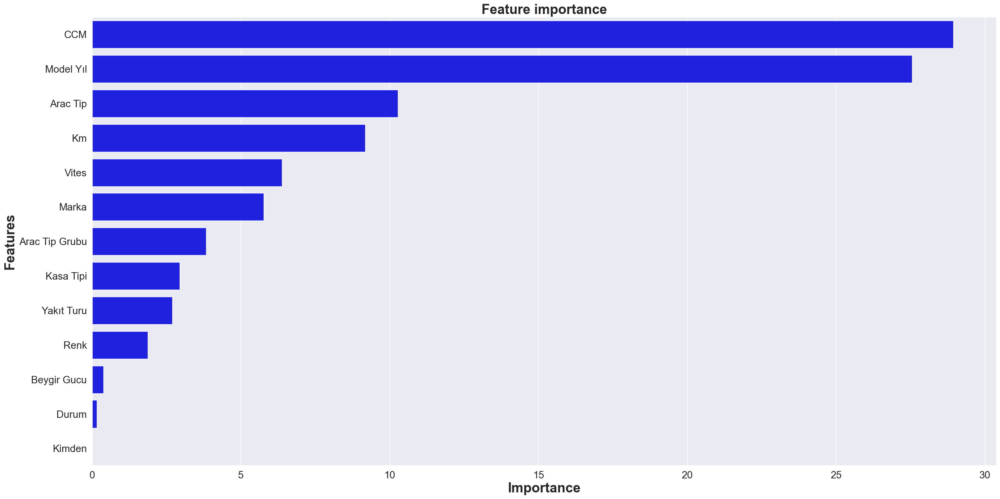

None

,Features,Gini-Importance
0,CCM,28.941854
1,Model Yıl,27.553875
2,Arac Tip,10.274645
3,Km,9.185036
4,Vites,6.387875
5,Marka,5.763442
6,Arac Tip Grubu,3.836121
7,Kasa Tipi,2.939336
8,Yakıt Turu,2.691047
9,Renk,1.871171


In [160]:
# Evaluation of the importance of the Random Forest model attributes
feature_importance(cb, X_train_encoded)

From the graph above, we can see that the key parameters for predicting car prices are the car’s manufacturing year and the CCM.

## Conclusion

To sum it up, we have successfully achieved our goal of creating a model that predicts car prices based on their characteristics. We used several models for price prediction, and CatBoost performed the best. The main parameters that influenced the model’s predictions were the car’s year of manufacture and the CCM. Since our model predicts prices for both cheap and expensive cars, there is variation in the predictions, with some cases showing significant differences. If we were to remove expensive cars from the dataset, the model would not be able to accurately predict their prices. Therefore, for more precise predictions, it would be beneficial to separate the data and create two models: one for ordinary cars and another for very expensive cars.

## List of sources

1 - https://towardsdatascience.com/phik-k-get-familiar-with-the-latest-correlation-coefficient-9ba0032b37e7

2 - https://www.techtarget.com/whatis/definition/outlier

3 - https://www.mygreatlearning.com/blog/what-is-regression/

4 - https://corporatefinanceinstitute.com/resources/data-science/r-squared/

5 - https://deepchecks.com/glossary/mean-absolute-error/

6 - https://www.statisticshowto.com/probability-and-statistics/regression-analysis/rmse-root-mean-square-error/

7 - https://www.geeksforgeeks.org/dummy-regressor/

8 - https://levelup.gitconnected.com/random-forest-regression-209c0f354c84

9 - https://towardsdatascience.com/catboost-regression-in-6-minutes-3487f3e5b329

10 - https://www.javatpoint.com/machine-learning-decision-tree-classification-algorithm